In [4]:
import pandas as pd
import math
from sklearn.ensemble import RandomForestClassifier,RandomForestRegressor
from sklearn.linear_model import LinearRegression 
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
import joblib
import random as r
import pickle,gzip

In [3]:
data=pd.read_csv("Loan_Default.csv")
data

,Gender,loan_type,loan_purpose,Credit_Worthiness,business_or_commercial,loan_amount,rate_of_interest,term,property_value,income,Credit_Score,age,Status
0,Sex Not Available,type1,p1,l1,nob/c,116500,NaN,360.0,118000.0,1740.0,758,25-34,1
1,Male,type2,p1,l1,b/c,206500,NaN,360.0,NaN,4980.0,552,55-64,1
2,Male,type1,p1,l1,nob/c,406500,4.560,360.0,508000.0,9480.0,834,35-44,0
3,Male,type1,p4,l1,nob/c,456500,4.250,360.0,658000.0,11880.0,587,45-54,0
4,Joint,type1,p1,l1,nob/c,696500,4.000,360.0,758000.0,10440.0,602,25-34,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
148665,Sex Not Available,type1,p3,l1,nob/c,436500,3.125,180.0,608000.0,7860.0,659,55-64,0
148666,Male,type1,p1,l1,nob/c,586500,5.190,360.0,788000.0,7140.0,569,25-34,0
148667,Male,type1,p4,l1,nob/c,446500,3.125,180.0,728000.0,6900.0,702,45-54,0
148668,Female,type1,p4,l1,nob/c,196500,3.500,180.0,278000.0,7140.0,737,55-64,0


In [25]:
f_data=data[["Gender","business_or_commercial","loan_purpose","loan_type","Credit_Worthiness","loan_amount","term","property_value","income","Credit_Score","age","Status","rate_of_interest"]]
f_data=data
f_data

,Gender,loan_type,loan_purpose,Credit_Worthiness,business_or_commercial,loan_amount,rate_of_interest,term,property_value,income,Credit_Score,age,Status
0,Sex Not Available,type1,p1,l1,nob/c,116500,NaN,360.0,118000.0,1740.0,758,25-34,1
1,Male,type2,p1,l1,b/c,206500,NaN,360.0,NaN,4980.0,552,55-64,1
2,Male,type1,p1,l1,nob/c,406500,4.560,360.0,508000.0,9480.0,834,35-44,0
3,Male,type1,p4,l1,nob/c,456500,4.250,360.0,658000.0,11880.0,587,45-54,0
4,Joint,type1,p1,l1,nob/c,696500,4.000,360.0,758000.0,10440.0,602,25-34,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
148665,Sex Not Available,type1,p3,l1,nob/c,436500,3.125,180.0,608000.0,7860.0,659,55-64,0
148666,Male,type1,p1,l1,nob/c,586500,5.190,360.0,788000.0,7140.0,569,25-34,0
148667,Male,type1,p4,l1,nob/c,446500,3.125,180.0,728000.0,6900.0,702,45-54,0
148668,Female,type1,p4,l1,nob/c,196500,3.500,180.0,278000.0,7140.0,737,55-64,0


In [212]:
def enc(df):
    df.replace(to_replace="Male",value=1,inplace=True)
    df.replace(to_replace="Sex Not Available",value=0,inplace=True)
    df.replace(to_replace="Female",value=2,inplace=True)
    df.replace(to_replace="Joint",value=3,inplace=True)
    
    df.replace(to_replace="type1",value=1,inplace=True)
    df.replace(to_replace="type2",value=2,inplace=True)
    df.replace(to_replace="type3",value=3,inplace=True)
    
    df.replace(to_replace="l1",value=1,inplace=True)
    df.replace(to_replace="l2",value=2,inplace=True)
   
    df.replace(to_replace="nob/c",value=0,inplace=True)
    df.replace(to_replace="b/c",value=1,inplace=True)
    df.replace(to_replace="p1",value=0,inplace=True)
    df.replace(to_replace="p2",value=1,inplace=True)
    df.replace(to_replace="p3",value=2,inplace=True)
    df.replace(to_replace="p4",value=3,inplace=True)
#     df.replace(to_replace="3+",value=4,inplace=True)
#     df.replace(to_replace=" ",value=0,inplace=True)
    
enc(f_data)
# enc(y)
f_data
# y=data["Loan_Status"]
# # data.dropna()
# data.drop("Loan_Status",axis=1,inplace=True)
# data

,Gender,loan_type,loan_purpose,Credit_Worthiness,business_or_commercial,loan_amount,rate_of_interest,term,property_value,income,Credit_Score,age,Status
0,0,1,0.0,1,0,116500,NaN,360.0,118000.0,1740.0,758,25-34,1
1,1,2,0.0,1,1,206500,NaN,360.0,NaN,4980.0,552,55-64,1
2,1,1,0.0,1,0,406500,4.560,360.0,508000.0,9480.0,834,35-44,0
3,1,1,3.0,1,0,456500,4.250,360.0,658000.0,11880.0,587,45-54,0
4,3,1,0.0,1,0,696500,4.000,360.0,758000.0,10440.0,602,25-34,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
148665,0,1,2.0,1,0,436500,3.125,180.0,608000.0,7860.0,659,55-64,0
148666,1,1,0.0,1,0,586500,5.190,360.0,788000.0,7140.0,569,25-34,0
148667,1,1,3.0,1,0,446500,3.125,180.0,728000.0,6900.0,702,45-54,0
148668,2,1,3.0,1,0,196500,3.500,180.0,278000.0,7140.0,737,55-64,0


In [213]:
# df = df.dropna(axis = 0, how = 'all')


In [214]:

f_data["rate_of_interest"].fillna(f_data["rate_of_interest"].mean(),inplace=True)
f_data["property_value"].fillna(f_data["property_value"].mean(),inplace=True)
f_data["income"].fillna(f_data["income"].mean(),inplace=True)
f_data["loan_purpose"].fillna(0,inplace=True)
f_data["term"].fillna(f_data["term"].mean(),inplace=True)
f_data["age"].fillna(30,inplace=True)
# f_data.fillna(f_data["age"].mean())
# f_data.dropna(f_data["age"],inplace=True)
# f_data.dropna() 
# f_data = f_data.dropna(axis = 0, how = 'all')
# f_data = f_data.dropna()




In [215]:
f_data.isnull().values.any()

False

In [216]:
# f_data.to_csv("hmm.csv")

PermissionError: [Errno 13] Permission denied: 'hmm.csv'

In [218]:
# q=0
# for i in f_data["age"]:
#     print(q)
#     print("vall : ",i)
# #     if(q == 20000): break
    
#     if(i == ""): 
#         f_data.loc[q,"age"] = 50
#         q+=1
#         continue
    
#     if(i == ">74"): 
#         f_data.loc[q,"age"] = 75
#         q+=1
#         continue
#     if(i == "<25"): 
#         f_data.loc[q,"age"] = 24
#         q+=1
#         continue
# #     if()
#     else:
#         try:
#             s=i.split("-")
#             s=math.floor((int(s[0])+int(s[1]))/2)
#     #         print(s)
#             f_data.loc[q,"age"]=s
#             q+=1
#         except:
#             f_data.loc[q,"age"]=int(s)
#             q+=1
# # f_data.fillna(f_data["rate_of_interest"].mean())
# f_data

0
vall :  29
1
vall :  59
2
vall :  39
3
vall :  49
4
vall :  29
5
vall :  39
6
vall :  59
7
vall :  59
8
vall :  59
9
vall :  59
10
vall :  59
11
vall :  39
12
vall :  69
13
vall :  59
14
vall :  39
15
vall :  49
16
vall :  29
17
vall :  69
18
vall :  49
19
vall :  59
20
vall :  69
21
vall :  75
22
vall :  59
23
vall :  69
24
vall :  39
25
vall :  49
26
vall :  49
27
vall :  29
28
vall :  59
29
vall :  39
30
vall :  29
31
vall :  59
32
vall :  39
33
vall :  49
34
vall :  29
35
vall :  49
36
vall :  59
37
vall :  49
38
vall :  69
39
vall :  39
40
vall :  39
41
vall :  39
42
vall :  49
43
vall :  39
44
vall :  39
45
vall :  49
46
vall :  59
47
vall :  59
48
vall :  49
49
vall :  29
50
vall :  29
51
vall :  69
52
vall :  69
53
vall :  69
54
vall :  39
55
vall :  59
56
vall :  49
57
vall :  49
58
vall :  39
59
vall :  39
60
vall :  69
61
vall :  39
62
vall :  39
63
vall :  24
64
vall :  59
65
vall :  59
66
vall :  69
67
vall :  69
68
vall :  29
69
vall :  69
70
vall :  75
71
vall :  39
72

533
vall :  45-54
534
vall :  35-44
535
vall :  55-64
536
vall :  >74
537
vall :  45-54
538
vall :  65-74
539
vall :  >74
540
vall :  35-44
541
vall :  65-74
542
vall :  25-34
543
vall :  35-44
544
vall :  25-34
545
vall :  55-64
546
vall :  55-64
547
vall :  <25
548
vall :  35-44
549
vall :  45-54
550
vall :  45-54
551
vall :  55-64
552
vall :  25-34
553
vall :  25-34
554
vall :  45-54
555
vall :  35-44
556
vall :  25-34
557
vall :  35-44
558
vall :  55-64
559
vall :  25-34
560
vall :  45-54
561
vall :  25-34
562
vall :  55-64
563
vall :  >74
564
vall :  35-44
565
vall :  45-54
566
vall :  25-34
567
vall :  45-54
568
vall :  55-64
569
vall :  35-44
570
vall :  55-64
571
vall :  45-54
572
vall :  35-44
573
vall :  55-64
574
vall :  45-54
575
vall :  35-44
576
vall :  45-54
577
vall :  45-54
578
vall :  65-74
579
vall :  >74
580
vall :  >74
581
vall :  25-34
582
vall :  45-54
583
vall :  25-34
584
vall :  55-64
585
vall :  >74
586
vall :  25-34
587
vall :  35-44
588
vall :  45-54
589
va

1008
vall :  >74
1009
vall :  55-64
1010
vall :  45-54
1011
vall :  45-54
1012
vall :  45-54
1013
vall :  65-74
1014
vall :  45-54
1015
vall :  55-64
1016
vall :  45-54
1017
vall :  45-54
1018
vall :  >74
1019
vall :  45-54
1020
vall :  45-54
1021
vall :  55-64
1022
vall :  55-64
1023
vall :  55-64
1024
vall :  45-54
1025
vall :  45-54
1026
vall :  55-64
1027
vall :  35-44
1028
vall :  55-64
1029
vall :  55-64
1030
vall :  55-64
1031
vall :  65-74
1032
vall :  <25
1033
vall :  45-54
1034
vall :  35-44
1035
vall :  >74
1036
vall :  45-54
1037
vall :  45-54
1038
vall :  <25
1039
vall :  25-34
1040
vall :  >74
1041
vall :  >74
1042
vall :  45-54
1043
vall :  45-54
1044
vall :  35-44
1045
vall :  35-44
1046
vall :  25-34
1047
vall :  45-54
1048
vall :  65-74
1049
vall :  55-64
1050
vall :  35-44
1051
vall :  35-44
1052
vall :  25-34
1053
vall :  45-54
1054
vall :  55-64
1055
vall :  35-44
1056
vall :  55-64
1057
vall :  45-54
1058
vall :  45-54
1059
vall :  45-54
1060
vall :  25-34
1061
va

1457
vall :  65-74
1458
vall :  55-64
1459
vall :  45-54
1460
vall :  55-64
1461
vall :  35-44
1462
vall :  25-34
1463
vall :  45-54
1464
vall :  65-74
1465
vall :  45-54
1466
vall :  65-74
1467
vall :  55-64
1468
vall :  55-64
1469
vall :  65-74
1470
vall :  55-64
1471
vall :  35-44
1472
vall :  45-54
1473
vall :  55-64
1474
vall :  35-44
1475
vall :  45-54
1476
vall :  65-74
1477
vall :  65-74
1478
vall :  25-34
1479
vall :  35-44
1480
vall :  65-74
1481
vall :  65-74
1482
vall :  65-74
1483
vall :  25-34
1484
vall :  45-54
1485
vall :  25-34
1486
vall :  65-74
1487
vall :  65-74
1488
vall :  55-64
1489
vall :  45-54
1490
vall :  45-54
1491
vall :  65-74
1492
vall :  55-64
1493
vall :  45-54
1494
vall :  45-54
1495
vall :  35-44
1496
vall :  45-54
1497
vall :  45-54
1498
vall :  35-44
1499
vall :  55-64
1500
vall :  25-34
1501
vall :  25-34
1502
vall :  55-64
1503
vall :  55-64
1504
vall :  35-44
1505
vall :  55-64
1506
vall :  45-54
1507
vall :  35-44
1508
vall :  35-44
1509
vall : 

1940
vall :  65-74
1941
vall :  45-54
1942
vall :  45-54
1943
vall :  45-54
1944
vall :  65-74
1945
vall :  55-64
1946
vall :  45-54
1947
vall :  35-44
1948
vall :  55-64
1949
vall :  35-44
1950
vall :  45-54
1951
vall :  65-74
1952
vall :  65-74
1953
vall :  35-44
1954
vall :  45-54
1955
vall :  25-34
1956
vall :  35-44
1957
vall :  65-74
1958
vall :  65-74
1959
vall :  45-54
1960
vall :  25-34
1961
vall :  35-44
1962
vall :  65-74
1963
vall :  65-74
1964
vall :  35-44
1965
vall :  55-64
1966
vall :  45-54
1967
vall :  55-64
1968
vall :  35-44
1969
vall :  35-44
1970
vall :  35-44
1971
vall :  35-44
1972
vall :  55-64
1973
vall :  65-74
1974
vall :  35-44
1975
vall :  35-44
1976
vall :  65-74
1977
vall :  35-44
1978
vall :  25-34
1979
vall :  65-74
1980
vall :  35-44
1981
vall :  35-44
1982
vall :  >74
1983
vall :  35-44
1984
vall :  35-44
1985
vall :  35-44
1986
vall :  65-74
1987
vall :  45-54
1988
vall :  45-54
1989
vall :  25-34
1990
vall :  35-44
1991
vall :  55-64
1992
vall :  6

2407
vall :  65-74
2408
vall :  35-44
2409
vall :  35-44
2410
vall :  35-44
2411
vall :  55-64
2412
vall :  45-54
2413
vall :  55-64
2414
vall :  35-44
2415
vall :  35-44
2416
vall :  45-54
2417
vall :  35-44
2418
vall :  45-54
2419
vall :  65-74
2420
vall :  65-74
2421
vall :  65-74
2422
vall :  55-64
2423
vall :  55-64
2424
vall :  55-64
2425
vall :  25-34
2426
vall :  55-64
2427
vall :  45-54
2428
vall :  65-74
2429
vall :  45-54
2430
vall :  25-34
2431
vall :  35-44
2432
vall :  55-64
2433
vall :  55-64
2434
vall :  55-64
2435
vall :  45-54
2436
vall :  45-54
2437
vall :  45-54
2438
vall :  55-64
2439
vall :  45-54
2440
vall :  35-44
2441
vall :  35-44
2442
vall :  35-44
2443
vall :  35-44
2444
vall :  65-74
2445
vall :  45-54
2446
vall :  55-64
2447
vall :  55-64
2448
vall :  35-44
2449
vall :  65-74
2450
vall :  35-44
2451
vall :  55-64
2452
vall :  45-54
2453
vall :  65-74
2454
vall :  45-54
2455
vall :  35-44
2456
vall :  55-64
2457
vall :  25-34
2458
vall :  55-64
2459
vall : 

2872
vall :  45-54
2873
vall :  55-64
2874
vall :  35-44
2875
vall :  45-54
2876
vall :  45-54
2877
vall :  45-54
2878
vall :  >74
2879
vall :  45-54
2880
vall :  35-44
2881
vall :  25-34
2882
vall :  45-54
2883
vall :  45-54
2884
vall :  55-64
2885
vall :  55-64
2886
vall :  45-54
2887
vall :  55-64
2888
vall :  65-74
2889
vall :  35-44
2890
vall :  55-64
2891
vall :  35-44
2892
vall :  35-44
2893
vall :  35-44
2894
vall :  45-54
2895
vall :  45-54
2896
vall :  35-44
2897
vall :  55-64
2898
vall :  65-74
2899
vall :  35-44
2900
vall :  55-64
2901
vall :  45-54
2902
vall :  35-44
2903
vall :  55-64
2904
vall :  45-54
2905
vall :  45-54
2906
vall :  65-74
2907
vall :  45-54
2908
vall :  65-74
2909
vall :  55-64
2910
vall :  55-64
2911
vall :  55-64
2912
vall :  45-54
2913
vall :  35-44
2914
vall :  65-74
2915
vall :  55-64
2916
vall :  55-64
2917
vall :  65-74
2918
vall :  35-44
2919
vall :  55-64
2920
vall :  35-44
2921
vall :  45-54
2922
vall :  45-54
2923
vall :  >74
2924
vall :  35-

3365
vall :  45-54
3366
vall :  35-44
3367
vall :  55-64
3368
vall :  55-64
3369
vall :  35-44
3370
vall :  45-54
3371
vall :  45-54
3372
vall :  55-64
3373
vall :  25-34
3374
vall :  55-64
3375
vall :  35-44
3376
vall :  55-64
3377
vall :  55-64
3378
vall :  65-74
3379
vall :  35-44
3380
vall :  25-34
3381
vall :  35-44
3382
vall :  <25
3383
vall :  45-54
3384
vall :  35-44
3385
vall :  25-34
3386
vall :  >74
3387
vall :  55-64
3388
vall :  55-64
3389
vall :  65-74
3390
vall :  65-74
3391
vall :  45-54
3392
vall :  55-64
3393
vall :  25-34
3394
vall :  55-64
3395
vall :  25-34
3396
vall :  45-54
3397
vall :  55-64
3398
vall :  >74
3399
vall :  35-44
3400
vall :  65-74
3401
vall :  45-54
3402
vall :  45-54
3403
vall :  35-44
3404
vall :  55-64
3405
vall :  45-54
3406
vall :  65-74
3407
vall :  55-64
3408
vall :  35-44
3409
vall :  35-44
3410
vall :  45-54
3411
vall :  55-64
3412
vall :  25-34
3413
vall :  >74
3414
vall :  45-54
3415
vall :  55-64
3416
vall :  65-74
3417
vall :  35-44
3

3829
vall :  35-44
3830
vall :  55-64
3831
vall :  >74
3832
vall :  55-64
3833
vall :  45-54
3834
vall :  65-74
3835
vall :  55-64
3836
vall :  65-74
3837
vall :  25-34
3838
vall :  25-34
3839
vall :  35-44
3840
vall :  35-44
3841
vall :  45-54
3842
vall :  65-74
3843
vall :  45-54
3844
vall :  35-44
3845
vall :  25-34
3846
vall :  55-64
3847
vall :  45-54
3848
vall :  45-54
3849
vall :  45-54
3850
vall :  45-54
3851
vall :  45-54
3852
vall :  65-74
3853
vall :  55-64
3854
vall :  45-54
3855
vall :  55-64
3856
vall :  45-54
3857
vall :  55-64
3858
vall :  65-74
3859
vall :  55-64
3860
vall :  55-64
3861
vall :  35-44
3862
vall :  55-64
3863
vall :  25-34
3864
vall :  45-54
3865
vall :  55-64
3866
vall :  55-64
3867
vall :  35-44
3868
vall :  35-44
3869
vall :  25-34
3870
vall :  45-54
3871
vall :  35-44
3872
vall :  55-64
3873
vall :  45-54
3874
vall :  65-74
3875
vall :  35-44
3876
vall :  45-54
3877
vall :  55-64
3878
vall :  35-44
3879
vall :  65-74
3880
vall :  35-44
3881
vall :  4

4296
vall :  55-64
4297
vall :  45-54
4298
vall :  35-44
4299
vall :  >74
4300
vall :  55-64
4301
vall :  35-44
4302
vall :  45-54
4303
vall :  55-64
4304
vall :  45-54
4305
vall :  65-74
4306
vall :  65-74
4307
vall :  55-64
4308
vall :  55-64
4309
vall :  35-44
4310
vall :  <25
4311
vall :  25-34
4312
vall :  35-44
4313
vall :  45-54
4314
vall :  55-64
4315
vall :  45-54
4316
vall :  65-74
4317
vall :  25-34
4318
vall :  35-44
4319
vall :  35-44
4320
vall :  35-44
4321
vall :  55-64
4322
vall :  35-44
4323
vall :  65-74
4324
vall :  35-44
4325
vall :  25-34
4326
vall :  25-34
4327
vall :  55-64
4328
vall :  55-64
4329
vall :  65-74
4330
vall :  65-74
4331
vall :  55-64
4332
vall :  25-34
4333
vall :  55-64
4334
vall :  35-44
4335
vall :  35-44
4336
vall :  35-44
4337
vall :  65-74
4338
vall :  35-44
4339
vall :  45-54
4340
vall :  35-44
4341
vall :  55-64
4342
vall :  55-64
4343
vall :  55-64
4344
vall :  35-44
4345
vall :  25-34
4346
vall :  65-74
4347
vall :  45-54
4348
vall :  25-

4764
vall :  35-44
4765
vall :  35-44
4766
vall :  55-64
4767
vall :  65-74
4768
vall :  65-74
4769
vall :  55-64
4770
vall :  65-74
4771
vall :  65-74
4772
vall :  45-54
4773
vall :  35-44
4774
vall :  65-74
4775
vall :  35-44
4776
vall :  65-74
4777
vall :  45-54
4778
vall :  55-64
4779
vall :  65-74
4780
vall :  45-54
4781
vall :  55-64
4782
vall :  55-64
4783
vall :  35-44
4784
vall :  35-44
4785
vall :  35-44
4786
vall :  55-64
4787
vall :  25-34
4788
vall :  35-44
4789
vall :  35-44
4790
vall :  45-54
4791
vall :  45-54
4792
vall :  55-64
4793
vall :  35-44
4794
vall :  55-64
4795
vall :  65-74
4796
vall :  55-64
4797
vall :  65-74
4798
vall :  25-34
4799
vall :  35-44
4800
vall :  65-74
4801
vall :  55-64
4802
vall :  55-64
4803
vall :  45-54
4804
vall :  55-64
4805
vall :  35-44
4806
vall :  45-54
4807
vall :  35-44
4808
vall :  45-54
4809
vall :  65-74
4810
vall :  35-44
4811
vall :  55-64
4812
vall :  45-54
4813
vall :  55-64
4814
vall :  >74
4815
vall :  45-54
4816
vall :  3

5236
vall :  25-34
5237
vall :  55-64
5238
vall :  45-54
5239
vall :  65-74
5240
vall :  45-54
5241
vall :  45-54
5242
vall :  >74
5243
vall :  35-44
5244
vall :  45-54
5245
vall :  55-64
5246
vall :  55-64
5247
vall :  65-74
5248
vall :  25-34
5249
vall :  >74
5250
vall :  55-64
5251
vall :  55-64
5252
vall :  65-74
5253
vall :  35-44
5254
vall :  45-54
5255
vall :  35-44
5256
vall :  35-44
5257
vall :  35-44
5258
vall :  65-74
5259
vall :  35-44
5260
vall :  >74
5261
vall :  65-74
5262
vall :  >74
5263
vall :  25-34
5264
vall :  35-44
5265
vall :  >74
5266
vall :  65-74
5267
vall :  35-44
5268
vall :  55-64
5269
vall :  45-54
5270
vall :  35-44
5271
vall :  55-64
5272
vall :  45-54
5273
vall :  35-44
5274
vall :  45-54
5275
vall :  45-54
5276
vall :  45-54
5277
vall :  35-44
5278
vall :  55-64
5279
vall :  35-44
5280
vall :  45-54
5281
vall :  35-44
5282
vall :  >74
5283
vall :  45-54
5284
vall :  55-64
5285
vall :  25-34
5286
vall :  55-64
5287
vall :  45-54
5288
vall :  25-34
5289


5683
vall :  55-64
5684
vall :  55-64
5685
vall :  35-44
5686
vall :  35-44
5687
vall :  25-34
5688
vall :  35-44
5689
vall :  45-54
5690
vall :  35-44
5691
vall :  45-54
5692
vall :  25-34
5693
vall :  55-64
5694
vall :  55-64
5695
vall :  55-64
5696
vall :  45-54
5697
vall :  35-44
5698
vall :  45-54
5699
vall :  55-64
5700
vall :  55-64
5701
vall :  25-34
5702
vall :  65-74
5703
vall :  35-44
5704
vall :  35-44
5705
vall :  <25
5706
vall :  45-54
5707
vall :  55-64
5708
vall :  25-34
5709
vall :  45-54
5710
vall :  65-74
5711
vall :  45-54
5712
vall :  65-74
5713
vall :  55-64
5714
vall :  25-34
5715
vall :  55-64
5716
vall :  25-34
5717
vall :  55-64
5718
vall :  55-64
5719
vall :  55-64
5720
vall :  35-44
5721
vall :  45-54
5722
vall :  65-74
5723
vall :  35-44
5724
vall :  >74
5725
vall :  55-64
5726
vall :  35-44
5727
vall :  45-54
5728
vall :  65-74
5729
vall :  55-64
5730
vall :  35-44
5731
vall :  65-74
5732
vall :  35-44
5733
vall :  65-74
5734
vall :  55-64
5735
vall :  >74

6146
vall :  45-54
6147
vall :  45-54
6148
vall :  65-74
6149
vall :  45-54
6150
vall :  55-64
6151
vall :  35-44
6152
vall :  45-54
6153
vall :  35-44
6154
vall :  35-44
6155
vall :  35-44
6156
vall :  55-64
6157
vall :  25-34
6158
vall :  35-44
6159
vall :  35-44
6160
vall :  65-74
6161
vall :  55-64
6162
vall :  45-54
6163
vall :  55-64
6164
vall :  >74
6165
vall :  35-44
6166
vall :  35-44
6167
vall :  55-64
6168
vall :  >74
6169
vall :  35-44
6170
vall :  25-34
6171
vall :  45-54
6172
vall :  45-54
6173
vall :  45-54
6174
vall :  25-34
6175
vall :  65-74
6176
vall :  25-34
6177
vall :  45-54
6178
vall :  35-44
6179
vall :  55-64
6180
vall :  35-44
6181
vall :  45-54
6182
vall :  65-74
6183
vall :  65-74
6184
vall :  45-54
6185
vall :  65-74
6186
vall :  55-64
6187
vall :  25-34
6188
vall :  35-44
6189
vall :  45-54
6190
vall :  65-74
6191
vall :  25-34
6192
vall :  55-64
6193
vall :  45-54
6194
vall :  >74
6195
vall :  25-34
6196
vall :  25-34
6197
vall :  45-54
6198
vall :  45-54

6600
vall :  45-54
6601
vall :  25-34
6602
vall :  45-54
6603
vall :  25-34
6604
vall :  45-54
6605
vall :  35-44
6606
vall :  55-64
6607
vall :  65-74
6608
vall :  45-54
6609
vall :  55-64
6610
vall :  35-44
6611
vall :  65-74
6612
vall :  55-64
6613
vall :  >74
6614
vall :  55-64
6615
vall :  35-44
6616
vall :  25-34
6617
vall :  45-54
6618
vall :  55-64
6619
vall :  45-54
6620
vall :  55-64
6621
vall :  45-54
6622
vall :  55-64
6623
vall :  25-34
6624
vall :  >74
6625
vall :  65-74
6626
vall :  65-74
6627
vall :  25-34
6628
vall :  65-74
6629
vall :  45-54
6630
vall :  65-74
6631
vall :  65-74
6632
vall :  45-54
6633
vall :  35-44
6634
vall :  35-44
6635
vall :  45-54
6636
vall :  55-64
6637
vall :  55-64
6638
vall :  65-74
6639
vall :  >74
6640
vall :  45-54
6641
vall :  55-64
6642
vall :  45-54
6643
vall :  >74
6644
vall :  45-54
6645
vall :  45-54
6646
vall :  65-74
6647
vall :  65-74
6648
vall :  25-34
6649
vall :  25-34
6650
vall :  55-64
6651
vall :  65-74
6652
vall :  65-74
6

7059
vall :  55-64
7060
vall :  35-44
7061
vall :  65-74
7062
vall :  35-44
7063
vall :  35-44
7064
vall :  45-54
7065
vall :  25-34
7066
vall :  35-44
7067
vall :  45-54
7068
vall :  35-44
7069
vall :  65-74
7070
vall :  25-34
7071
vall :  >74
7072
vall :  25-34
7073
vall :  55-64
7074
vall :  25-34
7075
vall :  55-64
7076
vall :  35-44
7077
vall :  25-34
7078
vall :  45-54
7079
vall :  35-44
7080
vall :  65-74
7081
vall :  35-44
7082
vall :  35-44
7083
vall :  25-34
7084
vall :  35-44
7085
vall :  55-64
7086
vall :  65-74
7087
vall :  35-44
7088
vall :  45-54
7089
vall :  35-44
7090
vall :  35-44
7091
vall :  45-54
7092
vall :  25-34
7093
vall :  35-44
7094
vall :  65-74
7095
vall :  65-74
7096
vall :  55-64
7097
vall :  65-74
7098
vall :  35-44
7099
vall :  45-54
7100
vall :  35-44
7101
vall :  55-64
7102
vall :  65-74
7103
vall :  35-44
7104
vall :  55-64
7105
vall :  45-54
7106
vall :  55-64
7107
vall :  35-44
7108
vall :  35-44
7109
vall :  25-34
7110
vall :  55-64
7111
vall :  6

7494
vall :  55-64
7495
vall :  35-44
7496
vall :  25-34
7497
vall :  45-54
7498
vall :  55-64
7499
vall :  55-64
7500
vall :  35-44
7501
vall :  55-64
7502
vall :  45-54
7503
vall :  65-74
7504
vall :  25-34
7505
vall :  25-34
7506
vall :  55-64
7507
vall :  55-64
7508
vall :  35-44
7509
vall :  25-34
7510
vall :  25-34
7511
vall :  55-64
7512
vall :  45-54
7513
vall :  45-54
7514
vall :  65-74
7515
vall :  55-64
7516
vall :  >74
7517
vall :  45-54
7518
vall :  35-44
7519
vall :  45-54
7520
vall :  35-44
7521
vall :  55-64
7522
vall :  35-44
7523
vall :  65-74
7524
vall :  45-54
7525
vall :  35-44
7526
vall :  55-64
7527
vall :  55-64
7528
vall :  65-74
7529
vall :  55-64
7530
vall :  25-34
7531
vall :  65-74
7532
vall :  45-54
7533
vall :  45-54
7534
vall :  45-54
7535
vall :  55-64
7536
vall :  45-54
7537
vall :  45-54
7538
vall :  >74
7539
vall :  25-34
7540
vall :  65-74
7541
vall :  55-64
7542
vall :  35-44
7543
vall :  45-54
7544
vall :  25-34
7545
vall :  65-74
7546
vall :  55-

7946
vall :  35-44
7947
vall :  55-64
7948
vall :  25-34
7949
vall :  45-54
7950
vall :  45-54
7951
vall :  45-54
7952
vall :  45-54
7953
vall :  45-54
7954
vall :  35-44
7955
vall :  45-54
7956
vall :  >74
7957
vall :  45-54
7958
vall :  45-54
7959
vall :  25-34
7960
vall :  35-44
7961
vall :  <25
7962
vall :  45-54
7963
vall :  55-64
7964
vall :  45-54
7965
vall :  35-44
7966
vall :  >74
7967
vall :  35-44
7968
vall :  35-44
7969
vall :  65-74
7970
vall :  >74
7971
vall :  55-64
7972
vall :  >74
7973
vall :  25-34
7974
vall :  45-54
7975
vall :  65-74
7976
vall :  45-54
7977
vall :  45-54
7978
vall :  35-44
7979
vall :  <25
7980
vall :  55-64
7981
vall :  55-64
7982
vall :  35-44
7983
vall :  55-64
7984
vall :  55-64
7985
vall :  25-34
7986
vall :  >74
7987
vall :  35-44
7988
vall :  35-44
7989
vall :  35-44
7990
vall :  25-34
7991
vall :  35-44
7992
vall :  45-54
7993
vall :  35-44
7994
vall :  25-34
7995
vall :  55-64
7996
vall :  25-34
7997
vall :  55-64
7998
vall :  35-44
7999
va

8410
vall :  65-74
8411
vall :  55-64
8412
vall :  45-54
8413
vall :  55-64
8414
vall :  45-54
8415
vall :  55-64
8416
vall :  >74
8417
vall :  65-74
8418
vall :  25-34
8419
vall :  35-44
8420
vall :  65-74
8421
vall :  25-34
8422
vall :  35-44
8423
vall :  55-64
8424
vall :  35-44
8425
vall :  25-34
8426
vall :  55-64
8427
vall :  55-64
8428
vall :  25-34
8429
vall :  <25
8430
vall :  45-54
8431
vall :  55-64
8432
vall :  65-74
8433
vall :  55-64
8434
vall :  35-44
8435
vall :  45-54
8436
vall :  35-44
8437
vall :  45-54
8438
vall :  45-54
8439
vall :  55-64
8440
vall :  65-74
8441
vall :  35-44
8442
vall :  65-74
8443
vall :  35-44
8444
vall :  >74
8445
vall :  65-74
8446
vall :  55-64
8447
vall :  25-34
8448
vall :  55-64
8449
vall :  25-34
8450
vall :  55-64
8451
vall :  55-64
8452
vall :  <25
8453
vall :  55-64
8454
vall :  55-64
8455
vall :  55-64
8456
vall :  65-74
8457
vall :  65-74
8458
vall :  25-34
8459
vall :  55-64
8460
vall :  65-74
8461
vall :  45-54
8462
vall :  35-44
8

8883
vall :  35-44
8884
vall :  35-44
8885
vall :  >74
8886
vall :  35-44
8887
vall :  25-34
8888
vall :  35-44
8889
vall :  45-54
8890
vall :  35-44
8891
vall :  65-74
8892
vall :  45-54
8893
vall :  65-74
8894
vall :  35-44
8895
vall :  45-54
8896
vall :  25-34
8897
vall :  45-54
8898
vall :  65-74
8899
vall :  45-54
8900
vall :  45-54
8901
vall :  65-74
8902
vall :  55-64
8903
vall :  45-54
8904
vall :  45-54
8905
vall :  65-74
8906
vall :  45-54
8907
vall :  25-34
8908
vall :  25-34
8909
vall :  >74
8910
vall :  55-64
8911
vall :  55-64
8912
vall :  <25
8913
vall :  45-54
8914
vall :  45-54
8915
vall :  65-74
8916
vall :  25-34
8917
vall :  45-54
8918
vall :  45-54
8919
vall :  45-54
8920
vall :  45-54
8921
vall :  >74
8922
vall :  55-64
8923
vall :  55-64
8924
vall :  45-54
8925
vall :  55-64
8926
vall :  45-54
8927
vall :  45-54
8928
vall :  35-44
8929
vall :  55-64
8930
vall :  35-44
8931
vall :  35-44
8932
vall :  45-54
8933
vall :  45-54
8934
vall :  35-44
8935
vall :  55-64
8

9382
vall :  45-54
9383
vall :  65-74
9384
vall :  55-64
9385
vall :  55-64
9386
vall :  >74
9387
vall :  35-44
9388
vall :  45-54
9389
vall :  45-54
9390
vall :  35-44
9391
vall :  35-44
9392
vall :  55-64
9393
vall :  35-44
9394
vall :  55-64
9395
vall :  45-54
9396
vall :  35-44
9397
vall :  55-64
9398
vall :  45-54
9399
vall :  65-74
9400
vall :  65-74
9401
vall :  45-54
9402
vall :  65-74
9403
vall :  25-34
9404
vall :  45-54
9405
vall :  25-34
9406
vall :  45-54
9407
vall :  55-64
9408
vall :  35-44
9409
vall :  35-44
9410
vall :  55-64
9411
vall :  45-54
9412
vall :  25-34
9413
vall :  35-44
9414
vall :  45-54
9415
vall :  25-34
9416
vall :  45-54
9417
vall :  65-74
9418
vall :  55-64
9419
vall :  <25
9420
vall :  55-64
9421
vall :  55-64
9422
vall :  55-64
9423
vall :  25-34
9424
vall :  25-34
9425
vall :  35-44
9426
vall :  45-54
9427
vall :  55-64
9428
vall :  >74
9429
vall :  35-44
9430
vall :  45-54
9431
vall :  35-44
9432
vall :  55-64
9433
vall :  45-54
9434
vall :  35-44

9841
vall :  35-44
9842
vall :  35-44
9843
vall :  45-54
9844
vall :  65-74
9845
vall :  45-54
9846
vall :  25-34
9847
vall :  35-44
9848
vall :  45-54
9849
vall :  65-74
9850
vall :  25-34
9851
vall :  55-64
9852
vall :  45-54
9853
vall :  65-74
9854
vall :  >74
9855
vall :  55-64
9856
vall :  35-44
9857
vall :  35-44
9858
vall :  >74
9859
vall :  65-74
9860
vall :  65-74
9861
vall :  35-44
9862
vall :  >74
9863
vall :  45-54
9864
vall :  35-44
9865
vall :  45-54
9866
vall :  55-64
9867
vall :  45-54
9868
vall :  35-44
9869
vall :  35-44
9870
vall :  65-74
9871
vall :  35-44
9872
vall :  35-44
9873
vall :  35-44
9874
vall :  25-34
9875
vall :  45-54
9876
vall :  45-54
9877
vall :  25-34
9878
vall :  35-44
9879
vall :  25-34
9880
vall :  45-54
9881
vall :  55-64
9882
vall :  25-34
9883
vall :  35-44
9884
vall :  35-44
9885
vall :  55-64
9886
vall :  65-74
9887
vall :  65-74
9888
vall :  25-34
9889
vall :  65-74
9890
vall :  35-44
9891
vall :  55-64
9892
vall :  45-54
9893
vall :  25-34

10303
vall :  55-64
10304
vall :  45-54
10305
vall :  45-54
10306
vall :  55-64
10307
vall :  55-64
10308
vall :  45-54
10309
vall :  65-74
10310
vall :  55-64
10311
vall :  35-44
10312
vall :  65-74
10313
vall :  45-54
10314
vall :  45-54
10315
vall :  35-44
10316
vall :  55-64
10317
vall :  45-54
10318
vall :  35-44
10319
vall :  25-34
10320
vall :  35-44
10321
vall :  65-74
10322
vall :  55-64
10323
vall :  35-44
10324
vall :  35-44
10325
vall :  45-54
10326
vall :  >74
10327
vall :  35-44
10328
vall :  45-54
10329
vall :  35-44
10330
vall :  45-54
10331
vall :  55-64
10332
vall :  35-44
10333
vall :  65-74
10334
vall :  65-74
10335
vall :  55-64
10336
vall :  35-44
10337
vall :  55-64
10338
vall :  45-54
10339
vall :  65-74
10340
vall :  35-44
10341
vall :  35-44
10342
vall :  45-54
10343
vall :  >74
10344
vall :  25-34
10345
vall :  55-64
10346
vall :  >74
10347
vall :  65-74
10348
vall :  35-44
10349
vall :  35-44
10350
vall :  35-44
10351
vall :  65-74
10352
vall :  35-44
10353


10740
vall :  55-64
10741
vall :  35-44
10742
vall :  55-64
10743
vall :  35-44
10744
vall :  45-54
10745
vall :  45-54
10746
vall :  25-34
10747
vall :  65-74
10748
vall :  45-54
10749
vall :  45-54
10750
vall :  45-54
10751
vall :  65-74
10752
vall :  45-54
10753
vall :  25-34
10754
vall :  45-54
10755
vall :  55-64
10756
vall :  55-64
10757
vall :  55-64
10758
vall :  35-44
10759
vall :  25-34
10760
vall :  35-44
10761
vall :  25-34
10762
vall :  45-54
10763
vall :  55-64
10764
vall :  55-64
10765
vall :  35-44
10766
vall :  55-64
10767
vall :  55-64
10768
vall :  35-44
10769
vall :  35-44
10770
vall :  35-44
10771
vall :  45-54
10772
vall :  55-64
10773
vall :  25-34
10774
vall :  35-44
10775
vall :  35-44
10776
vall :  55-64
10777
vall :  35-44
10778
vall :  65-74
10779
vall :  25-34
10780
vall :  35-44
10781
vall :  25-34
10782
vall :  45-54
10783
vall :  25-34
10784
vall :  >74
10785
vall :  55-64
10786
vall :  35-44
10787
vall :  25-34
10788
vall :  35-44
10789
vall :  25-34
10

11205
vall :  45-54
11206
vall :  55-64
11207
vall :  35-44
11208
vall :  >74
11209
vall :  25-34
11210
vall :  55-64
11211
vall :  45-54
11212
vall :  25-34
11213
vall :  55-64
11214
vall :  55-64
11215
vall :  25-34
11216
vall :  35-44
11217
vall :  35-44
11218
vall :  35-44
11219
vall :  25-34
11220
vall :  45-54
11221
vall :  45-54
11222
vall :  35-44
11223
vall :  45-54
11224
vall :  45-54
11225
vall :  55-64
11226
vall :  25-34
11227
vall :  25-34
11228
vall :  45-54
11229
vall :  55-64
11230
vall :  45-54
11231
vall :  35-44
11232
vall :  25-34
11233
vall :  35-44
11234
vall :  55-64
11235
vall :  45-54
11236
vall :  55-64
11237
vall :  55-64
11238
vall :  25-34
11239
vall :  35-44
11240
vall :  45-54
11241
vall :  65-74
11242
vall :  25-34
11243
vall :  35-44
11244
vall :  55-64
11245
vall :  55-64
11246
vall :  25-34
11247
vall :  35-44
11248
vall :  55-64
11249
vall :  35-44
11250
vall :  45-54
11251
vall :  35-44
11252
vall :  35-44
11253
vall :  25-34
11254
vall :  45-54
11

vall :  45-54
11652
vall :  55-64
11653
vall :  55-64
11654
vall :  55-64
11655
vall :  45-54
11656
vall :  45-54
11657
vall :  45-54
11658
vall :  45-54
11659
vall :  65-74
11660
vall :  55-64
11661
vall :  65-74
11662
vall :  35-44
11663
vall :  45-54
11664
vall :  25-34
11665
vall :  35-44
11666
vall :  45-54
11667
vall :  25-34
11668
vall :  45-54
11669
vall :  <25
11670
vall :  >74
11671
vall :  45-54
11672
vall :  45-54
11673
vall :  25-34
11674
vall :  55-64
11675
vall :  25-34
11676
vall :  65-74
11677
vall :  45-54
11678
vall :  45-54
11679
vall :  35-44
11680
vall :  >74
11681
vall :  65-74
11682
vall :  35-44
11683
vall :  >74
11684
vall :  55-64
11685
vall :  55-64
11686
vall :  35-44
11687
vall :  35-44
11688
vall :  65-74
11689
vall :  35-44
11690
vall :  55-64
11691
vall :  45-54
11692
vall :  65-74
11693
vall :  >74
11694
vall :  55-64
11695
vall :  55-64
11696
vall :  65-74
11697
vall :  35-44
11698
vall :  55-64
11699
vall :  65-74
11700
vall :  35-44
11701
vall :  45

12115
vall :  45-54
12116
vall :  65-74
12117
vall :  55-64
12118
vall :  35-44
12119
vall :  55-64
12120
vall :  55-64
12121
vall :  35-44
12122
vall :  45-54
12123
vall :  65-74
12124
vall :  45-54
12125
vall :  35-44
12126
vall :  45-54
12127
vall :  55-64
12128
vall :  35-44
12129
vall :  65-74
12130
vall :  55-64
12131
vall :  55-64
12132
vall :  45-54
12133
vall :  45-54
12134
vall :  35-44
12135
vall :  55-64
12136
vall :  65-74
12137
vall :  55-64
12138
vall :  45-54
12139
vall :  35-44
12140
vall :  <25
12141
vall :  45-54
12142
vall :  45-54
12143
vall :  55-64
12144
vall :  35-44
12145
vall :  45-54
12146
vall :  25-34
12147
vall :  45-54
12148
vall :  35-44
12149
vall :  35-44
12150
vall :  45-54
12151
vall :  35-44
12152
vall :  35-44
12153
vall :  >74
12154
vall :  55-64
12155
vall :  45-54
12156
vall :  <25
12157
vall :  35-44
12158
vall :  55-64
12159
vall :  35-44
12160
vall :  45-54
12161
vall :  45-54
12162
vall :  55-64
12163
vall :  45-54
12164
vall :  35-44
12165


12592
vall :  45-54
12593
vall :  55-64
12594
vall :  45-54
12595
vall :  35-44
12596
vall :  30
12597
vall :  55-64
12598
vall :  45-54
12599
vall :  25-34
12600
vall :  55-64
12601
vall :  55-64
12602
vall :  55-64
12603
vall :  65-74
12604
vall :  45-54
12605
vall :  <25
12606
vall :  45-54
12607
vall :  35-44
12608
vall :  35-44
12609
vall :  35-44
12610
vall :  <25
12611
vall :  45-54
12612
vall :  45-54
12613
vall :  45-54
12614
vall :  45-54
12615
vall :  55-64
12616
vall :  55-64
12617
vall :  25-34
12618
vall :  45-54
12619
vall :  55-64
12620
vall :  65-74
12621
vall :  35-44
12622
vall :  65-74
12623
vall :  >74
12624
vall :  65-74
12625
vall :  55-64
12626
vall :  55-64
12627
vall :  65-74
12628
vall :  35-44
12629
vall :  35-44
12630
vall :  45-54
12631
vall :  35-44
12632
vall :  65-74
12633
vall :  65-74
12634
vall :  55-64
12635
vall :  65-74
12636
vall :  45-54
12637
vall :  55-64
12638
vall :  45-54
12639
vall :  45-54
12640
vall :  35-44
12641
vall :  35-44
12642
val

13047
vall :  65-74
13048
vall :  65-74
13049
vall :  55-64
13050
vall :  35-44
13051
vall :  45-54
13052
vall :  35-44
13053
vall :  65-74
13054
vall :  35-44
13055
vall :  45-54
13056
vall :  <25
13057
vall :  55-64
13058
vall :  65-74
13059
vall :  55-64
13060
vall :  35-44
13061
vall :  65-74
13062
vall :  35-44
13063
vall :  45-54
13064
vall :  45-54
13065
vall :  35-44
13066
vall :  35-44
13067
vall :  55-64
13068
vall :  45-54
13069
vall :  55-64
13070
vall :  35-44
13071
vall :  55-64
13072
vall :  35-44
13073
vall :  55-64
13074
vall :  45-54
13075
vall :  35-44
13076
vall :  25-34
13077
vall :  35-44
13078
vall :  45-54
13079
vall :  55-64
13080
vall :  45-54
13081
vall :  65-74
13082
vall :  >74
13083
vall :  25-34
13084
vall :  25-34
13085
vall :  55-64
13086
vall :  55-64
13087
vall :  35-44
13088
vall :  65-74
13089
vall :  65-74
13090
vall :  35-44
13091
vall :  55-64
13092
vall :  45-54
13093
vall :  35-44
13094
vall :  45-54
13095
vall :  35-44
13096
vall :  35-44
1309

13477
vall :  25-34
13478
vall :  45-54
13479
vall :  35-44
13480
vall :  65-74
13481
vall :  65-74
13482
vall :  35-44
13483
vall :  45-54
13484
vall :  35-44
13485
vall :  25-34
13486
vall :  65-74
13487
vall :  >74
13488
vall :  >74
13489
vall :  35-44
13490
vall :  55-64
13491
vall :  35-44
13492
vall :  45-54
13493
vall :  >74
13494
vall :  55-64
13495
vall :  55-64
13496
vall :  35-44
13497
vall :  25-34
13498
vall :  55-64
13499
vall :  55-64
13500
vall :  45-54
13501
vall :  55-64
13502
vall :  35-44
13503
vall :  65-74
13504
vall :  55-64
13505
vall :  45-54
13506
vall :  55-64
13507
vall :  35-44
13508
vall :  35-44
13509
vall :  65-74
13510
vall :  35-44
13511
vall :  65-74
13512
vall :  55-64
13513
vall :  >74
13514
vall :  35-44
13515
vall :  25-34
13516
vall :  25-34
13517
vall :  35-44
13518
vall :  55-64
13519
vall :  35-44
13520
vall :  >74
13521
vall :  45-54
13522
vall :  55-64
13523
vall :  65-74
13524
vall :  35-44
13525
vall :  35-44
13526
vall :  25-34
13527
vall

13955
vall :  25-34
13956
vall :  45-54
13957
vall :  45-54
13958
vall :  55-64
13959
vall :  25-34
13960
vall :  35-44
13961
vall :  55-64
13962
vall :  55-64
13963
vall :  55-64
13964
vall :  45-54
13965
vall :  25-34
13966
vall :  45-54
13967
vall :  45-54
13968
vall :  25-34
13969
vall :  45-54
13970
vall :  35-44
13971
vall :  55-64
13972
vall :  25-34
13973
vall :  45-54
13974
vall :  35-44
13975
vall :  <25
13976
vall :  35-44
13977
vall :  25-34
13978
vall :  55-64
13979
vall :  55-64
13980
vall :  45-54
13981
vall :  55-64
13982
vall :  25-34
13983
vall :  55-64
13984
vall :  35-44
13985
vall :  35-44
13986
vall :  45-54
13987
vall :  35-44
13988
vall :  55-64
13989
vall :  35-44
13990
vall :  65-74
13991
vall :  45-54
13992
vall :  45-54
13993
vall :  35-44
13994
vall :  25-34
13995
vall :  >74
13996
vall :  45-54
13997
vall :  25-34
13998
vall :  45-54
13999
vall :  35-44
14000
vall :  35-44
14001
vall :  45-54
14002
vall :  55-64
14003
vall :  55-64
14004
vall :  25-34
1400

14416
vall :  55-64
14417
vall :  45-54
14418
vall :  55-64
14419
vall :  55-64
14420
vall :  >74
14421
vall :  65-74
14422
vall :  >74
14423
vall :  35-44
14424
vall :  55-64
14425
vall :  45-54
14426
vall :  45-54
14427
vall :  45-54
14428
vall :  45-54
14429
vall :  45-54
14430
vall :  55-64
14431
vall :  35-44
14432
vall :  35-44
14433
vall :  65-74
14434
vall :  45-54
14435
vall :  >74
14436
vall :  55-64
14437
vall :  25-34
14438
vall :  55-64
14439
vall :  35-44
14440
vall :  45-54
14441
vall :  25-34
14442
vall :  25-34
14443
vall :  35-44
14444
vall :  35-44
14445
vall :  45-54
14446
vall :  35-44
14447
vall :  25-34
14448
vall :  35-44
14449
vall :  35-44
14450
vall :  45-54
14451
vall :  >74
14452
vall :  25-34
14453
vall :  35-44
14454
vall :  45-54
14455
vall :  65-74
14456
vall :  65-74
14457
vall :  65-74
14458
vall :  55-64
14459
vall :  65-74
14460
vall :  <25
14461
vall :  35-44
14462
vall :  45-54
14463
vall :  55-64
14464
vall :  45-54
14465
vall :  25-34
14466
vall

14839
vall :  45-54
14840
vall :  25-34
14841
vall :  65-74
14842
vall :  55-64
14843
vall :  >74
14844
vall :  35-44
14845
vall :  45-54
14846
vall :  45-54
14847
vall :  >74
14848
vall :  35-44
14849
vall :  55-64
14850
vall :  35-44
14851
vall :  45-54
14852
vall :  35-44
14853
vall :  55-64
14854
vall :  65-74
14855
vall :  25-34
14856
vall :  55-64
14857
vall :  55-64
14858
vall :  25-34
14859
vall :  35-44
14860
vall :  65-74
14861
vall :  25-34
14862
vall :  45-54
14863
vall :  35-44
14864
vall :  25-34
14865
vall :  45-54
14866
vall :  35-44
14867
vall :  45-54
14868
vall :  45-54
14869
vall :  55-64
14870
vall :  >74
14871
vall :  35-44
14872
vall :  35-44
14873
vall :  25-34
14874
vall :  65-74
14875
vall :  55-64
14876
vall :  45-54
14877
vall :  55-64
14878
vall :  45-54
14879
vall :  45-54
14880
vall :  55-64
14881
vall :  65-74
14882
vall :  35-44
14883
vall :  45-54
14884
vall :  55-64
14885
vall :  45-54
14886
vall :  35-44
14887
vall :  35-44
14888
vall :  45-54
14889


15302
vall :  25-34
15303
vall :  45-54
15304
vall :  45-54
15305
vall :  45-54
15306
vall :  55-64
15307
vall :  45-54
15308
vall :  45-54
15309
vall :  45-54
15310
vall :  55-64
15311
vall :  35-44
15312
vall :  25-34
15313
vall :  35-44
15314
vall :  55-64
15315
vall :  55-64
15316
vall :  65-74
15317
vall :  35-44
15318
vall :  55-64
15319
vall :  55-64
15320
vall :  45-54
15321
vall :  45-54
15322
vall :  45-54
15323
vall :  25-34
15324
vall :  35-44
15325
vall :  45-54
15326
vall :  65-74
15327
vall :  35-44
15328
vall :  45-54
15329
vall :  45-54
15330
vall :  35-44
15331
vall :  35-44
15332
vall :  35-44
15333
vall :  35-44
15334
vall :  55-64
15335
vall :  45-54
15336
vall :  25-34
15337
vall :  25-34
15338
vall :  45-54
15339
vall :  55-64
15340
vall :  45-54
15341
vall :  55-64
15342
vall :  55-64
15343
vall :  35-44
15344
vall :  35-44
15345
vall :  35-44
15346
vall :  25-34
15347
vall :  55-64
15348
vall :  45-54
15349
vall :  65-74
15350
vall :  45-54
15351
vall :  55-64


15745
vall :  45-54
15746
vall :  45-54
15747
vall :  35-44
15748
vall :  35-44
15749
vall :  35-44
15750
vall :  >74
15751
vall :  45-54
15752
vall :  65-74
15753
vall :  45-54
15754
vall :  55-64
15755
vall :  35-44
15756
vall :  55-64
15757
vall :  25-34
15758
vall :  25-34
15759
vall :  65-74
15760
vall :  35-44
15761
vall :  65-74
15762
vall :  35-44
15763
vall :  45-54
15764
vall :  45-54
15765
vall :  35-44
15766
vall :  65-74
15767
vall :  65-74
15768
vall :  55-64
15769
vall :  45-54
15770
vall :  35-44
15771
vall :  65-74
15772
vall :  35-44
15773
vall :  65-74
15774
vall :  55-64
15775
vall :  45-54
15776
vall :  55-64
15777
vall :  55-64
15778
vall :  35-44
15779
vall :  45-54
15780
vall :  25-34
15781
vall :  25-34
15782
vall :  45-54
15783
vall :  35-44
15784
vall :  45-54
15785
vall :  25-34
15786
vall :  45-54
15787
vall :  65-74
15788
vall :  35-44
15789
vall :  35-44
15790
vall :  65-74
15791
vall :  35-44
15792
vall :  35-44
15793
vall :  55-64
15794
vall :  35-44
15

vall :  >74
16164
vall :  35-44
16165
vall :  35-44
16166
vall :  35-44
16167
vall :  45-54
16168
vall :  55-64
16169
vall :  45-54
16170
vall :  35-44
16171
vall :  55-64
16172
vall :  35-44
16173
vall :  65-74
16174
vall :  45-54
16175
vall :  45-54
16176
vall :  55-64
16177
vall :  65-74
16178
vall :  35-44
16179
vall :  <25
16180
vall :  55-64
16181
vall :  45-54
16182
vall :  65-74
16183
vall :  55-64
16184
vall :  35-44
16185
vall :  55-64
16186
vall :  55-64
16187
vall :  55-64
16188
vall :  45-54
16189
vall :  35-44
16190
vall :  35-44
16191
vall :  35-44
16192
vall :  35-44
16193
vall :  25-34
16194
vall :  65-74
16195
vall :  65-74
16196
vall :  45-54
16197
vall :  35-44
16198
vall :  55-64
16199
vall :  45-54
16200
vall :  >74
16201
vall :  25-34
16202
vall :  55-64
16203
vall :  55-64
16204
vall :  65-74
16205
vall :  45-54
16206
vall :  35-44
16207
vall :  45-54
16208
vall :  >74
16209
vall :  45-54
16210
vall :  55-64
16211
vall :  35-44
16212
vall :  35-44
16213
vall :  

16620
vall :  35-44
16621
vall :  65-74
16622
vall :  55-64
16623
vall :  65-74
16624
vall :  35-44
16625
vall :  55-64
16626
vall :  55-64
16627
vall :  65-74
16628
vall :  55-64
16629
vall :  45-54
16630
vall :  35-44
16631
vall :  55-64
16632
vall :  35-44
16633
vall :  65-74
16634
vall :  45-54
16635
vall :  65-74
16636
vall :  65-74
16637
vall :  >74
16638
vall :  >74
16639
vall :  25-34
16640
vall :  65-74
16641
vall :  >74
16642
vall :  45-54
16643
vall :  35-44
16644
vall :  65-74
16645
vall :  45-54
16646
vall :  45-54
16647
vall :  55-64
16648
vall :  35-44
16649
vall :  65-74
16650
vall :  25-34
16651
vall :  35-44
16652
vall :  25-34
16653
vall :  45-54
16654
vall :  55-64
16655
vall :  35-44
16656
vall :  35-44
16657
vall :  35-44
16658
vall :  65-74
16659
vall :  35-44
16660
vall :  25-34
16661
vall :  35-44
16662
vall :  35-44
16663
vall :  25-34
16664
vall :  35-44
16665
vall :  45-54
16666
vall :  55-64
16667
vall :  45-54
16668
vall :  55-64
16669
vall :  45-54
16670


17087
vall :  55-64
17088
vall :  65-74
17089
vall :  35-44
17090
vall :  55-64
17091
vall :  35-44
17092
vall :  55-64
17093
vall :  55-64
17094
vall :  45-54
17095
vall :  35-44
17096
vall :  45-54
17097
vall :  35-44
17098
vall :  65-74
17099
vall :  35-44
17100
vall :  25-34
17101
vall :  >74
17102
vall :  55-64
17103
vall :  >74
17104
vall :  45-54
17105
vall :  55-64
17106
vall :  >74
17107
vall :  45-54
17108
vall :  55-64
17109
vall :  35-44
17110
vall :  25-34
17111
vall :  55-64
17112
vall :  45-54
17113
vall :  55-64
17114
vall :  65-74
17115
vall :  55-64
17116
vall :  >74
17117
vall :  65-74
17118
vall :  45-54
17119
vall :  45-54
17120
vall :  35-44
17121
vall :  65-74
17122
vall :  45-54
17123
vall :  25-34
17124
vall :  65-74
17125
vall :  35-44
17126
vall :  55-64
17127
vall :  55-64
17128
vall :  55-64
17129
vall :  65-74
17130
vall :  45-54
17131
vall :  35-44
17132
vall :  45-54
17133
vall :  35-44
17134
vall :  45-54
17135
vall :  55-64
17136
vall :  35-44
17137
va

17544
vall :  >74
17545
vall :  55-64
17546
vall :  25-34
17547
vall :  55-64
17548
vall :  65-74
17549
vall :  25-34
17550
vall :  55-64
17551
vall :  55-64
17552
vall :  25-34
17553
vall :  25-34
17554
vall :  45-54
17555
vall :  55-64
17556
vall :  55-64
17557
vall :  65-74
17558
vall :  45-54
17559
vall :  45-54
17560
vall :  35-44
17561
vall :  35-44
17562
vall :  35-44
17563
vall :  55-64
17564
vall :  45-54
17565
vall :  35-44
17566
vall :  35-44
17567
vall :  35-44
17568
vall :  35-44
17569
vall :  35-44
17570
vall :  65-74
17571
vall :  45-54
17572
vall :  45-54
17573
vall :  35-44
17574
vall :  35-44
17575
vall :  45-54
17576
vall :  <25
17577
vall :  55-64
17578
vall :  35-44
17579
vall :  55-64
17580
vall :  65-74
17581
vall :  45-54
17582
vall :  25-34
17583
vall :  55-64
17584
vall :  55-64
17585
vall :  55-64
17586
vall :  45-54
17587
vall :  65-74
17588
vall :  35-44
17589
vall :  55-64
17590
vall :  55-64
17591
vall :  45-54
17592
vall :  25-34
17593
vall :  55-64
1759

18005
vall :  >74
18006
vall :  65-74
18007
vall :  65-74
18008
vall :  45-54
18009
vall :  35-44
18010
vall :  55-64
18011
vall :  55-64
18012
vall :  65-74
18013
vall :  <25
18014
vall :  35-44
18015
vall :  25-34
18016
vall :  55-64
18017
vall :  25-34
18018
vall :  55-64
18019
vall :  45-54
18020
vall :  25-34
18021
vall :  55-64
18022
vall :  55-64
18023
vall :  >74
18024
vall :  25-34
18025
vall :  45-54
18026
vall :  55-64
18027
vall :  45-54
18028
vall :  65-74
18029
vall :  55-64
18030
vall :  25-34
18031
vall :  45-54
18032
vall :  25-34
18033
vall :  55-64
18034
vall :  35-44
18035
vall :  35-44
18036
vall :  45-54
18037
vall :  35-44
18038
vall :  >74
18039
vall :  45-54
18040
vall :  55-64
18041
vall :  45-54
18042
vall :  65-74
18043
vall :  65-74
18044
vall :  35-44
18045
vall :  55-64
18046
vall :  45-54
18047
vall :  45-54
18048
vall :  45-54
18049
vall :  65-74
18050
vall :  35-44
18051
vall :  55-64
18052
vall :  55-64
18053
vall :  65-74
18054
vall :  65-74
18055
va

18455
vall :  65-74
18456
vall :  55-64
18457
vall :  65-74
18458
vall :  25-34
18459
vall :  55-64
18460
vall :  65-74
18461
vall :  >74
18462
vall :  45-54
18463
vall :  55-64
18464
vall :  65-74
18465
vall :  45-54
18466
vall :  45-54
18467
vall :  35-44
18468
vall :  35-44
18469
vall :  45-54
18470
vall :  25-34
18471
vall :  55-64
18472
vall :  55-64
18473
vall :  >74
18474
vall :  65-74
18475
vall :  35-44
18476
vall :  55-64
18477
vall :  55-64
18478
vall :  35-44
18479
vall :  35-44
18480
vall :  55-64
18481
vall :  65-74
18482
vall :  55-64
18483
vall :  35-44
18484
vall :  45-54
18485
vall :  55-64
18486
vall :  55-64
18487
vall :  25-34
18488
vall :  45-54
18489
vall :  65-74
18490
vall :  35-44
18491
vall :  35-44
18492
vall :  25-34
18493
vall :  55-64
18494
vall :  55-64
18495
vall :  45-54
18496
vall :  45-54
18497
vall :  55-64
18498
vall :  45-54
18499
vall :  55-64
18500
vall :  25-34
18501
vall :  45-54
18502
vall :  35-44
18503
vall :  45-54
18504
vall :  45-54
1850

18903
vall :  65-74
18904
vall :  25-34
18905
vall :  55-64
18906
vall :  65-74
18907
vall :  55-64
18908
vall :  55-64
18909
vall :  35-44
18910
vall :  55-64
18911
vall :  55-64
18912
vall :  55-64
18913
vall :  65-74
18914
vall :  45-54
18915
vall :  25-34
18916
vall :  65-74
18917
vall :  35-44
18918
vall :  55-64
18919
vall :  65-74
18920
vall :  35-44
18921
vall :  55-64
18922
vall :  55-64
18923
vall :  25-34
18924
vall :  45-54
18925
vall :  45-54
18926
vall :  35-44
18927
vall :  55-64
18928
vall :  45-54
18929
vall :  65-74
18930
vall :  35-44
18931
vall :  25-34
18932
vall :  55-64
18933
vall :  45-54
18934
vall :  55-64
18935
vall :  45-54
18936
vall :  35-44
18937
vall :  >74
18938
vall :  55-64
18939
vall :  35-44
18940
vall :  65-74
18941
vall :  25-34
18942
vall :  65-74
18943
vall :  >74
18944
vall :  65-74
18945
vall :  35-44
18946
vall :  55-64
18947
vall :  55-64
18948
vall :  65-74
18949
vall :  35-44
18950
vall :  45-54
18951
vall :  25-34
18952
vall :  55-64
1895

19319
vall :  55-64
19320
vall :  25-34
19321
vall :  55-64
19322
vall :  >74
19323
vall :  35-44
19324
vall :  35-44
19325
vall :  45-54
19326
vall :  35-44
19327
vall :  55-64
19328
vall :  25-34
19329
vall :  45-54
19330
vall :  45-54
19331
vall :  35-44
19332
vall :  25-34
19333
vall :  35-44
19334
vall :  45-54
19335
vall :  65-74
19336
vall :  35-44
19337
vall :  45-54
19338
vall :  45-54
19339
vall :  55-64
19340
vall :  45-54
19341
vall :  65-74
19342
vall :  45-54
19343
vall :  45-54
19344
vall :  35-44
19345
vall :  >74
19346
vall :  <25
19347
vall :  45-54
19348
vall :  35-44
19349
vall :  35-44
19350
vall :  35-44
19351
vall :  55-64
19352
vall :  25-34
19353
vall :  55-64
19354
vall :  55-64
19355
vall :  45-54
19356
vall :  65-74
19357
vall :  45-54
19358
vall :  65-74
19359
vall :  35-44
19360
vall :  35-44
19361
vall :  35-44
19362
vall :  45-54
19363
vall :  55-64
19364
vall :  45-54
19365
vall :  55-64
19366
vall :  35-44
19367
vall :  45-54
19368
vall :  55-64
19369


19767
vall :  45-54
19768
vall :  35-44
19769
vall :  35-44
19770
vall :  55-64
19771
vall :  25-34
19772
vall :  35-44
19773
vall :  65-74
19774
vall :  55-64
19775
vall :  35-44
19776
vall :  45-54
19777
vall :  45-54
19778
vall :  35-44
19779
vall :  45-54
19780
vall :  45-54
19781
vall :  55-64
19782
vall :  45-54
19783
vall :  45-54
19784
vall :  45-54
19785
vall :  >74
19786
vall :  45-54
19787
vall :  65-74
19788
vall :  55-64
19789
vall :  65-74
19790
vall :  25-34
19791
vall :  45-54
19792
vall :  45-54
19793
vall :  35-44
19794
vall :  65-74
19795
vall :  45-54
19796
vall :  65-74
19797
vall :  45-54
19798
vall :  65-74
19799
vall :  45-54
19800
vall :  45-54
19801
vall :  35-44
19802
vall :  55-64
19803
vall :  25-34
19804
vall :  25-34
19805
vall :  >74
19806
vall :  55-64
19807
vall :  25-34
19808
vall :  35-44
19809
vall :  25-34
19810
vall :  55-64
19811
vall :  45-54
19812
vall :  55-64
19813
vall :  45-54
19814
vall :  65-74
19815
vall :  35-44
19816
vall :  25-34
1981

20211
vall :  55-64
20212
vall :  35-44
20213
vall :  55-64
20214
vall :  65-74
20215
vall :  45-54
20216
vall :  45-54
20217
vall :  35-44
20218
vall :  35-44
20219
vall :  35-44
20220
vall :  <25
20221
vall :  65-74
20222
vall :  35-44
20223
vall :  55-64
20224
vall :  >74
20225
vall :  45-54
20226
vall :  55-64
20227
vall :  65-74
20228
vall :  35-44
20229
vall :  55-64
20230
vall :  55-64
20231
vall :  55-64
20232
vall :  45-54
20233
vall :  55-64
20234
vall :  55-64
20235
vall :  55-64
20236
vall :  55-64
20237
vall :  55-64
20238
vall :  45-54
20239
vall :  35-44
20240
vall :  25-34
20241
vall :  65-74
20242
vall :  45-54
20243
vall :  25-34
20244
vall :  25-34
20245
vall :  45-54
20246
vall :  55-64
20247
vall :  55-64
20248
vall :  45-54
20249
vall :  65-74
20250
vall :  45-54
20251
vall :  45-54
20252
vall :  55-64
20253
vall :  25-34
20254
vall :  45-54
20255
vall :  45-54
20256
vall :  55-64
20257
vall :  45-54
20258
vall :  35-44
20259
vall :  35-44
20260
vall :  45-54
2026

20663
vall :  45-54
20664
vall :  65-74
20665
vall :  55-64
20666
vall :  45-54
20667
vall :  45-54
20668
vall :  55-64
20669
vall :  45-54
20670
vall :  35-44
20671
vall :  >74
20672
vall :  55-64
20673
vall :  45-54
20674
vall :  35-44
20675
vall :  55-64
20676
vall :  55-64
20677
vall :  25-34
20678
vall :  65-74
20679
vall :  45-54
20680
vall :  35-44
20681
vall :  45-54
20682
vall :  35-44
20683
vall :  55-64
20684
vall :  >74
20685
vall :  65-74
20686
vall :  25-34
20687
vall :  35-44
20688
vall :  65-74
20689
vall :  55-64
20690
vall :  45-54
20691
vall :  55-64
20692
vall :  25-34
20693
vall :  45-54
20694
vall :  65-74
20695
vall :  25-34
20696
vall :  >74
20697
vall :  25-34
20698
vall :  25-34
20699
vall :  55-64
20700
vall :  55-64
20701
vall :  35-44
20702
vall :  65-74
20703
vall :  45-54
20704
vall :  35-44
20705
vall :  55-64
20706
vall :  55-64
20707
vall :  65-74
20708
vall :  65-74
20709
vall :  >74
20710
vall :  45-54
20711
vall :  35-44
20712
vall :  55-64
20713
va

21093
vall :  35-44
21094
vall :  55-64
21095
vall :  45-54
21096
vall :  45-54
21097
vall :  65-74
21098
vall :  25-34
21099
vall :  65-74
21100
vall :  45-54
21101
vall :  45-54
21102
vall :  35-44
21103
vall :  55-64
21104
vall :  55-64
21105
vall :  35-44
21106
vall :  25-34
21107
vall :  25-34
21108
vall :  45-54
21109
vall :  45-54
21110
vall :  55-64
21111
vall :  25-34
21112
vall :  25-34
21113
vall :  55-64
21114
vall :  65-74
21115
vall :  45-54
21116
vall :  45-54
21117
vall :  25-34
21118
vall :  25-34
21119
vall :  >74
21120
vall :  55-64
21121
vall :  55-64
21122
vall :  55-64
21123
vall :  45-54
21124
vall :  45-54
21125
vall :  35-44
21126
vall :  35-44
21127
vall :  45-54
21128
vall :  25-34
21129
vall :  35-44
21130
vall :  35-44
21131
vall :  35-44
21132
vall :  55-64
21133
vall :  25-34
21134
vall :  45-54
21135
vall :  25-34
21136
vall :  35-44
21137
vall :  >74
21138
vall :  55-64
21139
vall :  35-44
21140
vall :  35-44
21141
vall :  45-54
21142
vall :  55-64
2114

21535
vall :  55-64
21536
vall :  45-54
21537
vall :  65-74
21538
vall :  >74
21539
vall :  25-34
21540
vall :  25-34
21541
vall :  65-74
21542
vall :  45-54
21543
vall :  35-44
21544
vall :  45-54
21545
vall :  25-34
21546
vall :  55-64
21547
vall :  >74
21548
vall :  35-44
21549
vall :  55-64
21550
vall :  45-54
21551
vall :  35-44
21552
vall :  35-44
21553
vall :  55-64
21554
vall :  45-54
21555
vall :  45-54
21556
vall :  45-54
21557
vall :  25-34
21558
vall :  >74
21559
vall :  25-34
21560
vall :  35-44
21561
vall :  25-34
21562
vall :  55-64
21563
vall :  35-44
21564
vall :  55-64
21565
vall :  55-64
21566
vall :  45-54
21567
vall :  55-64
21568
vall :  65-74
21569
vall :  55-64
21570
vall :  55-64
21571
vall :  >74
21572
vall :  35-44
21573
vall :  65-74
21574
vall :  65-74
21575
vall :  35-44
21576
vall :  55-64
21577
vall :  35-44
21578
vall :  45-54
21579
vall :  25-34
21580
vall :  55-64
21581
vall :  45-54
21582
vall :  45-54
21583
vall :  35-44
21584
vall :  65-74
21585
va

21998
vall :  25-34
21999
vall :  65-74
22000
vall :  45-54
22001
vall :  35-44
22002
vall :  45-54
22003
vall :  55-64
22004
vall :  65-74
22005
vall :  65-74
22006
vall :  35-44
22007
vall :  65-74
22008
vall :  65-74
22009
vall :  >74
22010
vall :  55-64
22011
vall :  35-44
22012
vall :  25-34
22013
vall :  45-54
22014
vall :  55-64
22015
vall :  25-34
22016
vall :  25-34
22017
vall :  25-34
22018
vall :  35-44
22019
vall :  35-44
22020
vall :  25-34
22021
vall :  45-54
22022
vall :  65-74
22023
vall :  45-54
22024
vall :  45-54
22025
vall :  35-44
22026
vall :  55-64
22027
vall :  35-44
22028
vall :  45-54
22029
vall :  35-44
22030
vall :  45-54
22031
vall :  35-44
22032
vall :  25-34
22033
vall :  55-64
22034
vall :  35-44
22035
vall :  65-74
22036
vall :  45-54
22037
vall :  65-74
22038
vall :  45-54
22039
vall :  25-34
22040
vall :  45-54
22041
vall :  55-64
22042
vall :  35-44
22043
vall :  65-74
22044
vall :  35-44
22045
vall :  35-44
22046
vall :  >74
22047
vall :  45-54
2204

22454
vall :  65-74
22455
vall :  25-34
22456
vall :  55-64
22457
vall :  65-74
22458
vall :  45-54
22459
vall :  25-34
22460
vall :  35-44
22461
vall :  35-44
22462
vall :  25-34
22463
vall :  35-44
22464
vall :  65-74
22465
vall :  35-44
22466
vall :  35-44
22467
vall :  45-54
22468
vall :  25-34
22469
vall :  45-54
22470
vall :  >74
22471
vall :  55-64
22472
vall :  45-54
22473
vall :  65-74
22474
vall :  45-54
22475
vall :  35-44
22476
vall :  25-34
22477
vall :  55-64
22478
vall :  25-34
22479
vall :  <25
22480
vall :  25-34
22481
vall :  45-54
22482
vall :  45-54
22483
vall :  35-44
22484
vall :  55-64
22485
vall :  45-54
22486
vall :  65-74
22487
vall :  25-34
22488
vall :  65-74
22489
vall :  35-44
22490
vall :  65-74
22491
vall :  35-44
22492
vall :  45-54
22493
vall :  55-64
22494
vall :  35-44
22495
vall :  55-64
22496
vall :  35-44
22497
vall :  <25
22498
vall :  45-54
22499
vall :  45-54
22500
vall :  45-54
22501
vall :  25-34
22502
vall :  55-64
22503
vall :  25-34
22504


22902
vall :  45-54
22903
vall :  55-64
22904
vall :  45-54
22905
vall :  45-54
22906
vall :  55-64
22907
vall :  65-74
22908
vall :  65-74
22909
vall :  35-44
22910
vall :  25-34
22911
vall :  45-54
22912
vall :  25-34
22913
vall :  25-34
22914
vall :  25-34
22915
vall :  35-44
22916
vall :  65-74
22917
vall :  65-74
22918
vall :  45-54
22919
vall :  45-54
22920
vall :  55-64
22921
vall :  25-34
22922
vall :  35-44
22923
vall :  35-44
22924
vall :  35-44
22925
vall :  55-64
22926
vall :  25-34
22927
vall :  25-34
22928
vall :  45-54
22929
vall :  55-64
22930
vall :  65-74
22931
vall :  65-74
22932
vall :  <25
22933
vall :  45-54
22934
vall :  65-74
22935
vall :  35-44
22936
vall :  55-64
22937
vall :  25-34
22938
vall :  35-44
22939
vall :  45-54
22940
vall :  35-44
22941
vall :  55-64
22942
vall :  65-74
22943
vall :  <25
22944
vall :  45-54
22945
vall :  45-54
22946
vall :  25-34
22947
vall :  65-74
22948
vall :  >74
22949
vall :  35-44
22950
vall :  65-74
22951
vall :  45-54
22952


23363
vall :  25-34
23364
vall :  45-54
23365
vall :  65-74
23366
vall :  35-44
23367
vall :  65-74
23368
vall :  65-74
23369
vall :  55-64
23370
vall :  25-34
23371
vall :  35-44
23372
vall :  55-64
23373
vall :  65-74
23374
vall :  45-54
23375
vall :  45-54
23376
vall :  25-34
23377
vall :  35-44
23378
vall :  35-44
23379
vall :  45-54
23380
vall :  45-54
23381
vall :  35-44
23382
vall :  45-54
23383
vall :  >74
23384
vall :  65-74
23385
vall :  45-54
23386
vall :  65-74
23387
vall :  35-44
23388
vall :  55-64
23389
vall :  55-64
23390
vall :  45-54
23391
vall :  55-64
23392
vall :  55-64
23393
vall :  35-44
23394
vall :  45-54
23395
vall :  25-34
23396
vall :  55-64
23397
vall :  25-34
23398
vall :  45-54
23399
vall :  65-74
23400
vall :  65-74
23401
vall :  65-74
23402
vall :  25-34
23403
vall :  35-44
23404
vall :  45-54
23405
vall :  55-64
23406
vall :  65-74
23407
vall :  65-74
23408
vall :  35-44
23409
vall :  <25
23410
vall :  55-64
23411
vall :  55-64
23412
vall :  45-54
2341

23823
vall :  55-64
23824
vall :  55-64
23825
vall :  65-74
23826
vall :  45-54
23827
vall :  35-44
23828
vall :  65-74
23829
vall :  55-64
23830
vall :  35-44
23831
vall :  65-74
23832
vall :  35-44
23833
vall :  >74
23834
vall :  35-44
23835
vall :  65-74
23836
vall :  35-44
23837
vall :  45-54
23838
vall :  65-74
23839
vall :  45-54
23840
vall :  45-54
23841
vall :  45-54
23842
vall :  35-44
23843
vall :  35-44
23844
vall :  >74
23845
vall :  55-64
23846
vall :  45-54
23847
vall :  55-64
23848
vall :  45-54
23849
vall :  35-44
23850
vall :  35-44
23851
vall :  55-64
23852
vall :  65-74
23853
vall :  55-64
23854
vall :  45-54
23855
vall :  45-54
23856
vall :  55-64
23857
vall :  25-34
23858
vall :  45-54
23859
vall :  65-74
23860
vall :  55-64
23861
vall :  55-64
23862
vall :  45-54
23863
vall :  25-34
23864
vall :  65-74
23865
vall :  45-54
23866
vall :  55-64
23867
vall :  45-54
23868
vall :  >74
23869
vall :  35-44
23870
vall :  35-44
23871
vall :  65-74
23872
vall :  65-74
23873


24287
vall :  <25
24288
vall :  45-54
24289
vall :  45-54
24290
vall :  35-44
24291
vall :  35-44
24292
vall :  55-64
24293
vall :  45-54
24294
vall :  25-34
24295
vall :  35-44
24296
vall :  65-74
24297
vall :  35-44
24298
vall :  >74
24299
vall :  45-54
24300
vall :  35-44
24301
vall :  35-44
24302
vall :  35-44
24303
vall :  65-74
24304
vall :  45-54
24305
vall :  35-44
24306
vall :  65-74
24307
vall :  25-34
24308
vall :  55-64
24309
vall :  55-64
24310
vall :  35-44
24311
vall :  45-54
24312
vall :  35-44
24313
vall :  55-64
24314
vall :  55-64
24315
vall :  55-64
24316
vall :  25-34
24317
vall :  35-44
24318
vall :  65-74
24319
vall :  35-44
24320
vall :  25-34
24321
vall :  55-64
24322
vall :  45-54
24323
vall :  >74
24324
vall :  55-64
24325
vall :  35-44
24326
vall :  55-64
24327
vall :  35-44
24328
vall :  35-44
24329
vall :  25-34
24330
vall :  45-54
24331
vall :  45-54
24332
vall :  >74
24333
vall :  25-34
24334
vall :  >74
24335
vall :  45-54
24336
vall :  35-44
24337
vall

24748
vall :  55-64
24749
vall :  45-54
24750
vall :  35-44
24751
vall :  55-64
24752
vall :  >74
24753
vall :  35-44
24754
vall :  45-54
24755
vall :  65-74
24756
vall :  55-64
24757
vall :  65-74
24758
vall :  55-64
24759
vall :  45-54
24760
vall :  45-54
24761
vall :  55-64
24762
vall :  35-44
24763
vall :  65-74
24764
vall :  25-34
24765
vall :  55-64
24766
vall :  25-34
24767
vall :  45-54
24768
vall :  55-64
24769
vall :  35-44
24770
vall :  65-74
24771
vall :  35-44
24772
vall :  55-64
24773
vall :  55-64
24774
vall :  55-64
24775
vall :  55-64
24776
vall :  35-44
24777
vall :  35-44
24778
vall :  35-44
24779
vall :  45-54
24780
vall :  25-34
24781
vall :  45-54
24782
vall :  45-54
24783
vall :  25-34
24784
vall :  35-44
24785
vall :  35-44
24786
vall :  45-54
24787
vall :  65-74
24788
vall :  35-44
24789
vall :  25-34
24790
vall :  35-44
24791
vall :  55-64
24792
vall :  65-74
24793
vall :  35-44
24794
vall :  25-34
24795
vall :  55-64
24796
vall :  25-34
24797
vall :  25-34
24

25205
vall :  35-44
25206
vall :  45-54
25207
vall :  65-74
25208
vall :  65-74
25209
vall :  55-64
25210
vall :  65-74
25211
vall :  55-64
25212
vall :  45-54
25213
vall :  25-34
25214
vall :  65-74
25215
vall :  55-64
25216
vall :  45-54
25217
vall :  55-64
25218
vall :  55-64
25219
vall :  25-34
25220
vall :  55-64
25221
vall :  25-34
25222
vall :  55-64
25223
vall :  35-44
25224
vall :  35-44
25225
vall :  35-44
25226
vall :  >74
25227
vall :  >74
25228
vall :  55-64
25229
vall :  65-74
25230
vall :  55-64
25231
vall :  55-64
25232
vall :  45-54
25233
vall :  25-34
25234
vall :  45-54
25235
vall :  45-54
25236
vall :  45-54
25237
vall :  45-54
25238
vall :  45-54
25239
vall :  55-64
25240
vall :  35-44
25241
vall :  35-44
25242
vall :  55-64
25243
vall :  65-74
25244
vall :  55-64
25245
vall :  25-34
25246
vall :  25-34
25247
vall :  65-74
25248
vall :  35-44
25249
vall :  25-34
25250
vall :  35-44
25251
vall :  45-54
25252
vall :  45-54
25253
vall :  35-44
25254
vall :  <25
25255


25671
vall :  55-64
25672
vall :  45-54
25673
vall :  35-44
25674
vall :  35-44
25675
vall :  25-34
25676
vall :  45-54
25677
vall :  65-74
25678
vall :  55-64
25679
vall :  25-34
25680
vall :  55-64
25681
vall :  25-34
25682
vall :  35-44
25683
vall :  >74
25684
vall :  25-34
25685
vall :  35-44
25686
vall :  45-54
25687
vall :  25-34
25688
vall :  55-64
25689
vall :  55-64
25690
vall :  35-44
25691
vall :  65-74
25692
vall :  45-54
25693
vall :  >74
25694
vall :  35-44
25695
vall :  65-74
25696
vall :  35-44
25697
vall :  35-44
25698
vall :  >74
25699
vall :  25-34
25700
vall :  35-44
25701
vall :  55-64
25702
vall :  35-44
25703
vall :  55-64
25704
vall :  35-44
25705
vall :  >74
25706
vall :  45-54
25707
vall :  45-54
25708
vall :  25-34
25709
vall :  45-54
25710
vall :  35-44
25711
vall :  >74
25712
vall :  55-64
25713
vall :  55-64
25714
vall :  55-64
25715
vall :  45-54
25716
vall :  65-74
25717
vall :  45-54
25718
vall :  65-74
25719
vall :  25-34
25720
vall :  >74
25721
vall :

26085
vall :  >74
26086
vall :  55-64
26087
vall :  45-54
26088
vall :  45-54
26089
vall :  35-44
26090
vall :  55-64
26091
vall :  45-54
26092
vall :  65-74
26093
vall :  55-64
26094
vall :  55-64
26095
vall :  35-44
26096
vall :  35-44
26097
vall :  45-54
26098
vall :  25-34
26099
vall :  55-64
26100
vall :  35-44
26101
vall :  65-74
26102
vall :  45-54
26103
vall :  65-74
26104
vall :  55-64
26105
vall :  45-54
26106
vall :  45-54
26107
vall :  55-64
26108
vall :  25-34
26109
vall :  45-54
26110
vall :  45-54
26111
vall :  35-44
26112
vall :  45-54
26113
vall :  25-34
26114
vall :  35-44
26115
vall :  35-44
26116
vall :  65-74
26117
vall :  45-54
26118
vall :  45-54
26119
vall :  55-64
26120
vall :  35-44
26121
vall :  65-74
26122
vall :  >74
26123
vall :  35-44
26124
vall :  45-54
26125
vall :  55-64
26126
vall :  35-44
26127
vall :  55-64
26128
vall :  45-54
26129
vall :  65-74
26130
vall :  65-74
26131
vall :  35-44
26132
vall :  45-54
26133
vall :  35-44
26134
vall :  35-44
2613

26531
vall :  55-64
26532
vall :  55-64
26533
vall :  <25
26534
vall :  55-64
26535
vall :  65-74
26536
vall :  45-54
26537
vall :  35-44
26538
vall :  45-54
26539
vall :  55-64
26540
vall :  45-54
26541
vall :  25-34
26542
vall :  45-54
26543
vall :  45-54
26544
vall :  35-44
26545
vall :  35-44
26546
vall :  >74
26547
vall :  25-34
26548
vall :  45-54
26549
vall :  45-54
26550
vall :  35-44
26551
vall :  45-54
26552
vall :  65-74
26553
vall :  35-44
26554
vall :  45-54
26555
vall :  55-64
26556
vall :  25-34
26557
vall :  35-44
26558
vall :  45-54
26559
vall :  65-74
26560
vall :  55-64
26561
vall :  45-54
26562
vall :  55-64
26563
vall :  >74
26564
vall :  55-64
26565
vall :  25-34
26566
vall :  65-74
26567
vall :  65-74
26568
vall :  25-34
26569
vall :  >74
26570
vall :  35-44
26571
vall :  65-74
26572
vall :  65-74
26573
vall :  35-44
26574
vall :  45-54
26575
vall :  65-74
26576
vall :  25-34
26577
vall :  55-64
26578
vall :  25-34
26579
vall :  45-54
26580
vall :  55-64
26581
va

26961
vall :  35-44
26962
vall :  35-44
26963
vall :  45-54
26964
vall :  >74
26965
vall :  >74
26966
vall :  45-54
26967
vall :  55-64
26968
vall :  35-44
26969
vall :  >74
26970
vall :  55-64
26971
vall :  55-64
26972
vall :  25-34
26973
vall :  55-64
26974
vall :  65-74
26975
vall :  45-54
26976
vall :  <25
26977
vall :  55-64
26978
vall :  35-44
26979
vall :  65-74
26980
vall :  35-44
26981
vall :  35-44
26982
vall :  65-74
26983
vall :  25-34
26984
vall :  25-34
26985
vall :  45-54
26986
vall :  65-74
26987
vall :  45-54
26988
vall :  55-64
26989
vall :  45-54
26990
vall :  35-44
26991
vall :  65-74
26992
vall :  45-54
26993
vall :  45-54
26994
vall :  >74
26995
vall :  55-64
26996
vall :  35-44
26997
vall :  65-74
26998
vall :  55-64
26999
vall :  25-34
27000
vall :  45-54
27001
vall :  55-64
27002
vall :  55-64
27003
vall :  65-74
27004
vall :  25-34
27005
vall :  55-64
27006
vall :  65-74
27007
vall :  35-44
27008
vall :  65-74
27009
vall :  45-54
27010
vall :  55-64
27011
vall

27419
vall :  25-34
27420
vall :  35-44
27421
vall :  35-44
27422
vall :  45-54
27423
vall :  25-34
27424
vall :  45-54
27425
vall :  55-64
27426
vall :  45-54
27427
vall :  45-54
27428
vall :  25-34
27429
vall :  65-74
27430
vall :  45-54
27431
vall :  35-44
27432
vall :  45-54
27433
vall :  45-54
27434
vall :  55-64
27435
vall :  45-54
27436
vall :  55-64
27437
vall :  25-34
27438
vall :  25-34
27439
vall :  25-34
27440
vall :  35-44
27441
vall :  55-64
27442
vall :  45-54
27443
vall :  25-34
27444
vall :  35-44
27445
vall :  45-54
27446
vall :  >74
27447
vall :  45-54
27448
vall :  25-34
27449
vall :  35-44
27450
vall :  55-64
27451
vall :  65-74
27452
vall :  35-44
27453
vall :  55-64
27454
vall :  35-44
27455
vall :  35-44
27456
vall :  55-64
27457
vall :  35-44
27458
vall :  65-74
27459
vall :  65-74
27460
vall :  35-44
27461
vall :  35-44
27462
vall :  45-54
27463
vall :  55-64
27464
vall :  25-34
27465
vall :  35-44
27466
vall :  25-34
27467
vall :  55-64
27468
vall :  45-54
27

27854
vall :  35-44
27855
vall :  35-44
27856
vall :  45-54
27857
vall :  55-64
27858
vall :  55-64
27859
vall :  45-54
27860
vall :  25-34
27861
vall :  65-74
27862
vall :  65-74
27863
vall :  25-34
27864
vall :  35-44
27865
vall :  65-74
27866
vall :  >74
27867
vall :  55-64
27868
vall :  55-64
27869
vall :  65-74
27870
vall :  65-74
27871
vall :  65-74
27872
vall :  45-54
27873
vall :  65-74
27874
vall :  45-54
27875
vall :  35-44
27876
vall :  25-34
27877
vall :  55-64
27878
vall :  25-34
27879
vall :  >74
27880
vall :  55-64
27881
vall :  35-44
27882
vall :  35-44
27883
vall :  45-54
27884
vall :  45-54
27885
vall :  45-54
27886
vall :  55-64
27887
vall :  25-34
27888
vall :  35-44
27889
vall :  25-34
27890
vall :  35-44
27891
vall :  55-64
27892
vall :  25-34
27893
vall :  25-34
27894
vall :  35-44
27895
vall :  45-54
27896
vall :  45-54
27897
vall :  25-34
27898
vall :  45-54
27899
vall :  35-44
27900
vall :  45-54
27901
vall :  25-34
27902
vall :  55-64
27903
vall :  >74
27904


28310
vall :  65-74
28311
vall :  35-44
28312
vall :  65-74
28313
vall :  45-54
28314
vall :  35-44
28315
vall :  55-64
28316
vall :  35-44
28317
vall :  35-44
28318
vall :  65-74
28319
vall :  35-44
28320
vall :  45-54
28321
vall :  55-64
28322
vall :  55-64
28323
vall :  55-64
28324
vall :  55-64
28325
vall :  35-44
28326
vall :  55-64
28327
vall :  25-34
28328
vall :  55-64
28329
vall :  >74
28330
vall :  65-74
28331
vall :  55-64
28332
vall :  35-44
28333
vall :  65-74
28334
vall :  55-64
28335
vall :  55-64
28336
vall :  45-54
28337
vall :  45-54
28338
vall :  35-44
28339
vall :  55-64
28340
vall :  55-64
28341
vall :  35-44
28342
vall :  45-54
28343
vall :  35-44
28344
vall :  25-34
28345
vall :  55-64
28346
vall :  45-54
28347
vall :  45-54
28348
vall :  25-34
28349
vall :  35-44
28350
vall :  65-74
28351
vall :  45-54
28352
vall :  25-34
28353
vall :  45-54
28354
vall :  55-64
28355
vall :  35-44
28356
vall :  55-64
28357
vall :  55-64
28358
vall :  45-54
28359
vall :  55-64
28

28754
vall :  65-74
28755
vall :  55-64
28756
vall :  55-64
28757
vall :  45-54
28758
vall :  35-44
28759
vall :  25-34
28760
vall :  45-54
28761
vall :  >74
28762
vall :  55-64
28763
vall :  45-54
28764
vall :  35-44
28765
vall :  65-74
28766
vall :  >74
28767
vall :  55-64
28768
vall :  45-54
28769
vall :  55-64
28770
vall :  45-54
28771
vall :  35-44
28772
vall :  45-54
28773
vall :  55-64
28774
vall :  35-44
28775
vall :  55-64
28776
vall :  55-64
28777
vall :  25-34
28778
vall :  35-44
28779
vall :  25-34
28780
vall :  65-74
28781
vall :  65-74
28782
vall :  55-64
28783
vall :  55-64
28784
vall :  65-74
28785
vall :  55-64
28786
vall :  55-64
28787
vall :  25-34
28788
vall :  45-54
28789
vall :  25-34
28790
vall :  45-54
28791
vall :  35-44
28792
vall :  45-54
28793
vall :  55-64
28794
vall :  55-64
28795
vall :  35-44
28796
vall :  45-54
28797
vall :  65-74
28798
vall :  45-54
28799
vall :  35-44
28800
vall :  >74
28801
vall :  55-64
28802
vall :  35-44
28803
vall :  45-54
28804


vall :  25-34
29183
vall :  65-74
29184
vall :  55-64
29185
vall :  65-74
29186
vall :  35-44
29187
vall :  55-64
29188
vall :  45-54
29189
vall :  65-74
29190
vall :  35-44
29191
vall :  35-44
29192
vall :  65-74
29193
vall :  35-44
29194
vall :  55-64
29195
vall :  <25
29196
vall :  25-34
29197
vall :  35-44
29198
vall :  45-54
29199
vall :  45-54
29200
vall :  45-54
29201
vall :  65-74
29202
vall :  65-74
29203
vall :  65-74
29204
vall :  35-44
29205
vall :  25-34
29206
vall :  35-44
29207
vall :  45-54
29208
vall :  35-44
29209
vall :  35-44
29210
vall :  65-74
29211
vall :  55-64
29212
vall :  35-44
29213
vall :  >74
29214
vall :  45-54
29215
vall :  25-34
29216
vall :  45-54
29217
vall :  25-34
29218
vall :  >74
29219
vall :  >74
29220
vall :  35-44
29221
vall :  35-44
29222
vall :  >74
29223
vall :  55-64
29224
vall :  65-74
29225
vall :  >74
29226
vall :  25-34
29227
vall :  55-64
29228
vall :  45-54
29229
vall :  35-44
29230
vall :  55-64
29231
vall :  55-64
29232
vall :  55-6

29651
vall :  45-54
29652
vall :  25-34
29653
vall :  45-54
29654
vall :  45-54
29655
vall :  35-44
29656
vall :  45-54
29657
vall :  25-34
29658
vall :  45-54
29659
vall :  45-54
29660
vall :  55-64
29661
vall :  55-64
29662
vall :  65-74
29663
vall :  55-64
29664
vall :  25-34
29665
vall :  55-64
29666
vall :  35-44
29667
vall :  25-34
29668
vall :  65-74
29669
vall :  55-64
29670
vall :  >74
29671
vall :  35-44
29672
vall :  35-44
29673
vall :  35-44
29674
vall :  55-64
29675
vall :  55-64
29676
vall :  35-44
29677
vall :  55-64
29678
vall :  55-64
29679
vall :  25-34
29680
vall :  45-54
29681
vall :  45-54
29682
vall :  25-34
29683
vall :  25-34
29684
vall :  45-54
29685
vall :  35-44
29686
vall :  25-34
29687
vall :  55-64
29688
vall :  45-54
29689
vall :  35-44
29690
vall :  45-54
29691
vall :  55-64
29692
vall :  25-34
29693
vall :  35-44
29694
vall :  35-44
29695
vall :  45-54
29696
vall :  35-44
29697
vall :  55-64
29698
vall :  65-74
29699
vall :  45-54
29700
vall :  65-74
29

30095
vall :  65-74
30096
vall :  45-54
30097
vall :  65-74
30098
vall :  55-64
30099
vall :  55-64
30100
vall :  45-54
30101
vall :  25-34
30102
vall :  25-34
30103
vall :  65-74
30104
vall :  55-64
30105
vall :  65-74
30106
vall :  35-44
30107
vall :  65-74
30108
vall :  45-54
30109
vall :  >74
30110
vall :  45-54
30111
vall :  55-64
30112
vall :  25-34
30113
vall :  45-54
30114
vall :  65-74
30115
vall :  65-74
30116
vall :  65-74
30117
vall :  65-74
30118
vall :  45-54
30119
vall :  45-54
30120
vall :  45-54
30121
vall :  25-34
30122
vall :  55-64
30123
vall :  45-54
30124
vall :  45-54
30125
vall :  35-44
30126
vall :  45-54
30127
vall :  35-44
30128
vall :  55-64
30129
vall :  55-64
30130
vall :  35-44
30131
vall :  55-64
30132
vall :  65-74
30133
vall :  45-54
30134
vall :  25-34
30135
vall :  45-54
30136
vall :  25-34
30137
vall :  25-34
30138
vall :  45-54
30139
vall :  55-64
30140
vall :  45-54
30141
vall :  65-74
30142
vall :  25-34
30143
vall :  >74
30144
vall :  >74
30145


30520
vall :  65-74
30521
vall :  45-54
30522
vall :  35-44
30523
vall :  45-54
30524
vall :  25-34
30525
vall :  55-64
30526
vall :  35-44
30527
vall :  35-44
30528
vall :  25-34
30529
vall :  45-54
30530
vall :  35-44
30531
vall :  45-54
30532
vall :  55-64
30533
vall :  55-64
30534
vall :  35-44
30535
vall :  45-54
30536
vall :  55-64
30537
vall :  65-74
30538
vall :  55-64
30539
vall :  45-54
30540
vall :  45-54
30541
vall :  45-54
30542
vall :  55-64
30543
vall :  25-34
30544
vall :  25-34
30545
vall :  55-64
30546
vall :  25-34
30547
vall :  25-34
30548
vall :  35-44
30549
vall :  55-64
30550
vall :  45-54
30551
vall :  65-74
30552
vall :  45-54
30553
vall :  35-44
30554
vall :  55-64
30555
vall :  35-44
30556
vall :  35-44
30557
vall :  45-54
30558
vall :  55-64
30559
vall :  35-44
30560
vall :  45-54
30561
vall :  35-44
30562
vall :  25-34
30563
vall :  45-54
30564
vall :  45-54
30565
vall :  25-34
30566
vall :  45-54
30567
vall :  35-44
30568
vall :  55-64
30569
vall :  55-64


30947
vall :  25-34
30948
vall :  55-64
30949
vall :  55-64
30950
vall :  65-74
30951
vall :  55-64
30952
vall :  25-34
30953
vall :  45-54
30954
vall :  35-44
30955
vall :  55-64
30956
vall :  45-54
30957
vall :  25-34
30958
vall :  65-74
30959
vall :  25-34
30960
vall :  25-34
30961
vall :  65-74
30962
vall :  25-34
30963
vall :  55-64
30964
vall :  55-64
30965
vall :  25-34
30966
vall :  35-44
30967
vall :  35-44
30968
vall :  65-74
30969
vall :  65-74
30970
vall :  45-54
30971
vall :  35-44
30972
vall :  35-44
30973
vall :  55-64
30974
vall :  45-54
30975
vall :  35-44
30976
vall :  45-54
30977
vall :  25-34
30978
vall :  35-44
30979
vall :  55-64
30980
vall :  55-64
30981
vall :  35-44
30982
vall :  45-54
30983
vall :  25-34
30984
vall :  55-64
30985
vall :  55-64
30986
vall :  35-44
30987
vall :  25-34
30988
vall :  35-44
30989
vall :  55-64
30990
vall :  35-44
30991
vall :  25-34
30992
vall :  35-44
30993
vall :  25-34
30994
vall :  65-74
30995
vall :  25-34
30996
vall :  35-44


31392
vall :  >74
31393
vall :  35-44
31394
vall :  55-64
31395
vall :  35-44
31396
vall :  55-64
31397
vall :  45-54
31398
vall :  35-44
31399
vall :  25-34
31400
vall :  65-74
31401
vall :  35-44
31402
vall :  65-74
31403
vall :  65-74
31404
vall :  65-74
31405
vall :  45-54
31406
vall :  25-34
31407
vall :  55-64
31408
vall :  25-34
31409
vall :  55-64
31410
vall :  45-54
31411
vall :  55-64
31412
vall :  55-64
31413
vall :  >74
31414
vall :  55-64
31415
vall :  45-54
31416
vall :  45-54
31417
vall :  25-34
31418
vall :  45-54
31419
vall :  45-54
31420
vall :  45-54
31421
vall :  >74
31422
vall :  35-44
31423
vall :  55-64
31424
vall :  25-34
31425
vall :  55-64
31426
vall :  <25
31427
vall :  45-54
31428
vall :  35-44
31429
vall :  45-54
31430
vall :  35-44
31431
vall :  45-54
31432
vall :  25-34
31433
vall :  >74
31434
vall :  55-64
31435
vall :  55-64
31436
vall :  55-64
31437
vall :  45-54
31438
vall :  55-64
31439
vall :  55-64
31440
vall :  25-34
31441
vall :  45-54
31442
vall

31862
vall :  55-64
31863
vall :  25-34
31864
vall :  35-44
31865
vall :  65-74
31866
vall :  45-54
31867
vall :  45-54
31868
vall :  35-44
31869
vall :  45-54
31870
vall :  25-34
31871
vall :  45-54
31872
vall :  45-54
31873
vall :  45-54
31874
vall :  45-54
31875
vall :  25-34
31876
vall :  65-74
31877
vall :  45-54
31878
vall :  35-44
31879
vall :  55-64
31880
vall :  65-74
31881
vall :  45-54
31882
vall :  >74
31883
vall :  55-64
31884
vall :  45-54
31885
vall :  55-64
31886
vall :  65-74
31887
vall :  45-54
31888
vall :  45-54
31889
vall :  65-74
31890
vall :  45-54
31891
vall :  45-54
31892
vall :  45-54
31893
vall :  25-34
31894
vall :  55-64
31895
vall :  55-64
31896
vall :  25-34
31897
vall :  <25
31898
vall :  45-54
31899
vall :  35-44
31900
vall :  55-64
31901
vall :  65-74
31902
vall :  65-74
31903
vall :  45-54
31904
vall :  65-74
31905
vall :  65-74
31906
vall :  45-54
31907
vall :  35-44
31908
vall :  35-44
31909
vall :  55-64
31910
vall :  45-54
31911
vall :  55-64
3191

32313
vall :  55-64
32314
vall :  35-44
32315
vall :  65-74
32316
vall :  35-44
32317
vall :  55-64
32318
vall :  55-64
32319
vall :  >74
32320
vall :  45-54
32321
vall :  55-64
32322
vall :  35-44
32323
vall :  55-64
32324
vall :  25-34
32325
vall :  55-64
32326
vall :  45-54
32327
vall :  55-64
32328
vall :  35-44
32329
vall :  45-54
32330
vall :  45-54
32331
vall :  25-34
32332
vall :  45-54
32333
vall :  >74
32334
vall :  35-44
32335
vall :  45-54
32336
vall :  65-74
32337
vall :  45-54
32338
vall :  25-34
32339
vall :  45-54
32340
vall :  35-44
32341
vall :  35-44
32342
vall :  55-64
32343
vall :  35-44
32344
vall :  55-64
32345
vall :  55-64
32346
vall :  55-64
32347
vall :  45-54
32348
vall :  35-44
32349
vall :  25-34
32350
vall :  35-44
32351
vall :  35-44
32352
vall :  45-54
32353
vall :  55-64
32354
vall :  35-44
32355
vall :  35-44
32356
vall :  25-34
32357
vall :  55-64
32358
vall :  55-64
32359
vall :  65-74
32360
vall :  55-64
32361
vall :  65-74
32362
vall :  45-54
3236

32747
vall :  65-74
32748
vall :  45-54
32749
vall :  35-44
32750
vall :  65-74
32751
vall :  35-44
32752
vall :  45-54
32753
vall :  55-64
32754
vall :  35-44
32755
vall :  35-44
32756
vall :  65-74
32757
vall :  25-34
32758
vall :  45-54
32759
vall :  45-54
32760
vall :  35-44
32761
vall :  55-64
32762
vall :  25-34
32763
vall :  >74
32764
vall :  35-44
32765
vall :  55-64
32766
vall :  45-54
32767
vall :  35-44
32768
vall :  55-64
32769
vall :  45-54
32770
vall :  45-54
32771
vall :  45-54
32772
vall :  45-54
32773
vall :  55-64
32774
vall :  35-44
32775
vall :  55-64
32776
vall :  45-54
32777
vall :  65-74
32778
vall :  45-54
32779
vall :  65-74
32780
vall :  45-54
32781
vall :  35-44
32782
vall :  65-74
32783
vall :  45-54
32784
vall :  <25
32785
vall :  >74
32786
vall :  25-34
32787
vall :  35-44
32788
vall :  25-34
32789
vall :  35-44
32790
vall :  35-44
32791
vall :  45-54
32792
vall :  45-54
32793
vall :  35-44
32794
vall :  35-44
32795
vall :  65-74
32796
vall :  35-44
32797


33187
vall :  45-54
33188
vall :  45-54
33189
vall :  45-54
33190
vall :  25-34
33191
vall :  25-34
33192
vall :  55-64
33193
vall :  25-34
33194
vall :  35-44
33195
vall :  45-54
33196
vall :  55-64
33197
vall :  45-54
33198
vall :  25-34
33199
vall :  45-54
33200
vall :  35-44
33201
vall :  >74
33202
vall :  45-54
33203
vall :  25-34
33204
vall :  45-54
33205
vall :  >74
33206
vall :  25-34
33207
vall :  65-74
33208
vall :  35-44
33209
vall :  35-44
33210
vall :  25-34
33211
vall :  25-34
33212
vall :  25-34
33213
vall :  45-54
33214
vall :  55-64
33215
vall :  65-74
33216
vall :  45-54
33217
vall :  25-34
33218
vall :  55-64
33219
vall :  65-74
33220
vall :  65-74
33221
vall :  45-54
33222
vall :  45-54
33223
vall :  65-74
33224
vall :  >74
33225
vall :  55-64
33226
vall :  45-54
33227
vall :  35-44
33228
vall :  25-34
33229
vall :  35-44
33230
vall :  35-44
33231
vall :  35-44
33232
vall :  45-54
33233
vall :  45-54
33234
vall :  25-34
33235
vall :  65-74
33236
vall :  65-74
33237


33600
vall :  45-54
33601
vall :  65-74
33602
vall :  55-64
33603
vall :  35-44
33604
vall :  45-54
33605
vall :  35-44
33606
vall :  45-54
33607
vall :  30
33608
vall :  25-34
33609
vall :  45-54
33610
vall :  65-74
33611
vall :  55-64
33612
vall :  45-54
33613
vall :  45-54
33614
vall :  >74
33615
vall :  35-44
33616
vall :  45-54
33617
vall :  45-54
33618
vall :  >74
33619
vall :  65-74
33620
vall :  25-34
33621
vall :  55-64
33622
vall :  35-44
33623
vall :  55-64
33624
vall :  65-74
33625
vall :  25-34
33626
vall :  55-64
33627
vall :  55-64
33628
vall :  >74
33629
vall :  25-34
33630
vall :  35-44
33631
vall :  35-44
33632
vall :  25-34
33633
vall :  45-54
33634
vall :  35-44
33635
vall :  55-64
33636
vall :  45-54
33637
vall :  45-54
33638
vall :  25-34
33639
vall :  55-64
33640
vall :  35-44
33641
vall :  25-34
33642
vall :  35-44
33643
vall :  35-44
33644
vall :  55-64
33645
vall :  35-44
33646
vall :  55-64
33647
vall :  45-54
33648
vall :  45-54
33649
vall :  25-34
33650
val

34065
vall :  45-54
34066
vall :  45-54
34067
vall :  45-54
34068
vall :  55-64
34069
vall :  55-64
34070
vall :  35-44
34071
vall :  >74
34072
vall :  45-54
34073
vall :  25-34
34074
vall :  45-54
34075
vall :  35-44
34076
vall :  35-44
34077
vall :  25-34
34078
vall :  55-64
34079
vall :  45-54
34080
vall :  >74
34081
vall :  55-64
34082
vall :  35-44
34083
vall :  65-74
34084
vall :  45-54
34085
vall :  65-74
34086
vall :  55-64
34087
vall :  35-44
34088
vall :  35-44
34089
vall :  25-34
34090
vall :  35-44
34091
vall :  25-34
34092
vall :  45-54
34093
vall :  45-54
34094
vall :  35-44
34095
vall :  45-54
34096
vall :  25-34
34097
vall :  35-44
34098
vall :  55-64
34099
vall :  45-54
34100
vall :  65-74
34101
vall :  65-74
34102
vall :  65-74
34103
vall :  55-64
34104
vall :  25-34
34105
vall :  35-44
34106
vall :  55-64
34107
vall :  35-44
34108
vall :  65-74
34109
vall :  45-54
34110
vall :  55-64
34111
vall :  45-54
34112
vall :  35-44
34113
vall :  55-64
34114
vall :  55-64
3411

34518
vall :  45-54
34519
vall :  25-34
34520
vall :  35-44
34521
vall :  65-74
34522
vall :  45-54
34523
vall :  45-54
34524
vall :  65-74
34525
vall :  65-74
34526
vall :  45-54
34527
vall :  45-54
34528
vall :  45-54
34529
vall :  55-64
34530
vall :  35-44
34531
vall :  55-64
34532
vall :  45-54
34533
vall :  35-44
34534
vall :  25-34
34535
vall :  45-54
34536
vall :  35-44
34537
vall :  >74
34538
vall :  65-74
34539
vall :  45-54
34540
vall :  >74
34541
vall :  35-44
34542
vall :  55-64
34543
vall :  65-74
34544
vall :  35-44
34545
vall :  45-54
34546
vall :  >74
34547
vall :  45-54
34548
vall :  65-74
34549
vall :  65-74
34550
vall :  65-74
34551
vall :  65-74
34552
vall :  55-64
34553
vall :  35-44
34554
vall :  35-44
34555
vall :  65-74
34556
vall :  55-64
34557
vall :  65-74
34558
vall :  55-64
34559
vall :  45-54
34560
vall :  25-34
34561
vall :  35-44
34562
vall :  55-64
34563
vall :  25-34
34564
vall :  45-54
34565
vall :  45-54
34566
vall :  45-54
34567
vall :  55-64
34568


34975
vall :  65-74
34976
vall :  65-74
34977
vall :  25-34
34978
vall :  35-44
34979
vall :  35-44
34980
vall :  45-54
34981
vall :  25-34
34982
vall :  35-44
34983
vall :  35-44
34984
vall :  55-64
34985
vall :  65-74
34986
vall :  55-64
34987
vall :  45-54
34988
vall :  35-44
34989
vall :  35-44
34990
vall :  >74
34991
vall :  45-54
34992
vall :  45-54
34993
vall :  35-44
34994
vall :  65-74
34995
vall :  25-34
34996
vall :  30
34997
vall :  35-44
34998
vall :  25-34
34999
vall :  35-44
35000
vall :  55-64
35001
vall :  45-54
35002
vall :  65-74
35003
vall :  35-44
35004
vall :  <25
35005
vall :  55-64
35006
vall :  55-64
35007
vall :  65-74
35008
vall :  65-74
35009
vall :  35-44
35010
vall :  55-64
35011
vall :  45-54
35012
vall :  35-44
35013
vall :  55-64
35014
vall :  65-74
35015
vall :  45-54
35016
vall :  55-64
35017
vall :  35-44
35018
vall :  45-54
35019
vall :  25-34
35020
vall :  35-44
35021
vall :  55-64
35022
vall :  45-54
35023
vall :  >74
35024
vall :  65-74
35025
val

35408
vall :  55-64
35409
vall :  55-64
35410
vall :  55-64
35411
vall :  45-54
35412
vall :  55-64
35413
vall :  55-64
35414
vall :  35-44
35415
vall :  45-54
35416
vall :  45-54
35417
vall :  35-44
35418
vall :  35-44
35419
vall :  45-54
35420
vall :  35-44
35421
vall :  >74
35422
vall :  45-54
35423
vall :  >74
35424
vall :  25-34
35425
vall :  65-74
35426
vall :  55-64
35427
vall :  55-64
35428
vall :  25-34
35429
vall :  45-54
35430
vall :  >74
35431
vall :  45-54
35432
vall :  55-64
35433
vall :  >74
35434
vall :  65-74
35435
vall :  55-64
35436
vall :  25-34
35437
vall :  45-54
35438
vall :  35-44
35439
vall :  55-64
35440
vall :  55-64
35441
vall :  65-74
35442
vall :  55-64
35443
vall :  35-44
35444
vall :  55-64
35445
vall :  65-74
35446
vall :  55-64
35447
vall :  25-34
35448
vall :  >74
35449
vall :  35-44
35450
vall :  45-54
35451
vall :  35-44
35452
vall :  35-44
35453
vall :  >74
35454
vall :  35-44
35455
vall :  55-64
35456
vall :  35-44
35457
vall :  55-64
35458
vall :

35863
vall :  35-44
35864
vall :  35-44
35865
vall :  45-54
35866
vall :  35-44
35867
vall :  65-74
35868
vall :  45-54
35869
vall :  >74
35870
vall :  35-44
35871
vall :  55-64
35872
vall :  35-44
35873
vall :  55-64
35874
vall :  55-64
35875
vall :  25-34
35876
vall :  25-34
35877
vall :  55-64
35878
vall :  25-34
35879
vall :  25-34
35880
vall :  25-34
35881
vall :  65-74
35882
vall :  25-34
35883
vall :  35-44
35884
vall :  45-54
35885
vall :  35-44
35886
vall :  >74
35887
vall :  45-54
35888
vall :  45-54
35889
vall :  35-44
35890
vall :  45-54
35891
vall :  25-34
35892
vall :  45-54
35893
vall :  55-64
35894
vall :  25-34
35895
vall :  35-44
35896
vall :  45-54
35897
vall :  65-74
35898
vall :  65-74
35899
vall :  55-64
35900
vall :  25-34
35901
vall :  25-34
35902
vall :  45-54
35903
vall :  35-44
35904
vall :  45-54
35905
vall :  55-64
35906
vall :  25-34
35907
vall :  35-44
35908
vall :  45-54
35909
vall :  45-54
35910
vall :  65-74
35911
vall :  65-74
35912
vall :  45-54
3591

36316
vall :  45-54
36317
vall :  45-54
36318
vall :  >74
36319
vall :  65-74
36320
vall :  45-54
36321
vall :  55-64
36322
vall :  55-64
36323
vall :  25-34
36324
vall :  65-74
36325
vall :  45-54
36326
vall :  65-74
36327
vall :  30
36328
vall :  35-44
36329
vall :  25-34
36330
vall :  35-44
36331
vall :  55-64
36332
vall :  45-54
36333
vall :  55-64
36334
vall :  45-54
36335
vall :  45-54
36336
vall :  35-44
36337
vall :  55-64
36338
vall :  35-44
36339
vall :  45-54
36340
vall :  55-64
36341
vall :  35-44
36342
vall :  45-54
36343
vall :  45-54
36344
vall :  55-64
36345
vall :  55-64
36346
vall :  55-64
36347
vall :  45-54
36348
vall :  25-34
36349
vall :  35-44
36350
vall :  35-44
36351
vall :  55-64
36352
vall :  55-64
36353
vall :  65-74
36354
vall :  65-74
36355
vall :  35-44
36356
vall :  35-44
36357
vall :  45-54
36358
vall :  25-34
36359
vall :  45-54
36360
vall :  25-34
36361
vall :  45-54
36362
vall :  >74
36363
vall :  45-54
36364
vall :  65-74
36365
vall :  65-74
36366
v

36782
vall :  65-74
36783
vall :  45-54
36784
vall :  35-44
36785
vall :  45-54
36786
vall :  <25
36787
vall :  55-64
36788
vall :  25-34
36789
vall :  55-64
36790
vall :  35-44
36791
vall :  35-44
36792
vall :  >74
36793
vall :  25-34
36794
vall :  >74
36795
vall :  45-54
36796
vall :  35-44
36797
vall :  >74
36798
vall :  >74
36799
vall :  25-34
36800
vall :  >74
36801
vall :  55-64
36802
vall :  55-64
36803
vall :  >74
36804
vall :  35-44
36805
vall :  55-64
36806
vall :  25-34
36807
vall :  55-64
36808
vall :  45-54
36809
vall :  35-44
36810
vall :  35-44
36811
vall :  25-34
36812
vall :  65-74
36813
vall :  65-74
36814
vall :  55-64
36815
vall :  35-44
36816
vall :  55-64
36817
vall :  25-34
36818
vall :  65-74
36819
vall :  65-74
36820
vall :  35-44
36821
vall :  55-64
36822
vall :  55-64
36823
vall :  35-44
36824
vall :  25-34
36825
vall :  35-44
36826
vall :  65-74
36827
vall :  65-74
36828
vall :  35-44
36829
vall :  55-64
36830
vall :  45-54
36831
vall :  35-44
36832
vall :  

37200
vall :  35-44
37201
vall :  55-64
37202
vall :  45-54
37203
vall :  65-74
37204
vall :  55-64
37205
vall :  35-44
37206
vall :  55-64
37207
vall :  25-34
37208
vall :  55-64
37209
vall :  55-64
37210
vall :  55-64
37211
vall :  25-34
37212
vall :  55-64
37213
vall :  35-44
37214
vall :  55-64
37215
vall :  45-54
37216
vall :  45-54
37217
vall :  45-54
37218
vall :  45-54
37219
vall :  55-64
37220
vall :  35-44
37221
vall :  45-54
37222
vall :  35-44
37223
vall :  65-74
37224
vall :  25-34
37225
vall :  25-34
37226
vall :  35-44
37227
vall :  35-44
37228
vall :  45-54
37229
vall :  25-34
37230
vall :  45-54
37231
vall :  55-64
37232
vall :  25-34
37233
vall :  35-44
37234
vall :  45-54
37235
vall :  25-34
37236
vall :  25-34
37237
vall :  35-44
37238
vall :  25-34
37239
vall :  55-64
37240
vall :  65-74
37241
vall :  55-64
37242
vall :  25-34
37243
vall :  35-44
37244
vall :  >74
37245
vall :  25-34
37246
vall :  45-54
37247
vall :  65-74
37248
vall :  35-44
37249
vall :  55-64
37

37638
vall :  25-34
37639
vall :  45-54
37640
vall :  35-44
37641
vall :  25-34
37642
vall :  35-44
37643
vall :  55-64
37644
vall :  35-44
37645
vall :  25-34
37646
vall :  65-74
37647
vall :  55-64
37648
vall :  25-34
37649
vall :  55-64
37650
vall :  55-64
37651
vall :  35-44
37652
vall :  35-44
37653
vall :  35-44
37654
vall :  55-64
37655
vall :  >74
37656
vall :  65-74
37657
vall :  35-44
37658
vall :  >74
37659
vall :  >74
37660
vall :  65-74
37661
vall :  >74
37662
vall :  45-54
37663
vall :  25-34
37664
vall :  45-54
37665
vall :  45-54
37666
vall :  65-74
37667
vall :  45-54
37668
vall :  65-74
37669
vall :  35-44
37670
vall :  55-64
37671
vall :  65-74
37672
vall :  25-34
37673
vall :  45-54
37674
vall :  65-74
37675
vall :  25-34
37676
vall :  25-34
37677
vall :  65-74
37678
vall :  25-34
37679
vall :  45-54
37680
vall :  65-74
37681
vall :  65-74
37682
vall :  55-64
37683
vall :  45-54
37684
vall :  25-34
37685
vall :  35-44
37686
vall :  25-34
37687
vall :  45-54
37688
va

38057
vall :  35-44
38058
vall :  65-74
38059
vall :  65-74
38060
vall :  25-34
38061
vall :  55-64
38062
vall :  25-34
38063
vall :  25-34
38064
vall :  65-74
38065
vall :  25-34
38066
vall :  35-44
38067
vall :  45-54
38068
vall :  25-34
38069
vall :  55-64
38070
vall :  65-74
38071
vall :  65-74
38072
vall :  35-44
38073
vall :  55-64
38074
vall :  55-64
38075
vall :  65-74
38076
vall :  45-54
38077
vall :  35-44
38078
vall :  25-34
38079
vall :  55-64
38080
vall :  55-64
38081
vall :  45-54
38082
vall :  25-34
38083
vall :  35-44
38084
vall :  25-34
38085
vall :  55-64
38086
vall :  45-54
38087
vall :  45-54
38088
vall :  55-64
38089
vall :  55-64
38090
vall :  25-34
38091
vall :  35-44
38092
vall :  55-64
38093
vall :  >74
38094
vall :  35-44
38095
vall :  55-64
38096
vall :  35-44
38097
vall :  55-64
38098
vall :  45-54
38099
vall :  45-54
38100
vall :  35-44
38101
vall :  35-44
38102
vall :  45-54
38103
vall :  65-74
38104
vall :  55-64
38105
vall :  65-74
38106
vall :  25-34
38

38488
vall :  45-54
38489
vall :  65-74
38490
vall :  25-34
38491
vall :  65-74
38492
vall :  25-34
38493
vall :  55-64
38494
vall :  55-64
38495
vall :  25-34
38496
vall :  35-44
38497
vall :  55-64
38498
vall :  55-64
38499
vall :  35-44
38500
vall :  25-34
38501
vall :  45-54
38502
vall :  55-64
38503
vall :  65-74
38504
vall :  45-54
38505
vall :  35-44
38506
vall :  55-64
38507
vall :  45-54
38508
vall :  45-54
38509
vall :  45-54
38510
vall :  55-64
38511
vall :  55-64
38512
vall :  25-34
38513
vall :  55-64
38514
vall :  55-64
38515
vall :  55-64
38516
vall :  25-34
38517
vall :  55-64
38518
vall :  45-54
38519
vall :  65-74
38520
vall :  45-54
38521
vall :  65-74
38522
vall :  45-54
38523
vall :  45-54
38524
vall :  65-74
38525
vall :  45-54
38526
vall :  25-34
38527
vall :  35-44
38528
vall :  35-44
38529
vall :  55-64
38530
vall :  35-44
38531
vall :  55-64
38532
vall :  45-54
38533
vall :  55-64
38534
vall :  55-64
38535
vall :  45-54
38536
vall :  25-34
38537
vall :  35-44


38930
vall :  35-44
38931
vall :  55-64
38932
vall :  55-64
38933
vall :  55-64
38934
vall :  <25
38935
vall :  35-44
38936
vall :  45-54
38937
vall :  35-44
38938
vall :  45-54
38939
vall :  45-54
38940
vall :  65-74
38941
vall :  35-44
38942
vall :  35-44
38943
vall :  >74
38944
vall :  25-34
38945
vall :  65-74
38946
vall :  35-44
38947
vall :  55-64
38948
vall :  55-64
38949
vall :  55-64
38950
vall :  35-44
38951
vall :  35-44
38952
vall :  45-54
38953
vall :  35-44
38954
vall :  55-64
38955
vall :  45-54
38956
vall :  35-44
38957
vall :  55-64
38958
vall :  45-54
38959
vall :  35-44
38960
vall :  25-34
38961
vall :  25-34
38962
vall :  35-44
38963
vall :  35-44
38964
vall :  55-64
38965
vall :  65-74
38966
vall :  45-54
38967
vall :  35-44
38968
vall :  45-54
38969
vall :  65-74
38970
vall :  55-64
38971
vall :  45-54
38972
vall :  35-44
38973
vall :  45-54
38974
vall :  45-54
38975
vall :  55-64
38976
vall :  45-54
38977
vall :  35-44
38978
vall :  55-64
38979
vall :  35-44
3898

39382
vall :  65-74
39383
vall :  65-74
39384
vall :  55-64
39385
vall :  >74
39386
vall :  25-34
39387
vall :  25-34
39388
vall :  35-44
39389
vall :  25-34
39390
vall :  25-34
39391
vall :  55-64
39392
vall :  45-54
39393
vall :  35-44
39394
vall :  55-64
39395
vall :  45-54
39396
vall :  45-54
39397
vall :  45-54
39398
vall :  65-74
39399
vall :  45-54
39400
vall :  35-44
39401
vall :  45-54
39402
vall :  45-54
39403
vall :  35-44
39404
vall :  55-64
39405
vall :  65-74
39406
vall :  25-34
39407
vall :  35-44
39408
vall :  35-44
39409
vall :  35-44
39410
vall :  35-44
39411
vall :  <25
39412
vall :  <25
39413
vall :  45-54
39414
vall :  45-54
39415
vall :  65-74
39416
vall :  45-54
39417
vall :  65-74
39418
vall :  35-44
39419
vall :  35-44
39420
vall :  >74
39421
vall :  55-64
39422
vall :  55-64
39423
vall :  30
39424
vall :  35-44
39425
vall :  35-44
39426
vall :  35-44
39427
vall :  55-64
39428
vall :  55-64
39429
vall :  >74
39430
vall :  45-54
39431
vall :  45-54
39432
vall : 

39835
vall :  35-44
39836
vall :  55-64
39837
vall :  65-74
39838
vall :  35-44
39839
vall :  45-54
39840
vall :  35-44
39841
vall :  >74
39842
vall :  45-54
39843
vall :  45-54
39844
vall :  >74
39845
vall :  >74
39846
vall :  65-74
39847
vall :  45-54
39848
vall :  >74
39849
vall :  45-54
39850
vall :  65-74
39851
vall :  >74
39852
vall :  35-44
39853
vall :  >74
39854
vall :  55-64
39855
vall :  25-34
39856
vall :  55-64
39857
vall :  45-54
39858
vall :  45-54
39859
vall :  65-74
39860
vall :  25-34
39861
vall :  55-64
39862
vall :  65-74
39863
vall :  55-64
39864
vall :  55-64
39865
vall :  25-34
39866
vall :  45-54
39867
vall :  65-74
39868
vall :  45-54
39869
vall :  55-64
39870
vall :  25-34
39871
vall :  45-54
39872
vall :  65-74
39873
vall :  65-74
39874
vall :  55-64
39875
vall :  25-34
39876
vall :  65-74
39877
vall :  45-54
39878
vall :  45-54
39879
vall :  35-44
39880
vall :  45-54
39881
vall :  35-44
39882
vall :  65-74
39883
vall :  <25
39884
vall :  35-44
39885
vall :  

40291
vall :  35-44
40292
vall :  45-54
40293
vall :  65-74
40294
vall :  55-64
40295
vall :  65-74
40296
vall :  35-44
40297
vall :  35-44
40298
vall :  65-74
40299
vall :  45-54
40300
vall :  >74
40301
vall :  55-64
40302
vall :  25-34
40303
vall :  25-34
40304
vall :  45-54
40305
vall :  55-64
40306
vall :  55-64
40307
vall :  65-74
40308
vall :  55-64
40309
vall :  45-54
40310
vall :  45-54
40311
vall :  55-64
40312
vall :  45-54
40313
vall :  35-44
40314
vall :  65-74
40315
vall :  55-64
40316
vall :  >74
40317
vall :  65-74
40318
vall :  65-74
40319
vall :  65-74
40320
vall :  65-74
40321
vall :  35-44
40322
vall :  35-44
40323
vall :  >74
40324
vall :  45-54
40325
vall :  35-44
40326
vall :  35-44
40327
vall :  45-54
40328
vall :  >74
40329
vall :  35-44
40330
vall :  55-64
40331
vall :  25-34
40332
vall :  65-74
40333
vall :  <25
40334
vall :  45-54
40335
vall :  65-74
40336
vall :  35-44
40337
vall :  25-34
40338
vall :  35-44
40339
vall :  65-74
40340
vall :  25-34
40341
vall

40744
vall :  25-34
40745
vall :  65-74
40746
vall :  45-54
40747
vall :  55-64
40748
vall :  65-74
40749
vall :  25-34
40750
vall :  55-64
40751
vall :  65-74
40752
vall :  35-44
40753
vall :  45-54
40754
vall :  45-54
40755
vall :  35-44
40756
vall :  25-34
40757
vall :  45-54
40758
vall :  45-54
40759
vall :  25-34
40760
vall :  35-44
40761
vall :  55-64
40762
vall :  45-54
40763
vall :  45-54
40764
vall :  25-34
40765
vall :  45-54
40766
vall :  45-54
40767
vall :  35-44
40768
vall :  >74
40769
vall :  55-64
40770
vall :  35-44
40771
vall :  35-44
40772
vall :  65-74
40773
vall :  55-64
40774
vall :  35-44
40775
vall :  55-64
40776
vall :  45-54
40777
vall :  45-54
40778
vall :  45-54
40779
vall :  45-54
40780
vall :  45-54
40781
vall :  25-34
40782
vall :  45-54
40783
vall :  25-34
40784
vall :  25-34
40785
vall :  65-74
40786
vall :  45-54
40787
vall :  65-74
40788
vall :  35-44
40789
vall :  25-34
40790
vall :  25-34
40791
vall :  65-74
40792
vall :  25-34
40793
vall :  55-64
40

41167
vall :  65-74
41168
vall :  25-34
41169
vall :  55-64
41170
vall :  55-64
41171
vall :  65-74
41172
vall :  35-44
41173
vall :  55-64
41174
vall :  >74
41175
vall :  25-34
41176
vall :  25-34
41177
vall :  55-64
41178
vall :  35-44
41179
vall :  55-64
41180
vall :  55-64
41181
vall :  <25
41182
vall :  45-54
41183
vall :  35-44
41184
vall :  65-74
41185
vall :  45-54
41186
vall :  65-74
41187
vall :  55-64
41188
vall :  45-54
41189
vall :  55-64
41190
vall :  >74
41191
vall :  55-64
41192
vall :  35-44
41193
vall :  55-64
41194
vall :  25-34
41195
vall :  45-54
41196
vall :  35-44
41197
vall :  >74
41198
vall :  >74
41199
vall :  55-64
41200
vall :  35-44
41201
vall :  >74
41202
vall :  65-74
41203
vall :  25-34
41204
vall :  45-54
41205
vall :  35-44
41206
vall :  35-44
41207
vall :  55-64
41208
vall :  45-54
41209
vall :  65-74
41210
vall :  25-34
41211
vall :  55-64
41212
vall :  >74
41213
vall :  45-54
41214
vall :  25-34
41215
vall :  25-34
41216
vall :  55-64
41217
vall :  

41654
vall :  35-44
41655
vall :  55-64
41656
vall :  55-64
41657
vall :  55-64
41658
vall :  >74
41659
vall :  65-74
41660
vall :  65-74
41661
vall :  25-34
41662
vall :  65-74
41663
vall :  25-34
41664
vall :  45-54
41665
vall :  55-64
41666
vall :  65-74
41667
vall :  45-54
41668
vall :  35-44
41669
vall :  45-54
41670
vall :  45-54
41671
vall :  45-54
41672
vall :  25-34
41673
vall :  35-44
41674
vall :  35-44
41675
vall :  45-54
41676
vall :  25-34
41677
vall :  25-34
41678
vall :  35-44
41679
vall :  55-64
41680
vall :  25-34
41681
vall :  65-74
41682
vall :  55-64
41683
vall :  >74
41684
vall :  55-64
41685
vall :  35-44
41686
vall :  35-44
41687
vall :  25-34
41688
vall :  45-54
41689
vall :  35-44
41690
vall :  35-44
41691
vall :  55-64
41692
vall :  35-44
41693
vall :  45-54
41694
vall :  25-34
41695
vall :  25-34
41696
vall :  55-64
41697
vall :  35-44
41698
vall :  65-74
41699
vall :  55-64
41700
vall :  35-44
41701
vall :  45-54
41702
vall :  35-44
41703
vall :  25-34
4170

42112
vall :  35-44
42113
vall :  45-54
42114
vall :  25-34
42115
vall :  35-44
42116
vall :  45-54
42117
vall :  45-54
42118
vall :  >74
42119
vall :  35-44
42120
vall :  25-34
42121
vall :  35-44
42122
vall :  55-64
42123
vall :  45-54
42124
vall :  35-44
42125
vall :  35-44
42126
vall :  65-74
42127
vall :  65-74
42128
vall :  55-64
42129
vall :  55-64
42130
vall :  35-44
42131
vall :  45-54
42132
vall :  55-64
42133
vall :  25-34
42134
vall :  45-54
42135
vall :  <25
42136
vall :  45-54
42137
vall :  55-64
42138
vall :  65-74
42139
vall :  65-74
42140
vall :  65-74
42141
vall :  45-54
42142
vall :  45-54
42143
vall :  65-74
42144
vall :  35-44
42145
vall :  35-44
42146
vall :  65-74
42147
vall :  45-54
42148
vall :  45-54
42149
vall :  35-44
42150
vall :  45-54
42151
vall :  25-34
42152
vall :  >74
42153
vall :  25-34
42154
vall :  45-54
42155
vall :  45-54
42156
vall :  25-34
42157
vall :  35-44
42158
vall :  45-54
42159
vall :  45-54
42160
vall :  55-64
42161
vall :  45-54
42162


42552
vall :  65-74
42553
vall :  65-74
42554
vall :  55-64
42555
vall :  45-54
42556
vall :  55-64
42557
vall :  55-64
42558
vall :  45-54
42559
vall :  35-44
42560
vall :  35-44
42561
vall :  55-64
42562
vall :  35-44
42563
vall :  65-74
42564
vall :  65-74
42565
vall :  55-64
42566
vall :  35-44
42567
vall :  35-44
42568
vall :  65-74
42569
vall :  45-54
42570
vall :  25-34
42571
vall :  45-54
42572
vall :  25-34
42573
vall :  45-54
42574
vall :  45-54
42575
vall :  55-64
42576
vall :  25-34
42577
vall :  55-64
42578
vall :  >74
42579
vall :  65-74
42580
vall :  25-34
42581
vall :  55-64
42582
vall :  25-34
42583
vall :  65-74
42584
vall :  45-54
42585
vall :  >74
42586
vall :  35-44
42587
vall :  45-54
42588
vall :  55-64
42589
vall :  65-74
42590
vall :  35-44
42591
vall :  25-34
42592
vall :  65-74
42593
vall :  25-34
42594
vall :  <25
42595
vall :  65-74
42596
vall :  35-44
42597
vall :  25-34
42598
vall :  55-64
42599
vall :  45-54
42600
vall :  25-34
42601
vall :  45-54
42602


43000
vall :  55-64
43001
vall :  45-54
43002
vall :  45-54
43003
vall :  55-64
43004
vall :  35-44
43005
vall :  45-54
43006
vall :  65-74
43007
vall :  55-64
43008
vall :  35-44
43009
vall :  45-54
43010
vall :  55-64
43011
vall :  45-54
43012
vall :  45-54
43013
vall :  65-74
43014
vall :  35-44
43015
vall :  55-64
43016
vall :  35-44
43017
vall :  65-74
43018
vall :  45-54
43019
vall :  45-54
43020
vall :  45-54
43021
vall :  55-64
43022
vall :  35-44
43023
vall :  45-54
43024
vall :  55-64
43025
vall :  55-64
43026
vall :  35-44
43027
vall :  55-64
43028
vall :  35-44
43029
vall :  55-64
43030
vall :  35-44
43031
vall :  55-64
43032
vall :  45-54
43033
vall :  35-44
43034
vall :  >74
43035
vall :  55-64
43036
vall :  35-44
43037
vall :  55-64
43038
vall :  55-64
43039
vall :  <25
43040
vall :  45-54
43041
vall :  65-74
43042
vall :  25-34
43043
vall :  45-54
43044
vall :  35-44
43045
vall :  65-74
43046
vall :  25-34
43047
vall :  45-54
43048
vall :  45-54
43049
vall :  25-34
4305

43460
vall :  55-64
43461
vall :  35-44
43462
vall :  45-54
43463
vall :  55-64
43464
vall :  35-44
43465
vall :  35-44
43466
vall :  >74
43467
vall :  65-74
43468
vall :  35-44
43469
vall :  55-64
43470
vall :  55-64
43471
vall :  25-34
43472
vall :  55-64
43473
vall :  35-44
43474
vall :  25-34
43475
vall :  55-64
43476
vall :  25-34
43477
vall :  >74
43478
vall :  35-44
43479
vall :  55-64
43480
vall :  35-44
43481
vall :  >74
43482
vall :  >74
43483
vall :  65-74
43484
vall :  35-44
43485
vall :  35-44
43486
vall :  35-44
43487
vall :  25-34
43488
vall :  65-74
43489
vall :  35-44
43490
vall :  35-44
43491
vall :  25-34
43492
vall :  25-34
43493
vall :  25-34
43494
vall :  35-44
43495
vall :  45-54
43496
vall :  65-74
43497
vall :  55-64
43498
vall :  65-74
43499
vall :  45-54
43500
vall :  45-54
43501
vall :  55-64
43502
vall :  35-44
43503
vall :  65-74
43504
vall :  55-64
43505
vall :  55-64
43506
vall :  45-54
43507
vall :  45-54
43508
vall :  35-44
43509
vall :  35-44
43510
va

43918
vall :  35-44
43919
vall :  >74
43920
vall :  35-44
43921
vall :  55-64
43922
vall :  55-64
43923
vall :  25-34
43924
vall :  45-54
43925
vall :  25-34
43926
vall :  35-44
43927
vall :  45-54
43928
vall :  45-54
43929
vall :  65-74
43930
vall :  35-44
43931
vall :  35-44
43932
vall :  35-44
43933
vall :  45-54
43934
vall :  35-44
43935
vall :  45-54
43936
vall :  55-64
43937
vall :  >74
43938
vall :  55-64
43939
vall :  25-34
43940
vall :  25-34
43941
vall :  25-34
43942
vall :  35-44
43943
vall :  45-54
43944
vall :  45-54
43945
vall :  55-64
43946
vall :  65-74
43947
vall :  45-54
43948
vall :  65-74
43949
vall :  >74
43950
vall :  55-64
43951
vall :  25-34
43952
vall :  35-44
43953
vall :  45-54
43954
vall :  >74
43955
vall :  55-64
43956
vall :  >74
43957
vall :  55-64
43958
vall :  35-44
43959
vall :  55-64
43960
vall :  55-64
43961
vall :  65-74
43962
vall :  25-34
43963
vall :  45-54
43964
vall :  65-74
43965
vall :  65-74
43966
vall :  35-44
43967
vall :  45-54
43968
vall

44352
vall :  55-64
44353
vall :  45-54
44354
vall :  <25
44355
vall :  45-54
44356
vall :  65-74
44357
vall :  45-54
44358
vall :  55-64
44359
vall :  65-74
44360
vall :  35-44
44361
vall :  25-34
44362
vall :  55-64
44363
vall :  55-64
44364
vall :  25-34
44365
vall :  35-44
44366
vall :  45-54
44367
vall :  55-64
44368
vall :  25-34
44369
vall :  65-74
44370
vall :  45-54
44371
vall :  55-64
44372
vall :  65-74
44373
vall :  55-64
44374
vall :  65-74
44375
vall :  55-64
44376
vall :  35-44
44377
vall :  55-64
44378
vall :  65-74
44379
vall :  >74
44380
vall :  45-54
44381
vall :  >74
44382
vall :  35-44
44383
vall :  35-44
44384
vall :  35-44
44385
vall :  45-54
44386
vall :  65-74
44387
vall :  35-44
44388
vall :  65-74
44389
vall :  45-54
44390
vall :  25-34
44391
vall :  65-74
44392
vall :  35-44
44393
vall :  55-64
44394
vall :  65-74
44395
vall :  55-64
44396
vall :  55-64
44397
vall :  45-54
44398
vall :  55-64
44399
vall :  55-64
44400
vall :  35-44
44401
vall :  55-64
44402


44809
vall :  35-44
44810
vall :  35-44
44811
vall :  55-64
44812
vall :  25-34
44813
vall :  65-74
44814
vall :  35-44
44815
vall :  25-34
44816
vall :  45-54
44817
vall :  55-64
44818
vall :  25-34
44819
vall :  45-54
44820
vall :  55-64
44821
vall :  45-54
44822
vall :  35-44
44823
vall :  35-44
44824
vall :  55-64
44825
vall :  >74
44826
vall :  55-64
44827
vall :  35-44
44828
vall :  25-34
44829
vall :  >74
44830
vall :  25-34
44831
vall :  <25
44832
vall :  25-34
44833
vall :  >74
44834
vall :  65-74
44835
vall :  25-34
44836
vall :  35-44
44837
vall :  45-54
44838
vall :  25-34
44839
vall :  65-74
44840
vall :  35-44
44841
vall :  65-74
44842
vall :  55-64
44843
vall :  35-44
44844
vall :  45-54
44845
vall :  55-64
44846
vall :  35-44
44847
vall :  35-44
44848
vall :  55-64
44849
vall :  55-64
44850
vall :  35-44
44851
vall :  25-34
44852
vall :  55-64
44853
vall :  35-44
44854
vall :  35-44
44855
vall :  35-44
44856
vall :  45-54
44857
vall :  45-54
44858
vall :  55-64
44859
va

45253
vall :  25-34
45254
vall :  35-44
45255
vall :  55-64
45256
vall :  45-54
45257
vall :  35-44
45258
vall :  35-44
45259
vall :  35-44
45260
vall :  55-64
45261
vall :  45-54
45262
vall :  65-74
45263
vall :  55-64
45264
vall :  35-44
45265
vall :  25-34
45266
vall :  55-64
45267
vall :  65-74
45268
vall :  45-54
45269
vall :  55-64
45270
vall :  55-64
45271
vall :  55-64
45272
vall :  55-64
45273
vall :  65-74
45274
vall :  25-34
45275
vall :  35-44
45276
vall :  35-44
45277
vall :  35-44
45278
vall :  35-44
45279
vall :  55-64
45280
vall :  45-54
45281
vall :  35-44
45282
vall :  35-44
45283
vall :  35-44
45284
vall :  45-54
45285
vall :  45-54
45286
vall :  >74
45287
vall :  35-44
45288
vall :  65-74
45289
vall :  35-44
45290
vall :  55-64
45291
vall :  65-74
45292
vall :  35-44
45293
vall :  35-44
45294
vall :  35-44
45295
vall :  45-54
45296
vall :  25-34
45297
vall :  35-44
45298
vall :  35-44
45299
vall :  25-34
45300
vall :  35-44
45301
vall :  55-64
45302
vall :  25-34
45

45701
vall :  65-74
45702
vall :  65-74
45703
vall :  25-34
45704
vall :  45-54
45705
vall :  55-64
45706
vall :  25-34
45707
vall :  35-44
45708
vall :  >74
45709
vall :  45-54
45710
vall :  25-34
45711
vall :  55-64
45712
vall :  25-34
45713
vall :  55-64
45714
vall :  25-34
45715
vall :  25-34
45716
vall :  >74
45717
vall :  55-64
45718
vall :  45-54
45719
vall :  45-54
45720
vall :  65-74
45721
vall :  55-64
45722
vall :  >74
45723
vall :  35-44
45724
vall :  55-64
45725
vall :  45-54
45726
vall :  45-54
45727
vall :  25-34
45728
vall :  45-54
45729
vall :  45-54
45730
vall :  45-54
45731
vall :  25-34
45732
vall :  35-44
45733
vall :  25-34
45734
vall :  45-54
45735
vall :  25-34
45736
vall :  45-54
45737
vall :  35-44
45738
vall :  65-74
45739
vall :  65-74
45740
vall :  65-74
45741
vall :  45-54
45742
vall :  35-44
45743
vall :  35-44
45744
vall :  35-44
45745
vall :  45-54
45746
vall :  45-54
45747
vall :  45-54
45748
vall :  35-44
45749
vall :  45-54
45750
vall :  25-34
45751


vall :  25-34
46149
vall :  >74
46150
vall :  65-74
46151
vall :  65-74
46152
vall :  35-44
46153
vall :  65-74
46154
vall :  65-74
46155
vall :  25-34
46156
vall :  35-44
46157
vall :  55-64
46158
vall :  35-44
46159
vall :  45-54
46160
vall :  55-64
46161
vall :  45-54
46162
vall :  <25
46163
vall :  35-44
46164
vall :  65-74
46165
vall :  65-74
46166
vall :  25-34
46167
vall :  25-34
46168
vall :  >74
46169
vall :  >74
46170
vall :  45-54
46171
vall :  35-44
46172
vall :  45-54
46173
vall :  55-64
46174
vall :  25-34
46175
vall :  25-34
46176
vall :  35-44
46177
vall :  45-54
46178
vall :  45-54
46179
vall :  55-64
46180
vall :  45-54
46181
vall :  35-44
46182
vall :  65-74
46183
vall :  45-54
46184
vall :  35-44
46185
vall :  65-74
46186
vall :  45-54
46187
vall :  45-54
46188
vall :  55-64
46189
vall :  65-74
46190
vall :  25-34
46191
vall :  55-64
46192
vall :  55-64
46193
vall :  35-44
46194
vall :  45-54
46195
vall :  55-64
46196
vall :  55-64
46197
vall :  45-54
46198
vall :  

46561
vall :  55-64
46562
vall :  >74
46563
vall :  35-44
46564
vall :  35-44
46565
vall :  25-34
46566
vall :  25-34
46567
vall :  25-34
46568
vall :  35-44
46569
vall :  55-64
46570
vall :  35-44
46571
vall :  35-44
46572
vall :  25-34
46573
vall :  55-64
46574
vall :  45-54
46575
vall :  45-54
46576
vall :  55-64
46577
vall :  55-64
46578
vall :  35-44
46579
vall :  45-54
46580
vall :  45-54
46581
vall :  45-54
46582
vall :  55-64
46583
vall :  35-44
46584
vall :  65-74
46585
vall :  25-34
46586
vall :  35-44
46587
vall :  65-74
46588
vall :  25-34
46589
vall :  >74
46590
vall :  45-54
46591
vall :  35-44
46592
vall :  65-74
46593
vall :  45-54
46594
vall :  35-44
46595
vall :  45-54
46596
vall :  25-34
46597
vall :  25-34
46598
vall :  35-44
46599
vall :  45-54
46600
vall :  25-34
46601
vall :  55-64
46602
vall :  55-64
46603
vall :  55-64
46604
vall :  55-64
46605
vall :  55-64
46606
vall :  35-44
46607
vall :  65-74
46608
vall :  45-54
46609
vall :  45-54
46610
vall :  45-54
4661

46976
vall :  55-64
46977
vall :  55-64
46978
vall :  25-34
46979
vall :  35-44
46980
vall :  45-54
46981
vall :  55-64
46982
vall :  65-74
46983
vall :  35-44
46984
vall :  >74
46985
vall :  25-34
46986
vall :  25-34
46987
vall :  35-44
46988
vall :  55-64
46989
vall :  35-44
46990
vall :  65-74
46991
vall :  55-64
46992
vall :  35-44
46993
vall :  55-64
46994
vall :  25-34
46995
vall :  35-44
46996
vall :  55-64
46997
vall :  30
46998
vall :  45-54
46999
vall :  45-54
47000
vall :  55-64
47001
vall :  65-74
47002
vall :  25-34
47003
vall :  65-74
47004
vall :  65-74
47005
vall :  55-64
47006
vall :  25-34
47007
vall :  55-64
47008
vall :  45-54
47009
vall :  35-44
47010
vall :  55-64
47011
vall :  65-74
47012
vall :  55-64
47013
vall :  25-34
47014
vall :  55-64
47015
vall :  35-44
47016
vall :  65-74
47017
vall :  45-54
47018
vall :  35-44
47019
vall :  65-74
47020
vall :  45-54
47021
vall :  65-74
47022
vall :  55-64
47023
vall :  35-44
47024
vall :  55-64
47025
vall :  45-54
47026

47436
vall :  25-34
47437
vall :  65-74
47438
vall :  45-54
47439
vall :  35-44
47440
vall :  35-44
47441
vall :  45-54
47442
vall :  45-54
47443
vall :  55-64
47444
vall :  25-34
47445
vall :  65-74
47446
vall :  35-44
47447
vall :  35-44
47448
vall :  55-64
47449
vall :  45-54
47450
vall :  35-44
47451
vall :  45-54
47452
vall :  25-34
47453
vall :  35-44
47454
vall :  25-34
47455
vall :  35-44
47456
vall :  25-34
47457
vall :  45-54
47458
vall :  65-74
47459
vall :  25-34
47460
vall :  65-74
47461
vall :  55-64
47462
vall :  35-44
47463
vall :  45-54
47464
vall :  25-34
47465
vall :  45-54
47466
vall :  45-54
47467
vall :  65-74
47468
vall :  35-44
47469
vall :  55-64
47470
vall :  35-44
47471
vall :  35-44
47472
vall :  35-44
47473
vall :  35-44
47474
vall :  25-34
47475
vall :  45-54
47476
vall :  35-44
47477
vall :  35-44
47478
vall :  45-54
47479
vall :  45-54
47480
vall :  35-44
47481
vall :  25-34
47482
vall :  35-44
47483
vall :  25-34
47484
vall :  55-64
47485
vall :  55-64


47902
vall :  45-54
47903
vall :  35-44
47904
vall :  65-74
47905
vall :  45-54
47906
vall :  45-54
47907
vall :  55-64
47908
vall :  35-44
47909
vall :  45-54
47910
vall :  25-34
47911
vall :  65-74
47912
vall :  35-44
47913
vall :  35-44
47914
vall :  25-34
47915
vall :  25-34
47916
vall :  35-44
47917
vall :  35-44
47918
vall :  35-44
47919
vall :  55-64
47920
vall :  45-54
47921
vall :  35-44
47922
vall :  65-74
47923
vall :  45-54
47924
vall :  45-54
47925
vall :  35-44
47926
vall :  55-64
47927
vall :  65-74
47928
vall :  55-64
47929
vall :  25-34
47930
vall :  65-74
47931
vall :  45-54
47932
vall :  45-54
47933
vall :  35-44
47934
vall :  45-54
47935
vall :  35-44
47936
vall :  25-34
47937
vall :  35-44
47938
vall :  35-44
47939
vall :  45-54
47940
vall :  45-54
47941
vall :  35-44
47942
vall :  55-64
47943
vall :  55-64
47944
vall :  25-34
47945
vall :  <25
47946
vall :  45-54
47947
vall :  35-44
47948
vall :  45-54
47949
vall :  35-44
47950
vall :  35-44
47951
vall :  35-44
47

48342
vall :  55-64
48343
vall :  45-54
48344
vall :  65-74
48345
vall :  55-64
48346
vall :  35-44
48347
vall :  25-34
48348
vall :  25-34
48349
vall :  45-54
48350
vall :  35-44
48351
vall :  45-54
48352
vall :  35-44
48353
vall :  55-64
48354
vall :  35-44
48355
vall :  35-44
48356
vall :  65-74
48357
vall :  45-54
48358
vall :  45-54
48359
vall :  35-44
48360
vall :  65-74
48361
vall :  35-44
48362
vall :  55-64
48363
vall :  35-44
48364
vall :  45-54
48365
vall :  45-54
48366
vall :  >74
48367
vall :  25-34
48368
vall :  45-54
48369
vall :  65-74
48370
vall :  45-54
48371
vall :  35-44
48372
vall :  35-44
48373
vall :  25-34
48374
vall :  55-64
48375
vall :  65-74
48376
vall :  35-44
48377
vall :  35-44
48378
vall :  45-54
48379
vall :  35-44
48380
vall :  65-74
48381
vall :  35-44
48382
vall :  35-44
48383
vall :  35-44
48384
vall :  35-44
48385
vall :  35-44
48386
vall :  35-44
48387
vall :  45-54
48388
vall :  45-54
48389
vall :  25-34
48390
vall :  45-54
48391
vall :  55-64
48

48778
vall :  55-64
48779
vall :  35-44
48780
vall :  35-44
48781
vall :  35-44
48782
vall :  65-74
48783
vall :  55-64
48784
vall :  35-44
48785
vall :  45-54
48786
vall :  65-74
48787
vall :  35-44
48788
vall :  25-34
48789
vall :  55-64
48790
vall :  55-64
48791
vall :  45-54
48792
vall :  45-54
48793
vall :  65-74
48794
vall :  65-74
48795
vall :  35-44
48796
vall :  >74
48797
vall :  45-54
48798
vall :  35-44
48799
vall :  35-44
48800
vall :  45-54
48801
vall :  45-54
48802
vall :  55-64
48803
vall :  35-44
48804
vall :  45-54
48805
vall :  55-64
48806
vall :  25-34
48807
vall :  55-64
48808
vall :  35-44
48809
vall :  35-44
48810
vall :  45-54
48811
vall :  35-44
48812
vall :  65-74
48813
vall :  <25
48814
vall :  >74
48815
vall :  65-74
48816
vall :  65-74
48817
vall :  45-54
48818
vall :  45-54
48819
vall :  <25
48820
vall :  35-44
48821
vall :  55-64
48822
vall :  65-74
48823
vall :  35-44
48824
vall :  35-44
48825
vall :  55-64
48826
vall :  45-54
48827
vall :  25-34
48828
va

49249
vall :  55-64
49250
vall :  65-74
49251
vall :  45-54
49252
vall :  55-64
49253
vall :  25-34
49254
vall :  45-54
49255
vall :  35-44
49256
vall :  35-44
49257
vall :  35-44
49258
vall :  55-64
49259
vall :  35-44
49260
vall :  55-64
49261
vall :  65-74
49262
vall :  65-74
49263
vall :  55-64
49264
vall :  >74
49265
vall :  65-74
49266
vall :  65-74
49267
vall :  55-64
49268
vall :  25-34
49269
vall :  35-44
49270
vall :  65-74
49271
vall :  65-74
49272
vall :  35-44
49273
vall :  45-54
49274
vall :  65-74
49275
vall :  55-64
49276
vall :  35-44
49277
vall :  25-34
49278
vall :  65-74
49279
vall :  45-54
49280
vall :  25-34
49281
vall :  35-44
49282
vall :  65-74
49283
vall :  45-54
49284
vall :  55-64
49285
vall :  55-64
49286
vall :  35-44
49287
vall :  55-64
49288
vall :  35-44
49289
vall :  55-64
49290
vall :  55-64
49291
vall :  45-54
49292
vall :  35-44
49293
vall :  45-54
49294
vall :  35-44
49295
vall :  25-34
49296
vall :  35-44
49297
vall :  55-64
49298
vall :  55-64
49

49680
vall :  55-64
49681
vall :  65-74
49682
vall :  65-74
49683
vall :  30
49684
vall :  35-44
49685
vall :  35-44
49686
vall :  55-64
49687
vall :  35-44
49688
vall :  35-44
49689
vall :  45-54
49690
vall :  45-54
49691
vall :  25-34
49692
vall :  45-54
49693
vall :  45-54
49694
vall :  55-64
49695
vall :  55-64
49696
vall :  55-64
49697
vall :  35-44
49698
vall :  45-54
49699
vall :  35-44
49700
vall :  35-44
49701
vall :  55-64
49702
vall :  45-54
49703
vall :  55-64
49704
vall :  35-44
49705
vall :  35-44
49706
vall :  >74
49707
vall :  25-34
49708
vall :  45-54
49709
vall :  35-44
49710
vall :  55-64
49711
vall :  35-44
49712
vall :  55-64
49713
vall :  35-44
49714
vall :  35-44
49715
vall :  45-54
49716
vall :  45-54
49717
vall :  55-64
49718
vall :  35-44
49719
vall :  35-44
49720
vall :  45-54
49721
vall :  >74
49722
vall :  25-34
49723
vall :  35-44
49724
vall :  45-54
49725
vall :  35-44
49726
vall :  45-54
49727
vall :  35-44
49728
vall :  55-64
49729
vall :  45-54
49730
v

50108
vall :  25-34
50109
vall :  45-54
50110
vall :  55-64
50111
vall :  25-34
50112
vall :  65-74
50113
vall :  45-54
50114
vall :  65-74
50115
vall :  25-34
50116
vall :  45-54
50117
vall :  45-54
50118
vall :  45-54
50119
vall :  35-44
50120
vall :  45-54
50121
vall :  55-64
50122
vall :  45-54
50123
vall :  45-54
50124
vall :  35-44
50125
vall :  45-54
50126
vall :  65-74
50127
vall :  55-64
50128
vall :  >74
50129
vall :  45-54
50130
vall :  35-44
50131
vall :  25-34
50132
vall :  35-44
50133
vall :  35-44
50134
vall :  55-64
50135
vall :  65-74
50136
vall :  65-74
50137
vall :  25-34
50138
vall :  65-74
50139
vall :  65-74
50140
vall :  55-64
50141
vall :  35-44
50142
vall :  35-44
50143
vall :  35-44
50144
vall :  65-74
50145
vall :  65-74
50146
vall :  45-54
50147
vall :  35-44
50148
vall :  45-54
50149
vall :  45-54
50150
vall :  55-64
50151
vall :  25-34
50152
vall :  35-44
50153
vall :  45-54
50154
vall :  >74
50155
vall :  45-54
50156
vall :  45-54
50157
vall :  45-54
5015

50567
vall :  45-54
50568
vall :  55-64
50569
vall :  65-74
50570
vall :  55-64
50571
vall :  55-64
50572
vall :  25-34
50573
vall :  55-64
50574
vall :  55-64
50575
vall :  35-44
50576
vall :  55-64
50577
vall :  55-64
50578
vall :  55-64
50579
vall :  25-34
50580
vall :  65-74
50581
vall :  35-44
50582
vall :  25-34
50583
vall :  55-64
50584
vall :  55-64
50585
vall :  <25
50586
vall :  35-44
50587
vall :  <25
50588
vall :  35-44
50589
vall :  35-44
50590
vall :  35-44
50591
vall :  35-44
50592
vall :  55-64
50593
vall :  65-74
50594
vall :  35-44
50595
vall :  35-44
50596
vall :  35-44
50597
vall :  35-44
50598
vall :  45-54
50599
vall :  35-44
50600
vall :  35-44
50601
vall :  45-54
50602
vall :  45-54
50603
vall :  35-44
50604
vall :  55-64
50605
vall :  65-74
50606
vall :  55-64
50607
vall :  55-64
50608
vall :  45-54
50609
vall :  55-64
50610
vall :  25-34
50611
vall :  65-74
50612
vall :  25-34
50613
vall :  <25
50614
vall :  45-54
50615
vall :  45-54
50616
vall :  25-34
50617


51005
vall :  55-64
51006
vall :  35-44
51007
vall :  55-64
51008
vall :  25-34
51009
vall :  55-64
51010
vall :  45-54
51011
vall :  35-44
51012
vall :  25-34
51013
vall :  55-64
51014
vall :  65-74
51015
vall :  55-64
51016
vall :  55-64
51017
vall :  45-54
51018
vall :  35-44
51019
vall :  35-44
51020
vall :  55-64
51021
vall :  65-74
51022
vall :  45-54
51023
vall :  55-64
51024
vall :  55-64
51025
vall :  45-54
51026
vall :  >74
51027
vall :  65-74
51028
vall :  35-44
51029
vall :  35-44
51030
vall :  55-64
51031
vall :  45-54
51032
vall :  35-44
51033
vall :  25-34
51034
vall :  45-54
51035
vall :  25-34
51036
vall :  55-64
51037
vall :  35-44
51038
vall :  65-74
51039
vall :  65-74
51040
vall :  45-54
51041
vall :  45-54
51042
vall :  65-74
51043
vall :  25-34
51044
vall :  45-54
51045
vall :  45-54
51046
vall :  55-64
51047
vall :  35-44
51048
vall :  35-44
51049
vall :  65-74
51050
vall :  45-54
51051
vall :  35-44
51052
vall :  35-44
51053
vall :  45-54
51054
vall :  35-44
51

51462
vall :  45-54
51463
vall :  35-44
51464
vall :  55-64
51465
vall :  55-64
51466
vall :  65-74
51467
vall :  45-54
51468
vall :  45-54
51469
vall :  25-34
51470
vall :  55-64
51471
vall :  65-74
51472
vall :  >74
51473
vall :  45-54
51474
vall :  25-34
51475
vall :  65-74
51476
vall :  45-54
51477
vall :  25-34
51478
vall :  45-54
51479
vall :  65-74
51480
vall :  25-34
51481
vall :  55-64
51482
vall :  65-74
51483
vall :  65-74
51484
vall :  35-44
51485
vall :  55-64
51486
vall :  35-44
51487
vall :  65-74
51488
vall :  >74
51489
vall :  65-74
51490
vall :  55-64
51491
vall :  25-34
51492
vall :  55-64
51493
vall :  25-34
51494
vall :  45-54
51495
vall :  55-64
51496
vall :  55-64
51497
vall :  25-34
51498
vall :  55-64
51499
vall :  35-44
51500
vall :  55-64
51501
vall :  55-64
51502
vall :  45-54
51503
vall :  45-54
51504
vall :  65-74
51505
vall :  45-54
51506
vall :  35-44
51507
vall :  35-44
51508
vall :  55-64
51509
vall :  45-54
51510
vall :  55-64
51511
vall :  55-64
5151

51892
vall :  65-74
51893
vall :  25-34
51894
vall :  35-44
51895
vall :  45-54
51896
vall :  55-64
51897
vall :  35-44
51898
vall :  45-54
51899
vall :  35-44
51900
vall :  55-64
51901
vall :  65-74
51902
vall :  55-64
51903
vall :  55-64
51904
vall :  45-54
51905
vall :  65-74
51906
vall :  35-44
51907
vall :  65-74
51908
vall :  45-54
51909
vall :  45-54
51910
vall :  65-74
51911
vall :  25-34
51912
vall :  65-74
51913
vall :  55-64
51914
vall :  45-54
51915
vall :  55-64
51916
vall :  35-44
51917
vall :  25-34
51918
vall :  45-54
51919
vall :  35-44
51920
vall :  55-64
51921
vall :  35-44
51922
vall :  35-44
51923
vall :  35-44
51924
vall :  45-54
51925
vall :  45-54
51926
vall :  35-44
51927
vall :  45-54
51928
vall :  55-64
51929
vall :  >74
51930
vall :  25-34
51931
vall :  55-64
51932
vall :  45-54
51933
vall :  45-54
51934
vall :  55-64
51935
vall :  45-54
51936
vall :  65-74
51937
vall :  45-54
51938
vall :  35-44
51939
vall :  35-44
51940
vall :  35-44
51941
vall :  45-54
51

52355
vall :  55-64
52356
vall :  45-54
52357
vall :  45-54
52358
vall :  35-44
52359
vall :  55-64
52360
vall :  35-44
52361
vall :  55-64
52362
vall :  55-64
52363
vall :  45-54
52364
vall :  45-54
52365
vall :  25-34
52366
vall :  45-54
52367
vall :  65-74
52368
vall :  25-34
52369
vall :  45-54
52370
vall :  35-44
52371
vall :  55-64
52372
vall :  55-64
52373
vall :  65-74
52374
vall :  25-34
52375
vall :  45-54
52376
vall :  65-74
52377
vall :  55-64
52378
vall :  55-64
52379
vall :  >74
52380
vall :  45-54
52381
vall :  55-64
52382
vall :  45-54
52383
vall :  45-54
52384
vall :  65-74
52385
vall :  45-54
52386
vall :  45-54
52387
vall :  25-34
52388
vall :  25-34
52389
vall :  35-44
52390
vall :  35-44
52391
vall :  35-44
52392
vall :  55-64
52393
vall :  55-64
52394
vall :  35-44
52395
vall :  35-44
52396
vall :  55-64
52397
vall :  65-74
52398
vall :  25-34
52399
vall :  45-54
52400
vall :  65-74
52401
vall :  55-64
52402
vall :  45-54
52403
vall :  55-64
52404
vall :  55-64
52

52817
vall :  65-74
52818
vall :  35-44
52819
vall :  65-74
52820
vall :  65-74
52821
vall :  55-64
52822
vall :  65-74
52823
vall :  25-34
52824
vall :  35-44
52825
vall :  35-44
52826
vall :  55-64
52827
vall :  >74
52828
vall :  45-54
52829
vall :  25-34
52830
vall :  35-44
52831
vall :  45-54
52832
vall :  45-54
52833
vall :  55-64
52834
vall :  25-34
52835
vall :  55-64
52836
vall :  55-64
52837
vall :  35-44
52838
vall :  45-54
52839
vall :  55-64
52840
vall :  35-44
52841
vall :  65-74
52842
vall :  35-44
52843
vall :  35-44
52844
vall :  55-64
52845
vall :  35-44
52846
vall :  55-64
52847
vall :  55-64
52848
vall :  35-44
52849
vall :  55-64
52850
vall :  25-34
52851
vall :  55-64
52852
vall :  35-44
52853
vall :  55-64
52854
vall :  55-64
52855
vall :  35-44
52856
vall :  35-44
52857
vall :  55-64
52858
vall :  35-44
52859
vall :  35-44
52860
vall :  55-64
52861
vall :  55-64
52862
vall :  45-54
52863
vall :  55-64
52864
vall :  35-44
52865
vall :  >74
52866
vall :  45-54
5286

53277
vall :  45-54
53278
vall :  35-44
53279
vall :  45-54
53280
vall :  35-44
53281
vall :  55-64
53282
vall :  45-54
53283
vall :  65-74
53284
vall :  45-54
53285
vall :  45-54
53286
vall :  45-54
53287
vall :  35-44
53288
vall :  <25
53289
vall :  55-64
53290
vall :  55-64
53291
vall :  45-54
53292
vall :  65-74
53293
vall :  55-64
53294
vall :  55-64
53295
vall :  55-64
53296
vall :  45-54
53297
vall :  35-44
53298
vall :  35-44
53299
vall :  55-64
53300
vall :  55-64
53301
vall :  65-74
53302
vall :  35-44
53303
vall :  45-54
53304
vall :  35-44
53305
vall :  35-44
53306
vall :  55-64
53307
vall :  35-44
53308
vall :  >74
53309
vall :  25-34
53310
vall :  55-64
53311
vall :  35-44
53312
vall :  35-44
53313
vall :  45-54
53314
vall :  65-74
53315
vall :  35-44
53316
vall :  65-74
53317
vall :  55-64
53318
vall :  35-44
53319
vall :  >74
53320
vall :  35-44
53321
vall :  35-44
53322
vall :  45-54
53323
vall :  35-44
53324
vall :  35-44
53325
vall :  >74
53326
vall :  45-54
53327
va

53725
vall :  65-74
53726
vall :  55-64
53727
vall :  25-34
53728
vall :  35-44
53729
vall :  35-44
53730
vall :  65-74
53731
vall :  >74
53732
vall :  65-74
53733
vall :  65-74
53734
vall :  55-64
53735
vall :  >74
53736
vall :  65-74
53737
vall :  25-34
53738
vall :  65-74
53739
vall :  35-44
53740
vall :  35-44
53741
vall :  65-74
53742
vall :  35-44
53743
vall :  25-34
53744
vall :  35-44
53745
vall :  35-44
53746
vall :  45-54
53747
vall :  55-64
53748
vall :  25-34
53749
vall :  65-74
53750
vall :  35-44
53751
vall :  25-34
53752
vall :  45-54
53753
vall :  25-34
53754
vall :  25-34
53755
vall :  35-44
53756
vall :  55-64
53757
vall :  35-44
53758
vall :  25-34
53759
vall :  25-34
53760
vall :  55-64
53761
vall :  55-64
53762
vall :  45-54
53763
vall :  55-64
53764
vall :  45-54
53765
vall :  35-44
53766
vall :  45-54
53767
vall :  45-54
53768
vall :  65-74
53769
vall :  55-64
53770
vall :  65-74
53771
vall :  55-64
53772
vall :  65-74
53773
vall :  45-54
53774
vall :  25-34
5377

54188
vall :  25-34
54189
vall :  45-54
54190
vall :  35-44
54191
vall :  55-64
54192
vall :  35-44
54193
vall :  25-34
54194
vall :  35-44
54195
vall :  35-44
54196
vall :  55-64
54197
vall :  25-34
54198
vall :  65-74
54199
vall :  45-54
54200
vall :  25-34
54201
vall :  25-34
54202
vall :  35-44
54203
vall :  65-74
54204
vall :  35-44
54205
vall :  35-44
54206
vall :  25-34
54207
vall :  55-64
54208
vall :  25-34
54209
vall :  35-44
54210
vall :  45-54
54211
vall :  55-64
54212
vall :  >74
54213
vall :  35-44
54214
vall :  45-54
54215
vall :  55-64
54216
vall :  45-54
54217
vall :  35-44
54218
vall :  65-74
54219
vall :  65-74
54220
vall :  65-74
54221
vall :  45-54
54222
vall :  65-74
54223
vall :  45-54
54224
vall :  35-44
54225
vall :  45-54
54226
vall :  25-34
54227
vall :  55-64
54228
vall :  65-74
54229
vall :  35-44
54230
vall :  55-64
54231
vall :  55-64
54232
vall :  35-44
54233
vall :  25-34
54234
vall :  55-64
54235
vall :  35-44
54236
vall :  45-54
54237
vall :  <25
5423

54639
vall :  25-34
54640
vall :  55-64
54641
vall :  35-44
54642
vall :  55-64
54643
vall :  55-64
54644
vall :  55-64
54645
vall :  25-34
54646
vall :  25-34
54647
vall :  55-64
54648
vall :  25-34
54649
vall :  35-44
54650
vall :  45-54
54651
vall :  35-44
54652
vall :  35-44
54653
vall :  35-44
54654
vall :  45-54
54655
vall :  >74
54656
vall :  55-64
54657
vall :  25-34
54658
vall :  65-74
54659
vall :  45-54
54660
vall :  45-54
54661
vall :  35-44
54662
vall :  55-64
54663
vall :  25-34
54664
vall :  65-74
54665
vall :  45-54
54666
vall :  <25
54667
vall :  65-74
54668
vall :  55-64
54669
vall :  65-74
54670
vall :  25-34
54671
vall :  55-64
54672
vall :  35-44
54673
vall :  >74
54674
vall :  35-44
54675
vall :  45-54
54676
vall :  35-44
54677
vall :  55-64
54678
vall :  35-44
54679
vall :  35-44
54680
vall :  55-64
54681
vall :  55-64
54682
vall :  65-74
54683
vall :  35-44
54684
vall :  35-44
54685
vall :  55-64
54686
vall :  35-44
54687
vall :  45-54
54688
vall :  25-34
54689


55068
vall :  65-74
55069
vall :  65-74
55070
vall :  55-64
55071
vall :  >74
55072
vall :  25-34
55073
vall :  >74
55074
vall :  55-64
55075
vall :  45-54
55076
vall :  65-74
55077
vall :  25-34
55078
vall :  45-54
55079
vall :  45-54
55080
vall :  45-54
55081
vall :  55-64
55082
vall :  45-54
55083
vall :  55-64
55084
vall :  65-74
55085
vall :  65-74
55086
vall :  25-34
55087
vall :  55-64
55088
vall :  35-44
55089
vall :  35-44
55090
vall :  35-44
55091
vall :  35-44
55092
vall :  45-54
55093
vall :  45-54
55094
vall :  55-64
55095
vall :  55-64
55096
vall :  55-64
55097
vall :  45-54
55098
vall :  55-64
55099
vall :  65-74
55100
vall :  35-44
55101
vall :  55-64
55102
vall :  25-34
55103
vall :  45-54
55104
vall :  35-44
55105
vall :  25-34
55106
vall :  55-64
55107
vall :  25-34
55108
vall :  45-54
55109
vall :  65-74
55110
vall :  35-44
55111
vall :  45-54
55112
vall :  25-34
55113
vall :  65-74
55114
vall :  45-54
55115
vall :  35-44
55116
vall :  65-74
55117
vall :  55-64
5511

55519
vall :  <25
55520
vall :  55-64
55521
vall :  65-74
55522
vall :  25-34
55523
vall :  65-74
55524
vall :  65-74
55525
vall :  55-64
55526
vall :  45-54
55527
vall :  35-44
55528
vall :  45-54
55529
vall :  35-44
55530
vall :  35-44
55531
vall :  35-44
55532
vall :  45-54
55533
vall :  65-74
55534
vall :  45-54
55535
vall :  25-34
55536
vall :  65-74
55537
vall :  25-34
55538
vall :  55-64
55539
vall :  45-54
55540
vall :  >74
55541
vall :  >74
55542
vall :  35-44
55543
vall :  65-74
55544
vall :  55-64
55545
vall :  45-54
55546
vall :  55-64
55547
vall :  45-54
55548
vall :  55-64
55549
vall :  35-44
55550
vall :  35-44
55551
vall :  65-74
55552
vall :  55-64
55553
vall :  25-34
55554
vall :  65-74
55555
vall :  55-64
55556
vall :  35-44
55557
vall :  45-54
55558
vall :  55-64
55559
vall :  55-64
55560
vall :  65-74
55561
vall :  65-74
55562
vall :  25-34
55563
vall :  45-54
55564
vall :  45-54
55565
vall :  35-44
55566
vall :  65-74
55567
vall :  55-64
55568
vall :  35-44
55569


vall :  65-74
55972
vall :  55-64
55973
vall :  >74
55974
vall :  35-44
55975
vall :  >74
55976
vall :  35-44
55977
vall :  35-44
55978
vall :  45-54
55979
vall :  55-64
55980
vall :  45-54
55981
vall :  35-44
55982
vall :  35-44
55983
vall :  35-44
55984
vall :  >74
55985
vall :  35-44
55986
vall :  45-54
55987
vall :  55-64
55988
vall :  >74
55989
vall :  35-44
55990
vall :  25-34
55991
vall :  45-54
55992
vall :  45-54
55993
vall :  55-64
55994
vall :  55-64
55995
vall :  >74
55996
vall :  35-44
55997
vall :  55-64
55998
vall :  65-74
55999
vall :  45-54
56000
vall :  45-54
56001
vall :  55-64
56002
vall :  65-74
56003
vall :  45-54
56004
vall :  55-64
56005
vall :  >74
56006
vall :  35-44
56007
vall :  35-44
56008
vall :  45-54
56009
vall :  55-64
56010
vall :  35-44
56011
vall :  25-34
56012
vall :  65-74
56013
vall :  55-64
56014
vall :  65-74
56015
vall :  55-64
56016
vall :  65-74
56017
vall :  55-64
56018
vall :  35-44
56019
vall :  35-44
56020
vall :  25-34
56021
vall :  55-6

56421
vall :  45-54
56422
vall :  65-74
56423
vall :  25-34
56424
vall :  55-64
56425
vall :  65-74
56426
vall :  25-34
56427
vall :  45-54
56428
vall :  45-54
56429
vall :  45-54
56430
vall :  45-54
56431
vall :  55-64
56432
vall :  65-74
56433
vall :  65-74
56434
vall :  65-74
56435
vall :  45-54
56436
vall :  >74
56437
vall :  25-34
56438
vall :  45-54
56439
vall :  55-64
56440
vall :  <25
56441
vall :  25-34
56442
vall :  35-44
56443
vall :  65-74
56444
vall :  35-44
56445
vall :  65-74
56446
vall :  55-64
56447
vall :  35-44
56448
vall :  45-54
56449
vall :  45-54
56450
vall :  45-54
56451
vall :  55-64
56452
vall :  55-64
56453
vall :  55-64
56454
vall :  65-74
56455
vall :  55-64
56456
vall :  45-54
56457
vall :  55-64
56458
vall :  35-44
56459
vall :  45-54
56460
vall :  65-74
56461
vall :  45-54
56462
vall :  35-44
56463
vall :  45-54
56464
vall :  45-54
56465
vall :  55-64
56466
vall :  45-54
56467
vall :  45-54
56468
vall :  55-64
56469
vall :  55-64
56470
vall :  35-44
5647

56876
vall :  65-74
56877
vall :  >74
56878
vall :  55-64
56879
vall :  25-34
56880
vall :  65-74
56881
vall :  >74
56882
vall :  55-64
56883
vall :  55-64
56884
vall :  65-74
56885
vall :  55-64
56886
vall :  35-44
56887
vall :  55-64
56888
vall :  45-54
56889
vall :  55-64
56890
vall :  25-34
56891
vall :  25-34
56892
vall :  35-44
56893
vall :  45-54
56894
vall :  25-34
56895
vall :  45-54
56896
vall :  65-74
56897
vall :  65-74
56898
vall :  45-54
56899
vall :  65-74
56900
vall :  55-64
56901
vall :  65-74
56902
vall :  55-64
56903
vall :  35-44
56904
vall :  45-54
56905
vall :  65-74
56906
vall :  25-34
56907
vall :  25-34
56908
vall :  35-44
56909
vall :  65-74
56910
vall :  35-44
56911
vall :  55-64
56912
vall :  45-54
56913
vall :  >74
56914
vall :  45-54
56915
vall :  45-54
56916
vall :  35-44
56917
vall :  >74
56918
vall :  45-54
56919
vall :  35-44
56920
vall :  65-74
56921
vall :  25-34
56922
vall :  45-54
56923
vall :  55-64
56924
vall :  65-74
56925
vall :  25-34
56926
va

57351
vall :  65-74
57352
vall :  35-44
57353
vall :  35-44
57354
vall :  35-44
57355
vall :  35-44
57356
vall :  65-74
57357
vall :  25-34
57358
vall :  35-44
57359
vall :  25-34
57360
vall :  65-74
57361
vall :  25-34
57362
vall :  >74
57363
vall :  45-54
57364
vall :  25-34
57365
vall :  25-34
57366
vall :  35-44
57367
vall :  65-74
57368
vall :  65-74
57369
vall :  45-54
57370
vall :  35-44
57371
vall :  25-34
57372
vall :  55-64
57373
vall :  55-64
57374
vall :  35-44
57375
vall :  >74
57376
vall :  45-54
57377
vall :  >74
57378
vall :  45-54
57379
vall :  45-54
57380
vall :  35-44
57381
vall :  35-44
57382
vall :  45-54
57383
vall :  55-64
57384
vall :  65-74
57385
vall :  35-44
57386
vall :  25-34
57387
vall :  65-74
57388
vall :  45-54
57389
vall :  65-74
57390
vall :  25-34
57391
vall :  45-54
57392
vall :  65-74
57393
vall :  45-54
57394
vall :  >74
57395
vall :  35-44
57396
vall :  35-44
57397
vall :  45-54
57398
vall :  55-64
57399
vall :  25-34
57400
vall :  35-44
57401
va

57799
vall :  35-44
57800
vall :  45-54
57801
vall :  35-44
57802
vall :  35-44
57803
vall :  55-64
57804
vall :  55-64
57805
vall :  35-44
57806
vall :  65-74
57807
vall :  55-64
57808
vall :  55-64
57809
vall :  65-74
57810
vall :  55-64
57811
vall :  25-34
57812
vall :  35-44
57813
vall :  55-64
57814
vall :  65-74
57815
vall :  25-34
57816
vall :  55-64
57817
vall :  45-54
57818
vall :  45-54
57819
vall :  55-64
57820
vall :  55-64
57821
vall :  35-44
57822
vall :  >74
57823
vall :  35-44
57824
vall :  45-54
57825
vall :  55-64
57826
vall :  55-64
57827
vall :  55-64
57828
vall :  45-54
57829
vall :  35-44
57830
vall :  25-34
57831
vall :  25-34
57832
vall :  35-44
57833
vall :  45-54
57834
vall :  55-64
57835
vall :  35-44
57836
vall :  45-54
57837
vall :  65-74
57838
vall :  35-44
57839
vall :  65-74
57840
vall :  35-44
57841
vall :  55-64
57842
vall :  55-64
57843
vall :  65-74
57844
vall :  55-64
57845
vall :  55-64
57846
vall :  >74
57847
vall :  45-54
57848
vall :  45-54
5784

58219
vall :  45-54
58220
vall :  65-74
58221
vall :  65-74
58222
vall :  35-44
58223
vall :  35-44
58224
vall :  >74
58225
vall :  45-54
58226
vall :  45-54
58227
vall :  45-54
58228
vall :  65-74
58229
vall :  <25
58230
vall :  45-54
58231
vall :  55-64
58232
vall :  55-64
58233
vall :  25-34
58234
vall :  35-44
58235
vall :  35-44
58236
vall :  35-44
58237
vall :  45-54
58238
vall :  45-54
58239
vall :  65-74
58240
vall :  55-64
58241
vall :  55-64
58242
vall :  65-74
58243
vall :  65-74
58244
vall :  65-74
58245
vall :  35-44
58246
vall :  55-64
58247
vall :  35-44
58248
vall :  55-64
58249
vall :  45-54
58250
vall :  25-34
58251
vall :  45-54
58252
vall :  45-54
58253
vall :  35-44
58254
vall :  45-54
58255
vall :  65-74
58256
vall :  35-44
58257
vall :  45-54
58258
vall :  55-64
58259
vall :  >74
58260
vall :  45-54
58261
vall :  55-64
58262
vall :  55-64
58263
vall :  65-74
58264
vall :  25-34
58265
vall :  35-44
58266
vall :  25-34
58267
vall :  65-74
58268
vall :  65-74
58269


58677
vall :  35-44
58678
vall :  35-44
58679
vall :  45-54
58680
vall :  55-64
58681
vall :  35-44
58682
vall :  55-64
58683
vall :  35-44
58684
vall :  65-74
58685
vall :  65-74
58686
vall :  25-34
58687
vall :  35-44
58688
vall :  65-74
58689
vall :  55-64
58690
vall :  45-54
58691
vall :  45-54
58692
vall :  55-64
58693
vall :  25-34
58694
vall :  25-34
58695
vall :  35-44
58696
vall :  35-44
58697
vall :  25-34
58698
vall :  65-74
58699
vall :  >74
58700
vall :  45-54
58701
vall :  35-44
58702
vall :  35-44
58703
vall :  25-34
58704
vall :  45-54
58705
vall :  55-64
58706
vall :  45-54
58707
vall :  65-74
58708
vall :  55-64
58709
vall :  35-44
58710
vall :  45-54
58711
vall :  65-74
58712
vall :  45-54
58713
vall :  65-74
58714
vall :  55-64
58715
vall :  65-74
58716
vall :  35-44
58717
vall :  55-64
58718
vall :  45-54
58719
vall :  55-64
58720
vall :  35-44
58721
vall :  65-74
58722
vall :  55-64
58723
vall :  >74
58724
vall :  35-44
58725
vall :  35-44
58726
vall :  45-54
5872

59111
vall :  25-34
59112
vall :  45-54
59113
vall :  25-34
59114
vall :  25-34
59115
vall :  35-44
59116
vall :  35-44
59117
vall :  55-64
59118
vall :  35-44
59119
vall :  65-74
59120
vall :  25-34
59121
vall :  65-74
59122
vall :  25-34
59123
vall :  55-64
59124
vall :  35-44
59125
vall :  >74
59126
vall :  25-34
59127
vall :  >74
59128
vall :  55-64
59129
vall :  55-64
59130
vall :  45-54
59131
vall :  35-44
59132
vall :  55-64
59133
vall :  45-54
59134
vall :  35-44
59135
vall :  25-34
59136
vall :  >74
59137
vall :  35-44
59138
vall :  55-64
59139
vall :  45-54
59140
vall :  >74
59141
vall :  35-44
59142
vall :  35-44
59143
vall :  55-64
59144
vall :  45-54
59145
vall :  45-54
59146
vall :  45-54
59147
vall :  35-44
59148
vall :  65-74
59149
vall :  45-54
59150
vall :  45-54
59151
vall :  25-34
59152
vall :  45-54
59153
vall :  >74
59154
vall :  45-54
59155
vall :  45-54
59156
vall :  65-74
59157
vall :  55-64
59158
vall :  35-44
59159
vall :  25-34
59160
vall :  65-74
59161
vall

59532
vall :  25-34
59533
vall :  25-34
59534
vall :  35-44
59535
vall :  >74
59536
vall :  35-44
59537
vall :  55-64
59538
vall :  25-34
59539
vall :  45-54
59540
vall :  45-54
59541
vall :  25-34
59542
vall :  65-74
59543
vall :  55-64
59544
vall :  35-44
59545
vall :  25-34
59546
vall :  45-54
59547
vall :  55-64
59548
vall :  45-54
59549
vall :  55-64
59550
vall :  55-64
59551
vall :  25-34
59552
vall :  35-44
59553
vall :  45-54
59554
vall :  35-44
59555
vall :  >74
59556
vall :  55-64
59557
vall :  45-54
59558
vall :  55-64
59559
vall :  55-64
59560
vall :  25-34
59561
vall :  35-44
59562
vall :  35-44
59563
vall :  35-44
59564
vall :  25-34
59565
vall :  25-34
59566
vall :  25-34
59567
vall :  65-74
59568
vall :  45-54
59569
vall :  55-64
59570
vall :  35-44
59571
vall :  65-74
59572
vall :  35-44
59573
vall :  55-64
59574
vall :  45-54
59575
vall :  25-34
59576
vall :  55-64
59577
vall :  25-34
59578
vall :  55-64
59579
vall :  25-34
59580
vall :  55-64
59581
vall :  45-54
5958

59998
vall :  45-54
59999
vall :  >74
60000
vall :  35-44
60001
vall :  55-64
60002
vall :  45-54
60003
vall :  35-44
60004
vall :  35-44
60005
vall :  55-64
60006
vall :  25-34
60007
vall :  45-54
60008
vall :  45-54
60009
vall :  65-74
60010
vall :  65-74
60011
vall :  35-44
60012
vall :  35-44
60013
vall :  65-74
60014
vall :  35-44
60015
vall :  25-34
60016
vall :  35-44
60017
vall :  55-64
60018
vall :  45-54
60019
vall :  45-54
60020
vall :  65-74
60021
vall :  35-44
60022
vall :  35-44
60023
vall :  35-44
60024
vall :  35-44
60025
vall :  45-54
60026
vall :  55-64
60027
vall :  55-64
60028
vall :  35-44
60029
vall :  45-54
60030
vall :  25-34
60031
vall :  45-54
60032
vall :  >74
60033
vall :  55-64
60034
vall :  45-54
60035
vall :  >74
60036
vall :  55-64
60037
vall :  25-34
60038
vall :  >74
60039
vall :  55-64
60040
vall :  35-44
60041
vall :  55-64
60042
vall :  55-64
60043
vall :  45-54
60044
vall :  55-64
60045
vall :  >74
60046
vall :  35-44
60047
vall :  65-74
60048
vall

60437
vall :  35-44
60438
vall :  35-44
60439
vall :  65-74
60440
vall :  35-44
60441
vall :  25-34
60442
vall :  <25
60443
vall :  55-64
60444
vall :  45-54
60445
vall :  25-34
60446
vall :  35-44
60447
vall :  45-54
60448
vall :  55-64
60449
vall :  >74
60450
vall :  65-74
60451
vall :  35-44
60452
vall :  35-44
60453
vall :  45-54
60454
vall :  45-54
60455
vall :  45-54
60456
vall :  55-64
60457
vall :  45-54
60458
vall :  >74
60459
vall :  35-44
60460
vall :  25-34
60461
vall :  45-54
60462
vall :  >74
60463
vall :  25-34
60464
vall :  35-44
60465
vall :  45-54
60466
vall :  55-64
60467
vall :  45-54
60468
vall :  55-64
60469
vall :  65-74
60470
vall :  35-44
60471
vall :  55-64
60472
vall :  25-34
60473
vall :  65-74
60474
vall :  45-54
60475
vall :  55-64
60476
vall :  35-44
60477
vall :  25-34
60478
vall :  55-64
60479
vall :  55-64
60480
vall :  45-54
60481
vall :  35-44
60482
vall :  45-54
60483
vall :  55-64
60484
vall :  55-64
60485
vall :  45-54
60486
vall :  55-64
60487
va

60870
vall :  <25
60871
vall :  35-44
60872
vall :  55-64
60873
vall :  55-64
60874
vall :  >74
60875
vall :  65-74
60876
vall :  45-54
60877
vall :  35-44
60878
vall :  45-54
60879
vall :  65-74
60880
vall :  65-74
60881
vall :  45-54
60882
vall :  25-34
60883
vall :  35-44
60884
vall :  55-64
60885
vall :  65-74
60886
vall :  45-54
60887
vall :  55-64
60888
vall :  25-34
60889
vall :  55-64
60890
vall :  65-74
60891
vall :  45-54
60892
vall :  45-54
60893
vall :  55-64
60894
vall :  25-34
60895
vall :  25-34
60896
vall :  35-44
60897
vall :  55-64
60898
vall :  45-54
60899
vall :  35-44
60900
vall :  35-44
60901
vall :  45-54
60902
vall :  45-54
60903
vall :  55-64
60904
vall :  45-54
60905
vall :  45-54
60906
vall :  25-34
60907
vall :  35-44
60908
vall :  25-34
60909
vall :  65-74
60910
vall :  55-64
60911
vall :  65-74
60912
vall :  45-54
60913
vall :  45-54
60914
vall :  45-54
60915
vall :  55-64
60916
vall :  65-74
60917
vall :  35-44
60918
vall :  45-54
60919
vall :  35-44
6092

61312
vall :  45-54
61313
vall :  25-34
61314
vall :  55-64
61315
vall :  55-64
61316
vall :  25-34
61317
vall :  55-64
61318
vall :  35-44
61319
vall :  65-74
61320
vall :  35-44
61321
vall :  >74
61322
vall :  45-54
61323
vall :  >74
61324
vall :  35-44
61325
vall :  >74
61326
vall :  35-44
61327
vall :  45-54
61328
vall :  35-44
61329
vall :  35-44
61330
vall :  55-64
61331
vall :  55-64
61332
vall :  45-54
61333
vall :  35-44
61334
vall :  65-74
61335
vall :  55-64
61336
vall :  65-74
61337
vall :  45-54
61338
vall :  25-34
61339
vall :  55-64
61340
vall :  25-34
61341
vall :  45-54
61342
vall :  55-64
61343
vall :  35-44
61344
vall :  55-64
61345
vall :  55-64
61346
vall :  65-74
61347
vall :  45-54
61348
vall :  35-44
61349
vall :  55-64
61350
vall :  65-74
61351
vall :  55-64
61352
vall :  <25
61353
vall :  45-54
61354
vall :  35-44
61355
vall :  55-64
61356
vall :  55-64
61357
vall :  45-54
61358
vall :  25-34
61359
vall :  25-34
61360
vall :  >74
61361
vall :  25-34
61362
vall

61763
vall :  45-54
61764
vall :  55-64
61765
vall :  35-44
61766
vall :  45-54
61767
vall :  45-54
61768
vall :  55-64
61769
vall :  65-74
61770
vall :  65-74
61771
vall :  55-64
61772
vall :  45-54
61773
vall :  >74
61774
vall :  55-64
61775
vall :  25-34
61776
vall :  35-44
61777
vall :  45-54
61778
vall :  65-74
61779
vall :  35-44
61780
vall :  25-34
61781
vall :  45-54
61782
vall :  25-34
61783
vall :  35-44
61784
vall :  55-64
61785
vall :  35-44
61786
vall :  35-44
61787
vall :  45-54
61788
vall :  45-54
61789
vall :  45-54
61790
vall :  45-54
61791
vall :  45-54
61792
vall :  65-74
61793
vall :  25-34
61794
vall :  45-54
61795
vall :  65-74
61796
vall :  55-64
61797
vall :  >74
61798
vall :  35-44
61799
vall :  25-34
61800
vall :  45-54
61801
vall :  25-34
61802
vall :  55-64
61803
vall :  35-44
61804
vall :  25-34
61805
vall :  45-54
61806
vall :  45-54
61807
vall :  45-54
61808
vall :  45-54
61809
vall :  45-54
61810
vall :  65-74
61811
vall :  >74
61812
vall :  65-74
61813


62206
vall :  55-64
62207
vall :  25-34
62208
vall :  35-44
62209
vall :  55-64
62210
vall :  45-54
62211
vall :  >74
62212
vall :  25-34
62213
vall :  35-44
62214
vall :  35-44
62215
vall :  25-34
62216
vall :  >74
62217
vall :  45-54
62218
vall :  55-64
62219
vall :  45-54
62220
vall :  55-64
62221
vall :  45-54
62222
vall :  35-44
62223
vall :  45-54
62224
vall :  35-44
62225
vall :  55-64
62226
vall :  35-44
62227
vall :  65-74
62228
vall :  55-64
62229
vall :  35-44
62230
vall :  65-74
62231
vall :  >74
62232
vall :  25-34
62233
vall :  55-64
62234
vall :  45-54
62235
vall :  55-64
62236
vall :  65-74
62237
vall :  45-54
62238
vall :  35-44
62239
vall :  45-54
62240
vall :  45-54
62241
vall :  >74
62242
vall :  55-64
62243
vall :  25-34
62244
vall :  45-54
62245
vall :  >74
62246
vall :  45-54
62247
vall :  25-34
62248
vall :  25-34
62249
vall :  45-54
62250
vall :  65-74
62251
vall :  35-44
62252
vall :  45-54
62253
vall :  25-34
62254
vall :  25-34
62255
vall :  35-44
62256
vall

62642
vall :  >74
62643
vall :  25-34
62644
vall :  45-54
62645
vall :  65-74
62646
vall :  55-64
62647
vall :  >74
62648
vall :  45-54
62649
vall :  55-64
62650
vall :  35-44
62651
vall :  55-64
62652
vall :  65-74
62653
vall :  45-54
62654
vall :  35-44
62655
vall :  45-54
62656
vall :  35-44
62657
vall :  55-64
62658
vall :  55-64
62659
vall :  55-64
62660
vall :  25-34
62661
vall :  45-54
62662
vall :  25-34
62663
vall :  35-44
62664
vall :  55-64
62665
vall :  55-64
62666
vall :  45-54
62667
vall :  55-64
62668
vall :  55-64
62669
vall :  55-64
62670
vall :  45-54
62671
vall :  45-54
62672
vall :  35-44
62673
vall :  65-74
62674
vall :  35-44
62675
vall :  55-64
62676
vall :  45-54
62677
vall :  25-34
62678
vall :  >74
62679
vall :  55-64
62680
vall :  35-44
62681
vall :  65-74
62682
vall :  65-74
62683
vall :  55-64
62684
vall :  65-74
62685
vall :  35-44
62686
vall :  55-64
62687
vall :  25-34
62688
vall :  35-44
62689
vall :  55-64
62690
vall :  45-54
62691
vall :  25-34
62692


63079
vall :  35-44
63080
vall :  25-34
63081
vall :  25-34
63082
vall :  55-64
63083
vall :  35-44
63084
vall :  45-54
63085
vall :  35-44
63086
vall :  25-34
63087
vall :  >74
63088
vall :  45-54
63089
vall :  55-64
63090
vall :  55-64
63091
vall :  45-54
63092
vall :  65-74
63093
vall :  35-44
63094
vall :  >74
63095
vall :  45-54
63096
vall :  35-44
63097
vall :  55-64
63098
vall :  25-34
63099
vall :  45-54
63100
vall :  55-64
63101
vall :  65-74
63102
vall :  55-64
63103
vall :  45-54
63104
vall :  35-44
63105
vall :  55-64
63106
vall :  65-74
63107
vall :  45-54
63108
vall :  45-54
63109
vall :  45-54
63110
vall :  25-34
63111
vall :  35-44
63112
vall :  25-34
63113
vall :  55-64
63114
vall :  55-64
63115
vall :  55-64
63116
vall :  25-34
63117
vall :  35-44
63118
vall :  45-54
63119
vall :  35-44
63120
vall :  55-64
63121
vall :  65-74
63122
vall :  35-44
63123
vall :  55-64
63124
vall :  55-64
63125
vall :  65-74
63126
vall :  45-54
63127
vall :  45-54
63128
vall :  45-54
6312

63510
vall :  45-54
63511
vall :  35-44
63512
vall :  25-34
63513
vall :  25-34
63514
vall :  35-44
63515
vall :  55-64
63516
vall :  >74
63517
vall :  25-34
63518
vall :  35-44
63519
vall :  65-74
63520
vall :  55-64
63521
vall :  65-74
63522
vall :  65-74
63523
vall :  45-54
63524
vall :  65-74
63525
vall :  55-64
63526
vall :  45-54
63527
vall :  35-44
63528
vall :  65-74
63529
vall :  35-44
63530
vall :  55-64
63531
vall :  65-74
63532
vall :  55-64
63533
vall :  45-54
63534
vall :  55-64
63535
vall :  65-74
63536
vall :  65-74
63537
vall :  45-54
63538
vall :  25-34
63539
vall :  55-64
63540
vall :  25-34
63541
vall :  55-64
63542
vall :  55-64
63543
vall :  45-54
63544
vall :  45-54
63545
vall :  <25
63546
vall :  35-44
63547
vall :  35-44
63548
vall :  55-64
63549
vall :  45-54
63550
vall :  25-34
63551
vall :  25-34
63552
vall :  45-54
63553
vall :  <25
63554
vall :  35-44
63555
vall :  65-74
63556
vall :  45-54
63557
vall :  55-64
63558
vall :  45-54
63559
vall :  45-54
63560


63940
vall :  65-74
63941
vall :  45-54
63942
vall :  35-44
63943
vall :  25-34
63944
vall :  35-44
63945
vall :  25-34
63946
vall :  45-54
63947
vall :  55-64
63948
vall :  65-74
63949
vall :  65-74
63950
vall :  25-34
63951
vall :  >74
63952
vall :  45-54
63953
vall :  45-54
63954
vall :  55-64
63955
vall :  45-54
63956
vall :  45-54
63957
vall :  45-54
63958
vall :  45-54
63959
vall :  35-44
63960
vall :  55-64
63961
vall :  45-54
63962
vall :  35-44
63963
vall :  65-74
63964
vall :  45-54
63965
vall :  >74
63966
vall :  >74
63967
vall :  45-54
63968
vall :  55-64
63969
vall :  55-64
63970
vall :  55-64
63971
vall :  35-44
63972
vall :  25-34
63973
vall :  65-74
63974
vall :  45-54
63975
vall :  35-44
63976
vall :  65-74
63977
vall :  55-64
63978
vall :  65-74
63979
vall :  55-64
63980
vall :  45-54
63981
vall :  >74
63982
vall :  45-54
63983
vall :  25-34
63984
vall :  35-44
63985
vall :  55-64
63986
vall :  65-74
63987
vall :  45-54
63988
vall :  35-44
63989
vall :  55-64
63990
va

64401
vall :  45-54
64402
vall :  55-64
64403
vall :  65-74
64404
vall :  35-44
64405
vall :  25-34
64406
vall :  55-64
64407
vall :  55-64
64408
vall :  65-74
64409
vall :  45-54
64410
vall :  65-74
64411
vall :  55-64
64412
vall :  65-74
64413
vall :  25-34
64414
vall :  45-54
64415
vall :  55-64
64416
vall :  55-64
64417
vall :  25-34
64418
vall :  25-34
64419
vall :  45-54
64420
vall :  65-74
64421
vall :  55-64
64422
vall :  55-64
64423
vall :  35-44
64424
vall :  25-34
64425
vall :  45-54
64426
vall :  25-34
64427
vall :  45-54
64428
vall :  >74
64429
vall :  25-34
64430
vall :  55-64
64431
vall :  25-34
64432
vall :  55-64
64433
vall :  45-54
64434
vall :  55-64
64435
vall :  65-74
64436
vall :  65-74
64437
vall :  >74
64438
vall :  35-44
64439
vall :  45-54
64440
vall :  45-54
64441
vall :  65-74
64442
vall :  25-34
64443
vall :  65-74
64444
vall :  25-34
64445
vall :  55-64
64446
vall :  45-54
64447
vall :  45-54
64448
vall :  25-34
64449
vall :  25-34
64450
vall :  35-44
6445

64830
vall :  55-64
64831
vall :  >74
64832
vall :  65-74
64833
vall :  65-74
64834
vall :  25-34
64835
vall :  35-44
64836
vall :  35-44
64837
vall :  45-54
64838
vall :  >74
64839
vall :  25-34
64840
vall :  65-74
64841
vall :  25-34
64842
vall :  35-44
64843
vall :  65-74
64844
vall :  55-64
64845
vall :  45-54
64846
vall :  55-64
64847
vall :  45-54
64848
vall :  25-34
64849
vall :  45-54
64850
vall :  45-54
64851
vall :  65-74
64852
vall :  25-34
64853
vall :  65-74
64854
vall :  45-54
64855
vall :  35-44
64856
vall :  >74
64857
vall :  45-54
64858
vall :  35-44
64859
vall :  >74
64860
vall :  25-34
64861
vall :  35-44
64862
vall :  35-44
64863
vall :  25-34
64864
vall :  35-44
64865
vall :  55-64
64866
vall :  55-64
64867
vall :  35-44
64868
vall :  45-54
64869
vall :  <25
64870
vall :  55-64
64871
vall :  35-44
64872
vall :  35-44
64873
vall :  25-34
64874
vall :  45-54
64875
vall :  65-74
64876
vall :  35-44
64877
vall :  55-64
64878
vall :  25-34
64879
vall :  35-44
64880
vall

65256
vall :  45-54
65257
vall :  35-44
65258
vall :  65-74
65259
vall :  >74
65260
vall :  25-34
65261
vall :  55-64
65262
vall :  25-34
65263
vall :  55-64
65264
vall :  55-64
65265
vall :  35-44
65266
vall :  65-74
65267
vall :  45-54
65268
vall :  45-54
65269
vall :  35-44
65270
vall :  35-44
65271
vall :  25-34
65272
vall :  55-64
65273
vall :  25-34
65274
vall :  65-74
65275
vall :  45-54
65276
vall :  45-54
65277
vall :  65-74
65278
vall :  35-44
65279
vall :  35-44
65280
vall :  65-74
65281
vall :  55-64
65282
vall :  65-74
65283
vall :  55-64
65284
vall :  35-44
65285
vall :  45-54
65286
vall :  35-44
65287
vall :  45-54
65288
vall :  45-54
65289
vall :  35-44
65290
vall :  35-44
65291
vall :  35-44
65292
vall :  35-44
65293
vall :  35-44
65294
vall :  45-54
65295
vall :  45-54
65296
vall :  55-64
65297
vall :  25-34
65298
vall :  65-74
65299
vall :  55-64
65300
vall :  65-74
65301
vall :  35-44
65302
vall :  65-74
65303
vall :  25-34
65304
vall :  45-54
65305
vall :  45-54
65

65687
vall :  45-54
65688
vall :  55-64
65689
vall :  35-44
65690
vall :  45-54
65691
vall :  55-64
65692
vall :  55-64
65693
vall :  45-54
65694
vall :  35-44
65695
vall :  55-64
65696
vall :  45-54
65697
vall :  45-54
65698
vall :  45-54
65699
vall :  25-34
65700
vall :  35-44
65701
vall :  35-44
65702
vall :  65-74
65703
vall :  55-64
65704
vall :  45-54
65705
vall :  35-44
65706
vall :  55-64
65707
vall :  55-64
65708
vall :  45-54
65709
vall :  >74
65710
vall :  25-34
65711
vall :  55-64
65712
vall :  35-44
65713
vall :  45-54
65714
vall :  25-34
65715
vall :  25-34
65716
vall :  55-64
65717
vall :  35-44
65718
vall :  65-74
65719
vall :  35-44
65720
vall :  35-44
65721
vall :  25-34
65722
vall :  55-64
65723
vall :  45-54
65724
vall :  45-54
65725
vall :  55-64
65726
vall :  55-64
65727
vall :  55-64
65728
vall :  45-54
65729
vall :  >74
65730
vall :  65-74
65731
vall :  65-74
65732
vall :  35-44
65733
vall :  45-54
65734
vall :  35-44
65735
vall :  55-64
65736
vall :  35-44
6573

66135
vall :  45-54
66136
vall :  35-44
66137
vall :  25-34
66138
vall :  35-44
66139
vall :  25-34
66140
vall :  35-44
66141
vall :  65-74
66142
vall :  35-44
66143
vall :  55-64
66144
vall :  25-34
66145
vall :  55-64
66146
vall :  35-44
66147
vall :  65-74
66148
vall :  45-54
66149
vall :  55-64
66150
vall :  45-54
66151
vall :  55-64
66152
vall :  65-74
66153
vall :  35-44
66154
vall :  45-54
66155
vall :  45-54
66156
vall :  25-34
66157
vall :  35-44
66158
vall :  55-64
66159
vall :  35-44
66160
vall :  >74
66161
vall :  45-54
66162
vall :  35-44
66163
vall :  35-44
66164
vall :  55-64
66165
vall :  45-54
66166
vall :  45-54
66167
vall :  35-44
66168
vall :  55-64
66169
vall :  55-64
66170
vall :  25-34
66171
vall :  45-54
66172
vall :  45-54
66173
vall :  >74
66174
vall :  55-64
66175
vall :  35-44
66176
vall :  45-54
66177
vall :  45-54
66178
vall :  55-64
66179
vall :  45-54
66180
vall :  65-74
66181
vall :  35-44
66182
vall :  65-74
66183
vall :  45-54
66184
vall :  25-34
6618

66611
vall :  65-74
66612
vall :  45-54
66613
vall :  65-74
66614
vall :  45-54
66615
vall :  35-44
66616
vall :  65-74
66617
vall :  55-64
66618
vall :  <25
66619
vall :  55-64
66620
vall :  45-54
66621
vall :  45-54
66622
vall :  65-74
66623
vall :  >74
66624
vall :  65-74
66625
vall :  <25
66626
vall :  35-44
66627
vall :  35-44
66628
vall :  65-74
66629
vall :  >74
66630
vall :  55-64
66631
vall :  35-44
66632
vall :  25-34
66633
vall :  45-54
66634
vall :  35-44
66635
vall :  45-54
66636
vall :  25-34
66637
vall :  55-64
66638
vall :  55-64
66639
vall :  35-44
66640
vall :  65-74
66641
vall :  45-54
66642
vall :  35-44
66643
vall :  55-64
66644
vall :  55-64
66645
vall :  55-64
66646
vall :  25-34
66647
vall :  65-74
66648
vall :  25-34
66649
vall :  25-34
66650
vall :  55-64
66651
vall :  45-54
66652
vall :  45-54
66653
vall :  35-44
66654
vall :  55-64
66655
vall :  45-54
66656
vall :  35-44
66657
vall :  <25
66658
vall :  55-64
66659
vall :  55-64
66660
vall :  45-54
66661
vall

67057
vall :  35-44
67058
vall :  65-74
67059
vall :  25-34
67060
vall :  65-74
67061
vall :  25-34
67062
vall :  65-74
67063
vall :  35-44
67064
vall :  65-74
67065
vall :  35-44
67066
vall :  45-54
67067
vall :  45-54
67068
vall :  25-34
67069
vall :  65-74
67070
vall :  65-74
67071
vall :  55-64
67072
vall :  65-74
67073
vall :  25-34
67074
vall :  55-64
67075
vall :  >74
67076
vall :  65-74
67077
vall :  35-44
67078
vall :  35-44
67079
vall :  55-64
67080
vall :  55-64
67081
vall :  >74
67082
vall :  45-54
67083
vall :  45-54
67084
vall :  55-64
67085
vall :  65-74
67086
vall :  25-34
67087
vall :  35-44
67088
vall :  45-54
67089
vall :  45-54
67090
vall :  <25
67091
vall :  35-44
67092
vall :  >74
67093
vall :  35-44
67094
vall :  65-74
67095
vall :  35-44
67096
vall :  45-54
67097
vall :  25-34
67098
vall :  55-64
67099
vall :  65-74
67100
vall :  35-44
67101
vall :  55-64
67102
vall :  25-34
67103
vall :  45-54
67104
vall :  45-54
67105
vall :  65-74
67106
vall :  55-64
67107
va

67494
vall :  55-64
67495
vall :  35-44
67496
vall :  35-44
67497
vall :  35-44
67498
vall :  55-64
67499
vall :  55-64
67500
vall :  45-54
67501
vall :  45-54
67502
vall :  65-74
67503
vall :  35-44
67504
vall :  45-54
67505
vall :  65-74
67506
vall :  35-44
67507
vall :  55-64
67508
vall :  65-74
67509
vall :  35-44
67510
vall :  35-44
67511
vall :  55-64
67512
vall :  55-64
67513
vall :  25-34
67514
vall :  45-54
67515
vall :  35-44
67516
vall :  45-54
67517
vall :  35-44
67518
vall :  45-54
67519
vall :  55-64
67520
vall :  35-44
67521
vall :  55-64
67522
vall :  55-64
67523
vall :  45-54
67524
vall :  65-74
67525
vall :  25-34
67526
vall :  35-44
67527
vall :  45-54
67528
vall :  55-64
67529
vall :  45-54
67530
vall :  55-64
67531
vall :  55-64
67532
vall :  45-54
67533
vall :  35-44
67534
vall :  55-64
67535
vall :  35-44
67536
vall :  45-54
67537
vall :  45-54
67538
vall :  35-44
67539
vall :  65-74
67540
vall :  45-54
67541
vall :  35-44
67542
vall :  65-74
67543
vall :  45-54


67963
vall :  45-54
67964
vall :  >74
67965
vall :  25-34
67966
vall :  45-54
67967
vall :  45-54
67968
vall :  >74
67969
vall :  55-64
67970
vall :  25-34
67971
vall :  55-64
67972
vall :  65-74
67973
vall :  55-64
67974
vall :  45-54
67975
vall :  45-54
67976
vall :  35-44
67977
vall :  45-54
67978
vall :  35-44
67979
vall :  65-74
67980
vall :  55-64
67981
vall :  55-64
67982
vall :  55-64
67983
vall :  55-64
67984
vall :  55-64
67985
vall :  65-74
67986
vall :  55-64
67987
vall :  45-54
67988
vall :  55-64
67989
vall :  55-64
67990
vall :  45-54
67991
vall :  35-44
67992
vall :  <25
67993
vall :  45-54
67994
vall :  35-44
67995
vall :  25-34
67996
vall :  35-44
67997
vall :  55-64
67998
vall :  35-44
67999
vall :  55-64
68000
vall :  45-54
68001
vall :  55-64
68002
vall :  >74
68003
vall :  35-44
68004
vall :  65-74
68005
vall :  55-64
68006
vall :  45-54
68007
vall :  55-64
68008
vall :  55-64
68009
vall :  35-44
68010
vall :  35-44
68011
vall :  55-64
68012
vall :  55-64
68013
va

68423
vall :  35-44
68424
vall :  65-74
68425
vall :  65-74
68426
vall :  45-54
68427
vall :  25-34
68428
vall :  35-44
68429
vall :  25-34
68430
vall :  55-64
68431
vall :  25-34
68432
vall :  45-54
68433
vall :  55-64
68434
vall :  35-44
68435
vall :  65-74
68436
vall :  25-34
68437
vall :  35-44
68438
vall :  55-64
68439
vall :  55-64
68440
vall :  65-74
68441
vall :  25-34
68442
vall :  55-64
68443
vall :  55-64
68444
vall :  35-44
68445
vall :  65-74
68446
vall :  55-64
68447
vall :  25-34
68448
vall :  55-64
68449
vall :  35-44
68450
vall :  55-64
68451
vall :  55-64
68452
vall :  45-54
68453
vall :  45-54
68454
vall :  35-44
68455
vall :  35-44
68456
vall :  65-74
68457
vall :  35-44
68458
vall :  55-64
68459
vall :  45-54
68460
vall :  55-64
68461
vall :  55-64
68462
vall :  55-64
68463
vall :  55-64
68464
vall :  >74
68465
vall :  45-54
68466
vall :  65-74
68467
vall :  45-54
68468
vall :  35-44
68469
vall :  >74
68470
vall :  45-54
68471
vall :  45-54
68472
vall :  65-74
6847

68873
vall :  55-64
68874
vall :  25-34
68875
vall :  45-54
68876
vall :  55-64
68877
vall :  35-44
68878
vall :  45-54
68879
vall :  25-34
68880
vall :  35-44
68881
vall :  25-34
68882
vall :  45-54
68883
vall :  35-44
68884
vall :  65-74
68885
vall :  45-54
68886
vall :  25-34
68887
vall :  25-34
68888
vall :  35-44
68889
vall :  55-64
68890
vall :  65-74
68891
vall :  55-64
68892
vall :  45-54
68893
vall :  25-34
68894
vall :  65-74
68895
vall :  45-54
68896
vall :  25-34
68897
vall :  45-54
68898
vall :  55-64
68899
vall :  35-44
68900
vall :  55-64
68901
vall :  55-64
68902
vall :  55-64
68903
vall :  65-74
68904
vall :  65-74
68905
vall :  25-34
68906
vall :  35-44
68907
vall :  35-44
68908
vall :  25-34
68909
vall :  55-64
68910
vall :  >74
68911
vall :  25-34
68912
vall :  45-54
68913
vall :  65-74
68914
vall :  65-74
68915
vall :  65-74
68916
vall :  65-74
68917
vall :  45-54
68918
vall :  25-34
68919
vall :  45-54
68920
vall :  45-54
68921
vall :  >74
68922
vall :  55-64
6892

69286
vall :  35-44
69287
vall :  45-54
69288
vall :  55-64
69289
vall :  45-54
69290
vall :  25-34
69291
vall :  55-64
69292
vall :  45-54
69293
vall :  25-34
69294
vall :  35-44
69295
vall :  65-74
69296
vall :  45-54
69297
vall :  >74
69298
vall :  55-64
69299
vall :  55-64
69300
vall :  45-54
69301
vall :  65-74
69302
vall :  35-44
69303
vall :  35-44
69304
vall :  35-44
69305
vall :  45-54
69306
vall :  45-54
69307
vall :  45-54
69308
vall :  35-44
69309
vall :  25-34
69310
vall :  35-44
69311
vall :  45-54
69312
vall :  55-64
69313
vall :  35-44
69314
vall :  55-64
69315
vall :  25-34
69316
vall :  55-64
69317
vall :  55-64
69318
vall :  65-74
69319
vall :  35-44
69320
vall :  35-44
69321
vall :  35-44
69322
vall :  65-74
69323
vall :  45-54
69324
vall :  35-44
69325
vall :  45-54
69326
vall :  55-64
69327
vall :  65-74
69328
vall :  35-44
69329
vall :  45-54
69330
vall :  35-44
69331
vall :  35-44
69332
vall :  35-44
69333
vall :  45-54
69334
vall :  45-54
69335
vall :  65-74
69

69739
vall :  35-44
69740
vall :  45-54
69741
vall :  45-54
69742
vall :  35-44
69743
vall :  25-34
69744
vall :  55-64
69745
vall :  35-44
69746
vall :  45-54
69747
vall :  65-74
69748
vall :  55-64
69749
vall :  35-44
69750
vall :  55-64
69751
vall :  55-64
69752
vall :  35-44
69753
vall :  45-54
69754
vall :  65-74
69755
vall :  45-54
69756
vall :  35-44
69757
vall :  35-44
69758
vall :  35-44
69759
vall :  35-44
69760
vall :  35-44
69761
vall :  45-54
69762
vall :  35-44
69763
vall :  55-64
69764
vall :  25-34
69765
vall :  35-44
69766
vall :  45-54
69767
vall :  35-44
69768
vall :  35-44
69769
vall :  55-64
69770
vall :  35-44
69771
vall :  45-54
69772
vall :  35-44
69773
vall :  35-44
69774
vall :  35-44
69775
vall :  65-74
69776
vall :  25-34
69777
vall :  45-54
69778
vall :  25-34
69779
vall :  45-54
69780
vall :  35-44
69781
vall :  35-44
69782
vall :  45-54
69783
vall :  45-54
69784
vall :  45-54
69785
vall :  45-54
69786
vall :  55-64
69787
vall :  55-64
69788
vall :  35-44


70187
vall :  65-74
70188
vall :  55-64
70189
vall :  45-54
70190
vall :  65-74
70191
vall :  >74
70192
vall :  45-54
70193
vall :  35-44
70194
vall :  25-34
70195
vall :  55-64
70196
vall :  35-44
70197
vall :  45-54
70198
vall :  25-34
70199
vall :  55-64
70200
vall :  45-54
70201
vall :  >74
70202
vall :  35-44
70203
vall :  65-74
70204
vall :  55-64
70205
vall :  55-64
70206
vall :  35-44
70207
vall :  55-64
70208
vall :  45-54
70209
vall :  25-34
70210
vall :  45-54
70211
vall :  35-44
70212
vall :  35-44
70213
vall :  >74
70214
vall :  35-44
70215
vall :  55-64
70216
vall :  65-74
70217
vall :  <25
70218
vall :  35-44
70219
vall :  55-64
70220
vall :  45-54
70221
vall :  45-54
70222
vall :  >74
70223
vall :  35-44
70224
vall :  55-64
70225
vall :  55-64
70226
vall :  65-74
70227
vall :  45-54
70228
vall :  55-64
70229
vall :  35-44
70230
vall :  35-44
70231
vall :  65-74
70232
vall :  >74
70233
vall :  55-64
70234
vall :  35-44
70235
vall :  >74
70236
vall :  55-64
70237
vall :  

70626
vall :  35-44
70627
vall :  55-64
70628
vall :  65-74
70629
vall :  55-64
70630
vall :  55-64
70631
vall :  35-44
70632
vall :  65-74
70633
vall :  55-64
70634
vall :  65-74
70635
vall :  55-64
70636
vall :  65-74
70637
vall :  65-74
70638
vall :  35-44
70639
vall :  55-64
70640
vall :  35-44
70641
vall :  35-44
70642
vall :  35-44
70643
vall :  55-64
70644
vall :  55-64
70645
vall :  55-64
70646
vall :  55-64
70647
vall :  55-64
70648
vall :  55-64
70649
vall :  25-34
70650
vall :  55-64
70651
vall :  45-54
70652
vall :  35-44
70653
vall :  45-54
70654
vall :  65-74
70655
vall :  35-44
70656
vall :  45-54
70657
vall :  25-34
70658
vall :  35-44
70659
vall :  65-74
70660
vall :  35-44
70661
vall :  55-64
70662
vall :  55-64
70663
vall :  35-44
70664
vall :  25-34
70665
vall :  65-74
70666
vall :  55-64
70667
vall :  55-64
70668
vall :  65-74
70669
vall :  55-64
70670
vall :  45-54
70671
vall :  45-54
70672
vall :  25-34
70673
vall :  45-54
70674
vall :  65-74
70675
vall :  45-54


71072
vall :  35-44
71073
vall :  55-64
71074
vall :  25-34
71075
vall :  55-64
71076
vall :  45-54
71077
vall :  55-64
71078
vall :  >74
71079
vall :  45-54
71080
vall :  65-74
71081
vall :  35-44
71082
vall :  45-54
71083
vall :  25-34
71084
vall :  55-64
71085
vall :  35-44
71086
vall :  35-44
71087
vall :  45-54
71088
vall :  35-44
71089
vall :  45-54
71090
vall :  35-44
71091
vall :  45-54
71092
vall :  65-74
71093
vall :  65-74
71094
vall :  45-54
71095
vall :  55-64
71096
vall :  35-44
71097
vall :  55-64
71098
vall :  55-64
71099
vall :  35-44
71100
vall :  45-54
71101
vall :  65-74
71102
vall :  55-64
71103
vall :  45-54
71104
vall :  55-64
71105
vall :  45-54
71106
vall :  65-74
71107
vall :  55-64
71108
vall :  45-54
71109
vall :  65-74
71110
vall :  35-44
71111
vall :  55-64
71112
vall :  65-74
71113
vall :  65-74
71114
vall :  35-44
71115
vall :  45-54
71116
vall :  45-54
71117
vall :  35-44
71118
vall :  45-54
71119
vall :  55-64
71120
vall :  45-54
71121
vall :  55-64
71

71517
vall :  55-64
71518
vall :  55-64
71519
vall :  45-54
71520
vall :  45-54
71521
vall :  55-64
71522
vall :  45-54
71523
vall :  35-44
71524
vall :  35-44
71525
vall :  55-64
71526
vall :  55-64
71527
vall :  55-64
71528
vall :  65-74
71529
vall :  >74
71530
vall :  35-44
71531
vall :  35-44
71532
vall :  25-34
71533
vall :  65-74
71534
vall :  25-34
71535
vall :  25-34
71536
vall :  55-64
71537
vall :  65-74
71538
vall :  45-54
71539
vall :  55-64
71540
vall :  35-44
71541
vall :  35-44
71542
vall :  55-64
71543
vall :  45-54
71544
vall :  45-54
71545
vall :  35-44
71546
vall :  45-54
71547
vall :  55-64
71548
vall :  55-64
71549
vall :  65-74
71550
vall :  35-44
71551
vall :  >74
71552
vall :  55-64
71553
vall :  25-34
71554
vall :  35-44
71555
vall :  45-54
71556
vall :  45-54
71557
vall :  25-34
71558
vall :  55-64
71559
vall :  25-34
71560
vall :  55-64
71561
vall :  45-54
71562
vall :  >74
71563
vall :  35-44
71564
vall :  35-44
71565
vall :  55-64
71566
vall :  55-64
71567


71931
vall :  >74
71932
vall :  25-34
71933
vall :  65-74
71934
vall :  35-44
71935
vall :  35-44
71936
vall :  35-44
71937
vall :  35-44
71938
vall :  25-34
71939
vall :  55-64
71940
vall :  35-44
71941
vall :  55-64
71942
vall :  35-44
71943
vall :  45-54
71944
vall :  35-44
71945
vall :  35-44
71946
vall :  <25
71947
vall :  65-74
71948
vall :  55-64
71949
vall :  45-54
71950
vall :  25-34
71951
vall :  35-44
71952
vall :  55-64
71953
vall :  65-74
71954
vall :  45-54
71955
vall :  45-54
71956
vall :  35-44
71957
vall :  55-64
71958
vall :  35-44
71959
vall :  25-34
71960
vall :  35-44
71961
vall :  65-74
71962
vall :  55-64
71963
vall :  55-64
71964
vall :  55-64
71965
vall :  45-54
71966
vall :  45-54
71967
vall :  65-74
71968
vall :  65-74
71969
vall :  65-74
71970
vall :  65-74
71971
vall :  45-54
71972
vall :  55-64
71973
vall :  55-64
71974
vall :  35-44
71975
vall :  65-74
71976
vall :  55-64
71977
vall :  >74
71978
vall :  >74
71979
vall :  55-64
71980
vall :  45-54
71981
va

72386
vall :  35-44
72387
vall :  45-54
72388
vall :  35-44
72389
vall :  55-64
72390
vall :  45-54
72391
vall :  55-64
72392
vall :  65-74
72393
vall :  35-44
72394
vall :  35-44
72395
vall :  55-64
72396
vall :  45-54
72397
vall :  45-54
72398
vall :  55-64
72399
vall :  55-64
72400
vall :  55-64
72401
vall :  45-54
72402
vall :  65-74
72403
vall :  35-44
72404
vall :  55-64
72405
vall :  65-74
72406
vall :  35-44
72407
vall :  65-74
72408
vall :  35-44
72409
vall :  45-54
72410
vall :  45-54
72411
vall :  45-54
72412
vall :  35-44
72413
vall :  55-64
72414
vall :  45-54
72415
vall :  55-64
72416
vall :  55-64
72417
vall :  35-44
72418
vall :  25-34
72419
vall :  45-54
72420
vall :  45-54
72421
vall :  65-74
72422
vall :  25-34
72423
vall :  >74
72424
vall :  35-44
72425
vall :  45-54
72426
vall :  65-74
72427
vall :  25-34
72428
vall :  55-64
72429
vall :  65-74
72430
vall :  55-64
72431
vall :  55-64
72432
vall :  25-34
72433
vall :  35-44
72434
vall :  25-34
72435
vall :  45-54
72

72842
vall :  35-44
72843
vall :  45-54
72844
vall :  45-54
72845
vall :  45-54
72846
vall :  65-74
72847
vall :  55-64
72848
vall :  45-54
72849
vall :  55-64
72850
vall :  25-34
72851
vall :  65-74
72852
vall :  65-74
72853
vall :  45-54
72854
vall :  45-54
72855
vall :  25-34
72856
vall :  45-54
72857
vall :  35-44
72858
vall :  25-34
72859
vall :  >74
72860
vall :  35-44
72861
vall :  25-34
72862
vall :  65-74
72863
vall :  45-54
72864
vall :  65-74
72865
vall :  55-64
72866
vall :  55-64
72867
vall :  >74
72868
vall :  35-44
72869
vall :  65-74
72870
vall :  35-44
72871
vall :  45-54
72872
vall :  35-44
72873
vall :  25-34
72874
vall :  35-44
72875
vall :  35-44
72876
vall :  65-74
72877
vall :  35-44
72878
vall :  25-34
72879
vall :  25-34
72880
vall :  65-74
72881
vall :  >74
72882
vall :  45-54
72883
vall :  >74
72884
vall :  65-74
72885
vall :  25-34
72886
vall :  45-54
72887
vall :  35-44
72888
vall :  45-54
72889
vall :  25-34
72890
vall :  >74
72891
vall :  55-64
72892
vall

73286
vall :  35-44
73287
vall :  35-44
73288
vall :  35-44
73289
vall :  35-44
73290
vall :  55-64
73291
vall :  45-54
73292
vall :  45-54
73293
vall :  35-44
73294
vall :  55-64
73295
vall :  65-74
73296
vall :  35-44
73297
vall :  55-64
73298
vall :  45-54
73299
vall :  65-74
73300
vall :  35-44
73301
vall :  55-64
73302
vall :  55-64
73303
vall :  55-64
73304
vall :  65-74
73305
vall :  45-54
73306
vall :  35-44
73307
vall :  45-54
73308
vall :  35-44
73309
vall :  25-34
73310
vall :  35-44
73311
vall :  25-34
73312
vall :  25-34
73313
vall :  45-54
73314
vall :  55-64
73315
vall :  35-44
73316
vall :  25-34
73317
vall :  45-54
73318
vall :  45-54
73319
vall :  35-44
73320
vall :  55-64
73321
vall :  25-34
73322
vall :  55-64
73323
vall :  55-64
73324
vall :  65-74
73325
vall :  35-44
73326
vall :  35-44
73327
vall :  25-34
73328
vall :  45-54
73329
vall :  45-54
73330
vall :  65-74
73331
vall :  55-64
73332
vall :  55-64
73333
vall :  35-44
73334
vall :  55-64
73335
vall :  65-74


73733
vall :  35-44
73734
vall :  45-54
73735
vall :  55-64
73736
vall :  35-44
73737
vall :  35-44
73738
vall :  25-34
73739
vall :  55-64
73740
vall :  55-64
73741
vall :  55-64
73742
vall :  <25
73743
vall :  55-64
73744
vall :  45-54
73745
vall :  25-34
73746
vall :  45-54
73747
vall :  >74
73748
vall :  55-64
73749
vall :  35-44
73750
vall :  45-54
73751
vall :  45-54
73752
vall :  45-54
73753
vall :  35-44
73754
vall :  45-54
73755
vall :  65-74
73756
vall :  35-44
73757
vall :  25-34
73758
vall :  55-64
73759
vall :  45-54
73760
vall :  >74
73761
vall :  65-74
73762
vall :  25-34
73763
vall :  65-74
73764
vall :  55-64
73765
vall :  45-54
73766
vall :  35-44
73767
vall :  55-64
73768
vall :  65-74
73769
vall :  35-44
73770
vall :  55-64
73771
vall :  65-74
73772
vall :  45-54
73773
vall :  35-44
73774
vall :  65-74
73775
vall :  55-64
73776
vall :  55-64
73777
vall :  45-54
73778
vall :  35-44
73779
vall :  55-64
73780
vall :  35-44
73781
vall :  35-44
73782
vall :  35-44
73783


74173
vall :  35-44
74174
vall :  55-64
74175
vall :  35-44
74176
vall :  55-64
74177
vall :  45-54
74178
vall :  55-64
74179
vall :  55-64
74180
vall :  55-64
74181
vall :  25-34
74182
vall :  25-34
74183
vall :  <25
74184
vall :  25-34
74185
vall :  65-74
74186
vall :  65-74
74187
vall :  25-34
74188
vall :  45-54
74189
vall :  45-54
74190
vall :  35-44
74191
vall :  35-44
74192
vall :  35-44
74193
vall :  25-34
74194
vall :  45-54
74195
vall :  25-34
74196
vall :  55-64
74197
vall :  65-74
74198
vall :  45-54
74199
vall :  45-54
74200
vall :  65-74
74201
vall :  35-44
74202
vall :  35-44
74203
vall :  55-64
74204
vall :  55-64
74205
vall :  55-64
74206
vall :  65-74
74207
vall :  25-34
74208
vall :  65-74
74209
vall :  55-64
74210
vall :  55-64
74211
vall :  55-64
74212
vall :  45-54
74213
vall :  55-64
74214
vall :  25-34
74215
vall :  45-54
74216
vall :  >74
74217
vall :  65-74
74218
vall :  65-74
74219
vall :  55-64
74220
vall :  55-64
74221
vall :  55-64
74222
vall :  45-54
7422

74622
vall :  65-74
74623
vall :  65-74
74624
vall :  >74
74625
vall :  35-44
74626
vall :  25-34
74627
vall :  55-64
74628
vall :  45-54
74629
vall :  65-74
74630
vall :  25-34
74631
vall :  >74
74632
vall :  45-54
74633
vall :  65-74
74634
vall :  35-44
74635
vall :  >74
74636
vall :  55-64
74637
vall :  35-44
74638
vall :  25-34
74639
vall :  45-54
74640
vall :  55-64
74641
vall :  45-54
74642
vall :  55-64
74643
vall :  35-44
74644
vall :  35-44
74645
vall :  35-44
74646
vall :  45-54
74647
vall :  35-44
74648
vall :  55-64
74649
vall :  55-64
74650
vall :  45-54
74651
vall :  45-54
74652
vall :  55-64
74653
vall :  55-64
74654
vall :  65-74
74655
vall :  25-34
74656
vall :  25-34
74657
vall :  35-44
74658
vall :  >74
74659
vall :  65-74
74660
vall :  45-54
74661
vall :  35-44
74662
vall :  25-34
74663
vall :  45-54
74664
vall :  45-54
74665
vall :  55-64
74666
vall :  55-64
74667
vall :  25-34
74668
vall :  65-74
74669
vall :  65-74
74670
vall :  65-74
74671
vall :  45-54
74672
va

75089
vall :  55-64
75090
vall :  55-64
75091
vall :  35-44
75092
vall :  55-64
75093
vall :  <25
75094
vall :  55-64
75095
vall :  35-44
75096
vall :  65-74
75097
vall :  25-34
75098
vall :  >74
75099
vall :  25-34
75100
vall :  25-34
75101
vall :  35-44
75102
vall :  45-54
75103
vall :  55-64
75104
vall :  55-64
75105
vall :  45-54
75106
vall :  35-44
75107
vall :  55-64
75108
vall :  65-74
75109
vall :  25-34
75110
vall :  25-34
75111
vall :  65-74
75112
vall :  65-74
75113
vall :  65-74
75114
vall :  35-44
75115
vall :  35-44
75116
vall :  35-44
75117
vall :  25-34
75118
vall :  35-44
75119
vall :  45-54
75120
vall :  45-54
75121
vall :  45-54
75122
vall :  45-54
75123
vall :  55-64
75124
vall :  55-64
75125
vall :  55-64
75126
vall :  65-74
75127
vall :  55-64
75128
vall :  25-34
75129
vall :  25-34
75130
vall :  65-74
75131
vall :  35-44
75132
vall :  65-74
75133
vall :  65-74
75134
vall :  45-54
75135
vall :  45-54
75136
vall :  65-74
75137
vall :  35-44
75138
vall :  25-34
7513

75521
vall :  45-54
75522
vall :  35-44
75523
vall :  35-44
75524
vall :  35-44
75525
vall :  65-74
75526
vall :  45-54
75527
vall :  65-74
75528
vall :  55-64
75529
vall :  35-44
75530
vall :  65-74
75531
vall :  35-44
75532
vall :  45-54
75533
vall :  35-44
75534
vall :  55-64
75535
vall :  35-44
75536
vall :  35-44
75537
vall :  65-74
75538
vall :  35-44
75539
vall :  45-54
75540
vall :  55-64
75541
vall :  45-54
75542
vall :  45-54
75543
vall :  35-44
75544
vall :  25-34
75545
vall :  65-74
75546
vall :  55-64
75547
vall :  45-54
75548
vall :  45-54
75549
vall :  65-74
75550
vall :  25-34
75551
vall :  35-44
75552
vall :  25-34
75553
vall :  45-54
75554
vall :  35-44
75555
vall :  55-64
75556
vall :  45-54
75557
vall :  45-54
75558
vall :  35-44
75559
vall :  35-44
75560
vall :  35-44
75561
vall :  45-54
75562
vall :  55-64
75563
vall :  45-54
75564
vall :  45-54
75565
vall :  65-74
75566
vall :  45-54
75567
vall :  65-74
75568
vall :  >74
75569
vall :  35-44
75570
vall :  55-64
75

75985
vall :  65-74
75986
vall :  55-64
75987
vall :  55-64
75988
vall :  25-34
75989
vall :  35-44
75990
vall :  55-64
75991
vall :  45-54
75992
vall :  55-64
75993
vall :  55-64
75994
vall :  25-34
75995
vall :  45-54
75996
vall :  35-44
75997
vall :  45-54
75998
vall :  55-64
75999
vall :  65-74
76000
vall :  55-64
76001
vall :  55-64
76002
vall :  45-54
76003
vall :  55-64
76004
vall :  45-54
76005
vall :  >74
76006
vall :  25-34
76007
vall :  55-64
76008
vall :  45-54
76009
vall :  25-34
76010
vall :  25-34
76011
vall :  65-74
76012
vall :  55-64
76013
vall :  55-64
76014
vall :  45-54
76015
vall :  35-44
76016
vall :  35-44
76017
vall :  65-74
76018
vall :  25-34
76019
vall :  25-34
76020
vall :  25-34
76021
vall :  45-54
76022
vall :  35-44
76023
vall :  45-54
76024
vall :  35-44
76025
vall :  45-54
76026
vall :  35-44
76027
vall :  65-74
76028
vall :  35-44
76029
vall :  25-34
76030
vall :  45-54
76031
vall :  55-64
76032
vall :  25-34
76033
vall :  65-74
76034
vall :  55-64
76

76417
vall :  65-74
76418
vall :  45-54
76419
vall :  45-54
76420
vall :  25-34
76421
vall :  45-54
76422
vall :  55-64
76423
vall :  <25
76424
vall :  55-64
76425
vall :  35-44
76426
vall :  55-64
76427
vall :  65-74
76428
vall :  25-34
76429
vall :  35-44
76430
vall :  55-64
76431
vall :  25-34
76432
vall :  45-54
76433
vall :  45-54
76434
vall :  35-44
76435
vall :  65-74
76436
vall :  55-64
76437
vall :  <25
76438
vall :  25-34
76439
vall :  25-34
76440
vall :  35-44
76441
vall :  65-74
76442
vall :  55-64
76443
vall :  65-74
76444
vall :  35-44
76445
vall :  45-54
76446
vall :  65-74
76447
vall :  >74
76448
vall :  45-54
76449
vall :  45-54
76450
vall :  25-34
76451
vall :  35-44
76452
vall :  35-44
76453
vall :  25-34
76454
vall :  35-44
76455
vall :  45-54
76456
vall :  65-74
76457
vall :  35-44
76458
vall :  35-44
76459
vall :  55-64
76460
vall :  25-34
76461
vall :  >74
76462
vall :  55-64
76463
vall :  >74
76464
vall :  55-64
76465
vall :  55-64
76466
vall :  45-54
76467
vall

76865
vall :  45-54
76866
vall :  55-64
76867
vall :  35-44
76868
vall :  55-64
76869
vall :  55-64
76870
vall :  55-64
76871
vall :  55-64
76872
vall :  45-54
76873
vall :  >74
76874
vall :  25-34
76875
vall :  35-44
76876
vall :  45-54
76877
vall :  65-74
76878
vall :  35-44
76879
vall :  45-54
76880
vall :  55-64
76881
vall :  65-74
76882
vall :  25-34
76883
vall :  25-34
76884
vall :  55-64
76885
vall :  65-74
76886
vall :  35-44
76887
vall :  >74
76888
vall :  55-64
76889
vall :  55-64
76890
vall :  55-64
76891
vall :  45-54
76892
vall :  >74
76893
vall :  65-74
76894
vall :  35-44
76895
vall :  65-74
76896
vall :  55-64
76897
vall :  25-34
76898
vall :  45-54
76899
vall :  55-64
76900
vall :  65-74
76901
vall :  65-74
76902
vall :  65-74
76903
vall :  35-44
76904
vall :  55-64
76905
vall :  25-34
76906
vall :  45-54
76907
vall :  55-64
76908
vall :  55-64
76909
vall :  65-74
76910
vall :  65-74
76911
vall :  55-64
76912
vall :  65-74
76913
vall :  55-64
76914
vall :  55-64
76915


77321
vall :  55-64
77322
vall :  35-44
77323
vall :  65-74
77324
vall :  65-74
77325
vall :  55-64
77326
vall :  25-34
77327
vall :  45-54
77328
vall :  55-64
77329
vall :  65-74
77330
vall :  55-64
77331
vall :  35-44
77332
vall :  45-54
77333
vall :  55-64
77334
vall :  45-54
77335
vall :  55-64
77336
vall :  45-54
77337
vall :  55-64
77338
vall :  >74
77339
vall :  25-34
77340
vall :  >74
77341
vall :  25-34
77342
vall :  55-64
77343
vall :  45-54
77344
vall :  35-44
77345
vall :  45-54
77346
vall :  35-44
77347
vall :  55-64
77348
vall :  55-64
77349
vall :  25-34
77350
vall :  65-74
77351
vall :  35-44
77352
vall :  45-54
77353
vall :  >74
77354
vall :  35-44
77355
vall :  55-64
77356
vall :  45-54
77357
vall :  45-54
77358
vall :  55-64
77359
vall :  55-64
77360
vall :  25-34
77361
vall :  55-64
77362
vall :  25-34
77363
vall :  45-54
77364
vall :  >74
77365
vall :  65-74
77366
vall :  45-54
77367
vall :  35-44
77368
vall :  55-64
77369
vall :  35-44
77370
vall :  35-44
77371
va

77775
vall :  45-54
77776
vall :  45-54
77777
vall :  55-64
77778
vall :  55-64
77779
vall :  35-44
77780
vall :  45-54
77781
vall :  35-44
77782
vall :  <25
77783
vall :  25-34
77784
vall :  35-44
77785
vall :  35-44
77786
vall :  45-54
77787
vall :  35-44
77788
vall :  55-64
77789
vall :  35-44
77790
vall :  65-74
77791
vall :  25-34
77792
vall :  25-34
77793
vall :  35-44
77794
vall :  55-64
77795
vall :  35-44
77796
vall :  45-54
77797
vall :  45-54
77798
vall :  35-44
77799
vall :  35-44
77800
vall :  45-54
77801
vall :  45-54
77802
vall :  45-54
77803
vall :  35-44
77804
vall :  25-34
77805
vall :  35-44
77806
vall :  35-44
77807
vall :  45-54
77808
vall :  55-64
77809
vall :  35-44
77810
vall :  35-44
77811
vall :  25-34
77812
vall :  45-54
77813
vall :  55-64
77814
vall :  45-54
77815
vall :  65-74
77816
vall :  55-64
77817
vall :  55-64
77818
vall :  35-44
77819
vall :  45-54
77820
vall :  55-64
77821
vall :  35-44
77822
vall :  35-44
77823
vall :  65-74
77824
vall :  55-64
77

78228
vall :  45-54
78229
vall :  55-64
78230
vall :  35-44
78231
vall :  65-74
78232
vall :  45-54
78233
vall :  55-64
78234
vall :  65-74
78235
vall :  55-64
78236
vall :  >74
78237
vall :  45-54
78238
vall :  65-74
78239
vall :  25-34
78240
vall :  25-34
78241
vall :  >74
78242
vall :  45-54
78243
vall :  65-74
78244
vall :  25-34
78245
vall :  25-34
78246
vall :  35-44
78247
vall :  55-64
78248
vall :  65-74
78249
vall :  45-54
78250
vall :  25-34
78251
vall :  55-64
78252
vall :  55-64
78253
vall :  25-34
78254
vall :  45-54
78255
vall :  45-54
78256
vall :  35-44
78257
vall :  45-54
78258
vall :  25-34
78259
vall :  65-74
78260
vall :  55-64
78261
vall :  55-64
78262
vall :  >74
78263
vall :  25-34
78264
vall :  45-54
78265
vall :  45-54
78266
vall :  45-54
78267
vall :  45-54
78268
vall :  55-64
78269
vall :  45-54
78270
vall :  55-64
78271
vall :  65-74
78272
vall :  35-44
78273
vall :  65-74
78274
vall :  45-54
78275
vall :  55-64
78276
vall :  45-54
78277
vall :  25-34
78278


78664
vall :  25-34
78665
vall :  55-64
78666
vall :  45-54
78667
vall :  25-34
78668
vall :  65-74
78669
vall :  35-44
78670
vall :  55-64
78671
vall :  35-44
78672
vall :  45-54
78673
vall :  55-64
78674
vall :  25-34
78675
vall :  25-34
78676
vall :  45-54
78677
vall :  25-34
78678
vall :  65-74
78679
vall :  45-54
78680
vall :  35-44
78681
vall :  35-44
78682
vall :  >74
78683
vall :  25-34
78684
vall :  25-34
78685
vall :  45-54
78686
vall :  35-44
78687
vall :  25-34
78688
vall :  35-44
78689
vall :  55-64
78690
vall :  45-54
78691
vall :  45-54
78692
vall :  55-64
78693
vall :  55-64
78694
vall :  55-64
78695
vall :  45-54
78696
vall :  45-54
78697
vall :  45-54
78698
vall :  35-44
78699
vall :  45-54
78700
vall :  35-44
78701
vall :  45-54
78702
vall :  45-54
78703
vall :  65-74
78704
vall :  35-44
78705
vall :  55-64
78706
vall :  55-64
78707
vall :  45-54
78708
vall :  >74
78709
vall :  55-64
78710
vall :  25-34
78711
vall :  25-34
78712
vall :  45-54
78713
vall :  35-44
7871

79087
vall :  35-44
79088
vall :  65-74
79089
vall :  25-34
79090
vall :  35-44
79091
vall :  65-74
79092
vall :  55-64
79093
vall :  35-44
79094
vall :  25-34
79095
vall :  65-74
79096
vall :  45-54
79097
vall :  45-54
79098
vall :  55-64
79099
vall :  35-44
79100
vall :  45-54
79101
vall :  35-44
79102
vall :  35-44
79103
vall :  55-64
79104
vall :  35-44
79105
vall :  25-34
79106
vall :  55-64
79107
vall :  65-74
79108
vall :  55-64
79109
vall :  25-34
79110
vall :  25-34
79111
vall :  55-64
79112
vall :  35-44
79113
vall :  45-54
79114
vall :  35-44
79115
vall :  45-54
79116
vall :  25-34
79117
vall :  25-34
79118
vall :  55-64
79119
vall :  65-74
79120
vall :  35-44
79121
vall :  45-54
79122
vall :  35-44
79123
vall :  55-64
79124
vall :  35-44
79125
vall :  65-74
79126
vall :  65-74
79127
vall :  45-54
79128
vall :  55-64
79129
vall :  45-54
79130
vall :  65-74
79131
vall :  45-54
79132
vall :  35-44
79133
vall :  65-74
79134
vall :  55-64
79135
vall :  35-44
79136
vall :  55-64


79539
vall :  55-64
79540
vall :  55-64
79541
vall :  65-74
79542
vall :  55-64
79543
vall :  25-34
79544
vall :  55-64
79545
vall :  35-44
79546
vall :  45-54
79547
vall :  >74
79548
vall :  55-64
79549
vall :  65-74
79550
vall :  45-54
79551
vall :  55-64
79552
vall :  25-34
79553
vall :  45-54
79554
vall :  35-44
79555
vall :  25-34
79556
vall :  35-44
79557
vall :  35-44
79558
vall :  45-54
79559
vall :  45-54
79560
vall :  35-44
79561
vall :  35-44
79562
vall :  25-34
79563
vall :  55-64
79564
vall :  55-64
79565
vall :  55-64
79566
vall :  65-74
79567
vall :  45-54
79568
vall :  65-74
79569
vall :  35-44
79570
vall :  65-74
79571
vall :  35-44
79572
vall :  25-34
79573
vall :  25-34
79574
vall :  45-54
79575
vall :  65-74
79576
vall :  55-64
79577
vall :  65-74
79578
vall :  55-64
79579
vall :  45-54
79580
vall :  55-64
79581
vall :  >74
79582
vall :  35-44
79583
vall :  35-44
79584
vall :  65-74
79585
vall :  65-74
79586
vall :  45-54
79587
vall :  55-64
79588
vall :  65-74
7958

79960
vall :  55-64
79961
vall :  45-54
79962
vall :  45-54
79963
vall :  25-34
79964
vall :  <25
79965
vall :  55-64
79966
vall :  45-54
79967
vall :  55-64
79968
vall :  35-44
79969
vall :  55-64
79970
vall :  65-74
79971
vall :  45-54
79972
vall :  45-54
79973
vall :  55-64
79974
vall :  25-34
79975
vall :  35-44
79976
vall :  45-54
79977
vall :  45-54
79978
vall :  65-74
79979
vall :  25-34
79980
vall :  45-54
79981
vall :  45-54
79982
vall :  55-64
79983
vall :  25-34
79984
vall :  35-44
79985
vall :  55-64
79986
vall :  45-54
79987
vall :  35-44
79988
vall :  35-44
79989
vall :  65-74
79990
vall :  25-34
79991
vall :  45-54
79992
vall :  55-64
79993
vall :  >74
79994
vall :  45-54
79995
vall :  25-34
79996
vall :  35-44
79997
vall :  55-64
79998
vall :  45-54
79999
vall :  45-54
80000
vall :  65-74
80001
vall :  35-44
80002
vall :  25-34
80003
vall :  65-74
80004
vall :  45-54
80005
vall :  65-74
80006
vall :  55-64
80007
vall :  45-54
80008
vall :  45-54
80009
vall :  45-54
8001

80405
vall :  35-44
80406
vall :  25-34
80407
vall :  45-54
80408
vall :  45-54
80409
vall :  65-74
80410
vall :  35-44
80411
vall :  55-64
80412
vall :  45-54
80413
vall :  65-74
80414
vall :  35-44
80415
vall :  45-54
80416
vall :  65-74
80417
vall :  55-64
80418
vall :  45-54
80419
vall :  >74
80420
vall :  65-74
80421
vall :  55-64
80422
vall :  45-54
80423
vall :  35-44
80424
vall :  45-54
80425
vall :  25-34
80426
vall :  <25
80427
vall :  55-64
80428
vall :  35-44
80429
vall :  45-54
80430
vall :  25-34
80431
vall :  55-64
80432
vall :  65-74
80433
vall :  35-44
80434
vall :  25-34
80435
vall :  45-54
80436
vall :  65-74
80437
vall :  65-74
80438
vall :  >74
80439
vall :  55-64
80440
vall :  35-44
80441
vall :  65-74
80442
vall :  55-64
80443
vall :  45-54
80444
vall :  45-54
80445
vall :  65-74
80446
vall :  55-64
80447
vall :  35-44
80448
vall :  45-54
80449
vall :  55-64
80450
vall :  35-44
80451
vall :  65-74
80452
vall :  65-74
80453
vall :  55-64
80454
vall :  45-54
80455


80846
vall :  55-64
80847
vall :  55-64
80848
vall :  55-64
80849
vall :  45-54
80850
vall :  55-64
80851
vall :  65-74
80852
vall :  35-44
80853
vall :  65-74
80854
vall :  65-74
80855
vall :  65-74
80856
vall :  35-44
80857
vall :  55-64
80858
vall :  >74
80859
vall :  35-44
80860
vall :  65-74
80861
vall :  25-34
80862
vall :  35-44
80863
vall :  25-34
80864
vall :  35-44
80865
vall :  25-34
80866
vall :  35-44
80867
vall :  35-44
80868
vall :  35-44
80869
vall :  55-64
80870
vall :  55-64
80871
vall :  45-54
80872
vall :  35-44
80873
vall :  35-44
80874
vall :  >74
80875
vall :  65-74
80876
vall :  >74
80877
vall :  45-54
80878
vall :  45-54
80879
vall :  65-74
80880
vall :  35-44
80881
vall :  25-34
80882
vall :  25-34
80883
vall :  35-44
80884
vall :  35-44
80885
vall :  45-54
80886
vall :  35-44
80887
vall :  25-34
80888
vall :  35-44
80889
vall :  45-54
80890
vall :  65-74
80891
vall :  65-74
80892
vall :  45-54
80893
vall :  45-54
80894
vall :  25-34
80895
vall :  65-74
80896


81259
vall :  30
81260
vall :  65-74
81261
vall :  45-54
81262
vall :  55-64
81263
vall :  25-34
81264
vall :  55-64
81265
vall :  45-54
81266
vall :  45-54
81267
vall :  55-64
81268
vall :  65-74
81269
vall :  55-64
81270
vall :  55-64
81271
vall :  25-34
81272
vall :  65-74
81273
vall :  35-44
81274
vall :  65-74
81275
vall :  25-34
81276
vall :  45-54
81277
vall :  35-44
81278
vall :  25-34
81279
vall :  45-54
81280
vall :  45-54
81281
vall :  55-64
81282
vall :  45-54
81283
vall :  55-64
81284
vall :  45-54
81285
vall :  35-44
81286
vall :  45-54
81287
vall :  25-34
81288
vall :  55-64
81289
vall :  25-34
81290
vall :  55-64
81291
vall :  65-74
81292
vall :  55-64
81293
vall :  45-54
81294
vall :  65-74
81295
vall :  45-54
81296
vall :  45-54
81297
vall :  55-64
81298
vall :  35-44
81299
vall :  45-54
81300
vall :  35-44
81301
vall :  65-74
81302
vall :  65-74
81303
vall :  55-64
81304
vall :  65-74
81305
vall :  35-44
81306
vall :  35-44
81307
vall :  >74
81308
vall :  25-34
81309

81682
vall :  55-64
81683
vall :  65-74
81684
vall :  65-74
81685
vall :  25-34
81686
vall :  25-34
81687
vall :  55-64
81688
vall :  45-54
81689
vall :  25-34
81690
vall :  35-44
81691
vall :  65-74
81692
vall :  35-44
81693
vall :  30
81694
vall :  >74
81695
vall :  55-64
81696
vall :  35-44
81697
vall :  25-34
81698
vall :  35-44
81699
vall :  55-64
81700
vall :  65-74
81701
vall :  35-44
81702
vall :  25-34
81703
vall :  65-74
81704
vall :  25-34
81705
vall :  35-44
81706
vall :  >74
81707
vall :  65-74
81708
vall :  45-54
81709
vall :  25-34
81710
vall :  >74
81711
vall :  35-44
81712
vall :  35-44
81713
vall :  55-64
81714
vall :  35-44
81715
vall :  55-64
81716
vall :  25-34
81717
vall :  65-74
81718
vall :  25-34
81719
vall :  65-74
81720
vall :  65-74
81721
vall :  45-54
81722
vall :  35-44
81723
vall :  55-64
81724
vall :  35-44
81725
vall :  65-74
81726
vall :  55-64
81727
vall :  >74
81728
vall :  65-74
81729
vall :  55-64
81730
vall :  45-54
81731
vall :  65-74
81732
vall 

82138
vall :  35-44
82139
vall :  35-44
82140
vall :  45-54
82141
vall :  25-34
82142
vall :  55-64
82143
vall :  55-64
82144
vall :  65-74
82145
vall :  45-54
82146
vall :  25-34
82147
vall :  35-44
82148
vall :  35-44
82149
vall :  >74
82150
vall :  55-64
82151
vall :  45-54
82152
vall :  35-44
82153
vall :  35-44
82154
vall :  65-74
82155
vall :  35-44
82156
vall :  25-34
82157
vall :  55-64
82158
vall :  35-44
82159
vall :  45-54
82160
vall :  >74
82161
vall :  35-44
82162
vall :  25-34
82163
vall :  55-64
82164
vall :  55-64
82165
vall :  55-64
82166
vall :  45-54
82167
vall :  65-74
82168
vall :  45-54
82169
vall :  35-44
82170
vall :  35-44
82171
vall :  45-54
82172
vall :  35-44
82173
vall :  65-74
82174
vall :  35-44
82175
vall :  35-44
82176
vall :  55-64
82177
vall :  45-54
82178
vall :  65-74
82179
vall :  45-54
82180
vall :  65-74
82181
vall :  25-34
82182
vall :  55-64
82183
vall :  35-44
82184
vall :  45-54
82185
vall :  45-54
82186
vall :  35-44
82187
vall :  35-44
8218

82553
vall :  65-74
82554
vall :  45-54
82555
vall :  45-54
82556
vall :  55-64
82557
vall :  45-54
82558
vall :  25-34
82559
vall :  45-54
82560
vall :  45-54
82561
vall :  65-74
82562
vall :  65-74
82563
vall :  45-54
82564
vall :  35-44
82565
vall :  45-54
82566
vall :  55-64
82567
vall :  35-44
82568
vall :  55-64
82569
vall :  65-74
82570
vall :  25-34
82571
vall :  25-34
82572
vall :  55-64
82573
vall :  45-54
82574
vall :  35-44
82575
vall :  25-34
82576
vall :  45-54
82577
vall :  45-54
82578
vall :  35-44
82579
vall :  25-34
82580
vall :  45-54
82581
vall :  30
82582
vall :  35-44
82583
vall :  45-54
82584
vall :  35-44
82585
vall :  45-54
82586
vall :  55-64
82587
vall :  45-54
82588
vall :  25-34
82589
vall :  >74
82590
vall :  55-64
82591
vall :  >74
82592
vall :  25-34
82593
vall :  45-54
82594
vall :  65-74
82595
vall :  55-64
82596
vall :  55-64
82597
vall :  25-34
82598
vall :  35-44
82599
vall :  45-54
82600
vall :  >74
82601
vall :  55-64
82602
vall :  55-64
82603
val

83019
vall :  35-44
83020
vall :  65-74
83021
vall :  45-54
83022
vall :  35-44
83023
vall :  45-54
83024
vall :  55-64
83025
vall :  55-64
83026
vall :  45-54
83027
vall :  55-64
83028
vall :  35-44
83029
vall :  25-34
83030
vall :  55-64
83031
vall :  >74
83032
vall :  45-54
83033
vall :  35-44
83034
vall :  25-34
83035
vall :  45-54
83036
vall :  55-64
83037
vall :  25-34
83038
vall :  65-74
83039
vall :  55-64
83040
vall :  35-44
83041
vall :  >74
83042
vall :  25-34
83043
vall :  65-74
83044
vall :  45-54
83045
vall :  45-54
83046
vall :  45-54
83047
vall :  35-44
83048
vall :  65-74
83049
vall :  55-64
83050
vall :  55-64
83051
vall :  55-64
83052
vall :  55-64
83053
vall :  25-34
83054
vall :  45-54
83055
vall :  45-54
83056
vall :  25-34
83057
vall :  25-34
83058
vall :  45-54
83059
vall :  25-34
83060
vall :  35-44
83061
vall :  65-74
83062
vall :  45-54
83063
vall :  55-64
83064
vall :  35-44
83065
vall :  45-54
83066
vall :  55-64
83067
vall :  45-54
83068
vall :  45-54
8306

83452
vall :  45-54
83453
vall :  55-64
83454
vall :  35-44
83455
vall :  65-74
83456
vall :  65-74
83457
vall :  45-54
83458
vall :  35-44
83459
vall :  65-74
83460
vall :  25-34
83461
vall :  35-44
83462
vall :  65-74
83463
vall :  25-34
83464
vall :  35-44
83465
vall :  25-34
83466
vall :  55-64
83467
vall :  45-54
83468
vall :  35-44
83469
vall :  55-64
83470
vall :  35-44
83471
vall :  35-44
83472
vall :  >74
83473
vall :  25-34
83474
vall :  45-54
83475
vall :  35-44
83476
vall :  35-44
83477
vall :  55-64
83478
vall :  65-74
83479
vall :  65-74
83480
vall :  25-34
83481
vall :  55-64
83482
vall :  55-64
83483
vall :  35-44
83484
vall :  65-74
83485
vall :  35-44
83486
vall :  55-64
83487
vall :  65-74
83488
vall :  45-54
83489
vall :  55-64
83490
vall :  55-64
83491
vall :  55-64
83492
vall :  25-34
83493
vall :  <25
83494
vall :  45-54
83495
vall :  45-54
83496
vall :  25-34
83497
vall :  55-64
83498
vall :  35-44
83499
vall :  25-34
83500
vall :  45-54
83501
vall :  35-44
8350

83888
vall :  35-44
83889
vall :  25-34
83890
vall :  45-54
83891
vall :  65-74
83892
vall :  55-64
83893
vall :  55-64
83894
vall :  35-44
83895
vall :  55-64
83896
vall :  <25
83897
vall :  45-54
83898
vall :  45-54
83899
vall :  25-34
83900
vall :  55-64
83901
vall :  >74
83902
vall :  45-54
83903
vall :  55-64
83904
vall :  35-44
83905
vall :  45-54
83906
vall :  55-64
83907
vall :  45-54
83908
vall :  45-54
83909
vall :  55-64
83910
vall :  45-54
83911
vall :  55-64
83912
vall :  25-34
83913
vall :  55-64
83914
vall :  55-64
83915
vall :  35-44
83916
vall :  45-54
83917
vall :  25-34
83918
vall :  45-54
83919
vall :  35-44
83920
vall :  <25
83921
vall :  45-54
83922
vall :  45-54
83923
vall :  45-54
83924
vall :  45-54
83925
vall :  45-54
83926
vall :  25-34
83927
vall :  65-74
83928
vall :  35-44
83929
vall :  55-64
83930
vall :  25-34
83931
vall :  35-44
83932
vall :  65-74
83933
vall :  35-44
83934
vall :  45-54
83935
vall :  >74
83936
vall :  >74
83937
vall :  45-54
83938
vall

84359
vall :  55-64
84360
vall :  45-54
84361
vall :  55-64
84362
vall :  45-54
84363
vall :  45-54
84364
vall :  45-54
84365
vall :  25-34
84366
vall :  45-54
84367
vall :  65-74
84368
vall :  25-34
84369
vall :  55-64
84370
vall :  55-64
84371
vall :  65-74
84372
vall :  45-54
84373
vall :  65-74
84374
vall :  35-44
84375
vall :  45-54
84376
vall :  35-44
84377
vall :  >74
84378
vall :  55-64
84379
vall :  45-54
84380
vall :  35-44
84381
vall :  25-34
84382
vall :  35-44
84383
vall :  35-44
84384
vall :  <25
84385
vall :  55-64
84386
vall :  45-54
84387
vall :  55-64
84388
vall :  25-34
84389
vall :  55-64
84390
vall :  55-64
84391
vall :  65-74
84392
vall :  45-54
84393
vall :  >74
84394
vall :  35-44
84395
vall :  55-64
84396
vall :  35-44
84397
vall :  45-54
84398
vall :  >74
84399
vall :  55-64
84400
vall :  45-54
84401
vall :  >74
84402
vall :  65-74
84403
vall :  35-44
84404
vall :  35-44
84405
vall :  45-54
84406
vall :  25-34
84407
vall :  65-74
84408
vall :  65-74
84409
vall

84782
vall :  55-64
84783
vall :  45-54
84784
vall :  45-54
84785
vall :  25-34
84786
vall :  25-34
84787
vall :  25-34
84788
vall :  45-54
84789
vall :  45-54
84790
vall :  55-64
84791
vall :  45-54
84792
vall :  65-74
84793
vall :  55-64
84794
vall :  45-54
84795
vall :  55-64
84796
vall :  55-64
84797
vall :  55-64
84798
vall :  35-44
84799
vall :  55-64
84800
vall :  25-34
84801
vall :  45-54
84802
vall :  65-74
84803
vall :  45-54
84804
vall :  45-54
84805
vall :  45-54
84806
vall :  55-64
84807
vall :  25-34
84808
vall :  25-34
84809
vall :  55-64
84810
vall :  55-64
84811
vall :  45-54
84812
vall :  35-44
84813
vall :  55-64
84814
vall :  35-44
84815
vall :  65-74
84816
vall :  55-64
84817
vall :  >74
84818
vall :  35-44
84819
vall :  35-44
84820
vall :  65-74
84821
vall :  65-74
84822
vall :  55-64
84823
vall :  45-54
84824
vall :  35-44
84825
vall :  45-54
84826
vall :  55-64
84827
vall :  35-44
84828
vall :  65-74
84829
vall :  >74
84830
vall :  >74
84831
vall :  55-64
84832


85211
vall :  45-54
85212
vall :  65-74
85213
vall :  55-64
85214
vall :  25-34
85215
vall :  35-44
85216
vall :  55-64
85217
vall :  55-64
85218
vall :  45-54
85219
vall :  25-34
85220
vall :  65-74
85221
vall :  45-54
85222
vall :  45-54
85223
vall :  45-54
85224
vall :  25-34
85225
vall :  65-74
85226
vall :  65-74
85227
vall :  65-74
85228
vall :  25-34
85229
vall :  55-64
85230
vall :  25-34
85231
vall :  45-54
85232
vall :  45-54
85233
vall :  55-64
85234
vall :  55-64
85235
vall :  45-54
85236
vall :  55-64
85237
vall :  35-44
85238
vall :  35-44
85239
vall :  55-64
85240
vall :  35-44
85241
vall :  55-64
85242
vall :  65-74
85243
vall :  55-64
85244
vall :  35-44
85245
vall :  55-64
85246
vall :  45-54
85247
vall :  55-64
85248
vall :  35-44
85249
vall :  55-64
85250
vall :  25-34
85251
vall :  35-44
85252
vall :  55-64
85253
vall :  45-54
85254
vall :  35-44
85255
vall :  35-44
85256
vall :  65-74
85257
vall :  35-44
85258
vall :  65-74
85259
vall :  55-64
85260
vall :  45-54


85647
vall :  45-54
85648
vall :  <25
85649
vall :  45-54
85650
vall :  45-54
85651
vall :  45-54
85652
vall :  >74
85653
vall :  55-64
85654
vall :  25-34
85655
vall :  35-44
85656
vall :  55-64
85657
vall :  35-44
85658
vall :  55-64
85659
vall :  45-54
85660
vall :  >74
85661
vall :  35-44
85662
vall :  55-64
85663
vall :  45-54
85664
vall :  65-74
85665
vall :  55-64
85666
vall :  55-64
85667
vall :  25-34
85668
vall :  25-34
85669
vall :  55-64
85670
vall :  35-44
85671
vall :  25-34
85672
vall :  45-54
85673
vall :  35-44
85674
vall :  35-44
85675
vall :  25-34
85676
vall :  35-44
85677
vall :  45-54
85678
vall :  55-64
85679
vall :  45-54
85680
vall :  25-34
85681
vall :  35-44
85682
vall :  >74
85683
vall :  >74
85684
vall :  55-64
85685
vall :  65-74
85686
vall :  >74
85687
vall :  35-44
85688
vall :  35-44
85689
vall :  55-64
85690
vall :  55-64
85691
vall :  65-74
85692
vall :  65-74
85693
vall :  45-54
85694
vall :  65-74
85695
vall :  55-64
85696
vall :  35-44
85697
vall :

86080
vall :  45-54
86081
vall :  35-44
86082
vall :  <25
86083
vall :  45-54
86084
vall :  35-44
86085
vall :  35-44
86086
vall :  65-74
86087
vall :  35-44
86088
vall :  45-54
86089
vall :  25-34
86090
vall :  25-34
86091
vall :  45-54
86092
vall :  45-54
86093
vall :  >74
86094
vall :  45-54
86095
vall :  55-64
86096
vall :  35-44
86097
vall :  35-44
86098
vall :  35-44
86099
vall :  25-34
86100
vall :  55-64
86101
vall :  55-64
86102
vall :  55-64
86103
vall :  65-74
86104
vall :  35-44
86105
vall :  55-64
86106
vall :  25-34
86107
vall :  55-64
86108
vall :  55-64
86109
vall :  25-34
86110
vall :  55-64
86111
vall :  45-54
86112
vall :  25-34
86113
vall :  45-54
86114
vall :  >74
86115
vall :  65-74
86116
vall :  45-54
86117
vall :  45-54
86118
vall :  45-54
86119
vall :  65-74
86120
vall :  35-44
86121
vall :  25-34
86122
vall :  45-54
86123
vall :  >74
86124
vall :  35-44
86125
vall :  45-54
86126
vall :  45-54
86127
vall :  35-44
86128
vall :  45-54
86129
vall :  65-74
86130
va

86495
vall :  35-44
86496
vall :  55-64
86497
vall :  55-64
86498
vall :  55-64
86499
vall :  65-74
86500
vall :  45-54
86501
vall :  55-64
86502
vall :  45-54
86503
vall :  55-64
86504
vall :  65-74
86505
vall :  65-74
86506
vall :  25-34
86507
vall :  35-44
86508
vall :  55-64
86509
vall :  >74
86510
vall :  45-54
86511
vall :  55-64
86512
vall :  25-34
86513
vall :  35-44
86514
vall :  45-54
86515
vall :  35-44
86516
vall :  <25
86517
vall :  55-64
86518
vall :  45-54
86519
vall :  65-74
86520
vall :  55-64
86521
vall :  65-74
86522
vall :  55-64
86523
vall :  45-54
86524
vall :  45-54
86525
vall :  25-34
86526
vall :  35-44
86527
vall :  35-44
86528
vall :  35-44
86529
vall :  <25
86530
vall :  35-44
86531
vall :  55-64
86532
vall :  45-54
86533
vall :  45-54
86534
vall :  35-44
86535
vall :  35-44
86536
vall :  55-64
86537
vall :  45-54
86538
vall :  35-44
86539
vall :  65-74
86540
vall :  35-44
86541
vall :  55-64
86542
vall :  55-64
86543
vall :  55-64
86544
vall :  65-74
86545


86919
vall :  35-44
86920
vall :  55-64
86921
vall :  35-44
86922
vall :  35-44
86923
vall :  45-54
86924
vall :  35-44
86925
vall :  65-74
86926
vall :  35-44
86927
vall :  45-54
86928
vall :  <25
86929
vall :  65-74
86930
vall :  35-44
86931
vall :  55-64
86932
vall :  45-54
86933
vall :  25-34
86934
vall :  55-64
86935
vall :  >74
86936
vall :  >74
86937
vall :  45-54
86938
vall :  55-64
86939
vall :  45-54
86940
vall :  35-44
86941
vall :  35-44
86942
vall :  65-74
86943
vall :  45-54
86944
vall :  35-44
86945
vall :  55-64
86946
vall :  35-44
86947
vall :  >74
86948
vall :  35-44
86949
vall :  65-74
86950
vall :  65-74
86951
vall :  65-74
86952
vall :  35-44
86953
vall :  25-34
86954
vall :  55-64
86955
vall :  35-44
86956
vall :  35-44
86957
vall :  55-64
86958
vall :  25-34
86959
vall :  45-54
86960
vall :  55-64
86961
vall :  25-34
86962
vall :  45-54
86963
vall :  45-54
86964
vall :  55-64
86965
vall :  55-64
86966
vall :  55-64
86967
vall :  65-74
86968
vall :  35-44
86969
va

87339
vall :  55-64
87340
vall :  55-64
87341
vall :  25-34
87342
vall :  >74
87343
vall :  65-74
87344
vall :  55-64
87345
vall :  35-44
87346
vall :  55-64
87347
vall :  35-44
87348
vall :  55-64
87349
vall :  65-74
87350
vall :  45-54
87351
vall :  35-44
87352
vall :  35-44
87353
vall :  45-54
87354
vall :  55-64
87355
vall :  35-44
87356
vall :  25-34
87357
vall :  35-44
87358
vall :  55-64
87359
vall :  65-74
87360
vall :  35-44
87361
vall :  55-64
87362
vall :  55-64
87363
vall :  55-64
87364
vall :  55-64
87365
vall :  45-54
87366
vall :  55-64
87367
vall :  65-74
87368
vall :  >74
87369
vall :  45-54
87370
vall :  45-54
87371
vall :  55-64
87372
vall :  55-64
87373
vall :  >74
87374
vall :  45-54
87375
vall :  35-44
87376
vall :  55-64
87377
vall :  35-44
87378
vall :  45-54
87379
vall :  25-34
87380
vall :  25-34
87381
vall :  25-34
87382
vall :  55-64
87383
vall :  45-54
87384
vall :  65-74
87385
vall :  55-64
87386
vall :  35-44
87387
vall :  35-44
87388
vall :  25-34
87389


87755
vall :  45-54
87756
vall :  55-64
87757
vall :  45-54
87758
vall :  55-64
87759
vall :  25-34
87760
vall :  35-44
87761
vall :  55-64
87762
vall :  35-44
87763
vall :  65-74
87764
vall :  <25
87765
vall :  55-64
87766
vall :  55-64
87767
vall :  45-54
87768
vall :  55-64
87769
vall :  45-54
87770
vall :  65-74
87771
vall :  35-44
87772
vall :  45-54
87773
vall :  65-74
87774
vall :  45-54
87775
vall :  25-34
87776
vall :  55-64
87777
vall :  35-44
87778
vall :  65-74
87779
vall :  25-34
87780
vall :  >74
87781
vall :  55-64
87782
vall :  65-74
87783
vall :  25-34
87784
vall :  55-64
87785
vall :  55-64
87786
vall :  35-44
87787
vall :  45-54
87788
vall :  45-54
87789
vall :  45-54
87790
vall :  45-54
87791
vall :  55-64
87792
vall :  45-54
87793
vall :  25-34
87794
vall :  55-64
87795
vall :  45-54
87796
vall :  35-44
87797
vall :  35-44
87798
vall :  55-64
87799
vall :  65-74
87800
vall :  >74
87801
vall :  45-54
87802
vall :  65-74
87803
vall :  35-44
87804
vall :  25-34
87805


88188
vall :  45-54
88189
vall :  45-54
88190
vall :  55-64
88191
vall :  25-34
88192
vall :  25-34
88193
vall :  45-54
88194
vall :  55-64
88195
vall :  65-74
88196
vall :  65-74
88197
vall :  35-44
88198
vall :  55-64
88199
vall :  55-64
88200
vall :  45-54
88201
vall :  45-54
88202
vall :  65-74
88203
vall :  35-44
88204
vall :  65-74
88205
vall :  45-54
88206
vall :  55-64
88207
vall :  >74
88208
vall :  65-74
88209
vall :  25-34
88210
vall :  25-34
88211
vall :  25-34
88212
vall :  45-54
88213
vall :  55-64
88214
vall :  55-64
88215
vall :  45-54
88216
vall :  25-34
88217
vall :  25-34
88218
vall :  55-64
88219
vall :  45-54
88220
vall :  45-54
88221
vall :  45-54
88222
vall :  >74
88223
vall :  45-54
88224
vall :  45-54
88225
vall :  55-64
88226
vall :  45-54
88227
vall :  55-64
88228
vall :  45-54
88229
vall :  45-54
88230
vall :  45-54
88231
vall :  25-34
88232
vall :  35-44
88233
vall :  65-74
88234
vall :  45-54
88235
vall :  35-44
88236
vall :  35-44
88237
vall :  35-44
8823

vall :  65-74
88640
vall :  <25
88641
vall :  45-54
88642
vall :  45-54
88643
vall :  45-54
88644
vall :  65-74
88645
vall :  55-64
88646
vall :  65-74
88647
vall :  45-54
88648
vall :  35-44
88649
vall :  35-44
88650
vall :  25-34
88651
vall :  45-54
88652
vall :  35-44
88653
vall :  55-64
88654
vall :  65-74
88655
vall :  35-44
88656
vall :  55-64
88657
vall :  55-64
88658
vall :  55-64
88659
vall :  55-64
88660
vall :  35-44
88661
vall :  45-54
88662
vall :  45-54
88663
vall :  45-54
88664
vall :  55-64
88665
vall :  65-74
88666
vall :  35-44
88667
vall :  >74
88668
vall :  55-64
88669
vall :  25-34
88670
vall :  >74
88671
vall :  25-34
88672
vall :  >74
88673
vall :  45-54
88674
vall :  25-34
88675
vall :  35-44
88676
vall :  55-64
88677
vall :  35-44
88678
vall :  65-74
88679
vall :  45-54
88680
vall :  35-44
88681
vall :  45-54
88682
vall :  35-44
88683
vall :  35-44
88684
vall :  45-54
88685
vall :  55-64
88686
vall :  55-64
88687
vall :  65-74
88688
vall :  65-74
88689
vall :  

89082
vall :  45-54
89083
vall :  55-64
89084
vall :  35-44
89085
vall :  >74
89086
vall :  55-64
89087
vall :  45-54
89088
vall :  25-34
89089
vall :  65-74
89090
vall :  55-64
89091
vall :  35-44
89092
vall :  65-74
89093
vall :  65-74
89094
vall :  45-54
89095
vall :  25-34
89096
vall :  35-44
89097
vall :  35-44
89098
vall :  45-54
89099
vall :  45-54
89100
vall :  45-54
89101
vall :  55-64
89102
vall :  55-64
89103
vall :  25-34
89104
vall :  45-54
89105
vall :  35-44
89106
vall :  65-74
89107
vall :  45-54
89108
vall :  55-64
89109
vall :  65-74
89110
vall :  45-54
89111
vall :  65-74
89112
vall :  65-74
89113
vall :  45-54
89114
vall :  55-64
89115
vall :  35-44
89116
vall :  25-34
89117
vall :  35-44
89118
vall :  45-54
89119
vall :  45-54
89120
vall :  65-74
89121
vall :  65-74
89122
vall :  35-44
89123
vall :  45-54
89124
vall :  45-54
89125
vall :  45-54
89126
vall :  65-74
89127
vall :  45-54
89128
vall :  55-64
89129
vall :  45-54
89130
vall :  45-54
89131
vall :  35-44
89

89536
vall :  35-44
89537
vall :  35-44
89538
vall :  35-44
89539
vall :  65-74
89540
vall :  >74
89541
vall :  35-44
89542
vall :  55-64
89543
vall :  45-54
89544
vall :  35-44
89545
vall :  35-44
89546
vall :  35-44
89547
vall :  >74
89548
vall :  55-64
89549
vall :  35-44
89550
vall :  65-74
89551
vall :  55-64
89552
vall :  55-64
89553
vall :  45-54
89554
vall :  25-34
89555
vall :  25-34
89556
vall :  45-54
89557
vall :  35-44
89558
vall :  >74
89559
vall :  25-34
89560
vall :  65-74
89561
vall :  55-64
89562
vall :  35-44
89563
vall :  45-54
89564
vall :  35-44
89565
vall :  65-74
89566
vall :  55-64
89567
vall :  55-64
89568
vall :  25-34
89569
vall :  45-54
89570
vall :  >74
89571
vall :  35-44
89572
vall :  25-34
89573
vall :  35-44
89574
vall :  45-54
89575
vall :  55-64
89576
vall :  55-64
89577
vall :  55-64
89578
vall :  25-34
89579
vall :  45-54
89580
vall :  45-54
89581
vall :  35-44
89582
vall :  25-34
89583
vall :  45-54
89584
vall :  25-34
89585
vall :  35-44
89586
va

89965
vall :  25-34
89966
vall :  35-44
89967
vall :  45-54
89968
vall :  35-44
89969
vall :  55-64
89970
vall :  45-54
89971
vall :  55-64
89972
vall :  25-34
89973
vall :  55-64
89974
vall :  65-74
89975
vall :  35-44
89976
vall :  45-54
89977
vall :  25-34
89978
vall :  55-64
89979
vall :  55-64
89980
vall :  45-54
89981
vall :  <25
89982
vall :  45-54
89983
vall :  45-54
89984
vall :  55-64
89985
vall :  55-64
89986
vall :  35-44
89987
vall :  45-54
89988
vall :  45-54
89989
vall :  65-74
89990
vall :  55-64
89991
vall :  45-54
89992
vall :  35-44
89993
vall :  45-54
89994
vall :  45-54
89995
vall :  35-44
89996
vall :  45-54
89997
vall :  >74
89998
vall :  65-74
89999
vall :  65-74
90000
vall :  25-34
90001
vall :  25-34
90002
vall :  35-44
90003
vall :  65-74
90004
vall :  45-54
90005
vall :  >74
90006
vall :  45-54
90007
vall :  45-54
90008
vall :  45-54
90009
vall :  55-64
90010
vall :  55-64
90011
vall :  55-64
90012
vall :  65-74
90013
vall :  45-54
90014
vall :  25-34
90015


90396
vall :  >74
90397
vall :  65-74
90398
vall :  55-64
90399
vall :  25-34
90400
vall :  45-54
90401
vall :  45-54
90402
vall :  35-44
90403
vall :  55-64
90404
vall :  >74
90405
vall :  35-44
90406
vall :  35-44
90407
vall :  25-34
90408
vall :  35-44
90409
vall :  45-54
90410
vall :  35-44
90411
vall :  35-44
90412
vall :  45-54
90413
vall :  45-54
90414
vall :  55-64
90415
vall :  35-44
90416
vall :  55-64
90417
vall :  35-44
90418
vall :  55-64
90419
vall :  35-44
90420
vall :  55-64
90421
vall :  45-54
90422
vall :  35-44
90423
vall :  65-74
90424
vall :  35-44
90425
vall :  45-54
90426
vall :  45-54
90427
vall :  45-54
90428
vall :  35-44
90429
vall :  45-54
90430
vall :  45-54
90431
vall :  35-44
90432
vall :  25-34
90433
vall :  65-74
90434
vall :  55-64
90435
vall :  25-34
90436
vall :  45-54
90437
vall :  65-74
90438
vall :  45-54
90439
vall :  35-44
90440
vall :  35-44
90441
vall :  25-34
90442
vall :  55-64
90443
vall :  65-74
90444
vall :  45-54
90445
vall :  45-54
9044

90836
vall :  45-54
90837
vall :  55-64
90838
vall :  45-54
90839
vall :  55-64
90840
vall :  45-54
90841
vall :  45-54
90842
vall :  65-74
90843
vall :  25-34
90844
vall :  65-74
90845
vall :  55-64
90846
vall :  55-64
90847
vall :  55-64
90848
vall :  35-44
90849
vall :  35-44
90850
vall :  45-54
90851
vall :  25-34
90852
vall :  35-44
90853
vall :  35-44
90854
vall :  45-54
90855
vall :  55-64
90856
vall :  65-74
90857
vall :  55-64
90858
vall :  45-54
90859
vall :  45-54
90860
vall :  65-74
90861
vall :  35-44
90862
vall :  55-64
90863
vall :  65-74
90864
vall :  25-34
90865
vall :  35-44
90866
vall :  65-74
90867
vall :  25-34
90868
vall :  45-54
90869
vall :  35-44
90870
vall :  45-54
90871
vall :  25-34
90872
vall :  >74
90873
vall :  45-54
90874
vall :  55-64
90875
vall :  >74
90876
vall :  55-64
90877
vall :  25-34
90878
vall :  55-64
90879
vall :  45-54
90880
vall :  25-34
90881
vall :  45-54
90882
vall :  45-54
90883
vall :  25-34
90884
vall :  45-54
90885
vall :  35-44
9088

91253
vall :  55-64
91254
vall :  45-54
91255
vall :  45-54
91256
vall :  25-34
91257
vall :  55-64
91258
vall :  35-44
91259
vall :  35-44
91260
vall :  45-54
91261
vall :  55-64
91262
vall :  45-54
91263
vall :  >74
91264
vall :  35-44
91265
vall :  25-34
91266
vall :  55-64
91267
vall :  25-34
91268
vall :  35-44
91269
vall :  55-64
91270
vall :  35-44
91271
vall :  25-34
91272
vall :  45-54
91273
vall :  45-54
91274
vall :  55-64
91275
vall :  <25
91276
vall :  35-44
91277
vall :  25-34
91278
vall :  65-74
91279
vall :  35-44
91280
vall :  55-64
91281
vall :  65-74
91282
vall :  25-34
91283
vall :  35-44
91284
vall :  45-54
91285
vall :  55-64
91286
vall :  45-54
91287
vall :  35-44
91288
vall :  45-54
91289
vall :  35-44
91290
vall :  65-74
91291
vall :  35-44
91292
vall :  65-74
91293
vall :  35-44
91294
vall :  35-44
91295
vall :  45-54
91296
vall :  >74
91297
vall :  65-74
91298
vall :  55-64
91299
vall :  45-54
91300
vall :  55-64
91301
vall :  >74
91302
vall :  65-74
91303
va

91702
vall :  45-54
91703
vall :  35-44
91704
vall :  25-34
91705
vall :  65-74
91706
vall :  45-54
91707
vall :  55-64
91708
vall :  45-54
91709
vall :  25-34
91710
vall :  65-74
91711
vall :  55-64
91712
vall :  65-74
91713
vall :  65-74
91714
vall :  45-54
91715
vall :  65-74
91716
vall :  35-44
91717
vall :  35-44
91718
vall :  55-64
91719
vall :  >74
91720
vall :  45-54
91721
vall :  35-44
91722
vall :  45-54
91723
vall :  45-54
91724
vall :  35-44
91725
vall :  25-34
91726
vall :  45-54
91727
vall :  45-54
91728
vall :  25-34
91729
vall :  >74
91730
vall :  55-64
91731
vall :  65-74
91732
vall :  25-34
91733
vall :  45-54
91734
vall :  45-54
91735
vall :  55-64
91736
vall :  25-34
91737
vall :  25-34
91738
vall :  25-34
91739
vall :  55-64
91740
vall :  25-34
91741
vall :  25-34
91742
vall :  25-34
91743
vall :  45-54
91744
vall :  45-54
91745
vall :  35-44
91746
vall :  45-54
91747
vall :  65-74
91748
vall :  65-74
91749
vall :  35-44
91750
vall :  65-74
91751
vall :  25-34
9175

92115
vall :  35-44
92116
vall :  45-54
92117
vall :  35-44
92118
vall :  >74
92119
vall :  45-54
92120
vall :  55-64
92121
vall :  55-64
92122
vall :  35-44
92123
vall :  55-64
92124
vall :  25-34
92125
vall :  35-44
92126
vall :  65-74
92127
vall :  55-64
92128
vall :  55-64
92129
vall :  55-64
92130
vall :  55-64
92131
vall :  65-74
92132
vall :  25-34
92133
vall :  25-34
92134
vall :  35-44
92135
vall :  <25
92136
vall :  45-54
92137
vall :  <25
92138
vall :  35-44
92139
vall :  35-44
92140
vall :  65-74
92141
vall :  45-54
92142
vall :  65-74
92143
vall :  65-74
92144
vall :  65-74
92145
vall :  <25
92146
vall :  25-34
92147
vall :  55-64
92148
vall :  25-34
92149
vall :  45-54
92150
vall :  25-34
92151
vall :  45-54
92152
vall :  45-54
92153
vall :  45-54
92154
vall :  45-54
92155
vall :  55-64
92156
vall :  35-44
92157
vall :  35-44
92158
vall :  25-34
92159
vall :  65-74
92160
vall :  55-64
92161
vall :  65-74
92162
vall :  65-74
92163
vall :  45-54
92164
vall :  55-64
92165
va

92544
vall :  55-64
92545
vall :  45-54
92546
vall :  55-64
92547
vall :  45-54
92548
vall :  55-64
92549
vall :  <25
92550
vall :  55-64
92551
vall :  55-64
92552
vall :  55-64
92553
vall :  45-54
92554
vall :  35-44
92555
vall :  65-74
92556
vall :  45-54
92557
vall :  45-54
92558
vall :  55-64
92559
vall :  45-54
92560
vall :  65-74
92561
vall :  45-54
92562
vall :  45-54
92563
vall :  55-64
92564
vall :  25-34
92565
vall :  55-64
92566
vall :  55-64
92567
vall :  25-34
92568
vall :  35-44
92569
vall :  25-34
92570
vall :  >74
92571
vall :  45-54
92572
vall :  25-34
92573
vall :  45-54
92574
vall :  45-54
92575
vall :  45-54
92576
vall :  35-44
92577
vall :  55-64
92578
vall :  35-44
92579
vall :  35-44
92580
vall :  45-54
92581
vall :  45-54
92582
vall :  55-64
92583
vall :  55-64
92584
vall :  65-74
92585
vall :  65-74
92586
vall :  35-44
92587
vall :  45-54
92588
vall :  25-34
92589
vall :  55-64
92590
vall :  45-54
92591
vall :  35-44
92592
vall :  35-44
92593
vall :  55-64
9259

92960
vall :  25-34
92961
vall :  65-74
92962
vall :  65-74
92963
vall :  55-64
92964
vall :  55-64
92965
vall :  35-44
92966
vall :  35-44
92967
vall :  25-34
92968
vall :  65-74
92969
vall :  55-64
92970
vall :  65-74
92971
vall :  35-44
92972
vall :  45-54
92973
vall :  65-74
92974
vall :  <25
92975
vall :  45-54
92976
vall :  55-64
92977
vall :  45-54
92978
vall :  35-44
92979
vall :  35-44
92980
vall :  45-54
92981
vall :  35-44
92982
vall :  65-74
92983
vall :  25-34
92984
vall :  45-54
92985
vall :  25-34
92986
vall :  25-34
92987
vall :  55-64
92988
vall :  65-74
92989
vall :  55-64
92990
vall :  65-74
92991
vall :  65-74
92992
vall :  65-74
92993
vall :  35-44
92994
vall :  55-64
92995
vall :  65-74
92996
vall :  25-34
92997
vall :  65-74
92998
vall :  45-54
92999
vall :  35-44
93000
vall :  65-74
93001
vall :  >74
93002
vall :  25-34
93003
vall :  35-44
93004
vall :  55-64
93005
vall :  65-74
93006
vall :  55-64
93007
vall :  45-54
93008
vall :  55-64
93009
vall :  45-54
9301

93390
vall :  35-44
93391
vall :  45-54
93392
vall :  65-74
93393
vall :  >74
93394
vall :  55-64
93395
vall :  25-34
93396
vall :  55-64
93397
vall :  25-34
93398
vall :  55-64
93399
vall :  35-44
93400
vall :  45-54
93401
vall :  25-34
93402
vall :  55-64
93403
vall :  25-34
93404
vall :  55-64
93405
vall :  25-34
93406
vall :  25-34
93407
vall :  55-64
93408
vall :  55-64
93409
vall :  >74
93410
vall :  35-44
93411
vall :  55-64
93412
vall :  65-74
93413
vall :  45-54
93414
vall :  25-34
93415
vall :  65-74
93416
vall :  25-34
93417
vall :  55-64
93418
vall :  35-44
93419
vall :  65-74
93420
vall :  55-64
93421
vall :  35-44
93422
vall :  55-64
93423
vall :  35-44
93424
vall :  35-44
93425
vall :  45-54
93426
vall :  65-74
93427
vall :  45-54
93428
vall :  65-74
93429
vall :  55-64
93430
vall :  65-74
93431
vall :  65-74
93432
vall :  45-54
93433
vall :  25-34
93434
vall :  25-34
93435
vall :  35-44
93436
vall :  35-44
93437
vall :  65-74
93438
vall :  35-44
93439
vall :  35-44
9344

93824
vall :  25-34
93825
vall :  35-44
93826
vall :  65-74
93827
vall :  35-44
93828
vall :  35-44
93829
vall :  55-64
93830
vall :  35-44
93831
vall :  >74
93832
vall :  55-64
93833
vall :  65-74
93834
vall :  45-54
93835
vall :  35-44
93836
vall :  35-44
93837
vall :  45-54
93838
vall :  55-64
93839
vall :  25-34
93840
vall :  65-74
93841
vall :  45-54
93842
vall :  25-34
93843
vall :  45-54
93844
vall :  55-64
93845
vall :  25-34
93846
vall :  45-54
93847
vall :  35-44
93848
vall :  35-44
93849
vall :  65-74
93850
vall :  45-54
93851
vall :  45-54
93852
vall :  25-34
93853
vall :  25-34
93854
vall :  >74
93855
vall :  35-44
93856
vall :  45-54
93857
vall :  >74
93858
vall :  25-34
93859
vall :  65-74
93860
vall :  55-64
93861
vall :  35-44
93862
vall :  35-44
93863
vall :  35-44
93864
vall :  45-54
93865
vall :  45-54
93866
vall :  65-74
93867
vall :  >74
93868
vall :  25-34
93869
vall :  35-44
93870
vall :  65-74
93871
vall :  35-44
93872
vall :  25-34
93873
vall :  35-44
93874
va

94263
vall :  45-54
94264
vall :  45-54
94265
vall :  45-54
94266
vall :  55-64
94267
vall :  65-74
94268
vall :  35-44
94269
vall :  45-54
94270
vall :  35-44
94271
vall :  55-64
94272
vall :  45-54
94273
vall :  55-64
94274
vall :  35-44
94275
vall :  55-64
94276
vall :  35-44
94277
vall :  55-64
94278
vall :  55-64
94279
vall :  45-54
94280
vall :  45-54
94281
vall :  25-34
94282
vall :  55-64
94283
vall :  55-64
94284
vall :  35-44
94285
vall :  65-74
94286
vall :  55-64
94287
vall :  35-44
94288
vall :  35-44
94289
vall :  65-74
94290
vall :  55-64
94291
vall :  65-74
94292
vall :  35-44
94293
vall :  45-54
94294
vall :  >74
94295
vall :  35-44
94296
vall :  45-54
94297
vall :  45-54
94298
vall :  35-44
94299
vall :  55-64
94300
vall :  35-44
94301
vall :  45-54
94302
vall :  55-64
94303
vall :  35-44
94304
vall :  55-64
94305
vall :  45-54
94306
vall :  55-64
94307
vall :  65-74
94308
vall :  55-64
94309
vall :  55-64
94310
vall :  45-54
94311
vall :  65-74
94312
vall :  45-54
94

94702
vall :  55-64
94703
vall :  65-74
94704
vall :  55-64
94705
vall :  35-44
94706
vall :  45-54
94707
vall :  65-74
94708
vall :  55-64
94709
vall :  30
94710
vall :  45-54
94711
vall :  55-64
94712
vall :  25-34
94713
vall :  25-34
94714
vall :  >74
94715
vall :  45-54
94716
vall :  45-54
94717
vall :  55-64
94718
vall :  45-54
94719
vall :  25-34
94720
vall :  55-64
94721
vall :  >74
94722
vall :  55-64
94723
vall :  45-54
94724
vall :  55-64
94725
vall :  45-54
94726
vall :  35-44
94727
vall :  55-64
94728
vall :  <25
94729
vall :  55-64
94730
vall :  35-44
94731
vall :  35-44
94732
vall :  <25
94733
vall :  55-64
94734
vall :  55-64
94735
vall :  45-54
94736
vall :  55-64
94737
vall :  55-64
94738
vall :  45-54
94739
vall :  65-74
94740
vall :  45-54
94741
vall :  45-54
94742
vall :  55-64
94743
vall :  45-54
94744
vall :  25-34
94745
vall :  35-44
94746
vall :  35-44
94747
vall :  45-54
94748
vall :  45-54
94749
vall :  45-54
94750
vall :  55-64
94751
vall :  35-44
94752
vall 

95117
vall :  65-74
95118
vall :  55-64
95119
vall :  65-74
95120
vall :  55-64
95121
vall :  35-44
95122
vall :  55-64
95123
vall :  55-64
95124
vall :  45-54
95125
vall :  65-74
95126
vall :  45-54
95127
vall :  45-54
95128
vall :  45-54
95129
vall :  25-34
95130
vall :  35-44
95131
vall :  55-64
95132
vall :  65-74
95133
vall :  25-34
95134
vall :  65-74
95135
vall :  45-54
95136
vall :  45-54
95137
vall :  35-44
95138
vall :  55-64
95139
vall :  65-74
95140
vall :  35-44
95141
vall :  55-64
95142
vall :  25-34
95143
vall :  45-54
95144
vall :  35-44
95145
vall :  35-44
95146
vall :  55-64
95147
vall :  45-54
95148
vall :  35-44
95149
vall :  55-64
95150
vall :  65-74
95151
vall :  65-74
95152
vall :  25-34
95153
vall :  35-44
95154
vall :  25-34
95155
vall :  25-34
95156
vall :  45-54
95157
vall :  35-44
95158
vall :  25-34
95159
vall :  35-44
95160
vall :  35-44
95161
vall :  35-44
95162
vall :  55-64
95163
vall :  35-44
95164
vall :  45-54
95165
vall :  55-64
95166
vall :  65-74


95566
vall :  55-64
95567
vall :  35-44
95568
vall :  55-64
95569
vall :  35-44
95570
vall :  35-44
95571
vall :  45-54
95572
vall :  45-54
95573
vall :  >74
95574
vall :  65-74
95575
vall :  45-54
95576
vall :  25-34
95577
vall :  55-64
95578
vall :  65-74
95579
vall :  35-44
95580
vall :  45-54
95581
vall :  25-34
95582
vall :  55-64
95583
vall :  >74
95584
vall :  45-54
95585
vall :  35-44
95586
vall :  25-34
95587
vall :  45-54
95588
vall :  55-64
95589
vall :  55-64
95590
vall :  35-44
95591
vall :  <25
95592
vall :  55-64
95593
vall :  55-64
95594
vall :  55-64
95595
vall :  65-74
95596
vall :  35-44
95597
vall :  25-34
95598
vall :  35-44
95599
vall :  35-44
95600
vall :  45-54
95601
vall :  45-54
95602
vall :  55-64
95603
vall :  55-64
95604
vall :  55-64
95605
vall :  45-54
95606
vall :  65-74
95607
vall :  45-54
95608
vall :  65-74
95609
vall :  45-54
95610
vall :  >74
95611
vall :  65-74
95612
vall :  35-44
95613
vall :  25-34
95614
vall :  55-64
95615
vall :  35-44
95616
va

96000
vall :  65-74
96001
vall :  35-44
96002
vall :  >74
96003
vall :  55-64
96004
vall :  65-74
96005
vall :  35-44
96006
vall :  45-54
96007
vall :  45-54
96008
vall :  45-54
96009
vall :  45-54
96010
vall :  35-44
96011
vall :  35-44
96012
vall :  35-44
96013
vall :  25-34
96014
vall :  25-34
96015
vall :  55-64
96016
vall :  45-54
96017
vall :  55-64
96018
vall :  25-34
96019
vall :  65-74
96020
vall :  35-44
96021
vall :  65-74
96022
vall :  45-54
96023
vall :  65-74
96024
vall :  35-44
96025
vall :  55-64
96026
vall :  65-74
96027
vall :  55-64
96028
vall :  25-34
96029
vall :  35-44
96030
vall :  45-54
96031
vall :  >74
96032
vall :  45-54
96033
vall :  65-74
96034
vall :  55-64
96035
vall :  25-34
96036
vall :  55-64
96037
vall :  55-64
96038
vall :  45-54
96039
vall :  55-64
96040
vall :  45-54
96041
vall :  65-74
96042
vall :  25-34
96043
vall :  35-44
96044
vall :  65-74
96045
vall :  55-64
96046
vall :  45-54
96047
vall :  65-74
96048
vall :  35-44
96049
vall :  55-64
9605

vall :  55-64
96440
vall :  65-74
96441
vall :  >74
96442
vall :  55-64
96443
vall :  25-34
96444
vall :  45-54
96445
vall :  >74
96446
vall :  25-34
96447
vall :  45-54
96448
vall :  <25
96449
vall :  45-54
96450
vall :  45-54
96451
vall :  55-64
96452
vall :  45-54
96453
vall :  65-74
96454
vall :  55-64
96455
vall :  35-44
96456
vall :  65-74
96457
vall :  45-54
96458
vall :  <25
96459
vall :  >74
96460
vall :  65-74
96461
vall :  55-64
96462
vall :  25-34
96463
vall :  35-44
96464
vall :  65-74
96465
vall :  65-74
96466
vall :  45-54
96467
vall :  35-44
96468
vall :  65-74
96469
vall :  45-54
96470
vall :  25-34
96471
vall :  35-44
96472
vall :  45-54
96473
vall :  35-44
96474
vall :  35-44
96475
vall :  55-64
96476
vall :  35-44
96477
vall :  35-44
96478
vall :  35-44
96479
vall :  35-44
96480
vall :  <25
96481
vall :  35-44
96482
vall :  45-54
96483
vall :  65-74
96484
vall :  45-54
96485
vall :  65-74
96486
vall :  55-64
96487
vall :  35-44
96488
vall :  45-54
96489
vall :  35-4

96901
vall :  35-44
96902
vall :  55-64
96903
vall :  45-54
96904
vall :  55-64
96905
vall :  55-64
96906
vall :  45-54
96907
vall :  45-54
96908
vall :  65-74
96909
vall :  65-74
96910
vall :  45-54
96911
vall :  45-54
96912
vall :  >74
96913
vall :  45-54
96914
vall :  45-54
96915
vall :  35-44
96916
vall :  45-54
96917
vall :  65-74
96918
vall :  65-74
96919
vall :  25-34
96920
vall :  35-44
96921
vall :  35-44
96922
vall :  35-44
96923
vall :  >74
96924
vall :  35-44
96925
vall :  55-64
96926
vall :  65-74
96927
vall :  25-34
96928
vall :  35-44
96929
vall :  25-34
96930
vall :  35-44
96931
vall :  25-34
96932
vall :  45-54
96933
vall :  35-44
96934
vall :  35-44
96935
vall :  35-44
96936
vall :  55-64
96937
vall :  65-74
96938
vall :  35-44
96939
vall :  55-64
96940
vall :  65-74
96941
vall :  45-54
96942
vall :  65-74
96943
vall :  >74
96944
vall :  35-44
96945
vall :  45-54
96946
vall :  55-64
96947
vall :  >74
96948
vall :  55-64
96949
vall :  55-64
96950
vall :  35-44
96951
va

97346
vall :  35-44
97347
vall :  25-34
97348
vall :  55-64
97349
vall :  >74
97350
vall :  25-34
97351
vall :  45-54
97352
vall :  65-74
97353
vall :  65-74
97354
vall :  >74
97355
vall :  35-44
97356
vall :  55-64
97357
vall :  45-54
97358
vall :  <25
97359
vall :  55-64
97360
vall :  55-64
97361
vall :  <25
97362
vall :  55-64
97363
vall :  45-54
97364
vall :  25-34
97365
vall :  55-64
97366
vall :  45-54
97367
vall :  35-44
97368
vall :  45-54
97369
vall :  55-64
97370
vall :  55-64
97371
vall :  65-74
97372
vall :  55-64
97373
vall :  55-64
97374
vall :  35-44
97375
vall :  25-34
97376
vall :  45-54
97377
vall :  35-44
97378
vall :  55-64
97379
vall :  55-64
97380
vall :  25-34
97381
vall :  35-44
97382
vall :  45-54
97383
vall :  45-54
97384
vall :  35-44
97385
vall :  35-44
97386
vall :  25-34
97387
vall :  45-54
97388
vall :  45-54
97389
vall :  45-54
97390
vall :  35-44
97391
vall :  45-54
97392
vall :  25-34
97393
vall :  25-34
97394
vall :  25-34
97395
vall :  25-34
97396
va

97789
vall :  55-64
97790
vall :  35-44
97791
vall :  45-54
97792
vall :  55-64
97793
vall :  65-74
97794
vall :  35-44
97795
vall :  25-34
97796
vall :  65-74
97797
vall :  35-44
97798
vall :  65-74
97799
vall :  45-54
97800
vall :  45-54
97801
vall :  25-34
97802
vall :  55-64
97803
vall :  65-74
97804
vall :  35-44
97805
vall :  55-64
97806
vall :  45-54
97807
vall :  35-44
97808
vall :  55-64
97809
vall :  25-34
97810
vall :  65-74
97811
vall :  45-54
97812
vall :  55-64
97813
vall :  25-34
97814
vall :  55-64
97815
vall :  25-34
97816
vall :  45-54
97817
vall :  35-44
97818
vall :  55-64
97819
vall :  65-74
97820
vall :  45-54
97821
vall :  65-74
97822
vall :  45-54
97823
vall :  35-44
97824
vall :  55-64
97825
vall :  55-64
97826
vall :  25-34
97827
vall :  25-34
97828
vall :  55-64
97829
vall :  35-44
97830
vall :  55-64
97831
vall :  45-54
97832
vall :  55-64
97833
vall :  25-34
97834
vall :  55-64
97835
vall :  35-44
97836
vall :  35-44
97837
vall :  35-44
97838
vall :  25-34


98217
vall :  45-54
98218
vall :  >74
98219
vall :  >74
98220
vall :  65-74
98221
vall :  55-64
98222
vall :  25-34
98223
vall :  25-34
98224
vall :  35-44
98225
vall :  65-74
98226
vall :  65-74
98227
vall :  35-44
98228
vall :  45-54
98229
vall :  45-54
98230
vall :  25-34
98231
vall :  45-54
98232
vall :  55-64
98233
vall :  45-54
98234
vall :  65-74
98235
vall :  35-44
98236
vall :  35-44
98237
vall :  65-74
98238
vall :  35-44
98239
vall :  45-54
98240
vall :  55-64
98241
vall :  65-74
98242
vall :  65-74
98243
vall :  45-54
98244
vall :  25-34
98245
vall :  45-54
98246
vall :  45-54
98247
vall :  65-74
98248
vall :  45-54
98249
vall :  45-54
98250
vall :  25-34
98251
vall :  35-44
98252
vall :  45-54
98253
vall :  45-54
98254
vall :  35-44
98255
vall :  55-64
98256
vall :  55-64
98257
vall :  35-44
98258
vall :  35-44
98259
vall :  45-54
98260
vall :  55-64
98261
vall :  35-44
98262
vall :  25-34
98263
vall :  25-34
98264
vall :  65-74
98265
vall :  35-44
98266
vall :  35-44
9826

98645
vall :  35-44
98646
vall :  25-34
98647
vall :  55-64
98648
vall :  35-44
98649
vall :  45-54
98650
vall :  65-74
98651
vall :  35-44
98652
vall :  65-74
98653
vall :  55-64
98654
vall :  45-54
98655
vall :  >74
98656
vall :  65-74
98657
vall :  65-74
98658
vall :  65-74
98659
vall :  25-34
98660
vall :  65-74
98661
vall :  35-44
98662
vall :  35-44
98663
vall :  55-64
98664
vall :  25-34
98665
vall :  55-64
98666
vall :  65-74
98667
vall :  >74
98668
vall :  35-44
98669
vall :  55-64
98670
vall :  35-44
98671
vall :  55-64
98672
vall :  25-34
98673
vall :  55-64
98674
vall :  55-64
98675
vall :  >74
98676
vall :  35-44
98677
vall :  25-34
98678
vall :  45-54
98679
vall :  55-64
98680
vall :  25-34
98681
vall :  65-74
98682
vall :  45-54
98683
vall :  55-64
98684
vall :  35-44
98685
vall :  35-44
98686
vall :  45-54
98687
vall :  55-64
98688
vall :  35-44
98689
vall :  45-54
98690
vall :  45-54
98691
vall :  35-44
98692
vall :  >74
98693
vall :  45-54
98694
vall :  35-44
98695
va

99073
vall :  45-54
99074
vall :  35-44
99075
vall :  45-54
99076
vall :  35-44
99077
vall :  25-34
99078
vall :  45-54
99079
vall :  55-64
99080
vall :  65-74
99081
vall :  65-74
99082
vall :  >74
99083
vall :  55-64
99084
vall :  65-74
99085
vall :  55-64
99086
vall :  35-44
99087
vall :  35-44
99088
vall :  65-74
99089
vall :  55-64
99090
vall :  65-74
99091
vall :  55-64
99092
vall :  55-64
99093
vall :  45-54
99094
vall :  55-64
99095
vall :  25-34
99096
vall :  55-64
99097
vall :  45-54
99098
vall :  45-54
99099
vall :  45-54
99100
vall :  45-54
99101
vall :  65-74
99102
vall :  65-74
99103
vall :  25-34
99104
vall :  65-74
99105
vall :  55-64
99106
vall :  25-34
99107
vall :  25-34
99108
vall :  25-34
99109
vall :  35-44
99110
vall :  >74
99111
vall :  65-74
99112
vall :  65-74
99113
vall :  35-44
99114
vall :  25-34
99115
vall :  >74
99116
vall :  45-54
99117
vall :  45-54
99118
vall :  55-64
99119
vall :  55-64
99120
vall :  35-44
99121
vall :  >74
99122
vall :  <25
99123
vall

99505
vall :  45-54
99506
vall :  55-64
99507
vall :  >74
99508
vall :  45-54
99509
vall :  55-64
99510
vall :  35-44
99511
vall :  25-34
99512
vall :  45-54
99513
vall :  65-74
99514
vall :  55-64
99515
vall :  35-44
99516
vall :  25-34
99517
vall :  45-54
99518
vall :  65-74
99519
vall :  45-54
99520
vall :  55-64
99521
vall :  55-64
99522
vall :  35-44
99523
vall :  45-54
99524
vall :  65-74
99525
vall :  25-34
99526
vall :  65-74
99527
vall :  35-44
99528
vall :  55-64
99529
vall :  55-64
99530
vall :  45-54
99531
vall :  35-44
99532
vall :  55-64
99533
vall :  >74
99534
vall :  55-64
99535
vall :  65-74
99536
vall :  25-34
99537
vall :  45-54
99538
vall :  35-44
99539
vall :  35-44
99540
vall :  55-64
99541
vall :  65-74
99542
vall :  45-54
99543
vall :  45-54
99544
vall :  65-74
99545
vall :  45-54
99546
vall :  35-44
99547
vall :  55-64
99548
vall :  65-74
99549
vall :  65-74
99550
vall :  45-54
99551
vall :  55-64
99552
vall :  25-34
99553
vall :  65-74
99554
vall :  45-54
9955

99922
vall :  55-64
99923
vall :  65-74
99924
vall :  65-74
99925
vall :  35-44
99926
vall :  55-64
99927
vall :  25-34
99928
vall :  35-44
99929
vall :  65-74
99930
vall :  25-34
99931
vall :  25-34
99932
vall :  65-74
99933
vall :  55-64
99934
vall :  65-74
99935
vall :  45-54
99936
vall :  65-74
99937
vall :  55-64
99938
vall :  25-34
99939
vall :  35-44
99940
vall :  55-64
99941
vall :  35-44
99942
vall :  55-64
99943
vall :  55-64
99944
vall :  35-44
99945
vall :  45-54
99946
vall :  65-74
99947
vall :  55-64
99948
vall :  65-74
99949
vall :  65-74
99950
vall :  35-44
99951
vall :  55-64
99952
vall :  55-64
99953
vall :  65-74
99954
vall :  55-64
99955
vall :  35-44
99956
vall :  45-54
99957
vall :  <25
99958
vall :  55-64
99959
vall :  45-54
99960
vall :  55-64
99961
vall :  65-74
99962
vall :  45-54
99963
vall :  25-34
99964
vall :  65-74
99965
vall :  55-64
99966
vall :  35-44
99967
vall :  25-34
99968
vall :  35-44
99969
vall :  55-64
99970
vall :  45-54
99971
vall :  35-44
99

100320
vall :  25-34
100321
vall :  35-44
100322
vall :  45-54
100323
vall :  55-64
100324
vall :  35-44
100325
vall :  35-44
100326
vall :  55-64
100327
vall :  65-74
100328
vall :  55-64
100329
vall :  55-64
100330
vall :  25-34
100331
vall :  65-74
100332
vall :  65-74
100333
vall :  25-34
100334
vall :  35-44
100335
vall :  35-44
100336
vall :  55-64
100337
vall :  25-34
100338
vall :  25-34
100339
vall :  65-74
100340
vall :  25-34
100341
vall :  35-44
100342
vall :  65-74
100343
vall :  55-64
100344
vall :  25-34
100345
vall :  55-64
100346
vall :  45-54
100347
vall :  35-44
100348
vall :  25-34
100349
vall :  35-44
100350
vall :  55-64
100351
vall :  55-64
100352
vall :  45-54
100353
vall :  55-64
100354
vall :  45-54
100355
vall :  55-64
100356
vall :  55-64
100357
vall :  55-64
100358
vall :  65-74
100359
vall :  >74
100360
vall :  55-64
100361
vall :  55-64
100362
vall :  55-64
100363
vall :  >74
100364
vall :  55-64
100365
vall :  35-44
100366
vall :  25-34
100367
vall :  55

100768
vall :  35-44
100769
vall :  55-64
100770
vall :  35-44
100771
vall :  45-54
100772
vall :  35-44
100773
vall :  25-34
100774
vall :  55-64
100775
vall :  45-54
100776
vall :  45-54
100777
vall :  35-44
100778
vall :  55-64
100779
vall :  45-54
100780
vall :  45-54
100781
vall :  55-64
100782
vall :  45-54
100783
vall :  25-34
100784
vall :  35-44
100785
vall :  65-74
100786
vall :  35-44
100787
vall :  65-74
100788
vall :  25-34
100789
vall :  55-64
100790
vall :  45-54
100791
vall :  55-64
100792
vall :  45-54
100793
vall :  65-74
100794
vall :  45-54
100795
vall :  45-54
100796
vall :  55-64
100797
vall :  55-64
100798
vall :  45-54
100799
vall :  45-54
100800
vall :  65-74
100801
vall :  55-64
100802
vall :  45-54
100803
vall :  45-54
100804
vall :  25-34
100805
vall :  55-64
100806
vall :  45-54
100807
vall :  45-54
100808
vall :  65-74
100809
vall :  45-54
100810
vall :  55-64
100811
vall :  35-44
100812
vall :  55-64
100813
vall :  45-54
100814
vall :  55-64
100815
vall :

101167
vall :  25-34
101168
vall :  55-64
101169
vall :  45-54
101170
vall :  65-74
101171
vall :  35-44
101172
vall :  65-74
101173
vall :  45-54
101174
vall :  45-54
101175
vall :  45-54
101176
vall :  >74
101177
vall :  45-54
101178
vall :  65-74
101179
vall :  55-64
101180
vall :  55-64
101181
vall :  35-44
101182
vall :  65-74
101183
vall :  65-74
101184
vall :  65-74
101185
vall :  45-54
101186
vall :  >74
101187
vall :  25-34
101188
vall :  55-64
101189
vall :  65-74
101190
vall :  65-74
101191
vall :  45-54
101192
vall :  25-34
101193
vall :  35-44
101194
vall :  25-34
101195
vall :  >74
101196
vall :  65-74
101197
vall :  35-44
101198
vall :  65-74
101199
vall :  55-64
101200
vall :  25-34
101201
vall :  65-74
101202
vall :  <25
101203
vall :  45-54
101204
vall :  55-64
101205
vall :  55-64
101206
vall :  25-34
101207
vall :  35-44
101208
vall :  35-44
101209
vall :  35-44
101210
vall :  55-64
101211
vall :  45-54
101212
vall :  65-74
101213
vall :  65-74
101214
vall :  45-54


101584
vall :  45-54
101585
vall :  55-64
101586
vall :  45-54
101587
vall :  25-34
101588
vall :  55-64
101589
vall :  45-54
101590
vall :  65-74
101591
vall :  65-74
101592
vall :  25-34
101593
vall :  45-54
101594
vall :  65-74
101595
vall :  55-64
101596
vall :  25-34
101597
vall :  35-44
101598
vall :  35-44
101599
vall :  65-74
101600
vall :  45-54
101601
vall :  35-44
101602
vall :  55-64
101603
vall :  25-34
101604
vall :  45-54
101605
vall :  55-64
101606
vall :  25-34
101607
vall :  65-74
101608
vall :  35-44
101609
vall :  35-44
101610
vall :  35-44
101611
vall :  45-54
101612
vall :  55-64
101613
vall :  45-54
101614
vall :  25-34
101615
vall :  45-54
101616
vall :  55-64
101617
vall :  25-34
101618
vall :  45-54
101619
vall :  35-44
101620
vall :  >74
101621
vall :  35-44
101622
vall :  45-54
101623
vall :  35-44
101624
vall :  25-34
101625
vall :  65-74
101626
vall :  35-44
101627
vall :  55-64
101628
vall :  65-74
101629
vall :  55-64
101630
vall :  >74
101631
vall :  25

101990
vall :  65-74
101991
vall :  25-34
101992
vall :  55-64
101993
vall :  65-74
101994
vall :  35-44
101995
vall :  25-34
101996
vall :  35-44
101997
vall :  65-74
101998
vall :  65-74
101999
vall :  45-54
102000
vall :  35-44
102001
vall :  45-54
102002
vall :  25-34
102003
vall :  25-34
102004
vall :  25-34
102005
vall :  45-54
102006
vall :  25-34
102007
vall :  55-64
102008
vall :  55-64
102009
vall :  65-74
102010
vall :  35-44
102011
vall :  35-44
102012
vall :  45-54
102013
vall :  65-74
102014
vall :  35-44
102015
vall :  55-64
102016
vall :  45-54
102017
vall :  35-44
102018
vall :  >74
102019
vall :  35-44
102020
vall :  45-54
102021
vall :  25-34
102022
vall :  45-54
102023
vall :  65-74
102024
vall :  25-34
102025
vall :  45-54
102026
vall :  45-54
102027
vall :  55-64
102028
vall :  >74
102029
vall :  25-34
102030
vall :  >74
102031
vall :  45-54
102032
vall :  55-64
102033
vall :  25-34
102034
vall :  65-74
102035
vall :  25-34
102036
vall :  >74
102037
vall :  25-34


102439
vall :  35-44
102440
vall :  45-54
102441
vall :  >74
102442
vall :  55-64
102443
vall :  25-34
102444
vall :  65-74
102445
vall :  35-44
102446
vall :  35-44
102447
vall :  45-54
102448
vall :  35-44
102449
vall :  25-34
102450
vall :  25-34
102451
vall :  45-54
102452
vall :  35-44
102453
vall :  55-64
102454
vall :  35-44
102455
vall :  45-54
102456
vall :  25-34
102457
vall :  55-64
102458
vall :  65-74
102459
vall :  65-74
102460
vall :  55-64
102461
vall :  65-74
102462
vall :  65-74
102463
vall :  65-74
102464
vall :  45-54
102465
vall :  55-64
102466
vall :  45-54
102467
vall :  55-64
102468
vall :  25-34
102469
vall :  55-64
102470
vall :  55-64
102471
vall :  45-54
102472
vall :  65-74
102473
vall :  35-44
102474
vall :  25-34
102475
vall :  35-44
102476
vall :  55-64
102477
vall :  25-34
102478
vall :  45-54
102479
vall :  55-64
102480
vall :  65-74
102481
vall :  65-74
102482
vall :  25-34
102483
vall :  35-44
102484
vall :  65-74
102485
vall :  >74
102486
vall :  35

102860
vall :  55-64
102861
vall :  35-44
102862
vall :  35-44
102863
vall :  65-74
102864
vall :  65-74
102865
vall :  55-64
102866
vall :  25-34
102867
vall :  25-34
102868
vall :  65-74
102869
vall :  45-54
102870
vall :  35-44
102871
vall :  65-74
102872
vall :  45-54
102873
vall :  <25
102874
vall :  35-44
102875
vall :  35-44
102876
vall :  55-64
102877
vall :  25-34
102878
vall :  55-64
102879
vall :  >74
102880
vall :  65-74
102881
vall :  45-54
102882
vall :  >74
102883
vall :  25-34
102884
vall :  55-64
102885
vall :  45-54
102886
vall :  45-54
102887
vall :  45-54
102888
vall :  45-54
102889
vall :  >74
102890
vall :  35-44
102891
vall :  25-34
102892
vall :  45-54
102893
vall :  65-74
102894
vall :  35-44
102895
vall :  45-54
102896
vall :  45-54
102897
vall :  55-64
102898
vall :  45-54
102899
vall :  45-54
102900
vall :  45-54
102901
vall :  45-54
102902
vall :  55-64
102903
vall :  >74
102904
vall :  35-44
102905
vall :  35-44
102906
vall :  45-54
102907
vall :  45-54
10

103303
vall :  55-64
103304
vall :  55-64
103305
vall :  35-44
103306
vall :  55-64
103307
vall :  55-64
103308
vall :  45-54
103309
vall :  65-74
103310
vall :  35-44
103311
vall :  45-54
103312
vall :  45-54
103313
vall :  55-64
103314
vall :  55-64
103315
vall :  45-54
103316
vall :  55-64
103317
vall :  45-54
103318
vall :  45-54
103319
vall :  45-54
103320
vall :  <25
103321
vall :  55-64
103322
vall :  55-64
103323
vall :  55-64
103324
vall :  65-74
103325
vall :  25-34
103326
vall :  65-74
103327
vall :  45-54
103328
vall :  >74
103329
vall :  55-64
103330
vall :  55-64
103331
vall :  35-44
103332
vall :  45-54
103333
vall :  45-54
103334
vall :  35-44
103335
vall :  45-54
103336
vall :  35-44
103337
vall :  25-34
103338
vall :  45-54
103339
vall :  45-54
103340
vall :  35-44
103341
vall :  55-64
103342
vall :  >74
103343
vall :  45-54
103344
vall :  45-54
103345
vall :  55-64
103346
vall :  45-54
103347
vall :  45-54
103348
vall :  35-44
103349
vall :  35-44
103350
vall :  >74


103742
vall :  35-44
103743
vall :  45-54
103744
vall :  55-64
103745
vall :  45-54
103746
vall :  25-34
103747
vall :  55-64
103748
vall :  25-34
103749
vall :  35-44
103750
vall :  55-64
103751
vall :  65-74
103752
vall :  25-34
103753
vall :  35-44
103754
vall :  35-44
103755
vall :  65-74
103756
vall :  >74
103757
vall :  55-64
103758
vall :  65-74
103759
vall :  45-54
103760
vall :  55-64
103761
vall :  35-44
103762
vall :  55-64
103763
vall :  25-34
103764
vall :  35-44
103765
vall :  35-44
103766
vall :  35-44
103767
vall :  >74
103768
vall :  35-44
103769
vall :  35-44
103770
vall :  35-44
103771
vall :  35-44
103772
vall :  55-64
103773
vall :  25-34
103774
vall :  25-34
103775
vall :  <25
103776
vall :  65-74
103777
vall :  35-44
103778
vall :  55-64
103779
vall :  55-64
103780
vall :  65-74
103781
vall :  55-64
103782
vall :  45-54
103783
vall :  55-64
103784
vall :  35-44
103785
vall :  35-44
103786
vall :  55-64
103787
vall :  65-74
103788
vall :  55-64
103789
vall :  35-4

104193
vall :  35-44
104194
vall :  35-44
104195
vall :  25-34
104196
vall :  25-34
104197
vall :  35-44
104198
vall :  35-44
104199
vall :  35-44
104200
vall :  35-44
104201
vall :  45-54
104202
vall :  55-64
104203
vall :  55-64
104204
vall :  45-54
104205
vall :  55-64
104206
vall :  65-74
104207
vall :  55-64
104208
vall :  25-34
104209
vall :  65-74
104210
vall :  65-74
104211
vall :  25-34
104212
vall :  55-64
104213
vall :  65-74
104214
vall :  45-54
104215
vall :  65-74
104216
vall :  55-64
104217
vall :  45-54
104218
vall :  45-54
104219
vall :  45-54
104220
vall :  >74
104221
vall :  65-74
104222
vall :  25-34
104223
vall :  35-44
104224
vall :  55-64
104225
vall :  55-64
104226
vall :  65-74
104227
vall :  45-54
104228
vall :  45-54
104229
vall :  55-64
104230
vall :  25-34
104231
vall :  65-74
104232
vall :  55-64
104233
vall :  25-34
104234
vall :  35-44
104235
vall :  65-74
104236
vall :  65-74
104237
vall :  45-54
104238
vall :  45-54
104239
vall :  >74
104240
vall :  45

104630
vall :  >74
104631
vall :  55-64
104632
vall :  45-54
104633
vall :  65-74
104634
vall :  35-44
104635
vall :  >74
104636
vall :  35-44
104637
vall :  55-64
104638
vall :  55-64
104639
vall :  55-64
104640
vall :  55-64
104641
vall :  25-34
104642
vall :  35-44
104643
vall :  >74
104644
vall :  45-54
104645
vall :  45-54
104646
vall :  35-44
104647
vall :  45-54
104648
vall :  45-54
104649
vall :  45-54
104650
vall :  55-64
104651
vall :  35-44
104652
vall :  65-74
104653
vall :  45-54
104654
vall :  45-54
104655
vall :  55-64
104656
vall :  65-74
104657
vall :  55-64
104658
vall :  35-44
104659
vall :  35-44
104660
vall :  35-44
104661
vall :  45-54
104662
vall :  25-34
104663
vall :  65-74
104664
vall :  55-64
104665
vall :  45-54
104666
vall :  65-74
104667
vall :  55-64
104668
vall :  35-44
104669
vall :  >74
104670
vall :  45-54
104671
vall :  45-54
104672
vall :  55-64
104673
vall :  65-74
104674
vall :  35-44
104675
vall :  65-74
104676
vall :  55-64
104677
vall :  55-64


105026
vall :  45-54
105027
vall :  55-64
105028
vall :  55-64
105029
vall :  45-54
105030
vall :  45-54
105031
vall :  55-64
105032
vall :  45-54
105033
vall :  65-74
105034
vall :  65-74
105035
vall :  55-64
105036
vall :  35-44
105037
vall :  55-64
105038
vall :  65-74
105039
vall :  35-44
105040
vall :  45-54
105041
vall :  45-54
105042
vall :  65-74
105043
vall :  55-64
105044
vall :  35-44
105045
vall :  65-74
105046
vall :  55-64
105047
vall :  45-54
105048
vall :  65-74
105049
vall :  25-34
105050
vall :  55-64
105051
vall :  25-34
105052
vall :  25-34
105053
vall :  55-64
105054
vall :  35-44
105055
vall :  45-54
105056
vall :  45-54
105057
vall :  25-34
105058
vall :  25-34
105059
vall :  55-64
105060
vall :  45-54
105061
vall :  35-44
105062
vall :  55-64
105063
vall :  65-74
105064
vall :  55-64
105065
vall :  45-54
105066
vall :  45-54
105067
vall :  55-64
105068
vall :  45-54
105069
vall :  45-54
105070
vall :  65-74
105071
vall :  25-34
105072
vall :  55-64
105073
vall :

105455
vall :  45-54
105456
vall :  35-44
105457
vall :  65-74
105458
vall :  45-54
105459
vall :  45-54
105460
vall :  35-44
105461
vall :  35-44
105462
vall :  65-74
105463
vall :  35-44
105464
vall :  35-44
105465
vall :  45-54
105466
vall :  25-34
105467
vall :  35-44
105468
vall :  25-34
105469
vall :  55-64
105470
vall :  45-54
105471
vall :  45-54
105472
vall :  65-74
105473
vall :  45-54
105474
vall :  65-74
105475
vall :  55-64
105476
vall :  35-44
105477
vall :  55-64
105478
vall :  >74
105479
vall :  55-64
105480
vall :  45-54
105481
vall :  25-34
105482
vall :  45-54
105483
vall :  65-74
105484
vall :  >74
105485
vall :  25-34
105486
vall :  35-44
105487
vall :  55-64
105488
vall :  55-64
105489
vall :  55-64
105490
vall :  >74
105491
vall :  25-34
105492
vall :  45-54
105493
vall :  35-44
105494
vall :  35-44
105495
vall :  <25
105496
vall :  35-44
105497
vall :  35-44
105498
vall :  <25
105499
vall :  65-74
105500
vall :  55-64
105501
vall :  55-64
105502
vall :  35-44
10

105896
vall :  65-74
105897
vall :  55-64
105898
vall :  55-64
105899
vall :  >74
105900
vall :  55-64
105901
vall :  35-44
105902
vall :  45-54
105903
vall :  45-54
105904
vall :  55-64
105905
vall :  35-44
105906
vall :  35-44
105907
vall :  65-74
105908
vall :  35-44
105909
vall :  45-54
105910
vall :  65-74
105911
vall :  45-54
105912
vall :  45-54
105913
vall :  25-34
105914
vall :  45-54
105915
vall :  55-64
105916
vall :  45-54
105917
vall :  65-74
105918
vall :  25-34
105919
vall :  45-54
105920
vall :  65-74
105921
vall :  35-44
105922
vall :  35-44
105923
vall :  55-64
105924
vall :  35-44
105925
vall :  55-64
105926
vall :  35-44
105927
vall :  45-54
105928
vall :  35-44
105929
vall :  35-44
105930
vall :  55-64
105931
vall :  25-34
105932
vall :  65-74
105933
vall :  55-64
105934
vall :  35-44
105935
vall :  55-64
105936
vall :  55-64
105937
vall :  55-64
105938
vall :  35-44
105939
vall :  65-74
105940
vall :  35-44
105941
vall :  45-54
105942
vall :  45-54
105943
vall :  

106305
vall :  45-54
106306
vall :  65-74
106307
vall :  55-64
106308
vall :  35-44
106309
vall :  35-44
106310
vall :  65-74
106311
vall :  45-54
106312
vall :  55-64
106313
vall :  45-54
106314
vall :  45-54
106315
vall :  25-34
106316
vall :  35-44
106317
vall :  25-34
106318
vall :  45-54
106319
vall :  45-54
106320
vall :  35-44
106321
vall :  25-34
106322
vall :  35-44
106323
vall :  25-34
106324
vall :  45-54
106325
vall :  55-64
106326
vall :  35-44
106327
vall :  65-74
106328
vall :  65-74
106329
vall :  45-54
106330
vall :  >74
106331
vall :  45-54
106332
vall :  65-74
106333
vall :  35-44
106334
vall :  45-54
106335
vall :  25-34
106336
vall :  55-64
106337
vall :  55-64
106338
vall :  35-44
106339
vall :  35-44
106340
vall :  65-74
106341
vall :  25-34
106342
vall :  35-44
106343
vall :  >74
106344
vall :  >74
106345
vall :  45-54
106346
vall :  65-74
106347
vall :  35-44
106348
vall :  >74
106349
vall :  35-44
106350
vall :  25-34
106351
vall :  35-44
106352
vall :  45-54


106706
vall :  25-34
106707
vall :  45-54
106708
vall :  55-64
106709
vall :  45-54
106710
vall :  35-44
106711
vall :  25-34
106712
vall :  55-64
106713
vall :  65-74
106714
vall :  55-64
106715
vall :  55-64
106716
vall :  45-54
106717
vall :  55-64
106718
vall :  55-64
106719
vall :  45-54
106720
vall :  25-34
106721
vall :  55-64
106722
vall :  65-74
106723
vall :  65-74
106724
vall :  45-54
106725
vall :  45-54
106726
vall :  55-64
106727
vall :  45-54
106728
vall :  >74
106729
vall :  55-64
106730
vall :  45-54
106731
vall :  35-44
106732
vall :  65-74
106733
vall :  35-44
106734
vall :  55-64
106735
vall :  35-44
106736
vall :  55-64
106737
vall :  >74
106738
vall :  65-74
106739
vall :  55-64
106740
vall :  55-64
106741
vall :  55-64
106742
vall :  55-64
106743
vall :  65-74
106744
vall :  45-54
106745
vall :  65-74
106746
vall :  55-64
106747
vall :  35-44
106748
vall :  25-34
106749
vall :  35-44
106750
vall :  65-74
106751
vall :  55-64
106752
vall :  35-44
106753
vall :  45

107135
vall :  45-54
107136
vall :  45-54
107137
vall :  65-74
107138
vall :  55-64
107139
vall :  65-74
107140
vall :  35-44
107141
vall :  35-44
107142
vall :  35-44
107143
vall :  25-34
107144
vall :  55-64
107145
vall :  55-64
107146
vall :  45-54
107147
vall :  55-64
107148
vall :  55-64
107149
vall :  55-64
107150
vall :  45-54
107151
vall :  55-64
107152
vall :  35-44
107153
vall :  >74
107154
vall :  55-64
107155
vall :  45-54
107156
vall :  35-44
107157
vall :  55-64
107158
vall :  25-34
107159
vall :  25-34
107160
vall :  45-54
107161
vall :  55-64
107162
vall :  65-74
107163
vall :  >74
107164
vall :  55-64
107165
vall :  65-74
107166
vall :  35-44
107167
vall :  25-34
107168
vall :  65-74
107169
vall :  55-64
107170
vall :  55-64
107171
vall :  35-44
107172
vall :  45-54
107173
vall :  55-64
107174
vall :  55-64
107175
vall :  55-64
107176
vall :  55-64
107177
vall :  35-44
107178
vall :  45-54
107179
vall :  65-74
107180
vall :  45-54
107181
vall :  25-34
107182
vall :  35

107560
vall :  55-64
107561
vall :  55-64
107562
vall :  65-74
107563
vall :  55-64
107564
vall :  35-44
107565
vall :  25-34
107566
vall :  35-44
107567
vall :  35-44
107568
vall :  55-64
107569
vall :  55-64
107570
vall :  45-54
107571
vall :  55-64
107572
vall :  25-34
107573
vall :  45-54
107574
vall :  45-54
107575
vall :  35-44
107576
vall :  35-44
107577
vall :  >74
107578
vall :  45-54
107579
vall :  25-34
107580
vall :  35-44
107581
vall :  55-64
107582
vall :  65-74
107583
vall :  55-64
107584
vall :  45-54
107585
vall :  45-54
107586
vall :  25-34
107587
vall :  35-44
107588
vall :  25-34
107589
vall :  45-54
107590
vall :  55-64
107591
vall :  35-44
107592
vall :  65-74
107593
vall :  35-44
107594
vall :  65-74
107595
vall :  25-34
107596
vall :  35-44
107597
vall :  35-44
107598
vall :  35-44
107599
vall :  35-44
107600
vall :  55-64
107601
vall :  55-64
107602
vall :  35-44
107603
vall :  35-44
107604
vall :  35-44
107605
vall :  25-34
107606
vall :  65-74
107607
vall :  

107966
vall :  45-54
107967
vall :  45-54
107968
vall :  45-54
107969
vall :  45-54
107970
vall :  35-44
107971
vall :  45-54
107972
vall :  25-34
107973
vall :  35-44
107974
vall :  45-54
107975
vall :  45-54
107976
vall :  45-54
107977
vall :  65-74
107978
vall :  55-64
107979
vall :  55-64
107980
vall :  65-74
107981
vall :  45-54
107982
vall :  35-44
107983
vall :  45-54
107984
vall :  55-64
107985
vall :  25-34
107986
vall :  55-64
107987
vall :  45-54
107988
vall :  65-74
107989
vall :  35-44
107990
vall :  55-64
107991
vall :  45-54
107992
vall :  35-44
107993
vall :  55-64
107994
vall :  35-44
107995
vall :  65-74
107996
vall :  35-44
107997
vall :  65-74
107998
vall :  45-54
107999
vall :  45-54
108000
vall :  35-44
108001
vall :  55-64
108002
vall :  55-64
108003
vall :  25-34
108004
vall :  65-74
108005
vall :  55-64
108006
vall :  25-34
108007
vall :  65-74
108008
vall :  35-44
108009
vall :  45-54
108010
vall :  25-34
108011
vall :  65-74
108012
vall :  25-34
108013
vall :

108366
vall :  45-54
108367
vall :  65-74
108368
vall :  45-54
108369
vall :  25-34
108370
vall :  45-54
108371
vall :  65-74
108372
vall :  45-54
108373
vall :  35-44
108374
vall :  45-54
108375
vall :  25-34
108376
vall :  45-54
108377
vall :  55-64
108378
vall :  55-64
108379
vall :  35-44
108380
vall :  55-64
108381
vall :  35-44
108382
vall :  45-54
108383
vall :  >74
108384
vall :  35-44
108385
vall :  35-44
108386
vall :  65-74
108387
vall :  55-64
108388
vall :  65-74
108389
vall :  25-34
108390
vall :  55-64
108391
vall :  45-54
108392
vall :  45-54
108393
vall :  55-64
108394
vall :  35-44
108395
vall :  65-74
108396
vall :  35-44
108397
vall :  25-34
108398
vall :  45-54
108399
vall :  55-64
108400
vall :  55-64
108401
vall :  35-44
108402
vall :  55-64
108403
vall :  35-44
108404
vall :  25-34
108405
vall :  65-74
108406
vall :  35-44
108407
vall :  35-44
108408
vall :  25-34
108409
vall :  65-74
108410
vall :  25-34
108411
vall :  55-64
108412
vall :  35-44
108413
vall :  

108759
vall :  >74
108760
vall :  >74
108761
vall :  55-64
108762
vall :  65-74
108763
vall :  45-54
108764
vall :  45-54
108765
vall :  35-44
108766
vall :  45-54
108767
vall :  35-44
108768
vall :  55-64
108769
vall :  45-54
108770
vall :  65-74
108771
vall :  45-54
108772
vall :  55-64
108773
vall :  35-44
108774
vall :  45-54
108775
vall :  65-74
108776
vall :  45-54
108777
vall :  25-34
108778
vall :  65-74
108779
vall :  65-74
108780
vall :  55-64
108781
vall :  35-44
108782
vall :  35-44
108783
vall :  45-54
108784
vall :  45-54
108785
vall :  35-44
108786
vall :  35-44
108787
vall :  45-54
108788
vall :  45-54
108789
vall :  45-54
108790
vall :  45-54
108791
vall :  35-44
108792
vall :  55-64
108793
vall :  65-74
108794
vall :  35-44
108795
vall :  45-54
108796
vall :  45-54
108797
vall :  >74
108798
vall :  25-34
108799
vall :  35-44
108800
vall :  35-44
108801
vall :  55-64
108802
vall :  45-54
108803
vall :  25-34
108804
vall :  35-44
108805
vall :  35-44
108806
vall :  45-5

109182
vall :  35-44
109183
vall :  35-44
109184
vall :  45-54
109185
vall :  55-64
109186
vall :  35-44
109187
vall :  25-34
109188
vall :  55-64
109189
vall :  55-64
109190
vall :  45-54
109191
vall :  45-54
109192
vall :  25-34
109193
vall :  25-34
109194
vall :  >74
109195
vall :  25-34
109196
vall :  35-44
109197
vall :  55-64
109198
vall :  55-64
109199
vall :  45-54
109200
vall :  35-44
109201
vall :  35-44
109202
vall :  55-64
109203
vall :  65-74
109204
vall :  45-54
109205
vall :  25-34
109206
vall :  35-44
109207
vall :  45-54
109208
vall :  45-54
109209
vall :  45-54
109210
vall :  55-64
109211
vall :  45-54
109212
vall :  55-64
109213
vall :  55-64
109214
vall :  55-64
109215
vall :  55-64
109216
vall :  >74
109217
vall :  55-64
109218
vall :  >74
109219
vall :  45-54
109220
vall :  55-64
109221
vall :  25-34
109222
vall :  35-44
109223
vall :  25-34
109224
vall :  55-64
109225
vall :  35-44
109226
vall :  55-64
109227
vall :  35-44
109228
vall :  25-34
109229
vall :  45-5

109608
vall :  65-74
109609
vall :  35-44
109610
vall :  35-44
109611
vall :  55-64
109612
vall :  45-54
109613
vall :  35-44
109614
vall :  55-64
109615
vall :  25-34
109616
vall :  25-34
109617
vall :  45-54
109618
vall :  55-64
109619
vall :  45-54
109620
vall :  55-64
109621
vall :  45-54
109622
vall :  25-34
109623
vall :  55-64
109624
vall :  55-64
109625
vall :  55-64
109626
vall :  25-34
109627
vall :  45-54
109628
vall :  25-34
109629
vall :  65-74
109630
vall :  45-54
109631
vall :  45-54
109632
vall :  35-44
109633
vall :  35-44
109634
vall :  55-64
109635
vall :  55-64
109636
vall :  45-54
109637
vall :  25-34
109638
vall :  55-64
109639
vall :  45-54
109640
vall :  >74
109641
vall :  55-64
109642
vall :  55-64
109643
vall :  45-54
109644
vall :  45-54
109645
vall :  35-44
109646
vall :  35-44
109647
vall :  55-64
109648
vall :  55-64
109649
vall :  35-44
109650
vall :  65-74
109651
vall :  45-54
109652
vall :  >74
109653
vall :  25-34
109654
vall :  45-54
109655
vall :  45

110016
vall :  55-64
110017
vall :  55-64
110018
vall :  55-64
110019
vall :  25-34
110020
vall :  45-54
110021
vall :  65-74
110022
vall :  35-44
110023
vall :  65-74
110024
vall :  35-44
110025
vall :  45-54
110026
vall :  35-44
110027
vall :  35-44
110028
vall :  35-44
110029
vall :  55-64
110030
vall :  25-34
110031
vall :  45-54
110032
vall :  35-44
110033
vall :  45-54
110034
vall :  65-74
110035
vall :  35-44
110036
vall :  35-44
110037
vall :  65-74
110038
vall :  35-44
110039
vall :  65-74
110040
vall :  25-34
110041
vall :  65-74
110042
vall :  45-54
110043
vall :  55-64
110044
vall :  45-54
110045
vall :  55-64
110046
vall :  45-54
110047
vall :  35-44
110048
vall :  55-64
110049
vall :  35-44
110050
vall :  55-64
110051
vall :  >74
110052
vall :  25-34
110053
vall :  25-34
110054
vall :  55-64
110055
vall :  35-44
110056
vall :  55-64
110057
vall :  25-34
110058
vall :  35-44
110059
vall :  35-44
110060
vall :  55-64
110061
vall :  65-74
110062
vall :  55-64
110063
vall :  

110444
vall :  45-54
110445
vall :  25-34
110446
vall :  55-64
110447
vall :  45-54
110448
vall :  45-54
110449
vall :  45-54
110450
vall :  55-64
110451
vall :  45-54
110452
vall :  35-44
110453
vall :  35-44
110454
vall :  45-54
110455
vall :  55-64
110456
vall :  >74
110457
vall :  45-54
110458
vall :  45-54
110459
vall :  45-54
110460
vall :  25-34
110461
vall :  45-54
110462
vall :  55-64
110463
vall :  45-54
110464
vall :  55-64
110465
vall :  45-54
110466
vall :  25-34
110467
vall :  55-64
110468
vall :  55-64
110469
vall :  55-64
110470
vall :  45-54
110471
vall :  35-44
110472
vall :  45-54
110473
vall :  45-54
110474
vall :  65-74
110475
vall :  35-44
110476
vall :  55-64
110477
vall :  25-34
110478
vall :  45-54
110479
vall :  35-44
110480
vall :  55-64
110481
vall :  55-64
110482
vall :  55-64
110483
vall :  45-54
110484
vall :  45-54
110485
vall :  65-74
110486
vall :  65-74
110487
vall :  35-44
110488
vall :  65-74
110489
vall :  55-64
110490
vall :  55-64
110491
vall :  

110871
vall :  45-54
110872
vall :  55-64
110873
vall :  45-54
110874
vall :  55-64
110875
vall :  45-54
110876
vall :  45-54
110877
vall :  45-54
110878
vall :  45-54
110879
vall :  45-54
110880
vall :  35-44
110881
vall :  45-54
110882
vall :  45-54
110883
vall :  55-64
110884
vall :  45-54
110885
vall :  45-54
110886
vall :  65-74
110887
vall :  35-44
110888
vall :  55-64
110889
vall :  45-54
110890
vall :  45-54
110891
vall :  35-44
110892
vall :  55-64
110893
vall :  35-44
110894
vall :  45-54
110895
vall :  55-64
110896
vall :  55-64
110897
vall :  45-54
110898
vall :  55-64
110899
vall :  45-54
110900
vall :  >74
110901
vall :  45-54
110902
vall :  35-44
110903
vall :  45-54
110904
vall :  35-44
110905
vall :  45-54
110906
vall :  55-64
110907
vall :  55-64
110908
vall :  35-44
110909
vall :  25-34
110910
vall :  55-64
110911
vall :  65-74
110912
vall :  55-64
110913
vall :  55-64
110914
vall :  35-44
110915
vall :  >74
110916
vall :  55-64
110917
vall :  55-64
110918
vall :  65

111279
vall :  35-44
111280
vall :  45-54
111281
vall :  65-74
111282
vall :  >74
111283
vall :  55-64
111284
vall :  35-44
111285
vall :  35-44
111286
vall :  55-64
111287
vall :  65-74
111288
vall :  65-74
111289
vall :  35-44
111290
vall :  25-34
111291
vall :  65-74
111292
vall :  45-54
111293
vall :  45-54
111294
vall :  >74
111295
vall :  25-34
111296
vall :  45-54
111297
vall :  65-74
111298
vall :  55-64
111299
vall :  25-34
111300
vall :  35-44
111301
vall :  25-34
111302
vall :  35-44
111303
vall :  35-44
111304
vall :  65-74
111305
vall :  55-64
111306
vall :  25-34
111307
vall :  25-34
111308
vall :  35-44
111309
vall :  45-54
111310
vall :  45-54
111311
vall :  55-64
111312
vall :  45-54
111313
vall :  35-44
111314
vall :  25-34
111315
vall :  65-74
111316
vall :  45-54
111317
vall :  45-54
111318
vall :  55-64
111319
vall :  >74
111320
vall :  25-34
111321
vall :  25-34
111322
vall :  25-34
111323
vall :  35-44
111324
vall :  45-54
111325
vall :  45-54
111326
vall :  45-5

111717
vall :  35-44
111718
vall :  35-44
111719
vall :  25-34
111720
vall :  45-54
111721
vall :  <25
111722
vall :  35-44
111723
vall :  45-54
111724
vall :  35-44
111725
vall :  25-34
111726
vall :  25-34
111727
vall :  25-34
111728
vall :  65-74
111729
vall :  55-64
111730
vall :  55-64
111731
vall :  55-64
111732
vall :  45-54
111733
vall :  45-54
111734
vall :  65-74
111735
vall :  65-74
111736
vall :  25-34
111737
vall :  35-44
111738
vall :  55-64
111739
vall :  55-64
111740
vall :  55-64
111741
vall :  35-44
111742
vall :  45-54
111743
vall :  35-44
111744
vall :  65-74
111745
vall :  55-64
111746
vall :  25-34
111747
vall :  55-64
111748
vall :  65-74
111749
vall :  55-64
111750
vall :  45-54
111751
vall :  55-64
111752
vall :  55-64
111753
vall :  45-54
111754
vall :  45-54
111755
vall :  >74
111756
vall :  55-64
111757
vall :  55-64
111758
vall :  55-64
111759
vall :  55-64
111760
vall :  55-64
111761
vall :  45-54
111762
vall :  55-64
111763
vall :  65-74
111764
vall :  55

112147
vall :  45-54
112148
vall :  35-44
112149
vall :  25-34
112150
vall :  45-54
112151
vall :  55-64
112152
vall :  25-34
112153
vall :  55-64
112154
vall :  <25
112155
vall :  35-44
112156
vall :  55-64
112157
vall :  35-44
112158
vall :  45-54
112159
vall :  35-44
112160
vall :  45-54
112161
vall :  >74
112162
vall :  45-54
112163
vall :  55-64
112164
vall :  25-34
112165
vall :  45-54
112166
vall :  25-34
112167
vall :  35-44
112168
vall :  55-64
112169
vall :  55-64
112170
vall :  45-54
112171
vall :  35-44
112172
vall :  25-34
112173
vall :  25-34
112174
vall :  >74
112175
vall :  35-44
112176
vall :  55-64
112177
vall :  35-44
112178
vall :  35-44
112179
vall :  35-44
112180
vall :  45-54
112181
vall :  35-44
112182
vall :  45-54
112183
vall :  65-74
112184
vall :  55-64
112185
vall :  55-64
112186
vall :  35-44
112187
vall :  55-64
112188
vall :  25-34
112189
vall :  35-44
112190
vall :  45-54
112191
vall :  55-64
112192
vall :  65-74
112193
vall :  35-44
112194
vall :  >74


112554
vall :  45-54
112555
vall :  55-64
112556
vall :  55-64
112557
vall :  25-34
112558
vall :  45-54
112559
vall :  >74
112560
vall :  65-74
112561
vall :  55-64
112562
vall :  25-34
112563
vall :  45-54
112564
vall :  45-54
112565
vall :  55-64
112566
vall :  >74
112567
vall :  65-74
112568
vall :  35-44
112569
vall :  55-64
112570
vall :  45-54
112571
vall :  55-64
112572
vall :  65-74
112573
vall :  55-64
112574
vall :  45-54
112575
vall :  35-44
112576
vall :  55-64
112577
vall :  55-64
112578
vall :  35-44
112579
vall :  45-54
112580
vall :  55-64
112581
vall :  65-74
112582
vall :  25-34
112583
vall :  65-74
112584
vall :  45-54
112585
vall :  35-44
112586
vall :  45-54
112587
vall :  65-74
112588
vall :  55-64
112589
vall :  35-44
112590
vall :  35-44
112591
vall :  35-44
112592
vall :  35-44
112593
vall :  >74
112594
vall :  35-44
112595
vall :  65-74
112596
vall :  55-64
112597
vall :  55-64
112598
vall :  35-44
112599
vall :  >74
112600
vall :  55-64
112601
vall :  65-74


112983
vall :  35-44
112984
vall :  35-44
112985
vall :  45-54
112986
vall :  25-34
112987
vall :  45-54
112988
vall :  35-44
112989
vall :  65-74
112990
vall :  45-54
112991
vall :  65-74
112992
vall :  55-64
112993
vall :  45-54
112994
vall :  35-44
112995
vall :  65-74
112996
vall :  55-64
112997
vall :  25-34
112998
vall :  25-34
112999
vall :  55-64
113000
vall :  >74
113001
vall :  55-64
113002
vall :  >74
113003
vall :  35-44
113004
vall :  55-64
113005
vall :  45-54
113006
vall :  35-44
113007
vall :  45-54
113008
vall :  55-64
113009
vall :  35-44
113010
vall :  55-64
113011
vall :  65-74
113012
vall :  35-44
113013
vall :  25-34
113014
vall :  45-54
113015
vall :  55-64
113016
vall :  45-54
113017
vall :  45-54
113018
vall :  35-44
113019
vall :  25-34
113020
vall :  45-54
113021
vall :  35-44
113022
vall :  45-54
113023
vall :  55-64
113024
vall :  55-64
113025
vall :  55-64
113026
vall :  65-74
113027
vall :  65-74
113028
vall :  45-54
113029
vall :  65-74
113030
vall :  35

113423
vall :  45-54
113424
vall :  45-54
113425
vall :  45-54
113426
vall :  35-44
113427
vall :  45-54
113428
vall :  45-54
113429
vall :  >74
113430
vall :  45-54
113431
vall :  >74
113432
vall :  55-64
113433
vall :  65-74
113434
vall :  35-44
113435
vall :  45-54
113436
vall :  45-54
113437
vall :  35-44
113438
vall :  35-44
113439
vall :  65-74
113440
vall :  45-54
113441
vall :  55-64
113442
vall :  35-44
113443
vall :  25-34
113444
vall :  35-44
113445
vall :  35-44
113446
vall :  65-74
113447
vall :  35-44
113448
vall :  25-34
113449
vall :  25-34
113450
vall :  65-74
113451
vall :  45-54
113452
vall :  25-34
113453
vall :  45-54
113454
vall :  25-34
113455
vall :  55-64
113456
vall :  35-44
113457
vall :  65-74
113458
vall :  55-64
113459
vall :  35-44
113460
vall :  35-44
113461
vall :  25-34
113462
vall :  65-74
113463
vall :  >74
113464
vall :  35-44
113465
vall :  45-54
113466
vall :  35-44
113467
vall :  35-44
113468
vall :  35-44
113469
vall :  65-74
113470
vall :  65-7

113863
vall :  25-34
113864
vall :  35-44
113865
vall :  55-64
113866
vall :  >74
113867
vall :  55-64
113868
vall :  25-34
113869
vall :  45-54
113870
vall :  35-44
113871
vall :  65-74
113872
vall :  35-44
113873
vall :  45-54
113874
vall :  55-64
113875
vall :  45-54
113876
vall :  45-54
113877
vall :  55-64
113878
vall :  35-44
113879
vall :  25-34
113880
vall :  35-44
113881
vall :  35-44
113882
vall :  55-64
113883
vall :  35-44
113884
vall :  25-34
113885
vall :  45-54
113886
vall :  25-34
113887
vall :  45-54
113888
vall :  45-54
113889
vall :  45-54
113890
vall :  55-64
113891
vall :  45-54
113892
vall :  >74
113893
vall :  35-44
113894
vall :  55-64
113895
vall :  45-54
113896
vall :  35-44
113897
vall :  55-64
113898
vall :  25-34
113899
vall :  45-54
113900
vall :  65-74
113901
vall :  45-54
113902
vall :  35-44
113903
vall :  55-64
113904
vall :  55-64
113905
vall :  55-64
113906
vall :  35-44
113907
vall :  35-44
113908
vall :  55-64
113909
vall :  25-34
113910
vall :  35

114307
vall :  65-74
114308
vall :  65-74
114309
vall :  35-44
114310
vall :  45-54
114311
vall :  35-44
114312
vall :  65-74
114313
vall :  45-54
114314
vall :  65-74
114315
vall :  65-74
114316
vall :  35-44
114317
vall :  55-64
114318
vall :  55-64
114319
vall :  35-44
114320
vall :  65-74
114321
vall :  <25
114322
vall :  25-34
114323
vall :  25-34
114324
vall :  65-74
114325
vall :  65-74
114326
vall :  55-64
114327
vall :  25-34
114328
vall :  45-54
114329
vall :  55-64
114330
vall :  35-44
114331
vall :  >74
114332
vall :  65-74
114333
vall :  45-54
114334
vall :  65-74
114335
vall :  45-54
114336
vall :  <25
114337
vall :  25-34
114338
vall :  45-54
114339
vall :  65-74
114340
vall :  35-44
114341
vall :  35-44
114342
vall :  35-44
114343
vall :  35-44
114344
vall :  35-44
114345
vall :  45-54
114346
vall :  65-74
114347
vall :  25-34
114348
vall :  35-44
114349
vall :  65-74
114350
vall :  45-54
114351
vall :  25-34
114352
vall :  45-54
114353
vall :  45-54
114354
vall :  35-4

114726
vall :  35-44
114727
vall :  25-34
114728
vall :  55-64
114729
vall :  35-44
114730
vall :  45-54
114731
vall :  45-54
114732
vall :  55-64
114733
vall :  55-64
114734
vall :  65-74
114735
vall :  55-64
114736
vall :  25-34
114737
vall :  45-54
114738
vall :  35-44
114739
vall :  65-74
114740
vall :  45-54
114741
vall :  35-44
114742
vall :  >74
114743
vall :  25-34
114744
vall :  45-54
114745
vall :  35-44
114746
vall :  45-54
114747
vall :  55-64
114748
vall :  25-34
114749
vall :  35-44
114750
vall :  35-44
114751
vall :  25-34
114752
vall :  65-74
114753
vall :  55-64
114754
vall :  25-34
114755
vall :  55-64
114756
vall :  55-64
114757
vall :  35-44
114758
vall :  35-44
114759
vall :  25-34
114760
vall :  45-54
114761
vall :  >74
114762
vall :  45-54
114763
vall :  35-44
114764
vall :  25-34
114765
vall :  45-54
114766
vall :  65-74
114767
vall :  35-44
114768
vall :  35-44
114769
vall :  65-74
114770
vall :  55-64
114771
vall :  35-44
114772
vall :  35-44
114773
vall :  25

115169
vall :  45-54
115170
vall :  35-44
115171
vall :  65-74
115172
vall :  55-64
115173
vall :  >74
115174
vall :  55-64
115175
vall :  35-44
115176
vall :  25-34
115177
vall :  25-34
115178
vall :  35-44
115179
vall :  55-64
115180
vall :  65-74
115181
vall :  55-64
115182
vall :  35-44
115183
vall :  35-44
115184
vall :  35-44
115185
vall :  65-74
115186
vall :  35-44
115187
vall :  65-74
115188
vall :  65-74
115189
vall :  35-44
115190
vall :  35-44
115191
vall :  25-34
115192
vall :  35-44
115193
vall :  65-74
115194
vall :  45-54
115195
vall :  45-54
115196
vall :  45-54
115197
vall :  45-54
115198
vall :  55-64
115199
vall :  65-74
115200
vall :  25-34
115201
vall :  <25
115202
vall :  55-64
115203
vall :  55-64
115204
vall :  25-34
115205
vall :  30
115206
vall :  35-44
115207
vall :  65-74
115208
vall :  45-54
115209
vall :  55-64
115210
vall :  55-64
115211
vall :  35-44
115212
vall :  45-54
115213
vall :  45-54
115214
vall :  >74
115215
vall :  35-44
115216
vall :  35-44
1

115593
vall :  35-44
115594
vall :  45-54
115595
vall :  55-64
115596
vall :  35-44
115597
vall :  55-64
115598
vall :  45-54
115599
vall :  45-54
115600
vall :  45-54
115601
vall :  55-64
115602
vall :  45-54
115603
vall :  45-54
115604
vall :  45-54
115605
vall :  45-54
115606
vall :  25-34
115607
vall :  45-54
115608
vall :  55-64
115609
vall :  65-74
115610
vall :  45-54
115611
vall :  45-54
115612
vall :  25-34
115613
vall :  55-64
115614
vall :  45-54
115615
vall :  65-74
115616
vall :  55-64
115617
vall :  25-34
115618
vall :  45-54
115619
vall :  65-74
115620
vall :  25-34
115621
vall :  55-64
115622
vall :  35-44
115623
vall :  25-34
115624
vall :  65-74
115625
vall :  <25
115626
vall :  45-54
115627
vall :  25-34
115628
vall :  65-74
115629
vall :  65-74
115630
vall :  45-54
115631
vall :  45-54
115632
vall :  45-54
115633
vall :  65-74
115634
vall :  35-44
115635
vall :  >74
115636
vall :  55-64
115637
vall :  55-64
115638
vall :  35-44
115639
vall :  45-54
115640
vall :  25

116030
vall :  35-44
116031
vall :  35-44
116032
vall :  55-64
116033
vall :  45-54
116034
vall :  >74
116035
vall :  35-44
116036
vall :  55-64
116037
vall :  65-74
116038
vall :  45-54
116039
vall :  >74
116040
vall :  25-34
116041
vall :  45-54
116042
vall :  35-44
116043
vall :  65-74
116044
vall :  45-54
116045
vall :  45-54
116046
vall :  35-44
116047
vall :  45-54
116048
vall :  35-44
116049
vall :  25-34
116050
vall :  65-74
116051
vall :  35-44
116052
vall :  65-74
116053
vall :  45-54
116054
vall :  25-34
116055
vall :  65-74
116056
vall :  45-54
116057
vall :  45-54
116058
vall :  65-74
116059
vall :  25-34
116060
vall :  65-74
116061
vall :  55-64
116062
vall :  >74
116063
vall :  35-44
116064
vall :  55-64
116065
vall :  45-54
116066
vall :  35-44
116067
vall :  >74
116068
vall :  65-74
116069
vall :  45-54
116070
vall :  65-74
116071
vall :  55-64
116072
vall :  45-54
116073
vall :  35-44
116074
vall :  35-44
116075
vall :  65-74
116076
vall :  35-44
116077
vall :  55-64


116429
vall :  45-54
116430
vall :  25-34
116431
vall :  45-54
116432
vall :  25-34
116433
vall :  45-54
116434
vall :  45-54
116435
vall :  25-34
116436
vall :  >74
116437
vall :  35-44
116438
vall :  55-64
116439
vall :  55-64
116440
vall :  35-44
116441
vall :  25-34
116442
vall :  45-54
116443
vall :  25-34
116444
vall :  45-54
116445
vall :  <25
116446
vall :  45-54
116447
vall :  35-44
116448
vall :  45-54
116449
vall :  65-74
116450
vall :  35-44
116451
vall :  35-44
116452
vall :  45-54
116453
vall :  >74
116454
vall :  35-44
116455
vall :  55-64
116456
vall :  55-64
116457
vall :  35-44
116458
vall :  55-64
116459
vall :  55-64
116460
vall :  35-44
116461
vall :  45-54
116462
vall :  55-64
116463
vall :  35-44
116464
vall :  55-64
116465
vall :  45-54
116466
vall :  45-54
116467
vall :  25-34
116468
vall :  55-64
116469
vall :  65-74
116470
vall :  25-34
116471
vall :  45-54
116472
vall :  45-54
116473
vall :  65-74
116474
vall :  45-54
116475
vall :  25-34
116476
vall :  45-5

116857
vall :  45-54
116858
vall :  25-34
116859
vall :  35-44
116860
vall :  55-64
116861
vall :  55-64
116862
vall :  55-64
116863
vall :  55-64
116864
vall :  35-44
116865
vall :  25-34
116866
vall :  35-44
116867
vall :  35-44
116868
vall :  25-34
116869
vall :  55-64
116870
vall :  45-54
116871
vall :  55-64
116872
vall :  35-44
116873
vall :  35-44
116874
vall :  >74
116875
vall :  >74
116876
vall :  55-64
116877
vall :  25-34
116878
vall :  35-44
116879
vall :  65-74
116880
vall :  >74
116881
vall :  >74
116882
vall :  55-64
116883
vall :  65-74
116884
vall :  65-74
116885
vall :  55-64
116886
vall :  45-54
116887
vall :  45-54
116888
vall :  25-34
116889
vall :  65-74
116890
vall :  55-64
116891
vall :  35-44
116892
vall :  <25
116893
vall :  65-74
116894
vall :  25-34
116895
vall :  35-44
116896
vall :  35-44
116897
vall :  55-64
116898
vall :  55-64
116899
vall :  55-64
116900
vall :  55-64
116901
vall :  25-34
116902
vall :  25-34
116903
vall :  45-54
116904
vall :  65-74
11

117304
vall :  35-44
117305
vall :  55-64
117306
vall :  55-64
117307
vall :  65-74
117308
vall :  55-64
117309
vall :  65-74
117310
vall :  35-44
117311
vall :  45-54
117312
vall :  45-54
117313
vall :  55-64
117314
vall :  45-54
117315
vall :  25-34
117316
vall :  55-64
117317
vall :  45-54
117318
vall :  35-44
117319
vall :  35-44
117320
vall :  35-44
117321
vall :  35-44
117322
vall :  25-34
117323
vall :  35-44
117324
vall :  <25
117325
vall :  55-64
117326
vall :  55-64
117327
vall :  25-34
117328
vall :  25-34
117329
vall :  35-44
117330
vall :  55-64
117331
vall :  35-44
117332
vall :  35-44
117333
vall :  65-74
117334
vall :  45-54
117335
vall :  25-34
117336
vall :  25-34
117337
vall :  35-44
117338
vall :  25-34
117339
vall :  >74
117340
vall :  55-64
117341
vall :  55-64
117342
vall :  45-54
117343
vall :  65-74
117344
vall :  45-54
117345
vall :  >74
117346
vall :  25-34
117347
vall :  55-64
117348
vall :  65-74
117349
vall :  65-74
117350
vall :  65-74
117351
vall :  45-5

117724
vall :  65-74
117725
vall :  45-54
117726
vall :  55-64
117727
vall :  65-74
117728
vall :  45-54
117729
vall :  55-64
117730
vall :  65-74
117731
vall :  >74
117732
vall :  65-74
117733
vall :  55-64
117734
vall :  35-44
117735
vall :  35-44
117736
vall :  55-64
117737
vall :  35-44
117738
vall :  45-54
117739
vall :  25-34
117740
vall :  45-54
117741
vall :  55-64
117742
vall :  45-54
117743
vall :  55-64
117744
vall :  >74
117745
vall :  >74
117746
vall :  55-64
117747
vall :  55-64
117748
vall :  25-34
117749
vall :  25-34
117750
vall :  25-34
117751
vall :  45-54
117752
vall :  55-64
117753
vall :  35-44
117754
vall :  >74
117755
vall :  25-34
117756
vall :  25-34
117757
vall :  45-54
117758
vall :  45-54
117759
vall :  25-34
117760
vall :  55-64
117761
vall :  65-74
117762
vall :  55-64
117763
vall :  65-74
117764
vall :  45-54
117765
vall :  35-44
117766
vall :  45-54
117767
vall :  65-74
117768
vall :  55-64
117769
vall :  35-44
117770
vall :  25-34
117771
vall :  35-44


118172
vall :  35-44
118173
vall :  35-44
118174
vall :  55-64
118175
vall :  25-34
118176
vall :  35-44
118177
vall :  45-54
118178
vall :  45-54
118179
vall :  65-74
118180
vall :  35-44
118181
vall :  45-54
118182
vall :  45-54
118183
vall :  65-74
118184
vall :  45-54
118185
vall :  55-64
118186
vall :  35-44
118187
vall :  45-54
118188
vall :  45-54
118189
vall :  25-34
118190
vall :  65-74
118191
vall :  >74
118192
vall :  25-34
118193
vall :  45-54
118194
vall :  65-74
118195
vall :  35-44
118196
vall :  45-54
118197
vall :  65-74
118198
vall :  55-64
118199
vall :  45-54
118200
vall :  45-54
118201
vall :  >74
118202
vall :  35-44
118203
vall :  55-64
118204
vall :  45-54
118205
vall :  25-34
118206
vall :  45-54
118207
vall :  35-44
118208
vall :  45-54
118209
vall :  45-54
118210
vall :  >74
118211
vall :  45-54
118212
vall :  35-44
118213
vall :  65-74
118214
vall :  >74
118215
vall :  55-64
118216
vall :  >74
118217
vall :  35-44
118218
vall :  25-34
118219
vall :  25-34
11

118582
vall :  25-34
118583
vall :  65-74
118584
vall :  45-54
118585
vall :  35-44
118586
vall :  >74
118587
vall :  55-64
118588
vall :  35-44
118589
vall :  55-64
118590
vall :  55-64
118591
vall :  65-74
118592
vall :  45-54
118593
vall :  55-64
118594
vall :  55-64
118595
vall :  65-74
118596
vall :  55-64
118597
vall :  25-34
118598
vall :  >74
118599
vall :  45-54
118600
vall :  45-54
118601
vall :  65-74
118602
vall :  45-54
118603
vall :  65-74
118604
vall :  45-54
118605
vall :  35-44
118606
vall :  35-44
118607
vall :  35-44
118608
vall :  35-44
118609
vall :  25-34
118610
vall :  25-34
118611
vall :  25-34
118612
vall :  45-54
118613
vall :  35-44
118614
vall :  65-74
118615
vall :  25-34
118616
vall :  55-64
118617
vall :  55-64
118618
vall :  45-54
118619
vall :  35-44
118620
vall :  65-74
118621
vall :  25-34
118622
vall :  35-44
118623
vall :  55-64
118624
vall :  65-74
118625
vall :  65-74
118626
vall :  35-44
118627
vall :  55-64
118628
vall :  45-54
118629
vall :  25

119004
vall :  35-44
119005
vall :  55-64
119006
vall :  35-44
119007
vall :  65-74
119008
vall :  25-34
119009
vall :  65-74
119010
vall :  35-44
119011
vall :  35-44
119012
vall :  45-54
119013
vall :  45-54
119014
vall :  45-54
119015
vall :  45-54
119016
vall :  65-74
119017
vall :  65-74
119018
vall :  35-44
119019
vall :  45-54
119020
vall :  55-64
119021
vall :  55-64
119022
vall :  25-34
119023
vall :  25-34
119024
vall :  65-74
119025
vall :  55-64
119026
vall :  55-64
119027
vall :  45-54
119028
vall :  25-34
119029
vall :  55-64
119030
vall :  35-44
119031
vall :  45-54
119032
vall :  45-54
119033
vall :  25-34
119034
vall :  35-44
119035
vall :  45-54
119036
vall :  55-64
119037
vall :  35-44
119038
vall :  65-74
119039
vall :  55-64
119040
vall :  35-44
119041
vall :  25-34
119042
vall :  25-34
119043
vall :  35-44
119044
vall :  25-34
119045
vall :  35-44
119046
vall :  45-54
119047
vall :  45-54
119048
vall :  >74
119049
vall :  65-74
119050
vall :  35-44
119051
vall :  

119442
vall :  35-44
119443
vall :  35-44
119444
vall :  55-64
119445
vall :  45-54
119446
vall :  65-74
119447
vall :  45-54
119448
vall :  45-54
119449
vall :  65-74
119450
vall :  35-44
119451
vall :  55-64
119452
vall :  55-64
119453
vall :  55-64
119454
vall :  65-74
119455
vall :  25-34
119456
vall :  65-74
119457
vall :  25-34
119458
vall :  25-34
119459
vall :  55-64
119460
vall :  55-64
119461
vall :  55-64
119462
vall :  55-64
119463
vall :  45-54
119464
vall :  55-64
119465
vall :  45-54
119466
vall :  45-54
119467
vall :  45-54
119468
vall :  25-34
119469
vall :  45-54
119470
vall :  25-34
119471
vall :  45-54
119472
vall :  35-44
119473
vall :  25-34
119474
vall :  25-34
119475
vall :  55-64
119476
vall :  65-74
119477
vall :  65-74
119478
vall :  45-54
119479
vall :  65-74
119480
vall :  25-34
119481
vall :  55-64
119482
vall :  45-54
119483
vall :  55-64
119484
vall :  65-74
119485
vall :  >74
119486
vall :  25-34
119487
vall :  65-74
119488
vall :  35-44
119489
vall :  

119878
vall :  65-74
119879
vall :  65-74
119880
vall :  55-64
119881
vall :  35-44
119882
vall :  55-64
119883
vall :  55-64
119884
vall :  35-44
119885
vall :  55-64
119886
vall :  45-54
119887
vall :  65-74
119888
vall :  45-54
119889
vall :  45-54
119890
vall :  65-74
119891
vall :  55-64
119892
vall :  55-64
119893
vall :  65-74
119894
vall :  55-64
119895
vall :  35-44
119896
vall :  45-54
119897
vall :  45-54
119898
vall :  35-44
119899
vall :  55-64
119900
vall :  35-44
119901
vall :  35-44
119902
vall :  45-54
119903
vall :  55-64
119904
vall :  55-64
119905
vall :  45-54
119906
vall :  25-34
119907
vall :  55-64
119908
vall :  55-64
119909
vall :  65-74
119910
vall :  45-54
119911
vall :  35-44
119912
vall :  45-54
119913
vall :  65-74
119914
vall :  35-44
119915
vall :  55-64
119916
vall :  45-54
119917
vall :  45-54
119918
vall :  25-34
119919
vall :  35-44
119920
vall :  45-54
119921
vall :  35-44
119922
vall :  30
119923
vall :  >74
119924
vall :  45-54
119925
vall :  45-

120311
vall :  65-74
120312
vall :  45-54
120313
vall :  65-74
120314
vall :  55-64
120315
vall :  55-64
120316
vall :  45-54
120317
vall :  35-44
120318
vall :  45-54
120319
vall :  45-54
120320
vall :  45-54
120321
vall :  >74
120322
vall :  35-44
120323
vall :  65-74
120324
vall :  >74
120325
vall :  45-54
120326
vall :  25-34
120327
vall :  45-54
120328
vall :  55-64
120329
vall :  45-54
120330
vall :  65-74
120331
vall :  45-54
120332
vall :  35-44
120333
vall :  65-74
120334
vall :  65-74
120335
vall :  55-64
120336
vall :  45-54
120337
vall :  55-64
120338
vall :  45-54
120339
vall :  65-74
120340
vall :  65-74
120341
vall :  <25
120342
vall :  55-64
120343
vall :  25-34
120344
vall :  55-64
120345
vall :  55-64
120346
vall :  55-64
120347
vall :  55-64
120348
vall :  45-54
120349
vall :  45-54
120350
vall :  35-44
120351
vall :  45-54
120352
vall :  35-44
120353
vall :  55-64
120354
vall :  65-74
120355
vall :  65-74
120356
vall :  25-34
120357
vall :  55-64
120358
vall :  25-3

120737
vall :  25-34
120738
vall :  35-44
120739
vall :  25-34
120740
vall :  45-54
120741
vall :  45-54
120742
vall :  65-74
120743
vall :  25-34
120744
vall :  55-64
120745
vall :  35-44
120746
vall :  55-64
120747
vall :  45-54
120748
vall :  25-34
120749
vall :  25-34
120750
vall :  55-64
120751
vall :  55-64
120752
vall :  25-34
120753
vall :  65-74
120754
vall :  55-64
120755
vall :  35-44
120756
vall :  65-74
120757
vall :  35-44
120758
vall :  25-34
120759
vall :  65-74
120760
vall :  55-64
120761
vall :  35-44
120762
vall :  55-64
120763
vall :  45-54
120764
vall :  45-54
120765
vall :  65-74
120766
vall :  65-74
120767
vall :  45-54
120768
vall :  25-34
120769
vall :  65-74
120770
vall :  25-34
120771
vall :  35-44
120772
vall :  35-44
120773
vall :  35-44
120774
vall :  55-64
120775
vall :  45-54
120776
vall :  65-74
120777
vall :  35-44
120778
vall :  45-54
120779
vall :  >74
120780
vall :  35-44
120781
vall :  35-44
120782
vall :  25-34
120783
vall :  55-64
120784
vall :  

121165
vall :  65-74
121166
vall :  >74
121167
vall :  >74
121168
vall :  25-34
121169
vall :  55-64
121170
vall :  45-54
121171
vall :  45-54
121172
vall :  55-64
121173
vall :  45-54
121174
vall :  55-64
121175
vall :  55-64
121176
vall :  45-54
121177
vall :  55-64
121178
vall :  65-74
121179
vall :  45-54
121180
vall :  45-54
121181
vall :  55-64
121182
vall :  55-64
121183
vall :  25-34
121184
vall :  55-64
121185
vall :  45-54
121186
vall :  55-64
121187
vall :  55-64
121188
vall :  55-64
121189
vall :  35-44
121190
vall :  55-64
121191
vall :  55-64
121192
vall :  25-34
121193
vall :  45-54
121194
vall :  25-34
121195
vall :  65-74
121196
vall :  <25
121197
vall :  55-64
121198
vall :  35-44
121199
vall :  45-54
121200
vall :  25-34
121201
vall :  25-34
121202
vall :  35-44
121203
vall :  35-44
121204
vall :  45-54
121205
vall :  55-64
121206
vall :  35-44
121207
vall :  55-64
121208
vall :  35-44
121209
vall :  55-64
121210
vall :  35-44
121211
vall :  55-64
121212
vall :  55-6

121617
vall :  35-44
121618
vall :  55-64
121619
vall :  45-54
121620
vall :  25-34
121621
vall :  45-54
121622
vall :  35-44
121623
vall :  65-74
121624
vall :  35-44
121625
vall :  55-64
121626
vall :  35-44
121627
vall :  65-74
121628
vall :  45-54
121629
vall :  25-34
121630
vall :  >74
121631
vall :  65-74
121632
vall :  55-64
121633
vall :  45-54
121634
vall :  55-64
121635
vall :  35-44
121636
vall :  35-44
121637
vall :  65-74
121638
vall :  25-34
121639
vall :  45-54
121640
vall :  25-34
121641
vall :  45-54
121642
vall :  55-64
121643
vall :  55-64
121644
vall :  35-44
121645
vall :  55-64
121646
vall :  45-54
121647
vall :  35-44
121648
vall :  55-64
121649
vall :  25-34
121650
vall :  25-34
121651
vall :  65-74
121652
vall :  <25
121653
vall :  >74
121654
vall :  55-64
121655
vall :  45-54
121656
vall :  25-34
121657
vall :  35-44
121658
vall :  >74
121659
vall :  35-44
121660
vall :  55-64
121661
vall :  65-74
121662
vall :  35-44
121663
vall :  55-64
121664
vall :  25-34


122045
vall :  65-74
122046
vall :  55-64
122047
vall :  65-74
122048
vall :  65-74
122049
vall :  65-74
122050
vall :  35-44
122051
vall :  45-54
122052
vall :  >74
122053
vall :  35-44
122054
vall :  >74
122055
vall :  65-74
122056
vall :  55-64
122057
vall :  65-74
122058
vall :  55-64
122059
vall :  45-54
122060
vall :  35-44
122061
vall :  25-34
122062
vall :  35-44
122063
vall :  35-44
122064
vall :  55-64
122065
vall :  25-34
122066
vall :  35-44
122067
vall :  >74
122068
vall :  >74
122069
vall :  45-54
122070
vall :  35-44
122071
vall :  55-64
122072
vall :  >74
122073
vall :  >74
122074
vall :  25-34
122075
vall :  45-54
122076
vall :  >74
122077
vall :  45-54
122078
vall :  55-64
122079
vall :  55-64
122080
vall :  35-44
122081
vall :  35-44
122082
vall :  55-64
122083
vall :  45-54
122084
vall :  55-64
122085
vall :  65-74
122086
vall :  65-74
122087
vall :  55-64
122088
vall :  30
122089
vall :  55-64
122090
vall :  55-64
122091
vall :  65-74
122092
vall :  45-54
122093
va

122461
vall :  55-64
122462
vall :  25-34
122463
vall :  35-44
122464
vall :  55-64
122465
vall :  65-74
122466
vall :  35-44
122467
vall :  45-54
122468
vall :  25-34
122469
vall :  35-44
122470
vall :  45-54
122471
vall :  55-64
122472
vall :  35-44
122473
vall :  25-34
122474
vall :  55-64
122475
vall :  65-74
122476
vall :  45-54
122477
vall :  35-44
122478
vall :  55-64
122479
vall :  45-54
122480
vall :  55-64
122481
vall :  45-54
122482
vall :  25-34
122483
vall :  35-44
122484
vall :  55-64
122485
vall :  35-44
122486
vall :  55-64
122487
vall :  65-74
122488
vall :  25-34
122489
vall :  55-64
122490
vall :  25-34
122491
vall :  65-74
122492
vall :  35-44
122493
vall :  55-64
122494
vall :  45-54
122495
vall :  35-44
122496
vall :  55-64
122497
vall :  65-74
122498
vall :  35-44
122499
vall :  45-54
122500
vall :  45-54
122501
vall :  35-44
122502
vall :  45-54
122503
vall :  >74
122504
vall :  >74
122505
vall :  65-74
122506
vall :  35-44
122507
vall :  35-44
122508
vall :  65

122865
vall :  35-44
122866
vall :  35-44
122867
vall :  25-34
122868
vall :  35-44
122869
vall :  65-74
122870
vall :  45-54
122871
vall :  45-54
122872
vall :  35-44
122873
vall :  55-64
122874
vall :  45-54
122875
vall :  >74
122876
vall :  55-64
122877
vall :  45-54
122878
vall :  35-44
122879
vall :  25-34
122880
vall :  45-54
122881
vall :  55-64
122882
vall :  55-64
122883
vall :  55-64
122884
vall :  35-44
122885
vall :  25-34
122886
vall :  25-34
122887
vall :  55-64
122888
vall :  45-54
122889
vall :  25-34
122890
vall :  35-44
122891
vall :  45-54
122892
vall :  35-44
122893
vall :  35-44
122894
vall :  45-54
122895
vall :  >74
122896
vall :  65-74
122897
vall :  >74
122898
vall :  25-34
122899
vall :  25-34
122900
vall :  65-74
122901
vall :  45-54
122902
vall :  25-34
122903
vall :  35-44
122904
vall :  35-44
122905
vall :  >74
122906
vall :  25-34
122907
vall :  55-64
122908
vall :  25-34
122909
vall :  45-54
122910
vall :  65-74
122911
vall :  55-64
122912
vall :  65-74


123322
vall :  >74
123323
vall :  35-44
123324
vall :  55-64
123325
vall :  65-74
123326
vall :  65-74
123327
vall :  35-44
123328
vall :  35-44
123329
vall :  55-64
123330
vall :  55-64
123331
vall :  55-64
123332
vall :  45-54
123333
vall :  65-74
123334
vall :  45-54
123335
vall :  55-64
123336
vall :  45-54
123337
vall :  25-34
123338
vall :  45-54
123339
vall :  65-74
123340
vall :  65-74
123341
vall :  55-64
123342
vall :  25-34
123343
vall :  45-54
123344
vall :  25-34
123345
vall :  35-44
123346
vall :  45-54
123347
vall :  65-74
123348
vall :  45-54
123349
vall :  <25
123350
vall :  65-74
123351
vall :  25-34
123352
vall :  45-54
123353
vall :  35-44
123354
vall :  55-64
123355
vall :  >74
123356
vall :  65-74
123357
vall :  35-44
123358
vall :  25-34
123359
vall :  45-54
123360
vall :  35-44
123361
vall :  45-54
123362
vall :  65-74
123363
vall :  65-74
123364
vall :  45-54
123365
vall :  35-44
123366
vall :  45-54
123367
vall :  55-64
123368
vall :  45-54
123369
vall :  35-4

123735
vall :  35-44
123736
vall :  45-54
123737
vall :  55-64
123738
vall :  45-54
123739
vall :  45-54
123740
vall :  45-54
123741
vall :  65-74
123742
vall :  45-54
123743
vall :  45-54
123744
vall :  55-64
123745
vall :  25-34
123746
vall :  35-44
123747
vall :  65-74
123748
vall :  65-74
123749
vall :  65-74
123750
vall :  45-54
123751
vall :  55-64
123752
vall :  55-64
123753
vall :  25-34
123754
vall :  35-44
123755
vall :  55-64
123756
vall :  25-34
123757
vall :  55-64
123758
vall :  >74
123759
vall :  35-44
123760
vall :  55-64
123761
vall :  45-54
123762
vall :  45-54
123763
vall :  55-64
123764
vall :  45-54
123765
vall :  55-64
123766
vall :  55-64
123767
vall :  35-44
123768
vall :  45-54
123769
vall :  65-74
123770
vall :  35-44
123771
vall :  55-64
123772
vall :  65-74
123773
vall :  55-64
123774
vall :  35-44
123775
vall :  45-54
123776
vall :  25-34
123777
vall :  45-54
123778
vall :  35-44
123779
vall :  55-64
123780
vall :  45-54
123781
vall :  45-54
123782
vall :  

124129
vall :  65-74
124130
vall :  45-54
124131
vall :  25-34
124132
vall :  65-74
124133
vall :  25-34
124134
vall :  45-54
124135
vall :  55-64
124136
vall :  35-44
124137
vall :  45-54
124138
vall :  25-34
124139
vall :  35-44
124140
vall :  55-64
124141
vall :  45-54
124142
vall :  55-64
124143
vall :  55-64
124144
vall :  35-44
124145
vall :  55-64
124146
vall :  35-44
124147
vall :  55-64
124148
vall :  25-34
124149
vall :  >74
124150
vall :  55-64
124151
vall :  35-44
124152
vall :  55-64
124153
vall :  35-44
124154
vall :  45-54
124155
vall :  55-64
124156
vall :  65-74
124157
vall :  45-54
124158
vall :  55-64
124159
vall :  35-44
124160
vall :  45-54
124161
vall :  45-54
124162
vall :  25-34
124163
vall :  45-54
124164
vall :  65-74
124165
vall :  25-34
124166
vall :  55-64
124167
vall :  55-64
124168
vall :  65-74
124169
vall :  25-34
124170
vall :  55-64
124171
vall :  45-54
124172
vall :  55-64
124173
vall :  65-74
124174
vall :  45-54
124175
vall :  55-64
124176
vall :  

124554
vall :  45-54
124555
vall :  25-34
124556
vall :  45-54
124557
vall :  45-54
124558
vall :  45-54
124559
vall :  45-54
124560
vall :  45-54
124561
vall :  25-34
124562
vall :  25-34
124563
vall :  45-54
124564
vall :  55-64
124565
vall :  55-64
124566
vall :  45-54
124567
vall :  55-64
124568
vall :  55-64
124569
vall :  55-64
124570
vall :  55-64
124571
vall :  55-64
124572
vall :  35-44
124573
vall :  45-54
124574
vall :  35-44
124575
vall :  55-64
124576
vall :  55-64
124577
vall :  45-54
124578
vall :  25-34
124579
vall :  55-64
124580
vall :  55-64
124581
vall :  45-54
124582
vall :  55-64
124583
vall :  65-74
124584
vall :  55-64
124585
vall :  55-64
124586
vall :  55-64
124587
vall :  55-64
124588
vall :  65-74
124589
vall :  55-64
124590
vall :  >74
124591
vall :  55-64
124592
vall :  >74
124593
vall :  55-64
124594
vall :  55-64
124595
vall :  65-74
124596
vall :  35-44
124597
vall :  35-44
124598
vall :  45-54
124599
vall :  35-44
124600
vall :  35-44
124601
vall :  55

124950
vall :  45-54
124951
vall :  35-44
124952
vall :  35-44
124953
vall :  35-44
124954
vall :  35-44
124955
vall :  >74
124956
vall :  55-64
124957
vall :  65-74
124958
vall :  45-54
124959
vall :  35-44
124960
vall :  45-54
124961
vall :  35-44
124962
vall :  35-44
124963
vall :  35-44
124964
vall :  45-54
124965
vall :  25-34
124966
vall :  >74
124967
vall :  65-74
124968
vall :  45-54
124969
vall :  35-44
124970
vall :  55-64
124971
vall :  65-74
124972
vall :  45-54
124973
vall :  35-44
124974
vall :  65-74
124975
vall :  25-34
124976
vall :  45-54
124977
vall :  35-44
124978
vall :  45-54
124979
vall :  45-54
124980
vall :  35-44
124981
vall :  45-54
124982
vall :  45-54
124983
vall :  45-54
124984
vall :  35-44
124985
vall :  35-44
124986
vall :  65-74
124987
vall :  55-64
124988
vall :  65-74
124989
vall :  >74
124990
vall :  55-64
124991
vall :  35-44
124992
vall :  55-64
124993
vall :  35-44
124994
vall :  65-74
124995
vall :  >74
124996
vall :  25-34
124997
vall :  65-74


125345
vall :  65-74
125346
vall :  65-74
125347
vall :  35-44
125348
vall :  55-64
125349
vall :  65-74
125350
vall :  35-44
125351
vall :  45-54
125352
vall :  65-74
125353
vall :  25-34
125354
vall :  25-34
125355
vall :  55-64
125356
vall :  45-54
125357
vall :  55-64
125358
vall :  55-64
125359
vall :  >74
125360
vall :  45-54
125361
vall :  35-44
125362
vall :  55-64
125363
vall :  25-34
125364
vall :  65-74
125365
vall :  45-54
125366
vall :  55-64
125367
vall :  35-44
125368
vall :  45-54
125369
vall :  55-64
125370
vall :  55-64
125371
vall :  45-54
125372
vall :  65-74
125373
vall :  45-54
125374
vall :  25-34
125375
vall :  55-64
125376
vall :  65-74
125377
vall :  65-74
125378
vall :  55-64
125379
vall :  45-54
125380
vall :  35-44
125381
vall :  35-44
125382
vall :  65-74
125383
vall :  55-64
125384
vall :  >74
125385
vall :  35-44
125386
vall :  25-34
125387
vall :  55-64
125388
vall :  65-74
125389
vall :  35-44
125390
vall :  <25
125391
vall :  65-74
125392
vall :  65-7

125746
vall :  25-34
125747
vall :  55-64
125748
vall :  65-74
125749
vall :  65-74
125750
vall :  65-74
125751
vall :  55-64
125752
vall :  25-34
125753
vall :  25-34
125754
vall :  45-54
125755
vall :  35-44
125756
vall :  45-54
125757
vall :  65-74
125758
vall :  45-54
125759
vall :  25-34
125760
vall :  45-54
125761
vall :  55-64
125762
vall :  35-44
125763
vall :  35-44
125764
vall :  35-44
125765
vall :  65-74
125766
vall :  55-64
125767
vall :  35-44
125768
vall :  45-54
125769
vall :  45-54
125770
vall :  55-64
125771
vall :  65-74
125772
vall :  55-64
125773
vall :  65-74
125774
vall :  25-34
125775
vall :  45-54
125776
vall :  35-44
125777
vall :  35-44
125778
vall :  25-34
125779
vall :  >74
125780
vall :  35-44
125781
vall :  35-44
125782
vall :  45-54
125783
vall :  35-44
125784
vall :  65-74
125785
vall :  65-74
125786
vall :  25-34
125787
vall :  65-74
125788
vall :  65-74
125789
vall :  55-64
125790
vall :  25-34
125791
vall :  55-64
125792
vall :  45-54
125793
vall :  

126150
vall :  25-34
126151
vall :  65-74
126152
vall :  >74
126153
vall :  35-44
126154
vall :  25-34
126155
vall :  25-34
126156
vall :  45-54
126157
vall :  55-64
126158
vall :  55-64
126159
vall :  55-64
126160
vall :  35-44
126161
vall :  55-64
126162
vall :  45-54
126163
vall :  55-64
126164
vall :  65-74
126165
vall :  45-54
126166
vall :  55-64
126167
vall :  <25
126168
vall :  35-44
126169
vall :  25-34
126170
vall :  25-34
126171
vall :  35-44
126172
vall :  35-44
126173
vall :  65-74
126174
vall :  45-54
126175
vall :  35-44
126176
vall :  55-64
126177
vall :  >74
126178
vall :  55-64
126179
vall :  35-44
126180
vall :  55-64
126181
vall :  35-44
126182
vall :  35-44
126183
vall :  55-64
126184
vall :  55-64
126185
vall :  35-44
126186
vall :  45-54
126187
vall :  45-54
126188
vall :  55-64
126189
vall :  55-64
126190
vall :  55-64
126191
vall :  55-64
126192
vall :  35-44
126193
vall :  45-54
126194
vall :  45-54
126195
vall :  35-44
126196
vall :  35-44
126197
vall :  35-4

vall :  55-64
126552
vall :  35-44
126553
vall :  55-64
126554
vall :  >74
126555
vall :  65-74
126556
vall :  >74
126557
vall :  45-54
126558
vall :  55-64
126559
vall :  35-44
126560
vall :  45-54
126561
vall :  35-44
126562
vall :  55-64
126563
vall :  45-54
126564
vall :  >74
126565
vall :  45-54
126566
vall :  >74
126567
vall :  45-54
126568
vall :  55-64
126569
vall :  65-74
126570
vall :  35-44
126571
vall :  55-64
126572
vall :  65-74
126573
vall :  45-54
126574
vall :  55-64
126575
vall :  45-54
126576
vall :  45-54
126577
vall :  45-54
126578
vall :  45-54
126579
vall :  25-34
126580
vall :  65-74
126581
vall :  45-54
126582
vall :  35-44
126583
vall :  55-64
126584
vall :  45-54
126585
vall :  55-64
126586
vall :  25-34
126587
vall :  35-44
126588
vall :  >74
126589
vall :  35-44
126590
vall :  65-74
126591
vall :  45-54
126592
vall :  45-54
126593
vall :  45-54
126594
vall :  45-54
126595
vall :  45-54
126596
vall :  45-54
126597
vall :  35-44
126598
vall :  55-64
126599
va

126993
vall :  45-54
126994
vall :  55-64
126995
vall :  65-74
126996
vall :  35-44
126997
vall :  45-54
126998
vall :  55-64
126999
vall :  45-54
127000
vall :  45-54
127001
vall :  <25
127002
vall :  35-44
127003
vall :  35-44
127004
vall :  55-64
127005
vall :  65-74
127006
vall :  45-54
127007
vall :  35-44
127008
vall :  45-54
127009
vall :  55-64
127010
vall :  45-54
127011
vall :  35-44
127012
vall :  55-64
127013
vall :  25-34
127014
vall :  >74
127015
vall :  45-54
127016
vall :  65-74
127017
vall :  >74
127018
vall :  55-64
127019
vall :  >74
127020
vall :  45-54
127021
vall :  45-54
127022
vall :  55-64
127023
vall :  55-64
127024
vall :  >74
127025
vall :  65-74
127026
vall :  25-34
127027
vall :  25-34
127028
vall :  55-64
127029
vall :  35-44
127030
vall :  65-74
127031
vall :  25-34
127032
vall :  65-74
127033
vall :  55-64
127034
vall :  55-64
127035
vall :  45-54
127036
vall :  45-54
127037
vall :  55-64
127038
vall :  55-64
127039
vall :  55-64
127040
vall :  45-54
12

127430
vall :  55-64
127431
vall :  55-64
127432
vall :  25-34
127433
vall :  35-44
127434
vall :  35-44
127435
vall :  45-54
127436
vall :  35-44
127437
vall :  25-34
127438
vall :  65-74
127439
vall :  45-54
127440
vall :  25-34
127441
vall :  35-44
127442
vall :  55-64
127443
vall :  25-34
127444
vall :  55-64
127445
vall :  45-54
127446
vall :  45-54
127447
vall :  45-54
127448
vall :  25-34
127449
vall :  55-64
127450
vall :  65-74
127451
vall :  25-34
127452
vall :  65-74
127453
vall :  55-64
127454
vall :  35-44
127455
vall :  >74
127456
vall :  55-64
127457
vall :  35-44
127458
vall :  25-34
127459
vall :  65-74
127460
vall :  >74
127461
vall :  45-54
127462
vall :  55-64
127463
vall :  65-74
127464
vall :  45-54
127465
vall :  45-54
127466
vall :  55-64
127467
vall :  45-54
127468
vall :  65-74
127469
vall :  45-54
127470
vall :  65-74
127471
vall :  35-44
127472
vall :  55-64
127473
vall :  55-64
127474
vall :  45-54
127475
vall :  45-54
127476
vall :  >74
127477
vall :  45-5

127854
vall :  45-54
127855
vall :  35-44
127856
vall :  45-54
127857
vall :  65-74
127858
vall :  55-64
127859
vall :  65-74
127860
vall :  45-54
127861
vall :  55-64
127862
vall :  >74
127863
vall :  45-54
127864
vall :  65-74
127865
vall :  45-54
127866
vall :  65-74
127867
vall :  35-44
127868
vall :  55-64
127869
vall :  55-64
127870
vall :  25-34
127871
vall :  45-54
127872
vall :  35-44
127873
vall :  35-44
127874
vall :  25-34
127875
vall :  65-74
127876
vall :  45-54
127877
vall :  35-44
127878
vall :  45-54
127879
vall :  65-74
127880
vall :  65-74
127881
vall :  45-54
127882
vall :  >74
127883
vall :  55-64
127884
vall :  55-64
127885
vall :  55-64
127886
vall :  35-44
127887
vall :  35-44
127888
vall :  45-54
127889
vall :  55-64
127890
vall :  25-34
127891
vall :  65-74
127892
vall :  35-44
127893
vall :  55-64
127894
vall :  35-44
127895
vall :  25-34
127896
vall :  25-34
127897
vall :  45-54
127898
vall :  65-74
127899
vall :  25-34
127900
vall :  >74
127901
vall :  55-6

128295
vall :  55-64
128296
vall :  25-34
128297
vall :  55-64
128298
vall :  45-54
128299
vall :  45-54
128300
vall :  45-54
128301
vall :  25-34
128302
vall :  35-44
128303
vall :  45-54
128304
vall :  55-64
128305
vall :  65-74
128306
vall :  45-54
128307
vall :  >74
128308
vall :  55-64
128309
vall :  55-64
128310
vall :  45-54
128311
vall :  25-34
128312
vall :  35-44
128313
vall :  35-44
128314
vall :  35-44
128315
vall :  35-44
128316
vall :  55-64
128317
vall :  55-64
128318
vall :  45-54
128319
vall :  65-74
128320
vall :  55-64
128321
vall :  35-44
128322
vall :  25-34
128323
vall :  25-34
128324
vall :  45-54
128325
vall :  35-44
128326
vall :  45-54
128327
vall :  65-74
128328
vall :  35-44
128329
vall :  35-44
128330
vall :  35-44
128331
vall :  25-34
128332
vall :  25-34
128333
vall :  45-54
128334
vall :  45-54
128335
vall :  35-44
128336
vall :  45-54
128337
vall :  65-74
128338
vall :  25-34
128339
vall :  35-44
128340
vall :  35-44
128341
vall :  25-34
128342
vall :  

128716
vall :  55-64
128717
vall :  55-64
128718
vall :  45-54
128719
vall :  35-44
128720
vall :  65-74
128721
vall :  55-64
128722
vall :  35-44
128723
vall :  45-54
128724
vall :  35-44
128725
vall :  45-54
128726
vall :  35-44
128727
vall :  45-54
128728
vall :  35-44
128729
vall :  55-64
128730
vall :  45-54
128731
vall :  45-54
128732
vall :  35-44
128733
vall :  25-34
128734
vall :  55-64
128735
vall :  65-74
128736
vall :  45-54
128737
vall :  45-54
128738
vall :  65-74
128739
vall :  45-54
128740
vall :  55-64
128741
vall :  65-74
128742
vall :  65-74
128743
vall :  >74
128744
vall :  25-34
128745
vall :  45-54
128746
vall :  35-44
128747
vall :  35-44
128748
vall :  35-44
128749
vall :  35-44
128750
vall :  35-44
128751
vall :  55-64
128752
vall :  45-54
128753
vall :  25-34
128754
vall :  55-64
128755
vall :  55-64
128756
vall :  55-64
128757
vall :  55-64
128758
vall :  45-54
128759
vall :  25-34
128760
vall :  55-64
128761
vall :  >74
128762
vall :  65-74
128763
vall :  45

129137
vall :  55-64
129138
vall :  55-64
129139
vall :  55-64
129140
vall :  65-74
129141
vall :  55-64
129142
vall :  55-64
129143
vall :  35-44
129144
vall :  55-64
129145
vall :  45-54
129146
vall :  35-44
129147
vall :  35-44
129148
vall :  <25
129149
vall :  65-74
129150
vall :  55-64
129151
vall :  65-74
129152
vall :  25-34
129153
vall :  35-44
129154
vall :  55-64
129155
vall :  45-54
129156
vall :  25-34
129157
vall :  65-74
129158
vall :  35-44
129159
vall :  25-34
129160
vall :  25-34
129161
vall :  30
129162
vall :  >74
129163
vall :  55-64
129164
vall :  35-44
129165
vall :  35-44
129166
vall :  55-64
129167
vall :  25-34
129168
vall :  35-44
129169
vall :  55-64
129170
vall :  35-44
129171
vall :  35-44
129172
vall :  55-64
129173
vall :  >74
129174
vall :  45-54
129175
vall :  45-54
129176
vall :  55-64
129177
vall :  45-54
129178
vall :  55-64
129179
vall :  45-54
129180
vall :  55-64
129181
vall :  55-64
129182
vall :  >74
129183
vall :  65-74
129184
vall :  35-44
129

129567
vall :  25-34
129568
vall :  45-54
129569
vall :  >74
129570
vall :  45-54
129571
vall :  >74
129572
vall :  35-44
129573
vall :  45-54
129574
vall :  35-44
129575
vall :  65-74
129576
vall :  55-64
129577
vall :  25-34
129578
vall :  45-54
129579
vall :  35-44
129580
vall :  25-34
129581
vall :  65-74
129582
vall :  45-54
129583
vall :  45-54
129584
vall :  55-64
129585
vall :  65-74
129586
vall :  45-54
129587
vall :  45-54
129588
vall :  25-34
129589
vall :  25-34
129590
vall :  >74
129591
vall :  55-64
129592
vall :  55-64
129593
vall :  55-64
129594
vall :  25-34
129595
vall :  45-54
129596
vall :  >74
129597
vall :  45-54
129598
vall :  45-54
129599
vall :  65-74
129600
vall :  45-54
129601
vall :  35-44
129602
vall :  65-74
129603
vall :  55-64
129604
vall :  35-44
129605
vall :  45-54
129606
vall :  25-34
129607
vall :  45-54
129608
vall :  >74
129609
vall :  25-34
129610
vall :  55-64
129611
vall :  25-34
129612
vall :  25-34
129613
vall :  45-54
129614
vall :  65-74
12

129999
vall :  55-64
130000
vall :  55-64
130001
vall :  65-74
130002
vall :  25-34
130003
vall :  35-44
130004
vall :  45-54
130005
vall :  45-54
130006
vall :  55-64
130007
vall :  55-64
130008
vall :  35-44
130009
vall :  65-74
130010
vall :  >74
130011
vall :  35-44
130012
vall :  55-64
130013
vall :  65-74
130014
vall :  45-54
130015
vall :  55-64
130016
vall :  55-64
130017
vall :  55-64
130018
vall :  25-34
130019
vall :  35-44
130020
vall :  45-54
130021
vall :  65-74
130022
vall :  65-74
130023
vall :  35-44
130024
vall :  >74
130025
vall :  >74
130026
vall :  45-54
130027
vall :  65-74
130028
vall :  35-44
130029
vall :  25-34
130030
vall :  55-64
130031
vall :  65-74
130032
vall :  45-54
130033
vall :  65-74
130034
vall :  45-54
130035
vall :  45-54
130036
vall :  >74
130037
vall :  65-74
130038
vall :  65-74
130039
vall :  55-64
130040
vall :  35-44
130041
vall :  35-44
130042
vall :  55-64
130043
vall :  55-64
130044
vall :  55-64
130045
vall :  >74
130046
vall :  35-44
13

130419
vall :  55-64
130420
vall :  55-64
130421
vall :  35-44
130422
vall :  65-74
130423
vall :  45-54
130424
vall :  45-54
130425
vall :  >74
130426
vall :  45-54
130427
vall :  35-44
130428
vall :  >74
130429
vall :  35-44
130430
vall :  25-34
130431
vall :  45-54
130432
vall :  45-54
130433
vall :  55-64
130434
vall :  35-44
130435
vall :  35-44
130436
vall :  55-64
130437
vall :  >74
130438
vall :  35-44
130439
vall :  >74
130440
vall :  35-44
130441
vall :  45-54
130442
vall :  25-34
130443
vall :  25-34
130444
vall :  35-44
130445
vall :  35-44
130446
vall :  45-54
130447
vall :  65-74
130448
vall :  25-34
130449
vall :  35-44
130450
vall :  55-64
130451
vall :  45-54
130452
vall :  55-64
130453
vall :  25-34
130454
vall :  45-54
130455
vall :  65-74
130456
vall :  35-44
130457
vall :  35-44
130458
vall :  25-34
130459
vall :  55-64
130460
vall :  >74
130461
vall :  35-44
130462
vall :  45-54
130463
vall :  35-44
130464
vall :  55-64
130465
vall :  35-44
130466
vall :  35-44
13

130848
vall :  45-54
130849
vall :  35-44
130850
vall :  65-74
130851
vall :  55-64
130852
vall :  55-64
130853
vall :  55-64
130854
vall :  45-54
130855
vall :  45-54
130856
vall :  45-54
130857
vall :  25-34
130858
vall :  65-74
130859
vall :  45-54
130860
vall :  45-54
130861
vall :  65-74
130862
vall :  35-44
130863
vall :  35-44
130864
vall :  25-34
130865
vall :  65-74
130866
vall :  55-64
130867
vall :  45-54
130868
vall :  45-54
130869
vall :  55-64
130870
vall :  55-64
130871
vall :  >74
130872
vall :  45-54
130873
vall :  35-44
130874
vall :  65-74
130875
vall :  35-44
130876
vall :  65-74
130877
vall :  25-34
130878
vall :  65-74
130879
vall :  45-54
130880
vall :  45-54
130881
vall :  45-54
130882
vall :  35-44
130883
vall :  45-54
130884
vall :  25-34
130885
vall :  65-74
130886
vall :  35-44
130887
vall :  45-54
130888
vall :  45-54
130889
vall :  35-44
130890
vall :  55-64
130891
vall :  55-64
130892
vall :  45-54
130893
vall :  45-54
130894
vall :  65-74
130895
vall :  

131248
vall :  45-54
131249
vall :  35-44
131250
vall :  65-74
131251
vall :  55-64
131252
vall :  65-74
131253
vall :  45-54
131254
vall :  55-64
131255
vall :  25-34
131256
vall :  45-54
131257
vall :  65-74
131258
vall :  35-44
131259
vall :  35-44
131260
vall :  45-54
131261
vall :  <25
131262
vall :  35-44
131263
vall :  35-44
131264
vall :  45-54
131265
vall :  35-44
131266
vall :  55-64
131267
vall :  35-44
131268
vall :  45-54
131269
vall :  35-44
131270
vall :  45-54
131271
vall :  65-74
131272
vall :  65-74
131273
vall :  45-54
131274
vall :  >74
131275
vall :  45-54
131276
vall :  55-64
131277
vall :  >74
131278
vall :  25-34
131279
vall :  45-54
131280
vall :  65-74
131281
vall :  55-64
131282
vall :  45-54
131283
vall :  55-64
131284
vall :  25-34
131285
vall :  35-44
131286
vall :  45-54
131287
vall :  55-64
131288
vall :  55-64
131289
vall :  55-64
131290
vall :  65-74
131291
vall :  55-64
131292
vall :  55-64
131293
vall :  35-44
131294
vall :  65-74
131295
vall :  45-5

131677
vall :  45-54
131678
vall :  35-44
131679
vall :  25-34
131680
vall :  35-44
131681
vall :  35-44
131682
vall :  45-54
131683
vall :  65-74
131684
vall :  65-74
131685
vall :  65-74
131686
vall :  45-54
131687
vall :  55-64
131688
vall :  65-74
131689
vall :  55-64
131690
vall :  45-54
131691
vall :  45-54
131692
vall :  35-44
131693
vall :  45-54
131694
vall :  55-64
131695
vall :  65-74
131696
vall :  45-54
131697
vall :  45-54
131698
vall :  25-34
131699
vall :  25-34
131700
vall :  65-74
131701
vall :  65-74
131702
vall :  65-74
131703
vall :  35-44
131704
vall :  >74
131705
vall :  25-34
131706
vall :  >74
131707
vall :  45-54
131708
vall :  65-74
131709
vall :  35-44
131710
vall :  35-44
131711
vall :  65-74
131712
vall :  45-54
131713
vall :  65-74
131714
vall :  65-74
131715
vall :  35-44
131716
vall :  25-34
131717
vall :  35-44
131718
vall :  55-64
131719
vall :  45-54
131720
vall :  25-34
131721
vall :  45-54
131722
vall :  35-44
131723
vall :  35-44
131724
vall :  55

132094
vall :  45-54
132095
vall :  25-34
132096
vall :  45-54
132097
vall :  45-54
132098
vall :  45-54
132099
vall :  >74
132100
vall :  55-64
132101
vall :  25-34
132102
vall :  45-54
132103
vall :  55-64
132104
vall :  25-34
132105
vall :  55-64
132106
vall :  45-54
132107
vall :  65-74
132108
vall :  45-54
132109
vall :  35-44
132110
vall :  35-44
132111
vall :  45-54
132112
vall :  45-54
132113
vall :  >74
132114
vall :  55-64
132115
vall :  35-44
132116
vall :  65-74
132117
vall :  >74
132118
vall :  35-44
132119
vall :  35-44
132120
vall :  55-64
132121
vall :  45-54
132122
vall :  25-34
132123
vall :  55-64
132124
vall :  65-74
132125
vall :  65-74
132126
vall :  45-54
132127
vall :  35-44
132128
vall :  35-44
132129
vall :  45-54
132130
vall :  65-74
132131
vall :  35-44
132132
vall :  55-64
132133
vall :  25-34
132134
vall :  35-44
132135
vall :  45-54
132136
vall :  35-44
132137
vall :  35-44
132138
vall :  65-74
132139
vall :  45-54
132140
vall :  55-64
132141
vall :  25-3

132526
vall :  35-44
132527
vall :  45-54
132528
vall :  25-34
132529
vall :  45-54
132530
vall :  25-34
132531
vall :  55-64
132532
vall :  45-54
132533
vall :  35-44
132534
vall :  45-54
132535
vall :  65-74
132536
vall :  45-54
132537
vall :  45-54
132538
vall :  35-44
132539
vall :  25-34
132540
vall :  45-54
132541
vall :  55-64
132542
vall :  45-54
132543
vall :  45-54
132544
vall :  45-54
132545
vall :  25-34
132546
vall :  45-54
132547
vall :  55-64
132548
vall :  35-44
132549
vall :  35-44
132550
vall :  65-74
132551
vall :  55-64
132552
vall :  55-64
132553
vall :  35-44
132554
vall :  35-44
132555
vall :  25-34
132556
vall :  35-44
132557
vall :  65-74
132558
vall :  45-54
132559
vall :  35-44
132560
vall :  55-64
132561
vall :  55-64
132562
vall :  55-64
132563
vall :  45-54
132564
vall :  45-54
132565
vall :  35-44
132566
vall :  35-44
132567
vall :  35-44
132568
vall :  55-64
132569
vall :  65-74
132570
vall :  >74
132571
vall :  35-44
132572
vall :  45-54
132573
vall :  

132956
vall :  <25
132957
vall :  >74
132958
vall :  25-34
132959
vall :  45-54
132960
vall :  45-54
132961
vall :  55-64
132962
vall :  65-74
132963
vall :  35-44
132964
vall :  25-34
132965
vall :  55-64
132966
vall :  45-54
132967
vall :  55-64
132968
vall :  25-34
132969
vall :  45-54
132970
vall :  65-74
132971
vall :  35-44
132972
vall :  35-44
132973
vall :  25-34
132974
vall :  45-54
132975
vall :  25-34
132976
vall :  30
132977
vall :  55-64
132978
vall :  55-64
132979
vall :  45-54
132980
vall :  45-54
132981
vall :  35-44
132982
vall :  35-44
132983
vall :  35-44
132984
vall :  25-34
132985
vall :  35-44
132986
vall :  65-74
132987
vall :  45-54
132988
vall :  65-74
132989
vall :  65-74
132990
vall :  35-44
132991
vall :  25-34
132992
vall :  35-44
132993
vall :  55-64
132994
vall :  55-64
132995
vall :  >74
132996
vall :  35-44
132997
vall :  55-64
132998
vall :  55-64
132999
vall :  45-54
133000
vall :  25-34
133001
vall :  <25
133002
vall :  45-54
133003
vall :  45-54
133

133398
vall :  55-64
133399
vall :  45-54
133400
vall :  45-54
133401
vall :  65-74
133402
vall :  >74
133403
vall :  35-44
133404
vall :  45-54
133405
vall :  35-44
133406
vall :  35-44
133407
vall :  >74
133408
vall :  35-44
133409
vall :  25-34
133410
vall :  35-44
133411
vall :  45-54
133412
vall :  25-34
133413
vall :  45-54
133414
vall :  35-44
133415
vall :  45-54
133416
vall :  35-44
133417
vall :  35-44
133418
vall :  65-74
133419
vall :  65-74
133420
vall :  65-74
133421
vall :  35-44
133422
vall :  45-54
133423
vall :  25-34
133424
vall :  35-44
133425
vall :  65-74
133426
vall :  55-64
133427
vall :  65-74
133428
vall :  35-44
133429
vall :  35-44
133430
vall :  45-54
133431
vall :  45-54
133432
vall :  25-34
133433
vall :  55-64
133434
vall :  55-64
133435
vall :  55-64
133436
vall :  65-74
133437
vall :  25-34
133438
vall :  55-64
133439
vall :  35-44
133440
vall :  55-64
133441
vall :  65-74
133442
vall :  35-44
133443
vall :  35-44
133444
vall :  45-54
133445
vall :  45

133791
vall :  25-34
133792
vall :  45-54
133793
vall :  >74
133794
vall :  55-64
133795
vall :  35-44
133796
vall :  45-54
133797
vall :  35-44
133798
vall :  55-64
133799
vall :  55-64
133800
vall :  25-34
133801
vall :  55-64
133802
vall :  25-34
133803
vall :  35-44
133804
vall :  45-54
133805
vall :  35-44
133806
vall :  45-54
133807
vall :  45-54
133808
vall :  55-64
133809
vall :  45-54
133810
vall :  35-44
133811
vall :  25-34
133812
vall :  35-44
133813
vall :  45-54
133814
vall :  35-44
133815
vall :  25-34
133816
vall :  35-44
133817
vall :  55-64
133818
vall :  45-54
133819
vall :  25-34
133820
vall :  25-34
133821
vall :  >74
133822
vall :  55-64
133823
vall :  55-64
133824
vall :  25-34
133825
vall :  45-54
133826
vall :  35-44
133827
vall :  25-34
133828
vall :  65-74
133829
vall :  25-34
133830
vall :  55-64
133831
vall :  65-74
133832
vall :  55-64
133833
vall :  25-34
133834
vall :  45-54
133835
vall :  25-34
133836
vall :  35-44
133837
vall :  45-54
133838
vall :  55

134225
vall :  55-64
134226
vall :  45-54
134227
vall :  25-34
134228
vall :  35-44
134229
vall :  <25
134230
vall :  35-44
134231
vall :  45-54
134232
vall :  25-34
134233
vall :  55-64
134234
vall :  35-44
134235
vall :  25-34
134236
vall :  45-54
134237
vall :  35-44
134238
vall :  35-44
134239
vall :  45-54
134240
vall :  35-44
134241
vall :  55-64
134242
vall :  55-64
134243
vall :  65-74
134244
vall :  35-44
134245
vall :  45-54
134246
vall :  65-74
134247
vall :  55-64
134248
vall :  35-44
134249
vall :  35-44
134250
vall :  45-54
134251
vall :  25-34
134252
vall :  65-74
134253
vall :  35-44
134254
vall :  45-54
134255
vall :  35-44
134256
vall :  55-64
134257
vall :  25-34
134258
vall :  35-44
134259
vall :  25-34
134260
vall :  55-64
134261
vall :  >74
134262
vall :  35-44
134263
vall :  65-74
134264
vall :  45-54
134265
vall :  25-34
134266
vall :  35-44
134267
vall :  65-74
134268
vall :  55-64
134269
vall :  65-74
134270
vall :  35-44
134271
vall :  55-64
134272
vall :  45

134622
vall :  35-44
134623
vall :  45-54
134624
vall :  25-34
134625
vall :  55-64
134626
vall :  45-54
134627
vall :  55-64
134628
vall :  65-74
134629
vall :  65-74
134630
vall :  55-64
134631
vall :  35-44
134632
vall :  55-64
134633
vall :  45-54
134634
vall :  25-34
134635
vall :  35-44
134636
vall :  35-44
134637
vall :  35-44
134638
vall :  25-34
134639
vall :  45-54
134640
vall :  35-44
134641
vall :  35-44
134642
vall :  35-44
134643
vall :  45-54
134644
vall :  45-54
134645
vall :  65-74
134646
vall :  25-34
134647
vall :  55-64
134648
vall :  25-34
134649
vall :  35-44
134650
vall :  45-54
134651
vall :  25-34
134652
vall :  35-44
134653
vall :  55-64
134654
vall :  45-54
134655
vall :  35-44
134656
vall :  65-74
134657
vall :  35-44
134658
vall :  55-64
134659
vall :  45-54
134660
vall :  45-54
134661
vall :  35-44
134662
vall :  65-74
134663
vall :  45-54
134664
vall :  55-64
134665
vall :  45-54
134666
vall :  65-74
134667
vall :  45-54
134668
vall :  25-34
134669
vall :

135018
vall :  45-54
135019
vall :  55-64
135020
vall :  55-64
135021
vall :  25-34
135022
vall :  >74
135023
vall :  35-44
135024
vall :  55-64
135025
vall :  45-54
135026
vall :  55-64
135027
vall :  55-64
135028
vall :  35-44
135029
vall :  65-74
135030
vall :  65-74
135031
vall :  55-64
135032
vall :  35-44
135033
vall :  25-34
135034
vall :  25-34
135035
vall :  45-54
135036
vall :  65-74
135037
vall :  55-64
135038
vall :  45-54
135039
vall :  65-74
135040
vall :  65-74
135041
vall :  35-44
135042
vall :  55-64
135043
vall :  35-44
135044
vall :  45-54
135045
vall :  25-34
135046
vall :  35-44
135047
vall :  25-34
135048
vall :  65-74
135049
vall :  35-44
135050
vall :  65-74
135051
vall :  55-64
135052
vall :  55-64
135053
vall :  55-64
135054
vall :  45-54
135055
vall :  45-54
135056
vall :  65-74
135057
vall :  45-54
135058
vall :  35-44
135059
vall :  35-44
135060
vall :  45-54
135061
vall :  35-44
135062
vall :  55-64
135063
vall :  >74
135064
vall :  65-74
135065
vall :  35

135427
vall :  55-64
135428
vall :  25-34
135429
vall :  <25
135430
vall :  35-44
135431
vall :  55-64
135432
vall :  35-44
135433
vall :  65-74
135434
vall :  45-54
135435
vall :  35-44
135436
vall :  55-64
135437
vall :  55-64
135438
vall :  35-44
135439
vall :  35-44
135440
vall :  35-44
135441
vall :  65-74
135442
vall :  25-34
135443
vall :  55-64
135444
vall :  55-64
135445
vall :  35-44
135446
vall :  25-34
135447
vall :  55-64
135448
vall :  45-54
135449
vall :  45-54
135450
vall :  45-54
135451
vall :  45-54
135452
vall :  55-64
135453
vall :  65-74
135454
vall :  <25
135455
vall :  45-54
135456
vall :  35-44
135457
vall :  25-34
135458
vall :  55-64
135459
vall :  55-64
135460
vall :  35-44
135461
vall :  >74
135462
vall :  25-34
135463
vall :  45-54
135464
vall :  55-64
135465
vall :  35-44
135466
vall :  65-74
135467
vall :  55-64
135468
vall :  45-54
135469
vall :  45-54
135470
vall :  55-64
135471
vall :  35-44
135472
vall :  35-44
135473
vall :  65-74
135474
vall :  55-6

135880
vall :  45-54
135881
vall :  35-44
135882
vall :  45-54
135883
vall :  35-44
135884
vall :  65-74
135885
vall :  65-74
135886
vall :  35-44
135887
vall :  45-54
135888
vall :  65-74
135889
vall :  55-64
135890
vall :  65-74
135891
vall :  35-44
135892
vall :  45-54
135893
vall :  65-74
135894
vall :  55-64
135895
vall :  65-74
135896
vall :  45-54
135897
vall :  25-34
135898
vall :  35-44
135899
vall :  65-74
135900
vall :  45-54
135901
vall :  35-44
135902
vall :  35-44
135903
vall :  >74
135904
vall :  35-44
135905
vall :  55-64
135906
vall :  55-64
135907
vall :  35-44
135908
vall :  35-44
135909
vall :  35-44
135910
vall :  >74
135911
vall :  25-34
135912
vall :  25-34
135913
vall :  35-44
135914
vall :  55-64
135915
vall :  35-44
135916
vall :  35-44
135917
vall :  45-54
135918
vall :  45-54
135919
vall :  35-44
135920
vall :  55-64
135921
vall :  55-64
135922
vall :  55-64
135923
vall :  35-44
135924
vall :  55-64
135925
vall :  65-74
135926
vall :  65-74
135927
vall :  35

136295
vall :  25-34
136296
vall :  35-44
136297
vall :  35-44
136298
vall :  45-54
136299
vall :  55-64
136300
vall :  65-74
136301
vall :  35-44
136302
vall :  55-64
136303
vall :  65-74
136304
vall :  25-34
136305
vall :  35-44
136306
vall :  35-44
136307
vall :  65-74
136308
vall :  45-54
136309
vall :  25-34
136310
vall :  45-54
136311
vall :  45-54
136312
vall :  35-44
136313
vall :  45-54
136314
vall :  >74
136315
vall :  >74
136316
vall :  45-54
136317
vall :  45-54
136318
vall :  45-54
136319
vall :  45-54
136320
vall :  55-64
136321
vall :  35-44
136322
vall :  35-44
136323
vall :  25-34
136324
vall :  45-54
136325
vall :  45-54
136326
vall :  55-64
136327
vall :  55-64
136328
vall :  55-64
136329
vall :  55-64
136330
vall :  35-44
136331
vall :  55-64
136332
vall :  55-64
136333
vall :  45-54
136334
vall :  55-64
136335
vall :  25-34
136336
vall :  25-34
136337
vall :  <25
136338
vall :  65-74
136339
vall :  55-64
136340
vall :  65-74
136341
vall :  35-44
136342
vall :  35-4

136718
vall :  55-64
136719
vall :  55-64
136720
vall :  >74
136721
vall :  >74
136722
vall :  65-74
136723
vall :  35-44
136724
vall :  35-44
136725
vall :  35-44
136726
vall :  55-64
136727
vall :  >74
136728
vall :  65-74
136729
vall :  65-74
136730
vall :  35-44
136731
vall :  45-54
136732
vall :  65-74
136733
vall :  35-44
136734
vall :  65-74
136735
vall :  >74
136736
vall :  55-64
136737
vall :  55-64
136738
vall :  45-54
136739
vall :  35-44
136740
vall :  45-54
136741
vall :  35-44
136742
vall :  25-34
136743
vall :  65-74
136744
vall :  25-34
136745
vall :  45-54
136746
vall :  45-54
136747
vall :  35-44
136748
vall :  35-44
136749
vall :  45-54
136750
vall :  55-64
136751
vall :  65-74
136752
vall :  35-44
136753
vall :  55-64
136754
vall :  45-54
136755
vall :  35-44
136756
vall :  65-74
136757
vall :  45-54
136758
vall :  55-64
136759
vall :  >74
136760
vall :  25-34
136761
vall :  65-74
136762
vall :  55-64
136763
vall :  35-44
136764
vall :  55-64
136765
vall :  45-54
13

137168
vall :  65-74
137169
vall :  35-44
137170
vall :  35-44
137171
vall :  45-54
137172
vall :  35-44
137173
vall :  25-34
137174
vall :  55-64
137175
vall :  45-54
137176
vall :  <25
137177
vall :  25-34
137178
vall :  55-64
137179
vall :  35-44
137180
vall :  45-54
137181
vall :  55-64
137182
vall :  65-74
137183
vall :  25-34
137184
vall :  55-64
137185
vall :  55-64
137186
vall :  55-64
137187
vall :  25-34
137188
vall :  45-54
137189
vall :  55-64
137190
vall :  >74
137191
vall :  55-64
137192
vall :  55-64
137193
vall :  55-64
137194
vall :  55-64
137195
vall :  35-44
137196
vall :  55-64
137197
vall :  25-34
137198
vall :  35-44
137199
vall :  <25
137200
vall :  35-44
137201
vall :  55-64
137202
vall :  55-64
137203
vall :  45-54
137204
vall :  25-34
137205
vall :  35-44
137206
vall :  45-54
137207
vall :  55-64
137208
vall :  45-54
137209
vall :  65-74
137210
vall :  55-64
137211
vall :  25-34
137212
vall :  45-54
137213
vall :  35-44
137214
vall :  55-64
137215
vall :  25-3

137568
vall :  25-34
137569
vall :  35-44
137570
vall :  65-74
137571
vall :  45-54
137572
vall :  55-64
137573
vall :  55-64
137574
vall :  35-44
137575
vall :  65-74
137576
vall :  65-74
137577
vall :  65-74
137578
vall :  35-44
137579
vall :  45-54
137580
vall :  25-34
137581
vall :  65-74
137582
vall :  45-54
137583
vall :  35-44
137584
vall :  65-74
137585
vall :  25-34
137586
vall :  45-54
137587
vall :  55-64
137588
vall :  65-74
137589
vall :  65-74
137590
vall :  65-74
137591
vall :  55-64
137592
vall :  35-44
137593
vall :  55-64
137594
vall :  45-54
137595
vall :  55-64
137596
vall :  35-44
137597
vall :  65-74
137598
vall :  25-34
137599
vall :  55-64
137600
vall :  55-64
137601
vall :  35-44
137602
vall :  55-64
137603
vall :  55-64
137604
vall :  45-54
137605
vall :  45-54
137606
vall :  55-64
137607
vall :  45-54
137608
vall :  45-54
137609
vall :  45-54
137610
vall :  35-44
137611
vall :  35-44
137612
vall :  55-64
137613
vall :  >74
137614
vall :  65-74
137615
vall :  

138004
vall :  55-64
138005
vall :  55-64
138006
vall :  45-54
138007
vall :  25-34
138008
vall :  35-44
138009
vall :  55-64
138010
vall :  25-34
138011
vall :  55-64
138012
vall :  55-64
138013
vall :  25-34
138014
vall :  45-54
138015
vall :  35-44
138016
vall :  45-54
138017
vall :  25-34
138018
vall :  65-74
138019
vall :  25-34
138020
vall :  35-44
138021
vall :  55-64
138022
vall :  55-64
138023
vall :  55-64
138024
vall :  45-54
138025
vall :  25-34
138026
vall :  35-44
138027
vall :  35-44
138028
vall :  35-44
138029
vall :  45-54
138030
vall :  25-34
138031
vall :  55-64
138032
vall :  25-34
138033
vall :  35-44
138034
vall :  45-54
138035
vall :  45-54
138036
vall :  65-74
138037
vall :  45-54
138038
vall :  45-54
138039
vall :  25-34
138040
vall :  35-44
138041
vall :  25-34
138042
vall :  25-34
138043
vall :  <25
138044
vall :  35-44
138045
vall :  55-64
138046
vall :  45-54
138047
vall :  25-34
138048
vall :  65-74
138049
vall :  25-34
138050
vall :  55-64
138051
vall :  

138406
vall :  45-54
138407
vall :  25-34
138408
vall :  45-54
138409
vall :  35-44
138410
vall :  45-54
138411
vall :  55-64
138412
vall :  >74
138413
vall :  35-44
138414
vall :  35-44
138415
vall :  >74
138416
vall :  35-44
138417
vall :  25-34
138418
vall :  55-64
138419
vall :  55-64
138420
vall :  45-54
138421
vall :  35-44
138422
vall :  25-34
138423
vall :  25-34
138424
vall :  55-64
138425
vall :  45-54
138426
vall :  25-34
138427
vall :  55-64
138428
vall :  65-74
138429
vall :  55-64
138430
vall :  35-44
138431
vall :  >74
138432
vall :  45-54
138433
vall :  35-44
138434
vall :  55-64
138435
vall :  55-64
138436
vall :  25-34
138437
vall :  45-54
138438
vall :  55-64
138439
vall :  45-54
138440
vall :  45-54
138441
vall :  >74
138442
vall :  35-44
138443
vall :  35-44
138444
vall :  45-54
138445
vall :  45-54
138446
vall :  55-64
138447
vall :  35-44
138448
vall :  65-74
138449
vall :  25-34
138450
vall :  65-74
138451
vall :  65-74
138452
vall :  45-54
138453
vall :  35-44


138836
vall :  35-44
138837
vall :  55-64
138838
vall :  35-44
138839
vall :  55-64
138840
vall :  65-74
138841
vall :  45-54
138842
vall :  55-64
138843
vall :  25-34
138844
vall :  45-54
138845
vall :  35-44
138846
vall :  45-54
138847
vall :  >74
138848
vall :  65-74
138849
vall :  45-54
138850
vall :  45-54
138851
vall :  45-54
138852
vall :  55-64
138853
vall :  45-54
138854
vall :  65-74
138855
vall :  35-44
138856
vall :  35-44
138857
vall :  65-74
138858
vall :  35-44
138859
vall :  55-64
138860
vall :  45-54
138861
vall :  45-54
138862
vall :  35-44
138863
vall :  35-44
138864
vall :  65-74
138865
vall :  65-74
138866
vall :  55-64
138867
vall :  35-44
138868
vall :  55-64
138869
vall :  35-44
138870
vall :  45-54
138871
vall :  25-34
138872
vall :  55-64
138873
vall :  55-64
138874
vall :  45-54
138875
vall :  45-54
138876
vall :  55-64
138877
vall :  35-44
138878
vall :  35-44
138879
vall :  45-54
138880
vall :  35-44
138881
vall :  55-64
138882
vall :  45-54
138883
vall :  

139284
vall :  55-64
139285
vall :  45-54
139286
vall :  55-64
139287
vall :  25-34
139288
vall :  45-54
139289
vall :  35-44
139290
vall :  <25
139291
vall :  65-74
139292
vall :  >74
139293
vall :  55-64
139294
vall :  25-34
139295
vall :  55-64
139296
vall :  45-54
139297
vall :  65-74
139298
vall :  25-34
139299
vall :  35-44
139300
vall :  25-34
139301
vall :  35-44
139302
vall :  55-64
139303
vall :  25-34
139304
vall :  35-44
139305
vall :  65-74
139306
vall :  55-64
139307
vall :  45-54
139308
vall :  55-64
139309
vall :  55-64
139310
vall :  35-44
139311
vall :  >74
139312
vall :  45-54
139313
vall :  >74
139314
vall :  65-74
139315
vall :  65-74
139316
vall :  25-34
139317
vall :  35-44
139318
vall :  25-34
139319
vall :  <25
139320
vall :  55-64
139321
vall :  45-54
139322
vall :  45-54
139323
vall :  55-64
139324
vall :  55-64
139325
vall :  35-44
139326
vall :  35-44
139327
vall :  65-74
139328
vall :  35-44
139329
vall :  25-34
139330
vall :  35-44
139331
vall :  45-54
13

139677
vall :  65-74
139678
vall :  35-44
139679
vall :  25-34
139680
vall :  45-54
139681
vall :  25-34
139682
vall :  45-54
139683
vall :  65-74
139684
vall :  45-54
139685
vall :  25-34
139686
vall :  >74
139687
vall :  55-64
139688
vall :  25-34
139689
vall :  45-54
139690
vall :  55-64
139691
vall :  25-34
139692
vall :  55-64
139693
vall :  55-64
139694
vall :  45-54
139695
vall :  25-34
139696
vall :  55-64
139697
vall :  45-54
139698
vall :  55-64
139699
vall :  65-74
139700
vall :  25-34
139701
vall :  45-54
139702
vall :  65-74
139703
vall :  35-44
139704
vall :  35-44
139705
vall :  55-64
139706
vall :  <25
139707
vall :  65-74
139708
vall :  35-44
139709
vall :  65-74
139710
vall :  45-54
139711
vall :  55-64
139712
vall :  55-64
139713
vall :  55-64
139714
vall :  35-44
139715
vall :  35-44
139716
vall :  65-74
139717
vall :  45-54
139718
vall :  45-54
139719
vall :  55-64
139720
vall :  55-64
139721
vall :  35-44
139722
vall :  55-64
139723
vall :  65-74
139724
vall :  45

140113
vall :  55-64
140114
vall :  35-44
140115
vall :  25-34
140116
vall :  65-74
140117
vall :  55-64
140118
vall :  55-64
140119
vall :  45-54
140120
vall :  45-54
140121
vall :  35-44
140122
vall :  35-44
140123
vall :  45-54
140124
vall :  45-54
140125
vall :  65-74
140126
vall :  <25
140127
vall :  45-54
140128
vall :  55-64
140129
vall :  65-74
140130
vall :  <25
140131
vall :  45-54
140132
vall :  65-74
140133
vall :  55-64
140134
vall :  25-34
140135
vall :  >74
140136
vall :  45-54
140137
vall :  45-54
140138
vall :  45-54
140139
vall :  65-74
140140
vall :  55-64
140141
vall :  55-64
140142
vall :  55-64
140143
vall :  25-34
140144
vall :  35-44
140145
vall :  55-64
140146
vall :  65-74
140147
vall :  55-64
140148
vall :  25-34
140149
vall :  >74
140150
vall :  25-34
140151
vall :  >74
140152
vall :  55-64
140153
vall :  35-44
140154
vall :  45-54
140155
vall :  45-54
140156
vall :  45-54
140157
vall :  55-64
140158
vall :  25-34
140159
vall :  55-64
140160
vall :  45-54
14

140552
vall :  35-44
140553
vall :  35-44
140554
vall :  55-64
140555
vall :  35-44
140556
vall :  55-64
140557
vall :  25-34
140558
vall :  55-64
140559
vall :  35-44
140560
vall :  35-44
140561
vall :  35-44
140562
vall :  35-44
140563
vall :  25-34
140564
vall :  35-44
140565
vall :  >74
140566
vall :  25-34
140567
vall :  35-44
140568
vall :  45-54
140569
vall :  45-54
140570
vall :  35-44
140571
vall :  35-44
140572
vall :  45-54
140573
vall :  35-44
140574
vall :  45-54
140575
vall :  35-44
140576
vall :  35-44
140577
vall :  55-64
140578
vall :  55-64
140579
vall :  65-74
140580
vall :  25-34
140581
vall :  65-74
140582
vall :  45-54
140583
vall :  45-54
140584
vall :  55-64
140585
vall :  55-64
140586
vall :  35-44
140587
vall :  45-54
140588
vall :  55-64
140589
vall :  65-74
140590
vall :  65-74
140591
vall :  55-64
140592
vall :  55-64
140593
vall :  55-64
140594
vall :  35-44
140595
vall :  35-44
140596
vall :  65-74
140597
vall :  45-54
140598
vall :  35-44
140599
vall :  

140950
vall :  45-54
140951
vall :  35-44
140952
vall :  55-64
140953
vall :  45-54
140954
vall :  45-54
140955
vall :  25-34
140956
vall :  45-54
140957
vall :  45-54
140958
vall :  55-64
140959
vall :  25-34
140960
vall :  45-54
140961
vall :  65-74
140962
vall :  35-44
140963
vall :  55-64
140964
vall :  55-64
140965
vall :  45-54
140966
vall :  65-74
140967
vall :  55-64
140968
vall :  65-74
140969
vall :  45-54
140970
vall :  45-54
140971
vall :  55-64
140972
vall :  35-44
140973
vall :  55-64
140974
vall :  25-34
140975
vall :  65-74
140976
vall :  25-34
140977
vall :  35-44
140978
vall :  45-54
140979
vall :  35-44
140980
vall :  25-34
140981
vall :  35-44
140982
vall :  55-64
140983
vall :  45-54
140984
vall :  25-34
140985
vall :  35-44
140986
vall :  35-44
140987
vall :  25-34
140988
vall :  65-74
140989
vall :  55-64
140990
vall :  55-64
140991
vall :  35-44
140992
vall :  55-64
140993
vall :  45-54
140994
vall :  55-64
140995
vall :  55-64
140996
vall :  35-44
140997
vall :

141411
vall :  35-44
141412
vall :  45-54
141413
vall :  25-34
141414
vall :  35-44
141415
vall :  35-44
141416
vall :  55-64
141417
vall :  35-44
141418
vall :  35-44
141419
vall :  55-64
141420
vall :  <25
141421
vall :  45-54
141422
vall :  65-74
141423
vall :  45-54
141424
vall :  45-54
141425
vall :  45-54
141426
vall :  <25
141427
vall :  25-34
141428
vall :  25-34
141429
vall :  35-44
141430
vall :  45-54
141431
vall :  55-64
141432
vall :  35-44
141433
vall :  25-34
141434
vall :  35-44
141435
vall :  65-74
141436
vall :  35-44
141437
vall :  35-44
141438
vall :  45-54
141439
vall :  35-44
141440
vall :  55-64
141441
vall :  25-34
141442
vall :  35-44
141443
vall :  25-34
141444
vall :  45-54
141445
vall :  65-74
141446
vall :  35-44
141447
vall :  25-34
141448
vall :  55-64
141449
vall :  45-54
141450
vall :  55-64
141451
vall :  45-54
141452
vall :  65-74
141453
vall :  45-54
141454
vall :  45-54
141455
vall :  55-64
141456
vall :  45-54
141457
vall :  65-74
141458
vall :  35

141839
vall :  55-64
141840
vall :  25-34
141841
vall :  45-54
141842
vall :  65-74
141843
vall :  35-44
141844
vall :  55-64
141845
vall :  35-44
141846
vall :  35-44
141847
vall :  65-74
141848
vall :  35-44
141849
vall :  55-64
141850
vall :  45-54
141851
vall :  35-44
141852
vall :  45-54
141853
vall :  >74
141854
vall :  45-54
141855
vall :  35-44
141856
vall :  35-44
141857
vall :  45-54
141858
vall :  35-44
141859
vall :  55-64
141860
vall :  35-44
141861
vall :  65-74
141862
vall :  45-54
141863
vall :  55-64
141864
vall :  25-34
141865
vall :  45-54
141866
vall :  >74
141867
vall :  45-54
141868
vall :  >74
141869
vall :  45-54
141870
vall :  55-64
141871
vall :  65-74
141872
vall :  35-44
141873
vall :  <25
141874
vall :  >74
141875
vall :  55-64
141876
vall :  55-64
141877
vall :  55-64
141878
vall :  65-74
141879
vall :  55-64
141880
vall :  35-44
141881
vall :  25-34
141882
vall :  45-54
141883
vall :  45-54
141884
vall :  45-54
141885
vall :  35-44
141886
vall :  55-64
14

142266
vall :  35-44
142267
vall :  45-54
142268
vall :  45-54
142269
vall :  65-74
142270
vall :  55-64
142271
vall :  35-44
142272
vall :  45-54
142273
vall :  35-44
142274
vall :  45-54
142275
vall :  25-34
142276
vall :  45-54
142277
vall :  55-64
142278
vall :  55-64
142279
vall :  45-54
142280
vall :  65-74
142281
vall :  <25
142282
vall :  55-64
142283
vall :  55-64
142284
vall :  45-54
142285
vall :  55-64
142286
vall :  55-64
142287
vall :  25-34
142288
vall :  45-54
142289
vall :  25-34
142290
vall :  35-44
142291
vall :  55-64
142292
vall :  65-74
142293
vall :  65-74
142294
vall :  65-74
142295
vall :  45-54
142296
vall :  35-44
142297
vall :  25-34
142298
vall :  65-74
142299
vall :  65-74
142300
vall :  55-64
142301
vall :  35-44
142302
vall :  35-44
142303
vall :  55-64
142304
vall :  35-44
142305
vall :  35-44
142306
vall :  55-64
142307
vall :  >74
142308
vall :  35-44
142309
vall :  45-54
142310
vall :  65-74
142311
vall :  55-64
142312
vall :  45-54
142313
vall :  35

142700
vall :  45-54
142701
vall :  55-64
142702
vall :  35-44
142703
vall :  35-44
142704
vall :  25-34
142705
vall :  55-64
142706
vall :  65-74
142707
vall :  35-44
142708
vall :  35-44
142709
vall :  45-54
142710
vall :  35-44
142711
vall :  65-74
142712
vall :  55-64
142713
vall :  45-54
142714
vall :  65-74
142715
vall :  25-34
142716
vall :  25-34
142717
vall :  55-64
142718
vall :  35-44
142719
vall :  55-64
142720
vall :  25-34
142721
vall :  55-64
142722
vall :  35-44
142723
vall :  25-34
142724
vall :  25-34
142725
vall :  55-64
142726
vall :  45-54
142727
vall :  65-74
142728
vall :  25-34
142729
vall :  45-54
142730
vall :  35-44
142731
vall :  35-44
142732
vall :  35-44
142733
vall :  35-44
142734
vall :  35-44
142735
vall :  35-44
142736
vall :  55-64
142737
vall :  55-64
142738
vall :  25-34
142739
vall :  65-74
142740
vall :  45-54
142741
vall :  55-64
142742
vall :  55-64
142743
vall :  25-34
142744
vall :  65-74
142745
vall :  65-74
142746
vall :  45-54
142747
vall :

143127
vall :  55-64
143128
vall :  35-44
143129
vall :  25-34
143130
vall :  55-64
143131
vall :  35-44
143132
vall :  45-54
143133
vall :  45-54
143134
vall :  65-74
143135
vall :  45-54
143136
vall :  25-34
143137
vall :  65-74
143138
vall :  35-44
143139
vall :  35-44
143140
vall :  45-54
143141
vall :  25-34
143142
vall :  65-74
143143
vall :  65-74
143144
vall :  35-44
143145
vall :  35-44
143146
vall :  55-64
143147
vall :  55-64
143148
vall :  35-44
143149
vall :  25-34
143150
vall :  55-64
143151
vall :  35-44
143152
vall :  25-34
143153
vall :  55-64
143154
vall :  45-54
143155
vall :  35-44
143156
vall :  65-74
143157
vall :  55-64
143158
vall :  25-34
143159
vall :  45-54
143160
vall :  35-44
143161
vall :  35-44
143162
vall :  45-54
143163
vall :  >74
143164
vall :  25-34
143165
vall :  35-44
143166
vall :  65-74
143167
vall :  35-44
143168
vall :  45-54
143169
vall :  55-64
143170
vall :  45-54
143171
vall :  55-64
143172
vall :  45-54
143173
vall :  45-54
143174
vall :  

143563
vall :  55-64
143564
vall :  45-54
143565
vall :  45-54
143566
vall :  45-54
143567
vall :  35-44
143568
vall :  35-44
143569
vall :  65-74
143570
vall :  45-54
143571
vall :  55-64
143572
vall :  45-54
143573
vall :  25-34
143574
vall :  35-44
143575
vall :  65-74
143576
vall :  45-54
143577
vall :  55-64
143578
vall :  65-74
143579
vall :  55-64
143580
vall :  45-54
143581
vall :  45-54
143582
vall :  55-64
143583
vall :  35-44
143584
vall :  35-44
143585
vall :  65-74
143586
vall :  55-64
143587
vall :  55-64
143588
vall :  >74
143589
vall :  25-34
143590
vall :  65-74
143591
vall :  65-74
143592
vall :  35-44
143593
vall :  35-44
143594
vall :  45-54
143595
vall :  25-34
143596
vall :  45-54
143597
vall :  55-64
143598
vall :  35-44
143599
vall :  45-54
143600
vall :  45-54
143601
vall :  45-54
143602
vall :  65-74
143603
vall :  65-74
143604
vall :  25-34
143605
vall :  55-64
143606
vall :  45-54
143607
vall :  45-54
143608
vall :  25-34
143609
vall :  >74
143610
vall :  45

143999
vall :  35-44
144000
vall :  65-74
144001
vall :  55-64
144002
vall :  55-64
144003
vall :  65-74
144004
vall :  65-74
144005
vall :  45-54
144006
vall :  65-74
144007
vall :  25-34
144008
vall :  25-34
144009
vall :  55-64
144010
vall :  65-74
144011
vall :  65-74
144012
vall :  55-64
144013
vall :  25-34
144014
vall :  65-74
144015
vall :  45-54
144016
vall :  55-64
144017
vall :  55-64
144018
vall :  65-74
144019
vall :  35-44
144020
vall :  45-54
144021
vall :  35-44
144022
vall :  45-54
144023
vall :  25-34
144024
vall :  35-44
144025
vall :  55-64
144026
vall :  35-44
144027
vall :  55-64
144028
vall :  >74
144029
vall :  45-54
144030
vall :  35-44
144031
vall :  25-34
144032
vall :  55-64
144033
vall :  55-64
144034
vall :  25-34
144035
vall :  35-44
144036
vall :  45-54
144037
vall :  25-34
144038
vall :  35-44
144039
vall :  45-54
144040
vall :  55-64
144041
vall :  65-74
144042
vall :  45-54
144043
vall :  25-34
144044
vall :  25-34
144045
vall :  65-74
144046
vall :  

144419
vall :  45-54
144420
vall :  65-74
144421
vall :  25-34
144422
vall :  45-54
144423
vall :  45-54
144424
vall :  45-54
144425
vall :  65-74
144426
vall :  25-34
144427
vall :  65-74
144428
vall :  45-54
144429
vall :  <25
144430
vall :  45-54
144431
vall :  45-54
144432
vall :  45-54
144433
vall :  35-44
144434
vall :  45-54
144435
vall :  55-64
144436
vall :  55-64
144437
vall :  45-54
144438
vall :  45-54
144439
vall :  55-64
144440
vall :  35-44
144441
vall :  55-64
144442
vall :  35-44
144443
vall :  45-54
144444
vall :  45-54
144445
vall :  45-54
144446
vall :  65-74
144447
vall :  55-64
144448
vall :  35-44
144449
vall :  25-34
144450
vall :  25-34
144451
vall :  65-74
144452
vall :  35-44
144453
vall :  65-74
144454
vall :  65-74
144455
vall :  35-44
144456
vall :  25-34
144457
vall :  35-44
144458
vall :  25-34
144459
vall :  35-44
144460
vall :  35-44
144461
vall :  55-64
144462
vall :  45-54
144463
vall :  55-64
144464
vall :  35-44
144465
vall :  45-54
144466
vall :  

144835
vall :  65-74
144836
vall :  25-34
144837
vall :  45-54
144838
vall :  65-74
144839
vall :  45-54
144840
vall :  45-54
144841
vall :  65-74
144842
vall :  65-74
144843
vall :  45-54
144844
vall :  55-64
144845
vall :  45-54
144846
vall :  <25
144847
vall :  35-44
144848
vall :  55-64
144849
vall :  45-54
144850
vall :  25-34
144851
vall :  55-64
144852
vall :  35-44
144853
vall :  65-74
144854
vall :  65-74
144855
vall :  25-34
144856
vall :  45-54
144857
vall :  >74
144858
vall :  65-74
144859
vall :  55-64
144860
vall :  >74
144861
vall :  45-54
144862
vall :  45-54
144863
vall :  65-74
144864
vall :  55-64
144865
vall :  65-74
144866
vall :  35-44
144867
vall :  35-44
144868
vall :  25-34
144869
vall :  >74
144870
vall :  65-74
144871
vall :  25-34
144872
vall :  25-34
144873
vall :  25-34
144874
vall :  45-54
144875
vall :  45-54
144876
vall :  >74
144877
vall :  25-34
144878
vall :  45-54
144879
vall :  45-54
144880
vall :  55-64
144881
vall :  35-44
144882
vall :  55-64
14

145242
vall :  65-74
145243
vall :  25-34
145244
vall :  25-34
145245
vall :  65-74
145246
vall :  65-74
145247
vall :  35-44
145248
vall :  25-34
145249
vall :  35-44
145250
vall :  45-54
145251
vall :  55-64
145252
vall :  35-44
145253
vall :  35-44
145254
vall :  55-64
145255
vall :  45-54
145256
vall :  25-34
145257
vall :  65-74
145258
vall :  45-54
145259
vall :  35-44
145260
vall :  45-54
145261
vall :  35-44
145262
vall :  45-54
145263
vall :  45-54
145264
vall :  55-64
145265
vall :  55-64
145266
vall :  35-44
145267
vall :  65-74
145268
vall :  45-54
145269
vall :  55-64
145270
vall :  65-74
145271
vall :  55-64
145272
vall :  55-64
145273
vall :  35-44
145274
vall :  65-74
145275
vall :  25-34
145276
vall :  45-54
145277
vall :  65-74
145278
vall :  55-64
145279
vall :  65-74
145280
vall :  65-74
145281
vall :  35-44
145282
vall :  25-34
145283
vall :  65-74
145284
vall :  65-74
145285
vall :  45-54
145286
vall :  25-34
145287
vall :  35-44
145288
vall :  35-44
145289
vall :

145696
vall :  55-64
145697
vall :  45-54
145698
vall :  55-64
145699
vall :  45-54
145700
vall :  55-64
145701
vall :  35-44
145702
vall :  45-54
145703
vall :  45-54
145704
vall :  55-64
145705
vall :  35-44
145706
vall :  35-44
145707
vall :  45-54
145708
vall :  35-44
145709
vall :  65-74
145710
vall :  25-34
145711
vall :  35-44
145712
vall :  65-74
145713
vall :  55-64
145714
vall :  55-64
145715
vall :  65-74
145716
vall :  25-34
145717
vall :  35-44
145718
vall :  45-54
145719
vall :  55-64
145720
vall :  35-44
145721
vall :  55-64
145722
vall :  55-64
145723
vall :  45-54
145724
vall :  25-34
145725
vall :  55-64
145726
vall :  45-54
145727
vall :  25-34
145728
vall :  35-44
145729
vall :  35-44
145730
vall :  35-44
145731
vall :  65-74
145732
vall :  65-74
145733
vall :  65-74
145734
vall :  35-44
145735
vall :  35-44
145736
vall :  35-44
145737
vall :  25-34
145738
vall :  65-74
145739
vall :  65-74
145740
vall :  65-74
145741
vall :  45-54
145742
vall :  55-64
145743
vall :

146128
vall :  55-64
146129
vall :  55-64
146130
vall :  65-74
146131
vall :  25-34
146132
vall :  65-74
146133
vall :  45-54
146134
vall :  45-54
146135
vall :  35-44
146136
vall :  35-44
146137
vall :  25-34
146138
vall :  55-64
146139
vall :  55-64
146140
vall :  35-44
146141
vall :  45-54
146142
vall :  55-64
146143
vall :  >74
146144
vall :  65-74
146145
vall :  35-44
146146
vall :  55-64
146147
vall :  35-44
146148
vall :  35-44
146149
vall :  25-34
146150
vall :  55-64
146151
vall :  35-44
146152
vall :  35-44
146153
vall :  25-34
146154
vall :  35-44
146155
vall :  65-74
146156
vall :  35-44
146157
vall :  55-64
146158
vall :  55-64
146159
vall :  45-54
146160
vall :  45-54
146161
vall :  25-34
146162
vall :  25-34
146163
vall :  55-64
146164
vall :  55-64
146165
vall :  25-34
146166
vall :  65-74
146167
vall :  35-44
146168
vall :  55-64
146169
vall :  25-34
146170
vall :  65-74
146171
vall :  <25
146172
vall :  25-34
146173
vall :  45-54
146174
vall :  55-64
146175
vall :  45

146525
vall :  55-64
146526
vall :  55-64
146527
vall :  55-64
146528
vall :  25-34
146529
vall :  45-54
146530
vall :  45-54
146531
vall :  35-44
146532
vall :  55-64
146533
vall :  65-74
146534
vall :  25-34
146535
vall :  35-44
146536
vall :  55-64
146537
vall :  45-54
146538
vall :  25-34
146539
vall :  45-54
146540
vall :  35-44
146541
vall :  55-64
146542
vall :  45-54
146543
vall :  65-74
146544
vall :  65-74
146545
vall :  45-54
146546
vall :  25-34
146547
vall :  25-34
146548
vall :  35-44
146549
vall :  45-54
146550
vall :  35-44
146551
vall :  55-64
146552
vall :  35-44
146553
vall :  35-44
146554
vall :  65-74
146555
vall :  25-34
146556
vall :  35-44
146557
vall :  35-44
146558
vall :  35-44
146559
vall :  65-74
146560
vall :  25-34
146561
vall :  35-44
146562
vall :  35-44
146563
vall :  55-64
146564
vall :  25-34
146565
vall :  45-54
146566
vall :  65-74
146567
vall :  <25
146568
vall :  35-44
146569
vall :  65-74
146570
vall :  55-64
146571
vall :  65-74
146572
vall :  

146958
vall :  55-64
146959
vall :  55-64
146960
vall :  35-44
146961
vall :  65-74
146962
vall :  55-64
146963
vall :  35-44
146964
vall :  >74
146965
vall :  35-44
146966
vall :  35-44
146967
vall :  25-34
146968
vall :  35-44
146969
vall :  55-64
146970
vall :  55-64
146971
vall :  65-74
146972
vall :  35-44
146973
vall :  35-44
146974
vall :  45-54
146975
vall :  25-34
146976
vall :  35-44
146977
vall :  45-54
146978
vall :  45-54
146979
vall :  45-54
146980
vall :  45-54
146981
vall :  65-74
146982
vall :  45-54
146983
vall :  35-44
146984
vall :  65-74
146985
vall :  25-34
146986
vall :  45-54
146987
vall :  45-54
146988
vall :  45-54
146989
vall :  55-64
146990
vall :  25-34
146991
vall :  35-44
146992
vall :  35-44
146993
vall :  45-54
146994
vall :  45-54
146995
vall :  45-54
146996
vall :  <25
146997
vall :  65-74
146998
vall :  45-54
146999
vall :  45-54
147000
vall :  55-64
147001
vall :  45-54
147002
vall :  25-34
147003
vall :  55-64
147004
vall :  35-44
147005
vall :  45

147394
vall :  45-54
147395
vall :  45-54
147396
vall :  45-54
147397
vall :  >74
147398
vall :  45-54
147399
vall :  25-34
147400
vall :  55-64
147401
vall :  65-74
147402
vall :  45-54
147403
vall :  55-64
147404
vall :  45-54
147405
vall :  55-64
147406
vall :  35-44
147407
vall :  55-64
147408
vall :  45-54
147409
vall :  45-54
147410
vall :  35-44
147411
vall :  45-54
147412
vall :  55-64
147413
vall :  35-44
147414
vall :  65-74
147415
vall :  35-44
147416
vall :  45-54
147417
vall :  55-64
147418
vall :  35-44
147419
vall :  55-64
147420
vall :  35-44
147421
vall :  55-64
147422
vall :  45-54
147423
vall :  35-44
147424
vall :  45-54
147425
vall :  55-64
147426
vall :  45-54
147427
vall :  45-54
147428
vall :  35-44
147429
vall :  55-64
147430
vall :  45-54
147431
vall :  25-34
147432
vall :  25-34
147433
vall :  65-74
147434
vall :  45-54
147435
vall :  35-44
147436
vall :  35-44
147437
vall :  55-64
147438
vall :  55-64
147439
vall :  45-54
147440
vall :  55-64
147441
vall :  

147807
vall :  55-64
147808
vall :  35-44
147809
vall :  35-44
147810
vall :  >74
147811
vall :  35-44
147812
vall :  55-64
147813
vall :  35-44
147814
vall :  55-64
147815
vall :  25-34
147816
vall :  45-54
147817
vall :  35-44
147818
vall :  45-54
147819
vall :  55-64
147820
vall :  >74
147821
vall :  45-54
147822
vall :  55-64
147823
vall :  45-54
147824
vall :  35-44
147825
vall :  35-44
147826
vall :  25-34
147827
vall :  45-54
147828
vall :  65-74
147829
vall :  35-44
147830
vall :  35-44
147831
vall :  25-34
147832
vall :  45-54
147833
vall :  55-64
147834
vall :  55-64
147835
vall :  45-54
147836
vall :  >74
147837
vall :  65-74
147838
vall :  65-74
147839
vall :  65-74
147840
vall :  55-64
147841
vall :  35-44
147842
vall :  45-54
147843
vall :  45-54
147844
vall :  25-34
147845
vall :  25-34
147846
vall :  65-74
147847
vall :  55-64
147848
vall :  25-34
147849
vall :  25-34
147850
vall :  35-44
147851
vall :  55-64
147852
vall :  >74
147853
vall :  45-54
147854
vall :  55-64


148216
vall :  45-54
148217
vall :  65-74
148218
vall :  45-54
148219
vall :  35-44
148220
vall :  45-54
148221
vall :  45-54
148222
vall :  35-44
148223
vall :  25-34
148224
vall :  45-54
148225
vall :  25-34
148226
vall :  55-64
148227
vall :  55-64
148228
vall :  65-74
148229
vall :  45-54
148230
vall :  55-64
148231
vall :  25-34
148232
vall :  25-34
148233
vall :  55-64
148234
vall :  55-64
148235
vall :  55-64
148236
vall :  25-34
148237
vall :  55-64
148238
vall :  25-34
148239
vall :  30
148240
vall :  25-34
148241
vall :  45-54
148242
vall :  35-44
148243
vall :  55-64
148244
vall :  >74
148245
vall :  65-74
148246
vall :  25-34
148247
vall :  25-34
148248
vall :  25-34
148249
vall :  25-34
148250
vall :  55-64
148251
vall :  35-44
148252
vall :  65-74
148253
vall :  25-34
148254
vall :  45-54
148255
vall :  65-74
148256
vall :  35-44
148257
vall :  55-64
148258
vall :  65-74
148259
vall :  45-54
148260
vall :  35-44
148261
vall :  25-34
148262
vall :  45-54
148263
vall :  25-

148640
vall :  35-44
148641
vall :  45-54
148642
vall :  35-44
148643
vall :  55-64
148644
vall :  >74
148645
vall :  65-74
148646
vall :  25-34
148647
vall :  65-74
148648
vall :  >74
148649
vall :  55-64
148650
vall :  25-34
148651
vall :  45-54
148652
vall :  55-64
148653
vall :  65-74
148654
vall :  55-64
148655
vall :  55-64
148656
vall :  45-54
148657
vall :  65-74
148658
vall :  25-34
148659
vall :  65-74
148660
vall :  45-54
148661
vall :  25-34
148662
vall :  45-54
148663
vall :  <25
148664
vall :  65-74
148665
vall :  55-64
148666
vall :  25-34
148667
vall :  45-54
148668
vall :  55-64
148669
vall :  45-54


,Gender,loan_type,loan_purpose,Credit_Worthiness,business_or_commercial,loan_amount,rate_of_interest,term,property_value,income,Credit_Score,age,Status
0,0,1,0.0,1,0,116500,4.045476,360.0,118000.000000,1740.0,758,39,1
1,1,2,0.0,1,1,206500,4.045476,360.0,497893.465696,4980.0,552,39,1
2,1,1,0.0,1,0,406500,4.560000,360.0,508000.000000,9480.0,834,39,0
3,1,1,3.0,1,0,456500,4.250000,360.0,658000.000000,11880.0,587,39,0
4,3,1,0.0,1,0,696500,4.000000,360.0,758000.000000,10440.0,602,39,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
148665,0,1,2.0,1,0,436500,3.125000,180.0,608000.000000,7860.0,659,59,0
148666,1,1,0.0,1,0,586500,5.190000,360.0,788000.000000,7140.0,569,29,0
148667,1,1,3.0,1,0,446500,3.125000,180.0,728000.000000,6900.0,702,49,0
148668,2,1,3.0,1,0,196500,3.500000,180.0,278000.000000,7140.0,737,59,0


In [219]:
f_data


,Gender,loan_type,loan_purpose,Credit_Worthiness,business_or_commercial,loan_amount,rate_of_interest,term,property_value,income,Credit_Score,age,Status
0,0,1,0.0,1,0,116500,4.045476,360.0,118000.000000,1740.0,758,39,1
1,1,2,0.0,1,1,206500,4.045476,360.0,497893.465696,4980.0,552,39,1
2,1,1,0.0,1,0,406500,4.560000,360.0,508000.000000,9480.0,834,39,0
3,1,1,3.0,1,0,456500,4.250000,360.0,658000.000000,11880.0,587,39,0
4,3,1,0.0,1,0,696500,4.000000,360.0,758000.000000,10440.0,602,39,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
148665,0,1,2.0,1,0,436500,3.125000,180.0,608000.000000,7860.0,659,59,0
148666,1,1,0.0,1,0,586500,5.190000,360.0,788000.000000,7140.0,569,29,0
148667,1,1,3.0,1,0,446500,3.125000,180.0,728000.000000,6900.0,702,49,0
148668,2,1,3.0,1,0,196500,3.500000,180.0,278000.000000,7140.0,737,59,0


In [220]:
# f_data.to_csv("convert.csv")

In [ ]:
# a_data=data["Status"]
# a_data

In [5]:
conv_data=pd.read_csv("convert.csv")
conv_data

,Gender,loan_purpose,Credit_Worthiness,loan_amount,rate_of_interest,term,income,Credit_Score,age,Status
0,0,0,1,116500,4.045476,360.0,1740.0,758,39,1
1,1,0,1,206500,4.045476,360.0,4980.0,552,39,1
2,1,0,1,406500,4.560000,360.0,9480.0,834,39,0
3,1,3,1,456500,4.250000,360.0,11880.0,587,39,0
4,3,0,1,696500,4.000000,360.0,10440.0,602,39,0
...,...,...,...,...,...,...,...,...,...,...
148665,0,2,1,436500,3.125000,180.0,7860.0,659,59,0
148666,1,0,1,586500,5.190000,360.0,7140.0,569,29,0
148667,1,3,1,446500,3.125000,180.0,6900.0,702,49,0
148668,2,3,1,196500,3.500000,180.0,7140.0,737,59,0


In [47]:
# conv_data.loc[q,"rate_of_interest"]+10


In [6]:
q=0
for i in conv_data["rate_of_interest"]:
    conv_data.loc[q,"rate_of_interest"] = i+10
    q+=1
    print(q,i+10)
q=0
for i in conv_data["income"]:
    conv_data.loc[q,"income"] = i*100
    q+=1
    
    print(q,i*100)
    
    
#     rate_of_interest

    
# f_data

1 14.045475803999999
2 14.045475803999999
3 14.559999999999999
4 14.25
5 14.0
6 13.99
7 14.5
8 14.125
9 14.875
10 13.49
11 14.045475803999999
12 14.375
13 14.045475803999999
14 13.625
15 14.5
16 14.045475803999999
17 14.045475803999999
18 14.045475803999999
19 14.559999999999999
20 13.175
21 12.99
22 13.99
23 14.045475803999999
24 13.625
25 14.5
26 14.99
27 14.045475803999999
28 15.25
29 14.25
30 13.625
31 14.25
32 12.99
33 14.125
34 13.75
35 14.25
36 14.99
37 14.0
38 13.375
39 14.045475803999999
40 14.045475803999999
41 14.99
42 13.99
43 14.045475803999999
44 14.045475803999999
45 14.045475803999999
46 13.625
47 13.25
48 14.125
49 12.75
50 13.875
51 14.125
52 12.99
53 14.045475803999999
54 14.045475803999999
55 13.625
56 14.045475803999999
57 14.045475803999999
58 13.5
59 13.99
60 13.375
61 14.5
62 13.25
63 14.125
64 14.75
65 13.875
66 13.875
67 14.045475803999999
68 14.045475803999999
69 13.625
70 14.5
71 13.99
72 14.875
73 14.25
74 14.5
75 13.875
76 14.375
77 14.045475803999999
78 1

604 14.045475803999999
605 13.75
606 14.045475803999999
607 12.99
608 13.5
609 13.625
610 14.75
611 14.0
612 14.375
613 14.045475803999999
614 14.5
615 14.045475803999999
616 14.375
617 14.875
618 13.625
619 13.69
620 14.25
621 14.99
622 13.49
623 14.25
624 14.045475803999999
625 14.99
626 14.125
627 14.045475803999999
628 14.875
629 14.045475803999999
630 14.99
631 14.045475803999999
632 13.5
633 13.625
634 13.625
635 13.99
636 13.99
637 13.99
638 13.625
639 14.75
640 13.99
641 13.375
642 14.559999999999999
643 14.045475803999999
644 14.5
645 13.25
646 14.045475803999999
647 13.49
648 14.375
649 13.875
650 14.0
651 14.045475803999999
652 13.49
653 14.625
654 13.875
655 14.25
656 14.125
657 13.5
658 13.875
659 14.045475803999999
660 13.99
661 14.045475803999999
662 13.99
663 13.375
664 13.625
665 13.625
666 13.49
667 13.75
668 13.75
669 14.25
670 13.25
671 14.25
672 14.045475803999999
673 14.045475803999999
674 14.5
675 14.045475803999999
676 13.25
677 12.875
678 13.625
679 13.99
680 1

1269 14.045475803999999
1270 14.125
1271 14.125
1272 13.99
1273 14.75
1274 14.875
1275 14.045475803999999
1276 14.625
1277 13.5
1278 14.99
1279 14.045475803999999
1280 13.875
1281 14.75
1282 14.045475803999999
1283 14.125
1284 13.99
1285 14.375
1286 14.625
1287 14.5
1288 13.99
1289 13.625
1290 14.045475803999999
1291 14.045475803999999
1292 14.5
1293 13.625
1294 14.99
1295 14.99
1296 13.99
1297 13.75
1298 14.045475803999999
1299 14.045475803999999
1300 14.18
1301 14.5
1302 14.625
1303 13.75
1304 13.75
1305 12.875
1306 13.125
1307 14.045475803999999
1308 14.045475803999999
1309 13.25
1310 13.625
1311 14.045475803999999
1312 15.190000000000001
1313 14.99
1314 13.625
1315 13.75
1316 14.99
1317 13.5
1318 13.75
1319 14.045475803999999
1320 14.125
1321 14.875
1322 13.875
1323 14.125
1324 13.99
1325 14.559999999999999
1326 14.25
1327 14.125
1328 13.5
1329 14.045475803999999
1330 14.25
1331 13.99
1332 13.125
1333 13.875
1334 13.99
1335 14.045475803999999
1336 13.99
1337 14.045475803999999
1338

1876 14.0
1877 14.045475803999999
1878 14.045475803999999
1879 14.99
1880 14.75
1881 14.5
1882 13.75
1883 13.99
1884 14.475
1885 13.875
1886 14.045475803999999
1887 14.99
1888 13.875
1889 14.045475803999999
1890 13.99
1891 13.5
1892 14.125
1893 14.045475803999999
1894 13.99
1895 14.875
1896 14.045475803999999
1897 14.75
1898 14.045475803999999
1899 14.045475803999999
1900 13.375
1901 13.125
1902 13.5
1903 14.0
1904 14.045475803999999
1905 14.125
1906 14.045475803999999
1907 13.625
1908 14.99
1909 13.5
1910 13.99
1911 13.99
1912 14.25
1913 13.875
1914 13.99
1915 13.25
1916 13.99
1917 14.5
1918 14.125
1919 13.25
1920 13.99
1921 13.625
1922 14.045475803999999
1923 13.25
1924 14.875
1925 14.045475803999999
1926 14.25
1927 14.045475803999999
1928 12.75
1929 14.045475803999999
1930 14.045475803999999
1931 14.0
1932 14.045475803999999
1933 13.75
1934 14.045475803999999
1935 13.99
1936 14.0
1937 14.625
1938 14.045475803999999
1939 14.875
1940 13.875
1941 13.375
1942 14.5
1943 13.625
1944 15.25

2488 14.625
2489 13.5
2490 13.625
2491 13.75
2492 14.875
2493 14.125
2494 13.625
2495 13.75
2496 14.045475803999999
2497 14.5
2498 12.875
2499 15.875
2500 13.875
2501 14.045475803999999
2502 14.25
2503 14.045475803999999
2504 14.18
2505 14.375
2506 13.625
2507 14.875
2508 14.18
2509 13.49
2510 14.045475803999999
2511 14.045475803999999
2512 13.125
2513 14.045475803999999
2514 13.75
2515 13.99
2516 14.99
2517 12.75
2518 13.99
2519 14.5
2520 13.875
2521 13.625
2522 14.045475803999999
2523 14.5
2524 14.125
2525 14.045475803999999
2526 14.125
2527 14.045475803999999
2528 14.18
2529 14.045475803999999
2530 14.045475803999999
2531 14.5
2532 14.045475803999999
2533 13.625
2534 13.99
2535 14.045475803999999
2536 13.375
2537 14.125
2538 14.045475803999999
2539 14.5
2540 13.99
2541 13.625
2542 14.125
2543 13.99
2544 14.5
2545 13.625
2546 14.045475803999999
2547 13.25
2548 14.559999999999999
2549 13.375
2550 15.75
2551 14.045475803999999
2552 15.25
2553 14.045475803999999
2554 13.75
2555 14.04547

3074 14.045475803999999
3075 15.25
3076 14.375
3077 14.045475803999999
3078 14.559999999999999
3079 14.25
3080 14.75
3081 13.69
3082 13.375
3083 13.625
3084 13.125
3085 14.045475803999999
3086 13.125
3087 14.25
3088 14.25
3089 14.045475803999999
3090 13.625
3091 14.045475803999999
3092 14.559999999999999
3093 13.5
3094 14.045475803999999
3095 14.045475803999999
3096 14.25
3097 14.5
3098 13.99
3099 14.375
3100 14.99
3101 13.375
3102 14.25
3103 13.99
3104 15.25
3105 14.045475803999999
3106 14.045475803999999
3107 14.045475803999999
3108 14.045475803999999
3109 14.5
3110 14.045475803999999
3111 13.625
3112 13.5
3113 13.25
3114 13.5
3115 14.045475803999999
3116 14.5
3117 14.25
3118 14.75
3119 13.875
3120 14.5
3121 13.99
3122 14.045475803999999
3123 14.045475803999999
3124 13.625
3125 14.75
3126 13.625
3127 14.559999999999999
3128 14.5
3129 13.75
3130 13.875
3131 13.5
3132 15.5
3133 14.625
3134 14.045475803999999
3135 13.75
3136 13.69
3137 14.045475803999999
3138 13.49
3139 14.0454758039999

3647 13.625
3648 14.625
3649 14.125
3650 14.99
3651 14.375
3652 14.045475803999999
3653 14.045475803999999
3654 14.99
3655 14.625
3656 13.75
3657 14.625
3658 13.99
3659 13.875
3660 14.25
3661 13.25
3662 14.75
3663 14.045475803999999
3664 13.99
3665 14.559999999999999
3666 13.75
3667 14.875
3668 14.045475803999999
3669 13.375
3670 12.875
3671 14.25
3672 14.5
3673 12.925
3674 13.375
3675 14.25
3676 13.25
3677 14.875
3678 13.875
3679 13.625
3680 13.5
3681 14.045475803999999
3682 14.045475803999999
3683 14.045475803999999
3684 13.99
3685 13.75
3686 13.375
3687 13.25
3688 12.99
3689 13.375
3690 14.99
3691 13.75
3692 14.045475803999999
3693 13.625
3694 13.625
3695 14.125
3696 14.559999999999999
3697 13.99
3698 13.99
3699 14.045475803999999
3700 13.125
3701 13.875
3702 13.99
3703 14.125
3704 13.75
3705 15.125
3706 15.5
3707 14.045475803999999
3708 13.875
3709 14.045475803999999
3710 13.875
3711 14.045475803999999
3712 13.99
3713 14.25
3714 13.375
3715 14.125
3716 14.5
3717 13.375
3718 14.0454

4270 13.625
4271 13.25
4272 14.045475803999999
4273 14.25
4274 13.75
4275 14.375
4276 14.125
4277 14.045475803999999
4278 13.99
4279 13.625
4280 14.045475803999999
4281 14.045475803999999
4282 14.045475803999999
4283 13.5
4284 14.25
4285 14.045475803999999
4286 14.25
4287 13.75
4288 15.75
4289 14.99
4290 14.045475803999999
4291 14.045475803999999
4292 13.75
4293 13.625
4294 14.045475803999999
4295 14.375
4296 14.25
4297 15.5
4298 14.045475803999999
4299 14.045475803999999
4300 12.75
4301 14.375
4302 13.75
4303 13.99
4304 14.375
4305 13.375
4306 13.875
4307 14.045475803999999
4308 12.75
4309 14.045475803999999
4310 14.625
4311 14.375
4312 14.625
4313 13.375
4314 14.125
4315 14.625
4316 13.0
4317 14.045475803999999
4318 12.99
4319 14.045475803999999
4320 13.875
4321 13.625
4322 14.045475803999999
4323 13.99
4324 14.5
4325 13.875
4326 13.5
4327 13.625
4328 14.125
4329 14.559999999999999
4330 13.75
4331 13.5
4332 14.625
4333 13.625
4334 14.045475803999999
4335 13.75
4336 14.045475803999999

4840 14.045475803999999
4841 13.875
4842 13.375
4843 13.5
4844 14.25
4845 14.5
4846 13.99
4847 13.99
4848 14.045475803999999
4849 14.625
4850 14.99
4851 13.375
4852 14.625
4853 14.045475803999999
4854 13.5
4855 13.375
4856 14.045475803999999
4857 14.5
4858 12.99
4859 14.045475803999999
4860 13.5
4861 14.045475803999999
4862 14.375
4863 14.625
4864 14.75
4865 13.49
4866 13.875
4867 13.5
4868 14.75
4869 14.0
4870 13.99
4871 14.875
4872 14.875
4873 14.25
4874 13.99
4875 15.125
4876 14.875
4877 14.125
4878 14.045475803999999
4879 14.045475803999999
4880 13.625
4881 14.045475803999999
4882 13.125
4883 13.75
4884 13.75
4885 13.99
4886 13.99
4887 13.75
4888 13.625
4889 12.75
4890 14.5
4891 13.5
4892 13.625
4893 14.125
4894 14.045475803999999
4895 14.125
4896 13.875
4897 14.045475803999999
4898 13.75
4899 14.045475803999999
4900 14.045475803999999
4901 13.5
4902 14.045475803999999
4903 13.5
4904 14.125
4905 14.5
4906 14.0
4907 12.99
4908 14.125
4909 14.045475803999999
4910 14.375
4911 14.04547

5428 13.875
5429 14.25
5430 14.875
5431 14.75
5432 14.045475803999999
5433 14.045475803999999
5434 13.375
5435 14.75
5436 13.875
5437 13.99
5438 14.75
5439 13.99
5440 14.045475803999999
5441 13.5
5442 13.125
5443 13.75
5444 12.99
5445 14.045475803999999
5446 14.0
5447 14.5
5448 13.5
5449 14.18
5450 14.375
5451 14.375
5452 13.99
5453 13.99
5454 14.045475803999999
5455 14.045475803999999
5456 13.99
5457 15.25
5458 14.045475803999999
5459 14.125
5460 13.5
5461 13.625
5462 14.045475803999999
5463 14.045475803999999
5464 14.559999999999999
5465 14.375
5466 14.0
5467 14.045475803999999
5468 14.045475803999999
5469 14.045475803999999
5470 13.625
5471 13.625
5472 13.75
5473 14.5
5474 14.045475803999999
5475 14.045475803999999
5476 14.045475803999999
5477 13.625
5478 14.559999999999999
5479 14.25
5480 14.125
5481 13.875
5482 14.045475803999999
5483 14.125
5484 14.045475803999999
5485 13.75
5486 15.25
5487 14.125
5488 14.625
5489 14.625
5490 13.875
5491 14.045475803999999
5492 14.125
5493 15.375

6003 14.045475803999999
6004 13.375
6005 13.75
6006 13.5
6007 14.045475803999999
6008 13.99
6009 13.25
6010 14.045475803999999
6011 14.25
6012 14.045475803999999
6013 13.5
6014 14.045475803999999
6015 14.045475803999999
6016 14.375
6017 14.045475803999999
6018 14.045475803999999
6019 14.045475803999999
6020 13.0
6021 14.5
6022 14.375
6023 14.045475803999999
6024 14.125
6025 13.125
6026 14.045475803999999
6027 13.25
6028 14.045475803999999
6029 13.75
6030 14.045475803999999
6031 13.625
6032 12.99
6033 14.045475803999999
6034 13.5
6035 13.99
6036 14.045475803999999
6037 13.75
6038 14.375
6039 14.045475803999999
6040 14.045475803999999
6041 15.25
6042 14.045475803999999
6043 14.375
6044 13.99
6045 14.375
6046 12.99
6047 13.375
6048 13.375
6049 14.045475803999999
6050 14.375
6051 14.25
6052 13.125
6053 13.99
6054 14.375
6055 14.045475803999999
6056 14.25
6057 14.375
6058 14.25
6059 13.375
6060 13.5
6061 13.875
6062 13.49
6063 13.375
6064 14.045475803999999
6065 14.125
6066 13.75
6067 13.99

6641 15.5
6642 14.25
6643 13.625
6644 14.045475803999999
6645 13.93
6646 13.875
6647 14.045475803999999
6648 13.99
6649 13.25
6650 14.045475803999999
6651 14.045475803999999
6652 12.75
6653 13.875
6654 14.75
6655 13.625
6656 14.045475803999999
6657 13.875
6658 13.99
6659 14.125
6660 14.045475803999999
6661 14.045475803999999
6662 14.045475803999999
6663 14.045475803999999
6664 13.875
6665 13.375
6666 14.5
6667 13.99
6668 13.99
6669 14.125
6670 14.75
6671 13.375
6672 14.25
6673 13.625
6674 13.5
6675 14.559999999999999
6676 13.375
6677 14.5
6678 14.045475803999999
6679 13.99
6680 12.75
6681 13.5
6682 14.045475803999999
6683 14.25
6684 14.25
6685 13.5
6686 14.375
6687 13.25
6688 14.5
6689 14.125
6690 14.045475803999999
6691 15.625
6692 14.045475803999999
6693 14.375
6694 13.99
6695 13.625
6696 13.375
6697 14.045475803999999
6698 14.045475803999999
6699 14.875
6700 13.25
6701 14.375
6702 14.045475803999999
6703 15.25
6704 14.045475803999999
6705 14.045475803999999
6706 14.18
6707 13.625
67

7264 13.75
7265 13.99
7266 14.045475803999999
7267 14.045475803999999
7268 14.375
7269 14.625
7270 14.25
7271 14.045475803999999
7272 14.045475803999999
7273 13.375
7274 14.045475803999999
7275 14.125
7276 12.75
7277 13.875
7278 14.045475803999999
7279 14.045475803999999
7280 13.99
7281 14.045475803999999
7282 14.045475803999999
7283 14.045475803999999
7284 13.875
7285 14.045475803999999
7286 14.75
7287 14.045475803999999
7288 13.99
7289 13.5
7290 13.75
7291 14.045475803999999
7292 14.125
7293 14.045475803999999
7294 14.045475803999999
7295 14.99
7296 13.375
7297 14.045475803999999
7298 13.99
7299 14.5
7300 13.75
7301 14.75
7302 13.375
7303 13.375
7304 14.75
7305 13.875
7306 13.625
7307 14.045475803999999
7308 14.045475803999999
7309 14.045475803999999
7310 14.375
7311 13.5
7312 14.045475803999999
7313 14.045475803999999
7314 13.875
7315 14.25
7316 13.875
7317 14.5
7318 13.125
7319 13.5
7320 14.045475803999999
7321 14.99
7322 14.375
7323 13.5
7324 14.045475803999999
7325 13.375
7326 13

7897 14.125
7898 13.625
7899 14.75
7900 14.045475803999999
7901 14.625
7902 13.125
7903 14.045475803999999
7904 14.25
7905 13.875
7906 14.045475803999999
7907 12.75
7908 14.625
7909 14.045475803999999
7910 15.25
7911 13.75
7912 13.5
7913 13.99
7914 14.045475803999999
7915 15.5
7916 13.99
7917 14.045475803999999
7918 14.99
7919 13.875
7920 13.99
7921 14.25
7922 13.5
7923 16.240000000000002
7924 14.045475803999999
7925 13.99
7926 14.25
7927 14.25
7928 13.99
7929 14.045475803999999
7930 14.045475803999999
7931 14.045475803999999
7932 13.5
7933 13.625
7934 13.75
7935 14.5
7936 13.375
7937 14.045475803999999
7938 14.125
7939 14.045475803999999
7940 13.625
7941 12.75
7942 14.875
7943 13.99
7944 14.045475803999999
7945 13.875
7946 15.125
7947 14.045475803999999
7948 13.75
7949 14.75
7950 13.99
7951 14.045475803999999
7952 13.75
7953 14.045475803999999
7954 13.99
7955 14.045475803999999
7956 13.5
7957 14.25
7958 13.99
7959 13.375
7960 14.5
7961 14.559999999999999
7962 13.875
7963 14.0454758039

8523 14.045475803999999
8524 13.75
8525 14.125
8526 14.045475803999999
8527 14.045475803999999
8528 12.99
8529 14.045475803999999
8530 13.5
8531 14.75
8532 13.99
8533 14.25
8534 14.045475803999999
8535 13.125
8536 13.49
8537 14.045475803999999
8538 14.045475803999999
8539 14.045475803999999
8540 14.045475803999999
8541 13.875
8542 13.375
8543 12.99
8544 14.875
8545 14.875
8546 13.99
8547 14.99
8548 13.5
8549 14.045475803999999
8550 13.625
8551 14.045475803999999
8552 14.375
8553 14.045475803999999
8554 12.725
8555 14.045475803999999
8556 14.875
8557 14.625
8558 14.5
8559 14.045475803999999
8560 14.18
8561 13.5
8562 13.99
8563 14.375
8564 13.25
8565 15.5
8566 14.625
8567 14.625
8568 13.5
8569 13.625
8570 14.25
8571 14.559999999999999
8572 14.5
8573 13.99
8574 14.125
8575 14.625
8576 13.875
8577 13.99
8578 13.99
8579 14.125
8580 14.045475803999999
8581 13.875
8582 14.045475803999999
8583 13.5
8584 14.875
8585 13.875
8586 14.375
8587 14.045475803999999
8588 14.75
8589 13.625
8590 14.125
8

9170 13.25
9171 14.5
9172 13.625
9173 14.625
9174 13.875
9175 14.125
9176 14.0
9177 15.375
9178 14.18
9179 13.25
9180 14.045475803999999
9181 13.5
9182 13.25
9183 14.5
9184 13.25
9185 14.5
9186 13.99
9187 13.5
9188 14.045475803999999
9189 14.045475803999999
9190 13.875
9191 13.375
9192 14.5
9193 14.045475803999999
9194 13.875
9195 14.875
9196 14.045475803999999
9197 14.045475803999999
9198 14.045475803999999
9199 15.49
9200 14.18
9201 14.045475803999999
9202 13.99
9203 14.045475803999999
9204 13.875
9205 14.25
9206 14.125
9207 12.99
9208 14.75
9209 14.045475803999999
9210 14.625
9211 13.625
9212 14.045475803999999
9213 13.375
9214 14.625
9215 14.875
9216 14.75
9217 13.5
9218 13.75
9219 13.5
9220 14.125
9221 13.875
9222 14.045475803999999
9223 14.045475803999999
9224 13.5
9225 14.045475803999999
9226 13.125
9227 13.625
9228 13.75
9229 13.75
9230 14.125
9231 13.625
9232 13.5
9233 13.625
9234 13.99
9235 14.125
9236 14.375
9237 13.99
9238 12.99
9239 14.045475803999999
9240 14.0454758039999

9818 13.0
9819 13.375
9820 13.5
9821 14.045475803999999
9822 14.045475803999999
9823 13.625
9824 14.045475803999999
9825 14.375
9826 14.125
9827 14.18
9828 14.045475803999999
9829 14.045475803999999
9830 13.99
9831 13.125
9832 14.045475803999999
9833 14.375
9834 14.5
9835 14.5
9836 12.99
9837 13.99
9838 14.5
9839 13.99
9840 14.75
9841 14.045475803999999
9842 13.625
9843 13.99
9844 14.0
9845 14.045475803999999
9846 14.99
9847 14.0
9848 14.875
9849 14.045475803999999
9850 13.875
9851 14.25
9852 14.5
9853 14.045475803999999
9854 14.375
9855 14.5
9856 14.25
9857 13.875
9858 14.125
9859 14.045475803999999
9860 13.99
9861 13.75
9862 14.045475803999999
9863 12.875
9864 14.5
9865 14.045475803999999
9866 13.99
9867 13.625
9868 14.625
9869 14.5
9870 14.75
9871 13.625
9872 14.045475803999999
9873 14.045475803999999
9874 13.99
9875 14.045475803999999
9876 13.25
9877 13.125
9878 14.375
9879 14.125
9880 14.125
9881 14.625
9882 14.045475803999999
9883 14.045475803999999
9884 12.75
9885 13.625
9886 14

10436 13.5
10437 13.5
10438 14.99
10439 13.875
10440 13.99
10441 13.125
10442 15.125
10443 14.375
10444 14.5
10445 13.125
10446 13.5
10447 14.5
10448 14.045475803999999
10449 13.5
10450 14.125
10451 14.375
10452 13.375
10453 14.0
10454 15.5
10455 14.75
10456 14.0
10457 13.99
10458 14.045475803999999
10459 14.375
10460 14.25
10461 13.625
10462 13.5
10463 14.045475803999999
10464 13.625
10465 15.375
10466 14.045475803999999
10467 13.625
10468 14.559999999999999
10469 14.625
10470 13.99
10471 14.75
10472 13.375
10473 13.05
10474 14.0
10475 14.875
10476 13.99
10477 13.75
10478 14.375
10479 13.875
10480 13.75
10481 14.875
10482 13.5
10483 14.375
10484 14.125
10485 14.5
10486 13.0
10487 13.875
10488 13.99
10489 13.5
10490 13.25
10491 14.25
10492 14.99
10493 12.875
10494 13.75
10495 14.045475803999999
10496 12.75
10497 14.045475803999999
10498 13.75
10499 13.75
10500 14.045475803999999
10501 14.045475803999999
10502 13.625
10503 15.99
10504 14.045475803999999
10505 14.125
10506 13.625
10507 1

11060 13.625
11061 13.625
11062 14.99
11063 13.99
11064 14.75
11065 13.75
11066 13.875
11067 13.875
11068 14.25
11069 13.25
11070 14.25
11071 13.625
11072 14.045475803999999
11073 13.25
11074 13.125
11075 14.045475803999999
11076 13.25
11077 15.190000000000001
11078 14.75
11079 14.5
11080 12.99
11081 14.25
11082 14.045475803999999
11083 13.875
11084 13.5
11085 13.5
11086 14.5
11087 14.045475803999999
11088 13.25
11089 14.045475803999999
11090 14.559999999999999
11091 12.99
11092 13.375
11093 14.25
11094 13.5
11095 14.125
11096 13.99
11097 13.375
11098 13.25
11099 13.5
11100 14.045475803999999
11101 13.375
11102 14.045475803999999
11103 13.75
11104 14.045475803999999
11105 13.25
11106 14.125
11107 13.375
11108 14.045475803999999
11109 13.875
11110 14.25
11111 13.99
11112 13.875
11113 14.5
11114 13.375
11115 13.125
11116 13.99
11117 12.99
11118 14.375
11119 14.125
11120 13.5
11121 14.045475803999999
11122 13.875
11123 15.125
11124 13.875
11125 13.125
11126 14.75
11127 13.75
11128 13.75
1

11613 12.875
11614 14.045475803999999
11615 13.99
11616 13.99
11617 14.045475803999999
11618 13.5
11619 14.5
11620 13.5
11621 14.125
11622 14.045475803999999
11623 14.99
11624 14.045475803999999
11625 13.5
11626 13.99
11627 13.625
11628 13.375
11629 14.5
11630 13.5
11631 14.875
11632 13.375
11633 14.18
11634 13.875
11635 14.559999999999999
11636 13.99
11637 14.875
11638 14.75
11639 14.25
11640 14.99
11641 14.25
11642 14.045475803999999
11643 14.045475803999999
11644 13.75
11645 13.75
11646 14.045475803999999
11647 13.875
11648 14.045475803999999
11649 13.25
11650 14.045475803999999
11651 13.625
11652 15.25
11653 15.5
11654 14.045475803999999
11655 13.5
11656 14.045475803999999
11657 14.045475803999999
11658 14.125
11659 13.75
11660 14.375
11661 13.75
11662 14.045475803999999
11663 13.99
11664 14.045475803999999
11665 14.5
11666 14.045475803999999
11667 13.875
11668 14.045475803999999
11669 15.125
11670 14.045475803999999
11671 13.75
11672 13.75
11673 14.5
11674 13.99
11675 13.875
11676

12222 14.0
12223 13.0
12224 14.045475803999999
12225 14.99
12226 14.045475803999999
12227 14.045475803999999
12228 14.045475803999999
12229 14.045475803999999
12230 14.045475803999999
12231 13.99
12232 13.99
12233 13.75
12234 13.875
12235 14.045475803999999
12236 14.375
12237 13.625
12238 14.045475803999999
12239 13.75
12240 14.045475803999999
12241 14.5
12242 13.49
12243 14.99
12244 14.875
12245 14.045475803999999
12246 13.875
12247 13.75
12248 12.875
12249 14.5
12250 14.5
12251 14.045475803999999
12252 12.975
12253 14.0
12254 13.75
12255 13.375
12256 14.625
12257 13.875
12258 14.045475803999999
12259 13.875
12260 13.875
12261 13.99
12262 14.125
12263 15.190000000000001
12264 13.625
12265 14.045475803999999
12266 14.25
12267 14.99
12268 13.1
12269 13.75
12270 14.045475803999999
12271 14.045475803999999
12272 14.045475803999999
12273 13.75
12274 13.125
12275 14.045475803999999
12276 14.5
12277 13.5
12278 14.375
12279 14.5
12280 14.125
12281 13.99
12282 13.99
12283 13.99
12284 14.045475

12843 14.75
12844 14.559999999999999
12845 13.375
12846 13.99
12847 13.875
12848 13.875
12849 14.045475803999999
12850 13.5
12851 14.375
12852 14.045475803999999
12853 14.045475803999999
12854 14.75
12855 14.99
12856 13.99
12857 13.99
12858 14.5
12859 13.5
12860 14.045475803999999
12861 14.045475803999999
12862 13.5
12863 13.7
12864 14.625
12865 14.045475803999999
12866 14.045475803999999
12867 13.99
12868 14.125
12869 13.5
12870 14.375
12871 14.045475803999999
12872 13.125
12873 14.875
12874 13.99
12875 14.625
12876 14.559999999999999
12877 12.99
12878 12.875
12879 14.045475803999999
12880 14.0
12881 14.25
12882 14.045475803999999
12883 14.99
12884 14.045475803999999
12885 14.045475803999999
12886 14.045475803999999
12887 14.045475803999999
12888 14.559999999999999
12889 13.99
12890 14.045475803999999
12891 14.25
12892 13.99
12893 13.625
12894 14.125
12895 14.875
12896 13.75
12897 13.875
12898 14.99
12899 14.045475803999999
12900 13.125
12901 14.045475803999999
12902 14.04547580399999

13429 13.875
13430 13.875
13431 14.045475803999999
13432 14.99
13433 14.375
13434 13.99
13435 14.18
13436 14.75
13437 13.49
13438 13.99
13439 14.045475803999999
13440 13.625
13441 14.045475803999999
13442 14.045475803999999
13443 14.25
13444 13.375
13445 13.875
13446 14.045475803999999
13447 14.99
13448 14.5
13449 14.25
13450 14.25
13451 14.125
13452 13.75
13453 14.045475803999999
13454 14.045475803999999
13455 13.55
13456 13.625
13457 14.045475803999999
13458 13.99
13459 14.045475803999999
13460 14.045475803999999
13461 14.25
13462 14.18
13463 15.5
13464 13.49
13465 13.5
13466 13.75
13467 13.99
13468 14.045475803999999
13469 14.045475803999999
13470 14.045475803999999
13471 13.99
13472 13.625
13473 14.25
13474 14.045475803999999
13475 13.25
13476 13.99
13477 15.25
13478 14.25
13479 13.0
13480 14.99
13481 13.25
13482 14.045475803999999
13483 14.99
13484 13.99
13485 13.875
13486 13.625
13487 14.875
13488 14.875
13489 13.99
13490 14.045475803999999
13491 14.75
13492 13.75
13493 13.99
134

14007 13.125
14008 14.125
14009 14.625
14010 13.875
14011 13.375
14012 13.875
14013 13.75
14014 13.25
14015 12.99
14016 13.5
14017 14.25
14018 14.75
14019 14.25
14020 13.25
14021 13.7
14022 14.045475803999999
14023 14.125
14024 13.99
14025 12.99
14026 13.5
14027 14.559999999999999
14028 14.75
14029 14.75
14030 14.125
14031 14.875
14032 13.99
14033 13.75
14034 14.5
14035 14.045475803999999
14036 15.5
14037 13.875
14038 15.625
14039 13.875
14040 13.99
14041 13.875
14042 13.5
14043 13.5
14044 14.375
14045 14.125
14046 14.75
14047 14.045475803999999
14048 14.045475803999999
14049 14.99
14050 14.875
14051 14.125
14052 14.875
14053 14.375
14054 13.375
14055 14.375
14056 14.5
14057 13.625
14058 13.875
14059 14.045475803999999
14060 13.99
14061 13.25
14062 13.125
14063 14.045475803999999
14064 14.25
14065 13.99
14066 14.125
14067 14.045475803999999
14068 13.625
14069 13.625
14070 13.99
14071 14.5
14072 14.045475803999999
14073 13.875
14074 13.625
14075 14.045475803999999
14076 14.5599999999999

14615 13.99
14616 14.875
14617 13.625
14618 14.125
14619 13.875
14620 14.045475803999999
14621 14.75
14622 13.625
14623 13.875
14624 14.045475803999999
14625 13.75
14626 13.875
14627 14.18
14628 14.18
14629 13.625
14630 13.99
14631 13.875
14632 14.125
14633 14.045475803999999
14634 14.5
14635 14.18
14636 13.875
14637 13.75
14638 14.045475803999999
14639 13.99
14640 13.5
14641 13.75
14642 14.75
14643 13.49
14644 13.875
14645 14.625
14646 13.5
14647 13.99
14648 14.375
14649 14.045475803999999
14650 13.875
14651 13.625
14652 13.5
14653 13.25
14654 14.045475803999999
14655 14.045475803999999
14656 16.240000000000002
14657 14.045475803999999
14658 14.875
14659 14.045475803999999
14660 14.25
14661 13.75
14662 14.125
14663 13.75
14664 14.045475803999999
14665 14.875
14666 14.045475803999999
14667 13.25
14668 14.045475803999999
14669 14.045475803999999
14670 14.045475803999999
14671 13.5
14672 14.125
14673 14.045475803999999
14674 14.045475803999999
14675 14.25
14676 13.75
14677 13.49
14678 14

15235 14.375
15236 13.875
15237 14.045475803999999
15238 14.5
15239 14.75
15240 13.5
15241 14.045475803999999
15242 13.625
15243 14.125
15244 13.25
15245 14.875
15246 14.375
15247 14.045475803999999
15248 13.625
15249 14.045475803999999
15250 14.5
15251 14.99
15252 13.875
15253 14.5
15254 14.375
15255 13.375
15256 14.045475803999999
15257 13.99
15258 13.125
15259 13.625
15260 14.045475803999999
15261 14.045475803999999
15262 13.625
15263 13.49
15264 14.559999999999999
15265 14.5
15266 13.25
15267 14.75
15268 14.875
15269 14.045475803999999
15270 13.49
15271 14.045475803999999
15272 14.045475803999999
15273 13.99
15274 14.125
15275 14.045475803999999
15276 14.045475803999999
15277 14.75
15278 13.5
15279 14.99
15280 14.045475803999999
15281 14.75
15282 13.75
15283 13.625
15284 14.045475803999999
15285 13.99
15286 13.375
15287 14.045475803999999
15288 14.375
15289 14.045475803999999
15290 13.99
15291 13.99
15292 13.375
15293 12.875
15294 14.045475803999999
15295 14.875
15296 14.25
15297 1

15851 14.045475803999999
15852 13.99
15853 14.75
15854 13.625
15855 14.045475803999999
15856 14.045475803999999
15857 14.045475803999999
15858 14.045475803999999
15859 14.559999999999999
15860 13.75
15861 14.045475803999999
15862 13.5
15863 13.5
15864 14.045475803999999
15865 14.25
15866 14.375
15867 14.75
15868 13.625
15869 14.625
15870 14.375
15871 13.75
15872 13.375
15873 13.99
15874 13.49
15875 13.99
15876 13.25
15877 14.045475803999999
15878 14.0
15879 13.875
15880 14.125
15881 13.75
15882 14.375
15883 14.045475803999999
15884 13.75
15885 15.375
15886 13.875
15887 14.125
15888 14.045475803999999
15889 14.875
15890 13.625
15891 14.045475803999999
15892 13.875
15893 14.125
15894 13.625
15895 13.625
15896 14.625
15897 14.045475803999999
15898 13.5
15899 13.875
15900 14.045475803999999
15901 13.625
15902 13.625
15903 13.99
15904 13.5
15905 13.625
15906 13.99
15907 12.75
15908 14.045475803999999
15909 14.045475803999999
15910 13.99
15911 14.625
15912 13.625
15913 13.875
15914 13.5
1591

16463 14.75
16464 15.125
16465 14.045475803999999
16466 13.5
16467 14.045475803999999
16468 14.045475803999999
16469 13.625
16470 14.375
16471 15.75
16472 14.0
16473 13.625
16474 13.99
16475 14.5
16476 13.875
16477 13.75
16478 13.75
16479 13.99
16480 13.625
16481 15.5
16482 14.045475803999999
16483 14.045475803999999
16484 14.625
16485 12.75
16486 14.045475803999999
16487 14.045475803999999
16488 14.045475803999999
16489 14.875
16490 14.045475803999999
16491 14.045475803999999
16492 14.045475803999999
16493 14.045475803999999
16494 13.75
16495 13.875
16496 14.045475803999999
16497 13.375
16498 13.875
16499 15.25
16500 14.0
16501 14.125
16502 13.625
16503 13.375
16504 14.875
16505 14.045475803999999
16506 14.5
16507 13.625
16508 14.045475803999999
16509 14.75
16510 14.045475803999999
16511 13.125
16512 14.875
16513 14.045475803999999
16514 14.125
16515 14.5
16516 14.375
16517 14.045475803999999
16518 13.75
16519 14.045475803999999
16520 14.99
16521 14.75
16522 13.625
16523 13.625
16524 

17049 14.25
17050 13.625
17051 13.75
17052 13.5
17053 14.875
17054 13.625
17055 14.99
17056 13.69
17057 14.045475803999999
17058 13.99
17059 14.045475803999999
17060 14.125
17061 13.375
17062 14.045475803999999
17063 13.375
17064 14.125
17065 14.045475803999999
17066 13.75
17067 14.045475803999999
17068 14.045475803999999
17069 14.045475803999999
17070 13.875
17071 13.99
17072 14.045475803999999
17073 14.75
17074 13.99
17075 13.875
17076 13.75
17077 14.5
17078 13.99
17079 13.625
17080 14.045475803999999
17081 15.5
17082 14.045475803999999
17083 14.045475803999999
17084 12.5
17085 13.99
17086 13.875
17087 14.99
17088 14.045475803999999
17089 14.75
17090 13.625
17091 13.5
17092 14.5
17093 13.99
17094 14.99
17095 14.5
17096 13.75
17097 14.045475803999999
17098 13.0
17099 13.99
17100 13.5
17101 14.559999999999999
17102 14.045475803999999
17103 14.625
17104 13.75
17105 13.5
17106 14.045475803999999
17107 14.045475803999999
17108 14.045475803999999
17109 14.75
17110 14.5
17111 14.04547580399

17630 14.045475803999999
17631 14.5
17632 13.625
17633 14.75
17634 15.75
17635 14.045475803999999
17636 14.875
17637 14.75
17638 14.0
17639 14.045475803999999
17640 14.045475803999999
17641 14.045475803999999
17642 13.375
17643 13.99
17644 14.045475803999999
17645 14.045475803999999
17646 13.5
17647 13.875
17648 14.045475803999999
17649 13.99
17650 14.625
17651 14.045475803999999
17652 14.49
17653 13.75
17654 14.25
17655 14.045475803999999
17656 13.99
17657 14.045475803999999
17658 13.875
17659 14.045475803999999
17660 13.625
17661 13.875
17662 14.875
17663 13.99
17664 13.625
17665 14.045475803999999
17666 13.75
17667 14.5
17668 13.99
17669 14.375
17670 14.5
17671 14.375
17672 13.99
17673 13.25
17674 13.875
17675 14.045475803999999
17676 13.5
17677 14.045475803999999
17678 14.375
17679 14.625
17680 14.375
17681 14.125
17682 13.5
17683 14.125
17684 14.375
17685 14.75
17686 14.125
17687 14.5
17688 13.75
17689 14.25
17690 13.99
17691 14.375
17692 13.99
17693 13.875
17694 13.375
17695 15.1

18228 14.045475803999999
18229 14.045475803999999
18230 14.045475803999999
18231 14.5
18232 13.875
18233 13.875
18234 14.045475803999999
18235 14.045475803999999
18236 14.045475803999999
18237 14.125
18238 14.045475803999999
18239 14.045475803999999
18240 14.375
18241 13.75
18242 14.045475803999999
18243 14.375
18244 13.5
18245 13.75
18246 14.045475803999999
18247 13.99
18248 14.375
18249 13.99
18250 13.5
18251 14.045475803999999
18252 13.625
18253 14.045475803999999
18254 14.75
18255 13.5
18256 14.375
18257 14.5
18258 13.875
18259 13.875
18260 14.045475803999999
18261 14.25
18262 13.25
18263 14.559999999999999
18264 13.99
18265 14.045475803999999
18266 13.99
18267 13.625
18268 13.875
18269 14.559999999999999
18270 13.99
18271 13.375
18272 14.0
18273 13.625
18274 13.99
18275 14.045475803999999
18276 14.559999999999999
18277 14.25
18278 14.045475803999999
18279 14.045475803999999
18280 14.625
18281 13.875
18282 13.625
18283 14.045475803999999
18284 13.75
18285 13.0
18286 13.5
18287 14.9

18834 13.875
18835 13.99
18836 14.045475803999999
18837 13.625
18838 14.045475803999999
18839 14.5
18840 14.375
18841 13.99
18842 14.045475803999999
18843 14.75
18844 14.75
18845 14.75
18846 13.75
18847 13.75
18848 14.25
18849 13.625
18850 14.045475803999999
18851 13.5
18852 13.49
18853 15.375
18854 13.0
18855 14.0
18856 14.125
18857 14.625
18858 14.045475803999999
18859 14.045475803999999
18860 14.045475803999999
18861 14.559999999999999
18862 14.25
18863 13.625
18864 13.375
18865 14.045475803999999
18866 14.045475803999999
18867 14.25
18868 14.75
18869 14.045475803999999
18870 14.75
18871 13.625
18872 13.625
18873 13.5
18874 14.045475803999999
18875 13.25
18876 14.5
18877 13.875
18878 14.045475803999999
18879 14.375
18880 13.375
18881 13.625
18882 13.99
18883 13.625
18884 13.625
18885 13.875
18886 14.045475803999999
18887 13.99
18888 14.99
18889 14.045475803999999
18890 13.99
18891 13.875
18892 14.045475803999999
18893 14.99
18894 14.045475803999999
18895 14.625
18896 13.5
18897 13.8

19443 13.625
19444 13.875
19445 14.045475803999999
19446 14.045475803999999
19447 14.375
19448 14.5
19449 14.045475803999999
19450 15.375
19451 13.99
19452 14.75
19453 14.75
19454 14.045475803999999
19455 12.875
19456 13.625
19457 13.375
19458 13.25
19459 13.75
19460 14.0
19461 14.045475803999999
19462 14.625
19463 14.045475803999999
19464 13.625
19465 14.045475803999999
19466 14.125
19467 14.045475803999999
19468 14.875
19469 14.5
19470 13.75
19471 13.99
19472 13.875
19473 14.045475803999999
19474 15.99
19475 13.99
19476 13.625
19477 13.5
19478 14.125
19479 14.045475803999999
19480 13.375
19481 13.875
19482 13.5
19483 13.875
19484 14.559999999999999
19485 13.625
19486 13.875
19487 13.99
19488 14.125
19489 13.5
19490 13.75
19491 14.99
19492 14.99
19493 13.5
19494 13.875
19495 13.625
19496 14.045475803999999
19497 13.5
19498 13.75
19499 14.5
19500 13.75
19501 13.99
19502 13.25
19503 14.045475803999999
19504 14.045475803999999
19505 14.045475803999999
19506 13.625
19507 14.04547580399999

20080 13.75
20081 14.75
20082 13.5
20083 14.045475803999999
20084 13.5
20085 15.625
20086 13.99
20087 14.375
20088 15.25
20089 14.045475803999999
20090 14.5
20091 14.625
20092 14.125
20093 13.75
20094 14.5
20095 14.045475803999999
20096 13.75
20097 14.0
20098 13.99
20099 13.5
20100 13.99
20101 13.875
20102 14.0
20103 13.99
20104 14.375
20105 13.375
20106 13.99
20107 14.75
20108 14.045475803999999
20109 13.875
20110 14.25
20111 13.625
20112 13.75
20113 13.875
20114 14.875
20115 14.125
20116 13.99
20117 14.375
20118 13.25
20119 14.75
20120 13.99
20121 14.99
20122 13.5
20123 13.75
20124 14.75
20125 14.375
20126 14.99
20127 14.045475803999999
20128 14.045475803999999
20129 14.045475803999999
20130 13.99
20131 14.75
20132 14.25
20133 14.25
20134 13.875
20135 14.045475803999999
20136 14.045475803999999
20137 14.125
20138 14.375
20139 13.99
20140 14.625
20141 13.5
20142 14.25
20143 14.25
20144 13.625
20145 14.625
20146 14.25
20147 14.045475803999999
20148 14.0
20149 14.625
20150 14.0454758039

20676 14.045475803999999
20677 13.375
20678 14.045475803999999
20679 13.75
20680 13.99
20681 14.5
20682 14.75
20683 14.045475803999999
20684 14.045475803999999
20685 14.045475803999999
20686 14.045475803999999
20687 13.875
20688 13.125
20689 14.045475803999999
20690 13.5
20691 14.5
20692 14.045475803999999
20693 13.625
20694 14.875
20695 14.375
20696 13.25
20697 14.045475803999999
20698 14.5
20699 13.99
20700 12.75
20701 14.625
20702 13.5
20703 13.625
20704 14.045475803999999
20705 14.045475803999999
20706 14.045475803999999
20707 13.99
20708 14.75
20709 13.875
20710 14.25
20711 13.25
20712 13.625
20713 15.75
20714 14.045475803999999
20715 14.0
20716 14.375
20717 14.25
20718 14.045475803999999
20719 14.045475803999999
20720 13.25
20721 13.375
20722 14.045475803999999
20723 14.045475803999999
20724 14.045475803999999
20725 13.875
20726 14.625
20727 14.045475803999999
20728 14.045475803999999
20729 14.045475803999999
20730 13.99
20731 13.99
20732 14.75
20733 14.045475803999999
20734 14.3

21253 13.5
21254 14.045475803999999
21255 14.045475803999999
21256 13.99
21257 14.875
21258 13.875
21259 13.875
21260 13.875
21261 13.99
21262 14.045475803999999
21263 14.045475803999999
21264 14.045475803999999
21265 13.875
21266 14.045475803999999
21267 14.045475803999999
21268 14.25
21269 14.125
21270 13.99
21271 13.25
21272 13.75
21273 13.75
21274 14.375
21275 14.125
21276 13.99
21277 14.045475803999999
21278 14.875
21279 12.75
21280 14.99
21281 14.99
21282 13.875
21283 14.25
21284 13.75
21285 14.045475803999999
21286 14.045475803999999
21287 14.045475803999999
21288 13.625
21289 13.875
21290 14.25
21291 14.559999999999999
21292 14.25
21293 14.559999999999999
21294 14.045475803999999
21295 13.625
21296 13.75
21297 15.190000000000001
21298 14.045475803999999
21299 13.375
21300 14.045475803999999
21301 14.875
21302 13.5
21303 14.045475803999999
21304 13.875
21305 13.125
21306 13.25
21307 14.375
21308 13.75
21309 14.045475803999999
21310 15.0
21311 13.875
21312 14.99
21313 13.625
2131

21871 13.5
21872 14.375
21873 13.99
21874 14.045475803999999
21875 14.045475803999999
21876 14.49
21877 13.99
21878 13.75
21879 14.375
21880 14.25
21881 14.99
21882 14.625
21883 14.045475803999999
21884 14.045475803999999
21885 13.75
21886 13.875
21887 14.045475803999999
21888 14.045475803999999
21889 14.045475803999999
21890 14.75
21891 13.625
21892 14.045475803999999
21893 13.75
21894 13.75
21895 13.99
21896 14.045475803999999
21897 14.0
21898 14.045475803999999
21899 13.99
21900 14.045475803999999
21901 14.045475803999999
21902 13.375
21903 14.125
21904 14.125
21905 13.99
21906 14.25
21907 13.625
21908 14.875
21909 14.045475803999999
21910 13.625
21911 14.25
21912 13.625
21913 13.99
21914 14.625
21915 14.0
21916 14.125
21917 14.125
21918 14.045475803999999
21919 14.99
21920 14.75
21921 13.75
21922 13.5
21923 14.875
21924 13.99
21925 14.125
21926 14.045475803999999
21927 15.625
21928 13.875
21929 14.5
21930 14.045475803999999
21931 14.045475803999999
21932 13.875
21933 15.25
21934 14

22424 14.375
22425 14.045475803999999
22426 13.625
22427 13.125
22428 13.99
22429 13.5
22430 13.875
22431 14.125
22432 14.375
22433 14.045475803999999
22434 14.5
22435 14.75
22436 13.99
22437 13.99
22438 13.99
22439 14.559999999999999
22440 14.045475803999999
22441 14.875
22442 14.5
22443 13.875
22444 13.375
22445 14.25
22446 13.75
22447 13.875
22448 13.25
22449 14.125
22450 14.045475803999999
22451 14.045475803999999
22452 14.559999999999999
22453 14.045475803999999
22454 14.5
22455 12.99
22456 14.045475803999999
22457 14.75
22458 12.99
22459 13.25
22460 13.15
22461 13.125
22462 14.045475803999999
22463 14.625
22464 13.99
22465 14.045475803999999
22466 14.045475803999999
22467 15.0
22468 14.045475803999999
22469 14.0
22470 14.045475803999999
22471 13.625
22472 15.25
22473 14.045475803999999
22474 14.375
22475 13.5
22476 14.125
22477 14.25
22478 14.045475803999999
22479 13.5
22480 13.99
22481 14.5
22482 14.045475803999999
22483 13.625
22484 13.75
22485 14.045475803999999
22486 14.875
2

22953 14.375
22954 14.045475803999999
22955 14.045475803999999
22956 14.045475803999999
22957 14.045475803999999
22958 14.559999999999999
22959 13.75
22960 13.875
22961 14.5
22962 13.5
22963 14.375
22964 14.045475803999999
22965 13.99
22966 13.99
22967 14.5
22968 13.75
22969 14.625
22970 14.045475803999999
22971 13.125
22972 13.625
22973 14.045475803999999
22974 14.5
22975 14.5
22976 14.99
22977 13.875
22978 13.99
22979 13.125
22980 14.5
22981 14.559999999999999
22982 14.25
22983 14.045475803999999
22984 13.75
22985 13.5
22986 14.045475803999999
22987 13.875
22988 14.125
22989 13.25
22990 14.045475803999999
22991 13.625
22992 14.045475803999999
22993 14.125
22994 14.18
22995 13.99
22996 14.5
22997 14.25
22998 14.625
22999 13.25
23000 14.045475803999999
23001 13.25
23002 13.99
23003 14.559999999999999
23004 13.625
23005 14.625
23006 14.045475803999999
23007 14.625
23008 14.045475803999999
23009 13.25
23010 14.045475803999999
23011 14.625
23012 14.375
23013 14.045475803999999
23014 14.04

23522 14.75
23523 14.0
23524 14.5
23525 13.875
23526 14.045475803999999
23527 13.625
23528 14.875
23529 14.5
23530 13.5
23531 14.045475803999999
23532 13.5
23533 13.5
23534 14.045475803999999
23535 14.875
23536 14.045475803999999
23537 13.625
23538 14.5
23539 14.625
23540 13.375
23541 14.125
23542 13.25
23543 13.875
23544 14.25
23545 13.99
23546 13.99
23547 13.125
23548 14.5
23549 14.5
23550 13.99
23551 14.625
23552 13.99
23553 13.875
23554 13.625
23555 14.99
23556 13.75
23557 13.75
23558 13.375
23559 14.045475803999999
23560 13.5
23561 12.99
23562 15.375
23563 14.045475803999999
23564 14.0
23565 14.875
23566 15.25
23567 14.75
23568 13.875
23569 14.75
23570 13.99
23571 14.75
23572 13.5
23573 14.045475803999999
23574 14.75
23575 14.125
23576 14.045475803999999
23577 13.75
23578 13.625
23579 13.375
23580 13.99
23581 14.25
23582 14.125
23583 13.99
23584 14.875
23585 14.75
23586 13.625
23587 13.625
23588 15.5
23589 14.559999999999999
23590 13.75
23591 14.045475803999999
23592 13.125
23593 

24060 14.625
24061 14.045475803999999
24062 14.125
24063 13.75
24064 14.045475803999999
24065 14.045475803999999
24066 14.125
24067 14.99
24068 13.625
24069 14.875
24070 14.045475803999999
24071 14.625
24072 14.045475803999999
24073 13.99
24074 13.625
24075 13.125
24076 13.875
24077 14.5
24078 14.045475803999999
24079 13.25
24080 14.045475803999999
24081 14.045475803999999
24082 14.045475803999999
24083 13.375
24084 13.875
24085 14.25
24086 13.75
24087 13.125
24088 13.875
24089 13.875
24090 14.25
24091 13.5
24092 14.25
24093 14.5
24094 14.045475803999999
24095 14.045475803999999
24096 13.875
24097 14.045475803999999
24098 14.99
24099 14.045475803999999
24100 14.045475803999999
24101 13.99
24102 14.045475803999999
24103 14.125
24104 14.5
24105 14.045475803999999
24106 13.25
24107 13.625
24108 13.5
24109 15.875
24110 14.25
24111 14.375
24112 14.75
24113 14.375
24114 14.25
24115 14.045475803999999
24116 13.99
24117 14.045475803999999
24118 14.045475803999999
24119 13.49
24120 15.75
24121 

24629 13.375
24630 14.375
24631 14.045475803999999
24632 13.625
24633 14.045475803999999
24634 15.5
24635 14.5
24636 13.99
24637 14.5
24638 13.875
24639 13.99
24640 13.875
24641 13.49
24642 14.18
24643 13.875
24644 14.045475803999999
24645 14.125
24646 14.0
24647 13.25
24648 14.625
24649 12.875
24650 14.045475803999999
24651 13.875
24652 13.25
24653 14.045475803999999
24654 13.625
24655 12.75
24656 13.25
24657 14.045475803999999
24658 13.625
24659 13.625
24660 13.99
24661 13.375
24662 13.99
24663 15.375
24664 14.75
24665 13.875
24666 14.045475803999999
24667 13.375
24668 14.125
24669 13.625
24670 13.625
24671 14.045475803999999
24672 13.875
24673 14.25
24674 14.625
24675 13.625
24676 13.99
24677 14.5
24678 14.125
24679 13.99
24680 13.25
24681 12.85
24682 14.5
24683 13.625
24684 14.625
24685 15.75
24686 13.75
24687 14.75
24688 14.045475803999999
24689 14.875
24690 13.49
24691 12.99
24692 13.99
24693 14.045475803999999
24694 13.99
24695 13.375
24696 14.875
24697 14.5
24698 13.875
24699 1

25176 14.045475803999999
25177 13.75
25178 13.5
25179 14.0
25180 13.375
25181 14.045475803999999
25182 14.375
25183 13.875
25184 14.045475803999999
25185 14.045475803999999
25186 14.5
25187 14.0
25188 13.75
25189 14.375
25190 13.875
25191 13.875
25192 14.045475803999999
25193 14.045475803999999
25194 14.375
25195 14.045475803999999
25196 14.18
25197 13.875
25198 12.875
25199 14.125
25200 14.375
25201 14.125
25202 14.75
25203 14.125
25204 13.99
25205 13.75
25206 14.125
25207 14.045475803999999
25208 16.240000000000002
25209 13.99
25210 13.875
25211 14.045475803999999
25212 13.99
25213 14.125
25214 13.625
25215 14.25
25216 13.99
25217 13.75
25218 13.99
25219 13.0
25220 14.375
25221 14.045475803999999
25222 14.045475803999999
25223 13.0
25224 13.99
25225 14.25
25226 14.5
25227 14.99
25228 14.875
25229 14.045475803999999
25230 14.625
25231 14.875
25232 14.045475803999999
25233 13.99
25234 13.875
25235 13.875
25236 14.5
25237 14.125
25238 13.99
25239 14.5
25240 14.045475803999999
25241 14.0

25746 14.25
25747 14.25
25748 14.045475803999999
25749 14.045475803999999
25750 14.045475803999999
25751 13.5
25752 14.045475803999999
25753 14.25
25754 15.375
25755 13.875
25756 14.0
25757 13.125
25758 14.125
25759 14.99
25760 14.75
25761 12.75
25762 14.045475803999999
25763 14.5
25764 13.0
25765 14.045475803999999
25766 14.99
25767 13.75
25768 14.045475803999999
25769 13.875
25770 13.99
25771 14.375
25772 14.625
25773 14.045475803999999
25774 14.045475803999999
25775 13.625
25776 13.625
25777 14.045475803999999
25778 14.045475803999999
25779 14.375
25780 14.045475803999999
25781 14.75
25782 13.625
25783 14.5
25784 14.045475803999999
25785 14.18
25786 13.5
25787 14.045475803999999
25788 13.25
25789 14.875
25790 13.625
25791 13.375
25792 13.875
25793 13.625
25794 14.045475803999999
25795 14.125
25796 14.045475803999999
25797 13.99
25798 13.5
25799 13.875
25800 14.625
25801 14.25
25802 14.045475803999999
25803 13.625
25804 13.5
25805 14.045475803999999
25806 15.25
25807 13.875
25808 13.

26296 13.375
26297 13.125
26298 14.045475803999999
26299 14.5
26300 13.99
26301 13.99
26302 13.99
26303 14.045475803999999
26304 13.625
26305 14.045475803999999
26306 14.125
26307 14.75
26308 14.045475803999999
26309 14.125
26310 12.99
26311 14.18
26312 13.75
26313 14.625
26314 13.75
26315 13.99
26316 14.045475803999999
26317 13.99
26318 14.045475803999999
26319 14.045475803999999
26320 14.75
26321 13.375
26322 13.99
26323 13.99
26324 14.0
26325 13.99
26326 14.045475803999999
26327 13.375
26328 13.5
26329 14.559999999999999
26330 14.99
26331 14.045475803999999
26332 13.875
26333 13.625
26334 13.625
26335 14.99
26336 14.045475803999999
26337 14.045475803999999
26338 13.75
26339 14.125
26340 14.045475803999999
26341 13.625
26342 14.125
26343 14.045475803999999
26344 13.875
26345 13.125
26346 13.99
26347 14.5
26348 14.045475803999999
26349 14.375
26350 13.99
26351 14.045475803999999
26352 13.375
26353 13.875
26354 14.25
26355 12.75
26356 13.5
26357 14.25
26358 13.5
26359 13.875
26360 14.2

26894 13.99
26895 13.99
26896 14.5
26897 13.875
26898 14.5
26899 13.5
26900 13.875
26901 14.045475803999999
26902 14.99
26903 14.045475803999999
26904 14.125
26905 15.5
26906 14.375
26907 14.045475803999999
26908 13.25
26909 13.99
26910 13.625
26911 14.25
26912 13.375
26913 13.99
26914 13.625
26915 14.625
26916 13.875
26917 14.125
26918 13.375
26919 14.559999999999999
26920 14.625
26921 13.625
26922 14.045475803999999
26923 13.875
26924 14.18
26925 12.875
26926 13.875
26927 13.0
26928 14.045475803999999
26929 13.99
26930 14.125
26931 14.75
26932 14.125
26933 13.99
26934 13.5
26935 14.375
26936 14.75
26937 14.045475803999999
26938 14.625
26939 14.125
26940 13.5
26941 13.49
26942 13.375
26943 13.375
26944 14.045475803999999
26945 13.75
26946 14.625
26947 15.0
26948 14.125
26949 13.49
26950 14.045475803999999
26951 13.25
26952 14.045475803999999
26953 13.5
26954 14.045475803999999
26955 13.5
26956 13.56
26957 14.045475803999999
26958 13.375
26959 13.375
26960 13.625
26961 14.99
26962 13.5

27538 13.99
27539 13.625
27540 14.5
27541 15.5
27542 13.375
27543 13.625
27544 13.5
27545 14.045475803999999
27546 13.875
27547 14.045475803999999
27548 14.045475803999999
27549 15.125
27550 13.875
27551 13.75
27552 14.045475803999999
27553 14.5
27554 13.25
27555 14.045475803999999
27556 13.5
27557 14.045475803999999
27558 14.045475803999999
27559 14.0
27560 13.99
27561 13.5
27562 14.045475803999999
27563 13.625
27564 13.875
27565 14.875
27566 14.5
27567 13.99
27568 14.045475803999999
27569 13.99
27570 14.045475803999999
27571 13.625
27572 15.125
27573 13.625
27574 13.5
27575 13.99
27576 14.045475803999999
27577 14.559999999999999
27578 14.045475803999999
27579 14.045475803999999
27580 14.045475803999999
27581 13.99
27582 13.5
27583 13.99
27584 14.5
27585 14.045475803999999
27586 13.99
27587 14.0
27588 14.875
27589 14.045475803999999
27590 14.045475803999999
27591 13.375
27592 14.125
27593 14.559999999999999
27594 13.99
27595 14.125
27596 13.875
27597 14.045475803999999
27598 14.125
27

28122 14.045475803999999
28123 13.625
28124 13.875
28125 14.045475803999999
28126 14.25
28127 13.625
28128 14.045475803999999
28129 14.045475803999999
28130 13.625
28131 13.625
28132 13.99
28133 14.045475803999999
28134 13.99
28135 13.99
28136 13.99
28137 14.625
28138 14.75
28139 14.045475803999999
28140 14.045475803999999
28141 13.375
28142 14.5
28143 13.75
28144 14.25
28145 13.99
28146 13.99
28147 13.25
28148 14.0
28149 13.5
28150 13.75
28151 14.5
28152 14.5
28153 13.99
28154 14.045475803999999
28155 14.045475803999999
28156 13.625
28157 14.045475803999999
28158 13.875
28159 14.25
28160 13.375
28161 14.125
28162 14.045475803999999
28163 14.5
28164 13.125
28165 13.375
28166 14.99
28167 13.75
28168 13.99
28169 14.0
28170 13.75
28171 14.375
28172 12.99
28173 14.045475803999999
28174 13.5
28175 14.045475803999999
28176 14.75
28177 14.125
28178 14.045475803999999
28179 13.75
28180 14.045475803999999
28181 14.125
28182 13.75
28183 13.99
28184 14.125
28185 14.045475803999999
28186 14.045475

28662 13.375
28663 12.875
28664 13.875
28665 14.125
28666 14.045475803999999
28667 13.875
28668 13.375
28669 14.75
28670 13.5
28671 13.49
28672 14.5
28673 14.045475803999999
28674 13.99
28675 14.045475803999999
28676 13.625
28677 14.75
28678 14.045475803999999
28679 13.99
28680 13.99
28681 14.5
28682 14.18
28683 13.5
28684 15.25
28685 14.5
28686 14.625
28687 13.375
28688 13.875
28689 13.625
28690 13.5
28691 13.99
28692 14.559999999999999
28693 14.99
28694 14.045475803999999
28695 13.625
28696 13.5
28697 13.69
28698 13.75
28699 14.0
28700 13.625
28701 14.045475803999999
28702 14.5
28703 14.375
28704 14.045475803999999
28705 13.99
28706 14.75
28707 14.25
28708 13.625
28709 14.99
28710 13.99
28711 14.045475803999999
28712 14.045475803999999
28713 13.875
28714 13.375
28715 13.625
28716 14.045475803999999
28717 14.25
28718 14.045475803999999
28719 13.875
28720 15.125
28721 14.045475803999999
28722 14.125
28723 14.045475803999999
28724 13.99
28725 13.75
28726 14.375
28727 13.875
28728 14.875

29269 13.75
29270 14.045475803999999
29271 14.045475803999999
29272 14.25
29273 13.75
29274 14.375
29275 13.99
29276 15.375
29277 14.045475803999999
29278 14.75
29279 14.25
29280 14.5
29281 13.99
29282 13.875
29283 13.5
29284 14.045475803999999
29285 14.045475803999999
29286 14.5
29287 13.99
29288 13.99
29289 13.375
29290 13.0
29291 13.99
29292 13.5
29293 14.559999999999999
29294 13.75
29295 14.99
29296 13.75
29297 13.875
29298 14.375
29299 14.375
29300 14.75
29301 14.045475803999999
29302 14.125
29303 13.5
29304 13.5
29305 14.875
29306 14.25
29307 14.045475803999999
29308 13.25
29309 13.175
29310 14.875
29311 13.99
29312 13.5
29313 14.045475803999999
29314 14.045475803999999
29315 13.125
29316 14.125
29317 14.5
29318 13.875
29319 13.99
29320 13.5
29321 13.75
29322 13.5
29323 14.559999999999999
29324 14.045475803999999
29325 14.375
29326 13.99
29327 14.99
29328 12.99
29329 13.375
29330 14.75
29331 14.045475803999999
29332 14.045475803999999
29333 14.25
29334 14.625
29335 14.5
29336 13.

29890 13.25
29891 13.99
29892 14.5
29893 14.875
29894 14.045475803999999
29895 13.875
29896 13.875
29897 14.045475803999999
29898 14.045475803999999
29899 14.045475803999999
29900 14.045475803999999
29901 14.045475803999999
29902 14.375
29903 14.045475803999999
29904 13.25
29905 13.75
29906 13.75
29907 15.25
29908 14.25
29909 14.375
29910 14.125
29911 14.75
29912 13.99
29913 14.045475803999999
29914 14.045475803999999
29915 14.0
29916 14.75
29917 14.045475803999999
29918 14.045475803999999
29919 13.99
29920 13.75
29921 14.375
29922 13.625
29923 14.0
29924 13.25
29925 13.375
29926 12.99
29927 14.045475803999999
29928 14.375
29929 13.75
29930 13.99
29931 14.375
29932 14.045475803999999
29933 14.045475803999999
29934 14.045475803999999
29935 14.25
29936 14.125
29937 14.045475803999999
29938 14.5
29939 14.045475803999999
29940 14.045475803999999
29941 14.045475803999999
29942 14.75
29943 13.5
29944 13.99
29945 13.625
29946 14.045475803999999
29947 14.375
29948 14.045475803999999
29949 15.3

30485 14.125
30486 14.5
30487 14.875
30488 14.045475803999999
30489 14.5
30490 13.99
30491 12.99
30492 13.75
30493 13.125
30494 13.99
30495 14.5
30496 14.375
30497 13.99
30498 14.5
30499 14.625
30500 13.5
30501 14.25
30502 13.75
30503 14.045475803999999
30504 13.375
30505 12.875
30506 14.045475803999999
30507 13.875
30508 15.0
30509 13.99
30510 15.25
30511 14.25
30512 14.375
30513 14.5
30514 14.375
30515 14.045475803999999
30516 13.5
30517 14.25
30518 14.045475803999999
30519 14.045475803999999
30520 14.99
30521 14.625
30522 14.045475803999999
30523 13.125
30524 14.125
30525 13.875
30526 14.045475803999999
30527 14.875
30528 14.375
30529 13.99
30530 13.75
30531 14.25
30532 14.875
30533 14.045475803999999
30534 14.75
30535 14.045475803999999
30536 14.875
30537 13.125
30538 14.875
30539 14.625
30540 13.49
30541 14.75
30542 13.875
30543 14.25
30544 14.375
30545 14.045475803999999
30546 14.045475803999999
30547 14.375
30548 13.625
30549 13.625
30550 12.75
30551 14.18
30552 13.5
30553 14.12

31036 14.625
31037 15.375
31038 13.875
31039 14.045475803999999
31040 14.375
31041 14.0
31042 13.75
31043 15.25
31044 14.045475803999999
31045 13.25
31046 14.375
31047 14.045475803999999
31048 14.045475803999999
31049 13.75
31050 13.375
31051 14.75
31052 13.99
31053 14.0
31054 13.99
31055 13.5
31056 14.559999999999999
31057 14.25
31058 14.75
31059 13.75
31060 15.190000000000001
31061 14.045475803999999
31062 14.99
31063 13.375
31064 13.875
31065 13.75
31066 13.125
31067 14.99
31068 14.99
31069 14.25
31070 13.99
31071 14.875
31072 13.125
31073 12.99
31074 15.125
31075 13.875
31076 13.99
31077 13.125
31078 14.75
31079 14.045475803999999
31080 13.49
31081 13.875
31082 14.5
31083 14.99
31084 14.125
31085 14.375
31086 13.625
31087 13.625
31088 14.25
31089 13.625
31090 14.045475803999999
31091 14.625
31092 14.045475803999999
31093 14.045475803999999
31094 14.125
31095 12.99
31096 14.25
31097 13.75
31098 14.99
31099 14.045475803999999
31100 13.99
31101 14.045475803999999
31102 14.625
31103 13

31638 13.375
31639 13.25
31640 14.0
31641 14.045475803999999
31642 13.99
31643 14.125
31644 14.045475803999999
31645 14.18
31646 13.75
31647 13.875
31648 14.0
31649 13.99
31650 14.559999999999999
31651 13.5
31652 13.25
31653 14.99
31654 14.25
31655 14.25
31656 13.75
31657 13.5
31658 14.045475803999999
31659 13.99
31660 13.25
31661 14.375
31662 13.625
31663 13.375
31664 14.045475803999999
31665 13.875
31666 14.5
31667 14.125
31668 13.5
31669 14.125
31670 14.045475803999999
31671 14.045475803999999
31672 13.875
31673 14.0
31674 13.99
31675 13.99
31676 14.375
31677 14.045475803999999
31678 13.75
31679 14.045475803999999
31680 14.0
31681 13.99
31682 14.045475803999999
31683 14.045475803999999
31684 13.875
31685 14.25
31686 14.375
31687 13.875
31688 15.375
31689 14.045475803999999
31690 13.5
31691 13.625
31692 14.75
31693 13.875
31694 14.045475803999999
31695 13.75
31696 13.875
31697 14.0
31698 13.5
31699 14.625
31700 14.559999999999999
31701 13.5
31702 13.99
31703 13.75
31704 13.5
31705 14

32221 14.045475803999999
32222 13.75
32223 14.75
32224 13.875
32225 14.5
32226 14.045475803999999
32227 14.045475803999999
32228 13.875
32229 14.045475803999999
32230 14.25
32231 14.125
32232 14.045475803999999
32233 14.25
32234 14.045475803999999
32235 13.625
32236 14.375
32237 14.045475803999999
32238 13.75
32239 14.5
32240 13.99
32241 14.5
32242 14.045475803999999
32243 14.125
32244 13.75
32245 13.49
32246 14.045475803999999
32247 13.375
32248 14.875
32249 13.375
32250 13.5
32251 13.375
32252 13.75
32253 14.75
32254 13.625
32255 14.559999999999999
32256 13.99
32257 13.5
32258 14.045475803999999
32259 14.045475803999999
32260 13.125
32261 14.045475803999999
32262 13.5
32263 13.375
32264 14.045475803999999
32265 13.75
32266 13.99
32267 14.5
32268 14.375
32269 13.99
32270 14.045475803999999
32271 14.125
32272 14.045475803999999
32273 13.99
32274 14.045475803999999
32275 14.49
32276 14.25
32277 14.045475803999999
32278 14.99
32279 13.75
32280 13.99
32281 14.5
32282 13.5
32283 15.375
322

32851 14.125
32852 13.99
32853 14.045475803999999
32854 13.875
32855 13.625
32856 14.5
32857 14.045475803999999
32858 14.045475803999999
32859 14.045475803999999
32860 13.99
32861 14.045475803999999
32862 13.875
32863 14.5
32864 14.875
32865 14.045475803999999
32866 13.625
32867 14.0
32868 14.5
32869 14.625
32870 13.625
32871 14.25
32872 14.045475803999999
32873 13.875
32874 13.625
32875 14.559999999999999
32876 14.045475803999999
32877 14.045475803999999
32878 14.875
32879 14.125
32880 14.045475803999999
32881 13.875
32882 14.125
32883 14.25
32884 14.045475803999999
32885 15.375
32886 13.875
32887 13.99
32888 13.75
32889 13.25
32890 14.25
32891 14.125
32892 13.99
32893 13.375
32894 14.25
32895 13.75
32896 14.25
32897 14.25
32898 14.045475803999999
32899 13.875
32900 14.045475803999999
32901 14.75
32902 14.045475803999999
32903 13.99
32904 13.5
32905 13.99
32906 13.25
32907 14.045475803999999
32908 13.0
32909 14.125
32910 14.045475803999999
32911 14.25
32912 13.99
32913 14.875
32914 13

33385 12.99
33386 14.75
33387 14.99
33388 12.875
33389 14.045475803999999
33390 13.625
33391 14.0
33392 13.375
33393 14.25
33394 14.045475803999999
33395 14.045475803999999
33396 13.5
33397 13.99
33398 14.99
33399 13.75
33400 13.625
33401 14.045475803999999
33402 13.99
33403 13.625
33404 15.5
33405 13.875
33406 13.99
33407 13.625
33408 13.25
33409 14.5
33410 14.99
33411 14.875
33412 14.559999999999999
33413 13.75
33414 14.375
33415 14.045475803999999
33416 14.045475803999999
33417 13.25
33418 13.5
33419 13.5
33420 14.75
33421 13.0
33422 14.045475803999999
33423 13.75
33424 13.99
33425 13.99
33426 14.18
33427 14.25
33428 13.75
33429 13.25
33430 13.625
33431 13.5
33432 14.49
33433 13.625
33434 13.375
33435 14.125
33436 13.625
33437 13.75
33438 13.125
33439 13.99
33440 13.75
33441 14.045475803999999
33442 13.375
33443 14.875
33444 14.5
33445 14.045475803999999
33446 13.25
33447 12.99
33448 13.99
33449 13.99
33450 14.559999999999999
33451 13.625
33452 14.5
33453 13.99
33454 14.375
33455 14

33988 13.875
33989 14.625
33990 14.5
33991 13.875
33992 14.25
33993 14.045475803999999
33994 13.99
33995 13.99
33996 14.99
33997 14.045475803999999
33998 12.99
33999 14.045475803999999
34000 14.045475803999999
34001 14.875
34002 13.99
34003 14.045475803999999
34004 14.375
34005 14.045475803999999
34006 12.875
34007 14.045475803999999
34008 13.99
34009 14.045475803999999
34010 14.045475803999999
34011 13.75
34012 13.25
34013 14.25
34014 14.045475803999999
34015 13.875
34016 14.5
34017 14.045475803999999
34018 14.045475803999999
34019 13.75
34020 13.5
34021 13.5
34022 13.5
34023 13.625
34024 14.045475803999999
34025 14.25
34026 14.045475803999999
34027 14.045475803999999
34028 14.045475803999999
34029 13.375
34030 14.045475803999999
34031 14.045475803999999
34032 14.375
34033 14.75
34034 13.375
34035 14.875
34036 13.5
34037 13.75
34038 13.99
34039 13.99
34040 14.0
34041 14.559999999999999
34042 14.25
34043 14.045475803999999
34044 13.5
34045 14.045475803999999
34046 13.99
34047 13.99
340

34529 13.25
34530 13.75
34531 14.045475803999999
34532 13.75
34533 13.99
34534 13.99
34535 14.045475803999999
34536 13.5
34537 14.045475803999999
34538 14.045475803999999
34539 14.625
34540 13.375
34541 14.045475803999999
34542 14.75
34543 14.559999999999999
34544 12.875
34545 13.99
34546 13.625
34547 14.5
34548 14.045475803999999
34549 14.045475803999999
34550 13.99
34551 14.045475803999999
34552 14.125
34553 13.75
34554 13.5
34555 14.045475803999999
34556 14.25
34557 13.5
34558 13.125
34559 14.045475803999999
34560 14.045475803999999
34561 13.375
34562 14.625
34563 14.5
34564 13.99
34565 14.5
34566 14.75
34567 13.875
34568 14.045475803999999
34569 14.375
34570 14.99
34571 13.5
34572 13.99
34573 13.99
34574 13.99
34575 14.045475803999999
34576 14.75
34577 13.875
34578 14.045475803999999
34579 13.75
34580 12.75
34581 13.25
34582 14.75
34583 14.125
34584 13.49
34585 14.125
34586 14.5
34587 14.125
34588 13.25
34589 14.045475803999999
34590 13.75
34591 14.045475803999999
34592 14.04547580

35056 13.125
35057 14.875
35058 13.25
35059 13.99
35060 13.375
35061 13.99
35062 14.045475803999999
35063 14.045475803999999
35064 14.045475803999999
35065 14.125
35066 14.045475803999999
35067 14.5
35068 14.99
35069 13.99
35070 14.559999999999999
35071 14.125
35072 14.125
35073 14.045475803999999
35074 13.625
35075 14.045475803999999
35076 14.125
35077 13.875
35078 13.99
35079 13.99
35080 13.85
35081 14.045475803999999
35082 13.69
35083 13.25
35084 14.125
35085 13.625
35086 16.240000000000002
35087 13.875
35088 14.045475803999999
35089 13.375
35090 13.625
35091 13.99
35092 14.045475803999999
35093 14.045475803999999
35094 13.25
35095 13.49
35096 14.045475803999999
35097 15.75
35098 14.045475803999999
35099 13.25
35100 14.5
35101 14.375
35102 14.045475803999999
35103 14.045475803999999
35104 14.045475803999999
35105 13.5
35106 14.0
35107 14.045475803999999
35108 14.0
35109 13.625
35110 13.75
35111 12.99
35112 14.625
35113 13.625
35114 12.875
35115 14.045475803999999
35116 14.375
35117 

35618 13.625
35619 13.75
35620 14.375
35621 13.875
35622 14.99
35623 14.125
35624 14.99
35625 14.045475803999999
35626 14.045475803999999
35627 13.5
35628 13.5
35629 14.045475803999999
35630 13.99
35631 13.875
35632 14.045475803999999
35633 14.125
35634 14.875
35635 13.99
35636 13.99
35637 13.75
35638 14.045475803999999
35639 14.125
35640 14.045475803999999
35641 14.045475803999999
35642 14.045475803999999
35643 13.875
35644 14.5
35645 14.0
35646 14.125
35647 12.99
35648 13.99
35649 13.49
35650 13.875
35651 14.125
35652 14.875
35653 14.625
35654 13.625
35655 14.25
35656 14.625
35657 14.25
35658 14.125
35659 13.375
35660 14.045475803999999
35661 14.5
35662 14.0
35663 13.875
35664 13.5
35665 13.99
35666 15.125
35667 14.75
35668 14.045475803999999
35669 14.559999999999999
35670 13.875
35671 13.75
35672 13.5
35673 13.5
35674 12.99
35675 13.99
35676 14.045475803999999
35677 13.99
35678 14.045475803999999
35679 14.045475803999999
35680 14.045475803999999
35681 13.625
35682 14.045475803999999

36185 14.99
36186 13.75
36187 13.125
36188 13.25
36189 14.045475803999999
36190 13.99
36191 13.5
36192 13.99
36193 14.0
36194 14.75
36195 13.99
36196 13.875
36197 13.99
36198 13.75
36199 13.99
36200 14.125
36201 13.99
36202 14.045475803999999
36203 14.045475803999999
36204 14.045475803999999
36205 13.25
36206 13.5
36207 14.045475803999999
36208 13.875
36209 14.045475803999999
36210 13.99
36211 13.875
36212 13.875
36213 13.75
36214 14.625
36215 14.5
36216 13.25
36217 14.375
36218 14.5
36219 14.045475803999999
36220 13.625
36221 14.25
36222 14.045475803999999
36223 14.25
36224 14.75
36225 14.045475803999999
36226 14.045475803999999
36227 13.99
36228 12.99
36229 13.5
36230 14.75
36231 14.045475803999999
36232 14.045475803999999
36233 13.625
36234 13.875
36235 13.99
36236 13.875
36237 14.99
36238 13.5
36239 13.625
36240 14.045475803999999
36241 14.045475803999999
36242 13.75
36243 14.5
36244 14.625
36245 14.375
36246 13.875
36247 13.625
36248 14.75
36249 14.125
36250 12.99
36251 14.0454758

36725 14.045475803999999
36726 14.25
36727 14.5
36728 13.875
36729 14.99
36730 13.99
36731 14.99
36732 13.75
36733 14.0
36734 13.75
36735 14.045475803999999
36736 13.99
36737 14.045475803999999
36738 14.045475803999999
36739 14.99
36740 13.125
36741 14.045475803999999
36742 13.5
36743 14.99
36744 13.5
36745 15.5
36746 14.875
36747 14.045475803999999
36748 13.525
36749 14.25
36750 13.875
36751 14.045475803999999
36752 14.045475803999999
36753 14.045475803999999
36754 14.99
36755 14.045475803999999
36756 14.045475803999999
36757 13.625
36758 14.045475803999999
36759 13.125
36760 14.75
36761 13.99
36762 13.99
36763 14.045475803999999
36764 13.99
36765 14.045475803999999
36766 14.99
36767 14.25
36768 13.5
36769 14.25
36770 14.045475803999999
36771 14.75
36772 14.875
36773 13.99
36774 13.99
36775 13.125
36776 14.045475803999999
36777 14.375
36778 14.875
36779 14.125
36780 14.375
36781 13.75
36782 14.5
36783 14.125
36784 14.25
36785 14.375
36786 13.625
36787 14.125
36788 14.875
36789 14.375


37327 14.18
37328 14.75
37329 14.045475803999999
37330 13.375
37331 14.875
37332 14.375
37333 14.875
37334 13.25
37335 13.875
37336 13.75
37337 15.375
37338 14.045475803999999
37339 14.045475803999999
37340 14.045475803999999
37341 13.625
37342 14.045475803999999
37343 13.625
37344 14.045475803999999
37345 14.18
37346 14.375
37347 12.99
37348 14.875
37349 14.045475803999999
37350 13.25
37351 14.0
37352 14.375
37353 14.045475803999999
37354 14.625
37355 13.49
37356 13.375
37357 13.25
37358 14.875
37359 14.5
37360 13.875
37361 14.045475803999999
37362 14.25
37363 14.18
37364 14.045475803999999
37365 14.99
37366 13.99
37367 14.559999999999999
37368 14.045475803999999
37369 14.75
37370 14.045475803999999
37371 13.375
37372 15.25
37373 14.25
37374 14.045475803999999
37375 14.99
37376 14.045475803999999
37377 14.045475803999999
37378 14.045475803999999
37379 14.045475803999999
37380 13.125
37381 13.5
37382 13.375
37383 14.99
37384 14.045475803999999
37385 14.045475803999999
37386 14.04547580

37862 13.99
37863 13.99
37864 13.75
37865 14.25
37866 13.99
37867 13.75
37868 13.75
37869 14.045475803999999
37870 13.875
37871 12.875
37872 14.875
37873 13.875
37874 14.75
37875 14.25
37876 14.045475803999999
37877 14.375
37878 14.045475803999999
37879 14.5
37880 13.625
37881 14.625
37882 13.375
37883 13.5
37884 14.375
37885 14.045475803999999
37886 13.75
37887 13.99
37888 14.5
37889 13.99
37890 13.875
37891 13.75
37892 13.625
37893 12.99
37894 15.5
37895 14.045475803999999
37896 14.75
37897 12.99
37898 14.045475803999999
37899 14.875
37900 14.045475803999999
37901 13.99
37902 13.5
37903 12.99
37904 13.625
37905 14.045475803999999
37906 14.045475803999999
37907 13.25
37908 13.125
37909 14.99
37910 13.99
37911 14.045475803999999
37912 13.75
37913 14.045475803999999
37914 14.5
37915 14.75
37916 15.125
37917 13.25
37918 14.49
37919 13.0
37920 14.045475803999999
37921 13.49
37922 14.5
37923 13.75
37924 14.5
37925 14.045475803999999
37926 14.0
37927 13.625
37928 13.75
37929 14.75
37930 14.

38464 13.625
38465 14.5
38466 14.5
38467 13.99
38468 14.5
38469 14.559999999999999
38470 14.045475803999999
38471 13.99
38472 13.875
38473 14.75
38474 14.99
38475 14.375
38476 14.625
38477 14.125
38478 13.5
38479 14.99
38480 14.875
38481 14.045475803999999
38482 14.75
38483 16.240000000000002
38484 14.125
38485 14.75
38486 13.625
38487 13.99
38488 14.045475803999999
38489 14.045475803999999
38490 14.5
38491 14.0
38492 13.25
38493 13.99
38494 14.125
38495 13.375
38496 14.045475803999999
38497 13.875
38498 14.125
38499 13.375
38500 14.045475803999999
38501 13.99
38502 14.045475803999999
38503 14.559999999999999
38504 13.5
38505 13.625
38506 14.045475803999999
38507 14.045475803999999
38508 14.99
38509 13.625
38510 13.99
38511 13.99
38512 14.875
38513 13.625
38514 14.875
38515 14.045475803999999
38516 14.045475803999999
38517 13.75
38518 13.625
38519 14.125
38520 13.99
38521 13.875
38522 13.375
38523 14.5
38524 14.875
38525 14.25
38526 14.875
38527 14.045475803999999
38528 14.045475803999

39062 13.49
39063 14.045475803999999
39064 14.045475803999999
39065 14.045475803999999
39066 14.045475803999999
39067 14.045475803999999
39068 14.045475803999999
39069 13.75
39070 14.375
39071 13.375
39072 14.25
39073 13.5
39074 14.045475803999999
39075 14.25
39076 15.5
39077 12.875
39078 13.5
39079 14.5
39080 13.875
39081 13.75
39082 13.5
39083 13.625
39084 14.045475803999999
39085 14.5
39086 13.125
39087 15.75
39088 14.625
39089 14.25
39090 13.875
39091 14.5
39092 14.75
39093 13.99
39094 14.045475803999999
39095 13.875
39096 14.045475803999999
39097 13.75
39098 14.045475803999999
39099 13.5
39100 14.045475803999999
39101 14.375
39102 15.625
39103 14.99
39104 14.045475803999999
39105 14.045475803999999
39106 14.045475803999999
39107 13.75
39108 13.75
39109 13.99
39110 15.5
39111 14.045475803999999
39112 14.25
39113 14.045475803999999
39114 13.875
39115 14.49
39116 14.045475803999999
39117 14.99
39118 14.5
39119 12.875
39120 13.375
39121 13.99
39122 14.375
39123 14.875
39124 13.625
391

39622 13.99
39623 14.045475803999999
39624 13.625
39625 14.045475803999999
39626 13.625
39627 14.045475803999999
39628 14.045475803999999
39629 13.5
39630 13.99
39631 13.99
39632 13.375
39633 13.875
39634 14.045475803999999
39635 14.5
39636 13.99
39637 13.125
39638 13.625
39639 13.625
39640 14.045475803999999
39641 13.99
39642 13.75
39643 14.045475803999999
39644 14.0
39645 14.045475803999999
39646 14.875
39647 13.99
39648 14.045475803999999
39649 13.625
39650 13.875
39651 14.5
39652 14.045475803999999
39653 14.125
39654 14.045475803999999
39655 13.5
39656 14.045475803999999
39657 13.875
39658 14.045475803999999
39659 13.99
39660 13.625
39661 14.559999999999999
39662 13.5
39663 13.5
39664 13.625
39665 14.99
39666 13.625
39667 14.045475803999999
39668 14.045475803999999
39669 13.5
39670 14.75
39671 14.5
39672 13.99
39673 13.375
39674 13.875
39675 13.49
39676 14.25
39677 14.045475803999999
39678 12.99
39679 13.75
39680 14.125
39681 14.25
39682 14.559999999999999
39683 14.5
39684 13.625
3

40246 14.045475803999999
40247 13.625
40248 14.045475803999999
40249 14.5
40250 13.5
40251 13.56
40252 13.99
40253 14.0
40254 14.045475803999999
40255 13.625
40256 14.045475803999999
40257 14.045475803999999
40258 12.99
40259 14.125
40260 14.045475803999999
40261 14.045475803999999
40262 14.625
40263 13.5
40264 13.875
40265 14.25
40266 14.625
40267 15.25
40268 14.045475803999999
40269 13.99
40270 13.875
40271 14.045475803999999
40272 13.625
40273 14.045475803999999
40274 14.045475803999999
40275 14.045475803999999
40276 14.045475803999999
40277 13.875
40278 14.125
40279 14.0
40280 14.045475803999999
40281 13.625
40282 13.875
40283 14.625
40284 13.75
40285 14.045475803999999
40286 14.045475803999999
40287 14.045475803999999
40288 13.99
40289 14.25
40290 13.375
40291 14.045475803999999
40292 14.375
40293 14.045475803999999
40294 13.875
40295 15.25
40296 14.5
40297 14.375
40298 13.75
40299 15.25
40300 14.045475803999999
40301 13.5
40302 14.045475803999999
40303 14.5
40304 13.99
40305 13.8

40834 15.375
40835 14.25
40836 13.875
40837 14.559999999999999
40838 14.045475803999999
40839 14.875
40840 14.25
40841 14.0
40842 14.25
40843 14.75
40844 13.625
40845 13.625
40846 13.75
40847 12.875
40848 14.875
40849 13.75
40850 14.045475803999999
40851 14.045475803999999
40852 13.625
40853 14.625
40854 14.045475803999999
40855 14.045475803999999
40856 13.625
40857 14.045475803999999
40858 13.625
40859 13.875
40860 13.625
40861 14.75
40862 14.045475803999999
40863 13.75
40864 13.75
40865 13.875
40866 14.125
40867 13.99
40868 13.5
40869 14.0
40870 13.5
40871 14.045475803999999
40872 14.045475803999999
40873 13.625
40874 13.875
40875 13.875
40876 14.375
40877 14.125
40878 13.625
40879 13.625
40880 14.99
40881 13.625
40882 14.045475803999999
40883 14.045475803999999
40884 13.99
40885 13.875
40886 14.045475803999999
40887 13.99
40888 13.875
40889 13.075
40890 14.375
40891 14.375
40892 13.99
40893 14.045475803999999
40894 14.045475803999999
40895 14.99
40896 14.75
40897 13.625
40898 14.045

41466 14.75
41467 14.99
41468 13.5
41469 14.125
41470 12.99
41471 14.045475803999999
41472 14.625
41473 13.625
41474 14.045475803999999
41475 13.5
41476 14.045475803999999
41477 13.5
41478 14.045475803999999
41479 14.25
41480 13.99
41481 14.125
41482 13.75
41483 14.25
41484 14.0
41485 13.875
41486 13.125
41487 13.625
41488 13.99
41489 13.99
41490 13.5
41491 14.045475803999999
41492 14.045475803999999
41493 14.045475803999999
41494 14.0
41495 13.625
41496 13.375
41497 13.375
41498 14.045475803999999
41499 13.99
41500 13.75
41501 14.045475803999999
41502 15.5
41503 14.18
41504 13.625
41505 14.25
41506 14.045475803999999
41507 14.045475803999999
41508 14.045475803999999
41509 13.5
41510 13.5
41511 13.49
41512 14.25
41513 13.75
41514 13.75
41515 14.5
41516 13.375
41517 14.045475803999999
41518 14.045475803999999
41519 14.045475803999999
41520 14.25
41521 14.99
41522 14.045475803999999
41523 13.75
41524 14.18
41525 13.375
41526 14.125
41527 14.625
41528 14.5
41529 13.5
41530 13.5
41531 14.0

41995 13.625
41996 12.875
41997 13.625
41998 14.75
41999 13.49
42000 14.045475803999999
42001 14.045475803999999
42002 14.25
42003 13.875
42004 13.25
42005 13.5
42006 13.125
42007 14.75
42008 14.125
42009 13.75
42010 14.045475803999999
42011 13.625
42012 14.99
42013 14.5
42014 14.125
42015 13.75
42016 15.25
42017 14.045475803999999
42018 14.045475803999999
42019 13.5
42020 13.875
42021 14.045475803999999
42022 12.99
42023 14.5
42024 13.99
42025 14.75
42026 13.375
42027 14.5
42028 13.625
42029 14.375
42030 13.375
42031 13.49
42032 14.75
42033 14.045475803999999
42034 13.875
42035 13.625
42036 14.559999999999999
42037 13.5
42038 13.99
42039 14.99
42040 13.5
42041 13.75
42042 14.045475803999999
42043 14.045475803999999
42044 14.99
42045 14.125
42046 14.5
42047 14.045475803999999
42048 13.875
42049 13.625
42050 14.045475803999999
42051 13.99
42052 14.75
42053 13.0
42054 13.75
42055 14.045475803999999
42056 13.625
42057 13.625
42058 13.99
42059 14.375
42060 14.559999999999999
42061 13.99
42

42614 14.0
42615 13.99
42616 14.99
42617 14.99
42618 14.99
42619 14.045475803999999
42620 14.045475803999999
42621 14.99
42622 13.99
42623 13.125
42624 13.99
42625 14.5
42626 13.625
42627 13.99
42628 14.125
42629 14.045475803999999
42630 14.25
42631 14.045475803999999
42632 13.5
42633 12.99
42634 13.625
42635 14.045475803999999
42636 13.25
42637 14.5
42638 13.5
42639 14.045475803999999
42640 14.045475803999999
42641 12.875
42642 13.625
42643 14.875
42644 13.99
42645 14.125
42646 14.875
42647 14.045475803999999
42648 13.375
42649 13.25
42650 13.99
42651 14.045475803999999
42652 14.045475803999999
42653 14.045475803999999
42654 14.0
42655 14.49
42656 13.625
42657 14.045475803999999
42658 13.5
42659 13.5
42660 14.125
42661 14.045475803999999
42662 14.045475803999999
42663 14.99
42664 13.625
42665 14.125
42666 14.875
42667 13.625
42668 14.045475803999999
42669 13.5
42670 13.99
42671 14.25
42672 13.99
42673 14.559999999999999
42674 13.875
42675 14.045475803999999
42676 13.875
42677 13.625
4

43237 13.25
43238 13.69
43239 14.045475803999999
43240 14.045475803999999
43241 14.375
43242 13.99
43243 14.99
43244 14.125
43245 14.75
43246 14.045475803999999
43247 14.045475803999999
43248 13.875
43249 14.125
43250 14.25
43251 14.045475803999999
43252 13.625
43253 13.375
43254 14.045475803999999
43255 14.125
43256 14.375
43257 14.045475803999999
43258 13.625
43259 13.99
43260 14.045475803999999
43261 15.125
43262 13.625
43263 13.875
43264 14.045475803999999
43265 13.99
43266 14.625
43267 13.875
43268 14.125
43269 14.625
43270 13.99
43271 14.99
43272 14.625
43273 14.045475803999999
43274 14.625
43275 14.045475803999999
43276 13.75
43277 14.375
43278 14.625
43279 13.125
43280 13.625
43281 14.75
43282 13.5
43283 14.375
43284 13.875
43285 14.045475803999999
43286 13.99
43287 13.75
43288 13.75
43289 14.045475803999999
43290 14.045475803999999
43291 14.045475803999999
43292 14.125
43293 13.625
43294 13.99
43295 14.25
43296 12.75
43297 14.045475803999999
43298 15.375
43299 14.18
43300 14.5

43862 14.18
43863 12.99
43864 14.045475803999999
43865 14.045475803999999
43866 13.75
43867 14.045475803999999
43868 13.625
43869 14.75
43870 13.875
43871 14.25
43872 14.5
43873 14.25
43874 13.99
43875 14.045475803999999
43876 13.75
43877 13.75
43878 13.99
43879 14.045475803999999
43880 14.045475803999999
43881 14.045475803999999
43882 13.125
43883 14.045475803999999
43884 14.045475803999999
43885 13.575
43886 14.045475803999999
43887 13.875
43888 14.045475803999999
43889 13.75
43890 14.045475803999999
43891 13.875
43892 13.625
43893 14.25
43894 13.5
43895 14.25
43896 13.25
43897 13.625
43898 13.99
43899 14.375
43900 13.625
43901 14.25
43902 13.875
43903 14.045475803999999
43904 14.045475803999999
43905 14.25
43906 13.99
43907 13.99
43908 14.045475803999999
43909 13.875
43910 13.375
43911 13.625
43912 14.045475803999999
43913 13.5
43914 13.25
43915 13.99
43916 14.25
43917 14.045475803999999
43918 14.625
43919 13.75
43920 14.99
43921 13.375
43922 14.045475803999999
43923 14.75
43924 13.

44412 14.99
44413 14.75
44414 14.0
44415 15.25
44416 13.5
44417 15.125
44418 14.045475803999999
44419 14.125
44420 14.045475803999999
44421 13.5
44422 15.375
44423 13.5
44424 14.045475803999999
44425 14.045475803999999
44426 14.375
44427 13.69
44428 14.99
44429 14.045475803999999
44430 13.75
44431 14.125
44432 13.99
44433 13.375
44434 13.99
44435 13.875
44436 14.125
44437 14.99
44438 12.75
44439 14.25
44440 15.25
44441 13.75
44442 14.045475803999999
44443 13.875
44444 13.99
44445 14.625
44446 14.375
44447 15.375
44448 14.045475803999999
44449 14.25
44450 14.045475803999999
44451 14.045475803999999
44452 13.75
44453 14.5
44454 13.99
44455 14.045475803999999
44456 13.49
44457 14.125
44458 13.375
44459 13.99
44460 13.99
44461 14.045475803999999
44462 14.125
44463 13.75
44464 14.875
44465 15.25
44466 14.375
44467 13.375
44468 14.125
44469 14.045475803999999
44470 14.045475803999999
44471 14.375
44472 13.625
44473 14.625
44474 13.625
44475 13.875
44476 14.125
44477 14.5
44478 15.0
44479 14.

44948 14.75
44949 14.75
44950 14.045475803999999
44951 14.25
44952 13.625
44953 13.625
44954 14.045475803999999
44955 14.045475803999999
44956 14.99
44957 14.375
44958 14.5
44959 13.375
44960 14.045475803999999
44961 13.75
44962 14.045475803999999
44963 14.045475803999999
44964 15.375
44965 14.25
44966 14.18
44967 14.0
44968 13.625
44969 13.75
44970 14.25
44971 14.25
44972 14.875
44973 13.5
44974 13.75
44975 13.75
44976 14.045475803999999
44977 13.99
44978 14.49
44979 13.69
44980 14.25
44981 12.99
44982 14.045475803999999
44983 14.875
44984 14.045475803999999
44985 14.99
44986 13.99
44987 14.045475803999999
44988 13.125
44989 13.875
44990 14.375
44991 13.75
44992 14.25
44993 15.5
44994 13.125
44995 14.625
44996 14.25
44997 14.25
44998 14.125
44999 14.125
45000 13.875
45001 13.625
45002 13.375
45003 14.25
45004 14.045475803999999
45005 14.375
45006 14.045475803999999
45007 14.045475803999999
45008 13.5
45009 13.625
45010 14.045475803999999
45011 14.045475803999999
45012 14.375
45013 13.

45493 14.875
45494 13.875
45495 13.69
45496 13.75
45497 14.045475803999999
45498 13.5
45499 13.375
45500 14.045475803999999
45501 13.875
45502 14.25
45503 14.875
45504 13.75
45505 14.125
45506 14.045475803999999
45507 14.75
45508 14.045475803999999
45509 14.0
45510 14.045475803999999
45511 13.5
45512 14.045475803999999
45513 14.045475803999999
45514 13.99
45515 13.875
45516 14.045475803999999
45517 14.25
45518 14.045475803999999
45519 14.045475803999999
45520 14.5
45521 14.045475803999999
45522 13.99
45523 14.875
45524 14.045475803999999
45525 13.75
45526 13.125
45527 13.375
45528 13.25
45529 13.125
45530 13.625
45531 14.045475803999999
45532 14.5
45533 13.75
45534 14.045475803999999
45535 14.045475803999999
45536 13.875
45537 14.0
45538 14.25
45539 13.625
45540 13.99
45541 14.625
45542 14.75
45543 14.045475803999999
45544 14.75
45545 14.0
45546 14.045475803999999
45547 14.045475803999999
45548 13.875
45549 14.5
45550 14.99
45551 13.99
45552 14.045475803999999
45553 14.045475803999999


46030 13.625
46031 14.99
46032 13.99
46033 14.25
46034 14.375
46035 13.875
46036 13.875
46037 13.625
46038 14.25
46039 14.75
46040 13.375
46041 13.75
46042 13.375
46043 13.99
46044 13.25
46045 14.375
46046 14.045475803999999
46047 13.375
46048 14.625
46049 14.875
46050 14.045475803999999
46051 14.5
46052 13.75
46053 13.625
46054 14.125
46055 14.25
46056 13.99
46057 14.045475803999999
46058 13.99
46059 14.045475803999999
46060 14.045475803999999
46061 13.75
46062 14.045475803999999
46063 12.99
46064 13.875
46065 14.045475803999999
46066 12.99
46067 14.18
46068 14.045475803999999
46069 13.75
46070 14.5
46071 13.875
46072 14.045475803999999
46073 14.5
46074 14.5
46075 13.125
46076 13.99
46077 14.045475803999999
46078 14.045475803999999
46079 14.875
46080 14.045475803999999
46081 14.045475803999999
46082 13.99
46083 14.5
46084 14.625
46085 13.25
46086 14.99
46087 14.25
46088 15.375
46089 14.045475803999999
46090 14.25
46091 13.99
46092 14.99
46093 13.375
46094 15.25
46095 13.75
46096 14.37

46560 14.5
46561 13.625
46562 13.99
46563 14.375
46564 14.0
46565 13.5
46566 14.375
46567 14.75
46568 15.99
46569 13.625
46570 13.875
46571 13.625
46572 13.75
46573 14.0
46574 14.75
46575 14.5
46576 14.045475803999999
46577 14.045475803999999
46578 14.25
46579 13.5
46580 14.125
46581 13.99
46582 14.045475803999999
46583 13.625
46584 13.75
46585 15.25
46586 13.99
46587 14.25
46588 14.125
46589 14.5
46590 14.045475803999999
46591 13.75
46592 14.125
46593 14.25
46594 13.99
46595 12.99
46596 14.045475803999999
46597 13.875
46598 15.25
46599 14.045475803999999
46600 13.625
46601 13.5
46602 14.045475803999999
46603 14.045475803999999
46604 13.99
46605 14.045475803999999
46606 14.75
46607 14.99
46608 14.18
46609 13.625
46610 14.045475803999999
46611 14.045475803999999
46612 13.69
46613 14.99
46614 13.99
46615 13.625
46616 14.045475803999999
46617 13.875
46618 14.25
46619 14.045475803999999
46620 14.25
46621 14.045475803999999
46622 14.045475803999999
46623 12.99
46624 14.75
46625 13.75
46626 

47097 14.045475803999999
47098 13.625
47099 14.125
47100 14.045475803999999
47101 14.99
47102 13.25
47103 13.75
47104 14.045475803999999
47105 14.045475803999999
47106 13.875
47107 14.25
47108 14.045475803999999
47109 14.125
47110 14.559999999999999
47111 13.99
47112 13.5
47113 13.75
47114 13.69
47115 14.045475803999999
47116 13.625
47117 14.75
47118 13.49
47119 14.559999999999999
47120 14.75
47121 14.375
47122 14.125
47123 14.045475803999999
47124 14.045475803999999
47125 16.240000000000002
47126 14.25
47127 13.625
47128 14.045475803999999
47129 13.99
47130 14.75
47131 13.625
47132 14.18
47133 14.045475803999999
47134 13.5
47135 14.045475803999999
47136 14.99
47137 14.375
47138 13.99
47139 12.99
47140 14.045475803999999
47141 14.045475803999999
47142 14.125
47143 14.125
47144 13.99
47145 13.375
47146 14.045475803999999
47147 13.5
47148 13.875
47149 14.375
47150 14.25
47151 13.99
47152 14.375
47153 14.125
47154 13.875
47155 14.045475803999999
47156 12.875
47157 14.375
47158 14.5
47159 

47730 14.0
47731 13.625
47732 14.125
47733 12.875
47734 14.045475803999999
47735 14.5
47736 13.25
47737 14.045475803999999
47738 14.375
47739 14.99
47740 14.045475803999999
47741 13.99
47742 14.045475803999999
47743 14.625
47744 14.045475803999999
47745 14.045475803999999
47746 13.625
47747 14.18
47748 14.045475803999999
47749 14.125
47750 13.75
47751 13.5
47752 14.045475803999999
47753 13.125
47754 13.25
47755 14.5
47756 14.25
47757 14.045475803999999
47758 14.045475803999999
47759 14.75
47760 14.75
47761 14.25
47762 14.045475803999999
47763 14.045475803999999
47764 13.25
47765 14.625
47766 14.045475803999999
47767 13.75
47768 13.99
47769 13.75
47770 14.045475803999999
47771 14.375
47772 13.875
47773 14.045475803999999
47774 13.625
47775 14.045475803999999
47776 14.5
47777 13.75
47778 13.99
47779 14.045475803999999
47780 13.99
47781 12.75
47782 13.75
47783 13.99
47784 14.25
47785 14.045475803999999
47786 14.625
47787 14.75
47788 13.875
47789 14.045475803999999
47790 13.99
47791 14.125

48305 13.99
48306 15.625
48307 13.99
48308 14.0
48309 13.625
48310 13.75
48311 14.045475803999999
48312 14.375
48313 14.875
48314 14.18
48315 14.045475803999999
48316 14.5
48317 13.99
48318 13.5
48319 13.25
48320 13.0
48321 13.75
48322 14.75
48323 14.5
48324 14.5
48325 14.045475803999999
48326 13.75
48327 13.99
48328 14.045475803999999
48329 14.375
48330 14.045475803999999
48331 14.375
48332 14.045475803999999
48333 13.75
48334 13.0
48335 14.045475803999999
48336 14.045475803999999
48337 14.045475803999999
48338 14.75
48339 14.99
48340 13.625
48341 13.99
48342 13.875
48343 13.125
48344 14.045475803999999
48345 14.045475803999999
48346 14.045475803999999
48347 13.625
48348 14.18
48349 14.125
48350 14.5
48351 14.25
48352 14.045475803999999
48353 14.0
48354 14.045475803999999
48355 13.69
48356 14.045475803999999
48357 14.375
48358 14.045475803999999
48359 13.875
48360 14.18
48361 15.375
48362 14.875
48363 13.875
48364 14.99
48365 14.045475803999999
48366 13.875
48367 13.25
48368 14.375
48

48930 13.25
48931 13.875
48932 13.875
48933 14.0
48934 13.49
48935 13.5
48936 14.99
48937 14.045475803999999
48938 14.375
48939 14.045475803999999
48940 12.99
48941 14.99
48942 14.045475803999999
48943 14.875
48944 14.25
48945 14.375
48946 13.99
48947 13.875
48948 14.045475803999999
48949 14.75
48950 14.25
48951 14.375
48952 13.99
48953 14.0
48954 13.875
48955 14.125
48956 13.875
48957 14.875
48958 13.875
48959 14.045475803999999
48960 14.045475803999999
48961 13.5
48962 13.25
48963 14.045475803999999
48964 14.045475803999999
48965 13.5
48966 12.75
48967 14.625
48968 13.625
48969 15.125
48970 14.99
48971 14.045475803999999
48972 14.045475803999999
48973 13.99
48974 13.99
48975 13.25
48976 13.99
48977 13.99
48978 13.99
48979 14.375
48980 13.99
48981 14.625
48982 13.99
48983 14.25
48984 14.045475803999999
48985 14.0
48986 14.045475803999999
48987 13.5
48988 13.75
48989 14.99
48990 14.375
48991 13.625
48992 12.99
48993 13.875
48994 13.0
48995 13.75
48996 14.045475803999999
48997 13.99
489

49473 14.125
49474 14.375
49475 13.99
49476 14.0
49477 14.5
49478 13.99
49479 13.375
49480 14.375
49481 14.045475803999999
49482 13.99
49483 13.625
49484 14.375
49485 14.045475803999999
49486 13.8
49487 13.875
49488 14.045475803999999
49489 14.045475803999999
49490 14.045475803999999
49491 13.99
49492 14.0
49493 14.5
49494 14.5
49495 14.045475803999999
49496 13.75
49497 13.875
49498 14.045475803999999
49499 14.045475803999999
49500 13.125
49501 13.99
49502 13.75
49503 13.99
49504 13.99
49505 14.875
49506 13.875
49507 14.045475803999999
49508 13.25
49509 13.75
49510 14.25
49511 13.75
49512 13.125
49513 15.375
49514 14.5
49515 13.875
49516 14.75
49517 13.99
49518 13.875
49519 14.045475803999999
49520 14.045475803999999
49521 14.045475803999999
49522 13.99
49523 14.25
49524 14.375
49525 14.625
49526 13.625
49527 14.25
49528 13.99
49529 14.045475803999999
49530 13.5
49531 14.375
49532 14.045475803999999
49533 15.25
49534 13.25
49535 14.045475803999999
49536 14.99
49537 14.045475803999999
4

50020 13.375
50021 14.25
50022 14.045475803999999
50023 14.5
50024 14.045475803999999
50025 14.5
50026 13.5
50027 13.875
50028 14.045475803999999
50029 14.045475803999999
50030 13.375
50031 14.045475803999999
50032 13.875
50033 14.045475803999999
50034 14.25
50035 13.99
50036 13.875
50037 13.5
50038 14.045475803999999
50039 14.045475803999999
50040 14.045475803999999
50041 13.875
50042 14.375
50043 14.045475803999999
50044 13.5
50045 14.045475803999999
50046 13.125
50047 13.25
50048 13.99
50049 13.75
50050 13.99
50051 13.6
50052 14.045475803999999
50053 14.045475803999999
50054 14.875
50055 13.875
50056 13.75
50057 13.75
50058 13.99
50059 13.5
50060 13.875
50061 14.75
50062 14.559999999999999
50063 13.99
50064 14.045475803999999
50065 13.875
50066 14.045475803999999
50067 14.625
50068 14.045475803999999
50069 14.045475803999999
50070 13.49
50071 14.045475803999999
50072 14.045475803999999
50073 14.045475803999999
50074 14.045475803999999
50075 15.375
50076 14.559999999999999
50077 14.0

50573 14.045475803999999
50574 13.375
50575 13.625
50576 14.18
50577 13.5
50578 13.99
50579 12.99
50580 13.875
50581 14.0
50582 13.625
50583 14.045475803999999
50584 12.75
50585 13.875
50586 13.625
50587 14.75
50588 13.99
50589 14.045475803999999
50590 13.75
50591 13.875
50592 13.625
50593 14.125
50594 14.5
50595 13.99
50596 12.99
50597 13.75
50598 14.045475803999999
50599 13.375
50600 14.99
50601 14.045475803999999
50602 13.69
50603 13.99
50604 13.875
50605 14.875
50606 13.375
50607 13.5
50608 14.045475803999999
50609 14.99
50610 13.375
50611 14.045475803999999
50612 13.625
50613 13.25
50614 14.125
50615 14.045475803999999
50616 13.875
50617 13.49
50618 13.5
50619 14.75
50620 14.045475803999999
50621 14.045475803999999
50622 13.99
50623 14.045475803999999
50624 13.625
50625 13.625
50626 12.99
50627 13.625
50628 15.190000000000001
50629 15.125
50630 13.99
50631 14.125
50632 13.875
50633 14.045475803999999
50634 13.99
50635 13.99
50636 13.75
50637 13.75
50638 14.045475803999999
50639 14

51119 13.625
51120 14.125
51121 13.99
51122 13.99
51123 13.99
51124 14.875
51125 14.375
51126 13.75
51127 13.625
51128 13.875
51129 14.045475803999999
51130 14.045475803999999
51131 14.045475803999999
51132 14.25
51133 13.25
51134 14.045475803999999
51135 13.5
51136 14.045475803999999
51137 14.375
51138 13.99
51139 14.25
51140 14.045475803999999
51141 14.045475803999999
51142 14.045475803999999
51143 14.125
51144 14.045475803999999
51145 13.5
51146 13.99
51147 13.625
51148 14.125
51149 14.375
51150 14.045475803999999
51151 14.625
51152 13.125
51153 13.875
51154 13.875
51155 14.75
51156 13.99
51157 14.625
51158 14.0
51159 14.045475803999999
51160 14.99
51161 13.75
51162 13.99
51163 14.75
51164 13.99
51165 14.625
51166 14.75
51167 13.99
51168 14.5
51169 14.375
51170 14.559999999999999
51171 14.375
51172 14.045475803999999
51173 13.99
51174 14.625
51175 13.99
51176 14.045475803999999
51177 14.5
51178 13.5
51179 13.375
51180 14.559999999999999
51181 14.125
51182 14.75
51183 13.875
51184 14

51671 14.125
51672 14.75
51673 14.045475803999999
51674 14.18
51675 14.99
51676 15.375
51677 14.045475803999999
51678 14.559999999999999
51679 14.75
51680 13.49
51681 13.875
51682 14.18
51683 13.625
51684 14.125
51685 14.045475803999999
51686 13.25
51687 13.75
51688 14.75
51689 14.99
51690 13.5
51691 13.99
51692 14.045475803999999
51693 13.99
51694 14.875
51695 14.125
51696 14.045475803999999
51697 14.045475803999999
51698 14.045475803999999
51699 14.045475803999999
51700 13.875
51701 15.125
51702 12.625
51703 13.99
51704 13.375
51705 14.045475803999999
51706 15.375
51707 14.045475803999999
51708 14.375
51709 13.99
51710 13.125
51711 14.99
51712 13.99
51713 14.045475803999999
51714 14.5
51715 14.75
51716 13.99
51717 13.75
51718 14.875
51719 13.875
51720 13.875
51721 14.25
51722 13.75
51723 13.99
51724 14.375
51725 13.125
51726 14.5
51727 13.99
51728 14.25
51729 13.75
51730 14.125
51731 13.75
51732 13.99
51733 14.99
51734 14.045475803999999
51735 14.125
51736 14.25
51737 13.49
51738 15.

52214 13.99
52215 14.045475803999999
52216 14.045475803999999
52217 12.99
52218 13.75
52219 13.75
52220 14.045475803999999
52221 14.875
52222 14.125
52223 14.045475803999999
52224 14.045475803999999
52225 14.045475803999999
52226 14.875
52227 14.559999999999999
52228 14.045475803999999
52229 13.375
52230 14.25
52231 13.99
52232 14.0
52233 14.045475803999999
52234 15.875
52235 14.5
52236 13.99
52237 14.045475803999999
52238 13.69
52239 14.045475803999999
52240 14.125
52241 13.99
52242 13.99
52243 14.559999999999999
52244 14.99
52245 13.99
52246 13.25
52247 14.045475803999999
52248 14.0
52249 14.125
52250 13.25
52251 14.045475803999999
52252 14.045475803999999
52253 13.99
52254 14.045475803999999
52255 14.75
52256 13.99
52257 14.045475803999999
52258 13.99
52259 14.125
52260 14.0
52261 14.045475803999999
52262 13.75
52263 12.75
52264 14.045475803999999
52265 13.25
52266 14.125
52267 14.045475803999999
52268 14.045475803999999
52269 14.375
52270 14.045475803999999
52271 14.045475803999999

52786 14.045475803999999
52787 14.25
52788 14.045475803999999
52789 14.045475803999999
52790 14.25
52791 14.875
52792 14.045475803999999
52793 14.125
52794 12.75
52795 14.045475803999999
52796 14.99
52797 14.045475803999999
52798 13.5
52799 14.045475803999999
52800 13.99
52801 13.75
52802 14.045475803999999
52803 13.625
52804 14.99
52805 13.99
52806 13.99
52807 14.75
52808 13.99
52809 13.75
52810 13.875
52811 13.99
52812 14.99
52813 13.75
52814 13.75
52815 14.045475803999999
52816 13.25
52817 14.875
52818 14.045475803999999
52819 14.5
52820 13.99
52821 15.5
52822 13.75
52823 14.99
52824 14.045475803999999
52825 13.99
52826 14.045475803999999
52827 14.625
52828 14.875
52829 14.045475803999999
52830 13.99
52831 14.5
52832 13.99
52833 14.045475803999999
52834 14.045475803999999
52835 14.045475803999999
52836 15.5
52837 15.125
52838 14.045475803999999
52839 13.375
52840 13.375
52841 13.99
52842 14.045475803999999
52843 14.045475803999999
52844 14.5
52845 14.045475803999999
52846 13.625
528

53337 12.99
53338 13.99
53339 14.75
53340 14.625
53341 13.99
53342 14.045475803999999
53343 14.5
53344 14.125
53345 14.99
53346 14.045475803999999
53347 13.99
53348 14.045475803999999
53349 13.375
53350 13.99
53351 14.045475803999999
53352 14.045475803999999
53353 14.045475803999999
53354 13.99
53355 14.875
53356 14.125
53357 13.99
53358 14.125
53359 14.125
53360 14.559999999999999
53361 14.559999999999999
53362 14.045475803999999
53363 14.625
53364 13.875
53365 14.5
53366 12.875
53367 14.045475803999999
53368 13.99
53369 14.045475803999999
53370 14.75
53371 14.375
53372 14.045475803999999
53373 14.045475803999999
53374 13.375
53375 14.75
53376 14.045475803999999
53377 14.75
53378 14.125
53379 14.125
53380 14.375
53381 14.045475803999999
53382 14.045475803999999
53383 14.375
53384 15.625
53385 14.99
53386 14.75
53387 13.75
53388 15.125
53389 14.045475803999999
53390 13.625
53391 14.559999999999999
53392 14.045475803999999
53393 14.045475803999999
53394 13.625
53395 14.559999999999999
5

53899 14.045475803999999
53900 13.75
53901 14.25
53902 14.25
53903 13.625
53904 14.045475803999999
53905 13.69
53906 13.5
53907 14.045475803999999
53908 14.5
53909 14.5
53910 14.045475803999999
53911 13.99
53912 14.625
53913 14.625
53914 14.75
53915 13.375
53916 14.99
53917 14.045475803999999
53918 14.375
53919 14.25
53920 14.045475803999999
53921 14.045475803999999
53922 14.5
53923 14.25
53924 14.045475803999999
53925 14.045475803999999
53926 13.75
53927 14.045475803999999
53928 13.75
53929 14.375
53930 14.045475803999999
53931 13.99
53932 14.045475803999999
53933 13.625
53934 13.625
53935 12.99
53936 12.875
53937 13.99
53938 13.875
53939 14.125
53940 13.99
53941 13.5
53942 14.5
53943 14.75
53944 14.375
53945 14.045475803999999
53946 14.045475803999999
53947 14.5
53948 13.5
53949 13.25
53950 13.375
53951 14.18
53952 14.375
53953 14.875
53954 13.99
53955 14.045475803999999
53956 13.75
53957 13.99
53958 14.045475803999999
53959 13.99
53960 13.5
53961 14.045475803999999
53962 13.69
53963

54448 14.5
54449 13.75
54450 14.625
54451 13.0
54452 13.99
54453 14.125
54454 14.125
54455 14.5
54456 12.99
54457 15.375
54458 14.25
54459 13.99
54460 14.045475803999999
54461 13.99
54462 13.99
54463 13.5
54464 14.75
54465 14.375
54466 14.045475803999999
54467 13.625
54468 14.375
54469 13.625
54470 15.125
54471 14.045475803999999
54472 14.25
54473 14.375
54474 13.99
54475 13.625
54476 13.5
54477 14.99
54478 14.125
54479 13.125
54480 14.875
54481 13.75
54482 14.045475803999999
54483 14.875
54484 14.045475803999999
54485 14.045475803999999
54486 13.75
54487 14.75
54488 14.25
54489 14.045475803999999
54490 13.99
54491 14.5
54492 13.125
54493 13.875
54494 14.875
54495 14.75
54496 14.75
54497 14.375
54498 14.125
54499 13.5
54500 14.045475803999999
54501 14.125
54502 14.25
54503 13.875
54504 14.045475803999999
54505 12.99
54506 14.045475803999999
54507 13.99
54508 14.25
54509 13.875
54510 13.375
54511 14.045475803999999
54512 14.5
54513 13.375
54514 13.99
54515 14.75
54516 14.5
54517 13.5
54

55001 14.625
55002 13.25
55003 14.045475803999999
55004 14.25
55005 13.875
55006 13.875
55007 14.045475803999999
55008 14.045475803999999
55009 14.5
55010 14.045475803999999
55011 14.045475803999999
55012 14.045475803999999
55013 14.375
55014 13.99
55015 13.5
55016 14.375
55017 13.5
55018 14.75
55019 14.375
55020 13.875
55021 14.045475803999999
55022 14.75
55023 14.5
55024 14.045475803999999
55025 13.99
55026 13.5
55027 14.125
55028 14.25
55029 14.625
55030 13.375
55031 14.875
55032 14.5
55033 13.99
55034 13.99
55035 12.99
55036 14.25
55037 14.75
55038 13.99
55039 13.625
55040 14.045475803999999
55041 14.045475803999999
55042 13.99
55043 13.99
55044 14.045475803999999
55045 14.045475803999999
55046 14.045475803999999
55047 13.875
55048 12.875
55049 13.99
55050 14.045475803999999
55051 14.375
55052 14.99
55053 13.5
55054 13.75
55055 14.25
55056 13.75
55057 14.045475803999999
55058 14.0
55059 13.99
55060 12.99
55061 14.375
55062 14.559999999999999
55063 13.625
55064 13.99
55065 14.375
55

55547 14.045475803999999
55548 14.125
55549 14.625
55550 14.045475803999999
55551 14.625
55552 13.25
55553 14.25
55554 13.75
55555 13.25
55556 13.5
55557 14.045475803999999
55558 13.5
55559 13.25
55560 13.99
55561 14.75
55562 13.99
55563 14.5
55564 13.75
55565 14.375
55566 13.25
55567 13.875
55568 14.625
55569 13.75
55570 13.875
55571 13.25
55572 13.99
55573 13.875
55574 13.99
55575 14.045475803999999
55576 13.25
55577 14.625
55578 14.99
55579 14.5
55580 13.125
55581 14.045475803999999
55582 14.99
55583 14.045475803999999
55584 14.045475803999999
55585 14.375
55586 13.99
55587 13.375
55588 14.045475803999999
55589 13.56
55590 14.25
55591 13.25
55592 12.75
55593 13.875
55594 14.75
55595 14.045475803999999
55596 13.625
55597 15.25
55598 14.045475803999999
55599 13.875
55600 14.625
55601 13.875
55602 13.25
55603 13.99
55604 13.25
55605 14.125
55606 15.5
55607 15.25
55608 14.5
55609 13.5
55610 14.75
55611 14.045475803999999
55612 14.5
55613 14.045475803999999
55614 14.875
55615 14.04547580

56172 14.559999999999999
56173 14.045475803999999
56174 14.0
56175 13.99
56176 13.875
56177 13.99
56178 14.0
56179 14.559999999999999
56180 14.75
56181 14.875
56182 13.99
56183 13.5
56184 14.5
56185 13.125
56186 14.5
56187 14.25
56188 14.0
56189 14.5
56190 13.99
56191 14.25
56192 14.375
56193 13.75
56194 14.045475803999999
56195 13.99
56196 13.625
56197 13.75
56198 14.045475803999999
56199 13.99
56200 14.045475803999999
56201 14.045475803999999
56202 14.045475803999999
56203 13.625
56204 14.75
56205 13.25
56206 13.625
56207 14.045475803999999
56208 14.99
56209 14.045475803999999
56210 13.99
56211 13.99
56212 13.375
56213 14.875
56214 14.045475803999999
56215 13.99
56216 13.75
56217 13.69
56218 13.99
56219 14.125
56220 14.0
56221 14.045475803999999
56222 14.25
56223 14.75
56224 13.5
56225 13.5
56226 14.5
56227 13.75
56228 12.75
56229 14.045475803999999
56230 14.0
56231 14.045475803999999
56232 14.18
56233 13.99
56234 14.045475803999999
56235 14.045475803999999
56236 14.125
56237 14.125


56690 14.125
56691 14.045475803999999
56692 14.99
56693 13.99
56694 15.25
56695 13.375
56696 14.045475803999999
56697 14.375
56698 14.045475803999999
56699 14.125
56700 14.625
56701 14.99
56702 14.045475803999999
56703 14.045475803999999
56704 14.045475803999999
56705 14.25
56706 14.045475803999999
56707 13.875
56708 14.045475803999999
56709 13.375
56710 13.99
56711 13.25
56712 15.25
56713 14.045475803999999
56714 13.625
56715 14.375
56716 13.75
56717 13.99
56718 14.625
56719 14.045475803999999
56720 13.99
56721 13.625
56722 13.25
56723 13.875
56724 14.125
56725 13.875
56726 14.75
56727 14.75
56728 13.875
56729 13.875
56730 14.045475803999999
56731 14.375
56732 15.75
56733 14.045475803999999
56734 14.25
56735 14.045475803999999
56736 13.25
56737 13.625
56738 13.75
56739 14.625
56740 14.75
56741 13.375
56742 13.375
56743 14.5
56744 14.25
56745 12.99
56746 13.875
56747 13.5
56748 14.559999999999999
56749 14.045475803999999
56750 13.625
56751 13.875
56752 14.045475803999999
56753 14.04547

57273 13.625
57274 13.625
57275 14.125
57276 14.99
57277 14.559999999999999
57278 13.875
57279 14.875
57280 14.045475803999999
57281 13.375
57282 14.5
57283 14.045475803999999
57284 14.875
57285 13.125
57286 14.375
57287 14.625
57288 14.045475803999999
57289 14.045475803999999
57290 14.045475803999999
57291 13.625
57292 13.5
57293 14.5
57294 13.99
57295 14.045475803999999
57296 13.625
57297 14.375
57298 13.99
57299 13.5
57300 13.99
57301 14.0
57302 14.99
57303 13.875
57304 13.0
57305 13.5
57306 14.25
57307 14.045475803999999
57308 14.99
57309 13.99
57310 14.125
57311 13.99
57312 14.5
57313 13.625
57314 14.625
57315 14.625
57316 14.045475803999999
57317 14.0
57318 13.99
57319 14.875
57320 13.25
57321 13.375
57322 13.75
57323 14.5
57324 13.99
57325 13.125
57326 13.875
57327 13.75
57328 14.5
57329 15.25
57330 13.5
57331 14.045475803999999
57332 13.99
57333 13.99
57334 14.75
57335 13.75
57336 13.25
57337 13.375
57338 14.045475803999999
57339 14.5
57340 13.5
57341 13.99
57342 13.75
57343 13

57850 14.375
57851 14.99
57852 14.35
57853 13.25
57854 13.0
57855 13.625
57856 13.99
57857 15.25
57858 14.125
57859 14.045475803999999
57860 14.045475803999999
57861 14.0
57862 14.045475803999999
57863 14.045475803999999
57864 13.625
57865 13.49
57866 13.5
57867 14.045475803999999
57868 14.5
57869 14.045475803999999
57870 14.625
57871 14.045475803999999
57872 14.045475803999999
57873 14.0
57874 14.045475803999999
57875 13.125
57876 14.375
57877 14.125
57878 13.99
57879 13.75
57880 14.0
57881 13.125
57882 14.5
57883 14.045475803999999
57884 13.75
57885 13.375
57886 14.045475803999999
57887 14.045475803999999
57888 14.75
57889 13.99
57890 14.375
57891 14.875
57892 14.5
57893 13.625
57894 13.49
57895 14.18
57896 13.625
57897 14.75
57898 13.75
57899 14.045475803999999
57900 14.045475803999999
57901 13.99
57902 14.045475803999999
57903 13.375
57904 13.625
57905 13.49
57906 13.99
57907 14.045475803999999
57908 14.045475803999999
57909 14.045475803999999
57910 13.625
57911 14.045475803999999


58402 14.18
58403 14.25
58404 13.875
58405 13.75
58406 13.625
58407 14.045475803999999
58408 13.99
58409 13.5
58410 14.045475803999999
58411 14.625
58412 14.99
58413 14.625
58414 14.5
58415 13.99
58416 13.99
58417 14.25
58418 14.875
58419 13.99
58420 13.99
58421 13.5
58422 14.125
58423 14.75
58424 13.875
58425 13.5
58426 14.045475803999999
58427 13.875
58428 14.125
58429 14.75
58430 13.99
58431 13.75
58432 13.25
58433 14.5
58434 14.045475803999999
58435 13.75
58436 13.56
58437 14.375
58438 14.045475803999999
58439 13.75
58440 14.375
58441 14.045475803999999
58442 14.559999999999999
58443 13.49
58444 14.0
58445 14.5
58446 14.99
58447 14.0
58448 13.625
58449 14.045475803999999
58450 13.625
58451 14.375
58452 14.375
58453 13.99
58454 14.045475803999999
58455 14.375
58456 14.045475803999999
58457 14.045475803999999
58458 14.5
58459 13.125
58460 16.240000000000002
58461 14.045475803999999
58462 14.5
58463 14.045475803999999
58464 14.045475803999999
58465 14.045475803999999
58466 14.04547580

59007 14.25
59008 13.75
59009 13.99
59010 14.125
59011 14.125
59012 14.25
59013 13.5
59014 14.045475803999999
59015 13.625
59016 13.875
59017 14.5
59018 12.99
59019 13.5
59020 14.75
59021 14.25
59022 13.99
59023 13.125
59024 14.875
59025 13.625
59026 14.045475803999999
59027 14.045475803999999
59028 14.045475803999999
59029 14.045475803999999
59030 13.5
59031 13.875
59032 14.045475803999999
59033 14.375
59034 13.99
59035 14.045475803999999
59036 13.375
59037 12.75
59038 14.375
59039 13.99
59040 14.045475803999999
59041 14.375
59042 14.045475803999999
59043 15.25
59044 14.25
59045 14.5
59046 14.045475803999999
59047 15.75
59048 14.875
59049 13.75
59050 13.75
59051 14.045475803999999
59052 14.045475803999999
59053 14.375
59054 13.625
59055 14.875
59056 13.625
59057 12.99
59058 14.045475803999999
59059 14.045475803999999
59060 14.25
59061 14.559999999999999
59062 13.375
59063 14.559999999999999
59064 13.5
59065 14.99
59066 14.0
59067 13.375
59068 14.045475803999999
59069 13.5
59070 14.045

59632 14.25
59633 15.375
59634 14.045475803999999
59635 16.240000000000002
59636 14.045475803999999
59637 13.99
59638 14.125
59639 14.5
59640 13.375
59641 14.375
59642 14.375
59643 14.559999999999999
59644 14.045475803999999
59645 14.99
59646 14.375
59647 14.125
59648 14.375
59649 13.875
59650 13.75
59651 13.625
59652 14.045475803999999
59653 13.99
59654 14.5
59655 14.99
59656 14.045475803999999
59657 14.625
59658 13.99
59659 13.5
59660 14.375
59661 14.125
59662 13.625
59663 13.99
59664 13.625
59665 13.625
59666 14.045475803999999
59667 14.0
59668 14.045475803999999
59669 14.045475803999999
59670 14.125
59671 13.75
59672 13.625
59673 14.625
59674 14.045475803999999
59675 14.875
59676 14.5
59677 14.045475803999999
59678 13.99
59679 14.0
59680 13.375
59681 14.045475803999999
59682 14.045475803999999
59683 13.875
59684 14.125
59685 14.5
59686 14.045475803999999
59687 14.625
59688 14.99
59689 13.25
59690 14.75
59691 14.045475803999999
59692 13.625
59693 13.75
59694 14.125
59695 14.99
59696

60251 13.99
60252 14.045475803999999
60253 13.625
60254 14.625
60255 14.875
60256 14.045475803999999
60257 14.559999999999999
60258 13.75
60259 13.99
60260 13.625
60261 13.99
60262 13.99
60263 14.045475803999999
60264 14.045475803999999
60265 14.045475803999999
60266 13.875
60267 14.045475803999999
60268 14.045475803999999
60269 15.125
60270 13.5
60271 13.875
60272 14.5
60273 13.875
60274 12.99
60275 12.75
60276 15.5
60277 13.99
60278 14.045475803999999
60279 14.045475803999999
60280 13.375
60281 14.045475803999999
60282 13.99
60283 14.25
60284 14.375
60285 14.5
60286 13.5
60287 13.5
60288 14.125
60289 15.75
60290 14.045475803999999
60291 14.875
60292 14.045475803999999
60293 13.375
60294 14.045475803999999
60295 13.875
60296 14.045475803999999
60297 14.625
60298 13.99
60299 14.25
60300 13.99
60301 14.25
60302 14.045475803999999
60303 14.25
60304 13.625
60305 14.045475803999999
60306 13.875
60307 14.5
60308 14.875
60309 13.0
60310 14.045475803999999
60311 13.875
60312 14.99
60313 13.62

60798 14.045475803999999
60799 13.75
60800 13.5
60801 14.045475803999999
60802 13.99
60803 14.045475803999999
60804 14.045475803999999
60805 13.75
60806 13.99
60807 14.045475803999999
60808 13.75
60809 14.045475803999999
60810 13.99
60811 13.625
60812 13.5
60813 14.75
60814 13.875
60815 12.99
60816 13.75
60817 14.125
60818 14.25
60819 14.559999999999999
60820 15.5
60821 14.625
60822 14.75
60823 13.99
60824 14.045475803999999
60825 14.045475803999999
60826 14.375
60827 14.045475803999999
60828 14.375
60829 13.625
60830 12.875
60831 13.99
60832 14.045475803999999
60833 14.5
60834 13.875
60835 13.49
60836 14.045475803999999
60837 13.875
60838 14.125
60839 14.045475803999999
60840 14.375
60841 14.75
60842 13.375
60843 13.99
60844 13.99
60845 13.625
60846 13.625
60847 13.25
60848 13.99
60849 13.75
60850 14.625
60851 13.875
60852 13.5
60853 13.5
60854 13.25
60855 15.25
60856 14.875
60857 14.045475803999999
60858 13.125
60859 13.99
60860 13.375
60861 13.5
60862 13.75
60863 14.125
60864 13.625

61362 13.5
61363 13.49
61364 13.625
61365 13.99
61366 14.045475803999999
61367 13.99
61368 14.045475803999999
61369 13.5
61370 13.875
61371 14.045475803999999
61372 14.045475803999999
61373 13.75
61374 13.125
61375 14.045475803999999
61376 13.99
61377 14.99
61378 14.875
61379 13.99
61380 13.75
61381 13.625
61382 13.75
61383 13.75
61384 13.625
61385 14.75
61386 13.875
61387 14.18
61388 14.045475803999999
61389 14.045475803999999
61390 14.045475803999999
61391 13.625
61392 13.49
61393 15.25
61394 14.045475803999999
61395 14.045475803999999
61396 13.69
61397 14.125
61398 14.125
61399 13.625
61400 13.25
61401 13.625
61402 14.125
61403 13.625
61404 13.625
61405 14.045475803999999
61406 13.625
61407 14.99
61408 13.99
61409 13.99
61410 14.125
61411 14.625
61412 14.0
61413 13.99
61414 13.99
61415 12.99
61416 13.875
61417 14.045475803999999
61418 14.99
61419 14.045475803999999
61420 13.625
61421 14.045475803999999
61422 14.25
61423 14.5
61424 13.25
61425 14.045475803999999
61426 14.125
61427 14

61916 14.045475803999999
61917 15.190000000000001
61918 14.25
61919 13.125
61920 12.75
61921 15.875
61922 14.045475803999999
61923 13.99
61924 14.25
61925 14.5
61926 13.5
61927 13.5
61928 14.375
61929 14.045475803999999
61930 14.25
61931 14.375
61932 14.045475803999999
61933 14.045475803999999
61934 14.125
61935 15.375
61936 13.625
61937 14.125
61938 13.49
61939 13.75
61940 13.625
61941 13.75
61942 14.045475803999999
61943 13.75
61944 13.625
61945 13.75
61946 14.045475803999999
61947 13.625
61948 13.625
61949 13.475
61950 13.99
61951 13.99
61952 14.25
61953 13.625
61954 14.5
61955 14.125
61956 13.99
61957 14.99
61958 13.875
61959 14.045475803999999
61960 14.0
61961 14.045475803999999
61962 14.045475803999999
61963 13.75
61964 13.99
61965 14.25
61966 13.75
61967 14.125
61968 13.99
61969 13.99
61970 14.375
61971 13.75
61972 13.99
61973 14.375
61974 14.75
61975 13.125
61976 15.25
61977 14.045475803999999
61978 13.75
61979 13.625
61980 14.125
61981 13.625
61982 13.99
61983 13.5
61984 13.62

62546 14.99
62547 13.125
62548 13.49
62549 14.5
62550 13.625
62551 14.75
62552 14.045475803999999
62553 13.75
62554 14.99
62555 13.75
62556 13.875
62557 14.125
62558 14.625
62559 13.75
62560 15.125
62561 13.625
62562 14.045475803999999
62563 14.375
62564 12.99
62565 13.99
62566 13.625
62567 14.375
62568 14.045475803999999
62569 14.045475803999999
62570 14.25
62571 13.99
62572 14.045475803999999
62573 14.625
62574 14.99
62575 13.5
62576 14.0
62577 14.125
62578 14.045475803999999
62579 14.045475803999999
62580 13.99
62581 14.25
62582 14.045475803999999
62583 13.625
62584 14.045475803999999
62585 14.045475803999999
62586 13.99
62587 14.125
62588 14.045475803999999
62589 13.99
62590 14.045475803999999
62591 14.375
62592 14.875
62593 13.75
62594 13.99
62595 13.99
62596 13.625
62597 14.25
62598 14.045475803999999
62599 14.625
62600 14.0
62601 13.875
62602 14.045475803999999
62603 14.0
62604 13.99
62605 13.625
62606 14.045475803999999
62607 14.75
62608 13.75
62609 12.75
62610 14.125
62611 13.

63107 13.99
63108 14.559999999999999
63109 13.875
63110 14.045475803999999
63111 14.045475803999999
63112 13.75
63113 13.5
63114 14.045475803999999
63115 14.75
63116 14.375
63117 12.99
63118 14.0
63119 14.045475803999999
63120 14.99
63121 14.75
63122 13.5
63123 14.25
63124 14.045475803999999
63125 14.045475803999999
63126 13.99
63127 14.125
63128 13.375
63129 13.25
63130 14.045475803999999
63131 15.5
63132 13.75
63133 13.99
63134 14.75
63135 13.99
63136 13.25
63137 13.75
63138 12.99
63139 14.625
63140 13.875
63141 13.25
63142 13.5
63143 14.99
63144 13.5
63145 14.875
63146 14.99
63147 14.375
63148 14.045475803999999
63149 13.625
63150 14.5
63151 14.045475803999999
63152 13.125
63153 13.25
63154 13.875
63155 13.5
63156 13.5
63157 14.25
63158 14.045475803999999
63159 13.375
63160 15.375
63161 14.045475803999999
63162 14.045475803999999
63163 14.75
63164 14.045475803999999
63165 13.875
63166 12.75
63167 13.875
63168 14.045475803999999
63169 14.045475803999999
63170 14.625
63171 14.875
6317

63651 13.5
63652 14.045475803999999
63653 14.25
63654 13.99
63655 14.375
63656 14.25
63657 14.375
63658 14.045475803999999
63659 14.045475803999999
63660 12.875
63661 12.99
63662 13.99
63663 14.25
63664 13.875
63665 12.75
63666 13.99
63667 14.045475803999999
63668 14.25
63669 14.875
63670 13.625
63671 14.75
63672 16.240000000000002
63673 13.99
63674 13.625
63675 14.25
63676 13.5
63677 13.375
63678 14.625
63679 13.99
63680 14.045475803999999
63681 14.99
63682 13.875
63683 13.99
63684 14.375
63685 14.045475803999999
63686 14.25
63687 13.99
63688 13.75
63689 14.625
63690 14.625
63691 13.99
63692 14.625
63693 13.5
63694 13.125
63695 14.045475803999999
63696 14.99
63697 14.875
63698 14.375
63699 14.045475803999999
63700 13.375
63701 13.375
63702 14.625
63703 14.045475803999999
63704 13.875
63705 13.99
63706 14.045475803999999
63707 13.5
63708 15.0
63709 14.045475803999999
63710 13.75
63711 13.5
63712 13.5
63713 14.25
63714 14.045475803999999
63715 13.49
63716 14.045475803999999
63717 14.875

64215 14.045475803999999
64216 13.625
64217 13.5
64218 14.045475803999999
64219 13.99
64220 14.625
64221 14.625
64222 14.045475803999999
64223 13.375
64224 13.875
64225 13.99
64226 14.375
64227 13.375
64228 14.045475803999999
64229 13.99
64230 14.75
64231 13.875
64232 13.99
64233 14.045475803999999
64234 14.0
64235 14.045475803999999
64236 13.75
64237 13.625
64238 13.5
64239 13.99
64240 13.99
64241 14.045475803999999
64242 13.75
64243 14.045475803999999
64244 14.99
64245 14.045475803999999
64246 14.045475803999999
64247 13.75
64248 13.25
64249 14.045475803999999
64250 13.5
64251 12.99
64252 14.045475803999999
64253 13.625
64254 13.99
64255 14.045475803999999
64256 13.5
64257 14.045475803999999
64258 13.625
64259 14.5
64260 14.99
64261 14.75
64262 14.045475803999999
64263 14.75
64264 15.99
64265 14.045475803999999
64266 14.045475803999999
64267 14.5
64268 13.25
64269 14.625
64270 13.625
64271 13.99
64272 13.99
64273 13.99
64274 13.75
64275 13.125
64276 13.75
64277 13.69
64278 13.99
6427

64778 13.875
64779 14.045475803999999
64780 14.559999999999999
64781 12.99
64782 14.125
64783 14.045475803999999
64784 12.75
64785 13.99
64786 14.125
64787 14.25
64788 14.75
64789 13.69
64790 14.625
64791 12.99
64792 14.375
64793 14.0
64794 14.045475803999999
64795 14.045475803999999
64796 14.5
64797 13.125
64798 14.375
64799 14.5
64800 13.75
64801 14.625
64802 13.875
64803 14.045475803999999
64804 14.045475803999999
64805 14.045475803999999
64806 14.125
64807 14.625
64808 14.045475803999999
64809 14.25
64810 14.045475803999999
64811 13.875
64812 14.875
64813 13.75
64814 14.5
64815 13.5
64816 13.99
64817 14.045475803999999
64818 13.625
64819 14.045475803999999
64820 13.875
64821 13.5
64822 13.875
64823 14.375
64824 14.045475803999999
64825 13.875
64826 13.625
64827 14.125
64828 14.045475803999999
64829 14.75
64830 14.125
64831 14.99
64832 14.25
64833 14.045475803999999
64834 14.045475803999999
64835 13.625
64836 14.125
64837 13.625
64838 12.875
64839 13.99
64840 14.045475803999999
6484

65349 13.75
65350 13.875
65351 14.125
65352 13.5
65353 14.045475803999999
65354 14.045475803999999
65355 13.75
65356 15.375
65357 13.25
65358 14.045475803999999
65359 13.125
65360 13.99
65361 14.125
65362 14.25
65363 14.045475803999999
65364 14.99
65365 14.045475803999999
65366 13.5
65367 14.045475803999999
65368 13.75
65369 14.0
65370 14.875
65371 14.625
65372 13.99
65373 14.25
65374 14.045475803999999
65375 13.0
65376 14.045475803999999
65377 12.875
65378 14.375
65379 13.25
65380 12.875
65381 14.625
65382 14.25
65383 14.559999999999999
65384 16.75
65385 14.625
65386 13.625
65387 14.75
65388 14.125
65389 14.75
65390 13.375
65391 15.25
65392 14.18
65393 13.75
65394 14.125
65395 13.99
65396 14.045475803999999
65397 14.045475803999999
65398 14.045475803999999
65399 14.045475803999999
65400 12.875
65401 15.5
65402 13.49
65403 14.045475803999999
65404 14.25
65405 14.5
65406 13.99
65407 14.99
65408 14.18
65409 13.75
65410 14.045475803999999
65411 14.045475803999999
65412 14.875
65413 14.0
6

65898 14.559999999999999
65899 14.0
65900 12.875
65901 13.75
65902 12.99
65903 14.75
65904 14.045475803999999
65905 13.875
65906 13.875
65907 13.875
65908 13.625
65909 14.045475803999999
65910 13.875
65911 14.625
65912 13.5
65913 13.99
65914 13.75
65915 14.045475803999999
65916 14.045475803999999
65917 14.0
65918 14.375
65919 13.875
65920 14.25
65921 14.045475803999999
65922 13.99
65923 14.045475803999999
65924 13.99
65925 14.045475803999999
65926 15.125
65927 14.045475803999999
65928 14.99
65929 13.125
65930 13.99
65931 14.045475803999999
65932 13.75
65933 13.375
65934 13.99
65935 14.125
65936 14.045475803999999
65937 13.625
65938 14.625
65939 14.125
65940 13.625
65941 14.045475803999999
65942 13.375
65943 14.25
65944 13.75
65945 14.045475803999999
65946 13.56
65947 13.99
65948 14.99
65949 13.625
65950 13.75
65951 13.875
65952 14.045475803999999
65953 13.75
65954 14.5
65955 14.125
65956 14.5
65957 13.625
65958 14.045475803999999
65959 14.045475803999999
65960 13.375
65961 13.375
65962

66451 14.045475803999999
66452 14.045475803999999
66453 14.559999999999999
66454 13.625
66455 14.559999999999999
66456 14.045475803999999
66457 14.125
66458 14.045475803999999
66459 13.5
66460 14.75
66461 14.045475803999999
66462 13.625
66463 14.99
66464 14.0
66465 14.375
66466 14.375
66467 14.75
66468 13.5
66469 13.99
66470 14.045475803999999
66471 14.0
66472 13.69
66473 14.045475803999999
66474 14.045475803999999
66475 14.625
66476 14.5
66477 13.75
66478 13.99
66479 14.5
66480 13.75
66481 12.875
66482 14.045475803999999
66483 13.375
66484 13.625
66485 14.75
66486 14.045475803999999
66487 14.875
66488 14.045475803999999
66489 14.045475803999999
66490 13.0
66491 14.625
66492 13.99
66493 14.045475803999999
66494 14.045475803999999
66495 14.99
66496 13.99
66497 13.625
66498 13.99
66499 13.99
66500 14.5
66501 14.045475803999999
66502 14.75
66503 14.25
66504 14.045475803999999
66505 14.045475803999999
66506 13.99
66507 14.045475803999999
66508 13.99
66509 13.5
66510 13.99
66511 14.04547580

67012 14.75
67013 13.625
67014 14.045475803999999
67015 14.375
67016 13.875
67017 14.0
67018 13.99
67019 13.75
67020 13.99
67021 13.75
67022 14.875
67023 13.75
67024 13.99
67025 14.5
67026 14.045475803999999
67027 13.5
67028 13.5
67029 13.49
67030 13.625
67031 15.75
67032 13.625
67033 14.75
67034 13.75
67035 14.25
67036 14.045475803999999
67037 14.125
67038 13.375
67039 13.875
67040 14.75
67041 13.625
67042 14.0
67043 14.045475803999999
67044 14.045475803999999
67045 14.045475803999999
67046 13.375
67047 14.045475803999999
67048 13.625
67049 14.125
67050 12.875
67051 13.625
67052 13.25
67053 13.99
67054 15.625
67055 14.625
67056 13.99
67057 14.559999999999999
67058 14.125
67059 13.625
67060 14.045475803999999
67061 13.875
67062 13.99
67063 14.125
67064 13.5
67065 13.375
67066 14.875
67067 14.375
67068 13.625
67069 14.0
67070 14.045475803999999
67071 13.875
67072 15.125
67073 14.25
67074 13.75
67075 14.0
67076 14.045475803999999
67077 13.625
67078 14.045475803999999
67079 14.04547580399

67573 13.5
67574 13.5
67575 13.25
67576 14.045475803999999
67577 14.045475803999999
67578 14.045475803999999
67579 14.045475803999999
67580 14.25
67581 14.125
67582 14.045475803999999
67583 13.99
67584 13.5
67585 13.5
67586 13.875
67587 14.045475803999999
67588 14.25
67589 14.99
67590 13.5
67591 15.375
67592 14.25
67593 13.875
67594 14.75
67595 13.875
67596 14.045475803999999
67597 14.5
67598 12.875
67599 14.045475803999999
67600 14.045475803999999
67601 13.875
67602 14.045475803999999
67603 14.045475803999999
67604 13.99
67605 15.5
67606 14.25
67607 14.75
67608 14.045475803999999
67609 14.25
67610 14.5
67611 14.045475803999999
67612 13.99
67613 14.75
67614 14.045475803999999
67615 13.875
67616 14.045475803999999
67617 14.045475803999999
67618 13.99
67619 15.5
67620 13.875
67621 14.045475803999999
67622 13.99
67623 13.625
67624 13.875
67625 14.045475803999999
67626 14.045475803999999
67627 14.045475803999999
67628 14.045475803999999
67629 14.25
67630 13.625
67631 14.625
67632 13.25
676

68139 15.125
68140 13.375
68141 13.5
68142 13.75
68143 13.95
68144 13.875
68145 14.045475803999999
68146 14.045475803999999
68147 14.045475803999999
68148 13.99
68149 14.045475803999999
68150 14.045475803999999
68151 13.625
68152 14.045475803999999
68153 13.625
68154 13.375
68155 14.045475803999999
68156 13.5
68157 14.045475803999999
68158 14.045475803999999
68159 13.625
68160 14.045475803999999
68161 14.75
68162 14.045475803999999
68163 13.25
68164 14.75
68165 12.75
68166 14.045475803999999
68167 14.25
68168 13.125
68169 14.045475803999999
68170 13.99
68171 13.49
68172 14.045475803999999
68173 14.045475803999999
68174 13.75
68175 14.045475803999999
68176 13.99
68177 14.625
68178 13.0
68179 14.5
68180 14.875
68181 14.375
68182 14.045475803999999
68183 13.75
68184 14.045475803999999
68185 12.99
68186 14.045475803999999
68187 13.5
68188 14.045475803999999
68189 14.125
68190 13.5
68191 14.045475803999999
68192 13.99
68193 14.045475803999999
68194 13.875
68195 14.045475803999999
68196 13.3

68704 14.045475803999999
68705 14.25
68706 14.625
68707 14.375
68708 13.875
68709 14.045475803999999
68710 13.625
68711 13.99
68712 14.5
68713 14.875
68714 14.99
68715 13.5
68716 13.25
68717 15.375
68718 14.045475803999999
68719 13.625
68720 14.125
68721 13.49
68722 14.125
68723 13.99
68724 13.99
68725 13.99
68726 14.875
68727 14.045475803999999
68728 13.25
68729 14.045475803999999
68730 13.5
68731 14.045475803999999
68732 14.875
68733 13.75
68734 13.5
68735 13.99
68736 14.045475803999999
68737 14.045475803999999
68738 13.625
68739 13.99
68740 13.99
68741 13.625
68742 14.045475803999999
68743 13.875
68744 14.25
68745 13.5
68746 12.99
68747 13.875
68748 14.045475803999999
68749 14.75
68750 14.045475803999999
68751 14.045475803999999
68752 13.875
68753 13.75
68754 14.045475803999999
68755 14.375
68756 13.49
68757 13.125
68758 13.625
68759 14.25
68760 14.625
68761 13.625
68762 14.18
68763 14.375
68764 13.875
68765 14.75
68766 14.375
68767 13.25
68768 14.045475803999999
68769 14.0454758039

69255 15.75
69256 14.99
69257 14.5
69258 13.875
69259 14.045475803999999
69260 14.045475803999999
69261 14.875
69262 14.875
69263 13.875
69264 15.75
69265 13.875
69266 14.625
69267 13.875
69268 13.99
69269 13.75
69270 14.25
69271 13.625
69272 14.625
69273 14.045475803999999
69274 13.25
69275 14.75
69276 14.75
69277 14.25
69278 13.625
69279 13.625
69280 14.0
69281 14.875
69282 14.75
69283 13.99
69284 15.625
69285 13.75
69286 13.5
69287 13.99
69288 14.0
69289 13.99
69290 13.875
69291 13.875
69292 14.625
69293 14.045475803999999
69294 13.99
69295 14.045475803999999
69296 14.045475803999999
69297 14.045475803999999
69298 14.375
69299 14.375
69300 14.045475803999999
69301 14.25
69302 13.25
69303 14.045475803999999
69304 13.625
69305 14.045475803999999
69306 14.045475803999999
69307 14.125
69308 14.045475803999999
69309 14.045475803999999
69310 14.045475803999999
69311 13.625
69312 14.75
69313 14.045475803999999
69314 13.375
69315 14.875
69316 13.99
69317 14.875
69318 14.045475803999999
6931

69817 14.375
69818 13.875
69819 14.559999999999999
69820 14.045475803999999
69821 14.5
69822 13.5
69823 14.625
69824 14.375
69825 14.045475803999999
69826 14.045475803999999
69827 13.125
69828 13.875
69829 13.99
69830 14.0
69831 13.625
69832 14.125
69833 14.0
69834 14.99
69835 14.045475803999999
69836 14.045475803999999
69837 13.99
69838 14.75
69839 13.75
69840 14.045475803999999
69841 14.5
69842 14.0
69843 14.045475803999999
69844 13.75
69845 14.25
69846 13.75
69847 13.75
69848 13.99
69849 14.045475803999999
69850 13.125
69851 13.875
69852 13.875
69853 14.99
69854 13.625
69855 15.49
69856 15.0
69857 14.5
69858 14.125
69859 14.99
69860 14.045475803999999
69861 14.045475803999999
69862 14.375
69863 13.5
69864 13.99
69865 14.045475803999999
69866 13.625
69867 13.25
69868 13.75
69869 13.75
69870 14.045475803999999
69871 13.99
69872 13.625
69873 13.625
69874 14.875
69875 13.75
69876 14.5
69877 14.25
69878 14.375
69879 14.5
69880 13.375
69881 14.045475803999999
69882 14.99
69883 14.04547580

70358 14.045475803999999
70359 14.045475803999999
70360 13.625
70361 13.625
70362 14.559999999999999
70363 14.875
70364 13.875
70365 14.045475803999999
70366 14.045475803999999
70367 13.625
70368 14.045475803999999
70369 14.045475803999999
70370 13.375
70371 14.5
70372 13.49
70373 14.5
70374 14.045475803999999
70375 14.045475803999999
70376 14.045475803999999
70377 13.99
70378 14.75
70379 14.25
70380 14.045475803999999
70381 13.49
70382 13.99
70383 13.625
70384 13.99
70385 13.375
70386 14.559999999999999
70387 14.045475803999999
70388 14.045475803999999
70389 13.99
70390 14.25
70391 13.99
70392 14.75
70393 13.75
70394 13.625
70395 13.99
70396 14.045475803999999
70397 14.045475803999999
70398 13.625
70399 14.045475803999999
70400 13.5
70401 13.625
70402 12.99
70403 14.045475803999999
70404 14.125
70405 14.375
70406 14.045475803999999
70407 14.045475803999999
70408 13.69
70409 14.045475803999999
70410 14.25
70411 13.56
70412 15.625
70413 13.99
70414 13.875
70415 13.99
70416 13.375
70417 

70914 14.045475803999999
70915 14.5
70916 14.375
70917 13.875
70918 14.045475803999999
70919 15.375
70920 13.625
70921 14.045475803999999
70922 13.875
70923 14.559999999999999
70924 13.5
70925 14.625
70926 13.875
70927 14.045475803999999
70928 13.99
70929 14.125
70930 13.99
70931 13.75
70932 13.75
70933 13.375
70934 14.625
70935 14.045475803999999
70936 14.125
70937 14.125
70938 13.99
70939 14.75
70940 14.125
70941 14.5
70942 14.0
70943 13.375
70944 14.5
70945 14.99
70946 14.18
70947 13.99
70948 14.045475803999999
70949 13.75
70950 14.045475803999999
70951 14.375
70952 14.5
70953 14.5
70954 13.625
70955 13.99
70956 13.5
70957 13.99
70958 13.99
70959 15.75
70960 13.75
70961 14.045475803999999
70962 12.99
70963 13.99
70964 14.045475803999999
70965 13.875
70966 13.875
70967 12.875
70968 13.25
70969 14.99
70970 13.99
70971 13.99
70972 13.5
70973 14.045475803999999
70974 13.25
70975 14.625
70976 14.5
70977 14.045475803999999
70978 12.99
70979 14.0
70980 13.875
70981 14.045475803999999
70982

71458 14.045475803999999
71459 14.045475803999999
71460 14.375
71461 13.75
71462 14.045475803999999
71463 14.25
71464 14.045475803999999
71465 14.045475803999999
71466 13.5
71467 14.375
71468 14.375
71469 13.625
71470 13.375
71471 14.045475803999999
71472 14.045475803999999
71473 13.375
71474 13.375
71475 13.625
71476 14.045475803999999
71477 13.99
71478 14.375
71479 13.625
71480 14.559999999999999
71481 15.25
71482 14.125
71483 13.875
71484 14.99
71485 14.045475803999999
71486 14.875
71487 14.25
71488 13.75
71489 14.75
71490 13.75
71491 14.625
71492 14.375
71493 14.125
71494 13.99
71495 13.99
71496 14.75
71497 13.99
71498 14.25
71499 13.75
71500 12.99
71501 14.045475803999999
71502 14.375
71503 14.0
71504 14.559999999999999
71505 14.125
71506 14.375
71507 14.5
71508 14.125
71509 12.75
71510 12.75
71511 13.5
71512 14.045475803999999
71513 13.99
71514 14.0
71515 14.75
71516 14.0
71517 14.125
71518 14.75
71519 14.25
71520 14.045475803999999
71521 13.75
71522 14.125
71523 13.75
71524 14.0

72016 14.045475803999999
72017 13.125
72018 13.99
72019 14.5
72020 14.375
72021 13.875
72022 14.045475803999999
72023 13.99
72024 13.99
72025 13.99
72026 14.045475803999999
72027 14.045475803999999
72028 13.875
72029 14.625
72030 13.625
72031 13.875
72032 14.045475803999999
72033 14.045475803999999
72034 12.75
72035 13.25
72036 14.125
72037 13.625
72038 13.625
72039 14.875
72040 13.25
72041 13.375
72042 12.75
72043 14.045475803999999
72044 13.875
72045 13.75
72046 13.75
72047 13.5
72048 13.875
72049 14.045475803999999
72050 14.125
72051 13.625
72052 14.5
72053 14.625
72054 14.045475803999999
72055 13.5
72056 14.045475803999999
72057 13.75
72058 14.045475803999999
72059 13.99
72060 13.99
72061 13.99
72062 14.99
72063 13.375
72064 13.625
72065 14.125
72066 13.75
72067 13.5
72068 13.25
72069 13.125
72070 14.045475803999999
72071 14.045475803999999
72072 13.625
72073 14.045475803999999
72074 12.75
72075 14.125
72076 14.045475803999999
72077 13.5
72078 13.99
72079 14.75
72080 13.99
72081 14

72579 14.045475803999999
72580 13.75
72581 14.045475803999999
72582 14.25
72583 15.125
72584 14.045475803999999
72585 15.875
72586 13.5
72587 14.125
72588 14.045475803999999
72589 14.99
72590 13.375
72591 13.875
72592 14.375
72593 13.75
72594 13.99
72595 13.625
72596 14.045475803999999
72597 16.75
72598 12.99
72599 14.045475803999999
72600 13.625
72601 13.99
72602 14.375
72603 14.375
72604 14.045475803999999
72605 13.75
72606 14.5
72607 14.045475803999999
72608 14.0
72609 13.75
72610 13.625
72611 14.25
72612 13.25
72613 13.625
72614 14.375
72615 14.875
72616 13.99
72617 13.99
72618 14.045475803999999
72619 14.045475803999999
72620 13.125
72621 13.99
72622 14.5
72623 14.375
72624 14.045475803999999
72625 14.045475803999999
72626 13.375
72627 14.375
72628 14.375
72629 14.045475803999999
72630 14.045475803999999
72631 14.0
72632 13.99
72633 14.045475803999999
72634 13.75
72635 14.625
72636 13.125
72637 14.99
72638 15.375
72639 14.045475803999999
72640 14.045475803999999
72641 13.875
72642

73195 14.25
73196 13.99
73197 14.875
73198 14.25
73199 13.625
73200 14.18
73201 13.5
73202 14.045475803999999
73203 13.25
73204 13.25
73205 14.045475803999999
73206 13.625
73207 13.75
73208 14.5
73209 13.5
73210 14.375
73211 14.375
73212 13.75
73213 14.045475803999999
73214 13.99
73215 14.559999999999999
73216 14.125
73217 14.875
73218 14.875
73219 13.875
73220 12.99
73221 13.99
73222 14.045475803999999
73223 13.5
73224 14.75
73225 13.99
73226 13.75
73227 14.045475803999999
73228 12.99
73229 13.875
73230 13.99
73231 14.045475803999999
73232 14.5
73233 14.125
73234 13.625
73235 13.25
73236 14.045475803999999
73237 14.5
73238 14.25
73239 14.75
73240 14.625
73241 13.5
73242 14.045475803999999
73243 13.99
73244 13.99
73245 14.875
73246 13.99
73247 13.125
73248 13.99
73249 14.875
73250 14.045475803999999
73251 13.625
73252 14.045475803999999
73253 15.125
73254 14.875
73255 14.045475803999999
73256 14.75
73257 14.045475803999999
73258 14.045475803999999
73259 13.5
73260 14.375
73261 14.625
7

73730 14.125
73731 14.045475803999999
73732 12.875
73733 13.625
73734 14.125
73735 14.045475803999999
73736 14.045475803999999
73737 13.625
73738 12.875
73739 14.045475803999999
73740 13.375
73741 13.99
73742 13.75
73743 13.99
73744 13.75
73745 14.045475803999999
73746 14.875
73747 13.625
73748 13.49
73749 13.99
73750 14.045475803999999
73751 14.045475803999999
73752 15.5
73753 14.045475803999999
73754 13.99
73755 14.125
73756 13.25
73757 14.625
73758 14.045475803999999
73759 13.375
73760 14.045475803999999
73761 15.49
73762 14.045475803999999
73763 14.045475803999999
73764 14.25
73765 14.5
73766 13.99
73767 14.625
73768 14.045475803999999
73769 14.045475803999999
73770 14.625
73771 14.045475803999999
73772 13.99
73773 14.375
73774 14.25
73775 13.875
73776 13.99
73777 14.045475803999999
73778 14.045475803999999
73779 14.375
73780 13.125
73781 14.0
73782 14.045475803999999
73783 13.75
73784 13.375
73785 14.045475803999999
73786 14.045475803999999
73787 14.125
73788 13.125
73789 14.125
7

74264 13.875
74265 13.25
74266 13.0
74267 14.125
74268 15.375
74269 14.99
74270 14.045475803999999
74271 13.75
74272 13.5
74273 13.875
74274 14.045475803999999
74275 13.75
74276 14.045475803999999
74277 14.5
74278 13.99
74279 14.045475803999999
74280 13.875
74281 13.625
74282 14.045475803999999
74283 13.99
74284 14.99
74285 13.625
74286 12.99
74287 14.045475803999999
74288 14.045475803999999
74289 14.045475803999999
74290 14.045475803999999
74291 13.75
74292 13.575
74293 14.625
74294 13.625
74295 14.75
74296 13.5
74297 14.045475803999999
74298 14.045475803999999
74299 14.045475803999999
74300 14.045475803999999
74301 14.125
74302 13.875
74303 12.85
74304 13.875
74305 13.49
74306 14.0
74307 13.75
74308 12.99
74309 14.045475803999999
74310 14.25
74311 13.875
74312 14.559999999999999
74313 13.625
74314 13.5
74315 14.25
74316 13.625
74317 13.99
74318 14.0
74319 14.045475803999999
74320 14.045475803999999
74321 13.875
74322 13.375
74323 14.045475803999999
74324 13.99
74325 14.625
74326 13.3

74807 13.5
74808 13.69
74809 14.125
74810 13.49
74811 13.875
74812 13.99
74813 14.045475803999999
74814 13.25
74815 14.045475803999999
74816 14.045475803999999
74817 13.5
74818 14.045475803999999
74819 14.5
74820 12.875
74821 14.045475803999999
74822 14.75
74823 13.625
74824 14.045475803999999
74825 14.25
74826 15.25
74827 12.99
74828 14.045475803999999
74829 14.045475803999999
74830 13.625
74831 14.045475803999999
74832 14.045475803999999
74833 13.625
74834 13.99
74835 14.125
74836 14.75
74837 16.240000000000002
74838 13.99
74839 13.99
74840 14.045475803999999
74841 14.045475803999999
74842 14.5
74843 14.0
74844 13.875
74845 14.5
74846 14.045475803999999
74847 14.045475803999999
74848 14.045475803999999
74849 12.99
74850 14.045475803999999
74851 14.625
74852 13.5
74853 13.99
74854 13.875
74855 13.375
74856 14.045475803999999
74857 13.625
74858 14.125
74859 13.75
74860 13.375
74861 14.045475803999999
74862 14.045475803999999
74863 14.75
74864 14.125
74865 14.5
74866 14.75
74867 13.99
7

75354 14.99
75355 14.045475803999999
75356 14.75
75357 13.99
75358 14.625
75359 14.875
75360 14.125
75361 14.75
75362 14.99
75363 14.045475803999999
75364 14.875
75365 14.125
75366 13.625
75367 14.75
75368 14.875
75369 13.0
75370 14.5
75371 15.125
75372 13.5
75373 13.49
75374 13.75
75375 12.75
75376 14.375
75377 13.99
75378 13.99
75379 14.0
75380 14.99
75381 13.5
75382 13.625
75383 14.045475803999999
75384 13.625
75385 14.75
75386 14.25
75387 14.25
75388 13.5
75389 13.25
75390 13.99
75391 14.5
75392 13.375
75393 13.49
75394 13.99
75395 13.375
75396 14.045475803999999
75397 16.240000000000002
75398 14.045475803999999
75399 14.045475803999999
75400 13.99
75401 14.125
75402 14.375
75403 13.0
75404 13.25
75405 14.625
75406 14.045475803999999
75407 14.375
75408 14.045475803999999
75409 14.045475803999999
75410 13.99
75411 14.045475803999999
75412 14.375
75413 13.875
75414 14.045475803999999
75415 13.875
75416 13.25
75417 13.125
75418 14.045475803999999
75419 14.75
75420 14.045475803999999
7

75906 13.99
75907 14.5
75908 14.045475803999999
75909 13.5
75910 13.99
75911 13.625
75912 14.045475803999999
75913 14.045475803999999
75914 14.045475803999999
75915 13.875
75916 13.99
75917 13.75
75918 14.045475803999999
75919 14.045475803999999
75920 13.125
75921 14.045475803999999
75922 13.99
75923 13.125
75924 13.99
75925 14.045475803999999
75926 14.99
75927 14.5
75928 14.045475803999999
75929 14.045475803999999
75930 13.625
75931 13.25
75932 14.045475803999999
75933 14.99
75934 14.0
75935 14.045475803999999
75936 14.625
75937 14.25
75938 14.045475803999999
75939 13.99
75940 14.375
75941 13.8
75942 13.625
75943 13.375
75944 14.375
75945 12.99
75946 14.559999999999999
75947 13.99
75948 14.045475803999999
75949 13.99
75950 13.99
75951 14.045475803999999
75952 13.75
75953 14.045475803999999
75954 13.99
75955 12.99
75956 15.5
75957 13.375
75958 13.99
75959 14.0
75960 13.99
75961 14.045475803999999
75962 13.875
75963 13.99
75964 14.045475803999999
75965 14.045475803999999
75966 14.045475

76472 12.99
76473 13.75
76474 14.045475803999999
76475 13.375
76476 13.99
76477 14.75
76478 14.5
76479 13.75
76480 13.125
76481 14.5
76482 14.045475803999999
76483 14.045475803999999
76484 14.0
76485 14.25
76486 13.375
76487 14.045475803999999
76488 13.25
76489 13.625
76490 14.75
76491 13.875
76492 13.99
76493 13.99
76494 14.99
76495 15.5
76496 14.045475803999999
76497 14.375
76498 13.99
76499 14.045475803999999
76500 14.99
76501 14.045475803999999
76502 14.25
76503 14.045475803999999
76504 14.625
76505 14.045475803999999
76506 14.99
76507 14.045475803999999
76508 14.5
76509 14.375
76510 13.5
76511 14.375
76512 14.99
76513 13.75
76514 14.045475803999999
76515 14.375
76516 13.5
76517 13.375
76518 14.375
76519 14.25
76520 13.125
76521 14.045475803999999
76522 13.99
76523 14.045475803999999
76524 13.375
76525 13.99
76526 14.559999999999999
76527 14.045475803999999
76528 14.75
76529 14.75
76530 14.25
76531 13.5
76532 14.045475803999999
76533 13.99
76534 14.045475803999999
76535 13.99
76536

77033 14.375
77034 14.045475803999999
77035 14.0
77036 14.25
77037 13.625
77038 13.875
77039 14.875
77040 14.5
77041 14.045475803999999
77042 13.625
77043 14.0
77044 14.045475803999999
77045 14.045475803999999
77046 13.75
77047 13.5
77048 14.045475803999999
77049 13.625
77050 13.5
77051 13.875
77052 14.045475803999999
77053 13.99
77054 14.045475803999999
77055 14.625
77056 14.75
77057 13.625
77058 14.045475803999999
77059 14.75
77060 13.75
77061 13.875
77062 13.5
77063 14.045475803999999
77064 14.045475803999999
77065 14.045475803999999
77066 13.99
77067 13.49
77068 14.875
77069 13.875
77070 13.625
77071 13.5
77072 13.75
77073 13.99
77074 13.5
77075 14.375
77076 13.49
77077 14.25
77078 13.875
77079 14.625
77080 15.125
77081 14.125
77082 14.5
77083 14.045475803999999
77084 14.875
77085 13.99
77086 14.875
77087 13.99
77088 14.045475803999999
77089 14.045475803999999
77090 14.045475803999999
77091 14.045475803999999
77092 13.99
77093 14.045475803999999
77094 14.045475803999999
77095 12.99

77594 14.5
77595 14.045475803999999
77596 14.5
77597 13.625
77598 14.045475803999999
77599 14.045475803999999
77600 13.875
77601 15.25
77602 13.125
77603 14.045475803999999
77604 15.75
77605 14.375
77606 14.875
77607 14.045475803999999
77608 13.99
77609 13.625
77610 13.625
77611 13.5
77612 14.045475803999999
77613 13.99
77614 13.875
77615 14.045475803999999
77616 14.75
77617 14.375
77618 14.5
77619 15.5
77620 13.5
77621 13.99
77622 14.559999999999999
77623 14.625
77624 14.045475803999999
77625 13.625
77626 14.045475803999999
77627 13.99
77628 14.875
77629 14.045475803999999
77630 13.625
77631 14.045475803999999
77632 14.045475803999999
77633 13.75
77634 14.045475803999999
77635 14.99
77636 13.875
77637 14.125
77638 14.125
77639 14.045475803999999
77640 14.25
77641 13.75
77642 14.045475803999999
77643 13.875
77644 14.045475803999999
77645 13.125
77646 14.18
77647 14.045475803999999
77648 13.75
77649 14.045475803999999
77650 14.045475803999999
77651 13.75
77652 14.99
77653 12.99
77654 14

78154 13.99
78155 14.045475803999999
78156 14.045475803999999
78157 13.375
78158 13.75
78159 14.375
78160 13.25
78161 14.045475803999999
78162 14.5
78163 13.99
78164 14.045475803999999
78165 14.875
78166 13.99
78167 14.045475803999999
78168 14.125
78169 13.25
78170 13.875
78171 13.375
78172 14.045475803999999
78173 13.375
78174 14.875
78175 13.49
78176 14.045475803999999
78177 15.25
78178 13.75
78179 13.99
78180 13.99
78181 13.25
78182 13.625
78183 15.0
78184 13.99
78185 13.25
78186 13.375
78187 14.25
78188 13.625
78189 13.625
78190 14.045475803999999
78191 12.75
78192 13.75
78193 14.5
78194 14.045475803999999
78195 14.5
78196 14.25
78197 13.75
78198 13.375
78199 13.625
78200 14.045475803999999
78201 13.375
78202 13.5
78203 14.045475803999999
78204 14.625
78205 14.045475803999999
78206 14.045475803999999
78207 13.625
78208 14.045475803999999
78209 14.045475803999999
78210 14.0
78211 14.375
78212 14.045475803999999
78213 14.045475803999999
78214 13.875
78215 14.045475803999999
78216 14.

78701 14.625
78702 13.99
78703 13.25
78704 13.875
78705 13.5
78706 12.99
78707 13.99
78708 13.75
78709 13.625
78710 13.5
78711 14.99
78712 13.75
78713 14.045475803999999
78714 14.25
78715 13.5
78716 14.045475803999999
78717 14.045475803999999
78718 13.99
78719 14.045475803999999
78720 14.045475803999999
78721 13.75
78722 14.5
78723 14.125
78724 14.375
78725 14.045475803999999
78726 14.045475803999999
78727 14.045475803999999
78728 16.5
78729 14.375
78730 14.045475803999999
78731 13.375
78732 14.99
78733 14.25
78734 14.045475803999999
78735 15.25
78736 13.25
78737 14.25
78738 14.875
78739 13.875
78740 13.99
78741 13.875
78742 14.045475803999999
78743 14.045475803999999
78744 13.875
78745 14.045475803999999
78746 13.69
78747 13.5
78748 14.045475803999999
78749 14.75
78750 13.75
78751 13.625
78752 13.75
78753 14.045475803999999
78754 14.125
78755 13.5
78756 14.045475803999999
78757 13.375
78758 14.5
78759 13.25
78760 14.125
78761 13.875
78762 14.625
78763 14.045475803999999
78764 13.99
78

79261 13.69
79262 13.75
79263 14.125
79264 13.625
79265 12.75
79266 13.375
79267 13.625
79268 13.625
79269 14.045475803999999
79270 13.625
79271 15.625
79272 13.5
79273 13.375
79274 13.99
79275 13.5
79276 14.375
79277 14.875
79278 14.045475803999999
79279 13.625
79280 14.125
79281 13.99
79282 14.125
79283 13.625
79284 13.625
79285 14.045475803999999
79286 14.125
79287 13.5
79288 13.625
79289 14.045475803999999
79290 14.625
79291 13.375
79292 13.625
79293 12.99
79294 14.045475803999999
79295 14.045475803999999
79296 14.875
79297 13.625
79298 13.99
79299 15.375
79300 14.25
79301 14.875
79302 13.625
79303 14.045475803999999
79304 14.125
79305 14.25
79306 14.045475803999999
79307 14.559999999999999
79308 14.5
79309 13.375
79310 14.75
79311 14.99
79312 12.99
79313 14.045475803999999
79314 15.125
79315 14.75
79316 14.125
79317 13.99
79318 13.99
79319 13.625
79320 13.99
79321 14.375
79322 14.25
79323 15.125
79324 13.375
79325 13.75
79326 14.045475803999999
79327 13.99
79328 13.99
79329 14.045

79815 13.75
79816 13.99
79817 14.045475803999999
79818 14.625
79819 14.045475803999999
79820 13.25
79821 13.625
79822 14.045475803999999
79823 14.625
79824 14.045475803999999
79825 14.375
79826 14.25
79827 14.045475803999999
79828 14.375
79829 13.99
79830 12.875
79831 13.75
79832 14.045475803999999
79833 13.625
79834 13.625
79835 14.045475803999999
79836 14.875
79837 13.99
79838 13.75
79839 14.0
79840 13.75
79841 13.625
79842 14.045475803999999
79843 14.045475803999999
79844 14.045475803999999
79845 14.045475803999999
79846 14.5
79847 14.0
79848 14.25
79849 15.25
79850 14.045475803999999
79851 13.25
79852 13.375
79853 13.625
79854 14.25
79855 14.045475803999999
79856 14.0
79857 12.875
79858 13.99
79859 14.045475803999999
79860 14.045475803999999
79861 13.99
79862 13.375
79863 13.875
79864 13.875
79865 13.75
79866 14.045475803999999
79867 14.875
79868 14.045475803999999
79869 13.875
79870 13.25
79871 14.045475803999999
79872 12.875
79873 14.875
79874 13.875
79875 14.045475803999999
7987

80377 13.99
80378 14.045475803999999
80379 13.625
80380 14.045475803999999
80381 14.045475803999999
80382 14.045475803999999
80383 14.045475803999999
80384 14.045475803999999
80385 15.75
80386 13.75
80387 14.045475803999999
80388 13.75
80389 14.18
80390 14.045475803999999
80391 13.625
80392 14.045475803999999
80393 13.875
80394 14.045475803999999
80395 14.5
80396 13.875
80397 13.5
80398 14.045475803999999
80399 13.99
80400 13.625
80401 13.5
80402 14.045475803999999
80403 13.625
80404 14.045475803999999
80405 14.045475803999999
80406 14.125
80407 13.75
80408 13.75
80409 13.99
80410 13.4
80411 14.75
80412 15.5
80413 14.25
80414 14.0
80415 14.045475803999999
80416 14.625
80417 14.5
80418 14.045475803999999
80419 14.125
80420 14.99
80421 14.5
80422 14.045475803999999
80423 14.125
80424 13.5
80425 14.125
80426 13.85
80427 13.75
80428 14.045475803999999
80429 13.75
80430 12.75
80431 13.875
80432 13.5
80433 14.045475803999999
80434 14.045475803999999
80435 14.0
80436 14.75
80437 14.18
80438 1

80934 14.99
80935 13.125
80936 14.25
80937 14.045475803999999
80938 13.625
80939 14.18
80940 13.25
80941 13.75
80942 14.045475803999999
80943 13.75
80944 13.5
80945 14.625
80946 14.25
80947 14.875
80948 14.045475803999999
80949 13.875
80950 14.045475803999999
80951 13.625
80952 14.75
80953 14.045475803999999
80954 13.875
80955 14.375
80956 13.99
80957 13.375
80958 14.625
80959 13.99
80960 14.045475803999999
80961 13.625
80962 13.75
80963 13.375
80964 13.99
80965 13.625
80966 14.25
80967 14.045475803999999
80968 13.875
80969 14.045475803999999
80970 13.875
80971 13.99
80972 13.375
80973 14.045475803999999
80974 14.0
80975 14.25
80976 13.75
80977 14.5
80978 14.75
80979 12.625
80980 15.25
80981 13.99
80982 13.75
80983 14.045475803999999
80984 14.125
80985 13.5
80986 13.875
80987 14.75
80988 14.5
80989 14.125
80990 13.75
80991 13.99
80992 14.75
80993 13.375
80994 13.75
80995 14.625
80996 14.5
80997 14.045475803999999
80998 14.25
80999 14.625
81000 13.75
81001 14.045475803999999
81002 14.75

81486 14.0
81487 13.125
81488 13.25
81489 14.045475803999999
81490 14.75
81491 14.045475803999999
81492 14.045475803999999
81493 13.625
81494 13.875
81495 14.5
81496 14.625
81497 13.625
81498 12.99
81499 13.5
81500 14.375
81501 14.75
81502 13.99
81503 14.5
81504 13.5
81505 12.99
81506 14.045475803999999
81507 14.125
81508 14.375
81509 14.375
81510 15.0
81511 14.875
81512 13.75
81513 14.5
81514 13.99
81515 13.75
81516 14.045475803999999
81517 13.99
81518 14.5
81519 14.18
81520 13.625
81521 14.125
81522 14.045475803999999
81523 14.375
81524 14.045475803999999
81525 14.75
81526 13.75
81527 14.045475803999999
81528 13.5
81529 13.875
81530 13.625
81531 13.375
81532 14.625
81533 14.375
81534 14.045475803999999
81535 14.045475803999999
81536 13.5
81537 13.875
81538 14.045475803999999
81539 13.875
81540 13.75
81541 13.375
81542 13.875
81543 14.045475803999999
81544 13.875
81545 13.75
81546 14.5
81547 14.375
81548 15.125
81549 14.045475803999999
81550 15.25
81551 14.375
81552 14.25
81553 13.75


82029 13.25
82030 13.625
82031 14.625
82032 14.045475803999999
82033 13.5
82034 13.99
82035 14.375
82036 13.5
82037 13.875
82038 13.75
82039 14.99
82040 14.045475803999999
82041 13.25
82042 13.625
82043 14.125
82044 14.125
82045 14.25
82046 14.045475803999999
82047 14.18
82048 14.045475803999999
82049 14.045475803999999
82050 14.125
82051 14.045475803999999
82052 13.875
82053 12.99
82054 14.25
82055 14.045475803999999
82056 13.99
82057 13.875
82058 12.99
82059 13.625
82060 14.5
82061 14.0
82062 13.125
82063 14.375
82064 14.875
82065 14.0
82066 13.75
82067 14.125
82068 14.045475803999999
82069 14.045475803999999
82070 13.99
82071 14.045475803999999
82072 13.5
82073 13.99
82074 14.375
82075 13.875
82076 13.75
82077 13.1
82078 14.875
82079 14.5
82080 14.375
82081 14.5
82082 13.625
82083 13.99
82084 14.125
82085 14.559999999999999
82086 14.045475803999999
82087 14.045475803999999
82088 13.99
82089 13.875
82090 13.625
82091 14.045475803999999
82092 14.75
82093 13.69
82094 14.25
82095 13.75


82580 14.18
82581 14.5
82582 14.25
82583 13.75
82584 13.49
82585 13.99
82586 13.375
82587 13.5
82588 13.375
82589 13.375
82590 13.625
82591 13.25
82592 13.375
82593 14.0
82594 14.99
82595 14.375
82596 14.045475803999999
82597 13.875
82598 13.75
82599 13.375
82600 13.75
82601 14.045475803999999
82602 14.125
82603 14.99
82604 14.375
82605 14.045475803999999
82606 14.5
82607 14.375
82608 14.5
82609 13.75
82610 14.5
82611 13.5
82612 13.5
82613 13.5
82614 14.125
82615 13.625
82616 14.375
82617 14.25
82618 13.75
82619 14.045475803999999
82620 15.49
82621 14.75
82622 13.625
82623 14.559999999999999
82624 14.18
82625 13.625
82626 13.99
82627 13.99
82628 14.045475803999999
82629 14.0
82630 13.75
82631 14.375
82632 14.045475803999999
82633 14.25
82634 13.75
82635 14.875
82636 14.045475803999999
82637 14.045475803999999
82638 14.045475803999999
82639 13.99
82640 13.99
82641 13.99
82642 13.375
82643 13.99
82644 13.99
82645 14.045475803999999
82646 14.99
82647 13.5
82648 15.875
82649 14.0
82650 13.

83141 12.875
83142 14.559999999999999
83143 13.125
83144 14.559999999999999
83145 13.625
83146 13.99
83147 13.875
83148 13.75
83149 13.625
83150 13.25
83151 12.99
83152 14.045475803999999
83153 13.875
83154 14.25
83155 14.045475803999999
83156 13.5
83157 14.25
83158 14.045475803999999
83159 14.5
83160 14.25
83161 14.875
83162 13.75
83163 13.75
83164 12.99
83165 14.25
83166 13.5
83167 14.045475803999999
83168 14.375
83169 14.375
83170 13.99
83171 14.0
83172 14.045475803999999
83173 13.375
83174 13.375
83175 14.5
83176 14.625
83177 14.045475803999999
83178 14.045475803999999
83179 13.375
83180 15.375
83181 14.0
83182 12.75
83183 14.125
83184 14.75
83185 13.625
83186 14.045475803999999
83187 13.625
83188 12.99
83189 13.99
83190 14.25
83191 14.045475803999999
83192 14.045475803999999
83193 13.875
83194 13.99
83195 13.875
83196 13.99
83197 14.045475803999999
83198 13.875
83199 14.045475803999999
83200 14.045475803999999
83201 14.375
83202 14.045475803999999
83203 13.5
83204 14.0454758039999

83694 13.99
83695 13.5
83696 12.875
83697 14.99
83698 14.045475803999999
83699 14.045475803999999
83700 14.045475803999999
83701 13.99
83702 14.045475803999999
83703 14.25
83704 13.99
83705 13.875
83706 13.375
83707 14.045475803999999
83708 14.99
83709 13.25
83710 14.625
83711 13.625
83712 14.0
83713 14.25
83714 13.99
83715 14.045475803999999
83716 13.49
83717 13.625
83718 14.559999999999999
83719 14.045475803999999
83720 14.625
83721 14.99
83722 13.99
83723 14.045475803999999
83724 13.99
83725 13.5
83726 13.875
83727 14.045475803999999
83728 14.045475803999999
83729 13.5
83730 13.875
83731 14.045475803999999
83732 13.99
83733 13.99
83734 14.25
83735 14.5
83736 14.0
83737 14.045475803999999
83738 14.125
83739 13.875
83740 13.5
83741 13.75
83742 13.375
83743 14.5
83744 13.99
83745 14.125
83746 13.25
83747 13.625
83748 13.99
83749 13.75
83750 13.625
83751 14.559999999999999
83752 15.25
83753 14.559999999999999
83754 13.125
83755 14.045475803999999
83756 14.75
83757 13.5
83758 13.5
83759 

84249 14.125
84250 13.5
84251 14.75
84252 14.125
84253 14.875
84254 13.625
84255 13.75
84256 14.045475803999999
84257 13.375
84258 13.99
84259 14.045475803999999
84260 13.625
84261 13.5
84262 14.875
84263 13.875
84264 13.5
84265 14.045475803999999
84266 14.375
84267 13.99
84268 14.045475803999999
84269 12.875
84270 13.5
84271 13.625
84272 14.045475803999999
84273 13.75
84274 14.375
84275 13.375
84276 13.75
84277 13.375
84278 13.99
84279 14.5
84280 14.045475803999999
84281 14.045475803999999
84282 13.99
84283 13.75
84284 13.75
84285 14.99
84286 13.5
84287 13.625
84288 13.5
84289 14.125
84290 14.25
84291 13.625
84292 13.99
84293 14.375
84294 13.99
84295 14.045475803999999
84296 13.5
84297 13.875
84298 13.75
84299 13.625
84300 14.99
84301 14.045475803999999
84302 14.375
84303 12.99
84304 14.125
84305 14.125
84306 15.25
84307 14.25
84308 14.5
84309 13.99
84310 13.99
84311 14.045475803999999
84312 14.75
84313 13.69
84314 13.75
84315 14.045475803999999
84316 12.99
84317 13.625
84318 14.375
8

84810 14.045475803999999
84811 13.25
84812 13.875
84813 13.625
84814 14.045475803999999
84815 13.75
84816 14.045475803999999
84817 13.75
84818 14.045475803999999
84819 13.75
84820 13.99
84821 14.045475803999999
84822 13.75
84823 13.99
84824 13.625
84825 13.99
84826 14.045475803999999
84827 12.75
84828 14.0
84829 13.75
84830 13.25
84831 13.375
84832 13.25
84833 13.75
84834 13.99
84835 14.045475803999999
84836 14.125
84837 14.375
84838 14.375
84839 13.75
84840 14.045475803999999
84841 14.625
84842 14.625
84843 14.625
84844 14.25
84845 13.75
84846 14.045475803999999
84847 14.045475803999999
84848 14.045475803999999
84849 14.5
84850 14.045475803999999
84851 14.045475803999999
84852 14.0
84853 14.5
84854 14.045475803999999
84855 13.25
84856 14.25
84857 14.5
84858 13.75
84859 14.045475803999999
84860 13.75
84861 14.045475803999999
84862 13.625
84863 14.99
84864 14.045475803999999
84865 13.99
84866 14.559999999999999
84867 14.045475803999999
84868 14.045475803999999
84869 14.125
84870 14.0454

85362 15.75
85363 14.125
85364 14.25
85365 13.875
85366 13.75
85367 13.875
85368 13.99
85369 13.875
85370 14.5
85371 13.75
85372 14.045475803999999
85373 14.99
85374 14.045475803999999
85375 14.045475803999999
85376 13.69
85377 13.5
85378 14.045475803999999
85379 13.99
85380 14.125
85381 14.5
85382 13.99
85383 13.99
85384 14.375
85385 13.875
85386 14.25
85387 14.045475803999999
85388 13.75
85389 13.125
85390 14.045475803999999
85391 14.045475803999999
85392 12.99
85393 13.625
85394 13.875
85395 13.99
85396 13.5
85397 13.875
85398 14.045475803999999
85399 14.045475803999999
85400 14.625
85401 14.25
85402 14.625
85403 14.5
85404 14.75
85405 14.559999999999999
85406 13.5
85407 14.559999999999999
85408 13.75
85409 13.99
85410 14.625
85411 14.045475803999999
85412 13.625
85413 13.25
85414 13.5
85415 14.045475803999999
85416 14.5
85417 14.045475803999999
85418 14.99
85419 13.99
85420 14.75
85421 14.045475803999999
85422 14.045475803999999
85423 14.045475803999999
85424 14.559999999999999
854

85925 13.99
85926 14.045475803999999
85927 13.625
85928 14.25
85929 14.5
85930 14.0
85931 15.375
85932 14.375
85933 14.5
85934 14.5
85935 13.375
85936 14.125
85937 14.045475803999999
85938 15.5
85939 13.99
85940 14.045475803999999
85941 13.75
85942 14.045475803999999
85943 14.18
85944 14.625
85945 14.045475803999999
85946 13.125
85947 14.375
85948 13.5
85949 13.5
85950 14.75
85951 14.045475803999999
85952 14.045475803999999
85953 14.25
85954 13.99
85955 14.375
85956 13.875
85957 14.375
85958 14.045475803999999
85959 12.75
85960 14.045475803999999
85961 13.625
85962 13.375
85963 13.49
85964 15.5
85965 13.75
85966 14.5
85967 13.375
85968 14.99
85969 14.045475803999999
85970 14.045475803999999
85971 13.99
85972 14.045475803999999
85973 14.045475803999999
85974 13.99
85975 14.25
85976 14.0
85977 14.045475803999999
85978 14.045475803999999
85979 14.045475803999999
85980 14.5
85981 14.125
85982 14.045475803999999
85983 14.045475803999999
85984 14.045475803999999
85985 13.99
85986 13.375
8598

86489 13.99
86490 14.375
86491 13.875
86492 13.75
86493 14.125
86494 14.125
86495 14.045475803999999
86496 14.045475803999999
86497 14.045475803999999
86498 13.75
86499 14.5
86500 13.425
86501 13.99
86502 13.5
86503 13.5
86504 14.045475803999999
86505 14.045475803999999
86506 13.125
86507 14.045475803999999
86508 13.875
86509 14.75
86510 13.0
86511 14.045475803999999
86512 13.25
86513 14.045475803999999
86514 13.5
86515 13.625
86516 13.875
86517 13.75
86518 13.99
86519 13.25
86520 14.375
86521 14.045475803999999
86522 13.25
86523 14.5
86524 13.5
86525 13.99
86526 14.045475803999999
86527 14.559999999999999
86528 14.045475803999999
86529 13.99
86530 13.25
86531 13.99
86532 14.045475803999999
86533 13.75
86534 13.75
86535 14.5
86536 14.75
86537 14.375
86538 14.625
86539 14.99
86540 14.045475803999999
86541 14.875
86542 14.045475803999999
86543 15.5
86544 14.375
86545 13.625
86546 13.5
86547 14.375
86548 14.5
86549 14.5
86550 13.99
86551 14.045475803999999
86552 14.045475803999999
86553 1

87046 14.045475803999999
87047 14.045475803999999
87048 14.045475803999999
87049 12.875
87050 13.375
87051 14.75
87052 13.875
87053 14.25
87054 14.045475803999999
87055 14.99
87056 14.25
87057 15.25
87058 14.99
87059 14.045475803999999
87060 13.625
87061 13.75
87062 14.5
87063 14.625
87064 14.045475803999999
87065 14.5
87066 14.045475803999999
87067 14.875
87068 13.875
87069 13.75
87070 12.975
87071 13.25
87072 13.25
87073 13.375
87074 15.5
87075 14.625
87076 14.375
87077 14.045475803999999
87078 13.99
87079 13.99
87080 14.125
87081 14.125
87082 14.5
87083 14.045475803999999
87084 13.125
87085 14.125
87086 14.045475803999999
87087 13.75
87088 14.25
87089 14.045475803999999
87090 13.75
87091 14.75
87092 14.045475803999999
87093 13.75
87094 14.625
87095 14.625
87096 13.75
87097 13.75
87098 13.375
87099 14.125
87100 14.045475803999999
87101 13.49
87102 14.045475803999999
87103 14.125
87104 13.25
87105 13.125
87106 13.625
87107 14.375
87108 13.875
87109 13.99
87110 13.75
87111 14.375
87112

87609 14.25
87610 13.875
87611 15.25
87612 14.5
87613 14.045475803999999
87614 14.045475803999999
87615 14.125
87616 14.045475803999999
87617 13.375
87618 13.875
87619 14.25
87620 14.625
87621 13.99
87622 14.045475803999999
87623 14.045475803999999
87624 13.25
87625 13.375
87626 14.25
87627 13.875
87628 13.625
87629 14.625
87630 13.99
87631 14.045475803999999
87632 13.99
87633 14.045475803999999
87634 12.75
87635 13.125
87636 14.375
87637 14.375
87638 13.5
87639 14.045475803999999
87640 13.625
87641 13.875
87642 14.045475803999999
87643 14.125
87644 14.045475803999999
87645 13.375
87646 13.875
87647 14.25
87648 14.625
87649 14.045475803999999
87650 13.875
87651 14.045475803999999
87652 14.375
87653 13.75
87654 15.75
87655 13.99
87656 13.99
87657 13.625
87658 13.25
87659 13.75
87660 14.18
87661 14.875
87662 14.045475803999999
87663 13.875
87664 13.125
87665 14.0
87666 13.99
87667 14.045475803999999
87668 14.045475803999999
87669 12.725
87670 14.375
87671 13.99
87672 14.045475803999999
8

88248 14.559999999999999
88249 14.125
88250 14.045475803999999
88251 13.625
88252 13.25
88253 14.045475803999999
88254 13.99
88255 13.625
88256 12.75
88257 14.045475803999999
88258 14.99
88259 14.045475803999999
88260 14.045475803999999
88261 14.875
88262 14.125
88263 13.5
88264 13.75
88265 13.875
88266 14.625
88267 14.875
88268 14.045475803999999
88269 13.99
88270 15.375
88271 14.375
88272 13.69
88273 13.99
88274 13.99
88275 14.375
88276 13.99
88277 14.5
88278 14.0
88279 14.045475803999999
88280 14.045475803999999
88281 13.99
88282 14.045475803999999
88283 13.625
88284 14.045475803999999
88285 14.75
88286 13.5
88287 13.25
88288 14.559999999999999
88289 13.99
88290 14.125
88291 13.99
88292 13.0
88293 13.99
88294 14.5
88295 13.375
88296 13.99
88297 14.875
88298 13.5
88299 13.75
88300 13.25
88301 14.045475803999999
88302 13.99
88303 14.375
88304 14.25
88305 14.045475803999999
88306 14.625
88307 14.5
88308 14.75
88309 14.045475803999999
88310 14.0
88311 13.99
88312 14.045475803999999
8831

88775 13.75
88776 13.875
88777 14.375
88778 15.25
88779 14.045475803999999
88780 14.045475803999999
88781 14.045475803999999
88782 14.99
88783 13.625
88784 14.0
88785 14.045475803999999
88786 14.045475803999999
88787 14.045475803999999
88788 14.25
88789 14.559999999999999
88790 14.625
88791 13.25
88792 14.045475803999999
88793 14.045475803999999
88794 14.045475803999999
88795 13.99
88796 14.99
88797 13.99
88798 14.045475803999999
88799 14.25
88800 13.125
88801 14.045475803999999
88802 13.25
88803 14.875
88804 12.75
88805 14.375
88806 13.875
88807 13.625
88808 14.045475803999999
88809 14.045475803999999
88810 14.375
88811 14.045475803999999
88812 13.375
88813 14.045475803999999
88814 14.375
88815 13.875
88816 13.5
88817 14.045475803999999
88818 14.75
88819 14.25
88820 13.99
88821 14.875
88822 14.375
88823 14.99
88824 14.0
88825 13.5
88826 14.045475803999999
88827 14.99
88828 13.875
88829 13.99
88830 13.99
88831 14.99
88832 15.875
88833 13.75
88834 12.99
88835 14.045475803999999
88836 14

89339 13.875
89340 14.045475803999999
89341 13.99
89342 16.240000000000002
89343 14.045475803999999
89344 14.0
89345 14.99
89346 14.045475803999999
89347 14.375
89348 14.5
89349 13.475
89350 15.875
89351 13.875
89352 14.045475803999999
89353 13.625
89354 13.625
89355 13.99
89356 14.375
89357 13.5
89358 13.75
89359 14.99
89360 13.99
89361 14.559999999999999
89362 14.25
89363 13.99
89364 14.045475803999999
89365 14.045475803999999
89366 14.045475803999999
89367 13.25
89368 14.045475803999999
89369 14.75
89370 13.625
89371 14.25
89372 14.625
89373 14.125
89374 13.75
89375 15.375
89376 14.99
89377 13.75
89378 14.045475803999999
89379 13.99
89380 13.75
89381 14.75
89382 14.045475803999999
89383 14.75
89384 13.375
89385 14.045475803999999
89386 14.045475803999999
89387 13.99
89388 14.375
89389 14.375
89390 14.375
89391 14.375
89392 13.875
89393 14.045475803999999
89394 13.99
89395 14.75
89396 14.375
89397 13.375
89398 13.99
89399 13.75
89400 13.625
89401 14.375
89402 14.5
89403 13.99
89404 1

89967 14.0
89968 13.75
89969 14.045475803999999
89970 13.75
89971 13.875
89972 13.875
89973 14.045475803999999
89974 14.125
89975 14.625
89976 14.559999999999999
89977 14.045475803999999
89978 13.99
89979 13.99
89980 13.375
89981 14.75
89982 13.99
89983 14.045475803999999
89984 14.875
89985 14.25
89986 13.625
89987 14.99
89988 14.045475803999999
89989 13.875
89990 14.25
89991 14.045475803999999
89992 14.045475803999999
89993 14.045475803999999
89994 13.99
89995 14.375
89996 14.0
89997 14.045475803999999
89998 14.125
89999 13.125
90000 14.625
90001 14.25
90002 14.045475803999999
90003 13.25
90004 14.25
90005 14.045475803999999
90006 13.5
90007 15.625
90008 13.875
90009 14.75
90010 14.045475803999999
90011 13.75
90012 14.5
90013 13.99
90014 14.045475803999999
90015 13.625
90016 14.045475803999999
90017 14.99
90018 13.99
90019 13.875
90020 14.0
90021 14.045475803999999
90022 13.625
90023 14.045475803999999
90024 13.99
90025 14.25
90026 14.045475803999999
90027 13.99
90028 13.0
90029 13.87

90509 14.125
90510 14.045475803999999
90511 13.99
90512 13.875
90513 13.125
90514 14.045475803999999
90515 14.045475803999999
90516 13.99
90517 13.625
90518 14.125
90519 14.125
90520 13.75
90521 14.99
90522 13.625
90523 13.99
90524 14.045475803999999
90525 13.625
90526 13.875
90527 15.190000000000001
90528 14.0
90529 14.99
90530 14.045475803999999
90531 14.0
90532 14.125
90533 14.75
90534 13.99
90535 14.375
90536 13.5
90537 14.045475803999999
90538 13.875
90539 13.99
90540 14.375
90541 14.5
90542 14.375
90543 13.625
90544 13.375
90545 14.125
90546 13.875
90547 14.045475803999999
90548 14.25
90549 14.75
90550 14.045475803999999
90551 13.625
90552 14.875
90553 14.25
90554 14.045475803999999
90555 14.125
90556 13.99
90557 12.75
90558 14.045475803999999
90559 13.75
90560 14.045475803999999
90561 14.045475803999999
90562 13.5
90563 14.25
90564 14.045475803999999
90565 14.375
90566 13.69
90567 14.99
90568 13.375
90569 14.25
90570 12.75
90571 13.5
90572 13.99
90573 13.99
90574 13.375
90575 13

91075 14.875
91076 14.18
91077 13.375
91078 13.625
91079 14.045475803999999
91080 13.99
91081 14.99
91082 13.75
91083 14.99
91084 13.25
91085 13.99
91086 13.25
91087 13.625
91088 14.045475803999999
91089 13.99
91090 14.375
91091 14.559999999999999
91092 14.045475803999999
91093 13.75
91094 13.125
91095 13.99
91096 15.125
91097 15.5
91098 13.875
91099 13.875
91100 13.5
91101 13.75
91102 13.625
91103 14.375
91104 14.045475803999999
91105 13.5
91106 14.125
91107 14.045475803999999
91108 14.045475803999999
91109 13.625
91110 14.045475803999999
91111 13.75
91112 14.99
91113 14.25
91114 13.5
91115 13.625
91116 13.875
91117 14.99
91118 14.045475803999999
91119 13.875
91120 13.75
91121 13.25
91122 14.125
91123 14.045475803999999
91124 14.25
91125 13.875
91126 14.045475803999999
91127 14.045475803999999
91128 13.875
91129 14.625
91130 14.045475803999999
91131 14.045475803999999
91132 13.625
91133 14.125
91134 12.99
91135 13.625
91136 13.625
91137 14.125
91138 13.99
91139 13.375
91140 14.99
9114

91653 14.75
91654 14.045475803999999
91655 13.69
91656 14.625
91657 14.045475803999999
91658 14.5
91659 13.625
91660 14.045475803999999
91661 14.125
91662 13.99
91663 14.045475803999999
91664 14.045475803999999
91665 13.5
91666 13.625
91667 14.0
91668 14.125
91669 14.045475803999999
91670 13.99
91671 14.99
91672 14.045475803999999
91673 14.045475803999999
91674 14.375
91675 13.875
91676 13.375
91677 14.045475803999999
91678 15.5
91679 13.5
91680 13.5
91681 13.99
91682 14.125
91683 14.045475803999999
91684 13.75
91685 13.75
91686 14.045475803999999
91687 12.75
91688 14.045475803999999
91689 14.375
91690 13.75
91691 14.0
91692 14.99
91693 14.25
91694 13.5
91695 13.5
91696 14.045475803999999
91697 14.25
91698 13.75
91699 13.75
91700 13.625
91701 14.045475803999999
91702 14.25
91703 14.125
91704 13.375
91705 14.045475803999999
91706 14.375
91707 13.75
91708 14.045475803999999
91709 13.375
91710 14.045475803999999
91711 13.625
91712 14.045475803999999
91713 14.045475803999999
91714 13.5
917

92205 15.5
92206 14.5
92207 13.75
92208 14.045475803999999
92209 14.5
92210 13.99
92211 13.625
92212 12.875
92213 14.045475803999999
92214 13.625
92215 14.375
92216 13.0
92217 14.5
92218 13.625
92219 13.99
92220 14.045475803999999
92221 14.045475803999999
92222 13.375
92223 13.75
92224 14.045475803999999
92225 14.0
92226 13.99
92227 14.045475803999999
92228 14.0
92229 14.875
92230 14.0
92231 14.5
92232 13.75
92233 14.045475803999999
92234 14.375
92235 14.99
92236 14.045475803999999
92237 15.0
92238 14.045475803999999
92239 13.375
92240 13.875
92241 13.875
92242 13.99
92243 13.75
92244 13.175
92245 14.125
92246 13.625
92247 14.559999999999999
92248 14.045475803999999
92249 14.5
92250 14.045475803999999
92251 15.190000000000001
92252 14.045475803999999
92253 14.125
92254 13.75
92255 14.045475803999999
92256 14.125
92257 13.625
92258 14.045475803999999
92259 13.875
92260 14.125
92261 14.99
92262 14.045475803999999
92263 14.045475803999999
92264 13.625
92265 14.0
92266 14.5
92267 14.125
92

92732 13.625
92733 14.559999999999999
92734 13.875
92735 14.375
92736 13.75
92737 14.5
92738 13.875
92739 14.5
92740 14.99
92741 14.625
92742 14.25
92743 14.5
92744 14.045475803999999
92745 13.99
92746 14.5
92747 14.0
92748 14.045475803999999
92749 13.875
92750 14.045475803999999
92751 14.045475803999999
92752 14.875
92753 14.5
92754 14.125
92755 13.875
92756 15.5
92757 14.125
92758 13.5
92759 13.375
92760 13.375
92761 14.045475803999999
92762 14.045475803999999
92763 13.625
92764 14.5
92765 12.875
92766 14.045475803999999
92767 13.99
92768 13.99
92769 14.5
92770 13.375
92771 13.49
92772 13.5
92773 14.045475803999999
92774 14.045475803999999
92775 14.18
92776 14.045475803999999
92777 12.875
92778 14.125
92779 14.25
92780 14.125
92781 14.375
92782 14.625
92783 14.045475803999999
92784 14.045475803999999
92785 13.875
92786 13.5
92787 13.375
92788 13.875
92789 13.99
92790 14.125
92791 14.625
92792 14.045475803999999
92793 14.5
92794 14.045475803999999
92795 13.5
92796 13.125
92797 13.99
9

93274 13.875
93275 14.045475803999999
93276 14.045475803999999
93277 14.045475803999999
93278 14.125
93279 13.25
93280 14.045475803999999
93281 14.045475803999999
93282 13.875
93283 13.5
93284 14.045475803999999
93285 13.625
93286 13.99
93287 14.125
93288 13.5
93289 13.5
93290 14.75
93291 13.5
93292 14.375
93293 14.125
93294 14.045475803999999
93295 14.25
93296 14.045475803999999
93297 13.69
93298 14.045475803999999
93299 14.045475803999999
93300 14.045475803999999
93301 14.875
93302 13.99
93303 13.99
93304 14.045475803999999
93305 14.25
93306 13.25
93307 13.99
93308 13.75
93309 12.99
93310 13.625
93311 14.125
93312 14.375
93313 14.75
93314 14.045475803999999
93315 13.99
93316 13.99
93317 13.5
93318 14.045475803999999
93319 14.375
93320 14.045475803999999
93321 13.625
93322 14.375
93323 14.045475803999999
93324 14.045475803999999
93325 14.5
93326 14.045475803999999
93327 13.625
93328 13.5
93329 14.5
93330 13.375
93331 13.5
93332 14.75
93333 14.045475803999999
93334 14.875
93335 14.0454

93843 14.045475803999999
93844 13.875
93845 13.5
93846 14.045475803999999
93847 14.045475803999999
93848 14.045475803999999
93849 13.25
93850 14.375
93851 13.99
93852 13.625
93853 14.99
93854 14.559999999999999
93855 14.045475803999999
93856 14.0
93857 14.045475803999999
93858 14.045475803999999
93859 14.75
93860 13.625
93861 13.99
93862 13.625
93863 13.625
93864 14.25
93865 14.045475803999999
93866 13.875
93867 13.75
93868 13.5
93869 13.875
93870 13.625
93871 14.045475803999999
93872 13.625
93873 14.045475803999999
93874 13.99
93875 14.18
93876 13.99
93877 13.5
93878 13.625
93879 14.045475803999999
93880 13.5
93881 14.045475803999999
93882 14.375
93883 13.75
93884 14.5
93885 13.75
93886 14.045475803999999
93887 14.045475803999999
93888 14.5
93889 13.75
93890 14.045475803999999
93891 14.75
93892 14.75
93893 13.5
93894 13.125
93895 14.045475803999999
93896 14.75
93897 14.25
93898 14.045475803999999
93899 13.99
93900 13.875
93901 13.5
93902 13.875
93903 14.559999999999999
93904 14.5
9390

94372 13.99
94373 14.5
94374 13.875
94375 14.25
94376 14.375
94377 14.75
94378 14.045475803999999
94379 14.375
94380 13.99
94381 14.045475803999999
94382 13.75
94383 14.045475803999999
94384 13.125
94385 14.045475803999999
94386 14.99
94387 13.875
94388 14.045475803999999
94389 14.045475803999999
94390 14.045475803999999
94391 14.559999999999999
94392 14.875
94393 13.75
94394 14.125
94395 13.75
94396 14.5
94397 13.125
94398 13.99
94399 13.75
94400 14.045475803999999
94401 14.045475803999999
94402 14.75
94403 13.5
94404 14.875
94405 14.75
94406 14.045475803999999
94407 14.045475803999999
94408 13.875
94409 14.045475803999999
94410 14.5
94411 12.99
94412 14.045475803999999
94413 13.99
94414 13.625
94415 13.5
94416 14.18
94417 14.045475803999999
94418 14.045475803999999
94419 13.99
94420 14.25
94421 13.375
94422 14.75
94423 14.0
94424 14.125
94425 14.045475803999999
94426 14.045475803999999
94427 12.99
94428 13.5
94429 15.25
94430 14.99
94431 14.0
94432 15.25
94433 13.375
94434 14.99
9443

94969 14.045475803999999
94970 13.0
94971 14.045475803999999
94972 14.5
94973 13.99
94974 13.99
94975 14.045475803999999
94976 15.125
94977 14.045475803999999
94978 14.875
94979 14.559999999999999
94980 14.045475803999999
94981 14.5
94982 13.875
94983 12.99
94984 13.75
94985 14.045475803999999
94986 14.045475803999999
94987 13.49
94988 13.125
94989 14.045475803999999
94990 14.045475803999999
94991 14.125
94992 13.625
94993 14.5
94994 13.99
94995 14.559999999999999
94996 13.375
94997 14.625
94998 13.75
94999 14.99
95000 13.875
95001 13.375
95002 13.99
95003 14.625
95004 14.625
95005 14.375
95006 13.75
95007 14.045475803999999
95008 14.25
95009 13.375
95010 14.375
95011 13.5
95012 13.99
95013 14.875
95014 13.75
95015 13.375
95016 14.045475803999999
95017 14.045475803999999
95018 14.045475803999999
95019 13.49
95020 13.875
95021 14.99
95022 14.75
95023 14.045475803999999
95024 14.045475803999999
95025 14.045475803999999
95026 14.5
95027 14.625
95028 13.5
95029 14.125
95030 14.559999999999

95535 14.045475803999999
95536 13.5
95537 14.25
95538 14.25
95539 13.625
95540 13.875
95541 14.045475803999999
95542 14.045475803999999
95543 14.559999999999999
95544 14.875
95545 13.99
95546 13.99
95547 14.5
95548 16.240000000000002
95549 13.5
95550 13.625
95551 14.045475803999999
95552 14.5
95553 13.875
95554 14.875
95555 13.75
95556 14.045475803999999
95557 13.5
95558 14.045475803999999
95559 13.875
95560 13.25
95561 13.625
95562 13.75
95563 13.99
95564 14.045475803999999
95565 13.875
95566 14.75
95567 12.875
95568 14.045475803999999
95569 13.25
95570 14.125
95571 13.75
95572 15.5
95573 14.75
95574 13.625
95575 14.75
95576 13.75
95577 14.75
95578 14.5
95579 14.045475803999999
95580 13.5
95581 13.99
95582 13.99
95583 13.75
95584 14.045475803999999
95585 14.045475803999999
95586 13.99
95587 15.0
95588 14.045475803999999
95589 14.75
95590 14.045475803999999
95591 14.25
95592 14.375
95593 13.125
95594 13.99
95595 14.045475803999999
95596 13.99
95597 13.375
95598 13.375
95599 14.04547580

96060 13.75
96061 14.75
96062 13.75
96063 13.75
96064 14.045475803999999
96065 14.625
96066 13.25
96067 13.99
96068 14.045475803999999
96069 13.625
96070 14.559999999999999
96071 13.625
96072 13.99
96073 14.045475803999999
96074 14.045475803999999
96075 13.5
96076 13.375
96077 14.045475803999999
96078 14.045475803999999
96079 14.0
96080 13.75
96081 13.625
96082 14.25
96083 14.0
96084 14.625
96085 14.045475803999999
96086 14.375
96087 14.375
96088 14.5
96089 13.5
96090 13.625
96091 14.25
96092 13.625
96093 14.045475803999999
96094 14.045475803999999
96095 14.125
96096 14.375
96097 14.045475803999999
96098 14.125
96099 14.25
96100 15.125
96101 12.75
96102 13.0
96103 13.875
96104 13.75
96105 14.045475803999999
96106 15.375
96107 14.0
96108 14.25
96109 14.5
96110 14.99
96111 14.045475803999999
96112 12.99
96113 14.75
96114 13.69
96115 13.56
96116 14.625
96117 13.625
96118 14.875
96119 13.25
96120 14.045475803999999
96121 14.045475803999999
96122 13.99
96123 14.045475803999999
96124 13.375


96608 14.045475803999999
96609 16.240000000000002
96610 13.5
96611 14.5
96612 13.125
96613 14.25
96614 13.625
96615 14.0
96616 13.75
96617 14.045475803999999
96618 13.5
96619 13.125
96620 14.045475803999999
96621 13.99
96622 14.375
96623 13.625
96624 14.045475803999999
96625 13.75
96626 12.99
96627 14.045475803999999
96628 13.625
96629 13.875
96630 15.625
96631 14.045475803999999
96632 13.375
96633 13.99
96634 13.125
96635 13.99
96636 13.125
96637 13.875
96638 13.99
96639 14.045475803999999
96640 14.5
96641 13.375
96642 14.375
96643 14.5
96644 13.5
96645 14.045475803999999
96646 14.045475803999999
96647 14.375
96648 14.125
96649 13.875
96650 14.5
96651 14.125
96652 13.25
96653 14.99
96654 14.75
96655 13.75
96656 14.045475803999999
96657 14.045475803999999
96658 14.045475803999999
96659 14.875
96660 14.045475803999999
96661 14.99
96662 13.75
96663 14.125
96664 14.045475803999999
96665 13.99
96666 14.99
96667 12.75
96668 15.25
96669 14.5
96670 13.5
96671 13.75
96672 13.375
96673 13.375
9

97154 13.99
97155 13.99
97156 13.99
97157 14.25
97158 13.99
97159 13.49
97160 14.045475803999999
97161 14.99
97162 14.559999999999999
97163 14.625
97164 14.559999999999999
97165 14.75
97166 14.0
97167 14.75
97168 14.559999999999999
97169 14.045475803999999
97170 13.5
97171 13.75
97172 14.045475803999999
97173 13.99
97174 14.045475803999999
97175 14.99
97176 13.75
97177 14.375
97178 13.99
97179 14.045475803999999
97180 14.045475803999999
97181 13.99
97182 13.99
97183 13.875
97184 14.75
97185 14.045475803999999
97186 13.5
97187 14.045475803999999
97188 14.5
97189 13.625
97190 14.5
97191 14.045475803999999
97192 13.75
97193 14.045475803999999
97194 14.18
97195 14.045475803999999
97196 13.875
97197 14.045475803999999
97198 13.875
97199 14.045475803999999
97200 13.75
97201 14.045475803999999
97202 14.045475803999999
97203 13.625
97204 14.5
97205 14.99
97206 13.99
97207 13.625
97208 13.99
97209 13.25
97210 13.375
97211 14.625
97212 13.99
97213 14.375
97214 14.045475803999999
97215 13.25
9721

97699 13.05
97700 13.375
97701 14.045475803999999
97702 13.99
97703 13.49
97704 13.99
97705 14.5
97706 14.045475803999999
97707 14.25
97708 13.875
97709 14.5
97710 14.25
97711 14.125
97712 14.75
97713 14.045475803999999
97714 14.125
97715 14.045475803999999
97716 13.99
97717 13.625
97718 14.045475803999999
97719 13.5
97720 13.5
97721 13.875
97722 12.875
97723 14.0
97724 14.045475803999999
97725 14.045475803999999
97726 14.5
97727 14.375
97728 14.045475803999999
97729 14.045475803999999
97730 14.045475803999999
97731 13.75
97732 13.875
97733 13.75
97734 14.18
97735 14.625
97736 13.99
97737 14.045475803999999
97738 14.25
97739 12.875
97740 13.49
97741 14.625
97742 14.99
97743 14.5
97744 13.625
97745 13.99
97746 14.045475803999999
97747 14.045475803999999
97748 14.045475803999999
97749 13.25
97750 13.375
97751 14.045475803999999
97752 14.045475803999999
97753 13.5
97754 13.99
97755 13.49
97756 13.49
97757 14.045475803999999
97758 13.625
97759 13.99
97760 14.045475803999999
97761 14.125
97

98264 14.125
98265 13.99
98266 13.99
98267 13.99
98268 14.045475803999999
98269 13.625
98270 13.875
98271 14.625
98272 13.99
98273 14.045475803999999
98274 13.69
98275 14.045475803999999
98276 13.75
98277 14.045475803999999
98278 14.5
98279 14.045475803999999
98280 13.875
98281 14.25
98282 13.125
98283 12.75
98284 14.375
98285 13.875
98286 12.875
98287 13.375
98288 14.99
98289 13.375
98290 13.5
98291 13.99
98292 14.045475803999999
98293 14.25
98294 14.75
98295 14.375
98296 13.875
98297 15.25
98298 13.875
98299 14.045475803999999
98300 14.625
98301 13.875
98302 13.75
98303 13.875
98304 14.045475803999999
98305 15.125
98306 13.25
98307 14.045475803999999
98308 13.5
98309 13.875
98310 14.125
98311 14.045475803999999
98312 13.625
98313 14.559999999999999
98314 14.045475803999999
98315 14.045475803999999
98316 14.045475803999999
98317 13.99
98318 13.625
98319 14.875
98320 14.25
98321 13.25
98322 13.875
98323 14.5
98324 14.045475803999999
98325 15.625
98326 14.045475803999999
98327 13.99
983

98811 13.5
98812 13.75
98813 14.5
98814 14.045475803999999
98815 14.045475803999999
98816 14.875
98817 14.045475803999999
98818 14.045475803999999
98819 14.559999999999999
98820 13.375
98821 13.625
98822 13.125
98823 14.625
98824 13.75
98825 13.375
98826 14.99
98827 14.125
98828 13.99
98829 13.375
98830 14.0
98831 14.5
98832 13.625
98833 13.49
98834 14.25
98835 14.045475803999999
98836 13.375
98837 14.045475803999999
98838 13.25
98839 13.99
98840 14.625
98841 13.875
98842 14.99
98843 14.375
98844 15.25
98845 14.5
98846 13.99
98847 14.375
98848 14.375
98849 13.875
98850 13.49
98851 13.375
98852 14.045475803999999
98853 13.75
98854 14.045475803999999
98855 14.045475803999999
98856 13.375
98857 14.125
98858 14.045475803999999
98859 13.25
98860 13.5
98861 14.045475803999999
98862 13.5
98863 14.75
98864 14.045475803999999
98865 13.875
98866 13.375
98867 13.375
98868 14.045475803999999
98869 13.875
98870 14.0
98871 14.045475803999999
98872 14.045475803999999
98873 14.045475803999999
98874 14

99364 14.125
99365 13.375
99366 14.045475803999999
99367 13.99
99368 14.0
99369 13.875
99370 14.25
99371 14.125
99372 13.375
99373 13.875
99374 13.99
99375 14.375
99376 14.5
99377 14.99
99378 13.5
99379 14.045475803999999
99380 14.375
99381 14.75
99382 14.045475803999999
99383 12.99
99384 14.045475803999999
99385 13.625
99386 14.0
99387 14.559999999999999
99388 13.75
99389 13.875
99390 13.69
99391 14.5
99392 14.045475803999999
99393 14.045475803999999
99394 13.75
99395 13.875
99396 14.045475803999999
99397 13.375
99398 13.625
99399 14.045475803999999
99400 13.5
99401 13.99
99402 13.375
99403 14.75
99404 13.625
99405 13.75
99406 14.25
99407 15.25
99408 13.875
99409 13.125
99410 14.045475803999999
99411 13.99
99412 14.045475803999999
99413 15.74
99414 14.625
99415 14.045475803999999
99416 14.045475803999999
99417 14.045475803999999
99418 14.625
99419 14.875
99420 13.75
99421 13.625
99422 13.5
99423 14.045475803999999
99424 14.045475803999999
99425 13.99
99426 13.25
99427 14.0454758039999

99911 13.75
99912 14.0
99913 14.045475803999999
99914 14.045475803999999
99915 14.375
99916 13.75
99917 13.99
99918 14.25
99919 14.625
99920 13.625
99921 13.875
99922 14.045475803999999
99923 13.0
99924 14.5
99925 14.75
99926 13.56
99927 14.045475803999999
99928 14.5
99929 14.125
99930 13.99
99931 14.045475803999999
99932 13.875
99933 13.75
99934 14.99
99935 14.125
99936 13.625
99937 14.75
99938 14.125
99939 14.125
99940 13.875
99941 13.99
99942 14.0
99943 13.99
99944 14.045475803999999
99945 14.125
99946 13.125
99947 14.045475803999999
99948 13.5
99949 13.625
99950 13.75
99951 14.045475803999999
99952 14.045475803999999
99953 13.25
99954 14.045475803999999
99955 13.375
99956 14.559999999999999
99957 14.125
99958 13.5
99959 12.99
99960 13.99
99961 13.625
99962 14.625
99963 13.375
99964 14.125
99965 13.99
99966 13.69
99967 13.125
99968 13.625
99969 14.045475803999999
99970 14.75
99971 14.045475803999999
99972 14.045475803999999
99973 14.99
99974 14.045475803999999
99975 14.0454758039999

100472 13.75
100473 13.99
100474 14.125
100475 14.045475803999999
100476 14.045475803999999
100477 13.625
100478 14.045475803999999
100479 14.045475803999999
100480 14.18
100481 15.625
100482 13.99
100483 13.625
100484 15.125
100485 14.25
100486 13.69
100487 13.875
100488 14.045475803999999
100489 13.875
100490 14.5
100491 14.875
100492 14.559999999999999
100493 14.045475803999999
100494 13.99
100495 14.125
100496 13.75
100497 14.045475803999999
100498 14.25
100499 13.75
100500 13.375
100501 13.99
100502 14.045475803999999
100503 13.99
100504 15.190000000000001
100505 14.045475803999999
100506 14.045475803999999
100507 14.045475803999999
100508 14.045475803999999
100509 14.045475803999999
100510 14.559999999999999
100511 13.625
100512 14.5
100513 13.99
100514 14.045475803999999
100515 14.045475803999999
100516 14.99
100517 14.045475803999999
100518 14.25
100519 13.75
100520 14.625
100521 13.5
100522 14.045475803999999
100523 13.99
100524 14.875
100525 14.045475803999999
100526 14.04547

101028 14.99
101029 14.045475803999999
101030 14.99
101031 13.625
101032 14.045475803999999
101033 16.240000000000002
101034 14.045475803999999
101035 14.125
101036 13.875
101037 14.045475803999999
101038 14.045475803999999
101039 14.0
101040 13.875
101041 14.0
101042 14.5
101043 12.99
101044 13.49
101045 14.0
101046 14.0
101047 14.045475803999999
101048 14.045475803999999
101049 13.125
101050 14.045475803999999
101051 13.99
101052 14.045475803999999
101053 14.375
101054 14.045475803999999
101055 14.045475803999999
101056 13.99
101057 14.045475803999999
101058 14.75
101059 13.875
101060 14.045475803999999
101061 14.045475803999999
101062 14.045475803999999
101063 14.375
101064 13.99
101065 14.25
101066 13.75
101067 13.875
101068 14.75
101069 12.99
101070 14.875
101071 13.75
101072 13.125
101073 13.625
101074 14.75
101075 14.99
101076 14.045475803999999
101077 14.045475803999999
101078 14.25
101079 14.5
101080 13.75
101081 14.045475803999999
101082 14.045475803999999
101083 14.045475803

101576 13.75
101577 14.045475803999999
101578 14.75
101579 13.99
101580 13.125
101581 14.045475803999999
101582 14.045475803999999
101583 14.625
101584 13.99
101585 14.99
101586 14.045475803999999
101587 14.375
101588 14.0
101589 14.045475803999999
101590 13.99
101591 14.75
101592 14.18
101593 15.190000000000001
101594 14.25
101595 15.25
101596 13.99
101597 14.045475803999999
101598 13.49
101599 14.045475803999999
101600 13.25
101601 14.045475803999999
101602 13.75
101603 13.75
101604 13.625
101605 14.99
101606 16.240000000000002
101607 14.045475803999999
101608 14.75
101609 14.045475803999999
101610 14.045475803999999
101611 13.875
101612 14.125
101613 14.045475803999999
101614 13.99
101615 14.375
101616 13.625
101617 15.5
101618 13.875
101619 13.375
101620 13.625
101621 13.0
101622 13.875
101623 14.045475803999999
101624 13.99
101625 14.5
101626 15.25
101627 14.045475803999999
101628 14.045475803999999
101629 13.375
101630 13.99
101631 14.25
101632 13.625
101633 14.625
101634 13.625


102130 14.045475803999999
102131 14.625
102132 13.5
102133 14.375
102134 13.99
102135 13.49
102136 13.375
102137 15.25
102138 14.75
102139 14.5
102140 13.99
102141 14.045475803999999
102142 14.25
102143 14.045475803999999
102144 13.625
102145 14.99
102146 13.75
102147 14.125
102148 14.375
102149 13.125
102150 16.240000000000002
102151 13.75
102152 14.045475803999999
102153 14.125
102154 12.99
102155 13.875
102156 13.75
102157 14.99
102158 13.875
102159 13.75
102160 13.99
102161 14.045475803999999
102162 14.125
102163 14.25
102164 14.045475803999999
102165 13.99
102166 13.75
102167 14.045475803999999
102168 13.25
102169 14.045475803999999
102170 14.0
102171 13.99
102172 14.125
102173 14.045475803999999
102174 14.99
102175 14.045475803999999
102176 13.375
102177 14.045475803999999
102178 14.99
102179 13.375
102180 14.045475803999999
102181 15.74
102182 14.75
102183 13.625
102184 13.5
102185 14.045475803999999
102186 14.125
102187 13.875
102188 15.75
102189 14.99
102190 13.75
102191 14.04

102665 14.045475803999999
102666 14.045475803999999
102667 13.375
102668 13.75
102669 13.25
102670 14.875
102671 14.99
102672 14.045475803999999
102673 14.045475803999999
102674 13.99
102675 14.625
102676 13.25
102677 14.045475803999999
102678 13.5
102679 14.045475803999999
102680 14.25
102681 13.75
102682 13.99
102683 13.99
102684 13.875
102685 14.045475803999999
102686 13.625
102687 14.375
102688 14.25
102689 14.75
102690 14.045475803999999
102691 12.99
102692 13.875
102693 14.49
102694 13.99
102695 14.045475803999999
102696 14.25
102697 14.5
102698 13.75
102699 13.875
102700 13.5
102701 13.5
102702 13.125
102703 13.875
102704 13.75
102705 14.5
102706 14.045475803999999
102707 14.045475803999999
102708 14.045475803999999
102709 15.25
102710 14.045475803999999
102711 13.375
102712 14.125
102713 13.625
102714 13.75
102715 14.045475803999999
102716 13.75
102717 14.375
102718 13.99
102719 13.5
102720 14.75
102721 14.125
102722 14.5
102723 13.625
102724 14.045475803999999
102725 13.75
102

103225 13.99
103226 14.045475803999999
103227 13.99
103228 14.375
103229 13.875
103230 14.045475803999999
103231 14.5
103232 14.75
103233 13.5
103234 16.240000000000002
103235 14.045475803999999
103236 14.045475803999999
103237 14.045475803999999
103238 14.99
103239 14.045475803999999
103240 13.99
103241 13.99
103242 13.875
103243 13.75
103244 14.045475803999999
103245 13.99
103246 14.045475803999999
103247 13.99
103248 13.99
103249 15.125
103250 13.0
103251 13.875
103252 14.125
103253 14.045475803999999
103254 14.5
103255 14.0
103256 14.25
103257 13.25
103258 14.045475803999999
103259 13.875
103260 13.625
103261 13.99
103262 14.045475803999999
103263 14.045475803999999
103264 13.125
103265 13.5
103266 12.99
103267 13.99
103268 14.5
103269 13.875
103270 14.045475803999999
103271 14.5
103272 14.045475803999999
103273 14.045475803999999
103274 14.25
103275 14.559999999999999
103276 13.5
103277 13.99
103278 13.625
103279 13.56
103280 14.0
103281 13.5
103282 13.75
103283 13.99
103284 13.62

103728 14.25
103729 14.0
103730 13.625
103731 14.25
103732 13.99
103733 14.375
103734 13.625
103735 13.875
103736 13.5
103737 14.75
103738 14.045475803999999
103739 13.99
103740 13.99
103741 13.99
103742 14.559999999999999
103743 13.99
103744 13.75
103745 14.045475803999999
103746 14.125
103747 13.99
103748 14.045475803999999
103749 14.559999999999999
103750 14.5
103751 14.375
103752 14.045475803999999
103753 14.375
103754 14.375
103755 14.49
103756 13.99
103757 14.045475803999999
103758 14.25
103759 13.99
103760 14.045475803999999
103761 14.045475803999999
103762 13.75
103763 14.125
103764 14.5
103765 14.045475803999999
103766 14.045475803999999
103767 14.045475803999999
103768 13.99
103769 14.75
103770 14.99
103771 14.559999999999999
103772 13.625
103773 14.5
103774 14.25
103775 14.045475803999999
103776 14.045475803999999
103777 14.25
103778 14.045475803999999
103779 13.99
103780 14.625
103781 13.625
103782 13.49
103783 13.99
103784 14.25
103785 13.25
103786 13.375
103787 13.125
103

104296 14.0
104297 14.045475803999999
104298 14.5
104299 14.625
104300 14.99
104301 13.69
104302 14.045475803999999
104303 14.25
104304 14.045475803999999
104305 13.125
104306 14.25
104307 13.5
104308 14.25
104309 13.625
104310 14.75
104311 14.045475803999999
104312 14.125
104313 14.875
104314 14.045475803999999
104315 14.045475803999999
104316 14.045475803999999
104317 14.5
104318 13.375
104319 14.045475803999999
104320 13.99
104321 13.5
104322 14.045475803999999
104323 13.99
104324 14.045475803999999
104325 13.69
104326 14.625
104327 12.99
104328 13.99
104329 13.875
104330 14.5
104331 14.75
104332 13.99
104333 13.49
104334 14.0
104335 14.875
104336 14.5
104337 14.045475803999999
104338 13.99
104339 16.240000000000002
104340 13.99
104341 13.99
104342 14.045475803999999
104343 14.045475803999999
104344 13.5
104345 14.045475803999999
104346 15.125
104347 14.5
104348 14.045475803999999
104349 14.625
104350 14.5
104351 13.75
104352 13.49
104353 14.0
104354 14.559999999999999
104355 14.75


104801 14.75
104802 13.375
104803 14.5
104804 13.25
104805 14.75
104806 14.99
104807 14.125
104808 13.75
104809 13.875
104810 14.0
104811 14.75
104812 14.625
104813 13.875
104814 14.5
104815 14.375
104816 13.99
104817 14.045475803999999
104818 14.125
104819 14.045475803999999
104820 14.375
104821 14.0
104822 13.5
104823 14.875
104824 14.045475803999999
104825 14.125
104826 14.125
104827 14.25
104828 13.625
104829 15.5
104830 13.99
104831 13.5
104832 14.125
104833 13.625
104834 14.045475803999999
104835 14.0
104836 13.875
104837 13.25
104838 14.99
104839 14.045475803999999
104840 14.0
104841 13.5
104842 14.75
104843 13.75
104844 14.0
104845 14.045475803999999
104846 14.045475803999999
104847 14.5
104848 14.045475803999999
104849 13.875
104850 13.625
104851 13.99
104852 13.5
104853 13.75
104854 14.875
104855 13.5
104856 14.99
104857 13.99
104858 13.875
104859 13.375
104860 13.5
104861 13.625
104862 14.375
104863 15.5
104864 14.045475803999999
104865 14.045475803999999
104866 13.125
10486

105346 13.625
105347 14.18
105348 14.0
105349 14.045475803999999
105350 14.045475803999999
105351 14.125
105352 14.75
105353 13.875
105354 13.375
105355 14.045475803999999
105356 14.045475803999999
105357 13.875
105358 14.045475803999999
105359 13.875
105360 13.75
105361 14.045475803999999
105362 14.75
105363 14.045475803999999
105364 14.045475803999999
105365 13.75
105366 13.75
105367 13.5
105368 13.625
105369 13.99
105370 16.240000000000002
105371 13.25
105372 13.625
105373 13.0
105374 13.125
105375 13.625
105376 14.5
105377 13.75
105378 13.25
105379 13.125
105380 13.75
105381 13.5
105382 14.045475803999999
105383 14.25
105384 13.875
105385 14.045475803999999
105386 13.75
105387 14.99
105388 14.5
105389 14.75
105390 14.045475803999999
105391 14.0
105392 13.125
105393 14.045475803999999
105394 14.045475803999999
105395 13.0
105396 13.625
105397 13.5
105398 14.75
105399 13.0
105400 13.625
105401 13.5
105402 14.125
105403 13.375
105404 13.99
105405 13.99
105406 14.125
105407 14.04547580

105930 14.99
105931 14.045475803999999
105932 14.125
105933 12.75
105934 13.875
105935 13.875
105936 14.25
105937 14.375
105938 13.875
105939 13.375
105940 14.045475803999999
105941 13.5
105942 14.045475803999999
105943 14.045475803999999
105944 13.5
105945 13.75
105946 14.045475803999999
105947 13.5
105948 14.045475803999999
105949 13.99
105950 14.045475803999999
105951 15.25
105952 13.875
105953 14.045475803999999
105954 14.5
105955 14.045475803999999
105956 13.625
105957 13.375
105958 13.375
105959 13.625
105960 14.5
105961 14.045475803999999
105962 14.99
105963 14.875
105964 13.625
105965 13.99
105966 13.625
105967 14.75
105968 14.045475803999999
105969 13.25
105970 14.875
105971 14.045475803999999
105972 13.75
105973 13.375
105974 14.045475803999999
105975 14.045475803999999
105976 14.5
105977 13.625
105978 14.045475803999999
105979 14.045475803999999
105980 14.375
105981 14.75
105982 14.045475803999999
105983 13.99
105984 15.25
105985 13.99
105986 13.325
105987 14.99
105988 13.62

106432 14.559999999999999
106433 15.75
106434 13.5
106435 14.5
106436 14.045475803999999
106437 14.75
106438 14.375
106439 13.75
106440 13.99
106441 14.045475803999999
106442 14.045475803999999
106443 14.625
106444 13.625
106445 14.875
106446 14.75
106447 14.045475803999999
106448 13.75
106449 14.045475803999999
106450 14.625
106451 14.125
106452 13.875
106453 14.045475803999999
106454 14.045475803999999
106455 14.559999999999999
106456 14.99
106457 13.99
106458 13.99
106459 13.75
106460 13.99
106461 14.99
106462 14.375
106463 13.75
106464 14.045475803999999
106465 13.99
106466 14.75
106467 14.99
106468 13.375
106469 13.625
106470 14.045475803999999
106471 13.875
106472 14.99
106473 14.045475803999999
106474 15.625
106475 13.75
106476 14.25
106477 13.99
106478 14.99
106479 13.875
106480 14.5
106481 13.875
106482 14.5
106483 13.5
106484 14.125
106485 14.045475803999999
106486 14.375
106487 14.625
106488 15.74
106489 13.5
106490 13.99
106491 14.045475803999999
106492 14.045475803999999
1

106953 14.045475803999999
106954 14.045475803999999
106955 13.99
106956 14.25
106957 14.99
106958 13.99
106959 13.625
106960 14.25
106961 14.375
106962 14.045475803999999
106963 14.625
106964 14.25
106965 13.99
106966 14.045475803999999
106967 14.045475803999999
106968 13.5
106969 14.25
106970 14.045475803999999
106971 13.875
106972 14.045475803999999
106973 15.75
106974 13.99
106975 13.99
106976 14.045475803999999
106977 13.5
106978 14.045475803999999
106979 14.625
106980 13.375
106981 14.75
106982 14.045475803999999
106983 13.875
106984 13.25
106985 14.75
106986 14.375
106987 14.125
106988 14.045475803999999
106989 14.045475803999999
106990 13.625
106991 14.5
106992 14.375
106993 13.375
106994 14.5
106995 14.045475803999999
106996 14.625
106997 13.75
106998 13.99
106999 14.125
107000 13.75
107001 14.045475803999999
107002 14.18
107003 13.99
107004 13.99
107005 13.625
107006 14.125
107007 14.99
107008 14.625
107009 13.99
107010 14.045475803999999
107011 14.045475803999999
107012 12.75

107504 14.375
107505 14.045475803999999
107506 14.045475803999999
107507 13.875
107508 13.875
107509 14.0
107510 14.5
107511 14.045475803999999
107512 13.99
107513 14.375
107514 13.25
107515 14.045475803999999
107516 13.99
107517 13.75
107518 14.49
107519 12.99
107520 13.625
107521 15.375
107522 13.875
107523 14.045475803999999
107524 13.99
107525 14.5
107526 14.375
107527 14.18
107528 13.99
107529 14.045475803999999
107530 13.99
107531 14.25
107532 14.559999999999999
107533 13.875
107534 14.045475803999999
107535 14.5
107536 14.5
107537 13.75
107538 13.5
107539 14.5
107540 13.5
107541 13.75
107542 13.875
107543 13.99
107544 14.045475803999999
107545 14.045475803999999
107546 13.625
107547 13.75
107548 13.625
107549 14.045475803999999
107550 14.625
107551 13.5
107552 14.045475803999999
107553 13.625
107554 14.045475803999999
107555 14.045475803999999
107556 13.375
107557 14.045475803999999
107558 13.875
107559 14.5
107560 14.045475803999999
107561 14.045475803999999
107562 13.99
107563

108029 13.25
108030 12.875
108031 14.5
108032 13.625
108033 14.25
108034 13.99
108035 14.045475803999999
108036 14.045475803999999
108037 14.045475803999999
108038 13.75
108039 14.125
108040 14.0
108041 14.045475803999999
108042 14.045475803999999
108043 13.99
108044 13.5
108045 14.045475803999999
108046 14.875
108047 13.99
108048 13.99
108049 14.375
108050 14.375
108051 13.375
108052 13.875
108053 13.125
108054 14.75
108055 14.75
108056 14.99
108057 14.045475803999999
108058 15.625
108059 14.75
108060 14.99
108061 13.99
108062 13.625
108063 14.625
108064 14.875
108065 13.875
108066 14.875
108067 14.045475803999999
108068 14.045475803999999
108069 14.25
108070 13.375
108071 13.75
108072 14.045475803999999
108073 13.99
108074 13.875
108075 13.625
108076 13.99
108077 13.25
108078 14.125
108079 14.75
108080 13.99
108081 13.99
108082 15.25
108083 14.5
108084 13.25
108085 13.5
108086 14.559999999999999
108087 14.045475803999999
108088 13.75
108089 13.625
108090 13.375
108091 14.5
108092 13.

108562 14.25
108563 13.99
108564 13.375
108565 14.045475803999999
108566 14.045475803999999
108567 14.75
108568 13.625
108569 13.625
108570 13.5
108571 13.5
108572 14.25
108573 14.5
108574 13.875
108575 14.045475803999999
108576 14.25
108577 14.25
108578 13.5
108579 14.25
108580 14.0
108581 15.375
108582 13.99
108583 14.25
108584 13.5
108585 13.625
108586 14.5
108587 13.49
108588 13.875
108589 14.75
108590 14.045475803999999
108591 13.625
108592 13.75
108593 14.045475803999999
108594 13.5
108595 13.625
108596 13.75
108597 14.25
108598 13.875
108599 14.5
108600 14.5
108601 13.875
108602 14.045475803999999
108603 13.625
108604 14.5
108605 14.49
108606 14.045475803999999
108607 13.5
108608 14.045475803999999
108609 13.125
108610 13.5
108611 14.045475803999999
108612 13.625
108613 13.125
108614 14.25
108615 14.559999999999999
108616 14.5
108617 14.875
108618 14.045475803999999
108619 14.875
108620 14.045475803999999
108621 14.875
108622 14.559999999999999
108623 13.75
108624 14.5
108625 14

109082 14.875
109083 14.375
109084 14.045475803999999
109085 14.045475803999999
109086 14.045475803999999
109087 14.045475803999999
109088 14.99
109089 14.49
109090 14.99
109091 13.875
109092 14.045475803999999
109093 13.99
109094 14.045475803999999
109095 13.56
109096 14.045475803999999
109097 14.045475803999999
109098 12.99
109099 13.5
109100 14.375
109101 14.5
109102 13.125
109103 13.375
109104 14.125
109105 14.25
109106 14.045475803999999
109107 13.625
109108 14.045475803999999
109109 15.125
109110 14.559999999999999
109111 13.99
109112 13.875
109113 13.875
109114 14.375
109115 14.045475803999999
109116 14.045475803999999
109117 15.125
109118 13.99
109119 14.045475803999999
109120 14.5
109121 13.625
109122 13.99
109123 14.25
109124 14.045475803999999
109125 13.99
109126 13.875
109127 14.045475803999999
109128 14.5
109129 14.875
109130 14.045475803999999
109131 14.75
109132 13.875
109133 13.99
109134 13.8
109135 14.045475803999999
109136 14.559999999999999
109137 13.99
109138 14.045

109600 13.125
109601 15.375
109602 13.625
109603 13.75
109604 13.625
109605 13.99
109606 14.045475803999999
109607 14.5
109608 13.875
109609 14.25
109610 14.045475803999999
109611 13.875
109612 14.045475803999999
109613 14.375
109614 14.875
109615 14.99
109616 14.045475803999999
109617 13.625
109618 14.045475803999999
109619 14.045475803999999
109620 13.75
109621 14.375
109622 14.045475803999999
109623 14.25
109624 14.045475803999999
109625 14.045475803999999
109626 14.045475803999999
109627 14.375
109628 13.625
109629 14.045475803999999
109630 13.99
109631 14.375
109632 14.375
109633 13.625
109634 14.045475803999999
109635 14.25
109636 14.5
109637 14.045475803999999
109638 13.99
109639 14.375
109640 13.5
109641 14.375
109642 14.045475803999999
109643 13.99
109644 14.125
109645 13.875
109646 13.375
109647 13.125
109648 13.625
109649 15.125
109650 14.045475803999999
109651 12.875
109652 14.375
109653 14.045475803999999
109654 13.375
109655 13.99
109656 13.75
109657 14.375
109658 13.75
1

110134 13.5
110135 12.75
110136 14.045475803999999
110137 13.625
110138 13.75
110139 14.25
110140 14.045475803999999
110141 14.045475803999999
110142 13.375
110143 13.375
110144 14.99
110145 14.5
110146 13.99
110147 13.5
110148 14.045475803999999
110149 13.25
110150 14.75
110151 14.875
110152 13.375
110153 13.625
110154 13.99
110155 13.99
110156 14.045475803999999
110157 14.75
110158 14.045475803999999
110159 14.045475803999999
110160 14.25
110161 14.0
110162 14.99
110163 13.99
110164 13.375
110165 14.5
110166 14.18
110167 14.0
110168 14.045475803999999
110169 13.75
110170 14.0
110171 14.5
110172 14.125
110173 14.045475803999999
110174 13.99
110175 14.375
110176 13.99
110177 13.99
110178 14.18
110179 12.99
110180 13.99
110181 14.875
110182 14.5
110183 14.375
110184 13.75
110185 13.875
110186 13.625
110187 14.045475803999999
110188 13.875
110189 14.045475803999999
110190 14.75
110191 13.125
110192 14.5
110193 14.625
110194 14.045475803999999
110195 14.125
110196 14.045475803999999
11019

110646 12.99
110647 14.75
110648 12.875
110649 14.125
110650 14.75
110651 13.375
110652 13.875
110653 14.5
110654 13.75
110655 14.045475803999999
110656 14.5
110657 13.75
110658 13.75
110659 13.625
110660 14.125
110661 13.625
110662 13.49
110663 13.99
110664 13.875
110665 14.045475803999999
110666 13.99
110667 14.045475803999999
110668 14.045475803999999
110669 14.045475803999999
110670 12.99
110671 13.75
110672 13.5
110673 13.99
110674 14.045475803999999
110675 13.875
110676 14.18
110677 14.045475803999999
110678 14.875
110679 14.875
110680 14.25
110681 13.375
110682 13.99
110683 14.75
110684 15.0
110685 13.75
110686 14.25
110687 13.49
110688 14.045475803999999
110689 14.045475803999999
110690 14.375
110691 14.125
110692 13.99
110693 12.99
110694 14.375
110695 14.559999999999999
110696 15.375
110697 14.5
110698 14.045475803999999
110699 13.5
110700 13.75
110701 13.625
110702 12.99
110703 14.045475803999999
110704 14.045475803999999
110705 13.75
110706 13.625
110707 14.25
110708 13.99


111203 13.99
111204 14.045475803999999
111205 13.875
111206 14.125
111207 15.375
111208 13.75
111209 14.0
111210 14.045475803999999
111211 14.375
111212 14.375
111213 13.5
111214 14.25
111215 13.99
111216 13.99
111217 14.5
111218 13.875
111219 14.0
111220 13.75
111221 14.5
111222 15.375
111223 13.99
111224 14.25
111225 13.99
111226 13.625
111227 14.375
111228 14.045475803999999
111229 13.99
111230 14.5
111231 14.0
111232 14.045475803999999
111233 14.625
111234 14.125
111235 13.625
111236 13.69
111237 15.125
111238 13.25
111239 14.045475803999999
111240 13.99
111241 13.625
111242 14.18
111243 14.045475803999999
111244 13.99
111245 13.99
111246 14.045475803999999
111247 14.045475803999999
111248 13.875
111249 14.045475803999999
111250 14.375
111251 13.99
111252 14.125
111253 14.045475803999999
111254 13.25
111255 14.0
111256 13.375
111257 13.125
111258 14.045475803999999
111259 13.25
111260 13.99
111261 16.240000000000002
111262 14.125
111263 14.25
111264 14.045475803999999
111265 14.559

111761 14.5
111762 14.045475803999999
111763 14.045475803999999
111764 12.75
111765 14.75
111766 13.75
111767 13.625
111768 13.75
111769 14.045475803999999
111770 14.045475803999999
111771 14.99
111772 13.75
111773 13.625
111774 13.99
111775 12.99
111776 14.045475803999999
111777 13.875
111778 13.99
111779 15.5
111780 14.875
111781 14.5
111782 13.125
111783 13.99
111784 14.045475803999999
111785 14.045475803999999
111786 14.045475803999999
111787 13.75
111788 13.25
111789 13.5
111790 14.75
111791 14.99
111792 14.045475803999999
111793 13.375
111794 14.045475803999999
111795 13.75
111796 13.125
111797 13.375
111798 12.875
111799 14.045475803999999
111800 13.625
111801 14.375
111802 14.045475803999999
111803 14.045475803999999
111804 14.0
111805 14.045475803999999
111806 13.25
111807 14.045475803999999
111808 14.045475803999999
111809 13.875
111810 14.045475803999999
111811 14.75
111812 12.99
111813 13.75
111814 14.125
111815 14.045475803999999
111816 13.875
111817 13.5
111818 14.0454758

112294 14.375
112295 14.045475803999999
112296 14.045475803999999
112297 13.99
112298 14.125
112299 14.5
112300 14.045475803999999
112301 13.625
112302 14.99
112303 13.625
112304 14.75
112305 14.045475803999999
112306 14.375
112307 14.375
112308 14.045475803999999
112309 14.045475803999999
112310 14.75
112311 14.045475803999999
112312 14.5
112313 13.125
112314 14.125
112315 14.045475803999999
112316 14.045475803999999
112317 14.045475803999999
112318 13.125
112319 14.045475803999999
112320 14.5
112321 14.75
112322 14.045475803999999
112323 14.99
112324 14.125
112325 14.25
112326 13.5
112327 14.045475803999999
112328 13.875
112329 13.625
112330 14.25
112331 13.625
112332 14.045475803999999
112333 13.875
112334 13.625
112335 14.045475803999999
112336 14.045475803999999
112337 13.0
112338 13.99
112339 14.375
112340 13.99
112341 13.45
112342 13.69
112343 14.0
112344 12.99
112345 13.99
112346 13.625
112347 13.99
112348 13.99
112349 14.75
112350 14.375
112351 13.875
112352 14.875
112353 14.0

112839 13.99
112840 13.75
112841 14.0
112842 15.25
112843 14.045475803999999
112844 14.045475803999999
112845 13.625
112846 14.045475803999999
112847 13.75
112848 14.045475803999999
112849 13.75
112850 14.25
112851 14.5
112852 14.125
112853 14.125
112854 14.0
112855 13.99
112856 14.25
112857 13.375
112858 13.5
112859 14.045475803999999
112860 13.875
112861 13.5
112862 13.875
112863 14.045475803999999
112864 14.045475803999999
112865 14.045475803999999
112866 13.75
112867 14.75
112868 14.25
112869 14.5
112870 13.125
112871 14.5
112872 14.045475803999999
112873 13.5
112874 14.625
112875 14.045475803999999
112876 14.49
112877 14.5
112878 14.045475803999999
112879 13.69
112880 14.5
112881 13.625
112882 13.75
112883 14.045475803999999
112884 13.49
112885 14.045475803999999
112886 13.69
112887 14.045475803999999
112888 13.75
112889 14.045475803999999
112890 14.045475803999999
112891 14.045475803999999
112892 14.045475803999999
112893 14.25
112894 13.875
112895 14.045475803999999
112896 14.37

113402 14.045475803999999
113403 14.045475803999999
113404 15.625
113405 13.875
113406 14.25
113407 14.045475803999999
113408 14.875
113409 14.045475803999999
113410 13.75
113411 14.045475803999999
113412 13.99
113413 14.5
113414 14.045475803999999
113415 13.625
113416 14.045475803999999
113417 14.75
113418 14.045475803999999
113419 14.045475803999999
113420 12.99
113421 14.625
113422 14.375
113423 14.045475803999999
113424 14.045475803999999
113425 14.99
113426 14.045475803999999
113427 14.045475803999999
113428 14.045475803999999
113429 14.045475803999999
113430 14.045475803999999
113431 13.875
113432 13.875
113433 14.045475803999999
113434 14.375
113435 14.5
113436 14.045475803999999
113437 13.625
113438 13.625
113439 14.99
113440 16.240000000000002
113441 13.625
113442 13.99
113443 13.875
113444 14.045475803999999
113445 14.045475803999999
113446 14.045475803999999
113447 14.25
113448 14.75
113449 13.49
113450 14.0
113451 14.49
113452 14.75
113453 14.99
113454 14.045475803999999
11

113950 14.045475803999999
113951 13.25
113952 13.25
113953 15.375
113954 13.5
113955 14.045475803999999
113956 13.99
113957 13.625
113958 14.045475803999999
113959 13.25
113960 14.25
113961 14.375
113962 14.375
113963 13.5
113964 13.25
113965 13.375
113966 14.045475803999999
113967 13.875
113968 14.045475803999999
113969 13.99
113970 14.375
113971 14.375
113972 13.875
113973 14.045475803999999
113974 13.75
113975 14.0
113976 15.5
113977 14.045475803999999
113978 14.75
113979 12.99
113980 13.875
113981 13.625
113982 13.49
113983 13.75
113984 14.25
113985 14.375
113986 14.045475803999999
113987 14.045475803999999
113988 14.045475803999999
113989 14.045475803999999
113990 13.875
113991 13.25
113992 14.559999999999999
113993 14.045475803999999
113994 13.375
113995 14.045475803999999
113996 14.045475803999999
113997 14.045475803999999
113998 14.25
113999 13.125
114000 13.99
114001 14.625
114002 14.045475803999999
114003 13.375
114004 14.99
114005 14.559999999999999
114006 14.75
114007 14.04

114508 13.25
114509 14.045475803999999
114510 14.045475803999999
114511 14.045475803999999
114512 13.49
114513 13.5
114514 14.045475803999999
114515 14.5
114516 13.9
114517 14.045475803999999
114518 13.875
114519 14.125
114520 14.045475803999999
114521 13.99
114522 13.625
114523 14.045475803999999
114524 14.99
114525 14.045475803999999
114526 14.25
114527 13.5
114528 13.125
114529 14.375
114530 14.18
114531 14.045475803999999
114532 14.375
114533 13.375
114534 14.99
114535 14.045475803999999
114536 13.25
114537 13.375
114538 13.25
114539 14.25
114540 13.75
114541 14.045475803999999
114542 15.5
114543 13.99
114544 14.045475803999999
114545 13.625
114546 14.045475803999999
114547 13.375
114548 13.75
114549 14.0
114550 13.5
114551 14.5
114552 13.75
114553 14.5
114554 14.045475803999999
114555 14.559999999999999
114556 13.5
114557 14.375
114558 14.045475803999999
114559 13.99
114560 14.045475803999999
114561 14.045475803999999
114562 14.375
114563 13.69
114564 14.045475803999999
114565 14.

115060 14.045475803999999
115061 13.5
115062 13.99
115063 14.125
115064 14.625
115065 13.875
115066 13.99
115067 13.625
115068 13.25
115069 14.125
115070 13.875
115071 14.045475803999999
115072 14.25
115073 13.75
115074 14.375
115075 13.125
115076 14.25
115077 13.625
115078 14.5
115079 13.625
115080 14.045475803999999
115081 13.99
115082 14.25
115083 14.045475803999999
115084 14.375
115085 14.25
115086 13.99
115087 14.18
115088 13.99
115089 14.375
115090 13.56
115091 14.045475803999999
115092 13.99
115093 14.045475803999999
115094 14.045475803999999
115095 14.559999999999999
115096 14.045475803999999
115097 14.045475803999999
115098 13.625
115099 15.5
115100 14.5
115101 14.045475803999999
115102 14.375
115103 14.18
115104 14.045475803999999
115105 14.045475803999999
115106 14.5
115107 13.375
115108 14.25
115109 13.875
115110 12.99
115111 14.045475803999999
115112 13.75
115113 13.875
115114 14.99
115115 13.75
115116 13.99
115117 13.875
115118 13.125
115119 14.045475803999999
115120 13.5

115614 14.045475803999999
115615 14.125
115616 13.375
115617 14.559999999999999
115618 13.69
115619 14.045475803999999
115620 13.99
115621 13.625
115622 13.49
115623 13.99
115624 14.375
115625 13.5
115626 13.875
115627 14.375
115628 14.045475803999999
115629 13.99
115630 14.045475803999999
115631 14.045475803999999
115632 14.045475803999999
115633 14.045475803999999
115634 14.045475803999999
115635 14.045475803999999
115636 13.25
115637 14.625
115638 15.375
115639 14.045475803999999
115640 14.045475803999999
115641 13.99
115642 13.875
115643 14.045475803999999
115644 13.5
115645 13.875
115646 15.5
115647 13.99
115648 14.99
115649 14.75
115650 13.99
115651 13.5
115652 14.045475803999999
115653 14.045475803999999
115654 14.875
115655 14.75
115656 14.25
115657 13.625
115658 13.625
115659 14.045475803999999
115660 13.99
115661 13.625
115662 14.0
115663 14.045475803999999
115664 13.5
115665 14.045475803999999
115666 13.99
115667 13.25
115668 13.625
115669 14.045475803999999
115670 13.99
115

116166 13.875
116167 14.045475803999999
116168 14.045475803999999
116169 13.99
116170 14.75
116171 13.125
116172 14.5
116173 14.045475803999999
116174 14.045475803999999
116175 15.99
116176 13.99
116177 14.045475803999999
116178 13.99
116179 13.375
116180 14.045475803999999
116181 14.045475803999999
116182 14.25
116183 13.875
116184 13.75
116185 14.045475803999999
116186 14.045475803999999
116187 13.75
116188 14.045475803999999
116189 14.625
116190 13.75
116191 14.045475803999999
116192 15.375
116193 12.99
116194 15.125
116195 13.625
116196 14.375
116197 14.559999999999999
116198 13.99
116199 13.99
116200 14.125
116201 14.045475803999999
116202 14.25
116203 13.875
116204 14.0
116205 13.125
116206 14.125
116207 14.625
116208 14.5
116209 13.49
116210 13.99
116211 14.045475803999999
116212 14.045475803999999
116213 14.045475803999999
116214 14.25
116215 13.99
116216 14.375
116217 14.045475803999999
116218 13.99
116219 14.0
116220 13.875
116221 13.5
116222 14.045475803999999
116223 14.375


116724 14.375
116725 14.625
116726 14.99
116727 13.75
116728 14.125
116729 14.559999999999999
116730 13.775
116731 13.125
116732 14.5
116733 14.99
116734 14.5
116735 13.875
116736 14.045475803999999
116737 14.5
116738 14.0
116739 13.99
116740 14.045475803999999
116741 13.625
116742 13.75
116743 13.75
116744 14.5
116745 14.375
116746 14.375
116747 14.045475803999999
116748 13.49
116749 14.125
116750 14.045475803999999
116751 14.125
116752 13.99
116753 14.375
116754 13.99
116755 13.5
116756 14.125
116757 14.045475803999999
116758 13.49
116759 14.045475803999999
116760 14.625
116761 15.5
116762 13.875
116763 13.69
116764 14.75
116765 14.045475803999999
116766 13.375
116767 14.5
116768 15.25
116769 14.045475803999999
116770 14.045475803999999
116771 13.875
116772 13.875
116773 14.75
116774 13.875
116775 14.125
116776 14.045475803999999
116777 13.75
116778 14.0
116779 14.625
116780 14.045475803999999
116781 13.875
116782 13.875
116783 14.045475803999999
116784 14.375
116785 13.875
116786 14

117280 14.125
117281 14.045475803999999
117282 13.5
117283 14.045475803999999
117284 14.375
117285 14.045475803999999
117286 13.25
117287 14.5
117288 15.0
117289 13.375
117290 13.625
117291 14.875
117292 13.99
117293 13.375
117294 14.045475803999999
117295 14.99
117296 12.99
117297 14.99
117298 13.5
117299 13.875
117300 13.75
117301 14.045475803999999
117302 13.125
117303 13.875
117304 14.18
117305 13.625
117306 14.045475803999999
117307 13.875
117308 14.625
117309 14.045475803999999
117310 14.045475803999999
117311 13.375
117312 14.045475803999999
117313 14.99
117314 13.625
117315 14.375
117316 14.045475803999999
117317 14.045475803999999
117318 15.5
117319 14.045475803999999
117320 13.99
117321 13.625
117322 14.375
117323 14.045475803999999
117324 14.045475803999999
117325 13.625
117326 13.99
117327 13.25
117328 14.375
117329 14.045475803999999
117330 14.625
117331 14.045475803999999
117332 13.99
117333 13.99
117334 14.0
117335 12.99
117336 13.125
117337 13.75
117338 14.0454758039999

117822 14.045475803999999
117823 14.375
117824 13.25
117825 13.625
117826 13.625
117827 13.99
117828 14.5
117829 13.99
117830 14.045475803999999
117831 14.045475803999999
117832 13.375
117833 14.045475803999999
117834 14.045475803999999
117835 14.045475803999999
117836 13.875
117837 14.125
117838 13.5
117839 14.125
117840 13.99
117841 14.625
117842 13.125
117843 14.045475803999999
117844 14.045475803999999
117845 13.75
117846 13.875
117847 13.25
117848 13.5
117849 13.69
117850 14.25
117851 14.5
117852 14.045475803999999
117853 13.99
117854 14.045475803999999
117855 13.99
117856 13.125
117857 14.125
117858 13.75
117859 13.625
117860 14.5
117861 14.625
117862 14.045475803999999
117863 14.045475803999999
117864 14.045475803999999
117865 13.625
117866 14.0
117867 13.5
117868 14.045475803999999
117869 13.625
117870 14.25
117871 14.0
117872 13.49
117873 13.5
117874 13.125
117875 14.625
117876 14.875
117877 13.875
117878 14.5
117879 15.25
117880 13.875
117881 14.045475803999999
117882 14.5599

118390 14.25
118391 14.045475803999999
118392 14.5
118393 14.045475803999999
118394 13.5
118395 13.625
118396 13.75
118397 14.625
118398 13.75
118399 13.125
118400 14.045475803999999
118401 14.625
118402 14.5
118403 14.045475803999999
118404 13.99
118405 14.99
118406 13.99
118407 14.125
118408 14.99
118409 14.045475803999999
118410 14.18
118411 13.5
118412 14.045475803999999
118413 13.875
118414 13.99
118415 14.045475803999999
118416 13.75
118417 14.625
118418 14.25
118419 14.045475803999999
118420 14.045475803999999
118421 14.045475803999999
118422 14.375
118423 14.045475803999999
118424 14.045475803999999
118425 14.375
118426 14.5
118427 14.5
118428 14.045475803999999
118429 12.75
118430 14.125
118431 14.045475803999999
118432 14.045475803999999
118433 14.045475803999999
118434 13.99
118435 14.99
118436 14.045475803999999
118437 13.75
118438 14.045475803999999
118439 14.375
118440 13.99
118441 13.875
118442 13.99
118443 13.99
118444 13.99
118445 14.75
118446 14.045475803999999
118447

118938 13.99
118939 14.045475803999999
118940 12.99
118941 14.375
118942 14.0
118943 13.25
118944 13.625
118945 14.045475803999999
118946 14.125
118947 13.25
118948 13.49
118949 13.625
118950 14.045475803999999
118951 14.045475803999999
118952 14.045475803999999
118953 13.99
118954 15.25
118955 14.625
118956 14.125
118957 14.0
118958 14.75
118959 13.375
118960 14.045475803999999
118961 14.045475803999999
118962 14.045475803999999
118963 13.75
118964 14.75
118965 14.045475803999999
118966 14.75
118967 14.045475803999999
118968 13.99
118969 13.625
118970 13.5
118971 14.045475803999999
118972 13.5
118973 13.75
118974 14.5
118975 13.15
118976 14.045475803999999
118977 14.045475803999999
118978 14.045475803999999
118979 14.045475803999999
118980 13.99
118981 13.875
118982 14.045475803999999
118983 14.375
118984 14.25
118985 12.75
118986 14.5
118987 14.875
118988 15.25
118989 13.125
118990 13.25
118991 14.49
118992 14.625
118993 13.875
118994 13.75
118995 13.75
118996 14.375
118997 13.99
118

119497 13.25
119498 13.625
119499 14.5
119500 13.75
119501 13.75
119502 13.99
119503 14.5
119504 13.375
119505 14.045475803999999
119506 14.045475803999999
119507 14.045475803999999
119508 14.75
119509 14.5
119510 14.75
119511 13.99
119512 13.99
119513 14.045475803999999
119514 14.045475803999999
119515 13.375
119516 14.045475803999999
119517 14.125
119518 14.25
119519 14.99
119520 14.18
119521 13.99
119522 14.045475803999999
119523 13.75
119524 14.045475803999999
119525 14.045475803999999
119526 13.99
119527 14.045475803999999
119528 14.25
119529 13.99
119530 13.75
119531 13.99
119532 13.875
119533 14.045475803999999
119534 13.625
119535 15.375
119536 14.375
119537 15.690000000000001
119538 14.559999999999999
119539 13.625
119540 14.045475803999999
119541 13.25
119542 13.125
119543 13.875
119544 14.18
119545 14.875
119546 14.375
119547 14.0
119548 14.045475803999999
119549 14.18
119550 13.25
119551 13.875
119552 14.49
119553 13.69
119554 14.045475803999999
119555 14.045475803999999
11

120053 13.25
120054 14.99
120055 14.125
120056 14.25
120057 14.375
120058 14.045475803999999
120059 15.375
120060 15.25
120061 14.375
120062 13.49
120063 14.125
120064 15.74
120065 14.045475803999999
120066 13.99
120067 14.99
120068 14.18
120069 14.125
120070 13.99
120071 14.045475803999999
120072 14.5
120073 13.375
120074 15.25
120075 13.625
120076 14.5
120077 13.75
120078 13.99
120079 14.375
120080 14.045475803999999
120081 14.045475803999999
120082 13.75
120083 14.559999999999999
120084 13.125
120085 14.75
120086 14.25
120087 14.045475803999999
120088 13.875
120089 13.375
120090 14.5
120091 13.375
120092 14.25
120093 13.975
120094 14.045475803999999
120095 12.875
120096 13.375
120097 14.5
120098 14.375
120099 13.625
120100 13.99
120101 14.125
120102 13.875
120103 14.045475803999999
120104 14.375
120105 13.875
120106 13.625
120107 14.045475803999999
120108 13.99
120109 13.75
120110 13.25
120111 14.5
120112 13.75
120113 13.375
120114 14.045475803999999
120115 13.875
120116 14.5
120117

120598 14.75
120599 15.5
120600 14.99
120601 14.045475803999999
120602 14.559999999999999
120603 14.375
120604 14.99
120605 14.875
120606 12.75
120607 14.75
120608 14.75
120609 14.5
120610 14.99
120611 13.5
120612 14.045475803999999
120613 14.125
120614 14.125
120615 13.375
120616 15.375
120617 14.875
120618 14.75
120619 13.99
120620 14.125
120621 14.045475803999999
120622 13.375
120623 13.5
120624 14.5
120625 14.045475803999999
120626 13.25
120627 13.99
120628 14.125
120629 14.99
120630 13.99
120631 13.875
120632 14.045475803999999
120633 13.375
120634 13.125
120635 13.625
120636 14.045475803999999
120637 13.99
120638 14.18
120639 12.99
120640 13.5
120641 13.5
120642 12.875
120643 12.99
120644 14.045475803999999
120645 13.625
120646 14.045475803999999
120647 14.5
120648 14.625
120649 14.5
120650 13.375
120651 14.5
120652 14.25
120653 14.045475803999999
120654 14.045475803999999
120655 14.045475803999999
120656 13.99
120657 13.5
120658 13.5
120659 13.625
120660 14.99
120661 14.75
12066

121151 13.5
121152 14.75
121153 14.045475803999999
121154 14.125
121155 14.5
121156 13.875
121157 13.875
121158 14.75
121159 14.045475803999999
121160 14.125
121161 14.125
121162 13.69
121163 13.99
121164 14.045475803999999
121165 14.75
121166 13.375
121167 14.045475803999999
121168 14.045475803999999
121169 13.75
121170 14.045475803999999
121171 14.625
121172 14.045475803999999
121173 13.99
121174 14.375
121175 14.375
121176 13.75
121177 13.375
121178 14.5
121179 14.5
121180 14.045475803999999
121181 13.5
121182 15.5
121183 14.375
121184 14.045475803999999
121185 14.99
121186 13.49
121187 14.875
121188 14.99
121189 14.045475803999999
121190 14.99
121191 13.625
121192 14.045475803999999
121193 14.5
121194 13.5
121195 13.875
121196 14.045475803999999
121197 13.625
121198 13.875
121199 13.375
121200 14.375
121201 14.045475803999999
121202 13.625
121203 13.99
121204 13.75
121205 13.99
121206 14.045475803999999
121207 14.75
121208 15.190000000000001
121209 13.625
121210 13.99
121211 13.625

121714 13.99
121715 13.99
121716 14.75
121717 13.625
121718 13.99
121719 13.49
121720 13.625
121721 14.625
121722 14.25
121723 14.75
121724 13.625
121725 13.875
121726 14.045475803999999
121727 13.99
121728 13.875
121729 13.99
121730 14.5
121731 14.045475803999999
121732 13.5
121733 13.99
121734 13.625
121735 13.625
121736 14.045475803999999
121737 13.375
121738 13.625
121739 13.99
121740 14.045475803999999
121741 14.0
121742 14.5
121743 14.045475803999999
121744 14.05
121745 13.875
121746 13.99
121747 14.99
121748 13.75
121749 13.875
121750 14.75
121751 14.045475803999999
121752 13.875
121753 13.5
121754 13.5
121755 14.125
121756 14.045475803999999
121757 14.875
121758 14.045475803999999
121759 14.045475803999999
121760 14.045475803999999
121761 13.875
121762 14.875
121763 14.5
121764 14.125
121765 14.125
121766 14.045475803999999
121767 13.375
121768 13.25
121769 14.045475803999999
121770 14.045475803999999
121771 13.625
121772 14.375
121773 13.875
121774 14.25
121775 14.045475803999

122253 14.375
122254 14.045475803999999
122255 13.625
122256 13.0
122257 13.75
122258 14.375
122259 15.25
122260 14.045475803999999
122261 13.625
122262 15.25
122263 13.99
122264 13.99
122265 14.375
122266 14.875
122267 14.99
122268 13.5
122269 14.5
122270 13.5
122271 14.045475803999999
122272 14.045475803999999
122273 13.0
122274 13.5
122275 13.625
122276 14.045475803999999
122277 14.25
122278 13.99
122279 13.25
122280 14.375
122281 13.625
122282 14.045475803999999
122283 13.375
122284 13.375
122285 14.75
122286 14.045475803999999
122287 12.5
122288 14.045475803999999
122289 13.5
122290 13.75
122291 13.875
122292 13.875
122293 14.045475803999999
122294 14.045475803999999
122295 14.559999999999999
122296 13.875
122297 13.75
122298 13.5
122299 13.625
122300 13.625
122301 14.045475803999999
122302 13.875
122303 14.75
122304 13.99
122305 13.875
122306 14.045475803999999
122307 13.625
122308 13.99
122309 14.045475803999999
122310 13.125
122311 13.99
122312 13.25
122313 14.045475803999999
1

122810 13.875
122811 13.25
122812 14.5
122813 15.375
122814 13.99
122815 14.045475803999999
122816 14.5
122817 14.75
122818 13.99
122819 14.559999999999999
122820 14.99
122821 14.125
122822 14.875
122823 14.375
122824 13.99
122825 13.625
122826 14.5
122827 13.75
122828 13.875
122829 14.045475803999999
122830 13.5
122831 14.045475803999999
122832 13.49
122833 13.625
122834 14.045475803999999
122835 13.875
122836 14.045475803999999
122837 14.875
122838 13.99
122839 14.045475803999999
122840 14.25
122841 14.18
122842 14.045475803999999
122843 13.75
122844 13.625
122845 14.5
122846 14.045475803999999
122847 13.625
122848 13.99
122849 14.125
122850 15.25
122851 13.875
122852 14.0
122853 14.5
122854 13.5
122855 13.625
122856 14.045475803999999
122857 14.5
122858 14.875
122859 15.25
122860 14.25
122861 14.99
122862 13.375
122863 14.045475803999999
122864 14.18
122865 13.99
122866 13.99
122867 13.99
122868 13.0
122869 14.045475803999999
122870 13.25
122871 14.045475803999999
122872 14.04547580

123327 13.75
123328 14.045475803999999
123329 13.375
123330 14.045475803999999
123331 14.045475803999999
123332 13.99
123333 14.045475803999999
123334 14.045475803999999
123335 14.045475803999999
123336 14.875
123337 14.045475803999999
123338 14.045475803999999
123339 14.559999999999999
123340 14.045475803999999
123341 14.045475803999999
123342 14.125
123343 13.875
123344 13.99
123345 14.045475803999999
123346 14.045475803999999
123347 14.045475803999999
123348 14.75
123349 13.5
123350 14.045475803999999
123351 14.045475803999999
123352 13.99
123353 13.75
123354 13.25
123355 14.99
123356 14.375
123357 14.045475803999999
123358 14.125
123359 14.045475803999999
123360 14.045475803999999
123361 14.49
123362 14.045475803999999
123363 14.99
123364 14.75
123365 13.625
123366 13.5
123367 14.045475803999999
123368 14.045475803999999
123369 13.99
123370 13.125
123371 13.99
123372 14.125
123373 14.045475803999999
123374 13.99
123375 13.875
123376 14.5
123377 14.5
123378 14.125
123379 13.0
123380

123834 14.18
123835 14.875
123836 13.99
123837 14.25
123838 13.75
123839 13.99
123840 13.99
123841 14.045475803999999
123842 13.875
123843 13.5
123844 14.045475803999999
123845 13.875
123846 14.125
123847 14.25
123848 14.75
123849 13.5
123850 14.045475803999999
123851 14.25
123852 13.0
123853 14.125
123854 13.99
123855 13.75
123856 13.75
123857 14.045475803999999
123858 14.045475803999999
123859 14.25
123860 14.375
123861 13.5
123862 13.125
123863 13.5
123864 14.045475803999999
123865 13.5
123866 13.99
123867 14.045475803999999
123868 13.625
123869 14.045475803999999
123870 14.045475803999999
123871 15.25
123872 14.045475803999999
123873 13.25
123874 15.375
123875 13.875
123876 13.625
123877 15.74
123878 14.625
123879 14.75
123880 14.045475803999999
123881 14.99
123882 13.99
123883 14.045475803999999
123884 14.5
123885 13.99
123886 14.625
123887 13.5
123888 14.99
123889 13.49
123890 14.045475803999999
123891 14.25
123892 14.375
123893 14.045475803999999
123894 13.5
123895 14.375
123896

124352 13.625
124353 13.625
124354 14.125
124355 15.5
124356 14.375
124357 14.25
124358 14.045475803999999
124359 14.25
124360 13.75
124361 13.375
124362 14.045475803999999
124363 14.045475803999999
124364 13.99
124365 14.045475803999999
124366 14.045475803999999
124367 14.5
124368 13.375
124369 14.99
124370 14.125
124371 13.875
124372 14.045475803999999
124373 13.25
124374 14.125
124375 14.5
124376 14.5
124377 13.99
124378 13.99
124379 13.25
124380 13.75
124381 13.99
124382 13.99
124383 12.99
124384 14.875
124385 13.99
124386 14.045475803999999
124387 13.125
124388 13.625
124389 13.375
124390 14.375
124391 13.25
124392 13.625
124393 15.25
124394 13.375
124395 14.99
124396 13.99
124397 14.75
124398 14.99
124399 14.25
124400 14.045475803999999
124401 14.375
124402 13.99
124403 14.5
124404 13.625
124405 14.045475803999999
124406 13.75
124407 13.125
124408 14.0
124409 13.99
124410 14.75
124411 13.875
124412 14.125
124413 13.99
124414 13.5
124415 14.5
124416 13.875
124417 13.375
124418 14.

124913 14.5
124914 13.99
124915 14.045475803999999
124916 14.559999999999999
124917 14.25
124918 14.045475803999999
124919 14.045475803999999
124920 14.18
124921 14.125
124922 14.045475803999999
124923 13.625
124924 13.625
124925 13.875
124926 12.99
124927 14.99
124928 13.49
124929 14.5
124930 15.5
124931 14.5
124932 14.045475803999999
124933 14.25
124934 14.5
124935 14.5
124936 14.25
124937 13.625
124938 14.045475803999999
124939 14.5
124940 14.045475803999999
124941 13.5
124942 14.045475803999999
124943 13.25
124944 13.25
124945 13.75
124946 13.5
124947 14.99
124948 13.375
124949 12.875
124950 12.875
124951 14.99
124952 14.045475803999999
124953 14.0
124954 14.5
124955 14.75
124956 14.045475803999999
124957 13.25
124958 13.875
124959 14.5
124960 14.5
124961 14.045475803999999
124962 14.125
124963 13.625
124964 13.99
124965 14.375
124966 13.5
124967 13.75
124968 14.75
124969 12.99
124970 13.75
124971 14.99
124972 13.625
124973 13.75
124974 14.125
124975 13.5
124976 13.875
124977 14.75

125473 15.5
125474 13.99
125475 13.75
125476 13.75
125477 13.375
125478 14.045475803999999
125479 14.75
125480 14.375
125481 14.5
125482 13.75
125483 13.99
125484 13.625
125485 13.5
125486 14.25
125487 14.75
125488 14.559999999999999
125489 13.99
125490 14.5
125491 15.375
125492 14.125
125493 13.375
125494 14.99
125495 14.045475803999999
125496 14.045475803999999
125497 14.045475803999999
125498 14.18
125499 14.045475803999999
125500 14.25
125501 14.625
125502 14.559999999999999
125503 14.559999999999999
125504 14.045475803999999
125505 13.49
125506 14.045475803999999
125507 14.045475803999999
125508 13.625
125509 16.240000000000002
125510 13.375
125511 13.5
125512 14.045475803999999
125513 13.625
125514 14.045475803999999
125515 14.75
125516 12.75
125517 14.045475803999999
125518 13.75
125519 15.375
125520 14.045475803999999
125521 14.045475803999999
125522 14.625
125523 14.125
125524 14.045475803999999
125525 14.045475803999999
125526 14.5
125527 14.045475803999999
125528 14.375
1255

126023 13.25
126024 13.99
126025 13.625
126026 14.045475803999999
126027 13.375
126028 13.75
126029 15.5
126030 13.25
126031 13.99
126032 13.375
126033 13.625
126034 13.75
126035 14.045475803999999
126036 14.5
126037 14.0
126038 14.25
126039 14.045475803999999
126040 14.25
126041 13.375
126042 14.0
126043 13.99
126044 13.99
126045 14.045475803999999
126046 14.0
126047 13.25
126048 14.045475803999999
126049 14.045475803999999
126050 13.625
126051 14.25
126052 14.045475803999999
126053 13.5
126054 14.99
126055 14.25
126056 14.045475803999999
126057 13.875
126058 13.99
126059 15.5
126060 14.125
126061 14.045475803999999
126062 14.99
126063 13.75
126064 13.625
126065 14.875
126066 14.125
126067 14.045475803999999
126068 14.875
126069 14.045475803999999
126070 13.75
126071 14.045475803999999
126072 13.99
126073 12.875
126074 13.625
126075 14.75
126076 14.045475803999999
126077 13.25
126078 13.99
126079 14.559999999999999
126080 14.045475803999999
126081 14.75
126082 14.5
126083 13.75
126084

126577 13.625
126578 14.5
126579 13.75
126580 14.045475803999999
126581 14.125
126582 14.045475803999999
126583 14.375
126584 14.045475803999999
126585 14.5
126586 14.75
126587 14.045475803999999
126588 14.125
126589 14.045475803999999
126590 14.045475803999999
126591 13.49
126592 13.99
126593 13.125
126594 14.375
126595 13.99
126596 14.5
126597 14.5
126598 13.875
126599 14.045475803999999
126600 14.045475803999999
126601 14.0
126602 14.375
126603 13.375
126604 14.045475803999999
126605 13.99
126606 14.045475803999999
126607 13.25
126608 13.875
126609 13.25
126610 14.045475803999999
126611 14.045475803999999
126612 13.5
126613 14.75
126614 14.625
126615 14.125
126616 13.75
126617 13.75
126618 13.625
126619 13.99
126620 14.875
126621 14.625
126622 13.375
126623 14.045475803999999
126624 14.375
126625 13.99
126626 13.875
126627 14.045475803999999
126628 14.045475803999999
126629 13.5
126630 13.625
126631 13.99
126632 13.5
126633 14.045475803999999
126634 14.5
126635 14.99
126636 13.875
1

127123 13.625
127124 14.375
127125 14.25
127126 14.559999999999999
127127 13.69
127128 14.045475803999999
127129 14.045475803999999
127130 13.99
127131 14.045475803999999
127132 13.99
127133 13.25
127134 13.5
127135 13.625
127136 13.75
127137 14.045475803999999
127138 13.5
127139 13.875
127140 14.045475803999999
127141 13.125
127142 13.375
127143 14.875
127144 14.045475803999999
127145 13.875
127146 13.875
127147 13.99
127148 12.99
127149 14.045475803999999
127150 13.875
127151 14.045475803999999
127152 14.0
127153 13.375
127154 14.375
127155 13.99
127156 13.75
127157 14.045475803999999
127158 13.125
127159 13.99
127160 14.125
127161 13.625
127162 14.045475803999999
127163 14.559999999999999
127164 13.625
127165 14.045475803999999
127166 13.25
127167 13.99
127168 14.99
127169 14.25
127170 14.5
127171 14.49
127172 13.99
127173 13.99
127174 14.75
127175 14.045475803999999
127176 14.0
127177 14.625
127178 13.125
127179 14.375
127180 14.045475803999999
127181 13.375
127182 13.625
127183 13

127680 14.045475803999999
127681 14.5
127682 13.75
127683 13.49
127684 13.125
127685 13.875
127686 14.5
127687 14.375
127688 13.875
127689 14.045475803999999
127690 13.99
127691 13.5
127692 13.875
127693 13.75
127694 13.625
127695 13.375
127696 14.045475803999999
127697 13.375
127698 14.045475803999999
127699 13.625
127700 13.75
127701 14.045475803999999
127702 13.875
127703 13.5
127704 13.875
127705 14.5
127706 14.045475803999999
127707 14.0
127708 14.045475803999999
127709 14.045475803999999
127710 13.75
127711 14.5
127712 14.0
127713 13.875
127714 14.5
127715 13.625
127716 14.045475803999999
127717 14.25
127718 14.0
127719 14.75
127720 14.125
127721 13.99
127722 14.5
127723 13.25
127724 14.045475803999999
127725 14.5
127726 14.045475803999999
127727 14.045475803999999
127728 14.875
127729 14.0
127730 14.125
127731 13.5
127732 14.045475803999999
127733 13.99
127734 13.5
127735 14.045475803999999
127736 13.99
127737 13.875
127738 14.045475803999999
127739 14.375
127740 14.75
127741 13

128196 14.0
128197 13.5
128198 14.625
128199 14.045475803999999
128200 13.875
128201 12.99
128202 14.045475803999999
128203 14.559999999999999
128204 14.625
128205 14.0
128206 14.5
128207 14.18
128208 14.045475803999999
128209 14.75
128210 14.25
128211 14.045475803999999
128212 13.375
128213 14.125
128214 14.875
128215 14.375
128216 13.99
128217 14.99
128218 14.045475803999999
128219 13.75
128220 14.625
128221 14.75
128222 14.045475803999999
128223 14.5
128224 14.045475803999999
128225 14.045475803999999
128226 14.625
128227 14.375
128228 13.375
128229 14.045475803999999
128230 13.5
128231 14.0
128232 14.045475803999999
128233 14.045475803999999
128234 14.99
128235 13.25
128236 14.045475803999999
128237 15.375
128238 13.625
128239 14.045475803999999
128240 14.045475803999999
128241 14.045475803999999
128242 14.045475803999999
128243 13.875
128244 14.045475803999999
128245 14.045475803999999
128246 13.125
128247 13.75
128248 14.045475803999999
128249 13.99
128250 13.875
128251 14.75
128

128746 14.045475803999999
128747 14.5
128748 13.99
128749 14.125
128750 13.5
128751 14.045475803999999
128752 14.25
128753 13.625
128754 14.99
128755 13.875
128756 14.99
128757 14.045475803999999
128758 14.045475803999999
128759 14.75
128760 14.045475803999999
128761 13.99
128762 14.045475803999999
128763 14.125
128764 14.045475803999999
128765 13.625
128766 13.875
128767 14.045475803999999
128768 14.25
128769 14.045475803999999
128770 12.99
128771 13.625
128772 14.99
128773 13.375
128774 13.875
128775 13.625
128776 14.045475803999999
128777 14.375
128778 14.045475803999999
128779 13.99
128780 14.75
128781 13.875
128782 14.045475803999999
128783 13.99
128784 13.375
128785 14.045475803999999
128786 14.045475803999999
128787 14.25
128788 13.25
128789 13.99
128790 13.625
128791 14.5
128792 14.5
128793 13.5
128794 14.375
128795 13.99
128796 14.25
128797 14.5
128798 14.045475803999999
128799 14.0
128800 13.875
128801 13.875
128802 14.125
128803 14.25
128804 14.375
128805 14.045475803999999


129289 15.5
129290 14.99
129291 14.045475803999999
129292 14.045475803999999
129293 14.75
129294 14.99
129295 14.045475803999999
129296 13.75
129297 14.875
129298 14.375
129299 12.75
129300 14.045475803999999
129301 13.99
129302 14.5
129303 14.99
129304 13.5
129305 14.045475803999999
129306 14.125
129307 13.875
129308 14.045475803999999
129309 12.99
129310 13.625
129311 13.625
129312 13.5
129313 13.99
129314 14.375
129315 14.25
129316 14.25
129317 13.75
129318 13.375
129319 14.045475803999999
129320 14.559999999999999
129321 14.125
129322 14.045475803999999
129323 13.125
129324 14.25
129325 13.99
129326 14.045475803999999
129327 15.375
129328 14.625
129329 13.875
129330 14.045475803999999
129331 13.625
129332 14.375
129333 13.25
129334 13.25
129335 13.875
129336 14.25
129337 14.045475803999999
129338 14.045475803999999
129339 13.875
129340 14.875
129341 13.5
129342 13.375
129343 14.75
129344 14.99
129345 14.045475803999999
129346 14.045475803999999
129347 14.045475803999999
129348 14.2

129845 13.99
129846 12.875
129847 13.875
129848 14.045475803999999
129849 14.25
129850 13.375
129851 14.5
129852 13.99
129853 14.045475803999999
129854 14.75
129855 14.125
129856 14.045475803999999
129857 14.045475803999999
129858 14.045475803999999
129859 14.045475803999999
129860 14.045475803999999
129861 13.875
129862 15.125
129863 13.375
129864 13.75
129865 13.875
129866 13.75
129867 14.045475803999999
129868 13.25
129869 14.045475803999999
129870 14.875
129871 13.25
129872 13.675
129873 13.99
129874 13.875
129875 13.75
129876 13.99
129877 15.875
129878 14.045475803999999
129879 12.75
129880 14.045475803999999
129881 14.625
129882 14.045475803999999
129883 14.375
129884 13.99
129885 13.99
129886 13.625
129887 13.99
129888 14.045475803999999
129889 12.99
129890 14.045475803999999
129891 14.045475803999999
129892 15.375
129893 14.045475803999999
129894 13.625
129895 15.625
129896 14.045475803999999
129897 13.99
129898 13.99
129899 13.75
129900 13.875
129901 14.99
129902 14.375
129903

130379 14.045475803999999
130380 13.375
130381 15.125
130382 14.045475803999999
130383 14.559999999999999
130384 12.75
130385 14.375
130386 14.25
130387 14.045475803999999
130388 14.045475803999999
130389 14.045475803999999
130390 14.045475803999999
130391 15.5
130392 14.99
130393 14.125
130394 13.99
130395 13.75
130396 14.559999999999999
130397 13.375
130398 14.045475803999999
130399 14.045475803999999
130400 14.045475803999999
130401 13.875
130402 14.045475803999999
130403 14.125
130404 13.875
130405 13.125
130406 13.25
130407 14.045475803999999
130408 14.0
130409 14.045475803999999
130410 14.559999999999999
130411 14.045475803999999
130412 14.125
130413 13.99
130414 13.875
130415 14.045475803999999
130416 14.625
130417 14.045475803999999
130418 14.25
130419 13.375
130420 13.99
130421 14.5
130422 13.625
130423 14.875
130424 14.559999999999999
130425 14.5
130426 14.125
130427 12.99
130428 13.75
130429 14.045475803999999
130430 14.045475803999999
130431 14.125
130432 14.99
130433 14.99

130961 14.375
130962 14.045475803999999
130963 13.99
130964 12.99
130965 14.625
130966 14.045475803999999
130967 13.125
130968 14.125
130969 14.5
130970 14.875
130971 14.045475803999999
130972 14.25
130973 14.0
130974 14.75
130975 13.625
130976 13.99
130977 13.75
130978 12.99
130979 14.5
130980 13.875
130981 14.045475803999999
130982 14.875
130983 14.045475803999999
130984 13.875
130985 13.375
130986 13.75
130987 14.375
130988 14.045475803999999
130989 14.559999999999999
130990 14.99
130991 13.99
130992 13.69
130993 13.875
130994 14.99
130995 13.99
130996 14.045475803999999
130997 13.75
130998 13.625
130999 14.75
131000 14.045475803999999
131001 14.99
131002 13.625
131003 13.875
131004 13.99
131005 13.99
131006 14.045475803999999
131007 14.875
131008 13.75
131009 14.5
131010 13.5
131011 14.125
131012 14.5
131013 14.045475803999999
131014 13.5
131015 13.75
131016 14.559999999999999
131017 14.25
131018 13.875
131019 14.125
131020 14.0
131021 13.56
131022 14.75
131023 13.5
131024 14.25
13

131561 14.045475803999999
131562 13.5
131563 13.99
131564 14.875
131565 13.75
131566 13.25
131567 14.045475803999999
131568 15.125
131569 14.559999999999999
131570 13.75
131571 14.625
131572 13.375
131573 13.875
131574 14.625
131575 14.125
131576 14.045475803999999
131577 14.18
131578 14.5
131579 14.045475803999999
131580 13.625
131581 13.75
131582 12.75
131583 14.25
131584 14.045475803999999
131585 13.75
131586 14.75
131587 14.75
131588 12.875
131589 14.125
131590 14.25
131591 12.99
131592 14.75
131593 14.375
131594 13.875
131595 14.99
131596 12.875
131597 13.5
131598 13.99
131599 14.25
131600 14.5
131601 14.045475803999999
131602 13.5
131603 13.25
131604 13.99
131605 14.125
131606 14.25
131607 14.5
131608 14.045475803999999
131609 13.875
131610 14.5
131611 13.0
131612 14.125
131613 12.75
131614 13.5
131615 14.25
131616 13.75
131617 13.75
131618 13.875
131619 14.045475803999999
131620 13.75
131621 14.625
131622 13.99
131623 13.375
131624 14.045475803999999
131625 14.045475803999999
13

132158 13.99
132159 14.559999999999999
132160 13.99
132161 14.045475803999999
132162 13.75
132163 13.875
132164 14.045475803999999
132165 14.045475803999999
132166 13.49
132167 13.375
132168 14.99
132169 13.75
132170 14.045475803999999
132171 14.045475803999999
132172 13.375
132173 13.99
132174 13.625
132175 14.045475803999999
132176 13.625
132177 13.875
132178 14.0
132179 14.045475803999999
132180 14.99
132181 14.045475803999999
132182 14.625
132183 14.5
132184 13.99
132185 14.5
132186 13.625
132187 13.5
132188 14.75
132189 14.5
132190 13.875
132191 13.625
132192 13.625
132193 15.190000000000001
132194 14.045475803999999
132195 14.045475803999999
132196 14.5
132197 14.045475803999999
132198 13.99
132199 13.625
132200 13.5
132201 13.5
132202 14.5
132203 13.625
132204 14.99
132205 13.875
132206 14.125
132207 14.559999999999999
132208 13.375
132209 14.75
132210 14.045475803999999
132211 13.375
132212 14.75
132213 14.99
132214 14.045475803999999
132215 14.045475803999999
132216 14.125
132

132725 14.5
132726 14.875
132727 14.375
132728 13.875
132729 13.375
132730 14.0
132731 14.045475803999999
132732 13.75
132733 14.045475803999999
132734 14.045475803999999
132735 13.75
132736 14.99
132737 13.875
132738 14.375
132739 13.99
132740 13.625
132741 13.375
132742 14.045475803999999
132743 14.625
132744 14.045475803999999
132745 14.125
132746 14.75
132747 14.045475803999999
132748 14.5
132749 13.99
132750 14.045475803999999
132751 13.625
132752 14.75
132753 15.49
132754 13.99
132755 14.125
132756 14.125
132757 14.125
132758 14.045475803999999
132759 14.5
132760 13.5
132761 14.045475803999999
132762 12.875
132763 13.375
132764 13.99
132765 14.045475803999999
132766 14.045475803999999
132767 14.99
132768 14.045475803999999
132769 14.045475803999999
132770 14.875
132771 14.5
132772 14.875
132773 14.75
132774 14.045475803999999
132775 13.5
132776 14.045475803999999
132777 14.125
132778 13.99
132779 14.25
132780 14.25
132781 14.5
132782 14.375
132783 14.045475803999999
132784 14.045

133251 14.045475803999999
133252 13.875
133253 13.5
133254 13.75
133255 14.375
133256 14.045475803999999
133257 14.375
133258 13.49
133259 13.99
133260 13.99
133261 13.5
133262 14.045475803999999
133263 13.99
133264 14.559999999999999
133265 13.99
133266 14.375
133267 14.375
133268 13.99
133269 14.5
133270 15.375
133271 14.045475803999999
133272 14.045475803999999
133273 14.25
133274 13.5
133275 13.75
133276 14.045475803999999
133277 13.99
133278 14.75
133279 14.045475803999999
133280 13.69
133281 15.375
133282 14.375
133283 14.625
133284 14.045475803999999
133285 13.625
133286 13.75
133287 14.625
133288 14.375
133289 14.045475803999999
133290 13.49
133291 14.045475803999999
133292 13.625
133293 14.25
133294 13.875
133295 14.045475803999999
133296 13.75
133297 13.99
133298 14.045475803999999
133299 13.5
133300 13.375
133301 14.375
133302 13.875
133303 14.045475803999999
133304 13.99
133305 14.125
133306 13.875
133307 13.75
133308 14.045475803999999
133309 14.0
133310 14.125
133311 14.8

133804 14.045475803999999
133805 14.375
133806 14.375
133807 13.875
133808 14.375
133809 12.99
133810 13.625
133811 13.99
133812 13.875
133813 14.045475803999999
133814 14.045475803999999
133815 14.045475803999999
133816 14.625
133817 14.045475803999999
133818 14.045475803999999
133819 13.875
133820 13.49
133821 14.125
133822 13.625
133823 14.045475803999999
133824 14.99
133825 14.375
133826 14.045475803999999
133827 13.375
133828 14.99
133829 13.99
133830 13.99
133831 15.25
133832 14.045475803999999
133833 13.875
133834 13.99
133835 14.045475803999999
133836 14.045475803999999
133837 13.5
133838 14.045475803999999
133839 13.875
133840 14.25
133841 13.99
133842 14.625
133843 14.045475803999999
133844 13.5
133845 14.75
133846 13.5
133847 13.5
133848 14.99
133849 13.25
133850 13.5
133851 15.75
133852 12.875
133853 13.99
133854 14.045475803999999
133855 13.55
133856 13.99
133857 13.375
133858 13.875
133859 14.045475803999999
133860 14.045475803999999
133861 14.045475803999999
133862 14.04

134326 14.5
134327 14.375
134328 14.375
134329 14.045475803999999
134330 14.045475803999999
134331 14.125
134332 14.045475803999999
134333 14.375
134334 13.5
134335 13.5
134336 13.99
134337 14.0
134338 13.125
134339 14.045475803999999
134340 15.25
134341 13.99
134342 14.045475803999999
134343 13.875
134344 13.75
134345 14.045475803999999
134346 14.045475803999999
134347 14.5
134348 15.5
134349 13.625
134350 13.875
134351 12.75
134352 13.625
134353 14.045475803999999
134354 14.045475803999999
134355 14.375
134356 14.25
134357 14.5
134358 14.045475803999999
134359 14.875
134360 14.045475803999999
134361 13.5
134362 14.045475803999999
134363 14.375
134364 14.99
134365 15.625
134366 14.625
134367 14.045475803999999
134368 14.559999999999999
134369 14.99
134370 14.875
134371 14.045475803999999
134372 13.25
134373 13.5
134374 14.75
134375 14.875
134376 13.75
134377 13.625
134378 14.045475803999999
134379 13.75
134380 13.99
134381 12.875
134382 12.875
134383 13.99
134384 14.045475803999999
13

134837 13.99
134838 15.49
134839 12.75
134840 14.045475803999999
134841 13.925
134842 14.045475803999999
134843 13.625
134844 14.045475803999999
134845 14.045475803999999
134846 14.875
134847 14.125
134848 14.25
134849 13.75
134850 13.99
134851 14.5
134852 13.875
134853 14.625
134854 14.125
134855 14.045475803999999
134856 14.5
134857 14.375
134858 14.5
134859 13.75
134860 14.375
134861 14.045475803999999
134862 13.125
134863 12.875
134864 14.045475803999999
134865 14.045475803999999
134866 13.625
134867 14.045475803999999
134868 14.045475803999999
134869 13.375
134870 13.5
134871 13.75
134872 14.045475803999999
134873 14.045475803999999
134874 13.99
134875 14.625
134876 14.045475803999999
134877 12.99
134878 14.125
134879 14.625
134880 14.045475803999999
134881 13.25
134882 14.045475803999999
134883 13.375
134884 14.99
134885 14.045475803999999
134886 14.045475803999999
134887 14.559999999999999
134888 13.5
134889 13.75
134890 14.045475803999999
134891 14.0
134892 13.99
134893 13.75
1

135389 13.625
135390 14.875
135391 13.99
135392 14.045475803999999
135393 14.25
135394 13.375
135395 14.125
135396 14.75
135397 13.875
135398 14.25
135399 13.5
135400 14.045475803999999
135401 14.25
135402 13.875
135403 13.99
135404 12.99
135405 14.045475803999999
135406 13.375
135407 13.875
135408 14.75
135409 14.75
135410 14.375
135411 13.875
135412 13.99
135413 13.99
135414 13.625
135415 14.625
135416 13.99
135417 13.25
135418 14.25
135419 13.875
135420 13.125
135421 13.99
135422 12.99
135423 14.5
135424 14.375
135425 14.99
135426 13.99
135427 13.375
135428 14.045475803999999
135429 14.125
135430 14.5
135431 14.375
135432 13.75
135433 14.875
135434 14.875
135435 13.875
135436 14.045475803999999
135437 13.99
135438 14.045475803999999
135439 14.18
135440 14.375
135441 13.75
135442 12.99
135443 13.625
135444 14.045475803999999
135445 13.75
135446 14.045475803999999
135447 14.25
135448 14.0
135449 14.045475803999999
135450 14.375
135451 14.375
135452 14.045475803999999
135453 13.5
13545

135924 14.5
135925 13.75
135926 13.875
135927 13.625
135928 14.375
135929 13.125
135930 13.75
135931 13.625
135932 13.875
135933 14.25
135934 14.045475803999999
135935 13.99
135936 14.125
135937 14.25
135938 14.25
135939 13.875
135940 14.045475803999999
135941 14.625
135942 13.99
135943 14.75
135944 13.5
135945 14.99
135946 14.045475803999999
135947 14.045475803999999
135948 14.045475803999999
135949 14.0
135950 13.5
135951 13.5
135952 13.875
135953 13.875
135954 14.25
135955 14.125
135956 13.99
135957 13.99
135958 12.875
135959 14.045475803999999
135960 13.5
135961 13.99
135962 14.045475803999999
135963 14.5
135964 14.045475803999999
135965 14.045475803999999
135966 13.875
135967 13.99
135968 13.75
135969 14.045475803999999
135970 14.045475803999999
135971 14.375
135972 13.875
135973 14.045475803999999
135974 13.75
135975 14.045475803999999
135976 14.25
135977 14.125
135978 13.25
135979 13.25
135980 14.045475803999999
135981 13.875
135982 14.625
135983 14.045475803999999
135984 14.375

136476 15.74
136477 13.125
136478 13.625
136479 14.125
136480 14.625
136481 14.625
136482 13.49
136483 14.045475803999999
136484 14.045475803999999
136485 13.49
136486 13.75
136487 14.625
136488 13.25
136489 13.375
136490 15.0
136491 14.5
136492 14.25
136493 14.045475803999999
136494 13.625
136495 14.99
136496 13.625
136497 14.99
136498 14.045475803999999
136499 14.875
136500 13.75
136501 13.99
136502 14.0
136503 13.5
136504 14.625
136505 14.045475803999999
136506 14.045475803999999
136507 13.625
136508 13.375
136509 14.375
136510 14.75
136511 14.375
136512 13.875
136513 14.559999999999999
136514 13.75
136515 14.5
136516 14.99
136517 13.75
136518 13.49
136519 12.75
136520 14.25
136521 13.99
136522 14.99
136523 14.045475803999999
136524 14.25
136525 13.5
136526 14.125
136527 14.25
136528 13.75
136529 14.559999999999999
136530 12.75
136531 13.5
136532 13.625
136533 14.045475803999999
136534 13.875
136535 13.49
136536 13.75
136537 13.99
136538 14.125
136539 14.045475803999999
136540 14.99

137018 13.75
137019 14.045475803999999
137020 14.25
137021 13.875
137022 14.559999999999999
137023 13.5
137024 14.045475803999999
137025 14.045475803999999
137026 13.99
137027 13.875
137028 14.125
137029 14.045475803999999
137030 14.045475803999999
137031 14.045475803999999
137032 14.045475803999999
137033 14.625
137034 12.99
137035 13.75
137036 13.25
137037 14.125
137038 12.99
137039 14.25
137040 13.69
137041 12.99
137042 14.045475803999999
137043 14.5
137044 14.045475803999999
137045 13.5
137046 14.045475803999999
137047 15.375
137048 14.25
137049 14.375
137050 13.625
137051 13.5
137052 13.25
137053 14.375
137054 14.125
137055 13.75
137056 13.75
137057 13.99
137058 13.625
137059 13.0
137060 13.375
137061 14.045475803999999
137062 14.25
137063 13.875
137064 14.045475803999999
137065 14.045475803999999
137066 14.045475803999999
137067 13.75
137068 14.125
137069 14.625
137070 13.875
137071 12.75
137072 14.045475803999999
137073 13.625
137074 13.0
137075 13.375
137076 14.045475803999999


137560 13.625
137561 13.75
137562 14.25
137563 14.99
137564 14.25
137565 14.045475803999999
137566 14.045475803999999
137567 14.045475803999999
137568 14.75
137569 13.75
137570 14.25
137571 12.875
137572 14.045475803999999
137573 14.045475803999999
137574 13.5
137575 14.5
137576 14.99
137577 14.99
137578 14.045475803999999
137579 14.045475803999999
137580 14.625
137581 14.25
137582 14.045475803999999
137583 14.875
137584 15.25
137585 13.99
137586 14.045475803999999
137587 14.045475803999999
137588 13.625
137589 14.045475803999999
137590 13.25
137591 14.045475803999999
137592 14.045475803999999
137593 14.25
137594 13.75
137595 13.125
137596 14.045475803999999
137597 14.125
137598 14.5
137599 14.49
137600 13.5
137601 14.625
137602 13.25
137603 14.375
137604 14.045475803999999
137605 14.045475803999999
137606 14.5
137607 13.625
137608 14.045475803999999
137609 14.99
137610 13.625
137611 14.045475803999999
137612 13.75
137613 13.5
137614 14.045475803999999
137615 14.25
137616 14.625
137617

138099 14.99
138100 13.0
138101 13.99
138102 14.5
138103 13.99
138104 13.75
138105 14.18
138106 12.99
138107 13.375
138108 14.045475803999999
138109 13.375
138110 13.875
138111 14.045475803999999
138112 13.25
138113 14.045475803999999
138114 14.559999999999999
138115 14.045475803999999
138116 14.625
138117 13.875
138118 14.045475803999999
138119 14.99
138120 13.5
138121 14.18
138122 13.75
138123 13.5
138124 14.045475803999999
138125 14.045475803999999
138126 14.045475803999999
138127 13.99
138128 14.75
138129 14.125
138130 14.625
138131 14.045475803999999
138132 14.375
138133 14.125
138134 14.559999999999999
138135 13.75
138136 14.99
138137 14.045475803999999
138138 15.375
138139 14.045475803999999
138140 14.5
138141 14.045475803999999
138142 14.5
138143 13.99
138144 13.875
138145 14.99
138146 13.99
138147 13.99
138148 14.045475803999999
138149 13.99
138150 13.75
138151 14.045475803999999
138152 14.045475803999999
138153 14.75
138154 13.5
138155 14.75
138156 14.5
138157 14.045475803999

138640 14.25
138641 14.25
138642 14.045475803999999
138643 13.99
138644 14.49
138645 13.375
138646 13.625
138647 13.625
138648 13.5
138649 14.25
138650 13.625
138651 13.69
138652 14.045475803999999
138653 14.045475803999999
138654 13.875
138655 13.75
138656 13.75
138657 14.045475803999999
138658 14.875
138659 14.045475803999999
138660 14.375
138661 14.045475803999999
138662 13.75
138663 13.625
138664 14.045475803999999
138665 13.99
138666 14.25
138667 14.045475803999999
138668 13.75
138669 14.0
138670 14.99
138671 14.045475803999999
138672 13.75
138673 14.99
138674 14.045475803999999
138675 14.5
138676 14.125
138677 13.99
138678 14.045475803999999
138679 13.99
138680 14.375
138681 14.045475803999999
138682 14.75
138683 13.875
138684 14.045475803999999
138685 14.25
138686 14.045475803999999
138687 14.5
138688 13.375
138689 14.045475803999999
138690 14.045475803999999
138691 14.0
138692 14.045475803999999
138693 14.045475803999999
138694 13.25
138695 14.75
138696 13.75
138697 12.75
13869

139184 14.045475803999999
139185 13.99
139186 14.25
139187 14.25
139188 13.875
139189 14.5
139190 13.125
139191 13.75
139192 13.75
139193 14.045475803999999
139194 14.559999999999999
139195 13.875
139196 14.25
139197 13.625
139198 13.875
139199 14.0
139200 14.5
139201 13.0
139202 13.5
139203 14.045475803999999
139204 14.25
139205 13.125
139206 14.045475803999999
139207 14.045475803999999
139208 14.045475803999999
139209 14.375
139210 14.045475803999999
139211 14.125
139212 14.25
139213 13.99
139214 13.99
139215 13.5
139216 13.75
139217 13.875
139218 14.045475803999999
139219 13.99
139220 13.875
139221 14.625
139222 13.99
139223 14.99
139224 14.559999999999999
139225 14.375
139226 14.875
139227 13.875
139228 14.045475803999999
139229 14.045475803999999
139230 14.045475803999999
139231 14.045475803999999
139232 12.875
139233 13.375
139234 13.75
139235 14.99
139236 13.75
139237 13.125
139238 14.99
139239 13.75
139240 15.5
139241 14.045475803999999
139242 13.99
139243 14.125
139244 14.5
13

139733 13.875
139734 14.045475803999999
139735 13.625
139736 14.375
139737 14.045475803999999
139738 14.045475803999999
139739 14.625
139740 13.99
139741 13.5
139742 13.875
139743 14.559999999999999
139744 12.99
139745 14.875
139746 14.045475803999999
139747 13.625
139748 14.99
139749 14.045475803999999
139750 13.625
139751 14.5
139752 14.5
139753 13.875
139754 14.5
139755 13.125
139756 14.045475803999999
139757 14.045475803999999
139758 14.045475803999999
139759 13.99
139760 13.625
139761 13.5
139762 14.045475803999999
139763 14.045475803999999
139764 13.375
139765 14.125
139766 15.190000000000001
139767 14.5
139768 13.25
139769 14.5
139770 13.725
139771 14.25
139772 13.625
139773 14.25
139774 14.625
139775 14.125
139776 14.375
139777 14.125
139778 13.99
139779 14.045475803999999
139780 13.25
139781 14.5
139782 13.25
139783 14.045475803999999
139784 14.375
139785 14.375
139786 14.045475803999999
139787 13.875
139788 14.25
139789 14.045475803999999
139790 13.99
139791 13.75
139792 14.7

140275 14.045475803999999
140276 13.69
140277 13.75
140278 13.375
140279 14.5
140280 13.875
140281 14.875
140282 13.0
140283 12.875
140284 13.99
140285 14.0
140286 14.875
140287 13.375
140288 14.045475803999999
140289 14.045475803999999
140290 14.045475803999999
140291 13.99
140292 14.045475803999999
140293 14.045475803999999
140294 13.5
140295 13.99
140296 14.5
140297 13.625
140298 13.5
140299 14.375
140300 14.625
140301 14.125
140302 14.045475803999999
140303 13.5
140304 14.25
140305 14.875
140306 14.045475803999999
140307 13.875
140308 12.875
140309 12.99
140310 14.045475803999999
140311 14.625
140312 13.875
140313 13.375
140314 14.045475803999999
140315 13.375
140316 14.045475803999999
140317 13.875
140318 13.75
140319 14.045475803999999
140320 13.625
140321 13.625
140322 14.75
140323 13.625
140324 14.375
140325 14.045475803999999
140326 14.045475803999999
140327 14.125
140328 14.045475803999999
140329 14.045475803999999
140330 14.045475803999999
140331 14.045475803999999
140332 13

140820 14.045475803999999
140821 14.045475803999999
140822 13.99
140823 14.75
140824 14.045475803999999
140825 14.75
140826 14.125
140827 13.875
140828 14.875
140829 14.99
140830 13.75
140831 14.559999999999999
140832 13.25
140833 13.375
140834 14.125
140835 13.5
140836 14.045475803999999
140837 13.99
140838 14.045475803999999
140839 13.99
140840 14.0
140841 14.045475803999999
140842 14.045475803999999
140843 14.045475803999999
140844 14.25
140845 14.375
140846 14.125
140847 14.045475803999999
140848 14.25
140849 13.875
140850 14.045475803999999
140851 14.045475803999999
140852 14.5
140853 14.75
140854 14.5
140855 15.125
140856 14.625
140857 13.99
140858 13.5
140859 15.5
140860 13.99
140861 13.75
140862 13.375
140863 13.99
140864 14.045475803999999
140865 14.045475803999999
140866 14.045475803999999
140867 14.045475803999999
140868 14.5
140869 13.99
140870 14.125
140871 14.045475803999999
140872 13.625
140873 13.75
140874 14.625
140875 14.25
140876 15.0
140877 14.045475803999999
140878

141360 14.045475803999999
141361 14.045475803999999
141362 14.25
141363 13.5
141364 14.875
141365 14.045475803999999
141366 14.0
141367 14.045475803999999
141368 14.045475803999999
141369 14.045475803999999
141370 13.625
141371 14.045475803999999
141372 14.045475803999999
141373 14.045475803999999
141374 14.045475803999999
141375 13.25
141376 14.045475803999999
141377 14.045475803999999
141378 14.045475803999999
141379 13.75
141380 14.045475803999999
141381 13.99
141382 13.5
141383 13.875
141384 14.045475803999999
141385 13.625
141386 15.125
141387 13.99
141388 12.99
141389 14.25
141390 14.045475803999999
141391 14.045475803999999
141392 13.625
141393 13.625
141394 14.045475803999999
141395 13.99
141396 13.25
141397 14.125
141398 13.99
141399 13.5
141400 13.875
141401 13.875
141402 14.045475803999999
141403 14.875
141404 13.625
141405 13.125
141406 14.045475803999999
141407 14.045475803999999
141408 13.49
141409 14.25
141410 14.5
141411 15.25
141412 14.045475803999999
141413 13.99
1414

141910 14.045475803999999
141911 14.99
141912 14.045475803999999
141913 13.5
141914 14.75
141915 14.0
141916 14.045475803999999
141917 14.125
141918 13.625
141919 14.045475803999999
141920 14.045475803999999
141921 13.625
141922 13.49
141923 14.875
141924 13.625
141925 13.99
141926 14.5
141927 14.875
141928 13.625
141929 14.125
141930 14.5
141931 13.75
141932 14.045475803999999
141933 13.75
141934 14.045475803999999
141935 14.045475803999999
141936 13.99
141937 13.625
141938 14.045475803999999
141939 13.99
141940 15.25
141941 14.045475803999999
141942 13.5
141943 13.625
141944 13.99
141945 15.25
141946 13.625
141947 14.045475803999999
141948 14.045475803999999
141949 14.75
141950 13.625
141951 14.625
141952 14.045475803999999
141953 14.045475803999999
141954 12.99
141955 14.045475803999999
141956 13.875
141957 14.045475803999999
141958 12.975
141959 14.125
141960 14.045475803999999
141961 14.375
141962 13.75
141963 14.045475803999999
141964 13.875
141965 14.375
141966 13.375
141967 14.

142460 14.5
142461 13.875
142462 14.045475803999999
142463 14.125
142464 14.045475803999999
142465 14.045475803999999
142466 14.75
142467 14.045475803999999
142468 12.99
142469 13.875
142470 14.75
142471 14.125
142472 13.75
142473 13.99
142474 14.045475803999999
142475 13.75
142476 14.375
142477 13.625
142478 14.375
142479 13.375
142480 13.99
142481 14.125
142482 13.125
142483 14.045475803999999
142484 14.045475803999999
142485 14.25
142486 15.25
142487 14.045475803999999
142488 13.99
142489 13.625
142490 13.99
142491 13.99
142492 14.25
142493 14.559999999999999
142494 13.99
142495 14.045475803999999
142496 14.045475803999999
142497 14.045475803999999
142498 13.875
142499 13.75
142500 12.875
142501 14.045475803999999
142502 14.045475803999999
142503 13.75
142504 14.045475803999999
142505 12.875
142506 14.045475803999999
142507 13.99
142508 13.875
142509 14.5
142510 14.045475803999999
142511 13.625
142512 13.99
142513 13.625
142514 14.045475803999999
142515 14.045475803999999
142516 14.

143006 14.75
143007 14.045475803999999
143008 14.045475803999999
143009 13.375
143010 13.125
143011 14.375
143012 15.375
143013 13.875
143014 13.99
143015 14.875
143016 13.99
143017 14.0
143018 14.045475803999999
143019 14.045475803999999
143020 13.125
143021 14.045475803999999
143022 14.375
143023 14.045475803999999
143024 13.625
143025 14.5
143026 14.045475803999999
143027 14.625
143028 15.375
143029 14.125
143030 14.045475803999999
143031 13.625
143032 14.375
143033 14.0
143034 13.49
143035 14.045475803999999
143036 14.045475803999999
143037 13.625
143038 13.25
143039 13.5
143040 14.49
143041 14.045475803999999
143042 14.045475803999999
143043 14.045475803999999
143044 14.625
143045 14.75
143046 14.045475803999999
143047 13.49
143048 14.045475803999999
143049 13.99
143050 13.75
143051 13.5
143052 14.25
143053 14.045475803999999
143054 13.75
143055 14.045475803999999
143056 13.375
143057 13.69
143058 14.0
143059 13.25
143060 13.125
143061 14.045475803999999
143062 14.375
143063 14.5


143569 13.625
143570 14.25
143571 14.045475803999999
143572 15.375
143573 15.25
143574 14.045475803999999
143575 14.045475803999999
143576 14.375
143577 13.99
143578 14.99
143579 13.25
143580 14.25
143581 14.75
143582 14.75
143583 14.875
143584 13.99
143585 13.5
143586 13.5
143587 14.125
143588 14.559999999999999
143589 14.375
143590 13.375
143591 14.375
143592 13.99
143593 14.5
143594 13.99
143595 14.045475803999999
143596 13.99
143597 13.99
143598 14.045475803999999
143599 12.99
143600 14.875
143601 13.875
143602 12.75
143603 13.625
143604 14.045475803999999
143605 14.25
143606 14.5
143607 14.375
143608 13.99
143609 13.99
143610 13.99
143611 13.99
143612 14.045475803999999
143613 13.875
143614 13.99
143615 13.99
143616 14.045475803999999
143617 13.99
143618 13.25
143619 14.25
143620 13.875
143621 13.375
143622 13.99
143623 14.045475803999999
143624 15.375
143625 14.045475803999999
143626 13.5
143627 13.625
143628 13.625
143629 13.875
143630 13.625
143631 14.75
143632 13.375
143633 13

144118 14.0
144119 13.99
144120 13.875
144121 13.99
144122 14.045475803999999
144123 14.375
144124 14.045475803999999
144125 14.045475803999999
144126 14.375
144127 13.625
144128 14.75
144129 13.375
144130 13.99
144131 14.045475803999999
144132 14.5
144133 13.99
144134 14.125
144135 13.625
144136 13.875
144137 13.99
144138 13.99
144139 13.75
144140 14.045475803999999
144141 14.045475803999999
144142 13.625
144143 13.5
144144 14.75
144145 13.5
144146 14.625
144147 14.5
144148 15.25
144149 14.625
144150 14.875
144151 14.0
144152 14.045475803999999
144153 13.75
144154 13.625
144155 13.99
144156 13.625
144157 15.625
144158 14.99
144159 14.875
144160 13.125
144161 14.045475803999999
144162 15.375
144163 14.25
144164 14.045475803999999
144165 13.875
144166 13.5
144167 14.0
144168 13.5
144169 14.045475803999999
144170 14.045475803999999
144171 14.75
144172 13.99
144173 15.125
144174 14.25
144175 13.99
144176 14.125
144177 13.5
144178 14.125
144179 13.8
144180 14.25
144181 14.045475803999999
1

144675 14.045475803999999
144676 13.99
144677 13.99
144678 13.99
144679 14.045475803999999
144680 13.625
144681 14.045475803999999
144682 14.375
144683 13.0
144684 13.99
144685 14.5
144686 14.875
144687 13.25
144688 14.045475803999999
144689 13.375
144690 13.875
144691 14.375
144692 14.045475803999999
144693 14.375
144694 14.75
144695 13.5
144696 14.0
144697 12.99
144698 14.045475803999999
144699 13.375
144700 13.625
144701 13.625
144702 14.045475803999999
144703 14.99
144704 13.125
144705 13.25
144706 13.25
144707 12.99
144708 13.625
144709 13.99
144710 13.99
144711 13.625
144712 14.99
144713 13.875
144714 14.125
144715 13.75
144716 13.625
144717 13.49
144718 14.875
144719 15.375
144720 13.375
144721 13.25
144722 13.99
144723 14.045475803999999
144724 14.375
144725 14.045475803999999
144726 13.99
144727 14.045475803999999
144728 13.375
144729 13.875
144730 13.875
144731 13.99
144732 15.190000000000001
144733 14.045475803999999
144734 13.5
144735 13.625
144736 14.625
144737 13.375
1447

145215 13.99
145216 13.75
145217 13.375
145218 13.5
145219 14.25
145220 14.375
145221 14.045475803999999
145222 13.875
145223 13.875
145224 13.875
145225 13.875
145226 14.045475803999999
145227 14.045475803999999
145228 13.375
145229 12.875
145230 14.875
145231 13.99
145232 14.75
145233 14.25
145234 13.5
145235 13.875
145236 14.75
145237 14.559999999999999
145238 14.045475803999999
145239 14.375
145240 13.25
145241 14.99
145242 13.25
145243 14.125
145244 12.99
145245 14.045475803999999
145246 13.99
145247 13.0
145248 13.99
145249 14.375
145250 14.5
145251 13.99
145252 13.875
145253 14.875
145254 13.25
145255 14.045475803999999
145256 14.045475803999999
145257 13.875
145258 14.5
145259 14.5
145260 14.045475803999999
145261 13.99
145262 14.045475803999999
145263 13.875
145264 14.75
145265 14.045475803999999
145266 13.99
145267 13.25
145268 14.045475803999999
145269 14.045475803999999
145270 13.99
145271 13.875
145272 13.625
145273 13.625
145274 13.625
145275 13.875
145276 14.75
145277 16

145768 14.045475803999999
145769 15.125
145770 16.240000000000002
145771 14.045475803999999
145772 14.375
145773 14.5
145774 14.5
145775 13.5
145776 14.75
145777 14.045475803999999
145778 13.75
145779 13.25
145780 14.045475803999999
145781 14.045475803999999
145782 14.75
145783 13.75
145784 14.5
145785 13.99
145786 15.25
145787 14.045475803999999
145788 14.25
145789 13.99
145790 14.5
145791 14.375
145792 13.99
145793 13.5
145794 14.0
145795 13.375
145796 14.99
145797 14.75
145798 14.045475803999999
145799 14.375
145800 14.75
145801 14.125
145802 13.625
145803 14.125
145804 14.375
145805 14.0
145806 14.045475803999999
145807 13.99
145808 13.125
145809 14.045475803999999
145810 13.625
145811 13.69
145812 14.75
145813 14.5
145814 12.99
145815 14.045475803999999
145816 13.99
145817 14.045475803999999
145818 14.5
145819 14.045475803999999
145820 14.045475803999999
145821 14.045475803999999
145822 14.045475803999999
145823 14.045475803999999
145824 12.75
145825 14.045475803999999
145826 13.9

146318 13.875
146319 14.99
146320 13.875
146321 14.125
146322 14.045475803999999
146323 13.5
146324 14.75
146325 14.045475803999999
146326 13.99
146327 14.045475803999999
146328 14.875
146329 13.75
146330 13.99
146331 14.18
146332 14.625
146333 13.875
146334 14.75
146335 13.99
146336 13.875
146337 15.25
146338 14.99
146339 12.875
146340 14.045475803999999
146341 13.625
146342 13.99
146343 14.5
146344 13.5
146345 13.125
146346 14.99
146347 14.5
146348 14.045475803999999
146349 13.875
146350 12.75
146351 13.75
146352 14.25
146353 13.875
146354 14.045475803999999
146355 13.49
146356 14.125
146357 13.375
146358 14.045475803999999
146359 13.875
146360 13.75
146361 14.75
146362 14.045475803999999
146363 13.75
146364 14.045475803999999
146365 14.045475803999999
146366 14.045475803999999
146367 12.5
146368 14.045475803999999
146369 14.5
146370 14.25
146371 13.5
146372 14.25
146373 14.625
146374 14.5
146375 13.99
146376 14.559999999999999
146377 14.045475803999999
146378 13.875
146379 14.75
146

146877 13.875
146878 14.75
146879 14.045475803999999
146880 14.75
146881 14.875
146882 13.99
146883 12.99
146884 14.0
146885 13.625
146886 14.25
146887 13.375
146888 14.045475803999999
146889 13.5
146890 14.75
146891 14.25
146892 14.75
146893 13.5
146894 14.125
146895 13.625
146896 13.625
146897 13.99
146898 13.5
146899 13.75
146900 14.045475803999999
146901 14.75
146902 14.5
146903 14.045475803999999
146904 14.125
146905 14.5
146906 14.375
146907 14.045475803999999
146908 14.75
146909 13.625
146910 14.375
146911 14.045475803999999
146912 14.5
146913 14.375
146914 14.75
146915 13.375
146916 14.5
146917 14.5
146918 14.99
146919 14.0
146920 14.045475803999999
146921 15.375
146922 13.625
146923 14.045475803999999
146924 14.045475803999999
146925 13.75
146926 14.99
146927 14.375
146928 14.045475803999999
146929 14.125
146930 14.045475803999999
146931 14.875
146932 14.99
146933 14.045475803999999
146934 14.045475803999999
146935 14.99
146936 13.875
146937 13.875
146938 13.75
146939 13.5
146

147409 14.045475803999999
147410 13.5
147411 14.045475803999999
147412 14.5
147413 13.125
147414 13.25
147415 14.5
147416 12.99
147417 13.25
147418 14.25
147419 13.75
147420 14.045475803999999
147421 14.375
147422 14.045475803999999
147423 15.375
147424 13.99
147425 13.375
147426 14.045475803999999
147427 13.875
147428 14.5
147429 14.045475803999999
147430 14.045475803999999
147431 13.375
147432 14.125
147433 14.5
147434 13.25
147435 13.99
147436 14.045475803999999
147437 13.5
147438 13.625
147439 13.875
147440 14.625
147441 13.99
147442 14.625
147443 13.625
147444 14.045475803999999
147445 13.99
147446 15.375
147447 13.125
147448 14.99
147449 14.045475803999999
147450 14.5
147451 12.75
147452 13.875
147453 13.69
147454 14.625
147455 13.99
147456 13.5
147457 14.045475803999999
147458 14.0
147459 14.045475803999999
147460 14.045475803999999
147461 14.045475803999999
147462 14.045475803999999
147463 14.0
147464 14.625
147465 13.625
147466 14.045475803999999
147467 14.5
147468 14.0
147469

147946 13.875
147947 14.045475803999999
147948 14.045475803999999
147949 14.25
147950 14.75
147951 14.5
147952 14.625
147953 13.75
147954 14.75
147955 13.875
147956 15.25
147957 13.5
147958 14.5
147959 14.045475803999999
147960 14.045475803999999
147961 13.875
147962 14.045475803999999
147963 13.875
147964 15.25
147965 14.99
147966 13.625
147967 14.125
147968 14.25
147969 14.045475803999999
147970 13.625
147971 13.99
147972 14.875
147973 13.625
147974 13.875
147975 13.75
147976 14.375
147977 14.25
147978 14.045475803999999
147979 14.0
147980 14.045475803999999
147981 14.045475803999999
147982 14.0
147983 14.045475803999999
147984 14.045475803999999
147985 13.75
147986 14.045475803999999
147987 13.99
147988 14.045475803999999
147989 14.045475803999999
147990 14.375
147991 13.375
147992 14.625
147993 14.045475803999999
147994 13.5
147995 14.99
147996 14.045475803999999
147997 13.375
147998 14.25
147999 14.5
148000 13.625
148001 13.875
148002 13.125
148003 14.045475803999999
148004 13.99


148474 14.045475803999999
148475 14.045475803999999
148476 14.25
148477 14.045475803999999
148478 14.559999999999999
148479 13.625
148480 13.625
148481 13.875
148482 13.99
148483 13.75
148484 13.5
148485 12.5
148486 13.99
148487 14.25
148488 13.49
148489 14.045475803999999
148490 13.99
148491 14.045475803999999
148492 13.99
148493 14.375
148494 14.045475803999999
148495 14.045475803999999
148496 13.75
148497 14.375
148498 14.125
148499 14.5
148500 13.5
148501 13.625
148502 12.99
148503 14.045475803999999
148504 13.625
148505 14.125
148506 13.875
148507 14.045475803999999
148508 14.75
148509 14.045475803999999
148510 13.25
148511 14.045475803999999
148512 14.625
148513 15.375
148514 14.045475803999999
148515 13.75
148516 13.99
148517 13.625
148518 13.875
148519 14.99
148520 14.045475803999999
148521 14.625
148522 14.99
148523 14.045475803999999
148524 14.25
148525 14.045475803999999
148526 13.99
148527 13.99
148528 14.5
148529 13.125
148530 14.045475803999999
148531 13.99
148532 14.0454

433 222000.0
434 372000.0
435 282000.0
436 324000.0
437 666000.0
438 378000.0
439 474000.0
440 654000.0
441 695733.8876
442 276000.0
443 576000.0
444 378000.0
445 366000.0
446 546000.0
447 702000.0
448 750000.0
449 192000.0
450 936000.0
451 354000.0
452 222000.0
453 624000.0
454 486000.0
455 186000.0
456 834000.0
457 360000.0
458 546000.0
459 972000.0
460 174000.0
461 695733.8876
462 180000.0
463 498000.0
464 0.0
465 300000.0
466 1236000.0
467 792000.0
468 450000.0
469 282000.0
470 912000.0
471 342000.0
472 648000.0
473 750000.0
474 540000.0
475 1050000.0
476 444000.0
477 534000.0
478 258000.0
479 456000.0
480 600000.0
481 695733.8876
482 726000.0
483 540000.0
484 600000.0
485 342000.0
486 636000.0
487 282000.0
488 780000.0
489 432000.0
490 426000.0
491 678000.0
492 372000.0
493 468000.0
494 312000.0
495 1074000.0
496 695733.8876
497 1098000.0
498 648000.0
499 695733.8876
500 858000.0
501 426000.0
502 834000.0
503 942000.0
504 1524000.0
505 1416000.0
506 695733.8876
507 516000.0
508 69

1084 282000.0
1085 564000.0
1086 240000.0
1087 420000.0
1088 684000.0
1089 498000.0
1090 570000.0
1091 234000.0
1092 228000.0
1093 834000.0
1094 252000.0
1095 312000.0
1096 534000.0
1097 228000.0
1098 588000.0
1099 318000.0
1100 1446000.0
1101 966000.0
1102 732000.0
1103 708000.0
1104 540000.0
1105 726000.0
1106 612000.0
1107 276000.0
1108 480000.0
1109 1794000.0
1110 846000.0
1111 330000.0
1112 695733.8876
1113 618000.0
1114 522000.0
1115 366000.0
1116 576000.0
1117 534000.0
1118 804000.0
1119 984000.0
1120 930000.0
1121 606000.0
1122 336000.0
1123 732000.0
1124 294000.0
1125 276000.0
1126 636000.0
1127 288000.0
1128 1674000.0
1129 1458000.0
1130 576000.0
1131 132000.0
1132 744000.0
1133 432000.0
1134 804000.0
1135 714000.0
1136 240000.0
1137 642000.0
1138 618000.0
1139 695733.8876
1140 468000.0
1141 780000.0
1142 720000.0
1143 606000.0
1144 708000.0
1145 282000.0
1146 1068000.0
1147 852000.0
1148 408000.0
1149 342000.0
1150 576000.0
1151 695733.8876
1152 402000.0
1153 810000.0
1154 1

1729 192000.0
1730 408000.0
1731 588000.0
1732 695733.8876
1733 258000.0
1734 750000.0
1735 780000.0
1736 300000.0
1737 576000.0
1738 648000.0
1739 720000.0
1740 402000.0
1741 840000.0
1742 1428000.0
1743 1770000.0
1744 426000.0
1745 990000.0
1746 216000.0
1747 354000.0
1748 762000.0
1749 768000.0
1750 1476000.0
1751 846000.0
1752 804000.0
1753 816000.0
1754 0.0
1755 498000.0
1756 510000.0
1757 612000.0
1758 348000.0
1759 366000.0
1760 1104000.0
1761 1056000.0
1762 1158000.0
1763 888000.0
1764 642000.0
1765 402000.0
1766 576000.0
1767 1056000.0
1768 1302000.0
1769 528000.0
1770 750000.0
1771 546000.0
1772 324000.0
1773 108000.0
1774 906000.0
1775 234000.0
1776 630000.0
1777 402000.0
1778 390000.0
1779 306000.0
1780 510000.0
1781 1866000.0
1782 636000.0
1783 1074000.0
1784 498000.0
1785 972000.0
1786 546000.0
1787 594000.0
1788 480000.0
1789 1200000.0
1790 348000.0
1791 612000.0
1792 0.0
1793 270000.0
1794 630000.0
1795 570000.0
1796 348000.0
1797 564000.0
1798 774000.0
1799 630000.0
18

2364 522000.0
2365 246000.0
2366 696000.0
2367 342000.0
2368 0.0
2369 468000.0
2370 672000.0
2371 432000.0
2372 695733.8876
2373 438000.0
2374 690000.0
2375 1128000.0
2376 695733.8876
2377 630000.0
2378 0.0
2379 378000.0
2380 1050000.0
2381 720000.0
2382 618000.0
2383 258000.0
2384 354000.0
2385 1338000.0
2386 612000.0
2387 7524000.0
2388 1416000.0
2389 288000.0
2390 1470000.0
2391 810000.0
2392 918000.0
2393 342000.0
2394 258000.0
2395 432000.0
2396 714000.0
2397 510000.0
2398 552000.0
2399 666000.0
2400 695733.8876
2401 1014000.0
2402 282000.0
2403 1134000.0
2404 14982000.0
2405 168000.0
2406 695733.8876
2407 738000.0
2408 120000.0
2409 690000.0
2410 324000.0
2411 5268000.0
2412 444000.0
2413 1062000.0
2414 492000.0
2415 636000.0
2416 804000.0
2417 240000.0
2418 1344000.0
2419 1680000.0
2420 426000.0
2421 228000.0
2422 420000.0
2423 564000.0
2424 498000.0
2425 312000.0
2426 1044000.0
2427 288000.0
2428 954000.0
2429 695733.8876
2430 2700000.0
2431 1242000.0
2432 695733.8876
2433 1740

3026 498000.0
3027 1068000.0
3028 1182000.0
3029 432000.0
3030 1116000.0
3031 695733.8876
3032 354000.0
3033 1068000.0
3034 780000.0
3035 414000.0
3036 492000.0
3037 1890000.0
3038 372000.0
3039 1248000.0
3040 468000.0
3041 318000.0
3042 396000.0
3043 282000.0
3044 1188000.0
3045 756000.0
3046 774000.0
3047 1794000.0
3048 534000.0
3049 306000.0
3050 714000.0
3051 534000.0
3052 276000.0
3053 498000.0
3054 480000.0
3055 618000.0
3056 1560000.0
3057 0.0
3058 768000.0
3059 522000.0
3060 282000.0
3061 612000.0
3062 480000.0
3063 684000.0
3064 720000.0
3065 312000.0
3066 768000.0
3067 696000.0
3068 936000.0
3069 624000.0
3070 648000.0
3071 695733.8876
3072 174000.0
3073 390000.0
3074 1224000.0
3075 360000.0
3076 1050000.0
3077 798000.0
3078 534000.0
3079 432000.0
3080 630000.0
3081 1614000.0
3082 720000.0
3083 762000.0
3084 695733.8876
3085 318000.0
3086 695733.8876
3087 144000.0
3088 672000.0
3089 900000.0
3090 180000.0
3091 258000.0
3092 816000.0
3093 1392000.0
3094 1728000.0
3095 450000.0

3693 276000.0
3694 1518000.0
3695 270000.0
3696 360000.0
3697 1152000.0
3698 702000.0
3699 882000.0
3700 1284000.0
3701 810000.0
3702 432000.0
3703 630000.0
3704 366000.0
3705 378000.0
3706 462000.0
3707 1776000.0
3708 600000.0
3709 288000.0
3710 954000.0
3711 324000.0
3712 840000.0
3713 618000.0
3714 396000.0
3715 168000.0
3716 756000.0
3717 1104000.0
3718 516000.0
3719 624000.0
3720 126000.0
3721 126000.0
3722 486000.0
3723 450000.0
3724 276000.0
3725 456000.0
3726 300000.0
3727 444000.0
3728 1578000.0
3729 1032000.0
3730 1194000.0
3731 144000.0
3732 576000.0
3733 690000.0
3734 666000.0
3735 306000.0
3736 258000.0
3737 695733.8876
3738 300000.0
3739 528000.0
3740 264000.0
3741 695733.8876
3742 396000.0
3743 366000.0
3744 408000.0
3745 312000.0
3746 756000.0
3747 3696000.0
3748 1698000.0
3749 342000.0
3750 582000.0
3751 492000.0
3752 690000.0
3753 882000.0
3754 564000.0
3755 444000.0
3756 828000.0
3757 432000.0
3758 2460000.0
3759 186000.0
3760 1116000.0
3761 942000.0
3762 360000.0
37

4345 618000.0
4346 336000.0
4347 1146000.0
4348 750000.0
4349 714000.0
4350 522000.0
4351 372000.0
4352 168000.0
4353 420000.0
4354 570000.0
4355 186000.0
4356 624000.0
4357 408000.0
4358 858000.0
4359 324000.0
4360 972000.0
4361 324000.0
4362 564000.0
4363 366000.0
4364 618000.0
4365 720000.0
4366 1488000.0
4367 852000.0
4368 342000.0
4369 282000.0
4370 642000.0
4371 498000.0
4372 324000.0
4373 714000.0
4374 528000.0
4375 150000.0
4376 360000.0
4377 696000.0
4378 480000.0
4379 750000.0
4380 882000.0
4381 984000.0
4382 0.0
4383 1260000.0
4384 264000.0
4385 1062000.0
4386 828000.0
4387 408000.0
4388 30000.0
4389 636000.0
4390 138000.0
4391 1188000.0
4392 336000.0
4393 564000.0
4394 534000.0
4395 738000.0
4396 420000.0
4397 348000.0
4398 870000.0
4399 750000.0
4400 360000.0
4401 864000.0
4402 432000.0
4403 642000.0
4404 1278000.0
4405 408000.0
4406 1302000.0
4407 540000.0
4408 390000.0
4409 372000.0
4410 486000.0
4411 300000.0
4412 972000.0
4413 0.0
4414 1146000.0
4415 600000.0
4416 5460

5000 1362000.0
5001 948000.0
5002 1842000.0
5003 456000.0
5004 612000.0
5005 744000.0
5006 600000.0
5007 1884000.0
5008 1098000.0
5009 522000.0
5010 846000.0
5011 930000.0
5012 695733.8876
5013 504000.0
5014 348000.0
5015 1152000.0
5016 678000.0
5017 2052000.0
5018 402000.0
5019 540000.0
5020 336000.0
5021 660000.0
5022 672000.0
5023 1002000.0
5024 630000.0
5025 708000.0
5026 252000.0
5027 564000.0
5028 480000.0
5029 402000.0
5030 270000.0
5031 342000.0
5032 1236000.0
5033 312000.0
5034 1554000.0
5035 690000.0
5036 1008000.0
5037 864000.0
5038 414000.0
5039 708000.0
5040 486000.0
5041 1386000.0
5042 1122000.0
5043 174000.0
5044 1320000.0
5045 864000.0
5046 186000.0
5047 594000.0
5048 660000.0
5049 1416000.0
5050 2040000.0
5051 486000.0
5052 534000.0
5053 234000.0
5054 720000.0
5055 666000.0
5056 695733.8876
5057 546000.0
5058 372000.0
5059 1182000.0
5060 450000.0
5061 948000.0
5062 432000.0
5063 695733.8876
5064 354000.0
5065 792000.0
5066 1002000.0
5067 312000.0
5068 882000.0
5069 966

5668 744000.0
5669 312000.0
5670 984000.0
5671 606000.0
5672 312000.0
5673 600000.0
5674 336000.0
5675 342000.0
5676 695733.8876
5677 540000.0
5678 1608000.0
5679 180000.0
5680 240000.0
5681 570000.0
5682 834000.0
5683 966000.0
5684 564000.0
5685 570000.0
5686 480000.0
5687 882000.0
5688 822000.0
5689 420000.0
5690 192000.0
5691 492000.0
5692 576000.0
5693 750000.0
5694 312000.0
5695 234000.0
5696 318000.0
5697 366000.0
5698 1386000.0
5699 198000.0
5700 0.0
5701 618000.0
5702 738000.0
5703 564000.0
5704 516000.0
5705 450000.0
5706 252000.0
5707 594000.0
5708 288000.0
5709 288000.0
5710 924000.0
5711 888000.0
5712 1368000.0
5713 695733.8876
5714 360000.0
5715 600000.0
5716 540000.0
5717 540000.0
5718 0.0
5719 390000.0
5720 408000.0
5721 786000.0
5722 594000.0
5723 695733.8876
5724 834000.0
5725 312000.0
5726 695733.8876
5727 612000.0
5728 1356000.0
5729 240000.0
5730 324000.0
5731 695733.8876
5732 222000.0
5733 1500000.0
5734 882000.0
5735 702000.0
5736 606000.0
5737 630000.0
5738 42600

6315 630000.0
6316 552000.0
6317 354000.0
6318 2088000.0
6319 732000.0
6320 348000.0
6321 678000.0
6322 180000.0
6323 570000.0
6324 360000.0
6325 1926000.0
6326 216000.0
6327 366000.0
6328 522000.0
6329 2532000.0
6330 630000.0
6331 384000.0
6332 936000.0
6333 642000.0
6334 588000.0
6335 402000.0
6336 1140000.0
6337 546000.0
6338 576000.0
6339 396000.0
6340 354000.0
6341 462000.0
6342 300000.0
6343 642000.0
6344 216000.0
6345 834000.0
6346 540000.0
6347 528000.0
6348 216000.0
6349 582000.0
6350 408000.0
6351 1014000.0
6352 354000.0
6353 438000.0
6354 1452000.0
6355 252000.0
6356 690000.0
6357 1770000.0
6358 498000.0
6359 1386000.0
6360 732000.0
6361 0.0
6362 996000.0
6363 816000.0
6364 300000.0
6365 768000.0
6366 684000.0
6367 558000.0
6368 738000.0
6369 540000.0
6370 480000.0
6371 990000.0
6372 204000.0
6373 282000.0
6374 288000.0
6375 882000.0
6376 516000.0
6377 306000.0
6378 2094000.0
6379 144000.0
6380 2892000.0
6381 828000.0
6382 450000.0
6383 276000.0
6384 900000.0
6385 402000.0
6

6951 1050000.0
6952 348000.0
6953 954000.0
6954 1200000.0
6955 294000.0
6956 1152000.0
6957 1350000.0
6958 942000.0
6959 1476000.0
6960 695733.8876
6961 695733.8876
6962 918000.0
6963 695733.8876
6964 1308000.0
6965 0.0
6966 294000.0
6967 882000.0
6968 402000.0
6969 2436000.0
6970 120000.0
6971 504000.0
6972 210000.0
6973 744000.0
6974 432000.0
6975 636000.0
6976 678000.0
6977 1032000.0
6978 396000.0
6979 840000.0
6980 204000.0
6981 396000.0
6982 1560000.0
6983 432000.0
6984 690000.0
6985 336000.0
6986 1326000.0
6987 312000.0
6988 600000.0
6989 695733.8876
6990 972000.0
6991 714000.0
6992 534000.0
6993 666000.0
6994 264000.0
6995 750000.0
6996 695733.8876
6997 450000.0
6998 612000.0
6999 1128000.0
7000 2442000.0
7001 678000.0
7002 702000.0
7003 696000.0
7004 564000.0
7005 2226000.0
7006 750000.0
7007 912000.0
7008 1500000.0
7009 354000.0
7010 462000.0
7011 1368000.0
7012 1260000.0
7013 384000.0
7014 252000.0
7015 432000.0
7016 192000.0
7017 354000.0
7018 144000.0
7019 270000.0
7020 444

7606 1722000.0
7607 384000.0
7608 402000.0
7609 138000.0
7610 1032000.0
7611 552000.0
7612 684000.0
7613 306000.0
7614 732000.0
7615 330000.0
7616 1302000.0
7617 264000.0
7618 498000.0
7619 462000.0
7620 636000.0
7621 354000.0
7622 312000.0
7623 1806000.0
7624 695733.8876
7625 486000.0
7626 2352000.0
7627 695733.8876
7628 270000.0
7629 408000.0
7630 432000.0
7631 1260000.0
7632 558000.0
7633 450000.0
7634 912000.0
7635 324000.0
7636 930000.0
7637 1434000.0
7638 504000.0
7639 252000.0
7640 474000.0
7641 695733.8876
7642 126000.0
7643 270000.0
7644 420000.0
7645 678000.0
7646 1560000.0
7647 810000.0
7648 624000.0
7649 294000.0
7650 366000.0
7651 486000.0
7652 1752000.0
7653 720000.0
7654 564000.0
7655 695733.8876
7656 678000.0
7657 774000.0
7658 1542000.0
7659 132000.0
7660 792000.0
7661 522000.0
7662 450000.0
7663 534000.0
7664 695733.8876
7665 798000.0
7666 876000.0
7667 606000.0
7668 2058000.0
7669 360000.0
7670 900000.0
7671 876000.0
7672 1182000.0
7673 204000.0
7674 1056000.0
7675 1

8187 768000.0
8188 462000.0
8189 798000.0
8190 774000.0
8191 546000.0
8192 684000.0
8193 750000.0
8194 858000.0
8195 618000.0
8196 942000.0
8197 378000.0
8198 198000.0
8199 504000.0
8200 695733.8876
8201 162000.0
8202 510000.0
8203 240000.0
8204 588000.0
8205 695733.8876
8206 978000.0
8207 588000.0
8208 312000.0
8209 1452000.0
8210 174000.0
8211 594000.0
8212 588000.0
8213 300000.0
8214 546000.0
8215 396000.0
8216 5154000.0
8217 1140000.0
8218 1080000.0
8219 695733.8876
8220 942000.0
8221 882000.0
8222 756000.0
8223 72000.0
8224 336000.0
8225 828000.0
8226 288000.0
8227 1362000.0
8228 624000.0
8229 828000.0
8230 576000.0
8231 366000.0
8232 660000.0
8233 360000.0
8234 504000.0
8235 960000.0
8236 1374000.0
8237 864000.0
8238 360000.0
8239 576000.0
8240 132000.0
8241 695733.8876
8242 348000.0
8243 240000.0
8244 432000.0
8245 264000.0
8246 792000.0
8247 762000.0
8248 1110000.0
8249 1236000.0
8250 1020000.0
8251 306000.0
8252 726000.0
8253 576000.0
8254 198000.0
8255 450000.0
8256 888000.0


8836 564000.0
8837 450000.0
8838 695733.8876
8839 1098000.0
8840 696000.0
8841 240000.0
8842 2814000.0
8843 972000.0
8844 312000.0
8845 726000.0
8846 336000.0
8847 695733.8876
8848 695733.8876
8849 468000.0
8850 1344000.0
8851 438000.0
8852 414000.0
8853 510000.0
8854 1026000.0
8855 216000.0
8856 132000.0
8857 540000.0
8858 474000.0
8859 264000.0
8860 144000.0
8861 282000.0
8862 894000.0
8863 695733.8876
8864 540000.0
8865 756000.0
8866 695733.8876
8867 552000.0
8868 528000.0
8869 648000.0
8870 276000.0
8871 432000.0
8872 486000.0
8873 294000.0
8874 198000.0
8875 726000.0
8876 522000.0
8877 594000.0
8878 330000.0
8879 2010000.0
8880 695733.8876
8881 792000.0
8882 228000.0
8883 912000.0
8884 360000.0
8885 822000.0
8886 198000.0
8887 540000.0
8888 936000.0
8889 732000.0
8890 510000.0
8891 1200000.0
8892 828000.0
8893 32946000.0
8894 630000.0
8895 750000.0
8896 378000.0
8897 414000.0
8898 1458000.0
8899 174000.0
8900 780000.0
8901 630000.0
8902 348000.0
8903 1488000.0
8904 864000.0
8905 2

9448 672000.0
9449 414000.0
9450 372000.0
9451 695733.8876
9452 504000.0
9453 978000.0
9454 1230000.0
9455 695733.8876
9456 695733.8876
9457 468000.0
9458 504000.0
9459 396000.0
9460 594000.0
9461 750000.0
9462 1482000.0
9463 486000.0
9464 1116000.0
9465 576000.0
9466 695733.8876
9467 924000.0
9468 858000.0
9469 516000.0
9470 384000.0
9471 582000.0
9472 354000.0
9473 276000.0
9474 774000.0
9475 348000.0
9476 330000.0
9477 936000.0
9478 282000.0
9479 1014000.0
9480 1266000.0
9481 312000.0
9482 384000.0
9483 642000.0
9484 1050000.0
9485 695733.8876
9486 900000.0
9487 636000.0
9488 474000.0
9489 414000.0
9490 750000.0
9491 468000.0
9492 432000.0
9493 612000.0
9494 348000.0
9495 522000.0
9496 1146000.0
9497 444000.0
9498 0.0
9499 576000.0
9500 695733.8876
9501 498000.0
9502 570000.0
9503 798000.0
9504 210000.0
9505 450000.0
9506 1290000.0
9507 695733.8876
9508 1320000.0
9509 558000.0
9510 684000.0
9511 1614000.0
9512 462000.0
9513 420000.0
9514 540000.0
9515 570000.0
9516 522000.0
9517 270

10088 576000.0
10089 918000.0
10090 695733.8876
10091 330000.0
10092 360000.0
10093 834000.0
10094 234000.0
10095 672000.0
10096 900000.0
10097 1182000.0
10098 546000.0
10099 810000.0
10100 840000.0
10101 1176000.0
10102 258000.0
10103 1230000.0
10104 695733.8876
10105 695733.8876
10106 900000.0
10107 528000.0
10108 2346000.0
10109 510000.0
10110 695733.8876
10111 606000.0
10112 834000.0
10113 942000.0
10114 588000.0
10115 570000.0
10116 1170000.0
10117 228000.0
10118 354000.0
10119 756000.0
10120 816000.0
10121 792000.0
10122 222000.0
10123 5244000.0
10124 666000.0
10125 186000.0
10126 618000.0
10127 1260000.0
10128 695733.8876
10129 204000.0
10130 324000.0
10131 1818000.0
10132 1224000.0
10133 1038000.0
10134 510000.0
10135 282000.0
10136 612000.0
10137 618000.0
10138 684000.0
10139 582000.0
10140 438000.0
10141 450000.0
10142 3186000.0
10143 864000.0
10144 276000.0
10145 990000.0
10146 438000.0
10147 288000.0
10148 426000.0
10149 474000.0
10150 624000.0
10151 210000.0
10152 696000.0

10702 372000.0
10703 695733.8876
10704 372000.0
10705 366000.0
10706 2238000.0
10707 528000.0
10708 1398000.0
10709 480000.0
10710 192000.0
10711 126000.0
10712 1092000.0
10713 420000.0
10714 642000.0
10715 666000.0
10716 816000.0
10717 276000.0
10718 960000.0
10719 840000.0
10720 906000.0
10721 312000.0
10722 414000.0
10723 276000.0
10724 738000.0
10725 498000.0
10726 774000.0
10727 528000.0
10728 936000.0
10729 282000.0
10730 1218000.0
10731 252000.0
10732 342000.0
10733 1110000.0
10734 816000.0
10735 486000.0
10736 444000.0
10737 216000.0
10738 1044000.0
10739 582000.0
10740 1434000.0
10741 695733.8876
10742 744000.0
10743 588000.0
10744 1416000.0
10745 426000.0
10746 846000.0
10747 504000.0
10748 174000.0
10749 1080000.0
10750 396000.0
10751 852000.0
10752 732000.0
10753 684000.0
10754 360000.0
10755 468000.0
10756 684000.0
10757 1680000.0
10758 768000.0
10759 504000.0
10760 54000.0
10761 1446000.0
10762 1560000.0
10763 330000.0
10764 474000.0
10765 576000.0
10766 204000.0
10767 12

11246 540000.0
11247 695733.8876
11248 420000.0
11249 372000.0
11250 774000.0
11251 486000.0
11252 252000.0
11253 0.0
11254 60000.0
11255 522000.0
11256 864000.0
11257 858000.0
11258 282000.0
11259 414000.0
11260 330000.0
11261 432000.0
11262 546000.0
11263 114000.0
11264 1542000.0
11265 402000.0
11266 1116000.0
11267 456000.0
11268 408000.0
11269 695733.8876
11270 936000.0
11271 276000.0
11272 522000.0
11273 210000.0
11274 672000.0
11275 702000.0
11276 186000.0
11277 378000.0
11278 702000.0
11279 1794000.0
11280 990000.0
11281 426000.0
11282 498000.0
11283 1008000.0
11284 1200000.0
11285 1050000.0
11286 1146000.0
11287 522000.0
11288 1110000.0
11289 786000.0
11290 630000.0
11291 546000.0
11292 408000.0
11293 695733.8876
11294 834000.0
11295 246000.0
11296 492000.0
11297 695733.8876
11298 546000.0
11299 414000.0
11300 1434000.0
11301 2604000.0
11302 1128000.0
11303 732000.0
11304 300000.0
11305 774000.0
11306 888000.0
11307 588000.0
11308 714000.0
11309 695733.8876
11310 576000.0
11311

11798 414000.0
11799 162000.0
11800 3708000.0
11801 1038000.0
11802 756000.0
11803 1482000.0
11804 180000.0
11805 695733.8876
11806 714000.0
11807 330000.0
11808 390000.0
11809 372000.0
11810 210000.0
11811 528000.0
11812 708000.0
11813 696000.0
11814 222000.0
11815 294000.0
11816 342000.0
11817 564000.0
11818 906000.0
11819 750000.0
11820 726000.0
11821 660000.0
11822 186000.0
11823 222000.0
11824 726000.0
11825 636000.0
11826 528000.0
11827 804000.0
11828 588000.0
11829 228000.0
11830 468000.0
11831 234000.0
11832 695733.8876
11833 695733.8876
11834 900000.0
11835 0.0
11836 2304000.0
11837 438000.0
11838 1008000.0
11839 480000.0
11840 450000.0
11841 168000.0
11842 438000.0
11843 432000.0
11844 4290000.0
11845 5952000.0
11846 1068000.0
11847 582000.0
11848 864000.0
11849 1098000.0
11850 582000.0
11851 468000.0
11852 1290000.0
11853 786000.0
11854 1344000.0
11855 600000.0
11856 750000.0
11857 384000.0
11858 246000.0
11859 138000.0
11860 312000.0
11861 612000.0
11862 192000.0
11863 5640

12351 186000.0
12352 180000.0
12353 258000.0
12354 702000.0
12355 1062000.0
12356 372000.0
12357 576000.0
12358 42000.0
12359 384000.0
12360 216000.0
12361 216000.0
12362 420000.0
12363 1410000.0
12364 695733.8876
12365 1116000.0
12366 1134000.0
12367 1890000.0
12368 234000.0
12369 444000.0
12370 5682000.0
12371 1770000.0
12372 714000.0
12373 324000.0
12374 438000.0
12375 510000.0
12376 450000.0
12377 294000.0
12378 888000.0
12379 666000.0
12380 630000.0
12381 1626000.0
12382 312000.0
12383 138000.0
12384 858000.0
12385 870000.0
12386 695733.8876
12387 695733.8876
12388 984000.0
12389 432000.0
12390 924000.0
12391 528000.0
12392 648000.0
12393 330000.0
12394 798000.0
12395 588000.0
12396 546000.0
12397 768000.0
12398 324000.0
12399 414000.0
12400 480000.0
12401 648000.0
12402 294000.0
12403 600000.0
12404 1032000.0
12405 1188000.0
12406 1566000.0
12407 900000.0
12408 318000.0
12409 822000.0
12410 396000.0
12411 2364000.0
12412 1350000.0
12413 792000.0
12414 900000.0
12415 840000.0
1241

12967 516000.0
12968 450000.0
12969 264000.0
12970 660000.0
12971 558000.0
12972 486000.0
12973 1092000.0
12974 288000.0
12975 420000.0
12976 258000.0
12977 546000.0
12978 324000.0
12979 1230000.0
12980 810000.0
12981 1512000.0
12982 528000.0
12983 695733.8876
12984 696000.0
12985 695733.8876
12986 294000.0
12987 600000.0
12988 695733.8876
12989 276000.0
12990 522000.0
12991 720000.0
12992 378000.0
12993 600000.0
12994 504000.0
12995 546000.0
12996 1008000.0
12997 1494000.0
12998 822000.0
12999 426000.0
13000 1524000.0
13001 1254000.0
13002 1002000.0
13003 510000.0
13004 654000.0
13005 300000.0
13006 695733.8876
13007 695733.8876
13008 1524000.0
13009 402000.0
13010 750000.0
13011 456000.0
13012 318000.0
13013 510000.0
13014 228000.0
13015 1044000.0
13016 174000.0
13017 540000.0
13018 366000.0
13019 480000.0
13020 0.0
13021 414000.0
13022 456000.0
13023 378000.0
13024 444000.0
13025 0.0
13026 1830000.0
13027 864000.0
13028 648000.0
13029 1572000.0
13030 810000.0
13031 816000.0
13032 18

13560 696000.0
13561 456000.0
13562 564000.0
13563 1206000.0
13564 695733.8876
13565 270000.0
13566 588000.0
13567 2004000.0
13568 606000.0
13569 726000.0
13570 636000.0
13571 366000.0
13572 912000.0
13573 480000.0
13574 695733.8876
13575 192000.0
13576 792000.0
13577 696000.0
13578 1182000.0
13579 798000.0
13580 606000.0
13581 612000.0
13582 252000.0
13583 396000.0
13584 504000.0
13585 354000.0
13586 240000.0
13587 695733.8876
13588 378000.0
13589 1236000.0
13590 420000.0
13591 258000.0
13592 324000.0
13593 306000.0
13594 312000.0
13595 984000.0
13596 852000.0
13597 1242000.0
13598 695733.8876
13599 5394000.0
13600 695733.8876
13601 1098000.0
13602 366000.0
13603 654000.0
13604 462000.0
13605 96000.0
13606 1350000.0
13607 444000.0
13608 1398000.0
13609 348000.0
13610 1068000.0
13611 366000.0
13612 372000.0
13613 234000.0
13614 210000.0
13615 534000.0
13616 780000.0
13617 306000.0
13618 432000.0
13619 744000.0
13620 708000.0
13621 210000.0
13622 480000.0
13623 270000.0
13624 1404000.0


14102 546000.0
14103 750000.0
14104 282000.0
14105 558000.0
14106 138000.0
14107 900000.0
14108 174000.0
14109 546000.0
14110 564000.0
14111 684000.0
14112 222000.0
14113 654000.0
14114 180000.0
14115 534000.0
14116 990000.0
14117 474000.0
14118 900000.0
14119 720000.0
14120 1728000.0
14121 204000.0
14122 366000.0
14123 162000.0
14124 534000.0
14125 504000.0
14126 2130000.0
14127 888000.0
14128 695733.8876
14129 576000.0
14130 342000.0
14131 1398000.0
14132 246000.0
14133 918000.0
14134 108000.0
14135 1314000.0
14136 300000.0
14137 528000.0
14138 276000.0
14139 264000.0
14140 216000.0
14141 1554000.0
14142 162000.0
14143 606000.0
14144 342000.0
14145 612000.0
14146 744000.0
14147 270000.0
14148 906000.0
14149 456000.0
14150 396000.0
14151 342000.0
14152 762000.0
14153 678000.0
14154 695733.8876
14155 450000.0
14156 420000.0
14157 390000.0
14158 5286000.0
14159 330000.0
14160 120000.0
14161 1362000.0
14162 390000.0
14163 690000.0
14164 480000.0
14165 276000.0
14166 180000.0
14167 252000

14722 606000.0
14723 798000.0
14724 282000.0
14725 246000.0
14726 906000.0
14727 444000.0
14728 408000.0
14729 695733.8876
14730 654000.0
14731 0.0
14732 624000.0
14733 174000.0
14734 324000.0
14735 360000.0
14736 450000.0
14737 492000.0
14738 360000.0
14739 4950000.0
14740 540000.0
14741 558000.0
14742 1374000.0
14743 504000.0
14744 528000.0
14745 612000.0
14746 408000.0
14747 1056000.0
14748 432000.0
14749 1278000.0
14750 354000.0
14751 450000.0
14752 738000.0
14753 534000.0
14754 708000.0
14755 264000.0
14756 1344000.0
14757 695733.8876
14758 576000.0
14759 1020000.0
14760 888000.0
14761 1800000.0
14762 774000.0
14763 402000.0
14764 695733.8876
14765 1272000.0
14766 552000.0
14767 456000.0
14768 678000.0
14769 342000.0
14770 720000.0
14771 1860000.0
14772 426000.0
14773 642000.0
14774 696000.0
14775 588000.0
14776 462000.0
14777 576000.0
14778 1032000.0
14779 1494000.0
14780 810000.0
14781 522000.0
14782 1188000.0
14783 318000.0
14784 198000.0
14785 456000.0
14786 2016000.0
14787 69

15274 222000.0
15275 576000.0
15276 750000.0
15277 492000.0
15278 360000.0
15279 540000.0
15280 348000.0
15281 648000.0
15282 822000.0
15283 432000.0
15284 828000.0
15285 2070000.0
15286 864000.0
15287 726000.0
15288 984000.0
15289 695733.8876
15290 408000.0
15291 1878000.0
15292 300000.0
15293 695733.8876
15294 252000.0
15295 360000.0
15296 210000.0
15297 1308000.0
15298 714000.0
15299 900000.0
15300 276000.0
15301 582000.0
15302 378000.0
15303 1098000.0
15304 426000.0
15305 828000.0
15306 5490000.0
15307 798000.0
15308 402000.0
15309 1092000.0
15310 234000.0
15311 1020000.0
15312 695733.8876
15313 0.0
15314 348000.0
15315 348000.0
15316 504000.0
15317 330000.0
15318 372000.0
15319 732000.0
15320 888000.0
15321 714000.0
15322 540000.0
15323 564000.0
15324 744000.0
15325 288000.0
15326 336000.0
15327 306000.0
15328 294000.0
15329 468000.0
15330 744000.0
15331 726000.0
15332 810000.0
15333 1572000.0
15334 1050000.0
15335 894000.0
15336 384000.0
15337 630000.0
15338 558000.0
15339 966000

15903 234000.0
15904 858000.0
15905 504000.0
15906 504000.0
15907 762000.0
15908 762000.0
15909 570000.0
15910 492000.0
15911 1158000.0
15912 840000.0
15913 852000.0
15914 1350000.0
15915 762000.0
15916 606000.0
15917 480000.0
15918 384000.0
15919 666000.0
15920 864000.0
15921 695733.8876
15922 948000.0
15923 372000.0
15924 222000.0
15925 666000.0
15926 432000.0
15927 1080000.0
15928 420000.0
15929 606000.0
15930 1488000.0
15931 1080000.0
15932 695733.8876
15933 528000.0
15934 702000.0
15935 894000.0
15936 1254000.0
15937 324000.0
15938 552000.0
15939 324000.0
15940 654000.0
15941 384000.0
15942 1062000.0
15943 180000.0
15944 798000.0
15945 186000.0
15946 636000.0
15947 606000.0
15948 294000.0
15949 270000.0
15950 540000.0
15951 2796000.0
15952 1938000.0
15953 570000.0
15954 606000.0
15955 1950000.0
15956 666000.0
15957 612000.0
15958 1554000.0
15959 366000.0
15960 648000.0
15961 330000.0
15962 504000.0
15963 588000.0
15964 762000.0
15965 528000.0
15966 1014000.0
15967 594000.0
15968 7

16543 462000.0
16544 450000.0
16545 366000.0
16546 936000.0
16547 642000.0
16548 318000.0
16549 0.0
16550 498000.0
16551 612000.0
16552 522000.0
16553 306000.0
16554 168000.0
16555 780000.0
16556 695733.8876
16557 384000.0
16558 348000.0
16559 522000.0
16560 558000.0
16561 1308000.0
16562 498000.0
16563 1074000.0
16564 695733.8876
16565 474000.0
16566 186000.0
16567 480000.0
16568 402000.0
16569 630000.0
16570 270000.0
16571 714000.0
16572 912000.0
16573 852000.0
16574 270000.0
16575 396000.0
16576 210000.0
16577 564000.0
16578 462000.0
16579 774000.0
16580 1404000.0
16581 690000.0
16582 1332000.0
16583 432000.0
16584 354000.0
16585 432000.0
16586 618000.0
16587 624000.0
16588 594000.0
16589 486000.0
16590 132000.0
16591 726000.0
16592 695733.8876
16593 780000.0
16594 222000.0
16595 1752000.0
16596 774000.0
16597 1056000.0
16598 678000.0
16599 630000.0
16600 1104000.0
16601 498000.0
16602 738000.0
16603 695733.8876
16604 594000.0
16605 636000.0
16606 564000.0
16607 240000.0
16608 10680

17176 1926000.0
17177 0.0
17178 695733.8876
17179 414000.0
17180 714000.0
17181 1494000.0
17182 552000.0
17183 1638000.0
17184 408000.0
17185 288000.0
17186 576000.0
17187 210000.0
17188 780000.0
17189 744000.0
17190 780000.0
17191 480000.0
17192 1884000.0
17193 504000.0
17194 1002000.0
17195 594000.0
17196 204000.0
17197 288000.0
17198 360000.0
17199 750000.0
17200 378000.0
17201 426000.0
17202 732000.0
17203 156000.0
17204 654000.0
17205 3570000.0
17206 882000.0
17207 492000.0
17208 996000.0
17209 414000.0
17210 654000.0
17211 420000.0
17212 695733.8876
17213 336000.0
17214 198000.0
17215 1002000.0
17216 156000.0
17217 695733.8876
17218 150000.0
17219 582000.0
17220 696000.0
17221 1158000.0
17222 402000.0
17223 702000.0
17224 504000.0
17225 552000.0
17226 1230000.0
17227 864000.0
17228 2004000.0
17229 468000.0
17230 1086000.0
17231 1698000.0
17232 1404000.0
17233 438000.0
17234 168000.0
17235 444000.0
17236 378000.0
17237 210000.0
17238 864000.0
17239 714000.0
17240 432000.0
17241 15

17721 768000.0
17722 930000.0
17723 906000.0
17724 1158000.0
17725 246000.0
17726 936000.0
17727 786000.0
17728 762000.0
17729 888000.0
17730 648000.0
17731 2022000.0
17732 1716000.0
17733 480000.0
17734 594000.0
17735 792000.0
17736 150000.0
17737 695733.8876
17738 306000.0
17739 294000.0
17740 690000.0
17741 695733.8876
17742 630000.0
17743 330000.0
17744 900000.0
17745 378000.0
17746 726000.0
17747 600000.0
17748 1812000.0
17749 618000.0
17750 522000.0
17751 354000.0
17752 612000.0
17753 695733.8876
17754 534000.0
17755 695733.8876
17756 426000.0
17757 318000.0
17758 1080000.0
17759 384000.0
17760 642000.0
17761 390000.0
17762 630000.0
17763 360000.0
17764 270000.0
17765 204000.0
17766 354000.0
17767 228000.0
17768 204000.0
17769 3078000.0
17770 618000.0
17771 282000.0
17772 696000.0
17773 978000.0
17774 702000.0
17775 300000.0
17776 396000.0
17777 1638000.0
17778 804000.0
17779 120000.0
17780 738000.0
17781 1878000.0
17782 180000.0
17783 372000.0
17784 1332000.0
17785 750000.0
1778

18271 738000.0
18272 510000.0
18273 882000.0
18274 348000.0
18275 306000.0
18276 252000.0
18277 306000.0
18278 174000.0
18279 876000.0
18280 816000.0
18281 695733.8876
18282 576000.0
18283 348000.0
18284 1932000.0
18285 695733.8876
18286 702000.0
18287 600000.0
18288 384000.0
18289 660000.0
18290 852000.0
18291 876000.0
18292 582000.0
18293 642000.0
18294 654000.0
18295 468000.0
18296 1200000.0
18297 540000.0
18298 810000.0
18299 798000.0
18300 768000.0
18301 312000.0
18302 246000.0
18303 222000.0
18304 486000.0
18305 1020000.0
18306 360000.0
18307 468000.0
18308 510000.0
18309 276000.0
18310 695733.8876
18311 522000.0
18312 695733.8876
18313 372000.0
18314 528000.0
18315 702000.0
18316 444000.0
18317 300000.0
18318 600000.0
18319 762000.0
18320 1500000.0
18321 324000.0
18322 695733.8876
18323 534000.0
18324 342000.0
18325 654000.0
18326 540000.0
18327 600000.0
18328 660000.0
18329 2958000.0
18330 402000.0
18331 720000.0
18332 930000.0
18333 1800000.0
18334 552000.0
18335 858000.0
1833

18812 402000.0
18813 552000.0
18814 695733.8876
18815 1194000.0
18816 354000.0
18817 695733.8876
18818 546000.0
18819 936000.0
18820 816000.0
18821 486000.0
18822 378000.0
18823 918000.0
18824 1140000.0
18825 1344000.0
18826 678000.0
18827 96000.0
18828 276000.0
18829 408000.0
18830 744000.0
18831 894000.0
18832 690000.0
18833 432000.0
18834 264000.0
18835 3186000.0
18836 504000.0
18837 462000.0
18838 384000.0
18839 1398000.0
18840 366000.0
18841 924000.0
18842 198000.0
18843 516000.0
18844 252000.0
18845 1110000.0
18846 528000.0
18847 846000.0
18848 288000.0
18849 360000.0
18850 0.0
18851 558000.0
18852 858000.0
18853 695733.8876
18854 936000.0
18855 720000.0
18856 1386000.0
18857 786000.0
18858 546000.0
18859 414000.0
18860 528000.0
18861 228000.0
18862 378000.0
18863 780000.0
18864 720000.0
18865 1050000.0
18866 630000.0
18867 516000.0
18868 300000.0
18869 0.0
18870 684000.0
18871 1116000.0
18872 732000.0
18873 810000.0
18874 750000.0
18875 390000.0
18876 576000.0
18877 468000.0
188

19371 174000.0
19372 534000.0
19373 552000.0
19374 348000.0
19375 1416000.0
19376 432000.0
19377 150000.0
19378 498000.0
19379 120000.0
19380 570000.0
19381 1440000.0
19382 678000.0
19383 438000.0
19384 738000.0
19385 618000.0
19386 1194000.0
19387 990000.0
19388 294000.0
19389 0.0
19390 402000.0
19391 216000.0
19392 0.0
19393 1134000.0
19394 570000.0
19395 270000.0
19396 534000.0
19397 798000.0
19398 492000.0
19399 996000.0
19400 600000.0
19401 1188000.0
19402 695733.8876
19403 396000.0
19404 695733.8876
19405 810000.0
19406 630000.0
19407 330000.0
19408 234000.0
19409 1236000.0
19410 1362000.0
19411 870000.0
19412 360000.0
19413 695733.8876
19414 2298000.0
19415 630000.0
19416 378000.0
19417 972000.0
19418 180000.0
19419 744000.0
19420 1542000.0
19421 684000.0
19422 324000.0
19423 738000.0
19424 1236000.0
19425 1056000.0
19426 282000.0
19427 276000.0
19428 300000.0
19429 2160000.0
19430 912000.0
19431 1092000.0
19432 804000.0
19433 630000.0
19434 540000.0
19435 228000.0
19436 1038000

19966 288000.0
19967 258000.0
19968 402000.0
19969 510000.0
19970 222000.0
19971 1050000.0
19972 222000.0
19973 1002000.0
19974 1536000.0
19975 660000.0
19976 354000.0
19977 606000.0
19978 594000.0
19979 300000.0
19980 252000.0
19981 1032000.0
19982 384000.0
19983 695733.8876
19984 480000.0
19985 402000.0
19986 228000.0
19987 402000.0
19988 330000.0
19989 378000.0
19990 720000.0
19991 2124000.0
19992 204000.0
19993 840000.0
19994 798000.0
19995 312000.0
19996 156000.0
19997 330000.0
19998 1248000.0
19999 1038000.0
20000 414000.0
20001 228000.0
20002 600000.0
20003 846000.0
20004 714000.0
20005 1320000.0
20006 552000.0
20007 1050000.0
20008 258000.0
20009 288000.0
20010 264000.0
20011 246000.0
20012 654000.0
20013 1380000.0
20014 695733.8876
20015 690000.0
20016 258000.0
20017 582000.0
20018 768000.0
20019 186000.0
20020 1236000.0
20021 1164000.0
20022 1092000.0
20023 756000.0
20024 786000.0
20025 1182000.0
20026 966000.0
20027 696000.0
20028 564000.0
20029 774000.0
20030 528000.0
20031

20543 695733.8876
20544 972000.0
20545 312000.0
20546 426000.0
20547 2208000.0
20548 426000.0
20549 1050000.0
20550 354000.0
20551 2364000.0
20552 432000.0
20553 996000.0
20554 558000.0
20555 414000.0
20556 96000.0
20557 150000.0
20558 822000.0
20559 192000.0
20560 366000.0
20561 858000.0
20562 282000.0
20563 486000.0
20564 444000.0
20565 300000.0
20566 2322000.0
20567 1452000.0
20568 420000.0
20569 492000.0
20570 912000.0
20571 162000.0
20572 294000.0
20573 342000.0
20574 372000.0
20575 384000.0
20576 666000.0
20577 1050000.0
20578 624000.0
20579 306000.0
20580 462000.0
20581 306000.0
20582 912000.0
20583 462000.0
20584 780000.0
20585 1080000.0
20586 570000.0
20587 972000.0
20588 780000.0
20589 582000.0
20590 816000.0
20591 882000.0
20592 252000.0
20593 396000.0
20594 258000.0
20595 378000.0
20596 588000.0
20597 300000.0
20598 270000.0
20599 1620000.0
20600 546000.0
20601 516000.0
20602 1038000.0
20603 390000.0
20604 318000.0
20605 588000.0
20606 288000.0
20607 1224000.0
20608 576000.

21128 714000.0
21129 834000.0
21130 180000.0
21131 240000.0
21132 695733.8876
21133 294000.0
21134 630000.0
21135 1008000.0
21136 258000.0
21137 1014000.0
21138 695733.8876
21139 708000.0
21140 228000.0
21141 492000.0
21142 372000.0
21143 576000.0
21144 1266000.0
21145 695733.8876
21146 695733.8876
21147 648000.0
21148 528000.0
21149 695733.8876
21150 264000.0
21151 156000.0
21152 906000.0
21153 186000.0
21154 1044000.0
21155 342000.0
21156 744000.0
21157 486000.0
21158 840000.0
21159 684000.0
21160 588000.0
21161 240000.0
21162 600000.0
21163 498000.0
21164 695733.8876
21165 342000.0
21166 695733.8876
21167 1074000.0
21168 390000.0
21169 720000.0
21170 342000.0
21171 498000.0
21172 792000.0
21173 474000.0
21174 822000.0
21175 2034000.0
21176 714000.0
21177 252000.0
21178 282000.0
21179 348000.0
21180 498000.0
21181 695733.8876
21182 695733.8876
21183 546000.0
21184 312000.0
21185 168000.0
21186 594000.0
21187 756000.0
21188 804000.0
21189 498000.0
21190 144000.0
21191 300000.0
21192 5

21725 486000.0
21726 396000.0
21727 378000.0
21728 618000.0
21729 486000.0
21730 1842000.0
21731 690000.0
21732 564000.0
21733 3984000.0
21734 258000.0
21735 342000.0
21736 186000.0
21737 516000.0
21738 888000.0
21739 750000.0
21740 300000.0
21741 930000.0
21742 432000.0
21743 450000.0
21744 695733.8876
21745 186000.0
21746 492000.0
21747 972000.0
21748 695733.8876
21749 576000.0
21750 0.0
21751 695733.8876
21752 438000.0
21753 474000.0
21754 480000.0
21755 390000.0
21756 474000.0
21757 264000.0
21758 324000.0
21759 174000.0
21760 684000.0
21761 1614000.0
21762 870000.0
21763 762000.0
21764 576000.0
21765 816000.0
21766 468000.0
21767 552000.0
21768 1284000.0
21769 186000.0
21770 390000.0
21771 708000.0
21772 618000.0
21773 366000.0
21774 1110000.0
21775 396000.0
21776 564000.0
21777 288000.0
21778 540000.0
21779 720000.0
21780 540000.0
21781 792000.0
21782 516000.0
21783 695733.8876
21784 858000.0
21785 1332000.0
21786 900000.0
21787 276000.0
21788 762000.0
21789 756000.0
21790 474000

22275 420000.0
22276 204000.0
22277 930000.0
22278 774000.0
22279 588000.0
22280 402000.0
22281 210000.0
22282 282000.0
22283 414000.0
22284 576000.0
22285 684000.0
22286 264000.0
22287 594000.0
22288 552000.0
22289 456000.0
22290 1008000.0
22291 294000.0
22292 294000.0
22293 468000.0
22294 888000.0
22295 756000.0
22296 695733.8876
22297 840000.0
22298 1740000.0
22299 252000.0
22300 384000.0
22301 1032000.0
22302 228000.0
22303 726000.0
22304 714000.0
22305 695733.8876
22306 486000.0
22307 618000.0
22308 450000.0
22309 756000.0
22310 714000.0
22311 498000.0
22312 1032000.0
22313 486000.0
22314 695733.8876
22315 822000.0
22316 492000.0
22317 474000.0
22318 695733.8876
22319 690000.0
22320 3342000.0
22321 402000.0
22322 228000.0
22323 695733.8876
22324 438000.0
22325 402000.0
22326 1572000.0
22327 816000.0
22328 978000.0
22329 348000.0
22330 408000.0
22331 276000.0
22332 1416000.0
22333 1290000.0
22334 552000.0
22335 552000.0
22336 990000.0
22337 1248000.0
22338 762000.0
22339 1014000.0


22814 324000.0
22815 1260000.0
22816 426000.0
22817 270000.0
22818 414000.0
22819 1110000.0
22820 618000.0
22821 695733.8876
22822 648000.0
22823 792000.0
22824 606000.0
22825 762000.0
22826 1032000.0
22827 288000.0
22828 654000.0
22829 695733.8876
22830 1170000.0
22831 810000.0
22832 702000.0
22833 306000.0
22834 216000.0
22835 1248000.0
22836 258000.0
22837 540000.0
22838 984000.0
22839 312000.0
22840 180000.0
22841 462000.0
22842 762000.0
22843 966000.0
22844 324000.0
22845 354000.0
22846 396000.0
22847 366000.0
22848 695733.8876
22849 426000.0
22850 306000.0
22851 270000.0
22852 1284000.0
22853 312000.0
22854 1362000.0
22855 372000.0
22856 726000.0
22857 534000.0
22858 630000.0
22859 870000.0
22860 3198000.0
22861 270000.0
22862 420000.0
22863 2178000.0
22864 468000.0
22865 1716000.0
22866 738000.0
22867 354000.0
22868 492000.0
22869 570000.0
22870 534000.0
22871 1338000.0
22872 1824000.0
22873 660000.0
22874 876000.0
22875 924000.0
22876 1116000.0
22877 438000.0
22878 282000.0
228

23354 186000.0
23355 600000.0
23356 744000.0
23357 852000.0
23358 1092000.0
23359 414000.0
23360 396000.0
23361 696000.0
23362 2388000.0
23363 318000.0
23364 636000.0
23365 840000.0
23366 282000.0
23367 258000.0
23368 534000.0
23369 216000.0
23370 756000.0
23371 432000.0
23372 324000.0
23373 540000.0
23374 396000.0
23375 714000.0
23376 360000.0
23377 1032000.0
23378 708000.0
23379 522000.0
23380 330000.0
23381 1152000.0
23382 695733.8876
23383 558000.0
23384 168000.0
23385 426000.0
23386 522000.0
23387 480000.0
23388 798000.0
23389 360000.0
23390 1188000.0
23391 528000.0
23392 798000.0
23393 444000.0
23394 648000.0
23395 444000.0
23396 558000.0
23397 300000.0
23398 695733.8876
23399 1152000.0
23400 252000.0
23401 246000.0
23402 258000.0
23403 408000.0
23404 276000.0
23405 600000.0
23406 726000.0
23407 708000.0
23408 588000.0
23409 636000.0
23410 720000.0
23411 6906000.0
23412 600000.0
23413 498000.0
23414 222000.0
23415 522000.0
23416 695733.8876
23417 695733.8876
23418 695733.8876
234

23895 768000.0
23896 342000.0
23897 546000.0
23898 330000.0
23899 594000.0
23900 1674000.0
23901 252000.0
23902 342000.0
23903 222000.0
23904 1038000.0
23905 120000.0
23906 1080000.0
23907 1092000.0
23908 270000.0
23909 912000.0
23910 402000.0
23911 858000.0
23912 162000.0
23913 684000.0
23914 258000.0
23915 1044000.0
23916 408000.0
23917 960000.0
23918 882000.0
23919 695733.8876
23920 438000.0
23921 432000.0
23922 1134000.0
23923 936000.0
23924 288000.0
23925 558000.0
23926 695733.8876
23927 516000.0
23928 1176000.0
23929 588000.0
23930 186000.0
23931 222000.0
23932 342000.0
23933 1428000.0
23934 1038000.0
23935 600000.0
23936 1452000.0
23937 276000.0
23938 558000.0
23939 618000.0
23940 1278000.0
23941 1134000.0
23942 432000.0
23943 750000.0
23944 906000.0
23945 695733.8876
23946 2280000.0
23947 504000.0
23948 348000.0
23949 558000.0
23950 624000.0
23951 1170000.0
23952 510000.0
23953 695733.8876
23954 312000.0
23955 300000.0
23956 228000.0
23957 438000.0
23958 546000.0
23959 624000.0

24439 270000.0
24440 486000.0
24441 342000.0
24442 570000.0
24443 594000.0
24444 360000.0
24445 486000.0
24446 312000.0
24447 246000.0
24448 720000.0
24449 510000.0
24450 474000.0
24451 888000.0
24452 695733.8876
24453 2022000.0
24454 348000.0
24455 695733.8876
24456 1002000.0
24457 1290000.0
24458 318000.0
24459 480000.0
24460 695733.8876
24461 330000.0
24462 756000.0
24463 822000.0
24464 630000.0
24465 198000.0
24466 636000.0
24467 216000.0
24468 498000.0
24469 498000.0
24470 695733.8876
24471 594000.0
24472 432000.0
24473 774000.0
24474 1476000.0
24475 312000.0
24476 468000.0
24477 762000.0
24478 330000.0
24479 594000.0
24480 1920000.0
24481 282000.0
24482 846000.0
24483 378000.0
24484 756000.0
24485 1110000.0
24486 690000.0
24487 600000.0
24488 810000.0
24489 894000.0
24490 642000.0
24491 720000.0
24492 456000.0
24493 1320000.0
24494 420000.0
24495 990000.0
24496 378000.0
24497 792000.0
24498 354000.0
24499 918000.0
24500 300000.0
24501 648000.0
24502 1734000.0
24503 1080000.0
2450

25010 756000.0
25011 750000.0
25012 396000.0
25013 894000.0
25014 792000.0
25015 468000.0
25016 432000.0
25017 594000.0
25018 2100000.0
25019 1200000.0
25020 414000.0
25021 1026000.0
25022 798000.0
25023 618000.0
25024 720000.0
25025 528000.0
25026 594000.0
25027 678000.0
25028 1038000.0
25029 576000.0
25030 288000.0
25031 528000.0
25032 1146000.0
25033 522000.0
25034 204000.0
25035 270000.0
25036 966000.0
25037 456000.0
25038 444000.0
25039 246000.0
25040 756000.0
25041 546000.0
25042 342000.0
25043 324000.0
25044 186000.0
25045 192000.0
25046 528000.0
25047 600000.0
25048 780000.0
25049 876000.0
25050 695733.8876
25051 402000.0
25052 0.0
25053 522000.0
25054 534000.0
25055 1074000.0
25056 222000.0
25057 390000.0
25058 324000.0
25059 516000.0
25060 600000.0
25061 402000.0
25062 648000.0
25063 834000.0
25064 690000.0
25065 510000.0
25066 522000.0
25067 342000.0
25068 330000.0
25069 1026000.0
25070 606000.0
25071 318000.0
25072 330000.0
25073 576000.0
25074 714000.0
25075 246000.0
25076

25599 612000.0
25600 642000.0
25601 876000.0
25602 180000.0
25603 762000.0
25604 564000.0
25605 318000.0
25606 420000.0
25607 210000.0
25608 156000.0
25609 360000.0
25610 258000.0
25611 126000.0
25612 618000.0
25613 1770000.0
25614 270000.0
25615 1374000.0
25616 695733.8876
25617 966000.0
25618 402000.0
25619 1224000.0
25620 948000.0
25621 1044000.0
25622 546000.0
25623 1044000.0
25624 695733.8876
25625 900000.0
25626 378000.0
25627 660000.0
25628 342000.0
25629 504000.0
25630 1038000.0
25631 702000.0
25632 2994000.0
25633 654000.0
25634 1050000.0
25635 324000.0
25636 528000.0
25637 1458000.0
25638 1020000.0
25639 1470000.0
25640 695733.8876
25641 198000.0
25642 612000.0
25643 354000.0
25644 132000.0
25645 690000.0
25646 900000.0
25647 804000.0
25648 552000.0
25649 1032000.0
25650 306000.0
25651 5100000.0
25652 510000.0
25653 162000.0
25654 504000.0
25655 474000.0
25656 1170000.0
25657 396000.0
25658 480000.0
25659 456000.0
25660 786000.0
25661 552000.0
25662 420000.0
25663 420000.0
25

26183 768000.0
26184 378000.0
26185 474000.0
26186 432000.0
26187 420000.0
26188 120000.0
26189 576000.0
26190 516000.0
26191 342000.0
26192 695733.8876
26193 426000.0
26194 288000.0
26195 1002000.0
26196 780000.0
26197 786000.0
26198 948000.0
26199 624000.0
26200 312000.0
26201 336000.0
26202 540000.0
26203 1140000.0
26204 948000.0
26205 234000.0
26206 972000.0
26207 516000.0
26208 462000.0
26209 342000.0
26210 894000.0
26211 1326000.0
26212 1110000.0
26213 990000.0
26214 486000.0
26215 108000.0
26216 2424000.0
26217 1980000.0
26218 695733.8876
26219 618000.0
26220 600000.0
26221 486000.0
26222 258000.0
26223 336000.0
26224 516000.0
26225 198000.0
26226 492000.0
26227 695733.8876
26228 1404000.0
26229 816000.0
26230 1086000.0
26231 426000.0
26232 498000.0
26233 444000.0
26234 336000.0
26235 858000.0
26236 1998000.0
26237 990000.0
26238 2268000.0
26239 792000.0
26240 546000.0
26241 552000.0
26242 804000.0
26243 1092000.0
26244 1572000.0
26245 564000.0
26246 498000.0
26247 492000.0
2624

26722 684000.0
26723 348000.0
26724 330000.0
26725 594000.0
26726 1092000.0
26727 618000.0
26728 300000.0
26729 1338000.0
26730 522000.0
26731 648000.0
26732 288000.0
26733 408000.0
26734 695733.8876
26735 690000.0
26736 450000.0
26737 744000.0
26738 1956000.0
26739 695733.8876
26740 582000.0
26741 1674000.0
26742 366000.0
26743 402000.0
26744 378000.0
26745 695733.8876
26746 654000.0
26747 546000.0
26748 498000.0
26749 270000.0
26750 1356000.0
26751 810000.0
26752 828000.0
26753 450000.0
26754 618000.0
26755 1026000.0
26756 600000.0
26757 948000.0
26758 360000.0
26759 1092000.0
26760 1674000.0
26761 612000.0
26762 492000.0
26763 695733.8876
26764 810000.0
26765 564000.0
26766 438000.0
26767 732000.0
26768 630000.0
26769 168000.0
26770 1272000.0
26771 1398000.0
26772 1110000.0
26773 492000.0
26774 258000.0
26775 695733.8876
26776 936000.0
26777 695733.8876
26778 162000.0
26779 480000.0
26780 312000.0
26781 1080000.0
26782 408000.0
26783 258000.0
26784 654000.0
26785 594000.0
26786 2340

27270 768000.0
27271 390000.0
27272 210000.0
27273 1650000.0
27274 1518000.0
27275 708000.0
27276 930000.0
27277 906000.0
27278 695733.8876
27279 894000.0
27280 144000.0
27281 264000.0
27282 1008000.0
27283 642000.0
27284 90000.0
27285 378000.0
27286 90000.0
27287 1248000.0
27288 840000.0
27289 1260000.0
27290 798000.0
27291 612000.0
27292 1140000.0
27293 576000.0
27294 1182000.0
27295 522000.0
27296 900000.0
27297 0.0
27298 162000.0
27299 360000.0
27300 366000.0
27301 756000.0
27302 1182000.0
27303 462000.0
27304 384000.0
27305 4326000.0
27306 582000.0
27307 306000.0
27308 1074000.0
27309 498000.0
27310 558000.0
27311 390000.0
27312 876000.0
27313 690000.0
27314 444000.0
27315 756000.0
27316 300000.0
27317 378000.0
27318 0.0
27319 828000.0
27320 684000.0
27321 498000.0
27322 246000.0
27323 695733.8876
27324 1296000.0
27325 240000.0
27326 642000.0
27327 372000.0
27328 642000.0
27329 1038000.0
27330 1014000.0
27331 624000.0
27332 2214000.0
27333 810000.0
27334 432000.0
27335 408000.0
27

27898 456000.0
27899 396000.0
27900 366000.0
27901 360000.0
27902 876000.0
27903 324000.0
27904 540000.0
27905 432000.0
27906 618000.0
27907 936000.0
27908 264000.0
27909 1032000.0
27910 756000.0
27911 1026000.0
27912 822000.0
27913 726000.0
27914 744000.0
27915 228000.0
27916 1278000.0
27917 588000.0
27918 1098000.0
27919 444000.0
27920 1062000.0
27921 384000.0
27922 168000.0
27923 426000.0
27924 480000.0
27925 330000.0
27926 510000.0
27927 678000.0
27928 996000.0
27929 798000.0
27930 366000.0
27931 990000.0
27932 695733.8876
27933 306000.0
27934 1560000.0
27935 1902000.0
27936 588000.0
27937 276000.0
27938 534000.0
27939 695733.8876
27940 462000.0
27941 1164000.0
27942 504000.0
27943 456000.0
27944 1386000.0
27945 186000.0
27946 1386000.0
27947 516000.0
27948 198000.0
27949 990000.0
27950 756000.0
27951 240000.0
27952 462000.0
27953 1104000.0
27954 1320000.0
27955 282000.0
27956 534000.0
27957 426000.0
27958 498000.0
27959 2166000.0
27960 630000.0
27961 678000.0
27962 288000.0
27963 

28444 396000.0
28445 1146000.0
28446 678000.0
28447 648000.0
28448 222000.0
28449 996000.0
28450 222000.0
28451 714000.0
28452 600000.0
28453 210000.0
28454 804000.0
28455 1302000.0
28456 720000.0
28457 762000.0
28458 828000.0
28459 696000.0
28460 246000.0
28461 648000.0
28462 2076000.0
28463 948000.0
28464 234000.0
28465 780000.0
28466 450000.0
28467 1374000.0
28468 618000.0
28469 636000.0
28470 732000.0
28471 0.0
28472 1032000.0
28473 420000.0
28474 600000.0
28475 774000.0
28476 588000.0
28477 318000.0
28478 210000.0
28479 564000.0
28480 420000.0
28481 846000.0
28482 810000.0
28483 744000.0
28484 564000.0
28485 726000.0
28486 876000.0
28487 288000.0
28488 690000.0
28489 330000.0
28490 432000.0
28491 1698000.0
28492 1152000.0
28493 1050000.0
28494 276000.0
28495 828000.0
28496 552000.0
28497 1212000.0
28498 396000.0
28499 996000.0
28500 744000.0
28501 695733.8876
28502 1056000.0
28503 522000.0
28504 1206000.0
28505 138000.0
28506 468000.0
28507 420000.0
28508 708000.0
28509 492000.0
2

29089 366000.0
29090 798000.0
29091 672000.0
29092 444000.0
29093 138000.0
29094 318000.0
29095 930000.0
29096 804000.0
29097 252000.0
29098 294000.0
29099 588000.0
29100 690000.0
29101 324000.0
29102 282000.0
29103 1338000.0
29104 3354000.0
29105 1218000.0
29106 318000.0
29107 174000.0
29108 546000.0
29109 228000.0
29110 606000.0
29111 336000.0
29112 360000.0
29113 666000.0
29114 654000.0
29115 432000.0
29116 552000.0
29117 816000.0
29118 870000.0
29119 450000.0
29120 1170000.0
29121 828000.0
29122 216000.0
29123 240000.0
29124 618000.0
29125 1350000.0
29126 714000.0
29127 348000.0
29128 588000.0
29129 240000.0
29130 168000.0
29131 1068000.0
29132 174000.0
29133 552000.0
29134 486000.0
29135 695733.8876
29136 534000.0
29137 318000.0
29138 1224000.0
29139 642000.0
29140 594000.0
29141 695733.8876
29142 408000.0
29143 1206000.0
29144 162000.0
29145 282000.0
29146 924000.0
29147 342000.0
29148 1074000.0
29149 162000.0
29150 480000.0
29151 162000.0
29152 1086000.0
29153 504000.0
29154 336

29682 648000.0
29683 762000.0
29684 558000.0
29685 2076000.0
29686 1050000.0
29687 468000.0
29688 336000.0
29689 240000.0
29690 828000.0
29691 780000.0
29692 276000.0
29693 695733.8876
29694 450000.0
29695 600000.0
29696 360000.0
29697 1008000.0
29698 1128000.0
29699 408000.0
29700 762000.0
29701 480000.0
29702 60000.0
29703 1104000.0
29704 695733.8876
29705 306000.0
29706 294000.0
29707 402000.0
29708 4080000.0
29709 924000.0
29710 444000.0
29711 222000.0
29712 966000.0
29713 234000.0
29714 540000.0
29715 528000.0
29716 834000.0
29717 288000.0
29718 666000.0
29719 150000.0
29720 468000.0
29721 840000.0
29722 1170000.0
29723 858000.0
29724 840000.0
29725 552000.0
29726 396000.0
29727 762000.0
29728 768000.0
29729 695733.8876
29730 750000.0
29731 282000.0
29732 1752000.0
29733 450000.0
29734 354000.0
29735 744000.0
29736 444000.0
29737 528000.0
29738 1020000.0
29739 1044000.0
29740 2736000.0
29741 828000.0
29742 324000.0
29743 504000.0
29744 264000.0
29745 588000.0
29746 552000.0
29747 

30227 696000.0
30228 330000.0
30229 966000.0
30230 546000.0
30231 504000.0
30232 612000.0
30233 1554000.0
30234 936000.0
30235 228000.0
30236 390000.0
30237 144000.0
30238 1050000.0
30239 695733.8876
30240 660000.0
30241 828000.0
30242 1248000.0
30243 480000.0
30244 342000.0
30245 648000.0
30246 114000.0
30247 258000.0
30248 1626000.0
30249 695733.8876
30250 798000.0
30251 312000.0
30252 522000.0
30253 360000.0
30254 456000.0
30255 792000.0
30256 402000.0
30257 366000.0
30258 468000.0
30259 624000.0
30260 312000.0
30261 834000.0
30262 528000.0
30263 654000.0
30264 714000.0
30265 695733.8876
30266 288000.0
30267 264000.0
30268 654000.0
30269 132000.0
30270 480000.0
30271 438000.0
30272 1224000.0
30273 695733.8876
30274 378000.0
30275 252000.0
30276 462000.0
30277 695733.8876
30278 600000.0
30279 258000.0
30280 426000.0
30281 966000.0
30282 558000.0
30283 695733.8876
30284 870000.0
30285 558000.0
30286 1404000.0
30287 690000.0
30288 588000.0
30289 798000.0
30290 492000.0
30291 504000.0
3

30775 414000.0
30776 780000.0
30777 474000.0
30778 348000.0
30779 360000.0
30780 456000.0
30781 695733.8876
30782 750000.0
30783 276000.0
30784 1158000.0
30785 480000.0
30786 192000.0
30787 276000.0
30788 1218000.0
30789 228000.0
30790 750000.0
30791 978000.0
30792 636000.0
30793 720000.0
30794 222000.0
30795 438000.0
30796 1818000.0
30797 1050000.0
30798 786000.0
30799 2184000.0
30800 348000.0
30801 1272000.0
30802 342000.0
30803 864000.0
30804 894000.0
30805 258000.0
30806 390000.0
30807 954000.0
30808 246000.0
30809 186000.0
30810 1242000.0
30811 1968000.0
30812 695733.8876
30813 695733.8876
30814 948000.0
30815 750000.0
30816 1398000.0
30817 695733.8876
30818 186000.0
30819 750000.0
30820 695733.8876
30821 654000.0
30822 576000.0
30823 1158000.0
30824 948000.0
30825 312000.0
30826 396000.0
30827 642000.0
30828 558000.0
30829 996000.0
30830 684000.0
30831 900000.0
30832 2010000.0
30833 1410000.0
30834 768000.0
30835 450000.0
30836 426000.0
30837 480000.0
30838 156000.0
30839 660000.

31317 1020000.0
31318 726000.0
31319 414000.0
31320 1254000.0
31321 695733.8876
31322 348000.0
31323 1128000.0
31324 870000.0
31325 1068000.0
31326 300000.0
31327 792000.0
31328 708000.0
31329 1044000.0
31330 588000.0
31331 1044000.0
31332 695733.8876
31333 504000.0
31334 402000.0
31335 144000.0
31336 708000.0
31337 192000.0
31338 750000.0
31339 390000.0
31340 270000.0
31341 695733.8876
31342 804000.0
31343 516000.0
31344 432000.0
31345 1362000.0
31346 1020000.0
31347 120000.0
31348 870000.0
31349 528000.0
31350 402000.0
31351 258000.0
31352 552000.0
31353 378000.0
31354 1032000.0
31355 234000.0
31356 1068000.0
31357 732000.0
31358 516000.0
31359 444000.0
31360 120000.0
31361 192000.0
31362 594000.0
31363 348000.0
31364 1470000.0
31365 954000.0
31366 252000.0
31367 695733.8876
31368 966000.0
31369 774000.0
31370 144000.0
31371 804000.0
31372 702000.0
31373 702000.0
31374 570000.0
31375 846000.0
31376 864000.0
31377 624000.0
31378 414000.0
31379 222000.0
31380 606000.0
31381 576000.0
31

31873 300000.0
31874 624000.0
31875 450000.0
31876 690000.0
31877 324000.0
31878 354000.0
31879 828000.0
31880 414000.0
31881 666000.0
31882 618000.0
31883 695733.8876
31884 695733.8876
31885 942000.0
31886 695733.8876
31887 216000.0
31888 738000.0
31889 354000.0
31890 840000.0
31891 702000.0
31892 330000.0
31893 1218000.0
31894 372000.0
31895 522000.0
31896 618000.0
31897 702000.0
31898 462000.0
31899 708000.0
31900 480000.0
31901 912000.0
31902 360000.0
31903 492000.0
31904 240000.0
31905 1230000.0
31906 918000.0
31907 450000.0
31908 858000.0
31909 786000.0
31910 294000.0
31911 1650000.0
31912 756000.0
31913 1242000.0
31914 3012000.0
31915 720000.0
31916 564000.0
31917 450000.0
31918 540000.0
31919 438000.0
31920 996000.0
31921 510000.0
31922 695733.8876
31923 1644000.0
31924 492000.0
31925 450000.0
31926 180000.0
31927 695733.8876
31928 312000.0
31929 228000.0
31930 1548000.0
31931 738000.0
31932 828000.0
31933 840000.0
31934 558000.0
31935 870000.0
31936 882000.0
31937 695733.8876


32420 540000.0
32421 294000.0
32422 390000.0
32423 1158000.0
32424 210000.0
32425 1074000.0
32426 695733.8876
32427 462000.0
32428 972000.0
32429 492000.0
32430 288000.0
32431 852000.0
32432 702000.0
32433 534000.0
32434 924000.0
32435 894000.0
32436 1404000.0
32437 312000.0
32438 486000.0
32439 822000.0
32440 300000.0
32441 378000.0
32442 774000.0
32443 774000.0
32444 966000.0
32445 318000.0
32446 798000.0
32447 1404000.0
32448 462000.0
32449 552000.0
32450 1290000.0
32451 186000.0
32452 786000.0
32453 162000.0
32454 486000.0
32455 695733.8876
32456 354000.0
32457 648000.0
32458 336000.0
32459 0.0
32460 1038000.0
32461 486000.0
32462 426000.0
32463 695733.8876
32464 642000.0
32465 695733.8876
32466 210000.0
32467 360000.0
32468 576000.0
32469 834000.0
32470 684000.0
32471 426000.0
32472 438000.0
32473 558000.0
32474 1104000.0
32475 510000.0
32476 474000.0
32477 695733.8876
32478 534000.0
32479 642000.0
32480 408000.0
32481 695733.8876
32482 336000.0
32483 695733.8876
32484 695733.8876

33070 138000.0
33071 378000.0
33072 378000.0
33073 695733.8876
33074 1464000.0
33075 846000.0
33076 516000.0
33077 930000.0
33078 528000.0
33079 810000.0
33080 420000.0
33081 1494000.0
33082 695733.8876
33083 504000.0
33084 384000.0
33085 288000.0
33086 696000.0
33087 102000.0
33088 198000.0
33089 792000.0
33090 624000.0
33091 720000.0
33092 372000.0
33093 1020000.0
33094 180000.0
33095 828000.0
33096 510000.0
33097 732000.0
33098 252000.0
33099 1302000.0
33100 678000.0
33101 366000.0
33102 552000.0
33103 96000.0
33104 348000.0
33105 695733.8876
33106 438000.0
33107 702000.0
33108 396000.0
33109 1356000.0
33110 0.0
33111 1020000.0
33112 216000.0
33113 1038000.0
33114 402000.0
33115 456000.0
33116 366000.0
33117 876000.0
33118 342000.0
33119 1188000.0
33120 780000.0
33121 462000.0
33122 234000.0
33123 522000.0
33124 330000.0
33125 1722000.0
33126 702000.0
33127 366000.0
33128 576000.0
33129 564000.0
33130 695733.8876
33131 360000.0
33132 1146000.0
33133 695733.8876
33134 378000.0
33135 

33620 252000.0
33621 695733.8876
33622 37722000.0
33623 522000.0
33624 1878000.0
33625 570000.0
33626 504000.0
33627 564000.0
33628 726000.0
33629 618000.0
33630 528000.0
33631 900000.0
33632 306000.0
33633 510000.0
33634 1314000.0
33635 1518000.0
33636 252000.0
33637 762000.0
33638 588000.0
33639 294000.0
33640 126000.0
33641 1356000.0
33642 294000.0
33643 1380000.0
33644 1116000.0
33645 726000.0
33646 924000.0
33647 204000.0
33648 798000.0
33649 894000.0
33650 792000.0
33651 300000.0
33652 600000.0
33653 594000.0
33654 660000.0
33655 588000.0
33656 402000.0
33657 690000.0
33658 1032000.0
33659 720000.0
33660 942000.0
33661 1710000.0
33662 726000.0
33663 564000.0
33664 624000.0
33665 1044000.0
33666 462000.0
33667 102000.0
33668 516000.0
33669 330000.0
33670 750000.0
33671 1008000.0
33672 312000.0
33673 252000.0
33674 695733.8876
33675 1032000.0
33676 1074000.0
33677 984000.0
33678 600000.0
33679 3186000.0
33680 1158000.0
33681 198000.0
33682 2904000.0
33683 612000.0
33684 810000.0
33

34169 588000.0
34170 2022000.0
34171 324000.0
34172 1110000.0
34173 282000.0
34174 900000.0
34175 695733.8876
34176 276000.0
34177 270000.0
34178 516000.0
34179 204000.0
34180 702000.0
34181 720000.0
34182 636000.0
34183 618000.0
34184 216000.0
34185 0.0
34186 1140000.0
34187 360000.0
34188 366000.0
34189 270000.0
34190 312000.0
34191 570000.0
34192 486000.0
34193 1152000.0
34194 432000.0
34195 864000.0
34196 1944000.0
34197 528000.0
34198 900000.0
34199 606000.0
34200 288000.0
34201 624000.0
34202 246000.0
34203 414000.0
34204 780000.0
34205 1278000.0
34206 882000.0
34207 192000.0
34208 474000.0
34209 942000.0
34210 348000.0
34211 390000.0
34212 618000.0
34213 1110000.0
34214 636000.0
34215 474000.0
34216 408000.0
34217 984000.0
34218 360000.0
34219 2310000.0
34220 1734000.0
34221 486000.0
34222 498000.0
34223 1596000.0
34224 695733.8876
34225 474000.0
34226 870000.0
34227 102000.0
34228 1032000.0
34229 402000.0
34230 1590000.0
34231 2124000.0
34232 594000.0
34233 654000.0
34234 60000

34806 504000.0
34807 996000.0
34808 522000.0
34809 1248000.0
34810 695733.8876
34811 576000.0
34812 426000.0
34813 762000.0
34814 180000.0
34815 132000.0
34816 420000.0
34817 432000.0
34818 720000.0
34819 695733.8876
34820 1758000.0
34821 695733.8876
34822 432000.0
34823 360000.0
34824 648000.0
34825 786000.0
34826 516000.0
34827 654000.0
34828 882000.0
34829 695733.8876
34830 450000.0
34831 408000.0
34832 1350000.0
34833 282000.0
34834 516000.0
34835 2508000.0
34836 504000.0
34837 924000.0
34838 480000.0
34839 695733.8876
34840 642000.0
34841 852000.0
34842 300000.0
34843 636000.0
34844 930000.0
34845 168000.0
34846 342000.0
34847 738000.0
34848 1728000.0
34849 732000.0
34850 606000.0
34851 456000.0
34852 282000.0
34853 2082000.0
34854 138000.0
34855 732000.0
34856 366000.0
34857 594000.0
34858 480000.0
34859 2664000.0
34860 246000.0
34861 1032000.0
34862 762000.0
34863 246000.0
34864 342000.0
34865 660000.0
34866 504000.0
34867 396000.0
34868 1140000.0
34869 534000.0
34870 1812000.0


35443 1056000.0
35444 996000.0
35445 798000.0
35446 288000.0
35447 342000.0
35448 372000.0
35449 480000.0
35450 558000.0
35451 792000.0
35452 780000.0
35453 846000.0
35454 378000.0
35455 2346000.0
35456 318000.0
35457 414000.0
35458 828000.0
35459 582000.0
35460 1260000.0
35461 786000.0
35462 618000.0
35463 570000.0
35464 432000.0
35465 1302000.0
35466 450000.0
35467 666000.0
35468 192000.0
35469 582000.0
35470 438000.0
35471 1260000.0
35472 528000.0
35473 702000.0
35474 372000.0
35475 528000.0
35476 354000.0
35477 918000.0
35478 630000.0
35479 1662000.0
35480 695733.8876
35481 396000.0
35482 1464000.0
35483 1356000.0
35484 1278000.0
35485 384000.0
35486 750000.0
35487 1044000.0
35488 695733.8876
35489 348000.0
35490 750000.0
35491 390000.0
35492 402000.0
35493 1050000.0
35494 612000.0
35495 852000.0
35496 576000.0
35497 432000.0
35498 2250000.0
35499 2772000.0
35500 690000.0
35501 588000.0
35502 312000.0
35503 582000.0
35504 474000.0
35505 695733.8876
35506 612000.0
35507 312000.0
355

35988 594000.0
35989 540000.0
35990 695733.8876
35991 1428000.0
35992 558000.0
35993 402000.0
35994 612000.0
35995 174000.0
35996 690000.0
35997 300000.0
35998 414000.0
35999 432000.0
36000 228000.0
36001 420000.0
36002 654000.0
36003 702000.0
36004 222000.0
36005 528000.0
36006 486000.0
36007 1368000.0
36008 654000.0
36009 594000.0
36010 528000.0
36011 588000.0
36012 1218000.0
36013 1290000.0
36014 450000.0
36015 1026000.0
36016 720000.0
36017 2244000.0
36018 360000.0
36019 492000.0
36020 3126000.0
36021 438000.0
36022 504000.0
36023 510000.0
36024 1524000.0
36025 516000.0
36026 372000.0
36027 534000.0
36028 900000.0
36029 318000.0
36030 966000.0
36031 192000.0
36032 996000.0
36033 324000.0
36034 390000.0
36035 1440000.0
36036 384000.0
36037 1062000.0
36038 222000.0
36039 612000.0
36040 695733.8876
36041 1362000.0
36042 2538000.0
36043 672000.0
36044 732000.0
36045 318000.0
36046 1464000.0
36047 624000.0
36048 1212000.0
36049 2268000.0
36050 384000.0
36051 618000.0
36052 2922000.0
360

36541 312000.0
36542 396000.0
36543 534000.0
36544 695733.8876
36545 1578000.0
36546 432000.0
36547 516000.0
36548 942000.0
36549 648000.0
36550 672000.0
36551 738000.0
36552 600000.0
36553 695733.8876
36554 695733.8876
36555 252000.0
36556 216000.0
36557 864000.0
36558 1080000.0
36559 648000.0
36560 1236000.0
36561 750000.0
36562 695733.8876
36563 756000.0
36564 606000.0
36565 528000.0
36566 1056000.0
36567 354000.0
36568 1092000.0
36569 1032000.0
36570 246000.0
36571 492000.0
36572 444000.0
36573 780000.0
36574 695733.8876
36575 438000.0
36576 2058000.0
36577 426000.0
36578 918000.0
36579 318000.0
36580 1086000.0
36581 150000.0
36582 600000.0
36583 336000.0
36584 540000.0
36585 1116000.0
36586 360000.0
36587 384000.0
36588 312000.0
36589 990000.0
36590 198000.0
36591 594000.0
36592 672000.0
36593 432000.0
36594 414000.0
36595 696000.0
36596 684000.0
36597 695733.8876
36598 618000.0
36599 252000.0
36600 858000.0
36601 978000.0
36602 288000.0
36603 210000.0
36604 696000.0
36605 612000.

37102 444000.0
37103 1170000.0
37104 828000.0
37105 834000.0
37106 204000.0
37107 666000.0
37108 468000.0
37109 702000.0
37110 695733.8876
37111 258000.0
37112 456000.0
37113 695733.8876
37114 695733.8876
37115 300000.0
37116 312000.0
37117 306000.0
37118 444000.0
37119 695733.8876
37120 426000.0
37121 486000.0
37122 695733.8876
37123 342000.0
37124 618000.0
37125 420000.0
37126 1506000.0
37127 294000.0
37128 408000.0
37129 522000.0
37130 695733.8876
37131 516000.0
37132 636000.0
37133 1200000.0
37134 762000.0
37135 450000.0
37136 1500000.0
37137 636000.0
37138 1170000.0
37139 1038000.0
37140 534000.0
37141 432000.0
37142 695733.8876
37143 774000.0
37144 1092000.0
37145 600000.0
37146 270000.0
37147 750000.0
37148 695733.8876
37149 378000.0
37150 120000.0
37151 978000.0
37152 1056000.0
37153 378000.0
37154 1230000.0
37155 540000.0
37156 420000.0
37157 828000.0
37158 324000.0
37159 468000.0
37160 695733.8876
37161 762000.0
37162 114000.0
37163 336000.0
37164 576000.0
37165 695733.8876
3

37653 888000.0
37654 426000.0
37655 726000.0
37656 264000.0
37657 480000.0
37658 1524000.0
37659 486000.0
37660 390000.0
37661 234000.0
37662 486000.0
37663 996000.0
37664 834000.0
37665 816000.0
37666 3018000.0
37667 540000.0
37668 1074000.0
37669 756000.0
37670 396000.0
37671 624000.0
37672 216000.0
37673 726000.0
37674 744000.0
37675 726000.0
37676 1062000.0
37677 654000.0
37678 516000.0
37679 1326000.0
37680 894000.0
37681 2046000.0
37682 630000.0
37683 1272000.0
37684 0.0
37685 708000.0
37686 426000.0
37687 636000.0
37688 462000.0
37689 660000.0
37690 114000.0
37691 732000.0
37692 1116000.0
37693 198000.0
37694 336000.0
37695 612000.0
37696 546000.0
37697 1638000.0
37698 504000.0
37699 1176000.0
37700 870000.0
37701 528000.0
37702 546000.0
37703 570000.0
37704 876000.0
37705 246000.0
37706 1008000.0
37707 450000.0
37708 936000.0
37709 695733.8876
37710 684000.0
37711 396000.0
37712 1098000.0
37713 870000.0
37714 990000.0
37715 636000.0
37716 288000.0
37717 0.0
37718 492000.0
37719

38202 456000.0
38203 552000.0
38204 816000.0
38205 336000.0
38206 695733.8876
38207 612000.0
38208 695733.8876
38209 546000.0
38210 498000.0
38211 762000.0
38212 114000.0
38213 1572000.0
38214 258000.0
38215 174000.0
38216 1650000.0
38217 1590000.0
38218 1302000.0
38219 252000.0
38220 660000.0
38221 636000.0
38222 210000.0
38223 366000.0
38224 576000.0
38225 840000.0
38226 834000.0
38227 714000.0
38228 636000.0
38229 348000.0
38230 180000.0
38231 672000.0
38232 972000.0
38233 1110000.0
38234 450000.0
38235 138000.0
38236 0.0
38237 912000.0
38238 695733.8876
38239 852000.0
38240 486000.0
38241 804000.0
38242 342000.0
38243 120000.0
38244 696000.0
38245 324000.0
38246 912000.0
38247 324000.0
38248 708000.0
38249 558000.0
38250 990000.0
38251 630000.0
38252 294000.0
38253 876000.0
38254 1020000.0
38255 912000.0
38256 414000.0
38257 936000.0
38258 695733.8876
38259 126000.0
38260 582000.0
38261 1020000.0
38262 204000.0
38263 1002000.0
38264 228000.0
38265 222000.0
38266 0.0
38267 336000.0


38742 312000.0
38743 252000.0
38744 834000.0
38745 504000.0
38746 894000.0
38747 990000.0
38748 684000.0
38749 294000.0
38750 846000.0
38751 600000.0
38752 1044000.0
38753 696000.0
38754 984000.0
38755 660000.0
38756 660000.0
38757 690000.0
38758 540000.0
38759 420000.0
38760 396000.0
38761 330000.0
38762 258000.0
38763 354000.0
38764 966000.0
38765 768000.0
38766 432000.0
38767 342000.0
38768 210000.0
38769 378000.0
38770 174000.0
38771 1368000.0
38772 695733.8876
38773 180000.0
38774 695733.8876
38775 900000.0
38776 1008000.0
38777 1914000.0
38778 648000.0
38779 1134000.0
38780 366000.0
38781 1218000.0
38782 252000.0
38783 786000.0
38784 672000.0
38785 936000.0
38786 960000.0
38787 695733.8876
38788 918000.0
38789 360000.0
38790 354000.0
38791 1848000.0
38792 2340000.0
38793 258000.0
38794 534000.0
38795 288000.0
38796 384000.0
38797 1062000.0
38798 930000.0
38799 576000.0
38800 450000.0
38801 1080000.0
38802 234000.0
38803 1116000.0
38804 414000.0
38805 1236000.0
38806 378000.0
3880

39278 594000.0
39279 1050000.0
39280 294000.0
39281 695733.8876
39282 1848000.0
39283 348000.0
39284 522000.0
39285 780000.0
39286 330000.0
39287 852000.0
39288 684000.0
39289 1056000.0
39290 564000.0
39291 570000.0
39292 810000.0
39293 1524000.0
39294 366000.0
39295 1998000.0
39296 222000.0
39297 600000.0
39298 342000.0
39299 324000.0
39300 660000.0
39301 276000.0
39302 546000.0
39303 1110000.0
39304 474000.0
39305 270000.0
39306 306000.0
39307 360000.0
39308 486000.0
39309 276000.0
39310 570000.0
39311 924000.0
39312 702000.0
39313 858000.0
39314 822000.0
39315 528000.0
39316 540000.0
39317 714000.0
39318 594000.0
39319 270000.0
39320 695733.8876
39321 174000.0
39322 744000.0
39323 678000.0
39324 4968000.0
39325 630000.0
39326 558000.0
39327 695733.8876
39328 1308000.0
39329 1086000.0
39330 804000.0
39331 1656000.0
39332 186000.0
39333 600000.0
39334 414000.0
39335 192000.0
39336 1062000.0
39337 1164000.0
39338 336000.0
39339 852000.0
39340 384000.0
39341 612000.0
39342 384000.0
3934

39823 918000.0
39824 294000.0
39825 2652000.0
39826 720000.0
39827 546000.0
39828 1464000.0
39829 480000.0
39830 456000.0
39831 858000.0
39832 695733.8876
39833 1110000.0
39834 708000.0
39835 486000.0
39836 846000.0
39837 1032000.0
39838 1836000.0
39839 468000.0
39840 510000.0
39841 798000.0
39842 312000.0
39843 522000.0
39844 600000.0
39845 294000.0
39846 636000.0
39847 606000.0
39848 336000.0
39849 228000.0
39850 378000.0
39851 1398000.0
39852 762000.0
39853 504000.0
39854 144000.0
39855 1386000.0
39856 186000.0
39857 2274000.0
39858 756000.0
39859 318000.0
39860 876000.0
39861 780000.0
39862 432000.0
39863 372000.0
39864 408000.0
39865 288000.0
39866 522000.0
39867 726000.0
39868 792000.0
39869 360000.0
39870 702000.0
39871 1080000.0
39872 1500000.0
39873 564000.0
39874 984000.0
39875 336000.0
39876 396000.0
39877 780000.0
39878 810000.0
39879 684000.0
39880 972000.0
39881 960000.0
39882 570000.0
39883 528000.0
39884 870000.0
39885 840000.0
39886 336000.0
39887 210000.0
39888 135600

40388 204000.0
40389 942000.0
40390 606000.0
40391 900000.0
40392 1404000.0
40393 240000.0
40394 174000.0
40395 1170000.0
40396 810000.0
40397 695733.8876
40398 2280000.0
40399 276000.0
40400 1008000.0
40401 1242000.0
40402 695733.8876
40403 504000.0
40404 480000.0
40405 660000.0
40406 570000.0
40407 564000.0
40408 138000.0
40409 726000.0
40410 426000.0
40411 480000.0
40412 252000.0
40413 1050000.0
40414 540000.0
40415 1416000.0
40416 582000.0
40417 834000.0
40418 906000.0
40419 204000.0
40420 978000.0
40421 420000.0
40422 450000.0
40423 420000.0
40424 552000.0
40425 708000.0
40426 354000.0
40427 444000.0
40428 768000.0
40429 378000.0
40430 390000.0
40431 714000.0
40432 522000.0
40433 588000.0
40434 695733.8876
40435 1236000.0
40436 228000.0
40437 708000.0
40438 288000.0
40439 1104000.0
40440 1434000.0
40441 414000.0
40442 660000.0
40443 888000.0
40444 738000.0
40445 695733.8876
40446 870000.0
40447 732000.0
40448 138000.0
40449 828000.0
40450 324000.0
40451 348000.0
40452 264000.0
404

40935 324000.0
40936 162000.0
40937 792000.0
40938 768000.0
40939 294000.0
40940 474000.0
40941 558000.0
40942 618000.0
40943 228000.0
40944 366000.0
40945 1038000.0
40946 774000.0
40947 306000.0
40948 1116000.0
40949 252000.0
40950 744000.0
40951 468000.0
40952 390000.0
40953 480000.0
40954 342000.0
40955 546000.0
40956 1560000.0
40957 1626000.0
40958 2970000.0
40959 756000.0
40960 882000.0
40961 672000.0
40962 510000.0
40963 240000.0
40964 534000.0
40965 348000.0
40966 696000.0
40967 510000.0
40968 828000.0
40969 420000.0
40970 618000.0
40971 1356000.0
40972 240000.0
40973 390000.0
40974 600000.0
40975 360000.0
40976 300000.0
40977 282000.0
40978 732000.0
40979 516000.0
40980 695733.8876
40981 192000.0
40982 672000.0
40983 0.0
40984 444000.0
40985 720000.0
40986 576000.0
40987 714000.0
40988 618000.0
40989 822000.0
40990 1050000.0
40991 695733.8876
40992 1194000.0
40993 288000.0
40994 546000.0
40995 378000.0
40996 1548000.0
40997 372000.0
40998 384000.0
40999 246000.0
41000 690000.0


41580 1116000.0
41581 1410000.0
41582 738000.0
41583 695733.8876
41584 695733.8876
41585 342000.0
41586 360000.0
41587 582000.0
41588 792000.0
41589 468000.0
41590 780000.0
41591 396000.0
41592 912000.0
41593 438000.0
41594 318000.0
41595 828000.0
41596 672000.0
41597 695733.8876
41598 42000.0
41599 480000.0
41600 695733.8876
41601 0.0
41602 10908000.0
41603 126000.0
41604 822000.0
41605 1410000.0
41606 1296000.0
41607 852000.0
41608 300000.0
41609 360000.0
41610 288000.0
41611 300000.0
41612 600000.0
41613 630000.0
41614 756000.0
41615 768000.0
41616 600000.0
41617 924000.0
41618 492000.0
41619 978000.0
41620 695733.8876
41621 372000.0
41622 695733.8876
41623 960000.0
41624 822000.0
41625 450000.0
41626 1188000.0
41627 528000.0
41628 930000.0
41629 630000.0
41630 288000.0
41631 695733.8876
41632 258000.0
41633 162000.0
41634 786000.0
41635 450000.0
41636 288000.0
41637 540000.0
41638 612000.0
41639 798000.0
41640 288000.0
41641 402000.0
41642 1164000.0
41643 144000.0
41644 1332000.0
4

42123 444000.0
42124 0.0
42125 684000.0
42126 714000.0
42127 270000.0
42128 264000.0
42129 672000.0
42130 1086000.0
42131 330000.0
42132 1200000.0
42133 342000.0
42134 318000.0
42135 300000.0
42136 342000.0
42137 1590000.0
42138 138000.0
42139 156000.0
42140 456000.0
42141 360000.0
42142 174000.0
42143 606000.0
42144 558000.0
42145 666000.0
42146 582000.0
42147 695733.8876
42148 1032000.0
42149 1290000.0
42150 654000.0
42151 4350000.0
42152 426000.0
42153 342000.0
42154 1032000.0
42155 918000.0
42156 198000.0
42157 1530000.0
42158 696000.0
42159 900000.0
42160 540000.0
42161 414000.0
42162 1320000.0
42163 354000.0
42164 276000.0
42165 1230000.0
42166 1086000.0
42167 738000.0
42168 432000.0
42169 402000.0
42170 1050000.0
42171 834000.0
42172 456000.0
42173 810000.0
42174 432000.0
42175 348000.0
42176 576000.0
42177 1362000.0
42178 366000.0
42179 594000.0
42180 2358000.0
42181 1494000.0
42182 1452000.0
42183 390000.0
42184 546000.0
42185 1494000.0
42186 234000.0
42187 360000.0
42188 4680

42673 402000.0
42674 695733.8876
42675 552000.0
42676 858000.0
42677 624000.0
42678 695733.8876
42679 912000.0
42680 360000.0
42681 732000.0
42682 300000.0
42683 528000.0
42684 552000.0
42685 695733.8876
42686 414000.0
42687 306000.0
42688 492000.0
42689 414000.0
42690 534000.0
42691 695733.8876
42692 408000.0
42693 270000.0
42694 300000.0
42695 414000.0
42696 858000.0
42697 192000.0
42698 294000.0
42699 432000.0
42700 546000.0
42701 486000.0
42702 204000.0
42703 330000.0
42704 612000.0
42705 1020000.0
42706 1314000.0
42707 695733.8876
42708 174000.0
42709 894000.0
42710 420000.0
42711 726000.0
42712 1110000.0
42713 306000.0
42714 624000.0
42715 288000.0
42716 695733.8876
42717 342000.0
42718 678000.0
42719 480000.0
42720 648000.0
42721 288000.0
42722 840000.0
42723 234000.0
42724 930000.0
42725 450000.0
42726 576000.0
42727 468000.0
42728 612000.0
42729 390000.0
42730 678000.0
42731 258000.0
42732 930000.0
42733 1392000.0
42734 1746000.0
42735 198000.0
42736 936000.0
42737 570000.0
42

43316 762000.0
43317 402000.0
43318 846000.0
43319 408000.0
43320 558000.0
43321 318000.0
43322 642000.0
43323 126000.0
43324 1422000.0
43325 732000.0
43326 408000.0
43327 695733.8876
43328 1440000.0
43329 690000.0
43330 522000.0
43331 480000.0
43332 360000.0
43333 234000.0
43334 264000.0
43335 162000.0
43336 1704000.0
43337 744000.0
43338 912000.0
43339 720000.0
43340 372000.0
43341 1422000.0
43342 528000.0
43343 456000.0
43344 150000.0
43345 150000.0
43346 1380000.0
43347 702000.0
43348 936000.0
43349 336000.0
43350 570000.0
43351 612000.0
43352 1146000.0
43353 1596000.0
43354 900000.0
43355 594000.0
43356 402000.0
43357 450000.0
43358 858000.0
43359 570000.0
43360 306000.0
43361 594000.0
43362 636000.0
43363 840000.0
43364 288000.0
43365 162000.0
43366 624000.0
43367 726000.0
43368 732000.0
43369 300000.0
43370 648000.0
43371 468000.0
43372 792000.0
43373 695733.8876
43374 630000.0
43375 216000.0
43376 210000.0
43377 564000.0
43378 162000.0
43379 0.0
43380 258000.0
43381 695733.8876

43880 54000.0
43881 336000.0
43882 695733.8876
43883 695733.8876
43884 312000.0
43885 2112000.0
43886 72000.0
43887 942000.0
43888 378000.0
43889 588000.0
43890 900000.0
43891 1194000.0
43892 930000.0
43893 3684000.0
43894 695733.8876
43895 768000.0
43896 696000.0
43897 690000.0
43898 420000.0
43899 1260000.0
43900 702000.0
43901 372000.0
43902 570000.0
43903 546000.0
43904 414000.0
43905 540000.0
43906 1458000.0
43907 876000.0
43908 300000.0
43909 738000.0
43910 660000.0
43911 2022000.0
43912 1278000.0
43913 648000.0
43914 695733.8876
43915 630000.0
43916 780000.0
43917 414000.0
43918 882000.0
43919 162000.0
43920 906000.0
43921 414000.0
43922 1128000.0
43923 162000.0
43924 288000.0
43925 1266000.0
43926 570000.0
43927 408000.0
43928 2118000.0
43929 402000.0
43930 198000.0
43931 426000.0
43932 600000.0
43933 606000.0
43934 1050000.0
43935 516000.0
43936 162000.0
43937 390000.0
43938 516000.0
43939 222000.0
43940 588000.0
43941 504000.0
43942 612000.0
43943 1200000.0
43944 1200000.0
43

44417 1014000.0
44418 330000.0
44419 1038000.0
44420 408000.0
44421 1236000.0
44422 798000.0
44423 402000.0
44424 276000.0
44425 1230000.0
44426 876000.0
44427 882000.0
44428 228000.0
44429 498000.0
44430 738000.0
44431 504000.0
44432 714000.0
44433 870000.0
44434 846000.0
44435 1164000.0
44436 402000.0
44437 1980000.0
44438 695733.8876
44439 1026000.0
44440 348000.0
44441 695733.8876
44442 222000.0
44443 1614000.0
44444 138000.0
44445 366000.0
44446 660000.0
44447 516000.0
44448 228000.0
44449 330000.0
44450 102000.0
44451 960000.0
44452 414000.0
44453 654000.0
44454 372000.0
44455 792000.0
44456 888000.0
44457 1164000.0
44458 695733.8876
44459 695733.8876
44460 138000.0
44461 426000.0
44462 695733.8876
44463 888000.0
44464 3252000.0
44465 888000.0
44466 780000.0
44467 695733.8876
44468 648000.0
44469 0.0
44470 1452000.0
44471 312000.0
44472 372000.0
44473 312000.0
44474 522000.0
44475 726000.0
44476 695733.8876
44477 390000.0
44478 1716000.0
44479 174000.0
44480 450000.0
44481 960000

44953 750000.0
44954 432000.0
44955 276000.0
44956 402000.0
44957 372000.0
44958 276000.0
44959 695733.8876
44960 132000.0
44961 336000.0
44962 1740000.0
44963 840000.0
44964 462000.0
44965 192000.0
44966 948000.0
44967 1140000.0
44968 636000.0
44969 1158000.0
44970 222000.0
44971 576000.0
44972 984000.0
44973 252000.0
44974 918000.0
44975 372000.0
44976 696000.0
44977 300000.0
44978 558000.0
44979 1716000.0
44980 588000.0
44981 234000.0
44982 0.0
44983 492000.0
44984 612000.0
44985 450000.0
44986 294000.0
44987 138000.0
44988 695733.8876
44989 324000.0
44990 816000.0
44991 408000.0
44992 354000.0
44993 462000.0
44994 695733.8876
44995 228000.0
44996 1344000.0
44997 3540000.0
44998 420000.0
44999 450000.0
45000 420000.0
45001 1206000.0
45002 654000.0
45003 438000.0
45004 324000.0
45005 726000.0
45006 354000.0
45007 456000.0
45008 918000.0
45009 624000.0
45010 762000.0
45011 708000.0
45012 528000.0
45013 834000.0
45014 852000.0
45015 0.0
45016 384000.0
45017 228000.0
45018 918000.0
4501

45520 288000.0
45521 420000.0
45522 258000.0
45523 606000.0
45524 534000.0
45525 414000.0
45526 696000.0
45527 570000.0
45528 882000.0
45529 695733.8876
45530 558000.0
45531 378000.0
45532 738000.0
45533 624000.0
45534 264000.0
45535 480000.0
45536 1320000.0
45537 798000.0
45538 702000.0
45539 2412000.0
45540 432000.0
45541 282000.0
45542 288000.0
45543 1002000.0
45544 906000.0
45545 498000.0
45546 204000.0
45547 456000.0
45548 804000.0
45549 1440000.0
45550 564000.0
45551 684000.0
45552 564000.0
45553 540000.0
45554 486000.0
45555 582000.0
45556 444000.0
45557 330000.0
45558 1308000.0
45559 498000.0
45560 810000.0
45561 492000.0
45562 210000.0
45563 432000.0
45564 552000.0
45565 270000.0
45566 534000.0
45567 966000.0
45568 474000.0
45569 918000.0
45570 330000.0
45571 258000.0
45572 216000.0
45573 695733.8876
45574 354000.0
45575 516000.0
45576 348000.0
45577 948000.0
45578 1002000.0
45579 594000.0
45580 648000.0
45581 1536000.0
45582 516000.0
45583 294000.0
45584 510000.0
45585 402000

46071 540000.0
46072 408000.0
46073 2976000.0
46074 300000.0
46075 695733.8876
46076 695733.8876
46077 0.0
46078 408000.0
46079 354000.0
46080 648000.0
46081 0.0
46082 695733.8876
46083 888000.0
46084 318000.0
46085 1020000.0
46086 420000.0
46087 1554000.0
46088 1194000.0
46089 156000.0
46090 312000.0
46091 456000.0
46092 216000.0
46093 396000.0
46094 336000.0
46095 1158000.0
46096 342000.0
46097 654000.0
46098 552000.0
46099 624000.0
46100 732000.0
46101 492000.0
46102 348000.0
46103 504000.0
46104 1044000.0
46105 402000.0
46106 300000.0
46107 948000.0
46108 864000.0
46109 666000.0
46110 222000.0
46111 744000.0
46112 2148000.0
46113 492000.0
46114 695733.8876
46115 438000.0
46116 354000.0
46117 390000.0
46118 384000.0
46119 72000.0
46120 402000.0
46121 558000.0
46122 294000.0
46123 486000.0
46124 726000.0
46125 960000.0
46126 366000.0
46127 474000.0
46128 294000.0
46129 306000.0
46130 222000.0
46131 714000.0
46132 462000.0
46133 264000.0
46134 234000.0
46135 1524000.0
46136 612000.0
4

46613 174000.0
46614 432000.0
46615 695733.8876
46616 378000.0
46617 816000.0
46618 396000.0
46619 426000.0
46620 378000.0
46621 696000.0
46622 774000.0
46623 1650000.0
46624 1350000.0
46625 378000.0
46626 288000.0
46627 695733.8876
46628 1644000.0
46629 270000.0
46630 180000.0
46631 1554000.0
46632 1032000.0
46633 216000.0
46634 534000.0
46635 960000.0
46636 630000.0
46637 144000.0
46638 330000.0
46639 876000.0
46640 695733.8876
46641 540000.0
46642 228000.0
46643 695733.8876
46644 978000.0
46645 528000.0
46646 912000.0
46647 216000.0
46648 582000.0
46649 348000.0
46650 264000.0
46651 1230000.0
46652 786000.0
46653 540000.0
46654 372000.0
46655 198000.0
46656 378000.0
46657 936000.0
46658 702000.0
46659 264000.0
46660 222000.0
46661 300000.0
46662 1266000.0
46663 324000.0
46664 642000.0
46665 798000.0
46666 720000.0
46667 300000.0
46668 444000.0
46669 426000.0
46670 695733.8876
46671 606000.0
46672 426000.0
46673 288000.0
46674 726000.0
46675 918000.0
46676 822000.0
46677 144000.0
466

47156 695733.8876
47157 948000.0
47158 972000.0
47159 1512000.0
47160 426000.0
47161 156000.0
47162 270000.0
47163 708000.0
47164 1416000.0
47165 3312000.0
47166 882000.0
47167 396000.0
47168 588000.0
47169 618000.0
47170 618000.0
47171 234000.0
47172 792000.0
47173 695733.8876
47174 1008000.0
47175 384000.0
47176 732000.0
47177 468000.0
47178 720000.0
47179 474000.0
47180 864000.0
47181 695733.8876
47182 822000.0
47183 120000.0
47184 1206000.0
47185 912000.0
47186 695733.8876
47187 0.0
47188 450000.0
47189 492000.0
47190 1050000.0
47191 234000.0
47192 876000.0
47193 1818000.0
47194 695733.8876
47195 540000.0
47196 762000.0
47197 1410000.0
47198 672000.0
47199 624000.0
47200 798000.0
47201 894000.0
47202 564000.0
47203 768000.0
47204 150000.0
47205 420000.0
47206 630000.0
47207 834000.0
47208 168000.0
47209 360000.0
47210 150000.0
47211 792000.0
47212 888000.0
47213 324000.0
47214 888000.0
47215 695733.8876
47216 420000.0
47217 96000.0
47218 480000.0
47219 570000.0
47220 630000.0
47221

47704 390000.0
47705 618000.0
47706 900000.0
47707 264000.0
47708 276000.0
47709 1218000.0
47710 498000.0
47711 1026000.0
47712 834000.0
47713 858000.0
47714 558000.0
47715 564000.0
47716 978000.0
47717 1722000.0
47718 720000.0
47719 762000.0
47720 960000.0
47721 2226000.0
47722 695733.8876
47723 270000.0
47724 186000.0
47725 492000.0
47726 486000.0
47727 660000.0
47728 828000.0
47729 378000.0
47730 654000.0
47731 666000.0
47732 1494000.0
47733 695733.8876
47734 528000.0
47735 1326000.0
47736 1596000.0
47737 474000.0
47738 330000.0
47739 630000.0
47740 414000.0
47741 1512000.0
47742 468000.0
47743 510000.0
47744 180000.0
47745 762000.0
47746 690000.0
47747 1128000.0
47748 918000.0
47749 695733.8876
47750 282000.0
47751 695733.8876
47752 390000.0
47753 1266000.0
47754 695733.8876
47755 228000.0
47756 516000.0
47757 786000.0
47758 300000.0
47759 648000.0
47760 372000.0
47761 2400000.0
47762 276000.0
47763 954000.0
47764 726000.0
47765 468000.0
47766 324000.0
47767 372000.0
47768 174000.0

48245 2208000.0
48246 1098000.0
48247 390000.0
48248 666000.0
48249 366000.0
48250 522000.0
48251 654000.0
48252 222000.0
48253 720000.0
48254 336000.0
48255 1050000.0
48256 606000.0
48257 54000.0
48258 510000.0
48259 498000.0
48260 408000.0
48261 276000.0
48262 990000.0
48263 858000.0
48264 180000.0
48265 894000.0
48266 744000.0
48267 546000.0
48268 354000.0
48269 564000.0
48270 282000.0
48271 588000.0
48272 348000.0
48273 1152000.0
48274 2214000.0
48275 336000.0
48276 1158000.0
48277 4344000.0
48278 798000.0
48279 336000.0
48280 204000.0
48281 612000.0
48282 228000.0
48283 348000.0
48284 744000.0
48285 522000.0
48286 792000.0
48287 654000.0
48288 276000.0
48289 834000.0
48290 336000.0
48291 756000.0
48292 228000.0
48293 708000.0
48294 966000.0
48295 695733.8876
48296 204000.0
48297 695733.8876
48298 366000.0
48299 695733.8876
48300 1812000.0
48301 372000.0
48302 516000.0
48303 540000.0
48304 695733.8876
48305 768000.0
48306 594000.0
48307 624000.0
48308 402000.0
48309 695733.8876
483

48808 522000.0
48809 534000.0
48810 666000.0
48811 1236000.0
48812 468000.0
48813 930000.0
48814 906000.0
48815 390000.0
48816 438000.0
48817 312000.0
48818 336000.0
48819 360000.0
48820 546000.0
48821 462000.0
48822 840000.0
48823 276000.0
48824 504000.0
48825 1032000.0
48826 294000.0
48827 990000.0
48828 342000.0
48829 528000.0
48830 366000.0
48831 684000.0
48832 372000.0
48833 312000.0
48834 1770000.0
48835 486000.0
48836 462000.0
48837 1314000.0
48838 3720000.0
48839 486000.0
48840 438000.0
48841 1260000.0
48842 702000.0
48843 924000.0
48844 372000.0
48845 708000.0
48846 1110000.0
48847 1218000.0
48848 695733.8876
48849 576000.0
48850 486000.0
48851 918000.0
48852 432000.0
48853 624000.0
48854 342000.0
48855 432000.0
48856 792000.0
48857 264000.0
48858 756000.0
48859 1872000.0
48860 300000.0
48861 695733.8876
48862 690000.0
48863 312000.0
48864 276000.0
48865 0.0
48866 2238000.0
48867 1572000.0
48868 858000.0
48869 948000.0
48870 546000.0
48871 402000.0
48872 654000.0
48873 480000.

49358 528000.0
49359 876000.0
49360 372000.0
49361 696000.0
49362 695733.8876
49363 942000.0
49364 1110000.0
49365 324000.0
49366 720000.0
49367 1404000.0
49368 534000.0
49369 648000.0
49370 942000.0
49371 1500000.0
49372 468000.0
49373 744000.0
49374 606000.0
49375 846000.0
49376 420000.0
49377 684000.0
49378 1308000.0
49379 366000.0
49380 695733.8876
49381 864000.0
49382 695733.8876
49383 672000.0
49384 600000.0
49385 294000.0
49386 0.0
49387 312000.0
49388 858000.0
49389 60000.0
49390 690000.0
49391 1836000.0
49392 1698000.0
49393 612000.0
49394 540000.0
49395 1224000.0
49396 912000.0
49397 1374000.0
49398 426000.0
49399 695733.8876
49400 600000.0
49401 498000.0
49402 660000.0
49403 756000.0
49404 1446000.0
49405 1560000.0
49406 1038000.0
49407 402000.0
49408 696000.0
49409 1404000.0
49410 702000.0
49411 744000.0
49412 1146000.0
49413 360000.0
49414 990000.0
49415 210000.0
49416 210000.0
49417 354000.0
49418 1428000.0
49419 1656000.0
49420 342000.0
49421 360000.0
49422 684000.0
4942

49904 720000.0
49905 324000.0
49906 695733.8876
49907 846000.0
49908 252000.0
49909 480000.0
49910 252000.0
49911 768000.0
49912 582000.0
49913 288000.0
49914 864000.0
49915 618000.0
49916 708000.0
49917 258000.0
49918 840000.0
49919 360000.0
49920 360000.0
49921 852000.0
49922 906000.0
49923 498000.0
49924 462000.0
49925 2334000.0
49926 558000.0
49927 900000.0
49928 354000.0
49929 930000.0
49930 372000.0
49931 900000.0
49932 1572000.0
49933 618000.0
49934 1224000.0
49935 540000.0
49936 174000.0
49937 444000.0
49938 708000.0
49939 558000.0
49940 695733.8876
49941 6438000.0
49942 666000.0
49943 354000.0
49944 516000.0
49945 672000.0
49946 936000.0
49947 312000.0
49948 696000.0
49949 420000.0
49950 666000.0
49951 186000.0
49952 228000.0
49953 1692000.0
49954 678000.0
49955 1206000.0
49956 918000.0
49957 480000.0
49958 702000.0
49959 252000.0
49960 1596000.0
49961 510000.0
49962 528000.0
49963 900000.0
49964 924000.0
49965 252000.0
49966 996000.0
49967 695733.8876
49968 924000.0
49969 666

50451 762000.0
50452 1746000.0
50453 1032000.0
50454 228000.0
50455 1128000.0
50456 666000.0
50457 1272000.0
50458 750000.0
50459 695733.8876
50460 600000.0
50461 576000.0
50462 978000.0
50463 576000.0
50464 396000.0
50465 780000.0
50466 504000.0
50467 774000.0
50468 1086000.0
50469 198000.0
50470 234000.0
50471 695733.8876
50472 324000.0
50473 816000.0
50474 912000.0
50475 1074000.0
50476 695733.8876
50477 2034000.0
50478 588000.0
50479 695733.8876
50480 336000.0
50481 1446000.0
50482 1158000.0
50483 810000.0
50484 888000.0
50485 468000.0
50486 210000.0
50487 1248000.0
50488 258000.0
50489 270000.0
50490 930000.0
50491 0.0
50492 366000.0
50493 846000.0
50494 384000.0
50495 576000.0
50496 324000.0
50497 312000.0
50498 420000.0
50499 654000.0
50500 318000.0
50501 1476000.0
50502 288000.0
50503 672000.0
50504 570000.0
50505 2088000.0
50506 276000.0
50507 234000.0
50508 816000.0
50509 582000.0
50510 624000.0
50511 708000.0
50512 318000.0
50513 294000.0
50514 444000.0
50515 1008000.0
50516

50995 990000.0
50996 540000.0
50997 348000.0
50998 384000.0
50999 516000.0
51000 354000.0
51001 630000.0
51002 348000.0
51003 690000.0
51004 906000.0
51005 330000.0
51006 252000.0
51007 888000.0
51008 1086000.0
51009 168000.0
51010 252000.0
51011 426000.0
51012 695733.8876
51013 432000.0
51014 702000.0
51015 438000.0
51016 552000.0
51017 420000.0
51018 695733.8876
51019 396000.0
51020 786000.0
51021 2106000.0
51022 240000.0
51023 684000.0
51024 390000.0
51025 468000.0
51026 552000.0
51027 216000.0
51028 834000.0
51029 228000.0
51030 696000.0
51031 360000.0
51032 1074000.0
51033 1164000.0
51034 780000.0
51035 642000.0
51036 168000.0
51037 552000.0
51038 462000.0
51039 318000.0
51040 384000.0
51041 426000.0
51042 234000.0
51043 695733.8876
51044 480000.0
51045 990000.0
51046 1080000.0
51047 288000.0
51048 690000.0
51049 348000.0
51050 1002000.0
51051 2430000.0
51052 600000.0
51053 858000.0
51054 1350000.0
51055 486000.0
51056 695733.8876
51057 336000.0
51058 504000.0
51059 695733.8876
51

51632 2544000.0
51633 1122000.0
51634 624000.0
51635 828000.0
51636 252000.0
51637 180000.0
51638 918000.0
51639 630000.0
51640 642000.0
51641 984000.0
51642 642000.0
51643 522000.0
51644 276000.0
51645 468000.0
51646 174000.0
51647 504000.0
51648 570000.0
51649 810000.0
51650 312000.0
51651 0.0
51652 762000.0
51653 695733.8876
51654 396000.0
51655 714000.0
51656 738000.0
51657 480000.0
51658 366000.0
51659 492000.0
51660 378000.0
51661 708000.0
51662 1014000.0
51663 672000.0
51664 372000.0
51665 684000.0
51666 695733.8876
51667 1308000.0
51668 492000.0
51669 3000000.0
51670 1662000.0
51671 480000.0
51672 432000.0
51673 102000.0
51674 1230000.0
51675 786000.0
51676 474000.0
51677 288000.0
51678 300000.0
51679 918000.0
51680 618000.0
51681 450000.0
51682 432000.0
51683 156000.0
51684 546000.0
51685 695733.8876
51686 695733.8876
51687 900000.0
51688 348000.0
51689 1266000.0
51690 750000.0
51691 450000.0
51692 522000.0
51693 498000.0
51694 702000.0
51695 540000.0
51696 695733.8876
51697 9

52187 336000.0
52188 390000.0
52189 576000.0
52190 216000.0
52191 684000.0
52192 486000.0
52193 695733.8876
52194 0.0
52195 504000.0
52196 312000.0
52197 360000.0
52198 1698000.0
52199 402000.0
52200 228000.0
52201 750000.0
52202 792000.0
52203 1506000.0
52204 270000.0
52205 1776000.0
52206 78000.0
52207 480000.0
52208 870000.0
52209 1200000.0
52210 2640000.0
52211 498000.0
52212 695733.8876
52213 468000.0
52214 822000.0
52215 342000.0
52216 468000.0
52217 816000.0
52218 582000.0
52219 1266000.0
52220 858000.0
52221 540000.0
52222 1134000.0
52223 138000.0
52224 714000.0
52225 516000.0
52226 846000.0
52227 582000.0
52228 582000.0
52229 690000.0
52230 390000.0
52231 156000.0
52232 690000.0
52233 552000.0
52234 912000.0
52235 264000.0
52236 408000.0
52237 7920000.0
52238 714000.0
52239 198000.0
52240 1056000.0
52241 930000.0
52242 876000.0
52243 636000.0
52244 348000.0
52245 768000.0
52246 612000.0
52247 714000.0
52248 414000.0
52249 600000.0
52250 636000.0
52251 695733.8876
52252 192000.

52749 132000.0
52750 336000.0
52751 246000.0
52752 1104000.0
52753 324000.0
52754 954000.0
52755 396000.0
52756 330000.0
52757 150000.0
52758 654000.0
52759 330000.0
52760 540000.0
52761 708000.0
52762 306000.0
52763 384000.0
52764 258000.0
52765 558000.0
52766 552000.0
52767 612000.0
52768 600000.0
52769 516000.0
52770 120000.0
52771 618000.0
52772 144000.0
52773 960000.0
52774 695733.8876
52775 564000.0
52776 1650000.0
52777 750000.0
52778 450000.0
52779 432000.0
52780 1608000.0
52781 1038000.0
52782 432000.0
52783 695733.8876
52784 750000.0
52785 630000.0
52786 402000.0
52787 564000.0
52788 0.0
52789 228000.0
52790 444000.0
52791 228000.0
52792 480000.0
52793 372000.0
52794 695733.8876
52795 695733.8876
52796 228000.0
52797 606000.0
52798 1038000.0
52799 390000.0
52800 456000.0
52801 474000.0
52802 366000.0
52803 4230000.0
52804 528000.0
52805 695733.8876
52806 474000.0
52807 882000.0
52808 372000.0
52809 906000.0
52810 660000.0
52811 702000.0
52812 258000.0
52813 840000.0
52814 492

53289 150000.0
53290 396000.0
53291 912000.0
53292 312000.0
53293 2928000.0
53294 504000.0
53295 498000.0
53296 540000.0
53297 695733.8876
53298 678000.0
53299 264000.0
53300 468000.0
53301 288000.0
53302 576000.0
53303 738000.0
53304 618000.0
53305 1062000.0
53306 222000.0
53307 552000.0
53308 1020000.0
53309 546000.0
53310 846000.0
53311 240000.0
53312 240000.0
53313 1200000.0
53314 522000.0
53315 695733.8876
53316 1278000.0
53317 276000.0
53318 695733.8876
53319 695733.8876
53320 1392000.0
53321 366000.0
53322 642000.0
53323 492000.0
53324 564000.0
53325 264000.0
53326 378000.0
53327 816000.0
53328 1164000.0
53329 804000.0
53330 695733.8876
53331 390000.0
53332 636000.0
53333 564000.0
53334 882000.0
53335 612000.0
53336 1230000.0
53337 966000.0
53338 3246000.0
53339 948000.0
53340 768000.0
53341 1530000.0
53342 0.0
53343 306000.0
53344 504000.0
53345 426000.0
53346 774000.0
53347 1254000.0
53348 258000.0
53349 204000.0
53350 420000.0
53351 0.0
53352 1212000.0
53353 648000.0
53354 17

53833 288000.0
53834 672000.0
53835 612000.0
53836 678000.0
53837 600000.0
53838 312000.0
53839 1284000.0
53840 306000.0
53841 1008000.0
53842 108000.0
53843 474000.0
53844 378000.0
53845 210000.0
53846 156000.0
53847 828000.0
53848 252000.0
53849 186000.0
53850 570000.0
53851 558000.0
53852 744000.0
53853 558000.0
53854 480000.0
53855 276000.0
53856 1080000.0
53857 510000.0
53858 1614000.0
53859 492000.0
53860 654000.0
53861 1308000.0
53862 882000.0
53863 330000.0
53864 528000.0
53865 654000.0
53866 1170000.0
53867 672000.0
53868 695733.8876
53869 1038000.0
53870 906000.0
53871 198000.0
53872 594000.0
53873 558000.0
53874 324000.0
53875 1752000.0
53876 876000.0
53877 84000.0
53878 690000.0
53879 1464000.0
53880 384000.0
53881 402000.0
53882 390000.0
53883 1626000.0
53884 924000.0
53885 695733.8876
53886 840000.0
53887 468000.0
53888 468000.0
53889 942000.0
53890 1110000.0
53891 720000.0
53892 468000.0
53893 1032000.0
53894 1776000.0
53895 780000.0
53896 695733.8876
53897 695733.8876
5

54377 570000.0
54378 414000.0
54379 828000.0
54380 564000.0
54381 695733.8876
54382 378000.0
54383 816000.0
54384 1386000.0
54385 804000.0
54386 258000.0
54387 192000.0
54388 1080000.0
54389 695733.8876
54390 792000.0
54391 1044000.0
54392 750000.0
54393 432000.0
54394 695733.8876
54395 558000.0
54396 612000.0
54397 654000.0
54398 486000.0
54399 252000.0
54400 432000.0
54401 996000.0
54402 534000.0
54403 822000.0
54404 1182000.0
54405 798000.0
54406 480000.0
54407 606000.0
54408 695733.8876
54409 822000.0
54410 204000.0
54411 870000.0
54412 378000.0
54413 774000.0
54414 480000.0
54415 390000.0
54416 750000.0
54417 510000.0
54418 834000.0
54419 234000.0
54420 774000.0
54421 996000.0
54422 60000.0
54423 624000.0
54424 600000.0
54425 300000.0
54426 522000.0
54427 468000.0
54428 744000.0
54429 540000.0
54430 695733.8876
54431 684000.0
54432 768000.0
54433 450000.0
54434 294000.0
54435 324000.0
54436 1422000.0
54437 570000.0
54438 354000.0
54439 786000.0
54440 678000.0
54441 432000.0
54442 

55005 600000.0
55006 1176000.0
55007 24000.0
55008 1290000.0
55009 720000.0
55010 324000.0
55011 654000.0
55012 234000.0
55013 504000.0
55014 695733.8876
55015 414000.0
55016 630000.0
55017 695733.8876
55018 2550000.0
55019 498000.0
55020 1350000.0
55021 150000.0
55022 354000.0
55023 695733.8876
55024 462000.0
55025 228000.0
55026 695733.8876
55027 180000.0
55028 564000.0
55029 204000.0
55030 582000.0
55031 612000.0
55032 1044000.0
55033 216000.0
55034 324000.0
55035 1596000.0
55036 1266000.0
55037 882000.0
55038 726000.0
55039 402000.0
55040 996000.0
55041 666000.0
55042 768000.0
55043 1380000.0
55044 702000.0
55045 0.0
55046 1002000.0
55047 642000.0
55048 695733.8876
55049 336000.0
55050 222000.0
55051 456000.0
55052 978000.0
55053 858000.0
55054 695733.8876
55055 438000.0
55056 402000.0
55057 318000.0
55058 1380000.0
55059 516000.0
55060 960000.0
55061 750000.0
55062 888000.0
55063 540000.0
55064 828000.0
55065 756000.0
55066 480000.0
55067 1308000.0
55068 546000.0
55069 168000.0
55

55610 102000.0
55611 695733.8876
55612 552000.0
55613 774000.0
55614 342000.0
55615 1728000.0
55616 420000.0
55617 318000.0
55618 1038000.0
55619 522000.0
55620 948000.0
55621 1014000.0
55622 564000.0
55623 695733.8876
55624 306000.0
55625 1338000.0
55626 696000.0
55627 695733.8876
55628 570000.0
55629 648000.0
55630 780000.0
55631 1026000.0
55632 468000.0
55633 342000.0
55634 432000.0
55635 252000.0
55636 156000.0
55637 930000.0
55638 372000.0
55639 510000.0
55640 846000.0
55641 600000.0
55642 870000.0
55643 924000.0
55644 552000.0
55645 402000.0
55646 582000.0
55647 2088000.0
55648 174000.0
55649 1200000.0
55650 384000.0
55651 822000.0
55652 456000.0
55653 420000.0
55654 522000.0
55655 786000.0
55656 1008000.0
55657 684000.0
55658 1218000.0
55659 198000.0
55660 1704000.0
55661 510000.0
55662 695733.8876
55663 612000.0
55664 695733.8876
55665 1428000.0
55666 654000.0
55667 564000.0
55668 1188000.0
55669 258000.0
55670 444000.0
55671 372000.0
55672 756000.0
55673 588000.0
55674 834000.

56250 216000.0
56251 516000.0
56252 696000.0
56253 695733.8876
56254 576000.0
56255 1662000.0
56256 672000.0
56257 1086000.0
56258 780000.0
56259 1350000.0
56260 0.0
56261 432000.0
56262 1080000.0
56263 1230000.0
56264 564000.0
56265 420000.0
56266 1386000.0
56267 288000.0
56268 462000.0
56269 432000.0
56270 204000.0
56271 786000.0
56272 456000.0
56273 1050000.0
56274 108000.0
56275 402000.0
56276 972000.0
56277 528000.0
56278 684000.0
56279 240000.0
56280 558000.0
56281 768000.0
56282 396000.0
56283 474000.0
56284 246000.0
56285 390000.0
56286 270000.0
56287 2112000.0
56288 1182000.0
56289 702000.0
56290 624000.0
56291 624000.0
56292 324000.0
56293 282000.0
56294 1452000.0
56295 360000.0
56296 1356000.0
56297 480000.0
56298 1170000.0
56299 486000.0
56300 695733.8876
56301 594000.0
56302 624000.0
56303 138000.0
56304 408000.0
56305 18000.0
56306 450000.0
56307 636000.0
56308 660000.0
56309 774000.0
56310 510000.0
56311 762000.0
56312 402000.0
56313 288000.0
56314 948000.0
56315 695733.

56806 144000.0
56807 402000.0
56808 330000.0
56809 1242000.0
56810 204000.0
56811 408000.0
56812 384000.0
56813 282000.0
56814 1128000.0
56815 1356000.0
56816 1332000.0
56817 960000.0
56818 522000.0
56819 522000.0
56820 780000.0
56821 594000.0
56822 1188000.0
56823 132000.0
56824 1230000.0
56825 900000.0
56826 594000.0
56827 480000.0
56828 852000.0
56829 492000.0
56830 354000.0
56831 288000.0
56832 1716000.0
56833 2496000.0
56834 798000.0
56835 558000.0
56836 900000.0
56837 612000.0
56838 1026000.0
56839 324000.0
56840 2898000.0
56841 300000.0
56842 1122000.0
56843 594000.0
56844 630000.0
56845 695733.8876
56846 210000.0
56847 678000.0
56848 420000.0
56849 1158000.0
56850 1044000.0
56851 468000.0
56852 1416000.0
56853 695733.8876
56854 528000.0
56855 630000.0
56856 804000.0
56857 414000.0
56858 804000.0
56859 1302000.0
56860 516000.0
56861 744000.0
56862 240000.0
56863 306000.0
56864 690000.0
56865 606000.0
56866 504000.0
56867 756000.0
56868 486000.0
56869 462000.0
56870 186000.0
5687

57427 0.0
57428 3858000.0
57429 348000.0
57430 420000.0
57431 684000.0
57432 1224000.0
57433 936000.0
57434 360000.0
57435 1350000.0
57436 600000.0
57437 600000.0
57438 654000.0
57439 438000.0
57440 0.0
57441 1530000.0
57442 114000.0
57443 1128000.0
57444 695733.8876
57445 918000.0
57446 1356000.0
57447 342000.0
57448 756000.0
57449 666000.0
57450 695733.8876
57451 744000.0
57452 822000.0
57453 324000.0
57454 510000.0
57455 720000.0
57456 996000.0
57457 695733.8876
57458 1242000.0
57459 312000.0
57460 2106000.0
57461 1116000.0
57462 1272000.0
57463 120000.0
57464 1344000.0
57465 582000.0
57466 246000.0
57467 348000.0
57468 666000.0
57469 1080000.0
57470 906000.0
57471 456000.0
57472 414000.0
57473 204000.0
57474 486000.0
57475 354000.0
57476 1020000.0
57477 618000.0
57478 1008000.0
57479 1152000.0
57480 426000.0
57481 0.0
57482 408000.0
57483 695733.8876
57484 102000.0
57485 792000.0
57486 282000.0
57487 684000.0
57488 630000.0
57489 0.0
57490 954000.0
57491 600000.0
57492 396000.0
574

58020 1482000.0
58021 252000.0
58022 1404000.0
58023 1782000.0
58024 444000.0
58025 198000.0
58026 540000.0
58027 210000.0
58028 894000.0
58029 822000.0
58030 582000.0
58031 894000.0
58032 738000.0
58033 1110000.0
58034 852000.0
58035 276000.0
58036 1716000.0
58037 306000.0
58038 444000.0
58039 534000.0
58040 264000.0
58041 1104000.0
58042 702000.0
58043 342000.0
58044 360000.0
58045 2340000.0
58046 630000.0
58047 1368000.0
58048 270000.0
58049 564000.0
58050 702000.0
58051 186000.0
58052 462000.0
58053 276000.0
58054 570000.0
58055 780000.0
58056 618000.0
58057 648000.0
58058 0.0
58059 366000.0
58060 1182000.0
58061 222000.0
58062 384000.0
58063 695733.8876
58064 695733.8876
58065 900000.0
58066 462000.0
58067 60000.0
58068 978000.0
58069 444000.0
58070 408000.0
58071 606000.0
58072 432000.0
58073 0.0
58074 684000.0
58075 444000.0
58076 695733.8876
58077 606000.0
58078 695733.8876
58079 234000.0
58080 4350000.0
58081 804000.0
58082 1392000.0
58083 534000.0
58084 840000.0
58085 732000.

58572 732000.0
58573 894000.0
58574 528000.0
58575 978000.0
58576 1080000.0
58577 372000.0
58578 420000.0
58579 630000.0
58580 594000.0
58581 702000.0
58582 390000.0
58583 1002000.0
58584 1314000.0
58585 695733.8876
58586 642000.0
58587 738000.0
58588 1020000.0
58589 354000.0
58590 420000.0
58591 864000.0
58592 510000.0
58593 1308000.0
58594 408000.0
58595 618000.0
58596 246000.0
58597 138000.0
58598 582000.0
58599 294000.0
58600 1488000.0
58601 1278000.0
58602 546000.0
58603 990000.0
58604 408000.0
58605 732000.0
58606 576000.0
58607 1320000.0
58608 1638000.0
58609 660000.0
58610 594000.0
58611 690000.0
58612 762000.0
58613 336000.0
58614 3060000.0
58615 1080000.0
58616 1182000.0
58617 312000.0
58618 282000.0
58619 276000.0
58620 120000.0
58621 336000.0
58622 695733.8876
58623 594000.0
58624 204000.0
58625 1332000.0
58626 690000.0
58627 654000.0
58628 600000.0
58629 726000.0
58630 426000.0
58631 480000.0
58632 300000.0
58633 414000.0
58634 276000.0
58635 216000.0
58636 636000.0
58637 

59207 342000.0
59208 828000.0
59209 318000.0
59210 768000.0
59211 684000.0
59212 228000.0
59213 210000.0
59214 642000.0
59215 708000.0
59216 276000.0
59217 695733.8876
59218 660000.0
59219 1038000.0
59220 462000.0
59221 695733.8876
59222 822000.0
59223 474000.0
59224 306000.0
59225 714000.0
59226 288000.0
59227 906000.0
59228 750000.0
59229 1122000.0
59230 774000.0
59231 1014000.0
59232 1170000.0
59233 330000.0
59234 438000.0
59235 444000.0
59236 744000.0
59237 708000.0
59238 216000.0
59239 695733.8876
59240 1920000.0
59241 774000.0
59242 348000.0
59243 102000.0
59244 834000.0
59245 684000.0
59246 564000.0
59247 192000.0
59248 1782000.0
59249 972000.0
59250 396000.0
59251 570000.0
59252 1404000.0
59253 372000.0
59254 695733.8876
59255 744000.0
59256 1938000.0
59257 438000.0
59258 72000.0
59259 204000.0
59260 240000.0
59261 516000.0
59262 222000.0
59263 558000.0
59264 804000.0
59265 732000.0
59266 648000.0
59267 498000.0
59268 258000.0
59269 348000.0
59270 930000.0
59271 690000.0
59272 

59840 612000.0
59841 342000.0
59842 695733.8876
59843 570000.0
59844 570000.0
59845 684000.0
59846 396000.0
59847 780000.0
59848 456000.0
59849 378000.0
59850 744000.0
59851 924000.0
59852 528000.0
59853 695733.8876
59854 540000.0
59855 695733.8876
59856 420000.0
59857 648000.0
59858 972000.0
59859 726000.0
59860 1092000.0
59861 744000.0
59862 1098000.0
59863 822000.0
59864 1002000.0
59865 1260000.0
59866 240000.0
59867 666000.0
59868 402000.0
59869 618000.0
59870 186000.0
59871 462000.0
59872 252000.0
59873 384000.0
59874 522000.0
59875 186000.0
59876 695733.8876
59877 606000.0
59878 695733.8876
59879 2370000.0
59880 402000.0
59881 270000.0
59882 714000.0
59883 1296000.0
59884 816000.0
59885 336000.0
59886 564000.0
59887 1284000.0
59888 450000.0
59889 624000.0
59890 150000.0
59891 948000.0
59892 594000.0
59893 780000.0
59894 396000.0
59895 258000.0
59896 762000.0
59897 695733.8876
59898 654000.0
59899 438000.0
59900 336000.0
59901 678000.0
59902 750000.0
59903 648000.0
59904 960000.0


60432 618000.0
60433 504000.0
60434 762000.0
60435 744000.0
60436 594000.0
60437 252000.0
60438 480000.0
60439 444000.0
60440 942000.0
60441 780000.0
60442 390000.0
60443 240000.0
60444 444000.0
60445 695733.8876
60446 648000.0
60447 1032000.0
60448 1116000.0
60449 0.0
60450 186000.0
60451 972000.0
60452 684000.0
60453 450000.0
60454 522000.0
60455 240000.0
60456 534000.0
60457 960000.0
60458 660000.0
60459 786000.0
60460 552000.0
60461 695733.8876
60462 384000.0
60463 324000.0
60464 552000.0
60465 564000.0
60466 510000.0
60467 1152000.0
60468 744000.0
60469 366000.0
60470 528000.0
60471 1350000.0
60472 510000.0
60473 594000.0
60474 234000.0
60475 1332000.0
60476 630000.0
60477 612000.0
60478 330000.0
60479 186000.0
60480 546000.0
60481 228000.0
60482 744000.0
60483 1602000.0
60484 594000.0
60485 306000.0
60486 726000.0
60487 528000.0
60488 582000.0
60489 534000.0
60490 695733.8876
60491 108000.0
60492 695733.8876
60493 972000.0
60494 276000.0
60495 342000.0
60496 1026000.0
60497 83400

61018 1650000.0
61019 978000.0
61020 222000.0
61021 636000.0
61022 702000.0
61023 264000.0
61024 960000.0
61025 486000.0
61026 690000.0
61027 498000.0
61028 498000.0
61029 228000.0
61030 1026000.0
61031 1086000.0
61032 312000.0
61033 594000.0
61034 234000.0
61035 336000.0
61036 2880000.0
61037 354000.0
61038 720000.0
61039 762000.0
61040 432000.0
61041 162000.0
61042 630000.0
61043 630000.0
61044 744000.0
61045 300000.0
61046 828000.0
61047 426000.0
61048 948000.0
61049 695733.8876
61050 432000.0
61051 366000.0
61052 270000.0
61053 1764000.0
61054 1146000.0
61055 588000.0
61056 846000.0
61057 570000.0
61058 534000.0
61059 450000.0
61060 252000.0
61061 186000.0
61062 624000.0
61063 360000.0
61064 1554000.0
61065 1422000.0
61066 432000.0
61067 372000.0
61068 234000.0
61069 654000.0
61070 1026000.0
61071 474000.0
61072 234000.0
61073 636000.0
61074 156000.0
61075 390000.0
61076 336000.0
61077 990000.0
61078 1344000.0
61079 0.0
61080 786000.0
61081 450000.0
61082 480000.0
61083 324000.0
61

61641 852000.0
61642 828000.0
61643 2490000.0
61644 276000.0
61645 695733.8876
61646 270000.0
61647 426000.0
61648 558000.0
61649 695733.8876
61650 942000.0
61651 695733.8876
61652 462000.0
61653 360000.0
61654 1410000.0
61655 695733.8876
61656 1020000.0
61657 336000.0
61658 336000.0
61659 240000.0
61660 1068000.0
61661 438000.0
61662 695733.8876
61663 744000.0
61664 342000.0
61665 606000.0
61666 252000.0
61667 1812000.0
61668 984000.0
61669 1374000.0
61670 210000.0
61671 456000.0
61672 498000.0
61673 498000.0
61674 588000.0
61675 1104000.0
61676 1164000.0
61677 318000.0
61678 402000.0
61679 1422000.0
61680 414000.0
61681 1254000.0
61682 792000.0
61683 1470000.0
61684 978000.0
61685 695733.8876
61686 954000.0
61687 498000.0
61688 198000.0
61689 1074000.0
61690 996000.0
61691 2028000.0
61692 276000.0
61693 2052000.0
61694 804000.0
61695 630000.0
61696 618000.0
61697 660000.0
61698 366000.0
61699 876000.0
61700 972000.0
61701 695733.8876
61702 132000.0
61703 930000.0
61704 390000.0
61705

62191 636000.0
62192 978000.0
62193 582000.0
62194 726000.0
62195 426000.0
62196 288000.0
62197 594000.0
62198 852000.0
62199 1020000.0
62200 306000.0
62201 708000.0
62202 1032000.0
62203 690000.0
62204 366000.0
62205 600000.0
62206 1044000.0
62207 330000.0
62208 1470000.0
62209 552000.0
62210 786000.0
62211 948000.0
62212 318000.0
62213 582000.0
62214 695733.8876
62215 714000.0
62216 1182000.0
62217 695733.8876
62218 282000.0
62219 834000.0
62220 450000.0
62221 288000.0
62222 1284000.0
62223 1020000.0
62224 0.0
62225 888000.0
62226 1200000.0
62227 720000.0
62228 270000.0
62229 756000.0
62230 360000.0
62231 288000.0
62232 234000.0
62233 695733.8876
62234 1182000.0
62235 600000.0
62236 312000.0
62237 306000.0
62238 57858000.0
62239 198000.0
62240 912000.0
62241 2070000.0
62242 695733.8876
62243 695733.8876
62244 330000.0
62245 816000.0
62246 390000.0
62247 984000.0
62248 480000.0
62249 1098000.0
62250 894000.0
62251 672000.0
62252 942000.0
62253 1020000.0
62254 906000.0
62255 792000.0
6

62731 1038000.0
62732 312000.0
62733 228000.0
62734 504000.0
62735 870000.0
62736 318000.0
62737 390000.0
62738 648000.0
62739 695733.8876
62740 552000.0
62741 695733.8876
62742 402000.0
62743 594000.0
62744 695733.8876
62745 294000.0
62746 156000.0
62747 396000.0
62748 695733.8876
62749 1200000.0
62750 630000.0
62751 420000.0
62752 504000.0
62753 306000.0
62754 695733.8876
62755 1134000.0
62756 612000.0
62757 732000.0
62758 576000.0
62759 930000.0
62760 996000.0
62761 834000.0
62762 678000.0
62763 150000.0
62764 216000.0
62765 564000.0
62766 282000.0
62767 1836000.0
62768 660000.0
62769 1440000.0
62770 432000.0
62771 462000.0
62772 660000.0
62773 564000.0
62774 324000.0
62775 804000.0
62776 294000.0
62777 474000.0
62778 666000.0
62779 462000.0
62780 702000.0
62781 438000.0
62782 360000.0
62783 516000.0
62784 780000.0
62785 354000.0
62786 636000.0
62787 768000.0
62788 666000.0
62789 942000.0
62790 588000.0
62791 480000.0
62792 432000.0
62793 318000.0
62794 258000.0
62795 294000.0
62796

63282 1116000.0
63283 120000.0
63284 696000.0
63285 828000.0
63286 228000.0
63287 162000.0
63288 654000.0
63289 852000.0
63290 210000.0
63291 618000.0
63292 1674000.0
63293 695733.8876
63294 792000.0
63295 876000.0
63296 240000.0
63297 648000.0
63298 366000.0
63299 1890000.0
63300 522000.0
63301 666000.0
63302 1698000.0
63303 786000.0
63304 396000.0
63305 426000.0
63306 1122000.0
63307 1068000.0
63308 1050000.0
63309 480000.0
63310 695733.8876
63311 720000.0
63312 1218000.0
63313 852000.0
63314 660000.0
63315 750000.0
63316 516000.0
63317 2820000.0
63318 360000.0
63319 1416000.0
63320 516000.0
63321 1914000.0
63322 984000.0
63323 510000.0
63324 144000.0
63325 414000.0
63326 222000.0
63327 1320000.0
63328 1722000.0
63329 1890000.0
63330 2406000.0
63331 4086000.0
63332 972000.0
63333 312000.0
63334 678000.0
63335 798000.0
63336 510000.0
63337 492000.0
63338 2754000.0
63339 1152000.0
63340 360000.0
63341 186000.0
63342 390000.0
63343 264000.0
63344 720000.0
63345 888000.0
63346 750000.0
6

63837 594000.0
63838 1050000.0
63839 432000.0
63840 384000.0
63841 930000.0
63842 936000.0
63843 630000.0
63844 492000.0
63845 1110000.0
63846 1962000.0
63847 1524000.0
63848 330000.0
63849 695733.8876
63850 240000.0
63851 390000.0
63852 1770000.0
63853 396000.0
63854 342000.0
63855 660000.0
63856 618000.0
63857 564000.0
63858 594000.0
63859 288000.0
63860 672000.0
63861 390000.0
63862 1026000.0
63863 1122000.0
63864 378000.0
63865 264000.0
63866 774000.0
63867 636000.0
63868 180000.0
63869 408000.0
63870 588000.0
63871 786000.0
63872 1128000.0
63873 684000.0
63874 342000.0
63875 810000.0
63876 534000.0
63877 312000.0
63878 510000.0
63879 324000.0
63880 222000.0
63881 564000.0
63882 270000.0
63883 480000.0
63884 306000.0
63885 612000.0
63886 708000.0
63887 948000.0
63888 708000.0
63889 1014000.0
63890 234000.0
63891 695733.8876
63892 1314000.0
63893 312000.0
63894 486000.0
63895 876000.0
63896 1968000.0
63897 1080000.0
63898 948000.0
63899 630000.0
63900 738000.0
63901 504000.0
63902 2

64377 1344000.0
64378 630000.0
64379 738000.0
64380 695733.8876
64381 504000.0
64382 552000.0
64383 1368000.0
64384 384000.0
64385 648000.0
64386 258000.0
64387 498000.0
64388 660000.0
64389 695733.8876
64390 336000.0
64391 378000.0
64392 978000.0
64393 270000.0
64394 552000.0
64395 750000.0
64396 342000.0
64397 492000.0
64398 264000.0
64399 1578000.0
64400 276000.0
64401 612000.0
64402 1170000.0
64403 258000.0
64404 498000.0
64405 288000.0
64406 366000.0
64407 426000.0
64408 696000.0
64409 1122000.0
64410 498000.0
64411 396000.0
64412 594000.0
64413 414000.0
64414 672000.0
64415 882000.0
64416 588000.0
64417 264000.0
64418 474000.0
64419 0.0
64420 624000.0
64421 582000.0
64422 522000.0
64423 695733.8876
64424 924000.0
64425 1320000.0
64426 695733.8876
64427 612000.0
64428 450000.0
64429 156000.0
64430 1170000.0
64431 2040000.0
64432 342000.0
64433 384000.0
64434 576000.0
64435 486000.0
64436 774000.0
64437 216000.0
64438 834000.0
64439 570000.0
64440 642000.0
64441 695733.8876
64442 3

64963 744000.0
64964 1200000.0
64965 630000.0
64966 174000.0
64967 540000.0
64968 1128000.0
64969 2124000.0
64970 468000.0
64971 1032000.0
64972 828000.0
64973 516000.0
64974 258000.0
64975 324000.0
64976 510000.0
64977 324000.0
64978 216000.0
64979 252000.0
64980 786000.0
64981 1236000.0
64982 252000.0
64983 768000.0
64984 306000.0
64985 816000.0
64986 498000.0
64987 318000.0
64988 456000.0
64989 984000.0
64990 312000.0
64991 780000.0
64992 402000.0
64993 2778000.0
64994 1464000.0
64995 402000.0
64996 666000.0
64997 828000.0
64998 582000.0
64999 732000.0
65000 756000.0
65001 330000.0
65002 1086000.0
65003 0.0
65004 858000.0
65005 126000.0
65006 804000.0
65007 714000.0
65008 744000.0
65009 102000.0
65010 1344000.0
65011 180000.0
65012 1050000.0
65013 180000.0
65014 684000.0
65015 695733.8876
65016 420000.0
65017 660000.0
65018 276000.0
65019 2130000.0
65020 36000.0
65021 984000.0
65022 1422000.0
65023 1626000.0
65024 252000.0
65025 1164000.0
65026 672000.0
65027 882000.0
65028 768000.0

65524 210000.0
65525 798000.0
65526 300000.0
65527 678000.0
65528 990000.0
65529 1254000.0
65530 522000.0
65531 414000.0
65532 695733.8876
65533 564000.0
65534 486000.0
65535 366000.0
65536 906000.0
65537 192000.0
65538 1296000.0
65539 456000.0
65540 798000.0
65541 156000.0
65542 438000.0
65543 2214000.0
65544 642000.0
65545 264000.0
65546 846000.0
65547 534000.0
65548 564000.0
65549 2184000.0
65550 768000.0
65551 810000.0
65552 672000.0
65553 726000.0
65554 714000.0
65555 695733.8876
65556 666000.0
65557 822000.0
65558 222000.0
65559 198000.0
65560 630000.0
65561 606000.0
65562 695733.8876
65563 354000.0
65564 912000.0
65565 564000.0
65566 114000.0
65567 558000.0
65568 726000.0
65569 360000.0
65570 1170000.0
65571 570000.0
65572 360000.0
65573 576000.0
65574 756000.0
65575 924000.0
65576 378000.0
65577 390000.0
65578 414000.0
65579 1578000.0
65580 695733.8876
65581 438000.0
65582 534000.0
65583 606000.0
65584 648000.0
65585 348000.0
65586 822000.0
65587 612000.0
65588 390000.0
65589 5

66108 1086000.0
66109 240000.0
66110 774000.0
66111 390000.0
66112 1668000.0
66113 918000.0
66114 324000.0
66115 450000.0
66116 510000.0
66117 636000.0
66118 684000.0
66119 444000.0
66120 372000.0
66121 378000.0
66122 5190000.0
66123 726000.0
66124 252000.0
66125 1116000.0
66126 695733.8876
66127 1074000.0
66128 402000.0
66129 150000.0
66130 762000.0
66131 3054000.0
66132 354000.0
66133 1656000.0
66134 294000.0
66135 594000.0
66136 1548000.0
66137 990000.0
66138 606000.0
66139 534000.0
66140 695733.8876
66141 714000.0
66142 780000.0
66143 1464000.0
66144 228000.0
66145 288000.0
66146 882000.0
66147 695733.8876
66148 594000.0
66149 318000.0
66150 630000.0
66151 695733.8876
66152 2166000.0
66153 228000.0
66154 1896000.0
66155 840000.0
66156 2658000.0
66157 695733.8876
66158 695733.8876
66159 306000.0
66160 0.0
66161 3426000.0
66162 606000.0
66163 234000.0
66164 240000.0
66165 786000.0
66166 552000.0
66167 672000.0
66168 1002000.0
66169 228000.0
66170 246000.0
66171 522000.0
66172 600000.

66689 420000.0
66690 840000.0
66691 318000.0
66692 180000.0
66693 1284000.0
66694 1200000.0
66695 432000.0
66696 108000.0
66697 695733.8876
66698 816000.0
66699 534000.0
66700 630000.0
66701 498000.0
66702 1158000.0
66703 318000.0
66704 480000.0
66705 732000.0
66706 474000.0
66707 1122000.0
66708 144000.0
66709 936000.0
66710 695733.8876
66711 750000.0
66712 618000.0
66713 636000.0
66714 240000.0
66715 342000.0
66716 648000.0
66717 780000.0
66718 960000.0
66719 204000.0
66720 558000.0
66721 378000.0
66722 695733.8876
66723 546000.0
66724 342000.0
66725 906000.0
66726 695733.8876
66727 1380000.0
66728 1254000.0
66729 288000.0
66730 1470000.0
66731 612000.0
66732 294000.0
66733 720000.0
66734 612000.0
66735 282000.0
66736 456000.0
66737 804000.0
66738 1332000.0
66739 90000.0
66740 570000.0
66741 582000.0
66742 504000.0
66743 1050000.0
66744 174000.0
66745 750000.0
66746 294000.0
66747 906000.0
66748 1830000.0
66749 360000.0
66750 1950000.0
66751 360000.0
66752 516000.0
66753 1194000.0
66

67267 432000.0
67268 1278000.0
67269 210000.0
67270 840000.0
67271 192000.0
67272 360000.0
67273 1074000.0
67274 456000.0
67275 1788000.0
67276 336000.0
67277 498000.0
67278 366000.0
67279 816000.0
67280 600000.0
67281 858000.0
67282 696000.0
67283 402000.0
67284 576000.0
67285 695733.8876
67286 695733.8876
67287 672000.0
67288 240000.0
67289 336000.0
67290 558000.0
67291 234000.0
67292 906000.0
67293 648000.0
67294 396000.0
67295 1350000.0
67296 288000.0
67297 1296000.0
67298 318000.0
67299 444000.0
67300 294000.0
67301 696000.0
67302 498000.0
67303 270000.0
67304 240000.0
67305 1158000.0
67306 1236000.0
67307 816000.0
67308 606000.0
67309 552000.0
67310 696000.0
67311 660000.0
67312 1014000.0
67313 426000.0
67314 726000.0
67315 1854000.0
67316 780000.0
67317 840000.0
67318 138000.0
67319 1260000.0
67320 1128000.0
67321 695733.8876
67322 126000.0
67323 300000.0
67324 372000.0
67325 792000.0
67326 762000.0
67327 1212000.0
67328 498000.0
67329 1206000.0
67330 840000.0
67331 756000.0
673

67836 138000.0
67837 762000.0
67838 420000.0
67839 630000.0
67840 534000.0
67841 570000.0
67842 756000.0
67843 804000.0
67844 1998000.0
67845 456000.0
67846 0.0
67847 708000.0
67848 720000.0
67849 948000.0
67850 900000.0
67851 576000.0
67852 420000.0
67853 228000.0
67854 1560000.0
67855 606000.0
67856 695733.8876
67857 372000.0
67858 618000.0
67859 810000.0
67860 444000.0
67861 312000.0
67862 366000.0
67863 1122000.0
67864 546000.0
67865 450000.0
67866 384000.0
67867 384000.0
67868 162000.0
67869 882000.0
67870 534000.0
67871 258000.0
67872 822000.0
67873 294000.0
67874 432000.0
67875 1104000.0
67876 384000.0
67877 540000.0
67878 402000.0
67879 1008000.0
67880 1446000.0
67881 276000.0
67882 780000.0
67883 276000.0
67884 744000.0
67885 312000.0
67886 1146000.0
67887 702000.0
67888 360000.0
67889 294000.0
67890 654000.0
67891 510000.0
67892 696000.0
67893 372000.0
67894 3150000.0
67895 558000.0
67896 342000.0
67897 798000.0
67898 744000.0
67899 126000.0
67900 695733.8876
67901 414000.0
6

68398 732000.0
68399 1530000.0
68400 1452000.0
68401 396000.0
68402 300000.0
68403 1734000.0
68404 882000.0
68405 762000.0
68406 582000.0
68407 798000.0
68408 348000.0
68409 1074000.0
68410 630000.0
68411 372000.0
68412 168000.0
68413 330000.0
68414 576000.0
68415 468000.0
68416 636000.0
68417 636000.0
68418 294000.0
68419 600000.0
68420 156000.0
68421 695733.8876
68422 1080000.0
68423 774000.0
68424 546000.0
68425 354000.0
68426 414000.0
68427 654000.0
68428 798000.0
68429 330000.0
68430 695733.8876
68431 630000.0
68432 528000.0
68433 750000.0
68434 450000.0
68435 930000.0
68436 390000.0
68437 822000.0
68438 756000.0
68439 492000.0
68440 1674000.0
68441 168000.0
68442 702000.0
68443 480000.0
68444 456000.0
68445 0.0
68446 768000.0
68447 528000.0
68448 492000.0
68449 702000.0
68450 1290000.0
68451 324000.0
68452 324000.0
68453 738000.0
68454 5730000.0
68455 324000.0
68456 360000.0
68457 1956000.0
68458 504000.0
68459 1254000.0
68460 624000.0
68461 516000.0
68462 150000.0
68463 720000.0

68952 384000.0
68953 648000.0
68954 216000.0
68955 654000.0
68956 876000.0
68957 726000.0
68958 648000.0
68959 390000.0
68960 390000.0
68961 1002000.0
68962 492000.0
68963 834000.0
68964 228000.0
68965 360000.0
68966 1308000.0
68967 444000.0
68968 546000.0
68969 1560000.0
68970 300000.0
68971 204000.0
68972 438000.0
68973 1680000.0
68974 822000.0
68975 156000.0
68976 2550000.0
68977 3036000.0
68978 720000.0
68979 354000.0
68980 558000.0
68981 3060000.0
68982 288000.0
68983 1044000.0
68984 534000.0
68985 390000.0
68986 882000.0
68987 432000.0
68988 516000.0
68989 372000.0
68990 432000.0
68991 222000.0
68992 648000.0
68993 858000.0
68994 666000.0
68995 336000.0
68996 1014000.0
68997 624000.0
68998 342000.0
68999 480000.0
69000 528000.0
69001 486000.0
69002 354000.0
69003 695733.8876
69004 270000.0
69005 1224000.0
69006 348000.0
69007 1512000.0
69008 642000.0
69009 834000.0
69010 702000.0
69011 1098000.0
69012 768000.0
69013 588000.0
69014 312000.0
69015 570000.0
69016 432000.0
69017 6120

69507 318000.0
69508 906000.0
69509 636000.0
69510 942000.0
69511 678000.0
69512 288000.0
69513 695733.8876
69514 654000.0
69515 1320000.0
69516 156000.0
69517 642000.0
69518 642000.0
69519 288000.0
69520 954000.0
69521 1002000.0
69522 468000.0
69523 936000.0
69524 3414000.0
69525 948000.0
69526 564000.0
69527 246000.0
69528 456000.0
69529 870000.0
69530 1170000.0
69531 348000.0
69532 390000.0
69533 1518000.0
69534 2004000.0
69535 810000.0
69536 684000.0
69537 288000.0
69538 330000.0
69539 1212000.0
69540 762000.0
69541 444000.0
69542 1086000.0
69543 732000.0
69544 438000.0
69545 216000.0
69546 234000.0
69547 1698000.0
69548 1008000.0
69549 840000.0
69550 318000.0
69551 504000.0
69552 750000.0
69553 126000.0
69554 492000.0
69555 174000.0
69556 1332000.0
69557 276000.0
69558 132000.0
69559 840000.0
69560 570000.0
69561 84000.0
69562 156000.0
69563 768000.0
69564 480000.0
69565 1284000.0
69566 426000.0
69567 558000.0
69568 876000.0
69569 216000.0
69570 1092000.0
69571 438000.0
69572 5280

70101 354000.0
70102 576000.0
70103 444000.0
70104 1272000.0
70105 390000.0
70106 594000.0
70107 294000.0
70108 1074000.0
70109 240000.0
70110 318000.0
70111 695733.8876
70112 228000.0
70113 336000.0
70114 294000.0
70115 312000.0
70116 1608000.0
70117 798000.0
70118 1428000.0
70119 462000.0
70120 2976000.0
70121 396000.0
70122 780000.0
70123 312000.0
70124 576000.0
70125 648000.0
70126 396000.0
70127 258000.0
70128 558000.0
70129 396000.0
70130 558000.0
70131 780000.0
70132 695733.8876
70133 714000.0
70134 695733.8876
70135 468000.0
70136 654000.0
70137 762000.0
70138 312000.0
70139 786000.0
70140 420000.0
70141 426000.0
70142 750000.0
70143 324000.0
70144 318000.0
70145 450000.0
70146 1176000.0
70147 1254000.0
70148 666000.0
70149 144000.0
70150 546000.0
70151 1314000.0
70152 120000.0
70153 282000.0
70154 612000.0
70155 348000.0
70156 414000.0
70157 414000.0
70158 666000.0
70159 300000.0
70160 858000.0
70161 264000.0
70162 906000.0
70163 240000.0
70164 1098000.0
70165 876000.0
70166 2

70676 2592000.0
70677 210000.0
70678 594000.0
70679 966000.0
70680 1578000.0
70681 510000.0
70682 1182000.0
70683 156000.0
70684 504000.0
70685 354000.0
70686 294000.0
70687 474000.0
70688 414000.0
70689 996000.0
70690 786000.0
70691 1212000.0
70692 564000.0
70693 948000.0
70694 695733.8876
70695 306000.0
70696 354000.0
70697 1092000.0
70698 300000.0
70699 498000.0
70700 480000.0
70701 474000.0
70702 438000.0
70703 366000.0
70704 630000.0
70705 695733.8876
70706 840000.0
70707 438000.0
70708 695733.8876
70709 444000.0
70710 216000.0
70711 714000.0
70712 636000.0
70713 695733.8876
70714 642000.0
70715 894000.0
70716 564000.0
70717 1014000.0
70718 978000.0
70719 810000.0
70720 300000.0
70721 1032000.0
70722 240000.0
70723 498000.0
70724 576000.0
70725 342000.0
70726 534000.0
70727 492000.0
70728 695733.8876
70729 654000.0
70730 876000.0
70731 528000.0
70732 498000.0
70733 804000.0
70734 834000.0
70735 474000.0
70736 0.0
70737 1266000.0
70738 276000.0
70739 402000.0
70740 1386000.0
70741 

71252 1098000.0
71253 438000.0
71254 294000.0
71255 216000.0
71256 246000.0
71257 546000.0
71258 420000.0
71259 695733.8876
71260 624000.0
71261 1884000.0
71262 576000.0
71263 864000.0
71264 486000.0
71265 954000.0
71266 624000.0
71267 690000.0
71268 378000.0
71269 1074000.0
71270 846000.0
71271 695733.8876
71272 762000.0
71273 708000.0
71274 468000.0
71275 750000.0
71276 396000.0
71277 960000.0
71278 366000.0
71279 1464000.0
71280 498000.0
71281 294000.0
71282 1260000.0
71283 312000.0
71284 942000.0
71285 966000.0
71286 456000.0
71287 0.0
71288 618000.0
71289 695733.8876
71290 330000.0
71291 828000.0
71292 228000.0
71293 684000.0
71294 708000.0
71295 695733.8876
71296 234000.0
71297 450000.0
71298 708000.0
71299 504000.0
71300 402000.0
71301 648000.0
71302 0.0
71303 1332000.0
71304 768000.0
71305 1164000.0
71306 270000.0
71307 4386000.0
71308 846000.0
71309 695733.8876
71310 486000.0
71311 1092000.0
71312 450000.0
71313 408000.0
71314 792000.0
71315 828000.0
71316 300000.0
71317 46800

71828 246000.0
71829 594000.0
71830 414000.0
71831 246000.0
71832 330000.0
71833 864000.0
71834 3984000.0
71835 282000.0
71836 0.0
71837 342000.0
71838 1032000.0
71839 828000.0
71840 408000.0
71841 420000.0
71842 695733.8876
71843 420000.0
71844 480000.0
71845 750000.0
71846 978000.0
71847 0.0
71848 798000.0
71849 684000.0
71850 228000.0
71851 822000.0
71852 600000.0
71853 1854000.0
71854 912000.0
71855 492000.0
71856 102000.0
71857 695733.8876
71858 1740000.0
71859 702000.0
71860 420000.0
71861 198000.0
71862 828000.0
71863 870000.0
71864 474000.0
71865 1206000.0
71866 396000.0
71867 786000.0
71868 588000.0
71869 450000.0
71870 606000.0
71871 954000.0
71872 420000.0
71873 1440000.0
71874 720000.0
71875 216000.0
71876 678000.0
71877 1188000.0
71878 672000.0
71879 774000.0
71880 180000.0
71881 695733.8876
71882 756000.0
71883 312000.0
71884 780000.0
71885 695733.8876
71886 1236000.0
71887 168000.0
71888 438000.0
71889 390000.0
71890 1938000.0
71891 636000.0
71892 414000.0
71893 120000.0

72402 1560000.0
72403 1296000.0
72404 270000.0
72405 1122000.0
72406 198000.0
72407 708000.0
72408 420000.0
72409 504000.0
72410 456000.0
72411 1236000.0
72412 918000.0
72413 438000.0
72414 264000.0
72415 804000.0
72416 546000.0
72417 438000.0
72418 852000.0
72419 546000.0
72420 108000.0
72421 894000.0
72422 402000.0
72423 786000.0
72424 132000.0
72425 1290000.0
72426 534000.0
72427 228000.0
72428 2760000.0
72429 1422000.0
72430 695733.8876
72431 432000.0
72432 426000.0
72433 288000.0
72434 666000.0
72435 606000.0
72436 966000.0
72437 684000.0
72438 1194000.0
72439 846000.0
72440 720000.0
72441 624000.0
72442 762000.0
72443 516000.0
72444 1158000.0
72445 432000.0
72446 972000.0
72447 384000.0
72448 318000.0
72449 498000.0
72450 695733.8876
72451 402000.0
72452 330000.0
72453 1548000.0
72454 330000.0
72455 1086000.0
72456 378000.0
72457 695733.8876
72458 462000.0
72459 990000.0
72460 1050000.0
72461 534000.0
72462 258000.0
72463 384000.0
72464 378000.0
72465 804000.0
72466 695733.8876
7

72982 366000.0
72983 348000.0
72984 414000.0
72985 1134000.0
72986 918000.0
72987 408000.0
72988 450000.0
72989 564000.0
72990 222000.0
72991 858000.0
72992 12354000.0
72993 1032000.0
72994 858000.0
72995 1452000.0
72996 312000.0
72997 276000.0
72998 576000.0
72999 2184000.0
73000 1290000.0
73001 312000.0
73002 672000.0
73003 726000.0
73004 1008000.0
73005 222000.0
73006 1128000.0
73007 414000.0
73008 474000.0
73009 1290000.0
73010 810000.0
73011 1830000.0
73012 606000.0
73013 618000.0
73014 552000.0
73015 1212000.0
73016 2592000.0
73017 666000.0
73018 456000.0
73019 1146000.0
73020 342000.0
73021 695733.8876
73022 1458000.0
73023 324000.0
73024 618000.0
73025 744000.0
73026 768000.0
73027 396000.0
73028 810000.0
73029 0.0
73030 906000.0
73031 498000.0
73032 840000.0
73033 540000.0
73034 222000.0
73035 162000.0
73036 360000.0
73037 864000.0
73038 360000.0
73039 564000.0
73040 858000.0
73041 594000.0
73042 1578000.0
73043 336000.0
73044 744000.0
73045 192000.0
73046 876000.0
73047 17400

73565 432000.0
73566 618000.0
73567 240000.0
73568 546000.0
73569 708000.0
73570 642000.0
73571 695733.8876
73572 678000.0
73573 288000.0
73574 882000.0
73575 336000.0
73576 324000.0
73577 720000.0
73578 294000.0
73579 960000.0
73580 1266000.0
73581 450000.0
73582 798000.0
73583 570000.0
73584 426000.0
73585 282000.0
73586 216000.0
73587 695733.8876
73588 695733.8876
73589 942000.0
73590 1008000.0
73591 432000.0
73592 354000.0
73593 552000.0
73594 732000.0
73595 438000.0
73596 695733.8876
73597 942000.0
73598 1212000.0
73599 588000.0
73600 720000.0
73601 780000.0
73602 288000.0
73603 1050000.0
73604 864000.0
73605 240000.0
73606 822000.0
73607 948000.0
73608 450000.0
73609 695733.8876
73610 294000.0
73611 810000.0
73612 192000.0
73613 840000.0
73614 120000.0
73615 894000.0
73616 522000.0
73617 1230000.0
73618 924000.0
73619 576000.0
73620 246000.0
73621 2148000.0
73622 576000.0
73623 1038000.0
73624 810000.0
73625 534000.0
73626 744000.0
73627 366000.0
73628 695733.8876
73629 324000.0


74145 1254000.0
74146 474000.0
74147 1578000.0
74148 695733.8876
74149 695733.8876
74150 695733.8876
74151 498000.0
74152 630000.0
74153 408000.0
74154 695733.8876
74155 642000.0
74156 695733.8876
74157 695733.8876
74158 1500000.0
74159 354000.0
74160 1242000.0
74161 1500000.0
74162 612000.0
74163 420000.0
74164 1434000.0
74165 402000.0
74166 348000.0
74167 372000.0
74168 900000.0
74169 480000.0
74170 792000.0
74171 264000.0
74172 426000.0
74173 582000.0
74174 408000.0
74175 695733.8876
74176 618000.0
74177 1680000.0
74178 324000.0
74179 600000.0
74180 378000.0
74181 695733.8876
74182 774000.0
74183 354000.0
74184 648000.0
74185 522000.0
74186 372000.0
74187 966000.0
74188 300000.0
74189 936000.0
74190 510000.0
74191 972000.0
74192 942000.0
74193 288000.0
74194 228000.0
74195 726000.0
74196 558000.0
74197 498000.0
74198 300000.0
74199 540000.0
74200 396000.0
74201 342000.0
74202 2028000.0
74203 894000.0
74204 252000.0
74205 390000.0
74206 462000.0
74207 330000.0
74208 1752000.0
74209 4

74739 426000.0
74740 780000.0
74741 654000.0
74742 654000.0
74743 1218000.0
74744 150000.0
74745 756000.0
74746 252000.0
74747 192000.0
74748 336000.0
74749 462000.0
74750 102000.0
74751 606000.0
74752 120000.0
74753 348000.0
74754 522000.0
74755 695733.8876
74756 312000.0
74757 1020000.0
74758 1044000.0
74759 864000.0
74760 684000.0
74761 942000.0
74762 330000.0
74763 612000.0
74764 804000.0
74765 558000.0
74766 864000.0
74767 522000.0
74768 360000.0
74769 630000.0
74770 2412000.0
74771 0.0
74772 390000.0
74773 798000.0
74774 768000.0
74775 300000.0
74776 660000.0
74777 282000.0
74778 372000.0
74779 474000.0
74780 636000.0
74781 924000.0
74782 360000.0
74783 695733.8876
74784 222000.0
74785 750000.0
74786 210000.0
74787 4260000.0
74788 600000.0
74789 450000.0
74790 582000.0
74791 342000.0
74792 462000.0
74793 510000.0
74794 1068000.0
74795 888000.0
74796 306000.0
74797 582000.0
74798 1008000.0
74799 1230000.0
74800 744000.0
74801 252000.0
74802 684000.0
74803 630000.0
74804 618000.0
7

75333 768000.0
75334 2154000.0
75335 720000.0
75336 1068000.0
75337 564000.0
75338 306000.0
75339 738000.0
75340 1410000.0
75341 846000.0
75342 330000.0
75343 582000.0
75344 312000.0
75345 564000.0
75346 570000.0
75347 1248000.0
75348 858000.0
75349 600000.0
75350 480000.0
75351 1800000.0
75352 900000.0
75353 432000.0
75354 912000.0
75355 396000.0
75356 1002000.0
75357 390000.0
75358 228000.0
75359 522000.0
75360 948000.0
75361 660000.0
75362 1290000.0
75363 624000.0
75364 192000.0
75365 702000.0
75366 804000.0
75367 774000.0
75368 366000.0
75369 695733.8876
75370 312000.0
75371 695733.8876
75372 492000.0
75373 558000.0
75374 695733.8876
75375 695733.8876
75376 450000.0
75377 1416000.0
75378 276000.0
75379 695733.8876
75380 468000.0
75381 642000.0
75382 1608000.0
75383 870000.0
75384 678000.0
75385 282000.0
75386 354000.0
75387 384000.0
75388 420000.0
75389 695733.8876
75390 396000.0
75391 960000.0
75392 582000.0
75393 372000.0
75394 156000.0
75395 2094000.0
75396 1536000.0
75397 34200

75910 732000.0
75911 840000.0
75912 366000.0
75913 564000.0
75914 432000.0
75915 540000.0
75916 936000.0
75917 576000.0
75918 1296000.0
75919 0.0
75920 695733.8876
75921 942000.0
75922 912000.0
75923 695733.8876
75924 114000.0
75925 144000.0
75926 444000.0
75927 246000.0
75928 3282000.0
75929 1956000.0
75930 1800000.0
75931 450000.0
75932 0.0
75933 750000.0
75934 3132000.0
75935 2184000.0
75936 750000.0
75937 276000.0
75938 390000.0
75939 78000.0
75940 636000.0
75941 1350000.0
75942 695733.8876
75943 2052000.0
75944 456000.0
75945 288000.0
75946 2178000.0
75947 216000.0
75948 354000.0
75949 306000.0
75950 858000.0
75951 138000.0
75952 774000.0
75953 432000.0
75954 600000.0
75955 822000.0
75956 660000.0
75957 900000.0
75958 882000.0
75959 258000.0
75960 750000.0
75961 630000.0
75962 396000.0
75963 1386000.0
75964 540000.0
75965 0.0
75966 534000.0
75967 1368000.0
75968 246000.0
75969 582000.0
75970 695733.8876
75971 336000.0
75972 684000.0
75973 3066000.0
75974 810000.0
75975 360000.0
75

76495 678000.0
76496 108000.0
76497 312000.0
76498 498000.0
76499 3126000.0
76500 486000.0
76501 648000.0
76502 888000.0
76503 0.0
76504 192000.0
76505 378000.0
76506 294000.0
76507 468000.0
76508 1248000.0
76509 672000.0
76510 1038000.0
76511 816000.0
76512 672000.0
76513 264000.0
76514 1110000.0
76515 294000.0
76516 695733.8876
76517 1128000.0
76518 822000.0
76519 606000.0
76520 450000.0
76521 192000.0
76522 695733.8876
76523 480000.0
76524 528000.0
76525 888000.0
76526 144000.0
76527 324000.0
76528 1548000.0
76529 540000.0
76530 246000.0
76531 522000.0
76532 480000.0
76533 948000.0
76534 1674000.0
76535 678000.0
76536 690000.0
76537 654000.0
76538 198000.0
76539 0.0
76540 695733.8876
76541 390000.0
76542 312000.0
76543 522000.0
76544 474000.0
76545 318000.0
76546 0.0
76547 695733.8876
76548 2256000.0
76549 348000.0
76550 1728000.0
76551 426000.0
76552 318000.0
76553 132000.0
76554 780000.0
76555 510000.0
76556 348000.0
76557 1086000.0
76558 342000.0
76559 695733.8876
76560 0.0
76561

77092 438000.0
77093 528000.0
77094 336000.0
77095 695733.8876
77096 900000.0
77097 156000.0
77098 870000.0
77099 695733.8876
77100 1590000.0
77101 600000.0
77102 510000.0
77103 270000.0
77104 582000.0
77105 588000.0
77106 234000.0
77107 798000.0
77108 966000.0
77109 695733.8876
77110 864000.0
77111 252000.0
77112 564000.0
77113 588000.0
77114 414000.0
77115 366000.0
77116 324000.0
77117 708000.0
77118 606000.0
77119 528000.0
77120 216000.0
77121 420000.0
77122 168000.0
77123 720000.0
77124 1284000.0
77125 294000.0
77126 450000.0
77127 1098000.0
77128 840000.0
77129 510000.0
77130 564000.0
77131 1320000.0
77132 282000.0
77133 288000.0
77134 1602000.0
77135 882000.0
77136 588000.0
77137 804000.0
77138 768000.0
77139 402000.0
77140 462000.0
77141 462000.0
77142 1614000.0
77143 720000.0
77144 594000.0
77145 918000.0
77146 210000.0
77147 156000.0
77148 336000.0
77149 2838000.0
77150 1236000.0
77151 258000.0
77152 366000.0
77153 108000.0
77154 660000.0
77155 906000.0
77156 780000.0
77157 58

77671 852000.0
77672 228000.0
77673 276000.0
77674 498000.0
77675 222000.0
77676 462000.0
77677 738000.0
77678 1074000.0
77679 1128000.0
77680 695733.8876
77681 1998000.0
77682 336000.0
77683 564000.0
77684 834000.0
77685 695733.8876
77686 552000.0
77687 654000.0
77688 246000.0
77689 912000.0
77690 378000.0
77691 300000.0
77692 918000.0
77693 594000.0
77694 444000.0
77695 630000.0
77696 306000.0
77697 480000.0
77698 252000.0
77699 330000.0
77700 702000.0
77701 270000.0
77702 534000.0
77703 816000.0
77704 642000.0
77705 546000.0
77706 600000.0
77707 498000.0
77708 630000.0
77709 582000.0
77710 1176000.0
77711 204000.0
77712 695733.8876
77713 312000.0
77714 648000.0
77715 372000.0
77716 834000.0
77717 264000.0
77718 480000.0
77719 695733.8876
77720 888000.0
77721 594000.0
77722 630000.0
77723 888000.0
77724 695733.8876
77725 648000.0
77726 695733.8876
77727 894000.0
77728 756000.0
77729 774000.0
77730 2532000.0
77731 695733.8876
77732 695733.8876
77733 1242000.0
77734 594000.0
77735 6957

78250 576000.0
78251 384000.0
78252 624000.0
78253 648000.0
78254 312000.0
78255 360000.0
78256 552000.0
78257 1032000.0
78258 582000.0
78259 582000.0
78260 1632000.0
78261 270000.0
78262 360000.0
78263 546000.0
78264 438000.0
78265 852000.0
78266 432000.0
78267 192000.0
78268 438000.0
78269 978000.0
78270 582000.0
78271 552000.0
78272 426000.0
78273 978000.0
78274 762000.0
78275 954000.0
78276 204000.0
78277 942000.0
78278 456000.0
78279 378000.0
78280 336000.0
78281 876000.0
78282 695733.8876
78283 366000.0
78284 695733.8876
78285 924000.0
78286 1704000.0
78287 318000.0
78288 1632000.0
78289 162000.0
78290 0.0
78291 384000.0
78292 695733.8876
78293 846000.0
78294 828000.0
78295 750000.0
78296 390000.0
78297 870000.0
78298 432000.0
78299 702000.0
78300 504000.0
78301 1140000.0
78302 990000.0
78303 695733.8876
78304 366000.0
78305 720000.0
78306 348000.0
78307 1008000.0
78308 942000.0
78309 618000.0
78310 540000.0
78311 564000.0
78312 2196000.0
78313 366000.0
78314 1116000.0
78315 3420

78822 432000.0
78823 1020000.0
78824 720000.0
78825 1434000.0
78826 162000.0
78827 426000.0
78828 2010000.0
78829 444000.0
78830 414000.0
78831 372000.0
78832 342000.0
78833 348000.0
78834 270000.0
78835 432000.0
78836 240000.0
78837 384000.0
78838 695733.8876
78839 576000.0
78840 1524000.0
78841 210000.0
78842 222000.0
78843 1464000.0
78844 270000.0
78845 912000.0
78846 1026000.0
78847 966000.0
78848 444000.0
78849 642000.0
78850 864000.0
78851 558000.0
78852 384000.0
78853 510000.0
78854 576000.0
78855 468000.0
78856 474000.0
78857 546000.0
78858 1008000.0
78859 1128000.0
78860 1350000.0
78861 1020000.0
78862 528000.0
78863 522000.0
78864 695733.8876
78865 678000.0
78866 390000.0
78867 990000.0
78868 1494000.0
78869 756000.0
78870 600000.0
78871 282000.0
78872 695733.8876
78873 294000.0
78874 312000.0
78875 174000.0
78876 762000.0
78877 900000.0
78878 1428000.0
78879 768000.0
78880 690000.0
78881 1326000.0
78882 126000.0
78883 588000.0
78884 174000.0
78885 612000.0
78886 0.0
78887 30

79389 695733.8876
79390 960000.0
79391 738000.0
79392 798000.0
79393 672000.0
79394 695733.8876
79395 588000.0
79396 348000.0
79397 2280000.0
79398 468000.0
79399 390000.0
79400 1098000.0
79401 822000.0
79402 810000.0
79403 204000.0
79404 906000.0
79405 516000.0
79406 624000.0
79407 1200000.0
79408 695733.8876
79409 612000.0
79410 306000.0
79411 222000.0
79412 1260000.0
79413 516000.0
79414 695733.8876
79415 390000.0
79416 828000.0
79417 882000.0
79418 750000.0
79419 468000.0
79420 882000.0
79421 1038000.0
79422 1092000.0
79423 318000.0
79424 420000.0
79425 252000.0
79426 426000.0
79427 294000.0
79428 582000.0
79429 540000.0
79430 384000.0
79431 672000.0
79432 360000.0
79433 1224000.0
79434 294000.0
79435 264000.0
79436 486000.0
79437 618000.0
79438 210000.0
79439 5376000.0
79440 708000.0
79441 1122000.0
79442 714000.0
79443 384000.0
79444 630000.0
79445 270000.0
79446 420000.0
79447 498000.0
79448 894000.0
79449 695733.8876
79450 336000.0
79451 726000.0
79452 695733.8876
79453 1908000

79980 900000.0
79981 1284000.0
79982 672000.0
79983 1170000.0
79984 732000.0
79985 336000.0
79986 756000.0
79987 1278000.0
79988 1500000.0
79989 1686000.0
79990 408000.0
79991 792000.0
79992 612000.0
79993 816000.0
79994 7914000.0
79995 348000.0
79996 492000.0
79997 1638000.0
79998 666000.0
79999 408000.0
80000 1122000.0
80001 216000.0
80002 666000.0
80003 540000.0
80004 324000.0
80005 432000.0
80006 312000.0
80007 558000.0
80008 1248000.0
80009 1938000.0
80010 552000.0
80011 438000.0
80012 522000.0
80013 264000.0
80014 312000.0
80015 384000.0
80016 3090000.0
80017 372000.0
80018 1632000.0
80019 210000.0
80020 924000.0
80021 330000.0
80022 450000.0
80023 198000.0
80024 1566000.0
80025 672000.0
80026 546000.0
80027 480000.0
80028 1758000.0
80029 1266000.0
80030 1104000.0
80031 762000.0
80032 504000.0
80033 216000.0
80034 186000.0
80035 588000.0
80036 264000.0
80037 636000.0
80038 1068000.0
80039 390000.0
80040 1344000.0
80041 702000.0
80042 360000.0
80043 576000.0
80044 600000.0
80045 6

80562 1032000.0
80563 1248000.0
80564 594000.0
80565 900000.0
80566 330000.0
80567 3348000.0
80568 966000.0
80569 258000.0
80570 695733.8876
80571 792000.0
80572 402000.0
80573 1944000.0
80574 528000.0
80575 486000.0
80576 876000.0
80577 378000.0
80578 354000.0
80579 822000.0
80580 546000.0
80581 576000.0
80582 222000.0
80583 348000.0
80584 174000.0
80585 1686000.0
80586 72000.0
80587 1458000.0
80588 414000.0
80589 695733.8876
80590 468000.0
80591 936000.0
80592 276000.0
80593 360000.0
80594 720000.0
80595 954000.0
80596 342000.0
80597 756000.0
80598 738000.0
80599 558000.0
80600 222000.0
80601 210000.0
80602 588000.0
80603 156000.0
80604 402000.0
80605 276000.0
80606 522000.0
80607 426000.0
80608 366000.0
80609 1296000.0
80610 294000.0
80611 150000.0
80612 456000.0
80613 1116000.0
80614 342000.0
80615 1086000.0
80616 432000.0
80617 342000.0
80618 288000.0
80619 606000.0
80620 204000.0
80621 606000.0
80622 414000.0
80623 816000.0
80624 984000.0
80625 252000.0
80626 624000.0
80627 36600

81141 228000.0
81142 936000.0
81143 642000.0
81144 444000.0
81145 342000.0
81146 4248000.0
81147 546000.0
81148 342000.0
81149 852000.0
81150 912000.0
81151 804000.0
81152 270000.0
81153 792000.0
81154 690000.0
81155 1542000.0
81156 534000.0
81157 695733.8876
81158 180000.0
81159 330000.0
81160 1020000.0
81161 228000.0
81162 234000.0
81163 318000.0
81164 246000.0
81165 816000.0
81166 630000.0
81167 1368000.0
81168 852000.0
81169 378000.0
81170 1068000.0
81171 1662000.0
81172 672000.0
81173 960000.0
81174 678000.0
81175 552000.0
81176 672000.0
81177 695733.8876
81178 504000.0
81179 1146000.0
81180 1278000.0
81181 654000.0
81182 1044000.0
81183 492000.0
81184 840000.0
81185 3936000.0
81186 2682000.0
81187 695733.8876
81188 510000.0
81189 966000.0
81190 474000.0
81191 1158000.0
81192 984000.0
81193 372000.0
81194 0.0
81195 1104000.0
81196 306000.0
81197 1134000.0
81198 2094000.0
81199 816000.0
81200 402000.0
81201 672000.0
81202 222000.0
81203 695733.8876
81204 468000.0
81205 695733.8876


81715 378000.0
81716 695733.8876
81717 636000.0
81718 522000.0
81719 474000.0
81720 540000.0
81721 438000.0
81722 2184000.0
81723 738000.0
81724 510000.0
81725 840000.0
81726 330000.0
81727 762000.0
81728 744000.0
81729 312000.0
81730 666000.0
81731 384000.0
81732 360000.0
81733 738000.0
81734 204000.0
81735 1338000.0
81736 696000.0
81737 498000.0
81738 606000.0
81739 1014000.0
81740 444000.0
81741 468000.0
81742 606000.0
81743 612000.0
81744 534000.0
81745 360000.0
81746 714000.0
81747 396000.0
81748 918000.0
81749 588000.0
81750 1500000.0
81751 924000.0
81752 858000.0
81753 474000.0
81754 300000.0
81755 0.0
81756 582000.0
81757 492000.0
81758 1338000.0
81759 84000.0
81760 618000.0
81761 948000.0
81762 924000.0
81763 330000.0
81764 1332000.0
81765 558000.0
81766 924000.0
81767 474000.0
81768 510000.0
81769 312000.0
81770 498000.0
81771 612000.0
81772 894000.0
81773 372000.0
81774 600000.0
81775 210000.0
81776 684000.0
81777 1734000.0
81778 222000.0
81779 168000.0
81780 1020000.0
81781

82299 540000.0
82300 780000.0
82301 0.0
82302 3000000.0
82303 1122000.0
82304 756000.0
82305 408000.0
82306 174000.0
82307 695733.8876
82308 408000.0
82309 900000.0
82310 390000.0
82311 1332000.0
82312 792000.0
82313 1122000.0
82314 750000.0
82315 258000.0
82316 420000.0
82317 695733.8876
82318 1998000.0
82319 864000.0
82320 1620000.0
82321 1080000.0
82322 504000.0
82323 582000.0
82324 540000.0
82325 552000.0
82326 288000.0
82327 498000.0
82328 2748000.0
82329 474000.0
82330 1482000.0
82331 4152000.0
82332 798000.0
82333 354000.0
82334 492000.0
82335 888000.0
82336 570000.0
82337 2286000.0
82338 924000.0
82339 654000.0
82340 204000.0
82341 408000.0
82342 570000.0
82343 1206000.0
82344 942000.0
82345 306000.0
82346 695733.8876
82347 1254000.0
82348 1080000.0
82349 1224000.0
82350 378000.0
82351 924000.0
82352 1272000.0
82353 792000.0
82354 828000.0
82355 774000.0
82356 396000.0
82357 690000.0
82358 936000.0
82359 828000.0
82360 744000.0
82361 402000.0
82362 234000.0
82363 186000.0
82364

82833 1320000.0
82834 792000.0
82835 695733.8876
82836 888000.0
82837 486000.0
82838 1368000.0
82839 840000.0
82840 468000.0
82841 1032000.0
82842 396000.0
82843 695733.8876
82844 414000.0
82845 744000.0
82846 330000.0
82847 624000.0
82848 384000.0
82849 792000.0
82850 462000.0
82851 450000.0
82852 858000.0
82853 600000.0
82854 588000.0
82855 426000.0
82856 492000.0
82857 936000.0
82858 156000.0
82859 810000.0
82860 342000.0
82861 695733.8876
82862 372000.0
82863 402000.0
82864 78000.0
82865 540000.0
82866 612000.0
82867 1086000.0
82868 186000.0
82869 695733.8876
82870 306000.0
82871 204000.0
82872 720000.0
82873 312000.0
82874 432000.0
82875 414000.0
82876 672000.0
82877 522000.0
82878 330000.0
82879 252000.0
82880 1074000.0
82881 450000.0
82882 510000.0
82883 480000.0
82884 695733.8876
82885 1470000.0
82886 444000.0
82887 695733.8876
82888 906000.0
82889 294000.0
82890 330000.0
82891 2400000.0
82892 282000.0
82893 336000.0
82894 300000.0
82895 552000.0
82896 654000.0
82897 828000.0
8

83432 4044000.0
83433 695733.8876
83434 282000.0
83435 695733.8876
83436 420000.0
83437 0.0
83438 426000.0
83439 1050000.0
83440 695733.8876
83441 762000.0
83442 510000.0
83443 438000.0
83444 498000.0
83445 450000.0
83446 695733.8876
83447 1344000.0
83448 714000.0
83449 318000.0
83450 654000.0
83451 858000.0
83452 240000.0
83453 216000.0
83454 1470000.0
83455 2274000.0
83456 695733.8876
83457 1158000.0
83458 1380000.0
83459 852000.0
83460 876000.0
83461 695733.8876
83462 480000.0
83463 600000.0
83464 336000.0
83465 954000.0
83466 372000.0
83467 695733.8876
83468 432000.0
83469 695733.8876
83470 540000.0
83471 558000.0
83472 1074000.0
83473 522000.0
83474 798000.0
83475 210000.0
83476 1020000.0
83477 396000.0
83478 0.0
83479 342000.0
83480 1332000.0
83481 870000.0
83482 234000.0
83483 695733.8876
83484 1104000.0
83485 0.0
83486 840000.0
83487 438000.0
83488 695733.8876
83489 768000.0
83490 282000.0
83491 695733.8876
83492 450000.0
83493 906000.0
83494 354000.0
83495 1026000.0
83496 5340

83997 390000.0
83998 312000.0
83999 708000.0
84000 642000.0
84001 708000.0
84002 480000.0
84003 606000.0
84004 546000.0
84005 930000.0
84006 372000.0
84007 900000.0
84008 690000.0
84009 822000.0
84010 390000.0
84011 456000.0
84012 192000.0
84013 264000.0
84014 456000.0
84015 390000.0
84016 756000.0
84017 1026000.0
84018 695733.8876
84019 900000.0
84020 366000.0
84021 414000.0
84022 1296000.0
84023 348000.0
84024 390000.0
84025 252000.0
84026 546000.0
84027 366000.0
84028 300000.0
84029 695733.8876
84030 522000.0
84031 588000.0
84032 486000.0
84033 1146000.0
84034 354000.0
84035 570000.0
84036 474000.0
84037 756000.0
84038 864000.0
84039 1284000.0
84040 492000.0
84041 2898000.0
84042 948000.0
84043 588000.0
84044 1452000.0
84045 786000.0
84046 2220000.0
84047 600000.0
84048 618000.0
84049 282000.0
84050 738000.0
84051 348000.0
84052 786000.0
84053 156000.0
84054 594000.0
84055 546000.0
84056 468000.0
84057 750000.0
84058 1368000.0
84059 756000.0
84060 774000.0
84061 636000.0
84062 16800

84595 384000.0
84596 600000.0
84597 474000.0
84598 840000.0
84599 642000.0
84600 990000.0
84601 695733.8876
84602 930000.0
84603 816000.0
84604 642000.0
84605 288000.0
84606 1026000.0
84607 695733.8876
84608 492000.0
84609 876000.0
84610 552000.0
84611 552000.0
84612 498000.0
84613 534000.0
84614 252000.0
84615 924000.0
84616 444000.0
84617 402000.0
84618 534000.0
84619 714000.0
84620 1182000.0
84621 252000.0
84622 516000.0
84623 750000.0
84624 588000.0
84625 420000.0
84626 726000.0
84627 408000.0
84628 396000.0
84629 2100000.0
84630 1086000.0
84631 210000.0
84632 486000.0
84633 18000.0
84634 1002000.0
84635 1080000.0
84636 1452000.0
84637 480000.0
84638 1104000.0
84639 468000.0
84640 1542000.0
84641 108000.0
84642 1686000.0
84643 768000.0
84644 695733.8876
84645 792000.0
84646 695733.8876
84647 510000.0
84648 1608000.0
84649 966000.0
84650 1056000.0
84651 300000.0
84652 390000.0
84653 516000.0
84654 396000.0
84655 1134000.0
84656 1590000.0
84657 420000.0
84658 408000.0
84659 192000.0


85182 780000.0
85183 372000.0
85184 1218000.0
85185 690000.0
85186 516000.0
85187 432000.0
85188 0.0
85189 234000.0
85190 840000.0
85191 924000.0
85192 600000.0
85193 0.0
85194 360000.0
85195 510000.0
85196 1908000.0
85197 192000.0
85198 186000.0
85199 276000.0
85200 1560000.0
85201 708000.0
85202 630000.0
85203 396000.0
85204 294000.0
85205 282000.0
85206 342000.0
85207 840000.0
85208 786000.0
85209 1020000.0
85210 504000.0
85211 636000.0
85212 840000.0
85213 144000.0
85214 504000.0
85215 528000.0
85216 732000.0
85217 1608000.0
85218 984000.0
85219 1356000.0
85220 1524000.0
85221 312000.0
85222 216000.0
85223 360000.0
85224 906000.0
85225 846000.0
85226 780000.0
85227 162000.0
85228 900000.0
85229 438000.0
85230 270000.0
85231 1152000.0
85232 354000.0
85233 216000.0
85234 342000.0
85235 438000.0
85236 1872000.0
85237 666000.0
85238 360000.0
85239 960000.0
85240 894000.0
85241 714000.0
85242 450000.0
85243 384000.0
85244 480000.0
85245 480000.0
85246 695733.8876
85247 474000.0
85248 0.

85751 186000.0
85752 918000.0
85753 3996000.0
85754 108000.0
85755 720000.0
85756 834000.0
85757 3048000.0
85758 264000.0
85759 1626000.0
85760 1122000.0
85761 1740000.0
85762 858000.0
85763 270000.0
85764 324000.0
85765 1050000.0
85766 768000.0
85767 1170000.0
85768 456000.0
85769 695733.8876
85770 2454000.0
85771 570000.0
85772 810000.0
85773 1428000.0
85774 636000.0
85775 270000.0
85776 756000.0
85777 324000.0
85778 630000.0
85779 102000.0
85780 450000.0
85781 1002000.0
85782 324000.0
85783 546000.0
85784 348000.0
85785 840000.0
85786 732000.0
85787 695733.8876
85788 204000.0
85789 276000.0
85790 696000.0
85791 552000.0
85792 366000.0
85793 210000.0
85794 240000.0
85795 408000.0
85796 486000.0
85797 438000.0
85798 528000.0
85799 1200000.0
85800 234000.0
85801 486000.0
85802 522000.0
85803 222000.0
85804 695733.8876
85805 300000.0
85806 570000.0
85807 168000.0
85808 695733.8876
85809 1164000.0
85810 384000.0
85811 132000.0
85812 1272000.0
85813 444000.0
85814 1158000.0
85815 672000.0

86305 444000.0
86306 174000.0
86307 1044000.0
86308 456000.0
86309 660000.0
86310 695733.8876
86311 972000.0
86312 234000.0
86313 1464000.0
86314 695733.8876
86315 678000.0
86316 1188000.0
86317 864000.0
86318 695733.8876
86319 1290000.0
86320 324000.0
86321 348000.0
86322 378000.0
86323 1446000.0
86324 390000.0
86325 360000.0
86326 396000.0
86327 954000.0
86328 942000.0
86329 150000.0
86330 695733.8876
86331 1728000.0
86332 330000.0
86333 695733.8876
86334 324000.0
86335 695733.8876
86336 696000.0
86337 1374000.0
86338 1410000.0
86339 630000.0
86340 546000.0
86341 654000.0
86342 384000.0
86343 384000.0
86344 342000.0
86345 558000.0
86346 486000.0
86347 695733.8876
86348 0.0
86349 924000.0
86350 234000.0
86351 828000.0
86352 966000.0
86353 300000.0
86354 390000.0
86355 282000.0
86356 1020000.0
86357 1326000.0
86358 618000.0
86359 1644000.0
86360 330000.0
86361 228000.0
86362 462000.0
86363 816000.0
86364 660000.0
86365 324000.0
86366 552000.0
86367 510000.0
86368 186000.0
86369 354000.

86880 330000.0
86881 1164000.0
86882 912000.0
86883 654000.0
86884 192000.0
86885 486000.0
86886 1530000.0
86887 780000.0
86888 276000.0
86889 474000.0
86890 282000.0
86891 198000.0
86892 156000.0
86893 504000.0
86894 516000.0
86895 1662000.0
86896 864000.0
86897 450000.0
86898 834000.0
86899 695733.8876
86900 174000.0
86901 684000.0
86902 780000.0
86903 954000.0
86904 882000.0
86905 612000.0
86906 234000.0
86907 234000.0
86908 462000.0
86909 720000.0
86910 684000.0
86911 708000.0
86912 234000.0
86913 600000.0
86914 312000.0
86915 636000.0
86916 960000.0
86917 414000.0
86918 816000.0
86919 774000.0
86920 1248000.0
86921 762000.0
86922 384000.0
86923 2580000.0
86924 342000.0
86925 0.0
86926 606000.0
86927 2196000.0
86928 474000.0
86929 570000.0
86930 378000.0
86931 978000.0
86932 576000.0
86933 1854000.0
86934 528000.0
86935 786000.0
86936 695733.8876
86937 270000.0
86938 474000.0
86939 1200000.0
86940 312000.0
86941 522000.0
86942 990000.0
86943 695733.8876
86944 360000.0
86945 924000.

87430 606000.0
87431 246000.0
87432 252000.0
87433 1344000.0
87434 1146000.0
87435 450000.0
87436 1824000.0
87437 810000.0
87438 222000.0
87439 426000.0
87440 1674000.0
87441 1062000.0
87442 492000.0
87443 576000.0
87444 204000.0
87445 1038000.0
87446 354000.0
87447 468000.0
87448 1170000.0
87449 618000.0
87450 1044000.0
87451 348000.0
87452 1002000.0
87453 438000.0
87454 1248000.0
87455 240000.0
87456 695733.8876
87457 695733.8876
87458 558000.0
87459 618000.0
87460 1026000.0
87461 396000.0
87462 1104000.0
87463 708000.0
87464 942000.0
87465 1020000.0
87466 1704000.0
87467 336000.0
87468 570000.0
87469 1332000.0
87470 2466000.0
87471 546000.0
87472 222000.0
87473 540000.0
87474 702000.0
87475 606000.0
87476 396000.0
87477 552000.0
87478 192000.0
87479 684000.0
87480 468000.0
87481 624000.0
87482 66000.0
87483 450000.0
87484 270000.0
87485 3468000.0
87486 1164000.0
87487 546000.0
87488 414000.0
87489 378000.0
87490 732000.0
87491 702000.0
87492 684000.0
87493 0.0
87494 774000.0
87495 4

88012 695733.8876
88013 1350000.0
88014 695733.8876
88015 630000.0
88016 516000.0
88017 300000.0
88018 624000.0
88019 612000.0
88020 534000.0
88021 144000.0
88022 695733.8876
88023 204000.0
88024 342000.0
88025 570000.0
88026 114000.0
88027 756000.0
88028 240000.0
88029 1152000.0
88030 738000.0
88031 768000.0
88032 695733.8876
88033 210000.0
88034 438000.0
88035 606000.0
88036 642000.0
88037 1056000.0
88038 288000.0
88039 318000.0
88040 480000.0
88041 744000.0
88042 840000.0
88043 695733.8876
88044 486000.0
88045 1068000.0
88046 276000.0
88047 762000.0
88048 420000.0
88049 695733.8876
88050 270000.0
88051 858000.0
88052 714000.0
88053 1860000.0
88054 306000.0
88055 540000.0
88056 450000.0
88057 816000.0
88058 132000.0
88059 1776000.0
88060 708000.0
88061 168000.0
88062 372000.0
88063 3030000.0
88064 444000.0
88065 912000.0
88066 294000.0
88067 150000.0
88068 294000.0
88069 252000.0
88070 390000.0
88071 402000.0
88072 852000.0
88073 678000.0
88074 486000.0
88075 1164000.0
88076 438000.0

88548 486000.0
88549 282000.0
88550 3294000.0
88551 1236000.0
88552 426000.0
88553 1878000.0
88554 252000.0
88555 444000.0
88556 695733.8876
88557 695733.8876
88558 558000.0
88559 0.0
88560 1044000.0
88561 810000.0
88562 852000.0
88563 606000.0
88564 264000.0
88565 576000.0
88566 606000.0
88567 588000.0
88568 414000.0
88569 924000.0
88570 0.0
88571 695733.8876
88572 864000.0
88573 366000.0
88574 1008000.0
88575 1758000.0
88576 330000.0
88577 354000.0
88578 270000.0
88579 762000.0
88580 294000.0
88581 618000.0
88582 1146000.0
88583 822000.0
88584 744000.0
88585 1602000.0
88586 624000.0
88587 1842000.0
88588 456000.0
88589 252000.0
88590 828000.0
88591 348000.0
88592 390000.0
88593 695733.8876
88594 630000.0
88595 402000.0
88596 3696000.0
88597 420000.0
88598 1998000.0
88599 666000.0
88600 204000.0
88601 330000.0
88602 695733.8876
88603 1002000.0
88604 762000.0
88605 695733.8876
88606 636000.0
88607 474000.0
88608 504000.0
88609 695733.8876
88610 792000.0
88611 762000.0
88612 762000.0
88

89153 732000.0
89154 762000.0
89155 510000.0
89156 486000.0
89157 186000.0
89158 258000.0
89159 558000.0
89160 1026000.0
89161 690000.0
89162 696000.0
89163 270000.0
89164 786000.0
89165 372000.0
89166 396000.0
89167 258000.0
89168 282000.0
89169 204000.0
89170 234000.0
89171 1308000.0
89172 1026000.0
89173 150000.0
89174 330000.0
89175 618000.0
89176 1578000.0
89177 510000.0
89178 695733.8876
89179 240000.0
89180 750000.0
89181 228000.0
89182 695733.8876
89183 546000.0
89184 300000.0
89185 1302000.0
89186 366000.0
89187 612000.0
89188 414000.0
89189 624000.0
89190 150000.0
89191 786000.0
89192 696000.0
89193 396000.0
89194 564000.0
89195 1074000.0
89196 690000.0
89197 402000.0
89198 708000.0
89199 810000.0
89200 480000.0
89201 972000.0
89202 720000.0
89203 588000.0
89204 1092000.0
89205 288000.0
89206 1002000.0
89207 1392000.0
89208 600000.0
89209 870000.0
89210 360000.0
89211 336000.0
89212 474000.0
89213 420000.0
89214 1110000.0
89215 714000.0
89216 660000.0
89217 1884000.0
89218 78

89746 552000.0
89747 420000.0
89748 672000.0
89749 402000.0
89750 426000.0
89751 312000.0
89752 1266000.0
89753 695733.8876
89754 162000.0
89755 294000.0
89756 432000.0
89757 552000.0
89758 780000.0
89759 792000.0
89760 1362000.0
89761 384000.0
89762 546000.0
89763 660000.0
89764 66000.0
89765 492000.0
89766 414000.0
89767 846000.0
89768 954000.0
89769 468000.0
89770 0.0
89771 438000.0
89772 2502000.0
89773 252000.0
89774 1074000.0
89775 720000.0
89776 252000.0
89777 516000.0
89778 695733.8876
89779 120000.0
89780 1002000.0
89781 695733.8876
89782 1014000.0
89783 528000.0
89784 882000.0
89785 1440000.0
89786 402000.0
89787 1032000.0
89788 294000.0
89789 3420000.0
89790 726000.0
89791 774000.0
89792 3528000.0
89793 695733.8876
89794 695733.8876
89795 438000.0
89796 468000.0
89797 888000.0
89798 240000.0
89799 1182000.0
89800 486000.0
89801 1224000.0
89802 1380000.0
89803 3150000.0
89804 594000.0
89805 558000.0
89806 684000.0
89807 942000.0
89808 612000.0
89809 432000.0
89810 876000.0
89

90338 1116000.0
90339 768000.0
90340 732000.0
90341 690000.0
90342 168000.0
90343 522000.0
90344 695733.8876
90345 300000.0
90346 930000.0
90347 966000.0
90348 1050000.0
90349 408000.0
90350 924000.0
90351 744000.0
90352 1950000.0
90353 695733.8876
90354 396000.0
90355 264000.0
90356 726000.0
90357 750000.0
90358 695733.8876
90359 2736000.0
90360 876000.0
90361 695733.8876
90362 264000.0
90363 636000.0
90364 456000.0
90365 318000.0
90366 1284000.0
90367 1086000.0
90368 270000.0
90369 666000.0
90370 695733.8876
90371 695733.8876
90372 270000.0
90373 695733.8876
90374 1320000.0
90375 276000.0
90376 588000.0
90377 480000.0
90378 516000.0
90379 258000.0
90380 720000.0
90381 510000.0
90382 660000.0
90383 444000.0
90384 510000.0
90385 486000.0
90386 114000.0
90387 504000.0
90388 324000.0
90389 306000.0
90390 858000.0
90391 695733.8876
90392 816000.0
90393 360000.0
90394 1392000.0
90395 144000.0
90396 972000.0
90397 132000.0
90398 222000.0
90399 576000.0
90400 846000.0
90401 330000.0
90402 17

90931 678000.0
90932 708000.0
90933 816000.0
90934 852000.0
90935 366000.0
90936 822000.0
90937 750000.0
90938 1062000.0
90939 456000.0
90940 312000.0
90941 426000.0
90942 695733.8876
90943 918000.0
90944 552000.0
90945 708000.0
90946 390000.0
90947 522000.0
90948 695733.8876
90949 318000.0
90950 204000.0
90951 294000.0
90952 918000.0
90953 504000.0
90954 420000.0
90955 870000.0
90956 324000.0
90957 858000.0
90958 120000.0
90959 204000.0
90960 534000.0
90961 720000.0
90962 606000.0
90963 750000.0
90964 522000.0
90965 474000.0
90966 324000.0
90967 516000.0
90968 2628000.0
90969 762000.0
90970 390000.0
90971 522000.0
90972 846000.0
90973 156000.0
90974 444000.0
90975 444000.0
90976 336000.0
90977 756000.0
90978 684000.0
90979 822000.0
90980 576000.0
90981 366000.0
90982 426000.0
90983 576000.0
90984 552000.0
90985 210000.0
90986 336000.0
90987 396000.0
90988 384000.0
90989 1308000.0
90990 294000.0
90991 695733.8876
90992 348000.0
90993 498000.0
90994 558000.0
90995 612000.0
90996 528000.

91520 1248000.0
91521 570000.0
91522 312000.0
91523 1008000.0
91524 1518000.0
91525 672000.0
91526 672000.0
91527 774000.0
91528 576000.0
91529 1236000.0
91530 816000.0
91531 762000.0
91532 846000.0
91533 558000.0
91534 564000.0
91535 1146000.0
91536 618000.0
91537 252000.0
91538 612000.0
91539 654000.0
91540 942000.0
91541 1296000.0
91542 516000.0
91543 636000.0
91544 708000.0
91545 462000.0
91546 780000.0
91547 1044000.0
91548 432000.0
91549 408000.0
91550 2616000.0
91551 1338000.0
91552 540000.0
91553 468000.0
91554 432000.0
91555 695733.8876
91556 498000.0
91557 804000.0
91558 648000.0
91559 1002000.0
91560 1086000.0
91561 930000.0
91562 420000.0
91563 330000.0
91564 624000.0
91565 546000.0
91566 78000.0
91567 11490000.0
91568 384000.0
91569 336000.0
91570 438000.0
91571 444000.0
91572 546000.0
91573 894000.0
91574 486000.0
91575 264000.0
91576 456000.0
91577 930000.0
91578 864000.0
91579 695733.8876
91580 348000.0
91581 696000.0
91582 1188000.0
91583 1218000.0
91584 480000.0
91585

92107 1278000.0
92108 558000.0
92109 444000.0
92110 426000.0
92111 996000.0
92112 174000.0
92113 1128000.0
92114 695733.8876
92115 402000.0
92116 624000.0
92117 156000.0
92118 948000.0
92119 330000.0
92120 636000.0
92121 252000.0
92122 270000.0
92123 306000.0
92124 228000.0
92125 432000.0
92126 695733.8876
92127 438000.0
92128 396000.0
92129 984000.0
92130 720000.0
92131 300000.0
92132 282000.0
92133 354000.0
92134 420000.0
92135 695733.8876
92136 378000.0
92137 1518000.0
92138 660000.0
92139 1056000.0
92140 588000.0
92141 450000.0
92142 1782000.0
92143 96000.0
92144 708000.0
92145 960000.0
92146 270000.0
92147 246000.0
92148 138000.0
92149 822000.0
92150 792000.0
92151 438000.0
92152 276000.0
92153 414000.0
92154 450000.0
92155 648000.0
92156 2880000.0
92157 2790000.0
92158 972000.0
92159 744000.0
92160 348000.0
92161 504000.0
92162 366000.0
92163 695733.8876
92164 660000.0
92165 695733.8876
92166 588000.0
92167 252000.0
92168 336000.0
92169 462000.0
92170 582000.0
92171 480000.0
9217

92694 1008000.0
92695 120000.0
92696 0.0
92697 480000.0
92698 378000.0
92699 738000.0
92700 552000.0
92701 695733.8876
92702 396000.0
92703 414000.0
92704 450000.0
92705 234000.0
92706 695733.8876
92707 264000.0
92708 300000.0
92709 894000.0
92710 696000.0
92711 738000.0
92712 384000.0
92713 2808000.0
92714 318000.0
92715 1092000.0
92716 840000.0
92717 312000.0
92718 600000.0
92719 695733.8876
92720 695733.8876
92721 318000.0
92722 426000.0
92723 204000.0
92724 1140000.0
92725 720000.0
92726 882000.0
92727 150000.0
92728 695733.8876
92729 624000.0
92730 816000.0
92731 432000.0
92732 695733.8876
92733 330000.0
92734 780000.0
92735 780000.0
92736 300000.0
92737 456000.0
92738 516000.0
92739 222000.0
92740 744000.0
92741 846000.0
92742 1026000.0
92743 852000.0
92744 366000.0
92745 618000.0
92746 276000.0
92747 1542000.0
92748 162000.0
92749 552000.0
92750 1014000.0
92751 348000.0
92752 246000.0
92753 2262000.0
92754 390000.0
92755 144000.0
92756 642000.0
92757 1044000.0
92758 564000.0
927

93277 528000.0
93278 228000.0
93279 504000.0
93280 420000.0
93281 450000.0
93282 378000.0
93283 552000.0
93284 1176000.0
93285 1182000.0
93286 354000.0
93287 444000.0
93288 738000.0
93289 1614000.0
93290 1080000.0
93291 330000.0
93292 336000.0
93293 636000.0
93294 312000.0
93295 690000.0
93296 1032000.0
93297 1110000.0
93298 810000.0
93299 354000.0
93300 414000.0
93301 282000.0
93302 210000.0
93303 456000.0
93304 702000.0
93305 708000.0
93306 774000.0
93307 642000.0
93308 690000.0
93309 695733.8876
93310 630000.0
93311 324000.0
93312 1194000.0
93313 1038000.0
93314 0.0
93315 798000.0
93316 492000.0
93317 174000.0
93318 216000.0
93319 300000.0
93320 246000.0
93321 695733.8876
93322 636000.0
93323 1674000.0
93324 774000.0
93325 222000.0
93326 960000.0
93327 1116000.0
93328 2772000.0
93329 168000.0
93330 695733.8876
93331 312000.0
93332 306000.0
93333 906000.0
93334 654000.0
93335 294000.0
93336 606000.0
93337 558000.0
93338 660000.0
93339 312000.0
93340 402000.0
93341 204000.0
93342 5940

93864 1092000.0
93865 360000.0
93866 372000.0
93867 372000.0
93868 540000.0
93869 354000.0
93870 672000.0
93871 732000.0
93872 522000.0
93873 162000.0
93874 306000.0
93875 996000.0
93876 660000.0
93877 342000.0
93878 1620000.0
93879 600000.0
93880 570000.0
93881 282000.0
93882 396000.0
93883 1974000.0
93884 1494000.0
93885 762000.0
93886 438000.0
93887 414000.0
93888 492000.0
93889 438000.0
93890 306000.0
93891 438000.0
93892 750000.0
93893 780000.0
93894 695733.8876
93895 624000.0
93896 456000.0
93897 72000.0
93898 360000.0
93899 594000.0
93900 780000.0
93901 695733.8876
93902 720000.0
93903 696000.0
93904 792000.0
93905 216000.0
93906 695733.8876
93907 1020000.0
93908 840000.0
93909 444000.0
93910 492000.0
93911 606000.0
93912 504000.0
93913 1026000.0
93914 846000.0
93915 600000.0
93916 378000.0
93917 336000.0
93918 180000.0
93919 660000.0
93920 612000.0
93921 510000.0
93922 384000.0
93923 228000.0
93924 342000.0
93925 924000.0
93926 498000.0
93927 1110000.0
93928 396000.0
93929 3600

94445 1194000.0
94446 486000.0
94447 528000.0
94448 864000.0
94449 216000.0
94450 228000.0
94451 996000.0
94452 396000.0
94453 1584000.0
94454 516000.0
94455 306000.0
94456 2454000.0
94457 318000.0
94458 1200000.0
94459 288000.0
94460 912000.0
94461 450000.0
94462 840000.0
94463 192000.0
94464 942000.0
94465 276000.0
94466 1128000.0
94467 522000.0
94468 288000.0
94469 695733.8876
94470 384000.0
94471 720000.0
94472 192000.0
94473 588000.0
94474 612000.0
94475 426000.0
94476 780000.0
94477 402000.0
94478 1326000.0
94479 798000.0
94480 0.0
94481 384000.0
94482 558000.0
94483 708000.0
94484 450000.0
94485 432000.0
94486 1032000.0
94487 1458000.0
94488 174000.0
94489 528000.0
94490 695733.8876
94491 695733.8876
94492 1206000.0
94493 534000.0
94494 318000.0
94495 360000.0
94496 474000.0
94497 558000.0
94498 588000.0
94499 840000.0
94500 695733.8876
94501 510000.0
94502 648000.0
94503 2226000.0
94504 354000.0
94505 636000.0
94506 372000.0
94507 695733.8876
94508 606000.0
94509 558000.0
94510

95037 552000.0
95038 480000.0
95039 888000.0
95040 678000.0
95041 426000.0
95042 366000.0
95043 1218000.0
95044 516000.0
95045 695733.8876
95046 588000.0
95047 582000.0
95048 534000.0
95049 990000.0
95050 366000.0
95051 336000.0
95052 720000.0
95053 978000.0
95054 576000.0
95055 324000.0
95056 318000.0
95057 480000.0
95058 570000.0
95059 702000.0
95060 642000.0
95061 756000.0
95062 306000.0
95063 558000.0
95064 588000.0
95065 606000.0
95066 420000.0
95067 288000.0
95068 1218000.0
95069 336000.0
95070 204000.0
95071 695733.8876
95072 756000.0
95073 576000.0
95074 126000.0
95075 360000.0
95076 792000.0
95077 534000.0
95078 1266000.0
95079 336000.0
95080 204000.0
95081 180000.0
95082 576000.0
95083 780000.0
95084 642000.0
95085 408000.0
95086 510000.0
95087 264000.0
95088 695733.8876
95089 408000.0
95090 114000.0
95091 528000.0
95092 516000.0
95093 0.0
95094 564000.0
95095 258000.0
95096 474000.0
95097 654000.0
95098 534000.0
95099 648000.0
95100 276000.0
95101 840000.0
95102 330000.0
951

95632 666000.0
95633 858000.0
95634 576000.0
95635 972000.0
95636 162000.0
95637 695733.8876
95638 695733.8876
95639 750000.0
95640 1026000.0
95641 456000.0
95642 936000.0
95643 192000.0
95644 732000.0
95645 588000.0
95646 480000.0
95647 996000.0
95648 654000.0
95649 888000.0
95650 360000.0
95651 336000.0
95652 906000.0
95653 396000.0
95654 468000.0
95655 1044000.0
95656 936000.0
95657 1110000.0
95658 695733.8876
95659 336000.0
95660 318000.0
95661 168000.0
95662 1266000.0
95663 852000.0
95664 450000.0
95665 372000.0
95666 522000.0
95667 972000.0
95668 690000.0
95669 504000.0
95670 864000.0
95671 180000.0
95672 618000.0
95673 695733.8876
95674 204000.0
95675 1248000.0
95676 666000.0
95677 780000.0
95678 228000.0
95679 420000.0
95680 402000.0
95681 288000.0
95682 852000.0
95683 786000.0
95684 624000.0
95685 1572000.0
95686 708000.0
95687 420000.0
95688 372000.0
95689 696000.0
95690 594000.0
95691 828000.0
95692 695733.8876
95693 558000.0
95694 1482000.0
95695 912000.0
95696 695733.8876


96222 810000.0
96223 1080000.0
96224 600000.0
96225 1686000.0
96226 624000.0
96227 1116000.0
96228 1350000.0
96229 258000.0
96230 228000.0
96231 540000.0
96232 642000.0
96233 840000.0
96234 414000.0
96235 726000.0
96236 540000.0
96237 1080000.0
96238 690000.0
96239 558000.0
96240 270000.0
96241 318000.0
96242 1776000.0
96243 480000.0
96244 594000.0
96245 492000.0
96246 306000.0
96247 810000.0
96248 804000.0
96249 1602000.0
96250 306000.0
96251 1014000.0
96252 618000.0
96253 798000.0
96254 552000.0
96255 684000.0
96256 0.0
96257 300000.0
96258 240000.0
96259 114000.0
96260 390000.0
96261 1062000.0
96262 318000.0
96263 695733.8876
96264 695733.8876
96265 312000.0
96266 396000.0
96267 294000.0
96268 360000.0
96269 695733.8876
96270 1176000.0
96271 672000.0
96272 588000.0
96273 1500000.0
96274 528000.0
96275 606000.0
96276 0.0
96277 420000.0
96278 420000.0
96279 330000.0
96280 840000.0
96281 420000.0
96282 216000.0
96283 240000.0
96284 636000.0
96285 336000.0
96286 582000.0
96287 1524000.0

96798 642000.0
96799 1008000.0
96800 528000.0
96801 2358000.0
96802 1800000.0
96803 414000.0
96804 348000.0
96805 474000.0
96806 756000.0
96807 336000.0
96808 180000.0
96809 6768000.0
96810 750000.0
96811 498000.0
96812 996000.0
96813 738000.0
96814 858000.0
96815 2484000.0
96816 654000.0
96817 972000.0
96818 186000.0
96819 1434000.0
96820 240000.0
96821 228000.0
96822 648000.0
96823 348000.0
96824 342000.0
96825 695733.8876
96826 695733.8876
96827 354000.0
96828 695733.8876
96829 546000.0
96830 1164000.0
96831 630000.0
96832 732000.0
96833 654000.0
96834 695733.8876
96835 1698000.0
96836 1266000.0
96837 768000.0
96838 1590000.0
96839 936000.0
96840 672000.0
96841 888000.0
96842 624000.0
96843 1116000.0
96844 834000.0
96845 252000.0
96846 594000.0
96847 660000.0
96848 612000.0
96849 1182000.0
96850 924000.0
96851 618000.0
96852 984000.0
96853 522000.0
96854 1560000.0
96855 264000.0
96856 960000.0
96857 612000.0
96858 306000.0
96859 486000.0
96860 822000.0
96861 462000.0
96862 294000.0


97394 534000.0
97395 1218000.0
97396 312000.0
97397 438000.0
97398 318000.0
97399 378000.0
97400 198000.0
97401 426000.0
97402 695733.8876
97403 750000.0
97404 612000.0
97405 300000.0
97406 348000.0
97407 690000.0
97408 354000.0
97409 360000.0
97410 420000.0
97411 168000.0
97412 534000.0
97413 534000.0
97414 1062000.0
97415 414000.0
97416 498000.0
97417 228000.0
97418 695733.8876
97419 378000.0
97420 414000.0
97421 450000.0
97422 684000.0
97423 695733.8876
97424 168000.0
97425 642000.0
97426 870000.0
97427 198000.0
97428 834000.0
97429 156000.0
97430 1164000.0
97431 306000.0
97432 318000.0
97433 426000.0
97434 810000.0
97435 1194000.0
97436 695733.8876
97437 372000.0
97438 678000.0
97439 132000.0
97440 1716000.0
97441 606000.0
97442 690000.0
97443 870000.0
97444 282000.0
97445 252000.0
97446 210000.0
97447 414000.0
97448 420000.0
97449 552000.0
97450 726000.0
97451 726000.0
97452 276000.0
97453 726000.0
97454 312000.0
97455 348000.0
97456 564000.0
97457 1062000.0
97458 258000.0
97459 9

97986 378000.0
97987 294000.0
97988 972000.0
97989 438000.0
97990 1146000.0
97991 204000.0
97992 882000.0
97993 942000.0
97994 498000.0
97995 528000.0
97996 738000.0
97997 342000.0
97998 306000.0
97999 695733.8876
98000 654000.0
98001 2202000.0
98002 810000.0
98003 1656000.0
98004 660000.0
98005 695733.8876
98006 642000.0
98007 480000.0
98008 456000.0
98009 594000.0
98010 564000.0
98011 258000.0
98012 1212000.0
98013 1062000.0
98014 390000.0
98015 1122000.0
98016 624000.0
98017 798000.0
98018 510000.0
98019 468000.0
98020 966000.0
98021 462000.0
98022 948000.0
98023 695733.8876
98024 864000.0
98025 738000.0
98026 2904000.0
98027 240000.0
98028 810000.0
98029 642000.0
98030 288000.0
98031 1116000.0
98032 750000.0
98033 636000.0
98034 894000.0
98035 900000.0
98036 510000.0
98037 528000.0
98038 960000.0
98039 330000.0
98040 438000.0
98041 684000.0
98042 732000.0
98043 630000.0
98044 336000.0
98045 252000.0
98046 798000.0
98047 576000.0
98048 972000.0
98049 618000.0
98050 192000.0
98051 50

98579 732000.0
98580 186000.0
98581 174000.0
98582 138000.0
98583 222000.0
98584 576000.0
98585 1110000.0
98586 330000.0
98587 480000.0
98588 540000.0
98589 702000.0
98590 792000.0
98591 366000.0
98592 420000.0
98593 396000.0
98594 426000.0
98595 162000.0
98596 1074000.0
98597 1080000.0
98598 1296000.0
98599 396000.0
98600 342000.0
98601 1686000.0
98602 1956000.0
98603 660000.0
98604 324000.0
98605 984000.0
98606 258000.0
98607 474000.0
98608 618000.0
98609 900000.0
98610 366000.0
98611 708000.0
98612 774000.0
98613 738000.0
98614 438000.0
98615 1092000.0
98616 1002000.0
98617 1734000.0
98618 624000.0
98619 660000.0
98620 864000.0
98621 606000.0
98622 336000.0
98623 984000.0
98624 420000.0
98625 600000.0
98626 330000.0
98627 695733.8876
98628 1128000.0
98629 840000.0
98630 0.0
98631 390000.0
98632 504000.0
98633 444000.0
98634 618000.0
98635 876000.0
98636 654000.0
98637 2118000.0
98638 684000.0
98639 792000.0
98640 828000.0
98641 396000.0
98642 1056000.0
98643 660000.0
98644 695733.88

99128 516000.0
99129 816000.0
99130 138000.0
99131 666000.0
99132 546000.0
99133 960000.0
99134 492000.0
99135 228000.0
99136 516000.0
99137 174000.0
99138 1002000.0
99139 695733.8876
99140 450000.0
99141 1182000.0
99142 1584000.0
99143 990000.0
99144 1116000.0
99145 1170000.0
99146 960000.0
99147 744000.0
99148 695733.8876
99149 630000.0
99150 695733.8876
99151 894000.0
99152 2844000.0
99153 348000.0
99154 516000.0
99155 378000.0
99156 282000.0
99157 198000.0
99158 420000.0
99159 318000.0
99160 1170000.0
99161 564000.0
99162 1608000.0
99163 510000.0
99164 288000.0
99165 780000.0
99166 564000.0
99167 1122000.0
99168 528000.0
99169 774000.0
99170 1122000.0
99171 942000.0
99172 126000.0
99173 348000.0
99174 402000.0
99175 480000.0
99176 324000.0
99177 576000.0
99178 695733.8876
99179 1302000.0
99180 1164000.0
99181 966000.0
99182 0.0
99183 444000.0
99184 1062000.0
99185 816000.0
99186 606000.0
99187 480000.0
99188 1200000.0
99189 1320000.0
99190 606000.0
99191 1704000.0
99192 1062000.0
9

99691 708000.0
99692 366000.0
99693 516000.0
99694 360000.0
99695 695733.8876
99696 258000.0
99697 300000.0
99698 492000.0
99699 600000.0
99700 1404000.0
99701 150000.0
99702 695733.8876
99703 444000.0
99704 432000.0
99705 1152000.0
99706 1080000.0
99707 150000.0
99708 660000.0
99709 588000.0
99710 696000.0
99711 1548000.0
99712 330000.0
99713 552000.0
99714 648000.0
99715 228000.0
99716 1200000.0
99717 1140000.0
99718 576000.0
99719 1098000.0
99720 588000.0
99721 900000.0
99722 695733.8876
99723 1188000.0
99724 1074000.0
99725 372000.0
99726 330000.0
99727 450000.0
99728 2880000.0
99729 2322000.0
99730 695733.8876
99731 522000.0
99732 695733.8876
99733 432000.0
99734 1176000.0
99735 480000.0
99736 4170000.0
99737 936000.0
99738 210000.0
99739 636000.0
99740 1680000.0
99741 336000.0
99742 900000.0
99743 336000.0
99744 2172000.0
99745 306000.0
99746 0.0
99747 552000.0
99748 420000.0
99749 798000.0
99750 342000.0
99751 1926000.0
99752 2076000.0
99753 1170000.0
99754 360000.0
99755 123600

100233 810000.0
100234 540000.0
100235 450000.0
100236 468000.0
100237 786000.0
100238 612000.0
100239 402000.0
100240 294000.0
100241 738000.0
100242 642000.0
100243 768000.0
100244 510000.0
100245 0.0
100246 528000.0
100247 576000.0
100248 810000.0
100249 300000.0
100250 360000.0
100251 1164000.0
100252 246000.0
100253 780000.0
100254 534000.0
100255 804000.0
100256 552000.0
100257 695733.8876
100258 558000.0
100259 540000.0
100260 162000.0
100261 366000.0
100262 876000.0
100263 318000.0
100264 378000.0
100265 954000.0
100266 852000.0
100267 234000.0
100268 1098000.0
100269 828000.0
100270 198000.0
100271 234000.0
100272 570000.0
100273 168000.0
100274 570000.0
100275 678000.0
100276 582000.0
100277 732000.0
100278 246000.0
100279 288000.0
100280 684000.0
100281 510000.0
100282 3972000.0
100283 360000.0
100284 695733.8876
100285 666000.0
100286 948000.0
100287 1116000.0
100288 1044000.0
100289 396000.0
100290 695733.8876
100291 642000.0
100292 324000.0
100293 1950000.0
100294 695733.

100740 714000.0
100741 672000.0
100742 336000.0
100743 684000.0
100744 0.0
100745 695733.8876
100746 528000.0
100747 612000.0
100748 978000.0
100749 228000.0
100750 174000.0
100751 450000.0
100752 750000.0
100753 774000.0
100754 1146000.0
100755 360000.0
100756 540000.0
100757 510000.0
100758 306000.0
100759 714000.0
100760 695733.8876
100761 1332000.0
100762 636000.0
100763 1032000.0
100764 1050000.0
100765 684000.0
100766 726000.0
100767 750000.0
100768 1002000.0
100769 660000.0
100770 390000.0
100771 1026000.0
100772 90000.0
100773 906000.0
100774 360000.0
100775 582000.0
100776 1500000.0
100777 0.0
100778 912000.0
100779 258000.0
100780 684000.0
100781 342000.0
100782 246000.0
100783 972000.0
100784 666000.0
100785 402000.0
100786 516000.0
100787 510000.0
100788 594000.0
100789 312000.0
100790 546000.0
100791 756000.0
100792 768000.0
100793 672000.0
100794 384000.0
100795 870000.0
100796 720000.0
100797 252000.0
100798 684000.0
100799 774000.0
100800 990000.0
100801 228000.0
100802

101253 636000.0
101254 1068000.0
101255 695733.8876
101256 695733.8876
101257 126000.0
101258 510000.0
101259 738000.0
101260 420000.0
101261 3216000.0
101262 450000.0
101263 528000.0
101264 695733.8876
101265 324000.0
101266 576000.0
101267 852000.0
101268 288000.0
101269 1152000.0
101270 468000.0
101271 558000.0
101272 540000.0
101273 822000.0
101274 1410000.0
101275 900000.0
101276 414000.0
101277 450000.0
101278 378000.0
101279 384000.0
101280 348000.0
101281 540000.0
101282 1500000.0
101283 1110000.0
101284 210000.0
101285 695733.8876
101286 1362000.0
101287 695733.8876
101288 695733.8876
101289 804000.0
101290 2556000.0
101291 264000.0
101292 276000.0
101293 696000.0
101294 612000.0
101295 780000.0
101296 174000.0
101297 1002000.0
101298 672000.0
101299 558000.0
101300 906000.0
101301 486000.0
101302 720000.0
101303 252000.0
101304 384000.0
101305 1296000.0
101306 270000.0
101307 288000.0
101308 1332000.0
101309 660000.0
101310 936000.0
101311 336000.0
101312 348000.0
101313 6957

101757 480000.0
101758 432000.0
101759 186000.0
101760 1452000.0
101761 1194000.0
101762 546000.0
101763 720000.0
101764 822000.0
101765 540000.0
101766 372000.0
101767 695733.8876
101768 246000.0
101769 444000.0
101770 695733.8876
101771 582000.0
101772 138000.0
101773 960000.0
101774 864000.0
101775 594000.0
101776 144000.0
101777 450000.0
101778 1110000.0
101779 534000.0
101780 366000.0
101781 1284000.0
101782 966000.0
101783 414000.0
101784 342000.0
101785 1710000.0
101786 150000.0
101787 702000.0
101788 990000.0
101789 606000.0
101790 474000.0
101791 1368000.0
101792 942000.0
101793 654000.0
101794 180000.0
101795 780000.0
101796 426000.0
101797 468000.0
101798 702000.0
101799 918000.0
101800 1200000.0
101801 744000.0
101802 990000.0
101803 498000.0
101804 96000.0
101805 900000.0
101806 864000.0
101807 1266000.0
101808 336000.0
101809 462000.0
101810 318000.0
101811 186000.0
101812 354000.0
101813 660000.0
101814 540000.0
101815 540000.0
101816 1032000.0
101817 156000.0
101818 444

102331 270000.0
102332 510000.0
102333 1110000.0
102334 1254000.0
102335 1020000.0
102336 606000.0
102337 1212000.0
102338 816000.0
102339 330000.0
102340 672000.0
102341 1236000.0
102342 240000.0
102343 1692000.0
102344 695733.8876
102345 744000.0
102346 582000.0
102347 372000.0
102348 612000.0
102349 534000.0
102350 222000.0
102351 1278000.0
102352 690000.0
102353 1140000.0
102354 522000.0
102355 498000.0
102356 270000.0
102357 306000.0
102358 486000.0
102359 1626000.0
102360 420000.0
102361 504000.0
102362 402000.0
102363 408000.0
102364 528000.0
102365 1032000.0
102366 972000.0
102367 852000.0
102368 990000.0
102369 552000.0
102370 690000.0
102371 822000.0
102372 1440000.0
102373 695733.8876
102374 600000.0
102375 396000.0
102376 480000.0
102377 804000.0
102378 612000.0
102379 660000.0
102380 996000.0
102381 84000.0
102382 894000.0
102383 654000.0
102384 696000.0
102385 960000.0
102386 696000.0
102387 438000.0
102388 324000.0
102389 732000.0
102390 612000.0
102391 846000.0
102392 2

102852 504000.0
102853 450000.0
102854 732000.0
102855 1836000.0
102856 954000.0
102857 695733.8876
102858 282000.0
102859 636000.0
102860 695733.8876
102861 522000.0
102862 612000.0
102863 618000.0
102864 354000.0
102865 678000.0
102866 318000.0
102867 1356000.0
102868 336000.0
102869 1446000.0
102870 695733.8876
102871 858000.0
102872 366000.0
102873 660000.0
102874 690000.0
102875 888000.0
102876 474000.0
102877 948000.0
102878 564000.0
102879 570000.0
102880 630000.0
102881 222000.0
102882 456000.0
102883 402000.0
102884 2340000.0
102885 1890000.0
102886 204000.0
102887 276000.0
102888 258000.0
102889 474000.0
102890 882000.0
102891 744000.0
102892 695733.8876
102893 948000.0
102894 792000.0
102895 552000.0
102896 708000.0
102897 474000.0
102898 1176000.0
102899 552000.0
102900 1326000.0
102901 1344000.0
102902 516000.0
102903 456000.0
102904 720000.0
102905 204000.0
102906 786000.0
102907 642000.0
102908 540000.0
102909 1308000.0
102910 834000.0
102911 240000.0
102912 666000.0
102

103362 510000.0
103363 360000.0
103364 180000.0
103365 540000.0
103366 408000.0
103367 30000.0
103368 510000.0
103369 780000.0
103370 1074000.0
103371 2580000.0
103372 702000.0
103373 462000.0
103374 444000.0
103375 492000.0
103376 695733.8876
103377 894000.0
103378 324000.0
103379 804000.0
103380 486000.0
103381 468000.0
103382 606000.0
103383 408000.0
103384 120000.0
103385 330000.0
103386 288000.0
103387 1128000.0
103388 330000.0
103389 612000.0
103390 696000.0
103391 252000.0
103392 582000.0
103393 558000.0
103394 695733.8876
103395 264000.0
103396 342000.0
103397 354000.0
103398 695733.8876
103399 978000.0
103400 695733.8876
103401 234000.0
103402 630000.0
103403 1062000.0
103404 324000.0
103405 990000.0
103406 306000.0
103407 420000.0
103408 210000.0
103409 474000.0
103410 498000.0
103411 1206000.0
103412 695733.8876
103413 330000.0
103414 0.0
103415 504000.0
103416 1086000.0
103417 695733.8876
103418 294000.0
103419 120000.0
103420 354000.0
103421 954000.0
103422 630000.0
103423

103879 408000.0
103880 420000.0
103881 978000.0
103882 978000.0
103883 768000.0
103884 492000.0
103885 720000.0
103886 1158000.0
103887 966000.0
103888 630000.0
103889 695733.8876
103890 174000.0
103891 300000.0
103892 480000.0
103893 558000.0
103894 330000.0
103895 695733.8876
103896 1038000.0
103897 695733.8876
103898 264000.0
103899 695733.8876
103900 648000.0
103901 1038000.0
103902 695733.8876
103903 612000.0
103904 684000.0
103905 378000.0
103906 816000.0
103907 870000.0
103908 888000.0
103909 1932000.0
103910 972000.0
103911 695733.8876
103912 516000.0
103913 66000.0
103914 924000.0
103915 900000.0
103916 336000.0
103917 1032000.0
103918 654000.0
103919 954000.0
103920 648000.0
103921 264000.0
103922 282000.0
103923 624000.0
103924 408000.0
103925 696000.0
103926 474000.0
103927 786000.0
103928 426000.0
103929 966000.0
103930 570000.0
103931 456000.0
103932 540000.0
103933 504000.0
103934 354000.0
103935 810000.0
103936 1320000.0
103937 336000.0
103938 1302000.0
103939 246000.0


104403 222000.0
104404 882000.0
104405 1044000.0
104406 174000.0
104407 408000.0
104408 1020000.0
104409 294000.0
104410 498000.0
104411 762000.0
104412 695733.8876
104413 312000.0
104414 695733.8876
104415 774000.0
104416 816000.0
104417 690000.0
104418 438000.0
104419 942000.0
104420 174000.0
104421 695733.8876
104422 852000.0
104423 516000.0
104424 1164000.0
104425 954000.0
104426 642000.0
104427 888000.0
104428 288000.0
104429 414000.0
104430 600000.0
104431 402000.0
104432 1332000.0
104433 3444000.0
104434 486000.0
104435 594000.0
104436 336000.0
104437 695733.8876
104438 330000.0
104439 426000.0
104440 240000.0
104441 216000.0
104442 432000.0
104443 695733.8876
104444 498000.0
104445 1074000.0
104446 768000.0
104447 720000.0
104448 900000.0
104449 695733.8876
104450 138000.0
104451 606000.0
104452 228000.0
104453 312000.0
104454 456000.0
104455 216000.0
104456 942000.0
104457 342000.0
104458 1056000.0
104459 1314000.0
104460 720000.0
104461 1056000.0
104462 186000.0
104463 408000

104932 312000.0
104933 792000.0
104934 210000.0
104935 408000.0
104936 695733.8876
104937 162000.0
104938 360000.0
104939 516000.0
104940 2358000.0
104941 810000.0
104942 792000.0
104943 210000.0
104944 252000.0
104945 600000.0
104946 588000.0
104947 942000.0
104948 288000.0
104949 534000.0
104950 498000.0
104951 678000.0
104952 695733.8876
104953 1350000.0
104954 522000.0
104955 695733.8876
104956 1128000.0
104957 258000.0
104958 354000.0
104959 402000.0
104960 492000.0
104961 300000.0
104962 384000.0
104963 120000.0
104964 462000.0
104965 996000.0
104966 636000.0
104967 1038000.0
104968 330000.0
104969 4356000.0
104970 695733.8876
104971 240000.0
104972 780000.0
104973 996000.0
104974 366000.0
104975 348000.0
104976 150000.0
104977 1338000.0
104978 1158000.0
104979 2244000.0
104980 1032000.0
104981 588000.0
104982 822000.0
104983 816000.0
104984 1260000.0
104985 870000.0
104986 1032000.0
104987 4674000.0
104988 510000.0
104989 252000.0
104990 420000.0
104991 792000.0
104992 1578000.0

105444 306000.0
105445 558000.0
105446 894000.0
105447 828000.0
105448 420000.0
105449 444000.0
105450 792000.0
105451 660000.0
105452 1188000.0
105453 858000.0
105454 246000.0
105455 414000.0
105456 1482000.0
105457 342000.0
105458 360000.0
105459 648000.0
105460 695733.8876
105461 624000.0
105462 546000.0
105463 294000.0
105464 695733.8876
105465 276000.0
105466 648000.0
105467 708000.0
105468 312000.0
105469 618000.0
105470 1398000.0
105471 264000.0
105472 1194000.0
105473 618000.0
105474 744000.0
105475 348000.0
105476 714000.0
105477 726000.0
105478 432000.0
105479 695733.8876
105480 144000.0
105481 840000.0
105482 378000.0
105483 840000.0
105484 480000.0
105485 696000.0
105486 558000.0
105487 684000.0
105488 636000.0
105489 480000.0
105490 396000.0
105491 438000.0
105492 960000.0
105493 372000.0
105494 936000.0
105495 360000.0
105496 162000.0
105497 888000.0
105498 546000.0
105499 270000.0
105500 408000.0
105501 1710000.0
105502 282000.0
105503 360000.0
105504 480000.0
105505 130

105958 342000.0
105959 695733.8876
105960 492000.0
105961 828000.0
105962 1296000.0
105963 288000.0
105964 546000.0
105965 504000.0
105966 540000.0
105967 156000.0
105968 456000.0
105969 600000.0
105970 756000.0
105971 642000.0
105972 690000.0
105973 366000.0
105974 468000.0
105975 150000.0
105976 186000.0
105977 828000.0
105978 648000.0
105979 1794000.0
105980 528000.0
105981 774000.0
105982 348000.0
105983 864000.0
105984 222000.0
105985 1224000.0
105986 2010000.0
105987 282000.0
105988 438000.0
105989 300000.0
105990 576000.0
105991 612000.0
105992 144000.0
105993 144000.0
105994 695733.8876
105995 1002000.0
105996 1002000.0
105997 894000.0
105998 540000.0
105999 330000.0
106000 804000.0
106001 450000.0
106002 150000.0
106003 732000.0
106004 695733.8876
106005 540000.0
106006 522000.0
106007 1656000.0
106008 1062000.0
106009 1170000.0
106010 384000.0
106011 1140000.0
106012 810000.0
106013 384000.0
106014 13014000.0
106015 660000.0
106016 1794000.0
106017 384000.0
106018 1662000.0
1

106513 695733.8876
106514 510000.0
106515 420000.0
106516 804000.0
106517 660000.0
106518 804000.0
106519 408000.0
106520 288000.0
106521 480000.0
106522 612000.0
106523 654000.0
106524 0.0
106525 354000.0
106526 642000.0
106527 390000.0
106528 348000.0
106529 695733.8876
106530 1080000.0
106531 510000.0
106532 750000.0
106533 672000.0
106534 474000.0
106535 1182000.0
106536 594000.0
106537 282000.0
106538 3078000.0
106539 876000.0
106540 702000.0
106541 720000.0
106542 2040000.0
106543 426000.0
106544 588000.0
106545 5124000.0
106546 1134000.0
106547 726000.0
106548 666000.0
106549 1056000.0
106550 606000.0
106551 1116000.0
106552 540000.0
106553 695733.8876
106554 624000.0
106555 504000.0
106556 426000.0
106557 1410000.0
106558 1266000.0
106559 1056000.0
106560 198000.0
106561 1098000.0
106562 444000.0
106563 954000.0
106564 492000.0
106565 654000.0
106566 606000.0
106567 468000.0
106568 474000.0
106569 210000.0
106570 695733.8876
106571 1398000.0
106572 348000.0
106573 288000.0
1065

107067 528000.0
107068 234000.0
107069 198000.0
107070 648000.0
107071 630000.0
107072 972000.0
107073 372000.0
107074 612000.0
107075 990000.0
107076 0.0
107077 1284000.0
107078 1602000.0
107079 522000.0
107080 984000.0
107081 900000.0
107082 336000.0
107083 912000.0
107084 900000.0
107085 648000.0
107086 126000.0
107087 318000.0
107088 372000.0
107089 306000.0
107090 504000.0
107091 402000.0
107092 216000.0
107093 720000.0
107094 372000.0
107095 498000.0
107096 432000.0
107097 330000.0
107098 906000.0
107099 522000.0
107100 552000.0
107101 402000.0
107102 695733.8876
107103 1632000.0
107104 384000.0
107105 888000.0
107106 780000.0
107107 828000.0
107108 1212000.0
107109 695733.8876
107110 936000.0
107111 672000.0
107112 588000.0
107113 756000.0
107114 1338000.0
107115 1410000.0
107116 695733.8876
107117 306000.0
107118 996000.0
107119 738000.0
107120 1074000.0
107121 534000.0
107122 540000.0
107123 702000.0
107124 408000.0
107125 306000.0
107126 504000.0
107127 695733.8876
107128 378

107606 1206000.0
107607 1164000.0
107608 204000.0
107609 234000.0
107610 7014000.0
107611 216000.0
107612 660000.0
107613 1296000.0
107614 510000.0
107615 174000.0
107616 990000.0
107617 695733.8876
107618 750000.0
107619 1110000.0
107620 828000.0
107621 1086000.0
107622 648000.0
107623 695733.8876
107624 804000.0
107625 2958000.0
107626 384000.0
107627 792000.0
107628 966000.0
107629 798000.0
107630 558000.0
107631 498000.0
107632 695733.8876
107633 888000.0
107634 300000.0
107635 695733.8876
107636 198000.0
107637 1290000.0
107638 0.0
107639 606000.0
107640 312000.0
107641 468000.0
107642 774000.0
107643 726000.0
107644 1092000.0
107645 690000.0
107646 198000.0
107647 1398000.0
107648 360000.0
107649 942000.0
107650 695733.8876
107651 1146000.0
107652 402000.0
107653 1308000.0
107654 695733.8876
107655 168000.0
107656 240000.0
107657 420000.0
107658 882000.0
107659 528000.0
107660 282000.0
107661 258000.0
107662 690000.0
107663 695733.8876
107664 1404000.0
107665 276000.0
107666 1020

108109 582000.0
108110 96000.0
108111 402000.0
108112 1278000.0
108113 1104000.0
108114 780000.0
108115 420000.0
108116 576000.0
108117 1362000.0
108118 660000.0
108119 372000.0
108120 1086000.0
108121 582000.0
108122 414000.0
108123 492000.0
108124 300000.0
108125 312000.0
108126 660000.0
108127 234000.0
108128 234000.0
108129 1062000.0
108130 726000.0
108131 660000.0
108132 432000.0
108133 1446000.0
108134 1152000.0
108135 1134000.0
108136 312000.0
108137 438000.0
108138 618000.0
108139 0.0
108140 162000.0
108141 306000.0
108142 432000.0
108143 2484000.0
108144 564000.0
108145 906000.0
108146 330000.0
108147 1068000.0
108148 564000.0
108149 894000.0
108150 342000.0
108151 726000.0
108152 1272000.0
108153 354000.0
108154 695733.8876
108155 270000.0
108156 546000.0
108157 414000.0
108158 684000.0
108159 1062000.0
108160 695733.8876
108161 192000.0
108162 18000.0
108163 1476000.0
108164 708000.0
108165 360000.0
108166 258000.0
108167 978000.0
108168 852000.0
108169 1026000.0
108170 5700

108629 695733.8876
108630 1032000.0
108631 1212000.0
108632 132000.0
108633 828000.0
108634 888000.0
108635 372000.0
108636 204000.0
108637 1488000.0
108638 420000.0
108639 114000.0
108640 330000.0
108641 132000.0
108642 744000.0
108643 695733.8876
108644 216000.0
108645 654000.0
108646 498000.0
108647 288000.0
108648 984000.0
108649 588000.0
108650 324000.0
108651 192000.0
108652 744000.0
108653 606000.0
108654 420000.0
108655 510000.0
108656 678000.0
108657 300000.0
108658 660000.0
108659 678000.0
108660 1212000.0
108661 1230000.0
108662 192000.0
108663 210000.0
108664 384000.0
108665 414000.0
108666 462000.0
108667 432000.0
108668 222000.0
108669 504000.0
108670 282000.0
108671 414000.0
108672 246000.0
108673 702000.0
108674 282000.0
108675 558000.0
108676 1002000.0
108677 684000.0
108678 954000.0
108679 282000.0
108680 222000.0
108681 402000.0
108682 1122000.0
108683 702000.0
108684 396000.0
108685 150000.0
108686 1038000.0
108687 1080000.0
108688 0.0
108689 642000.0
108690 1332000

109193 978000.0
109194 636000.0
109195 288000.0
109196 2508000.0
109197 1692000.0
109198 264000.0
109199 684000.0
109200 600000.0
109201 1290000.0
109202 978000.0
109203 0.0
109204 576000.0
109205 768000.0
109206 864000.0
109207 516000.0
109208 906000.0
109209 228000.0
109210 695733.8876
109211 695733.8876
109212 695733.8876
109213 900000.0
109214 690000.0
109215 4062000.0
109216 582000.0
109217 408000.0
109218 606000.0
109219 246000.0
109220 594000.0
109221 390000.0
109222 702000.0
109223 360000.0
109224 888000.0
109225 126000.0
109226 516000.0
109227 702000.0
109228 516000.0
109229 695733.8876
109230 366000.0
109231 372000.0
109232 695733.8876
109233 354000.0
109234 282000.0
109235 324000.0
109236 186000.0
109237 732000.0
109238 918000.0
109239 4248000.0
109240 474000.0
109241 696000.0
109242 888000.0
109243 2190000.0
109244 528000.0
109245 462000.0
109246 384000.0
109247 330000.0
109248 1626000.0
109249 420000.0
109250 480000.0
109251 144000.0
109252 1890000.0
109253 695733.8876
109

109740 306000.0
109741 786000.0
109742 174000.0
109743 695733.8876
109744 636000.0
109745 372000.0
109746 732000.0
109747 1290000.0
109748 528000.0
109749 1662000.0
109750 552000.0
109751 120000.0
109752 846000.0
109753 486000.0
109754 1026000.0
109755 756000.0
109756 630000.0
109757 528000.0
109758 695733.8876
109759 978000.0
109760 594000.0
109761 168000.0
109762 822000.0
109763 870000.0
109764 372000.0
109765 648000.0
109766 540000.0
109767 966000.0
109768 348000.0
109769 588000.0
109770 695733.8876
109771 516000.0
109772 486000.0
109773 414000.0
109774 2412000.0
109775 1368000.0
109776 654000.0
109777 642000.0
109778 900000.0
109779 300000.0
109780 156000.0
109781 936000.0
109782 1740000.0
109783 1446000.0
109784 468000.0
109785 246000.0
109786 834000.0
109787 180000.0
109788 1176000.0
109789 342000.0
109790 270000.0
109791 600000.0
109792 858000.0
109793 695733.8876
109794 180000.0
109795 492000.0
109796 420000.0
109797 792000.0
109798 468000.0
109799 624000.0
109800 240000.0
1098

110289 480000.0
110290 624000.0
110291 576000.0
110292 360000.0
110293 276000.0
110294 216000.0
110295 594000.0
110296 1140000.0
110297 816000.0
110298 324000.0
110299 504000.0
110300 822000.0
110301 1116000.0
110302 522000.0
110303 570000.0
110304 978000.0
110305 2280000.0
110306 810000.0
110307 702000.0
110308 174000.0
110309 1332000.0
110310 618000.0
110311 695733.8876
110312 695733.8876
110313 282000.0
110314 288000.0
110315 756000.0
110316 246000.0
110317 1446000.0
110318 1404000.0
110319 432000.0
110320 138000.0
110321 450000.0
110322 1542000.0
110323 1302000.0
110324 978000.0
110325 756000.0
110326 882000.0
110327 695733.8876
110328 378000.0
110329 744000.0
110330 534000.0
110331 978000.0
110332 630000.0
110333 240000.0
110334 438000.0
110335 432000.0
110336 324000.0
110337 414000.0
110338 984000.0
110339 408000.0
110340 480000.0
110341 1800000.0
110342 1494000.0
110343 222000.0
110344 204000.0
110345 822000.0
110346 780000.0
110347 558000.0
110348 432000.0
110349 282000.0
11035

110827 744000.0
110828 906000.0
110829 156000.0
110830 810000.0
110831 270000.0
110832 695733.8876
110833 696000.0
110834 234000.0
110835 210000.0
110836 444000.0
110837 258000.0
110838 468000.0
110839 408000.0
110840 414000.0
110841 348000.0
110842 912000.0
110843 174000.0
110844 1110000.0
110845 570000.0
110846 695733.8876
110847 186000.0
110848 684000.0
110849 234000.0
110850 216000.0
110851 468000.0
110852 1158000.0
110853 695733.8876
110854 630000.0
110855 900000.0
110856 420000.0
110857 744000.0
110858 522000.0
110859 528000.0
110860 168000.0
110861 690000.0
110862 966000.0
110863 708000.0
110864 330000.0
110865 695733.8876
110866 372000.0
110867 798000.0
110868 474000.0
110869 714000.0
110870 318000.0
110871 342000.0
110872 600000.0
110873 396000.0
110874 642000.0
110875 774000.0
110876 414000.0
110877 540000.0
110878 0.0
110879 426000.0
110880 666000.0
110881 708000.0
110882 366000.0
110883 1320000.0
110884 695733.8876
110885 834000.0
110886 695733.8876
110887 192000.0
110888 6

111389 492000.0
111390 624000.0
111391 246000.0
111392 960000.0
111393 1200000.0
111394 1062000.0
111395 1860000.0
111396 444000.0
111397 810000.0
111398 528000.0
111399 192000.0
111400 528000.0
111401 750000.0
111402 1056000.0
111403 695733.8876
111404 564000.0
111405 695733.8876
111406 1362000.0
111407 204000.0
111408 474000.0
111409 0.0
111410 726000.0
111411 1500000.0
111412 1740000.0
111413 444000.0
111414 582000.0
111415 726000.0
111416 396000.0
111417 480000.0
111418 246000.0
111419 546000.0
111420 594000.0
111421 402000.0
111422 300000.0
111423 852000.0
111424 906000.0
111425 695733.8876
111426 546000.0
111427 540000.0
111428 1260000.0
111429 3264000.0
111430 1116000.0
111431 642000.0
111432 360000.0
111433 780000.0
111434 894000.0
111435 1110000.0
111436 492000.0
111437 240000.0
111438 695733.8876
111439 1008000.0
111440 420000.0
111441 444000.0
111442 695733.8876
111443 810000.0
111444 510000.0
111445 348000.0
111446 600000.0
111447 402000.0
111448 372000.0
111449 510000.0
11

111925 726000.0
111926 600000.0
111927 695733.8876
111928 1092000.0
111929 0.0
111930 408000.0
111931 240000.0
111932 840000.0
111933 1512000.0
111934 546000.0
111935 696000.0
111936 318000.0
111937 2046000.0
111938 990000.0
111939 1116000.0
111940 570000.0
111941 786000.0
111942 558000.0
111943 180000.0
111944 252000.0
111945 1182000.0
111946 426000.0
111947 228000.0
111948 0.0
111949 420000.0
111950 846000.0
111951 1482000.0
111952 750000.0
111953 816000.0
111954 540000.0
111955 444000.0
111956 882000.0
111957 558000.0
111958 936000.0
111959 354000.0
111960 612000.0
111961 240000.0
111962 438000.0
111963 294000.0
111964 1212000.0
111965 666000.0
111966 972000.0
111967 432000.0
111968 324000.0
111969 606000.0
111970 804000.0
111971 1368000.0
111972 630000.0
111973 648000.0
111974 474000.0
111975 300000.0
111976 426000.0
111977 384000.0
111978 1176000.0
111979 372000.0
111980 695733.8876
111981 840000.0
111982 246000.0
111983 1644000.0
111984 714000.0
111985 156000.0
111986 528000.0
11

112472 695733.8876
112473 198000.0
112474 198000.0
112475 600000.0
112476 978000.0
112477 450000.0
112478 324000.0
112479 2574000.0
112480 1116000.0
112481 84000.0
112482 324000.0
112483 360000.0
112484 1398000.0
112485 630000.0
112486 678000.0
112487 276000.0
112488 1164000.0
112489 498000.0
112490 582000.0
112491 1572000.0
112492 780000.0
112493 720000.0
112494 486000.0
112495 456000.0
112496 546000.0
112497 804000.0
112498 1290000.0
112499 648000.0
112500 150000.0
112501 360000.0
112502 695733.8876
112503 695733.8876
112504 384000.0
112505 558000.0
112506 96000.0
112507 288000.0
112508 432000.0
112509 744000.0
112510 432000.0
112511 348000.0
112512 570000.0
112513 695733.8876
112514 312000.0
112515 402000.0
112516 498000.0
112517 618000.0
112518 786000.0
112519 1278000.0
112520 276000.0
112521 282000.0
112522 744000.0
112523 695733.8876
112524 372000.0
112525 240000.0
112526 282000.0
112527 695733.8876
112528 144000.0
112529 546000.0
112530 210000.0
112531 2544000.0
112532 1068000.0

113057 222000.0
113058 695733.8876
113059 0.0
113060 486000.0
113061 576000.0
113062 1104000.0
113063 522000.0
113064 600000.0
113065 672000.0
113066 498000.0
113067 282000.0
113068 288000.0
113069 258000.0
113070 660000.0
113071 582000.0
113072 798000.0
113073 384000.0
113074 228000.0
113075 792000.0
113076 450000.0
113077 240000.0
113078 246000.0
113079 144000.0
113080 162000.0
113081 810000.0
113082 672000.0
113083 1062000.0
113084 630000.0
113085 900000.0
113086 684000.0
113087 270000.0
113088 1230000.0
113089 726000.0
113090 3324000.0
113091 258000.0
113092 300000.0
113093 2778000.0
113094 246000.0
113095 876000.0
113096 354000.0
113097 450000.0
113098 744000.0
113099 372000.0
113100 546000.0
113101 1038000.0
113102 564000.0
113103 894000.0
113104 150000.0
113105 695733.8876
113106 858000.0
113107 312000.0
113108 450000.0
113109 624000.0
113110 600000.0
113111 695733.8876
113112 426000.0
113113 324000.0
113114 420000.0
113115 984000.0
113116 330000.0
113117 630000.0
113118 216000.

113561 630000.0
113562 192000.0
113563 450000.0
113564 588000.0
113565 306000.0
113566 372000.0
113567 198000.0
113568 672000.0
113569 666000.0
113570 695733.8876
113571 726000.0
113572 1002000.0
113573 270000.0
113574 1386000.0
113575 330000.0
113576 816000.0
113577 582000.0
113578 372000.0
113579 720000.0
113580 792000.0
113581 720000.0
113582 288000.0
113583 695733.8876
113584 576000.0
113585 695733.8876
113586 732000.0
113587 516000.0
113588 1278000.0
113589 732000.0
113590 1128000.0
113591 438000.0
113592 336000.0
113593 1002000.0
113594 354000.0
113595 660000.0
113596 156000.0
113597 402000.0
113598 570000.0
113599 186000.0
113600 618000.0
113601 582000.0
113602 978000.0
113603 348000.0
113604 840000.0
113605 720000.0
113606 696000.0
113607 270000.0
113608 186000.0
113609 1584000.0
113610 402000.0
113611 402000.0
113612 318000.0
113613 222000.0
113614 420000.0
113615 852000.0
113616 834000.0
113617 930000.0
113618 270000.0
113619 414000.0
113620 906000.0
113621 695733.8876
113622

114167 654000.0
114168 672000.0
114169 888000.0
114170 1020000.0
114171 270000.0
114172 168000.0
114173 695733.8876
114174 468000.0
114175 258000.0
114176 114000.0
114177 864000.0
114178 894000.0
114179 1932000.0
114180 876000.0
114181 744000.0
114182 318000.0
114183 270000.0
114184 936000.0
114185 1020000.0
114186 114000.0
114187 450000.0
114188 522000.0
114189 774000.0
114190 1080000.0
114191 1812000.0
114192 1722000.0
114193 1398000.0
114194 660000.0
114195 552000.0
114196 396000.0
114197 486000.0
114198 570000.0
114199 1434000.0
114200 636000.0
114201 918000.0
114202 1092000.0
114203 408000.0
114204 546000.0
114205 240000.0
114206 282000.0
114207 504000.0
114208 468000.0
114209 1020000.0
114210 3198000.0
114211 354000.0
114212 498000.0
114213 468000.0
114214 1152000.0
114215 504000.0
114216 168000.0
114217 882000.0
114218 660000.0
114219 336000.0
114220 402000.0
114221 198000.0
114222 900000.0
114223 942000.0
114224 1440000.0
114225 210000.0
114226 1404000.0
114227 786000.0
114228 

114679 480000.0
114680 846000.0
114681 294000.0
114682 870000.0
114683 432000.0
114684 642000.0
114685 1050000.0
114686 150000.0
114687 738000.0
114688 414000.0
114689 1074000.0
114690 2496000.0
114691 336000.0
114692 378000.0
114693 444000.0
114694 366000.0
114695 198000.0
114696 666000.0
114697 612000.0
114698 372000.0
114699 1968000.0
114700 978000.0
114701 810000.0
114702 738000.0
114703 786000.0
114704 1212000.0
114705 1866000.0
114706 228000.0
114707 1038000.0
114708 816000.0
114709 1446000.0
114710 540000.0
114711 695733.8876
114712 695733.8876
114713 984000.0
114714 564000.0
114715 1020000.0
114716 336000.0
114717 695733.8876
114718 780000.0
114719 708000.0
114720 144000.0
114721 1626000.0
114722 246000.0
114723 1506000.0
114724 714000.0
114725 1002000.0
114726 444000.0
114727 630000.0
114728 1734000.0
114729 1176000.0
114730 702000.0
114731 492000.0
114732 612000.0
114733 300000.0
114734 330000.0
114735 378000.0
114736 168000.0
114737 906000.0
114738 1800000.0
114739 570000.0


115211 402000.0
115212 414000.0
115213 492000.0
115214 390000.0
115215 648000.0
115216 282000.0
115217 672000.0
115218 732000.0
115219 864000.0
115220 695733.8876
115221 306000.0
115222 1014000.0
115223 1122000.0
115224 702000.0
115225 498000.0
115226 810000.0
115227 780000.0
115228 462000.0
115229 612000.0
115230 408000.0
115231 678000.0
115232 1644000.0
115233 695733.8876
115234 1044000.0
115235 738000.0
115236 198000.0
115237 252000.0
115238 1194000.0
115239 695733.8876
115240 546000.0
115241 588000.0
115242 696000.0
115243 336000.0
115244 132000.0
115245 695733.8876
115246 162000.0
115247 924000.0
115248 150000.0
115249 354000.0
115250 294000.0
115251 420000.0
115252 695733.8876
115253 1308000.0
115254 942000.0
115255 695733.8876
115256 780000.0
115257 210000.0
115258 695733.8876
115259 1206000.0
115260 876000.0
115261 438000.0
115262 1188000.0
115263 636000.0
115264 300000.0
115265 126000.0
115266 396000.0
115267 1194000.0
115268 252000.0
115269 738000.0
115270 0.0
115271 954000.0

115748 258000.0
115749 600000.0
115750 510000.0
115751 336000.0
115752 936000.0
115753 516000.0
115754 384000.0
115755 1014000.0
115756 1140000.0
115757 822000.0
115758 306000.0
115759 534000.0
115760 558000.0
115761 720000.0
115762 342000.0
115763 1908000.0
115764 1248000.0
115765 750000.0
115766 1032000.0
115767 552000.0
115768 1242000.0
115769 612000.0
115770 1938000.0
115771 210000.0
115772 402000.0
115773 150000.0
115774 504000.0
115775 360000.0
115776 695733.8876
115777 1128000.0
115778 1104000.0
115779 768000.0
115780 1104000.0
115781 1236000.0
115782 1326000.0
115783 180000.0
115784 228000.0
115785 288000.0
115786 695733.8876
115787 522000.0
115788 990000.0
115789 540000.0
115790 522000.0
115791 168000.0
115792 612000.0
115793 372000.0
115794 672000.0
115795 768000.0
115796 720000.0
115797 480000.0
115798 678000.0
115799 114000.0
115800 480000.0
115801 408000.0
115802 882000.0
115803 438000.0
115804 1200000.0
115805 288000.0
115806 695733.8876
115807 234000.0
115808 246000.0
11

116283 1362000.0
116284 324000.0
116285 426000.0
116286 2778000.0
116287 972000.0
116288 420000.0
116289 960000.0
116290 222000.0
116291 492000.0
116292 648000.0
116293 438000.0
116294 750000.0
116295 378000.0
116296 816000.0
116297 342000.0
116298 1206000.0
116299 1410000.0
116300 102000.0
116301 192000.0
116302 2766000.0
116303 522000.0
116304 468000.0
116305 324000.0
116306 366000.0
116307 1050000.0
116308 510000.0
116309 804000.0
116310 486000.0
116311 396000.0
116312 1086000.0
116313 816000.0
116314 312000.0
116315 1326000.0
116316 695733.8876
116317 732000.0
116318 294000.0
116319 0.0
116320 1080000.0
116321 864000.0
116322 930000.0
116323 732000.0
116324 1260000.0
116325 402000.0
116326 756000.0
116327 120000.0
116328 600000.0
116329 480000.0
116330 330000.0
116331 1788000.0
116332 1548000.0
116333 684000.0
116334 750000.0
116335 630000.0
116336 528000.0
116337 324000.0
116338 162000.0
116339 366000.0
116340 695733.8876
116341 1452000.0
116342 534000.0
116343 714000.0
116344 540

116831 648000.0
116832 726000.0
116833 498000.0
116834 912000.0
116835 498000.0
116836 858000.0
116837 378000.0
116838 168000.0
116839 672000.0
116840 510000.0
116841 366000.0
116842 588000.0
116843 960000.0
116844 618000.0
116845 726000.0
116846 1218000.0
116847 246000.0
116848 714000.0
116849 1110000.0
116850 486000.0
116851 726000.0
116852 666000.0
116853 486000.0
116854 695733.8876
116855 1350000.0
116856 600000.0
116857 654000.0
116858 695733.8876
116859 324000.0
116860 1128000.0
116861 360000.0
116862 294000.0
116863 744000.0
116864 606000.0
116865 948000.0
116866 792000.0
116867 504000.0
116868 786000.0
116869 695733.8876
116870 1668000.0
116871 456000.0
116872 0.0
116873 678000.0
116874 618000.0
116875 474000.0
116876 234000.0
116877 1272000.0
116878 930000.0
116879 1068000.0
116880 324000.0
116881 570000.0
116882 198000.0
116883 420000.0
116884 588000.0
116885 738000.0
116886 534000.0
116887 930000.0
116888 426000.0
116889 294000.0
116890 438000.0
116891 576000.0
116892 276000

117356 900000.0
117357 1608000.0
117358 720000.0
117359 1218000.0
117360 228000.0
117361 390000.0
117362 612000.0
117363 270000.0
117364 192000.0
117365 540000.0
117366 468000.0
117367 504000.0
117368 402000.0
117369 0.0
117370 600000.0
117371 738000.0
117372 630000.0
117373 210000.0
117374 696000.0
117375 695733.8876
117376 612000.0
117377 695733.8876
117378 695733.8876
117379 510000.0
117380 180000.0
117381 816000.0
117382 498000.0
117383 504000.0
117384 672000.0
117385 204000.0
117386 738000.0
117387 1602000.0
117388 798000.0
117389 738000.0
117390 330000.0
117391 240000.0
117392 198000.0
117393 126000.0
117394 786000.0
117395 330000.0
117396 636000.0
117397 768000.0
117398 396000.0
117399 420000.0
117400 750000.0
117401 438000.0
117402 1572000.0
117403 732000.0
117404 1044000.0
117405 876000.0
117406 1500000.0
117407 174000.0
117408 312000.0
117409 1188000.0
117410 372000.0
117411 234000.0
117412 1080000.0
117413 582000.0
117414 750000.0
117415 312000.0
117416 486000.0
117417 64200

117889 210000.0
117890 288000.0
117891 1572000.0
117892 695733.8876
117893 360000.0
117894 750000.0
117895 198000.0
117896 342000.0
117897 695733.8876
117898 1104000.0
117899 660000.0
117900 546000.0
117901 708000.0
117902 300000.0
117903 695733.8876
117904 186000.0
117905 552000.0
117906 144000.0
117907 870000.0
117908 1002000.0
117909 306000.0
117910 636000.0
117911 816000.0
117912 695733.8876
117913 660000.0
117914 174000.0
117915 330000.0
117916 660000.0
117917 438000.0
117918 372000.0
117919 1104000.0
117920 372000.0
117921 288000.0
117922 1620000.0
117923 906000.0
117924 1380000.0
117925 270000.0
117926 414000.0
117927 834000.0
117928 1980000.0
117929 1656000.0
117930 564000.0
117931 492000.0
117932 695733.8876
117933 1320000.0
117934 594000.0
117935 702000.0
117936 954000.0
117937 126000.0
117938 258000.0
117939 528000.0
117940 264000.0
117941 498000.0
117942 810000.0
117943 438000.0
117944 695733.8876
117945 1470000.0
117946 474000.0
117947 396000.0
117948 630000.0
117949 56400

118425 558000.0
118426 570000.0
118427 252000.0
118428 138000.0
118429 695733.8876
118430 348000.0
118431 168000.0
118432 438000.0
118433 360000.0
118434 372000.0
118435 390000.0
118436 330000.0
118437 336000.0
118438 516000.0
118439 1146000.0
118440 246000.0
118441 516000.0
118442 522000.0
118443 840000.0
118444 372000.0
118445 732000.0
118446 162000.0
118447 216000.0
118448 552000.0
118449 900000.0
118450 1386000.0
118451 1104000.0
118452 336000.0
118453 642000.0
118454 924000.0
118455 342000.0
118456 1086000.0
118457 750000.0
118458 864000.0
118459 695733.8876
118460 264000.0
118461 1596000.0
118462 695733.8876
118463 108000.0
118464 1086000.0
118465 960000.0
118466 858000.0
118467 450000.0
118468 810000.0
118469 696000.0
118470 1140000.0
118471 348000.0
118472 336000.0
118473 1350000.0
118474 1350000.0
118475 114000.0
118476 498000.0
118477 666000.0
118478 695733.8876
118479 372000.0
118480 798000.0
118481 528000.0
118482 1014000.0
118483 294000.0
118484 420000.0
118485 864000.0
11

118956 888000.0
118957 630000.0
118958 360000.0
118959 738000.0
118960 522000.0
118961 336000.0
118962 1098000.0
118963 540000.0
118964 3564000.0
118965 768000.0
118966 960000.0
118967 780000.0
118968 384000.0
118969 432000.0
118970 594000.0
118971 516000.0
118972 695733.8876
118973 306000.0
118974 732000.0
118975 1362000.0
118976 450000.0
118977 312000.0
118978 450000.0
118979 588000.0
118980 1650000.0
118981 996000.0
118982 564000.0
118983 306000.0
118984 1182000.0
118985 954000.0
118986 2598000.0
118987 222000.0
118988 846000.0
118989 408000.0
118990 714000.0
118991 108000.0
118992 222000.0
118993 348000.0
118994 480000.0
118995 2292000.0
118996 660000.0
118997 654000.0
118998 360000.0
118999 426000.0
119000 540000.0
119001 738000.0
119002 792000.0
119003 210000.0
119004 426000.0
119005 786000.0
119006 1206000.0
119007 695733.8876
119008 552000.0
119009 966000.0
119010 444000.0
119011 552000.0
119012 1104000.0
119013 600000.0
119014 468000.0
119015 0.0
119016 570000.0
119017 540000.

119462 1128000.0
119463 300000.0
119464 594000.0
119465 996000.0
119466 552000.0
119467 396000.0
119468 1464000.0
119469 666000.0
119470 6288000.0
119471 972000.0
119472 564000.0
119473 648000.0
119474 510000.0
119475 708000.0
119476 852000.0
119477 348000.0
119478 594000.0
119479 984000.0
119480 252000.0
119481 1062000.0
119482 162000.0
119483 2010000.0
119484 780000.0
119485 300000.0
119486 468000.0
119487 942000.0
119488 72000.0
119489 750000.0
119490 282000.0
119491 810000.0
119492 774000.0
119493 240000.0
119494 540000.0
119495 444000.0
119496 84000.0
119497 876000.0
119498 222000.0
119499 180000.0
119500 900000.0
119501 1098000.0
119502 474000.0
119503 972000.0
119504 216000.0
119505 0.0
119506 1002000.0
119507 270000.0
119508 216000.0
119509 540000.0
119510 312000.0
119511 660000.0
119512 695733.8876
119513 630000.0
119514 762000.0
119515 695733.8876
119516 678000.0
119517 1572000.0
119518 360000.0
119519 1122000.0
119520 1242000.0
119521 390000.0
119522 450000.0
119523 1470000.

120054 60000.0
120055 696000.0
120056 780000.0
120057 222000.0
120058 264000.0
120059 204000.0
120060 1164000.0
120061 522000.0
120062 695733.8876
120063 150000.0
120064 3912000.0
120065 1116000.0
120066 342000.0
120067 1038000.0
120068 294000.0
120069 774000.0
120070 624000.0
120071 1332000.0
120072 222000.0
120073 1194000.0
120074 978000.0
120075 966000.0
120076 336000.0
120077 384000.0
120078 324000.0
120079 216000.0
120080 936000.0
120081 426000.0
120082 2580000.0
120083 582000.0
120084 510000.0
120085 498000.0
120086 348000.0
120087 618000.0
120088 660000.0
120089 570000.0
120090 462000.0
120091 695733.8876
120092 1002000.0
120093 588000.0
120094 252000.0
120095 695733.8876
120096 695733.8876
120097 840000.0
120098 792000.0
120099 486000.0
120100 252000.0
120101 558000.0
120102 378000.0
120103 4866000.0
120104 384000.0
120105 1014000.0
120106 792000.0
120107 624000.0
120108 1296000.0
120109 492000.0
120110 695733.8876
120111 906000.0
120112 714000.0
120113 695733.8876
120114 31200

120596 900000.0
120597 324000.0
120598 546000.0
120599 492000.0
120600 1026000.0
120601 3942000.0
120602 552000.0
120603 708000.0
120604 990000.0
120605 420000.0
120606 695733.8876
120607 1386000.0
120608 402000.0
120609 282000.0
120610 1608000.0
120611 846000.0
120612 1200000.0
120613 624000.0
120614 510000.0
120615 695733.8876
120616 156000.0
120617 252000.0
120618 162000.0
120619 366000.0
120620 762000.0
120621 318000.0
120622 695733.8876
120623 1032000.0
120624 312000.0
120625 1134000.0
120626 660000.0
120627 864000.0
120628 384000.0
120629 234000.0
120630 480000.0
120631 528000.0
120632 0.0
120633 1350000.0
120634 695733.8876
120635 3078000.0
120636 396000.0
120637 954000.0
120638 762000.0
120639 780000.0
120640 948000.0
120641 462000.0
120642 1134000.0
120643 695733.8876
120644 690000.0
120645 192000.0
120646 318000.0
120647 1362000.0
120648 480000.0
120649 1236000.0
120650 1008000.0
120651 1170000.0
120652 390000.0
120653 1038000.0
120654 498000.0
120655 720000.0
120656 1218000.

121137 588000.0
121138 684000.0
121139 756000.0
121140 786000.0
121141 678000.0
121142 510000.0
121143 408000.0
121144 1440000.0
121145 324000.0
121146 1908000.0
121147 695733.8876
121148 695733.8876
121149 558000.0
121150 456000.0
121151 372000.0
121152 360000.0
121153 1218000.0
121154 546000.0
121155 228000.0
121156 558000.0
121157 695733.8876
121158 870000.0
121159 630000.0
121160 786000.0
121161 702000.0
121162 1320000.0
121163 282000.0
121164 402000.0
121165 576000.0
121166 300000.0
121167 552000.0
121168 840000.0
121169 1218000.0
121170 516000.0
121171 1140000.0
121172 468000.0
121173 636000.0
121174 636000.0
121175 78000.0
121176 252000.0
121177 768000.0
121178 984000.0
121179 456000.0
121180 695733.8876
121181 390000.0
121182 132000.0
121183 282000.0
121184 654000.0
121185 672000.0
121186 294000.0
121187 1260000.0
121188 750000.0
121189 695733.8876
121190 1158000.0
121191 695733.8876
121192 336000.0
121193 456000.0
121194 366000.0
121195 1236000.0
121196 348000.0
121197 756000.

121671 1500000.0
121672 660000.0
121673 480000.0
121674 510000.0
121675 780000.0
121676 312000.0
121677 432000.0
121678 1044000.0
121679 840000.0
121680 522000.0
121681 258000.0
121682 762000.0
121683 180000.0
121684 204000.0
121685 0.0
121686 258000.0
121687 1422000.0
121688 504000.0
121689 2262000.0
121690 402000.0
121691 486000.0
121692 1506000.0
121693 306000.0
121694 828000.0
121695 288000.0
121696 294000.0
121697 564000.0
121698 684000.0
121699 1188000.0
121700 486000.0
121701 695733.8876
121702 612000.0
121703 168000.0
121704 678000.0
121705 695733.8876
121706 480000.0
121707 468000.0
121708 312000.0
121709 306000.0
121710 1110000.0
121711 1440000.0
121712 300000.0
121713 642000.0
121714 1290000.0
121715 450000.0
121716 456000.0
121717 996000.0
121718 1146000.0
121719 522000.0
121720 462000.0
121721 564000.0
121722 840000.0
121723 594000.0
121724 630000.0
121725 960000.0
121726 210000.0
121727 168000.0
121728 396000.0
121729 612000.0
121730 312000.0
121731 522000.0
121732 695733

122207 618000.0
122208 3900000.0
122209 432000.0
122210 840000.0
122211 1884000.0
122212 695733.8876
122213 156000.0
122214 384000.0
122215 1746000.0
122216 918000.0
122217 1008000.0
122218 642000.0
122219 420000.0
122220 564000.0
122221 558000.0
122222 798000.0
122223 864000.0
122224 576000.0
122225 294000.0
122226 216000.0
122227 276000.0
122228 840000.0
122229 210000.0
122230 162000.0
122231 552000.0
122232 276000.0
122233 654000.0
122234 972000.0
122235 582000.0
122236 474000.0
122237 294000.0
122238 390000.0
122239 1212000.0
122240 810000.0
122241 695733.8876
122242 1404000.0
122243 336000.0
122244 810000.0
122245 954000.0
122246 126000.0
122247 882000.0
122248 222000.0
122249 762000.0
122250 378000.0
122251 210000.0
122252 510000.0
122253 1482000.0
122254 804000.0
122255 882000.0
122256 528000.0
122257 3198000.0
122258 606000.0
122259 2298000.0
122260 695733.8876
122261 618000.0
122262 894000.0
122263 822000.0
122264 318000.0
122265 240000.0
122266 756000.0
122267 834000.0
122268

122731 0.0
122732 684000.0
122733 432000.0
122734 324000.0
122735 390000.0
122736 390000.0
122737 960000.0
122738 792000.0
122739 252000.0
122740 0.0
122741 348000.0
122742 438000.0
122743 702000.0
122744 1290000.0
122745 486000.0
122746 270000.0
122747 486000.0
122748 630000.0
122749 528000.0
122750 960000.0
122751 695733.8876
122752 330000.0
122753 312000.0
122754 396000.0
122755 792000.0
122756 402000.0
122757 1410000.0
122758 702000.0
122759 156000.0
122760 330000.0
122761 996000.0
122762 450000.0
122763 695733.8876
122764 1326000.0
122765 432000.0
122766 372000.0
122767 594000.0
122768 264000.0
122769 1008000.0
122770 282000.0
122771 510000.0
122772 264000.0
122773 786000.0
122774 1542000.0
122775 804000.0
122776 750000.0
122777 378000.0
122778 1920000.0
122779 306000.0
122780 756000.0
122781 120000.0
122782 366000.0
122783 660000.0
122784 695733.8876
122785 696000.0
122786 1050000.0
122787 695733.8876
122788 372000.0
122789 654000.0
122790 768000.0
122791 1050000.0
122792 786000.

123255 1086000.0
123256 516000.0
123257 450000.0
123258 1458000.0
123259 714000.0
123260 695733.8876
123261 720000.0
123262 456000.0
123263 695733.8876
123264 1350000.0
123265 576000.0
123266 558000.0
123267 1254000.0
123268 396000.0
123269 534000.0
123270 695733.8876
123271 942000.0
123272 564000.0
123273 2748000.0
123274 468000.0
123275 348000.0
123276 750000.0
123277 660000.0
123278 1020000.0
123279 492000.0
123280 1116000.0
123281 984000.0
123282 1104000.0
123283 216000.0
123284 690000.0
123285 234000.0
123286 666000.0
123287 695733.8876
123288 252000.0
123289 1236000.0
123290 474000.0
123291 432000.0
123292 762000.0
123293 756000.0
123294 1074000.0
123295 330000.0
123296 672000.0
123297 1476000.0
123298 1020000.0
123299 378000.0
123300 276000.0
123301 888000.0
123302 695733.8876
123303 600000.0
123304 402000.0
123305 726000.0
123306 738000.0
123307 678000.0
123308 2406000.0
123309 695733.8876
123310 750000.0
123311 1050000.0
123312 894000.0
123313 1014000.0
123314 695733.8876
1233

123805 648000.0
123806 228000.0
123807 1848000.0
123808 1386000.0
123809 702000.0
123810 816000.0
123811 1170000.0
123812 288000.0
123813 756000.0
123814 786000.0
123815 0.0
123816 954000.0
123817 522000.0
123818 618000.0
123819 960000.0
123820 1074000.0
123821 695733.8876
123822 738000.0
123823 930000.0
123824 4350000.0
123825 3438000.0
123826 384000.0
123827 12000.0
123828 354000.0
123829 378000.0
123830 582000.0
123831 702000.0
123832 540000.0
123833 432000.0
123834 300000.0
123835 462000.0
123836 936000.0
123837 1470000.0
123838 786000.0
123839 582000.0
123840 1524000.0
123841 156000.0
123842 324000.0
123843 2130000.0
123844 204000.0
123845 840000.0
123846 306000.0
123847 390000.0
123848 906000.0
123849 695733.8876
123850 1248000.0
123851 324000.0
123852 695733.8876
123853 444000.0
123854 672000.0
123855 912000.0
123856 1620000.0
123857 552000.0
123858 570000.0
123859 828000.0
123860 198000.0
123861 846000.0
123862 1074000.0
123863 1242000.0
123864 276000.0
123865 695733.8876
12386

124329 695733.8876
124330 695733.8876
124331 696000.0
124332 444000.0
124333 558000.0
124334 510000.0
124335 1812000.0
124336 516000.0
124337 2298000.0
124338 378000.0
124339 708000.0
124340 426000.0
124341 600000.0
124342 300000.0
124343 324000.0
124344 576000.0
124345 528000.0
124346 204000.0
124347 474000.0
124348 300000.0
124349 546000.0
124350 0.0
124351 594000.0
124352 354000.0
124353 1194000.0
124354 618000.0
124355 654000.0
124356 348000.0
124357 840000.0
124358 468000.0
124359 510000.0
124360 342000.0
124361 695733.8876
124362 294000.0
124363 636000.0
124364 210000.0
124365 636000.0
124366 300000.0
124367 552000.0
124368 354000.0
124369 510000.0
124370 324000.0
124371 438000.0
124372 672000.0
124373 695733.8876
124374 1044000.0
124375 132000.0
124376 882000.0
124377 744000.0
124378 252000.0
124379 816000.0
124380 695733.8876
124381 695733.8876
124382 276000.0
124383 695733.8876
124384 1122000.0
124385 570000.0
124386 438000.0
124387 954000.0
124388 690000.0
124389 276000.0
124

124864 240000.0
124865 240000.0
124866 402000.0
124867 498000.0
124868 900000.0
124869 695733.8876
124870 1386000.0
124871 1098000.0
124872 695733.8876
124873 366000.0
124874 390000.0
124875 695733.8876
124876 186000.0
124877 1134000.0
124878 528000.0
124879 756000.0
124880 510000.0
124881 336000.0
124882 534000.0
124883 834000.0
124884 276000.0
124885 426000.0
124886 408000.0
124887 762000.0
124888 162000.0
124889 258000.0
124890 348000.0
124891 354000.0
124892 2010000.0
124893 444000.0
124894 96000.0
124895 1200000.0
124896 816000.0
124897 216000.0
124898 258000.0
124899 396000.0
124900 894000.0
124901 678000.0
124902 804000.0
124903 918000.0
124904 396000.0
124905 690000.0
124906 672000.0
124907 186000.0
124908 1098000.0
124909 366000.0
124910 510000.0
124911 516000.0
124912 234000.0
124913 492000.0
124914 654000.0
124915 516000.0
124916 1062000.0
124917 1044000.0
124918 720000.0
124919 270000.0
124920 780000.0
124921 5676000.0
124922 360000.0
124923 384000.0
124924 192000.0
124925 

125394 762000.0
125395 462000.0
125396 570000.0
125397 258000.0
125398 432000.0
125399 1350000.0
125400 1404000.0
125401 132000.0
125402 300000.0
125403 270000.0
125404 636000.0
125405 354000.0
125406 240000.0
125407 510000.0
125408 324000.0
125409 582000.0
125410 444000.0
125411 510000.0
125412 1278000.0
125413 1482000.0
125414 438000.0
125415 948000.0
125416 750000.0
125417 0.0
125418 1272000.0
125419 888000.0
125420 330000.0
125421 762000.0
125422 510000.0
125423 858000.0
125424 204000.0
125425 2304000.0
125426 1158000.0
125427 294000.0
125428 720000.0
125429 492000.0
125430 786000.0
125431 558000.0
125432 1002000.0
125433 600000.0
125434 276000.0
125435 1350000.0
125436 1002000.0
125437 750000.0
125438 522000.0
125439 360000.0
125440 2706000.0
125441 695733.8876
125442 576000.0
125443 1110000.0
125444 695733.8876
125445 276000.0
125446 1026000.0
125447 672000.0
125448 348000.0
125449 558000.0
125450 498000.0
125451 558000.0
125452 600000.0
125453 492000.0
125454 234000.0
125455 792

125924 1200000.0
125925 336000.0
125926 378000.0
125927 600000.0
125928 276000.0
125929 600000.0
125930 534000.0
125931 1272000.0
125932 276000.0
125933 822000.0
125934 972000.0
125935 792000.0
125936 348000.0
125937 660000.0
125938 390000.0
125939 606000.0
125940 324000.0
125941 2238000.0
125942 912000.0
125943 564000.0
125944 1200000.0
125945 498000.0
125946 258000.0
125947 504000.0
125948 1188000.0
125949 936000.0
125950 138000.0
125951 1248000.0
125952 426000.0
125953 695733.8876
125954 780000.0
125955 780000.0
125956 3462000.0
125957 695733.8876
125958 768000.0
125959 222000.0
125960 120000.0
125961 756000.0
125962 390000.0
125963 810000.0
125964 1164000.0
125965 948000.0
125966 126000.0
125967 888000.0
125968 1644000.0
125969 852000.0
125970 696000.0
125971 324000.0
125972 1338000.0
125973 642000.0
125974 750000.0
125975 492000.0
125976 852000.0
125977 474000.0
125978 264000.0
125979 600000.0
125980 1032000.0
125981 606000.0
125982 402000.0
125983 1458000.0
125984 695733.8876
125

126437 348000.0
126438 522000.0
126439 378000.0
126440 1188000.0
126441 840000.0
126442 642000.0
126443 1134000.0
126444 180000.0
126445 276000.0
126446 252000.0
126447 378000.0
126448 534000.0
126449 510000.0
126450 695733.8876
126451 372000.0
126452 252000.0
126453 882000.0
126454 695733.8876
126455 1254000.0
126456 1080000.0
126457 1242000.0
126458 695733.8876
126459 366000.0
126460 1740000.0
126461 396000.0
126462 588000.0
126463 348000.0
126464 384000.0
126465 282000.0
126466 1068000.0
126467 870000.0
126468 0.0
126469 1080000.0
126470 624000.0
126471 966000.0
126472 324000.0
126473 696000.0
126474 695733.8876
126475 1074000.0
126476 900000.0
126477 678000.0
126478 1062000.0
126479 966000.0
126480 960000.0
126481 978000.0
126482 2250000.0
126483 354000.0
126484 228000.0
126485 480000.0
126486 840000.0
126487 456000.0
126488 678000.0
126489 2004000.0
126490 882000.0
126491 588000.0
126492 294000.0
126493 552000.0
126494 1800000.0
126495 660000.0
126496 198000.0
126497 1026000.0
126

127045 246000.0
127046 750000.0
127047 2220000.0
127048 756000.0
127049 1002000.0
127050 258000.0
127051 516000.0
127052 186000.0
127053 750000.0
127054 468000.0
127055 558000.0
127056 450000.0
127057 882000.0
127058 774000.0
127059 695733.8876
127060 378000.0
127061 540000.0
127062 402000.0
127063 618000.0
127064 1464000.0
127065 1140000.0
127066 1332000.0
127067 426000.0
127068 654000.0
127069 168000.0
127070 540000.0
127071 144000.0
127072 582000.0
127073 414000.0
127074 696000.0
127075 276000.0
127076 1332000.0
127077 870000.0
127078 264000.0
127079 1098000.0
127080 1116000.0
127081 492000.0
127082 354000.0
127083 312000.0
127084 150000.0
127085 414000.0
127086 372000.0
127087 384000.0
127088 696000.0
127089 444000.0
127090 695733.8876
127091 330000.0
127092 516000.0
127093 414000.0
127094 318000.0
127095 300000.0
127096 432000.0
127097 468000.0
127098 222000.0
127099 276000.0
127100 420000.0
127101 216000.0
127102 324000.0
127103 864000.0
127104 648000.0
127105 1260000.0
127106 69

127585 468000.0
127586 600000.0
127587 732000.0
127588 480000.0
127589 360000.0
127590 444000.0
127591 570000.0
127592 450000.0
127593 414000.0
127594 522000.0
127595 444000.0
127596 204000.0
127597 558000.0
127598 1200000.0
127599 468000.0
127600 864000.0
127601 450000.0
127602 1050000.0
127603 695733.8876
127604 396000.0
127605 510000.0
127606 480000.0
127607 750000.0
127608 540000.0
127609 408000.0
127610 678000.0
127611 384000.0
127612 1578000.0
127613 714000.0
127614 480000.0
127615 360000.0
127616 516000.0
127617 180000.0
127618 150000.0
127619 738000.0
127620 1458000.0
127621 570000.0
127622 1626000.0
127623 264000.0
127624 1872000.0
127625 936000.0
127626 1014000.0
127627 300000.0
127628 444000.0
127629 630000.0
127630 1074000.0
127631 648000.0
127632 714000.0
127633 726000.0
127634 660000.0
127635 330000.0
127636 468000.0
127637 1050000.0
127638 252000.0
127639 648000.0
127640 582000.0
127641 366000.0
127642 1374000.0
127643 636000.0
127644 252000.0
127645 324000.0
127646 5040

128122 402000.0
128123 666000.0
128124 432000.0
128125 426000.0
128126 342000.0
128127 378000.0
128128 978000.0
128129 1746000.0
128130 480000.0
128131 774000.0
128132 588000.0
128133 228000.0
128134 960000.0
128135 1704000.0
128136 708000.0
128137 894000.0
128138 282000.0
128139 612000.0
128140 1110000.0
128141 695733.8876
128142 186000.0
128143 695733.8876
128144 858000.0
128145 1074000.0
128146 3294000.0
128147 666000.0
128148 642000.0
128149 768000.0
128150 846000.0
128151 456000.0
128152 672000.0
128153 486000.0
128154 1014000.0
128155 510000.0
128156 492000.0
128157 282000.0
128158 588000.0
128159 936000.0
128160 695733.8876
128161 462000.0
128162 1410000.0
128163 540000.0
128164 432000.0
128165 900000.0
128166 324000.0
128167 1254000.0
128168 588000.0
128169 204000.0
128170 588000.0
128171 474000.0
128172 324000.0
128173 1068000.0
128174 756000.0
128175 642000.0
128176 762000.0
128177 822000.0
128178 222000.0
128179 1422000.0
128180 1428000.0
128181 695733.8876
128182 318000.0
1

128650 390000.0
128651 1116000.0
128652 1596000.0
128653 276000.0
128654 468000.0
128655 210000.0
128656 1296000.0
128657 1320000.0
128658 594000.0
128659 906000.0
128660 336000.0
128661 786000.0
128662 426000.0
128663 408000.0
128664 402000.0
128665 264000.0
128666 1860000.0
128667 804000.0
128668 876000.0
128669 540000.0
128670 270000.0
128671 756000.0
128672 360000.0
128673 618000.0
128674 204000.0
128675 534000.0
128676 660000.0
128677 726000.0
128678 1560000.0
128679 930000.0
128680 726000.0
128681 1014000.0
128682 810000.0
128683 1686000.0
128684 570000.0
128685 636000.0
128686 138000.0
128687 695733.8876
128688 1746000.0
128689 288000.0
128690 276000.0
128691 552000.0
128692 1290000.0
128693 1086000.0
128694 414000.0
128695 252000.0
128696 348000.0
128697 624000.0
128698 660000.0
128699 480000.0
128700 408000.0
128701 695733.8876
128702 312000.0
128703 354000.0
128704 228000.0
128705 462000.0
128706 695733.8876
128707 1146000.0
128708 828000.0
128709 690000.0
128710 678000.0
128

129181 198000.0
129182 660000.0
129183 840000.0
129184 198000.0
129185 684000.0
129186 372000.0
129187 132000.0
129188 1008000.0
129189 174000.0
129190 576000.0
129191 882000.0
129192 1722000.0
129193 462000.0
129194 894000.0
129195 186000.0
129196 894000.0
129197 630000.0
129198 366000.0
129199 654000.0
129200 1620000.0
129201 1818000.0
129202 408000.0
129203 695733.8876
129204 996000.0
129205 402000.0
129206 186000.0
129207 1230000.0
129208 534000.0
129209 600000.0
129210 168000.0
129211 564000.0
129212 942000.0
129213 695733.8876
129214 1290000.0
129215 1032000.0
129216 726000.0
129217 258000.0
129218 612000.0
129219 0.0
129220 612000.0
129221 1152000.0
129222 264000.0
129223 354000.0
129224 900000.0
129225 774000.0
129226 240000.0
129227 738000.0
129228 690000.0
129229 624000.0
129230 840000.0
129231 336000.0
129232 864000.0
129233 522000.0
129234 486000.0
129235 695733.8876
129236 612000.0
129237 695733.8876
129238 438000.0
129239 695733.8876
129240 804000.0
129241 318000.0
129242

129711 1140000.0
129712 864000.0
129713 756000.0
129714 780000.0
129715 228000.0
129716 695733.8876
129717 528000.0
129718 192000.0
129719 792000.0
129720 684000.0
129721 444000.0
129722 900000.0
129723 402000.0
129724 426000.0
129725 246000.0
129726 252000.0
129727 1044000.0
129728 858000.0
129729 408000.0
129730 972000.0
129731 498000.0
129732 450000.0
129733 1338000.0
129734 1116000.0
129735 1134000.0
129736 228000.0
129737 864000.0
129738 0.0
129739 695733.8876
129740 336000.0
129741 270000.0
129742 695733.8876
129743 318000.0
129744 336000.0
129745 510000.0
129746 528000.0
129747 780000.0
129748 822000.0
129749 2064000.0
129750 360000.0
129751 126000.0
129752 534000.0
129753 474000.0
129754 672000.0
129755 642000.0
129756 246000.0
129757 1242000.0
129758 2262000.0
129759 695733.8876
129760 480000.0
129761 294000.0
129762 618000.0
129763 552000.0
129764 1308000.0
129765 732000.0
129766 696000.0
129767 168000.0
129768 1314000.0
129769 738000.0
129770 576000.0
129771 486000.0
129772 

130248 966000.0
130249 852000.0
130250 660000.0
130251 4146000.0
130252 762000.0
130253 792000.0
130254 414000.0
130255 186000.0
130256 138000.0
130257 906000.0
130258 695733.8876
130259 276000.0
130260 1008000.0
130261 1428000.0
130262 695733.8876
130263 822000.0
130264 1488000.0
130265 402000.0
130266 1080000.0
130267 828000.0
130268 432000.0
130269 695733.8876
130270 726000.0
130271 804000.0
130272 444000.0
130273 804000.0
130274 726000.0
130275 552000.0
130276 780000.0
130277 588000.0
130278 270000.0
130279 468000.0
130280 606000.0
130281 1086000.0
130282 720000.0
130283 624000.0
130284 618000.0
130285 270000.0
130286 300000.0
130287 408000.0
130288 695733.8876
130289 288000.0
130290 540000.0
130291 732000.0
130292 695733.8876
130293 594000.0
130294 1500000.0
130295 792000.0
130296 588000.0
130297 366000.0
130298 450000.0
130299 612000.0
130300 444000.0
130301 384000.0
130302 456000.0
130303 360000.0
130304 432000.0
130305 695733.8876
130306 276000.0
130307 768000.0
130308 804000.0

130779 726000.0
130780 198000.0
130781 612000.0
130782 1782000.0
130783 318000.0
130784 570000.0
130785 342000.0
130786 486000.0
130787 402000.0
130788 695733.8876
130789 2190000.0
130790 695733.8876
130791 840000.0
130792 582000.0
130793 468000.0
130794 180000.0
130795 690000.0
130796 636000.0
130797 240000.0
130798 840000.0
130799 432000.0
130800 420000.0
130801 918000.0
130802 1308000.0
130803 438000.0
130804 1038000.0
130805 2346000.0
130806 336000.0
130807 372000.0
130808 558000.0
130809 1410000.0
130810 1332000.0
130811 636000.0
130812 792000.0
130813 324000.0
130814 510000.0
130815 408000.0
130816 1038000.0
130817 276000.0
130818 1620000.0
130819 240000.0
130820 612000.0
130821 606000.0
130822 695733.8876
130823 695733.8876
130824 582000.0
130825 1500000.0
130826 378000.0
130827 240000.0
130828 390000.0
130829 858000.0
130830 534000.0
130831 695733.8876
130832 264000.0
130833 480000.0
130834 966000.0
130835 1152000.0
130836 2892000.0
130837 324000.0
130838 576000.0
130839 168000

131301 198000.0
131302 246000.0
131303 642000.0
131304 378000.0
131305 576000.0
131306 942000.0
131307 1548000.0
131308 462000.0
131309 258000.0
131310 252000.0
131311 1926000.0
131312 558000.0
131313 858000.0
131314 695733.8876
131315 1386000.0
131316 912000.0
131317 780000.0
131318 1482000.0
131319 564000.0
131320 996000.0
131321 372000.0
131322 648000.0
131323 1386000.0
131324 570000.0
131325 695733.8876
131326 324000.0
131327 750000.0
131328 240000.0
131329 690000.0
131330 1308000.0
131331 540000.0
131332 702000.0
131333 516000.0
131334 264000.0
131335 900000.0
131336 504000.0
131337 492000.0
131338 846000.0
131339 192000.0
131340 786000.0
131341 1212000.0
131342 396000.0
131343 162000.0
131344 695733.8876
131345 270000.0
131346 750000.0
131347 546000.0
131348 3516000.0
131349 444000.0
131350 1122000.0
131351 582000.0
131352 582000.0
131353 750000.0
131354 695733.8876
131355 372000.0
131356 588000.0
131357 504000.0
131358 342000.0
131359 594000.0
131360 222000.0
131361 1026000.0
13

131893 564000.0
131894 858000.0
131895 570000.0
131896 744000.0
131897 420000.0
131898 294000.0
131899 1116000.0
131900 726000.0
131901 282000.0
131902 402000.0
131903 1314000.0
131904 474000.0
131905 636000.0
131906 480000.0
131907 810000.0
131908 354000.0
131909 695733.8876
131910 672000.0
131911 366000.0
131912 732000.0
131913 282000.0
131914 695733.8876
131915 360000.0
131916 834000.0
131917 660000.0
131918 462000.0
131919 426000.0
131920 534000.0
131921 618000.0
131922 174000.0
131923 1050000.0
131924 1170000.0
131925 996000.0
131926 318000.0
131927 695733.8876
131928 780000.0
131929 276000.0
131930 276000.0
131931 576000.0
131932 960000.0
131933 480000.0
131934 1818000.0
131935 300000.0
131936 1338000.0
131937 695733.8876
131938 606000.0
131939 258000.0
131940 558000.0
131941 606000.0
131942 222000.0
131943 492000.0
131944 630000.0
131945 695733.8876
131946 695733.8876
131947 1488000.0
131948 4032000.0
131949 228000.0
131950 624000.0
131951 924000.0
131952 156000.0
131953 276000.

132425 456000.0
132426 594000.0
132427 480000.0
132428 570000.0
132429 582000.0
132430 684000.0
132431 1392000.0
132432 798000.0
132433 354000.0
132434 695733.8876
132435 1044000.0
132436 582000.0
132437 396000.0
132438 1848000.0
132439 1110000.0
132440 720000.0
132441 420000.0
132442 348000.0
132443 306000.0
132444 450000.0
132445 642000.0
132446 648000.0
132447 504000.0
132448 618000.0
132449 48000.0
132450 810000.0
132451 420000.0
132452 192000.0
132453 5544000.0
132454 516000.0
132455 1140000.0
132456 744000.0
132457 798000.0
132458 390000.0
132459 426000.0
132460 264000.0
132461 1236000.0
132462 1056000.0
132463 564000.0
132464 630000.0
132465 348000.0
132466 924000.0
132467 1014000.0
132468 5448000.0
132469 1560000.0
132470 695733.8876
132471 978000.0
132472 1314000.0
132473 1938000.0
132474 1500000.0
132475 546000.0
132476 726000.0
132477 695733.8876
132478 972000.0
132479 282000.0
132480 816000.0
132481 654000.0
132482 480000.0
132483 695733.8876
132484 264000.0
132485 162000.0

132965 162000.0
132966 504000.0
132967 780000.0
132968 1230000.0
132969 402000.0
132970 768000.0
132971 282000.0
132972 720000.0
132973 1152000.0
132974 408000.0
132975 444000.0
132976 252000.0
132977 695733.8876
132978 4242000.0
132979 552000.0
132980 702000.0
132981 1902000.0
132982 804000.0
132983 1068000.0
132984 695733.8876
132985 636000.0
132986 582000.0
132987 1608000.0
132988 540000.0
132989 348000.0
132990 450000.0
132991 695733.8876
132992 804000.0
132993 906000.0
132994 1728000.0
132995 695733.8876
132996 180000.0
132997 570000.0
132998 695733.8876
132999 390000.0
133000 966000.0
133001 252000.0
133002 396000.0
133003 402000.0
133004 1836000.0
133005 900000.0
133006 552000.0
133007 960000.0
133008 672000.0
133009 798000.0
133010 216000.0
133011 780000.0
133012 510000.0
133013 738000.0
133014 222000.0
133015 294000.0
133016 630000.0
133017 720000.0
133018 540000.0
133019 450000.0
133020 660000.0
133021 384000.0
133022 1188000.0
133023 1164000.0
133024 702000.0
133025 558000.0

133509 1350000.0
133510 1038000.0
133511 695733.8876
133512 720000.0
133513 756000.0
133514 695733.8876
133515 690000.0
133516 798000.0
133517 360000.0
133518 558000.0
133519 695733.8876
133520 708000.0
133521 684000.0
133522 174000.0
133523 444000.0
133524 342000.0
133525 216000.0
133526 744000.0
133527 378000.0
133528 762000.0
133529 456000.0
133530 648000.0
133531 540000.0
133532 1662000.0
133533 654000.0
133534 870000.0
133535 684000.0
133536 1320000.0
133537 582000.0
133538 438000.0
133539 774000.0
133540 2100000.0
133541 276000.0
133542 695733.8876
133543 276000.0
133544 936000.0
133545 1104000.0
133546 522000.0
133547 695733.8876
133548 216000.0
133549 540000.0
133550 402000.0
133551 324000.0
133552 300000.0
133553 900000.0
133554 228000.0
133555 492000.0
133556 438000.0
133557 174000.0
133558 636000.0
133559 294000.0
133560 288000.0
133561 312000.0
133562 660000.0
133563 450000.0
133564 168000.0
133565 930000.0
133566 690000.0
133567 246000.0
133568 450000.0
133569 258000.0
133

134036 468000.0
134037 360000.0
134038 492000.0
134039 450000.0
134040 960000.0
134041 558000.0
134042 606000.0
134043 660000.0
134044 666000.0
134045 690000.0
134046 552000.0
134047 324000.0
134048 1272000.0
134049 948000.0
134050 816000.0
134051 695733.8876
134052 378000.0
134053 180000.0
134054 786000.0
134055 252000.0
134056 1428000.0
134057 420000.0
134058 480000.0
134059 204000.0
134060 804000.0
134061 186000.0
134062 306000.0
134063 378000.0
134064 1980000.0
134065 695733.8876
134066 474000.0
134067 408000.0
134068 180000.0
134069 432000.0
134070 918000.0
134071 846000.0
134072 564000.0
134073 2022000.0
134074 930000.0
134075 522000.0
134076 660000.0
134077 1140000.0
134078 504000.0
134079 402000.0
134080 695733.8876
134081 695733.8876
134082 594000.0
134083 378000.0
134084 462000.0
134085 1074000.0
134086 774000.0
134087 276000.0
134088 486000.0
134089 438000.0
134090 3072000.0
134091 1260000.0
134092 695733.8876
134093 732000.0
134094 636000.0
134095 2562000.0
134096 1098000.0

134563 600000.0
134564 624000.0
134565 372000.0
134566 150000.0
134567 96000.0
134568 1818000.0
134569 762000.0
134570 408000.0
134571 234000.0
134572 168000.0
134573 1092000.0
134574 936000.0
134575 516000.0
134576 576000.0
134577 1134000.0
134578 1284000.0
134579 456000.0
134580 444000.0
134581 192000.0
134582 300000.0
134583 522000.0
134584 960000.0
134585 120000.0
134586 216000.0
134587 186000.0
134588 342000.0
134589 324000.0
134590 618000.0
134591 702000.0
134592 695733.8876
134593 690000.0
134594 348000.0
134595 510000.0
134596 492000.0
134597 750000.0
134598 756000.0
134599 960000.0
134600 540000.0
134601 336000.0
134602 576000.0
134603 594000.0
134604 582000.0
134605 192000.0
134606 552000.0
134607 900000.0
134608 396000.0
134609 612000.0
134610 822000.0
134611 858000.0
134612 816000.0
134613 606000.0
134614 258000.0
134615 768000.0
134616 630000.0
134617 762000.0
134618 432000.0
134619 600000.0
134620 744000.0
134621 684000.0
134622 1074000.0
134623 695733.8876
134624 570000.

135085 708000.0
135086 186000.0
135087 750000.0
135088 695733.8876
135089 1452000.0
135090 1794000.0
135091 2082000.0
135092 600000.0
135093 648000.0
135094 900000.0
135095 696000.0
135096 558000.0
135097 966000.0
135098 360000.0
135099 168000.0
135100 1092000.0
135101 288000.0
135102 180000.0
135103 630000.0
135104 774000.0
135105 570000.0
135106 396000.0
135107 282000.0
135108 408000.0
135109 222000.0
135110 1008000.0
135111 564000.0
135112 870000.0
135113 576000.0
135114 1056000.0
135115 0.0
135116 384000.0
135117 846000.0
135118 504000.0
135119 462000.0
135120 348000.0
135121 900000.0
135122 396000.0
135123 1050000.0
135124 912000.0
135125 1164000.0
135126 695733.8876
135127 474000.0
135128 252000.0
135129 324000.0
135130 695733.8876
135131 162000.0
135132 1608000.0
135133 0.0
135134 864000.0
135135 786000.0
135136 996000.0
135137 1170000.0
135138 402000.0
135139 828000.0
135140 192000.0
135141 120000.0
135142 228000.0
135143 570000.0
135144 288000.0
135145 654000.0
135146 695733.8

135592 348000.0
135593 474000.0
135594 336000.0
135595 528000.0
135596 984000.0
135597 846000.0
135598 348000.0
135599 1278000.0
135600 726000.0
135601 1530000.0
135602 564000.0
135603 1014000.0
135604 642000.0
135605 918000.0
135606 695733.8876
135607 1152000.0
135608 930000.0
135609 420000.0
135610 906000.0
135611 198000.0
135612 444000.0
135613 695733.8876
135614 912000.0
135615 695733.8876
135616 1146000.0
135617 240000.0
135618 1056000.0
135619 786000.0
135620 2172000.0
135621 672000.0
135622 228000.0
135623 192000.0
135624 695733.8876
135625 1326000.0
135626 498000.0
135627 576000.0
135628 252000.0
135629 642000.0
135630 1062000.0
135631 690000.0
135632 348000.0
135633 695733.8876
135634 624000.0
135635 480000.0
135636 216000.0
135637 1032000.0
135638 2556000.0
135639 1428000.0
135640 624000.0
135641 774000.0
135642 666000.0
135643 390000.0
135644 726000.0
135645 690000.0
135646 426000.0
135647 720000.0
135648 576000.0
135649 504000.0
135650 768000.0
135651 1008000.0
135652 59400

136096 204000.0
136097 438000.0
136098 828000.0
136099 540000.0
136100 768000.0
136101 695733.8876
136102 342000.0
136103 312000.0
136104 552000.0
136105 996000.0
136106 888000.0
136107 695733.8876
136108 732000.0
136109 438000.0
136110 636000.0
136111 294000.0
136112 792000.0
136113 780000.0
136114 695733.8876
136115 618000.0
136116 840000.0
136117 468000.0
136118 936000.0
136119 582000.0
136120 1554000.0
136121 372000.0
136122 552000.0
136123 528000.0
136124 1044000.0
136125 504000.0
136126 828000.0
136127 1164000.0
136128 906000.0
136129 1398000.0
136130 695733.8876
136131 750000.0
136132 186000.0
136133 426000.0
136134 996000.0
136135 1170000.0
136136 396000.0
136137 504000.0
136138 684000.0
136139 582000.0
136140 744000.0
136141 540000.0
136142 372000.0
136143 720000.0
136144 1008000.0
136145 174000.0
136146 594000.0
136147 1560000.0
136148 468000.0
136149 246000.0
136150 744000.0
136151 666000.0
136152 900000.0
136153 354000.0
136154 564000.0
136155 695733.8876
136156 210000.0
13

136685 432000.0
136686 342000.0
136687 840000.0
136688 492000.0
136689 786000.0
136690 426000.0
136691 2160000.0
136692 324000.0
136693 672000.0
136694 1122000.0
136695 695733.8876
136696 936000.0
136697 222000.0
136698 1374000.0
136699 414000.0
136700 348000.0
136701 588000.0
136702 486000.0
136703 324000.0
136704 695733.8876
136705 144000.0
136706 372000.0
136707 522000.0
136708 366000.0
136709 120000.0
136710 474000.0
136711 600000.0
136712 750000.0
136713 1410000.0
136714 438000.0
136715 3282000.0
136716 762000.0
136717 558000.0
136718 258000.0
136719 342000.0
136720 606000.0
136721 474000.0
136722 180000.0
136723 306000.0
136724 1368000.0
136725 1386000.0
136726 282000.0
136727 114000.0
136728 300000.0
136729 240000.0
136730 474000.0
136731 726000.0
136732 438000.0
136733 912000.0
136734 492000.0
136735 1926000.0
136736 516000.0
136737 1722000.0
136738 888000.0
136739 558000.0
136740 582000.0
136741 546000.0
136742 695733.8876
136743 780000.0
136744 695733.8876
136745 660000.0
136

137229 2316000.0
137230 678000.0
137231 186000.0
137232 288000.0
137233 174000.0
137234 600000.0
137235 426000.0
137236 378000.0
137237 294000.0
137238 636000.0
137239 258000.0
137240 1824000.0
137241 414000.0
137242 1026000.0
137243 864000.0
137244 870000.0
137245 330000.0
137246 1020000.0
137247 695733.8876
137248 624000.0
137249 666000.0
137250 852000.0
137251 594000.0
137252 492000.0
137253 426000.0
137254 570000.0
137255 474000.0
137256 780000.0
137257 695733.8876
137258 762000.0
137259 695733.8876
137260 396000.0
137261 804000.0
137262 695733.8876
137263 414000.0
137264 2958000.0
137265 528000.0
137266 354000.0
137267 510000.0
137268 1200000.0
137269 510000.0
137270 366000.0
137271 552000.0
137272 384000.0
137273 600000.0
137274 228000.0
137275 222000.0
137276 456000.0
137277 438000.0
137278 288000.0
137279 876000.0
137280 528000.0
137281 120000.0
137282 768000.0
137283 714000.0
137284 588000.0
137285 1422000.0
137286 552000.0
137287 1272000.0
137288 324000.0
137289 1110000.0
137

137757 378000.0
137758 444000.0
137759 264000.0
137760 1356000.0
137761 858000.0
137762 384000.0
137763 318000.0
137764 738000.0
137765 366000.0
137766 270000.0
137767 402000.0
137768 1122000.0
137769 288000.0
137770 882000.0
137771 138000.0
137772 894000.0
137773 276000.0
137774 695733.8876
137775 510000.0
137776 330000.0
137777 282000.0
137778 354000.0
137779 1224000.0
137780 300000.0
137781 1014000.0
137782 1272000.0
137783 618000.0
137784 1272000.0
137785 2274000.0
137786 258000.0
137787 870000.0
137788 714000.0
137789 300000.0
137790 498000.0
137791 1476000.0
137792 120000.0
137793 420000.0
137794 282000.0
137795 576000.0
137796 390000.0
137797 516000.0
137798 648000.0
137799 2148000.0
137800 1944000.0
137801 306000.0
137802 1872000.0
137803 384000.0
137804 474000.0
137805 1032000.0
137806 1080000.0
137807 660000.0
137808 882000.0
137809 840000.0
137810 990000.0
137811 1068000.0
137812 2766000.0
137813 456000.0
137814 1200000.0
137815 978000.0
137816 474000.0
137817 516000.0
13781

138276 234000.0
138277 990000.0
138278 438000.0
138279 966000.0
138280 894000.0
138281 816000.0
138282 1122000.0
138283 576000.0
138284 612000.0
138285 528000.0
138286 642000.0
138287 768000.0
138288 528000.0
138289 522000.0
138290 780000.0
138291 342000.0
138292 1860000.0
138293 276000.0
138294 234000.0
138295 360000.0
138296 564000.0
138297 300000.0
138298 522000.0
138299 474000.0
138300 1104000.0
138301 726000.0
138302 192000.0
138303 1122000.0
138304 348000.0
138305 2046000.0
138306 750000.0
138307 804000.0
138308 90000.0
138309 642000.0
138310 372000.0
138311 846000.0
138312 606000.0
138313 3102000.0
138314 828000.0
138315 378000.0
138316 354000.0
138317 756000.0
138318 390000.0
138319 174000.0
138320 390000.0
138321 654000.0
138322 732000.0
138323 534000.0
138324 312000.0
138325 1188000.0
138326 888000.0
138327 516000.0
138328 576000.0
138329 426000.0
138330 798000.0
138331 510000.0
138332 738000.0
138333 1398000.0
138334 528000.0
138335 486000.0
138336 474000.0
138337 816000.0
1

138817 450000.0
138818 606000.0
138819 786000.0
138820 642000.0
138821 695733.8876
138822 324000.0
138823 288000.0
138824 396000.0
138825 906000.0
138826 384000.0
138827 600000.0
138828 678000.0
138829 1008000.0
138830 0.0
138831 282000.0
138832 1644000.0
138833 510000.0
138834 954000.0
138835 870000.0
138836 432000.0
138837 684000.0
138838 342000.0
138839 300000.0
138840 816000.0
138841 558000.0
138842 426000.0
138843 264000.0
138844 264000.0
138845 642000.0
138846 1350000.0
138847 888000.0
138848 618000.0
138849 288000.0
138850 1104000.0
138851 12498000.0
138852 720000.0
138853 480000.0
138854 924000.0
138855 648000.0
138856 708000.0
138857 1128000.0
138858 150000.0
138859 414000.0
138860 606000.0
138861 870000.0
138862 342000.0
138863 396000.0
138864 360000.0
138865 648000.0
138866 414000.0
138867 1914000.0
138868 1002000.0
138869 318000.0
138870 366000.0
138871 408000.0
138872 695733.8876
138873 480000.0
138874 0.0
138875 396000.0
138876 954000.0
138877 588000.0
138878 695733.8876


139360 564000.0
139361 648000.0
139362 402000.0
139363 252000.0
139364 756000.0
139365 204000.0
139366 1146000.0
139367 408000.0
139368 762000.0
139369 444000.0
139370 672000.0
139371 468000.0
139372 264000.0
139373 930000.0
139374 1884000.0
139375 396000.0
139376 1680000.0
139377 630000.0
139378 570000.0
139379 678000.0
139380 342000.0
139381 342000.0
139382 156000.0
139383 690000.0
139384 0.0
139385 648000.0
139386 168000.0
139387 738000.0
139388 282000.0
139389 408000.0
139390 300000.0
139391 714000.0
139392 120000.0
139393 912000.0
139394 546000.0
139395 654000.0
139396 258000.0
139397 420000.0
139398 528000.0
139399 324000.0
139400 414000.0
139401 522000.0
139402 408000.0
139403 432000.0
139404 954000.0
139405 366000.0
139406 1074000.0
139407 492000.0
139408 450000.0
139409 1356000.0
139410 474000.0
139411 726000.0
139412 798000.0
139413 420000.0
139414 1362000.0
139415 588000.0
139416 695733.8876
139417 366000.0
139418 948000.0
139419 318000.0
139420 695733.8876
139421 660000.0
1

139896 420000.0
139897 762000.0
139898 1938000.0
139899 210000.0
139900 660000.0
139901 432000.0
139902 1266000.0
139903 282000.0
139904 1638000.0
139905 396000.0
139906 150000.0
139907 642000.0
139908 258000.0
139909 378000.0
139910 300000.0
139911 876000.0
139912 186000.0
139913 695733.8876
139914 528000.0
139915 510000.0
139916 444000.0
139917 312000.0
139918 695733.8876
139919 510000.0
139920 198000.0
139921 366000.0
139922 186000.0
139923 996000.0
139924 318000.0
139925 1560000.0
139926 762000.0
139927 564000.0
139928 444000.0
139929 462000.0
139930 474000.0
139931 558000.0
139932 42000.0
139933 390000.0
139934 714000.0
139935 378000.0
139936 594000.0
139937 270000.0
139938 960000.0
139939 384000.0
139940 996000.0
139941 804000.0
139942 528000.0
139943 1278000.0
139944 822000.0
139945 630000.0
139946 360000.0
139947 695733.8876
139948 456000.0
139949 846000.0
139950 996000.0
139951 456000.0
139952 696000.0
139953 1158000.0
139954 582000.0
139955 774000.0
139956 960000.0
139957 810

140437 432000.0
140438 150000.0
140439 432000.0
140440 695733.8876
140441 498000.0
140442 414000.0
140443 695733.8876
140444 204000.0
140445 264000.0
140446 204000.0
140447 186000.0
140448 708000.0
140449 948000.0
140450 288000.0
140451 720000.0
140452 1230000.0
140453 930000.0
140454 402000.0
140455 695733.8876
140456 528000.0
140457 600000.0
140458 354000.0
140459 1086000.0
140460 954000.0
140461 174000.0
140462 342000.0
140463 306000.0
140464 695733.8876
140465 444000.0
140466 1908000.0
140467 1884000.0
140468 522000.0
140469 474000.0
140470 342000.0
140471 834000.0
140472 1578000.0
140473 695733.8876
140474 678000.0
140475 1404000.0
140476 695733.8876
140477 168000.0
140478 330000.0
140479 312000.0
140480 120000.0
140481 480000.0
140482 606000.0
140483 924000.0
140484 282000.0
140485 780000.0
140486 336000.0
140487 3072000.0
140488 180000.0
140489 558000.0
140490 695733.8876
140491 996000.0
140492 396000.0
140493 864000.0
140494 420000.0
140495 234000.0
140496 420000.0
140497 69573

140974 840000.0
140975 5466000.0
140976 636000.0
140977 258000.0
140978 2370000.0
140979 2118000.0
140980 390000.0
140981 972000.0
140982 695733.8876
140983 420000.0
140984 174000.0
140985 504000.0
140986 1032000.0
140987 1266000.0
140988 372000.0
140989 468000.0
140990 1110000.0
140991 1110000.0
140992 1254000.0
140993 180000.0
140994 2946000.0
140995 1344000.0
140996 306000.0
140997 972000.0
140998 1062000.0
140999 695733.8876
141000 1200000.0
141001 594000.0
141002 1956000.0
141003 2094000.0
141004 0.0
141005 1944000.0
141006 510000.0
141007 330000.0
141008 444000.0
141009 582000.0
141010 258000.0
141011 1110000.0
141012 1620000.0
141013 216000.0
141014 630000.0
141015 0.0
141016 978000.0
141017 450000.0
141018 1080000.0
141019 762000.0
141020 1506000.0
141021 576000.0
141022 288000.0
141023 948000.0
141024 510000.0
141025 564000.0
141026 695733.8876
141027 695733.8876
141028 960000.0
141029 695733.8876
141030 426000.0
141031 588000.0
141032 342000.0
141033 1290000.0
141034 636000.0

141515 696000.0
141516 258000.0
141517 1740000.0
141518 618000.0
141519 984000.0
141520 246000.0
141521 390000.0
141522 695733.8876
141523 456000.0
141524 702000.0
141525 486000.0
141526 810000.0
141527 636000.0
141528 942000.0
141529 786000.0
141530 1974000.0
141531 1200000.0
141532 534000.0
141533 582000.0
141534 300000.0
141535 1470000.0
141536 732000.0
141537 780000.0
141538 492000.0
141539 1032000.0
141540 474000.0
141541 822000.0
141542 708000.0
141543 522000.0
141544 150000.0
141545 96000.0
141546 480000.0
141547 324000.0
141548 444000.0
141549 720000.0
141550 336000.0
141551 444000.0
141552 672000.0
141553 648000.0
141554 1200000.0
141555 1314000.0
141556 510000.0
141557 408000.0
141558 552000.0
141559 738000.0
141560 330000.0
141561 978000.0
141562 306000.0
141563 846000.0
141564 1692000.0
141565 918000.0
141566 288000.0
141567 822000.0
141568 695733.8876
141569 756000.0
141570 990000.0
141571 695733.8876
141572 606000.0
141573 342000.0
141574 1410000.0
141575 624000.0
141576 

142053 1326000.0
142054 258000.0
142055 1020000.0
142056 1188000.0
142057 906000.0
142058 294000.0
142059 695733.8876
142060 1128000.0
142061 198000.0
142062 318000.0
142063 444000.0
142064 1002000.0
142065 288000.0
142066 210000.0
142067 732000.0
142068 630000.0
142069 960000.0
142070 684000.0
142071 1044000.0
142072 246000.0
142073 1602000.0
142074 174000.0
142075 498000.0
142076 1368000.0
142077 695733.8876
142078 582000.0
142079 282000.0
142080 366000.0
142081 900000.0
142082 558000.0
142083 306000.0
142084 1278000.0
142085 318000.0
142086 594000.0
142087 540000.0
142088 1044000.0
142089 402000.0
142090 324000.0
142091 666000.0
142092 750000.0
142093 294000.0
142094 504000.0
142095 786000.0
142096 210000.0
142097 864000.0
142098 2058000.0
142099 516000.0
142100 384000.0
142101 672000.0
142102 720000.0
142103 486000.0
142104 690000.0
142105 954000.0
142106 72000.0
142107 744000.0
142108 228000.0
142109 786000.0
142110 695733.8876
142111 936000.0
142112 138000.0
142113 750000.0
14211

142613 342000.0
142614 804000.0
142615 1638000.0
142616 1206000.0
142617 798000.0
142618 456000.0
142619 378000.0
142620 822000.0
142621 582000.0
142622 1056000.0
142623 672000.0
142624 312000.0
142625 438000.0
142626 672000.0
142627 3066000.0
142628 900000.0
142629 378000.0
142630 834000.0
142631 276000.0
142632 774000.0
142633 558000.0
142634 1350000.0
142635 1164000.0
142636 1296000.0
142637 780000.0
142638 695733.8876
142639 600000.0
142640 498000.0
142641 695733.8876
142642 954000.0
142643 714000.0
142644 306000.0
142645 360000.0
142646 624000.0
142647 528000.0
142648 426000.0
142649 822000.0
142650 864000.0
142651 1368000.0
142652 876000.0
142653 234000.0
142654 828000.0
142655 695733.8876
142656 1158000.0
142657 834000.0
142658 180000.0
142659 894000.0
142660 360000.0
142661 1134000.0
142662 1608000.0
142663 516000.0
142664 756000.0
142665 695733.8876
142666 330000.0
142667 695733.8876
142668 870000.0
142669 276000.0
142670 960000.0
142671 870000.0
142672 486000.0
142673 2754000

143191 1734000.0
143192 1476000.0
143193 695733.8876
143194 288000.0
143195 438000.0
143196 1626000.0
143197 678000.0
143198 462000.0
143199 438000.0
143200 816000.0
143201 102000.0
143202 612000.0
143203 378000.0
143204 1170000.0
143205 252000.0
143206 618000.0
143207 546000.0
143208 695733.8876
143209 666000.0
143210 558000.0
143211 570000.0
143212 695733.8876
143213 540000.0
143214 354000.0
143215 834000.0
143216 300000.0
143217 456000.0
143218 810000.0
143219 750000.0
143220 3192000.0
143221 654000.0
143222 810000.0
143223 930000.0
143224 1650000.0
143225 348000.0
143226 1146000.0
143227 852000.0
143228 474000.0
143229 504000.0
143230 678000.0
143231 282000.0
143232 180000.0
143233 594000.0
143234 594000.0
143235 636000.0
143236 695733.8876
143237 648000.0
143238 288000.0
143239 516000.0
143240 408000.0
143241 486000.0
143242 552000.0
143243 780000.0
143244 1428000.0
143245 695733.8876
143246 486000.0
143247 852000.0
143248 480000.0
143249 978000.0
143250 528000.0
143251 288000.0
1

143761 918000.0
143762 1284000.0
143763 228000.0
143764 810000.0
143765 900000.0
143766 816000.0
143767 852000.0
143768 354000.0
143769 1050000.0
143770 228000.0
143771 942000.0
143772 468000.0
143773 630000.0
143774 336000.0
143775 360000.0
143776 630000.0
143777 246000.0
143778 1194000.0
143779 726000.0
143780 1002000.0
143781 1362000.0
143782 726000.0
143783 156000.0
143784 276000.0
143785 1308000.0
143786 762000.0
143787 546000.0
143788 378000.0
143789 924000.0
143790 456000.0
143791 702000.0
143792 798000.0
143793 768000.0
143794 1128000.0
143795 3318000.0
143796 864000.0
143797 558000.0
143798 1320000.0
143799 1398000.0
143800 390000.0
143801 684000.0
143802 450000.0
143803 2298000.0
143804 354000.0
143805 762000.0
143806 582000.0
143807 450000.0
143808 552000.0
143809 888000.0
143810 654000.0
143811 2028000.0
143812 360000.0
143813 408000.0
143814 258000.0
143815 498000.0
143816 720000.0
143817 552000.0
143818 408000.0
143819 522000.0
143820 1272000.0
143821 1158000.0
143822 117

144324 0.0
144325 372000.0
144326 750000.0
144327 396000.0
144328 534000.0
144329 918000.0
144330 1116000.0
144331 1356000.0
144332 378000.0
144333 888000.0
144334 810000.0
144335 162000.0
144336 312000.0
144337 342000.0
144338 1074000.0
144339 660000.0
144340 528000.0
144341 408000.0
144342 588000.0
144343 432000.0
144344 1116000.0
144345 336000.0
144346 792000.0
144347 408000.0
144348 246000.0
144349 630000.0
144350 540000.0
144351 210000.0
144352 2034000.0
144353 522000.0
144354 1104000.0
144355 1632000.0
144356 1032000.0
144357 695733.8876
144358 762000.0
144359 522000.0
144360 498000.0
144361 330000.0
144362 204000.0
144363 2148000.0
144364 612000.0
144365 336000.0
144366 1026000.0
144367 1860000.0
144368 444000.0
144369 300000.0
144370 600000.0
144371 2094000.0
144372 180000.0
144373 810000.0
144374 695733.8876
144375 198000.0
144376 252000.0
144377 480000.0
144378 102000.0
144379 695733.8876
144380 695733.8876
144381 294000.0
144382 384000.0
144383 318000.0
144384 678000.0
14438

144846 228000.0
144847 1056000.0
144848 1248000.0
144849 695733.8876
144850 312000.0
144851 750000.0
144852 630000.0
144853 1116000.0
144854 186000.0
144855 695733.8876
144856 540000.0
144857 390000.0
144858 258000.0
144859 102000.0
144860 672000.0
144861 630000.0
144862 654000.0
144863 534000.0
144864 522000.0
144865 468000.0
144866 642000.0
144867 582000.0
144868 504000.0
144869 1326000.0
144870 510000.0
144871 1548000.0
144872 1824000.0
144873 468000.0
144874 318000.0
144875 384000.0
144876 1824000.0
144877 600000.0
144878 695733.8876
144879 612000.0
144880 390000.0
144881 216000.0
144882 342000.0
144883 762000.0
144884 858000.0
144885 768000.0
144886 780000.0
144887 312000.0
144888 570000.0
144889 564000.0
144890 1332000.0
144891 636000.0
144892 408000.0
144893 912000.0
144894 324000.0
144895 1194000.0
144896 1704000.0
144897 774000.0
144898 1224000.0
144899 0.0
144900 576000.0
144901 420000.0
144902 816000.0
144903 1800000.0
144904 282000.0
144905 1128000.0
144906 444000.0
144907 

145374 420000.0
145375 270000.0
145376 486000.0
145377 1272000.0
145378 576000.0
145379 168000.0
145380 906000.0
145381 312000.0
145382 180000.0
145383 648000.0
145384 732000.0
145385 840000.0
145386 576000.0
145387 648000.0
145388 1224000.0
145389 594000.0
145390 498000.0
145391 252000.0
145392 558000.0
145393 468000.0
145394 642000.0
145395 600000.0
145396 186000.0
145397 306000.0
145398 780000.0
145399 695733.8876
145400 804000.0
145401 414000.0
145402 834000.0
145403 576000.0
145404 402000.0
145405 672000.0
145406 210000.0
145407 486000.0
145408 1800000.0
145409 1536000.0
145410 972000.0
145411 1854000.0
145412 270000.0
145413 888000.0
145414 960000.0
145415 552000.0
145416 366000.0
145417 432000.0
145418 1872000.0
145419 390000.0
145420 270000.0
145421 1116000.0
145422 378000.0
145423 1218000.0
145424 480000.0
145425 834000.0
145426 480000.0
145427 1428000.0
145428 378000.0
145429 786000.0
145430 504000.0
145431 348000.0
145432 570000.0
145433 695733.8876
145434 695733.8876
145435

145896 540000.0
145897 0.0
145898 714000.0
145899 1176000.0
145900 480000.0
145901 738000.0
145902 810000.0
145903 420000.0
145904 702000.0
145905 330000.0
145906 1128000.0
145907 432000.0
145908 360000.0
145909 462000.0
145910 270000.0
145911 696000.0
145912 708000.0
145913 174000.0
145914 396000.0
145915 702000.0
145916 114000.0
145917 804000.0
145918 444000.0
145919 492000.0
145920 1218000.0
145921 252000.0
145922 330000.0
145923 822000.0
145924 648000.0
145925 1152000.0
145926 2340000.0
145927 3204000.0
145928 468000.0
145929 414000.0
145930 354000.0
145931 612000.0
145932 396000.0
145933 270000.0
145934 468000.0
145935 576000.0
145936 144000.0
145937 186000.0
145938 695733.8876
145939 1014000.0
145940 558000.0
145941 474000.0
145942 390000.0
145943 695733.8876
145944 936000.0
145945 846000.0
145946 318000.0
145947 444000.0
145948 426000.0
145949 2484000.0
145950 0.0
145951 834000.0
145952 696000.0
145953 1344000.0
145954 246000.0
145955 960000.0
145956 756000.0
145957 630000.0
145

146436 1044000.0
146437 1062000.0
146438 1110000.0
146439 318000.0
146440 1026000.0
146441 1686000.0
146442 228000.0
146443 564000.0
146444 822000.0
146445 695733.8876
146446 858000.0
146447 210000.0
146448 792000.0
146449 930000.0
146450 978000.0
146451 342000.0
146452 840000.0
146453 348000.0
146454 462000.0
146455 360000.0
146456 695733.8876
146457 342000.0
146458 642000.0
146459 480000.0
146460 384000.0
146461 384000.0
146462 246000.0
146463 240000.0
146464 156000.0
146465 420000.0
146466 1860000.0
146467 108000.0
146468 780000.0
146469 216000.0
146470 786000.0
146471 492000.0
146472 438000.0
146473 228000.0
146474 612000.0
146475 648000.0
146476 744000.0
146477 432000.0
146478 384000.0
146479 384000.0
146480 1104000.0
146481 972000.0
146482 468000.0
146483 1110000.0
146484 372000.0
146485 966000.0
146486 1026000.0
146487 695733.8876
146488 456000.0
146489 780000.0
146490 702000.0
146491 264000.0
146492 522000.0
146493 930000.0
146494 1554000.0
146495 1020000.0
146496 558000.0
1464

146993 390000.0
146994 1416000.0
146995 444000.0
146996 396000.0
146997 204000.0
146998 1380000.0
146999 402000.0
147000 804000.0
147001 348000.0
147002 990000.0
147003 695733.8876
147004 552000.0
147005 450000.0
147006 642000.0
147007 1074000.0
147008 456000.0
147009 438000.0
147010 390000.0
147011 1110000.0
147012 360000.0
147013 1278000.0
147014 690000.0
147015 756000.0
147016 1002000.0
147017 1812000.0
147018 1290000.0
147019 438000.0
147020 546000.0
147021 108000.0
147022 618000.0
147023 588000.0
147024 696000.0
147025 768000.0
147026 840000.0
147027 390000.0
147028 234000.0
147029 204000.0
147030 762000.0
147031 786000.0
147032 360000.0
147033 1002000.0
147034 402000.0
147035 528000.0
147036 1248000.0
147037 252000.0
147038 695733.8876
147039 336000.0
147040 816000.0
147041 695733.8876
147042 384000.0
147043 732000.0
147044 534000.0
147045 1110000.0
147046 816000.0
147047 468000.0
147048 936000.0
147049 756000.0
147050 600000.0
147051 7872000.0
147052 228000.0
147053 695733.8876


147502 804000.0
147503 660000.0
147504 342000.0
147505 270000.0
147506 695733.8876
147507 1458000.0
147508 378000.0
147509 210000.0
147510 492000.0
147511 792000.0
147512 768000.0
147513 1086000.0
147514 1284000.0
147515 1488000.0
147516 792000.0
147517 1236000.0
147518 1086000.0
147519 252000.0
147520 360000.0
147521 432000.0
147522 1002000.0
147523 798000.0
147524 1710000.0
147525 804000.0
147526 1026000.0
147527 840000.0
147528 2580000.0
147529 624000.0
147530 1008000.0
147531 474000.0
147532 834000.0
147533 624000.0
147534 695733.8876
147535 996000.0
147536 695733.8876
147537 498000.0
147538 504000.0
147539 822000.0
147540 384000.0
147541 1224000.0
147542 744000.0
147543 378000.0
147544 3090000.0
147545 695733.8876
147546 4182000.0
147547 695733.8876
147548 318000.0
147549 492000.0
147550 1224000.0
147551 420000.0
147552 846000.0
147553 384000.0
147554 486000.0
147555 162000.0
147556 1266000.0
147557 564000.0
147558 240000.0
147559 342000.0
147560 528000.0
147561 1560000.0
147562 3

148051 276000.0
148052 276000.0
148053 102000.0
148054 282000.0
148055 156000.0
148056 354000.0
148057 456000.0
148058 732000.0
148059 774000.0
148060 690000.0
148061 450000.0
148062 456000.0
148063 1302000.0
148064 294000.0
148065 1326000.0
148066 210000.0
148067 1116000.0
148068 150000.0
148069 216000.0
148070 552000.0
148071 792000.0
148072 288000.0
148073 594000.0
148074 474000.0
148075 1050000.0
148076 168000.0
148077 906000.0
148078 744000.0
148079 744000.0
148080 1794000.0
148081 360000.0
148082 378000.0
148083 2658000.0
148084 360000.0
148085 696000.0
148086 1260000.0
148087 816000.0
148088 792000.0
148089 390000.0
148090 252000.0
148091 2124000.0
148092 438000.0
148093 695733.8876
148094 648000.0
148095 774000.0
148096 564000.0
148097 678000.0
148098 402000.0
148099 1074000.0
148100 1260000.0
148101 330000.0
148102 702000.0
148103 336000.0
148104 426000.0
148105 438000.0
148106 876000.0
148107 354000.0
148108 228000.0
148109 654000.0
148110 2052000.0
148111 816000.0
148112 402

148574 714000.0
148575 948000.0
148576 534000.0
148577 1392000.0
148578 450000.0
148579 1080000.0
148580 516000.0
148581 1014000.0
148582 834000.0
148583 720000.0
148584 534000.0
148585 1230000.0
148586 480000.0
148587 1026000.0
148588 762000.0
148589 630000.0
148590 450000.0
148591 504000.0
148592 402000.0
148593 1152000.0
148594 294000.0
148595 695733.8876
148596 174000.0
148597 606000.0
148598 318000.0
148599 695733.8876
148600 306000.0
148601 2124000.0
148602 372000.0
148603 840000.0
148604 198000.0
148605 695733.8876
148606 780000.0
148607 234000.0
148608 1104000.0
148609 1098000.0
148610 150000.0
148611 426000.0
148612 1152000.0
148613 348000.0
148614 420000.0
148615 330000.0
148616 726000.0
148617 264000.0
148618 1032000.0
148619 318000.0
148620 324000.0
148621 948000.0
148622 702000.0
148623 1074000.0
148624 744000.0
148625 678000.0
148626 192000.0
148627 462000.0
148628 546000.0
148629 618000.0
148630 258000.0
148631 390000.0
148632 912000.0
148633 510000.0
148634 432000.0
148

In [7]:
conv_data.to_csv("data.csv")

In [21]:
actual=conv_data
# conv_data.drop(["rate_of_interest"],axis="columns")

In [8]:
y=conv_data["rate_of_interest"]
m=conv_data.drop(["rate_of_interest"],axis="columns")
y

0         14.045476
1         14.045476
2         14.560000
3         14.250000
4         14.000000
            ...    
148665    13.125000
148666    15.190000
148667    13.125000
148668    13.500000
148669    14.375000
Name: rate_of_interest, Length: 148670, dtype: float64

In [9]:
m

,Gender,loan_purpose,Credit_Worthiness,loan_amount,term,income,Credit_Score,age,Status
0,0,0,1,116500,360.0,174000.0,758,39,1
1,1,0,1,206500,360.0,498000.0,552,39,1
2,1,0,1,406500,360.0,948000.0,834,39,0
3,1,3,1,456500,360.0,1188000.0,587,39,0
4,3,0,1,696500,360.0,1044000.0,602,39,0
...,...,...,...,...,...,...,...,...,...
148665,0,2,1,436500,180.0,786000.0,659,59,0
148666,1,0,1,586500,360.0,714000.0,569,29,0
148667,1,3,1,446500,180.0,690000.0,702,49,0
148668,2,3,1,196500,180.0,714000.0,737,59,0


In [10]:
x_train,x_test,y_train,y_test=train_test_split(m,y,test_size=0.2,random_state=33)

In [11]:
x_train[:1]

,Gender,loan_purpose,Credit_Worthiness,loan_amount,term,income,Credit_Score,age,Status
81456,2,3,1,196500,180.0,384000.0,852,69,1


In [12]:
y_train

81456     14.045476
142808    14.000000
108901    14.875000
138570    14.045476
42386     13.375000
            ...    
34877     13.490000
147558    14.045476
75971     13.990000
131650    14.250000
104152    14.045476
Name: rate_of_interest, Length: 118936, dtype: float64

In [13]:
# x_test.loc(33)

In [32]:
# mod=RandomForestRegressor()
# mod.fit(x_train,y_train)


RandomForestRegressor()

In [14]:
# with gzip.open('roi.pklz', 'wb') as ofp:
#     pickle.dump(mod, ofp)

NameError: name 'mod' is not defined

In [34]:

# joblib.dump(mod, 'roi.sav')

In [16]:
rate_of_intrest = joblib.load('roi.pklz')
# rate_of_intrest.predict(x_test)
pred=rate_of_intrest.predict(x_test)
pred

array([13.73345   , 13.67350417, 13.7885    , ..., 13.89335   ,
       13.9626    , 13.2707    ])

In [17]:
pred.shape
x_test.shape

(29734, 9)

In [45]:
# acc=accuracy_score(x_test,pred)
# acc

In [19]:
rate_of_intrest.score(x_test,pred)

1.0

In [22]:
conf=conv_data["Status"]
a=actual.drop(["Status","rate_of_interest"],axis=1)
conf

0         1
1         1
2         0
3         0
4         0
         ..
148665    0
148666    0
148667    0
148668    0
148669    0
Name: Status, Length: 148670, dtype: int64

In [23]:
a

,Gender,loan_purpose,Credit_Worthiness,loan_amount,term,income,Credit_Score,age
0,0,0,1,116500,360.0,174000.0,758,39
1,1,0,1,206500,360.0,498000.0,552,39
2,1,0,1,406500,360.0,948000.0,834,39
3,1,3,1,456500,360.0,1188000.0,587,39
4,3,0,1,696500,360.0,1044000.0,602,39
...,...,...,...,...,...,...,...,...
148665,0,2,1,436500,180.0,786000.0,659,59
148666,1,0,1,586500,360.0,714000.0,569,29
148667,1,3,1,446500,180.0,690000.0,702,49
148668,2,3,1,196500,180.0,714000.0,737,59


In [24]:
xc_train,xc_test,yc_train,yc_test=train_test_split(a,conf,train_size=0.2,random_state=33)

In [25]:
xc_train

,Gender,loan_purpose,Credit_Worthiness,loan_amount,term,income,Credit_Score,age
21746,3,0,1,316500,324.0,972000.0,678,39
17361,2,2,1,256500,360.0,384000.0,570,59
1984,3,2,1,186500,360.0,330000.0,894,39
16156,3,2,1,436500,360.0,564000.0,543,49
128148,3,2,1,706500,360.0,768000.0,874,59
...,...,...,...,...,...,...,...,...
34877,1,2,1,256500,360.0,378000.0,849,75
147558,2,3,1,166500,360.0,342000.0,859,49
75971,2,2,1,476500,204.0,684000.0,821,49
131650,0,0,1,546500,360.0,2196000.0,554,49


In [27]:
# model=RandomForestClassifier()
# model.fit(xc_train,yc_train)


In [28]:
# with gzip.open('status.pklz', 'wb') as ofp:
#     pickle.dump(model, ofp)

In [44]:

# joblib.dump(model, 'status.sav')

In [39]:
status = joblib.load('status.pklz')


In [31]:
import numpy as np

In [46]:
a=status.predict(xc_test)
a

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [47]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(yc_test,a)
cm

array([[85947,  3611],
       [24913,  4465]], dtype=int64)

In [48]:
import matplotlib.pyplot as plt
from sklearn.metrics import plot_confusion_matrix
 

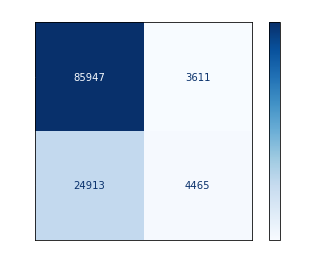

In [50]:

color = 'white'
matrix = plot_confusion_matrix(status, xc_test, yc_test, cmap=plt.cm.Blues)
matrix.ax_.set_title('Confusion Matrix', color=color)
plt.xlabel('Predicted Label', color=color)
plt.ylabel('True Label', color=color)
plt.gcf().axes[0].tick_params(colors=color)
plt.gcf().axes[1].tick_params(colors=color)
plt.show()

In [51]:
from sklearn.metrics import classification_report
print(classification_report(yc_test,a))

              precision    recall  f1-score   support

           0       0.78      0.96      0.86     89558
           1       0.55      0.15      0.24     29378

    accuracy                           0.76    118936
   macro avg       0.66      0.56      0.55    118936
weighted avg       0.72      0.76      0.70    118936



In [53]:
# print(f1_score(yc_test,a, average='weighted'))

In [34]:
# accc=accuracy_score(yc_test,a)
# accc

In [47]:
aad=[]
for i in range(100):
    ran=r.randint(1,999999999999)
    print(ran)
    aad.append(ran)
    
    

66761537461
930924653083
514404033235
300300008033
861803853799
543094967455
257335464547
716744829999
675965447457
332118249628
307165046721
614174133135
550480636978
852003143726
494500770100
205048915156
676562443118
386125841909
143317877169
310552154334
458681718219
910225628708
95728441712
579369611540
773719816065
152155854916
849056737820
419500909792
644756870927
443783133538
211974494101
392166345807
573625788528
161843887271
283561516346
916719258865
730340937865
955815847667
594792491227
671323965292
641704798395
585105551330
566996572149
834071949681
391568700321
900450109736
524757947237
919987605377
81405236672
948381930383
830072978964
411942403369
498989314537
283596335676
383542192957
785682228493
741286119819
190000536725
217619525948
787239038354
437801299231
585813961530
721711646901
850044730710
530158032845
517545622209
711284332435
101789242751
868962987803
902143130966
950942315282
872153819130
104201753535
932066997689
942802041852
453444089606
821063315703
99